# Importing

## Importing modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import time
import random
import math
from multiprocessing import Process, Queue

import keras
from keras.models import Sequential
from keras.layers import Activation, Dense
from keras.models import load_model, clone_model
from keras.optimizers import SGD, adam, adagrad, rmsprop

Using TensorFlow backend.


## Importing own code

In [2]:
from generateSpace import *
from plotLattice import *
from potentialEnergy import *
from numberOfCalculations import *
from makeRandomDatabase import *
from prepareDatabaseForMachineLearning import*

## Writing own code

### Analysis code

In [3]:
def plotHistory(fitDetails):
    """
    hjhgj
    """
    history = {'loss': fitDetails.history['loss'], 'val_loss': fitDetails.history['val_loss']}
    
    maximumValue = max(max(history['loss']), max(history['val_loss']))
    minimumValue = min(min(history['loss']), min(history['val_loss'])) / 10#math.pow(math.floor(math.log(min(min(history['loss']), min(history['val_loss'])), 10)) - 1, 10)
    numberOfEpochs = len(history['loss'])
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))
    ax1.plot([i for i in range(1, numberOfEpochs + 1)], history['loss'], label='Training loss')
    ax1.plot([i for i in range(1, numberOfEpochs + 1)], history['val_loss'], label='Validation loss')
    ax1.legend()
    ax1.set_xlim(1, numberOfEpochs)
    ax1.set_ylim(0, maximumValue)
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss (E/Ec)')
    ax1.set_title('Loss (training and validation) vs the number of epochs.')
    
    ax2.plot(history['loss'], history['val_loss'])
    ax2.set_xlim(0, maximumValue)
    ax2.set_ylim(0, maximumValue)
    ax2.set_xlabel('Training loss (E/Ec)')
    ax2.set_ylabel('Validation loss (E/Ec)')
    ax2.set_title('Validation loss vs training loss.')
    
    ax3.plot([i for i in range(1, numberOfEpochs + 1)], history['loss'], label='Training loss')
    ax3.plot([i for i in range(1, numberOfEpochs + 1)], history['val_loss'], label='Validation loss')
    ax3.legend()
    ax3.set_xlim(1, numberOfEpochs)
    ax3.set_yscale('log')
    ax3.set_ylim(minimumValue, maximumValue)
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Loss (E/Ec)')
    ax3.set_title('Loss (training and validation) vs the number of epochs (logarithmic)')
    
    ax4.plot(history['loss'], history['val_loss'])
    ax4.set_xscale('log')
    ax4.set_xlim(minimumValue, maximumValue)
    ax4.set_yscale('log')
    ax4.set_ylim(minimumValue, maximumValue)
    ax4.set_xlabel('Training loss (E/Ec)')
    ax4.set_ylabel('Validation loss (E/Ec)')
    ax4.set_title('Validation loss vs training loss (logarithmic).')
    
    plt.show()
    history['figure'] = [fig, ax1, ax2, ax3, ax4]
    
    return history

In [4]:
def makeGradiantPlot(model, x, testData):
    y = [[],[]]
    for i in range(len(x)):
        y[0].append(model.predict([[testData['eigenvalues'][i]]])[0][0])
        #y[0].append(model.predict([[testData['relativeDistances'][i]]])[0][0])
        y[1].append(testData['potentialEnergy'][i])


    fig, ((ax1, ax2)) = plt.subplots( ncols=2, figsize=(16, 8))
    ax1.plot(list(x), y[0], label='Predicted potential energy')
    ax1.plot(list(x), y[1], label='Real potential energy')
    ax1.legend()
    ax1.set_xlabel('Position of particle (r/Rc)')
    ax1.set_ylabel('Potential energy per particle (E/Ec)')
    ax1.set_title('Predicted potential energy and real potential energy for different positions.')
    
    ax2.plot(list(x), np.gradient(y[0], x[1] - x[0]), label='Predicted gradiant')
    ax2.plot(list(x), np.gradient(y[1], x[1] - x[0]), label='Real gradiant')
    ax2.legend()
    ax2.set_xlabel('Position of particle (r/Rc)')
    ax2.set_ylabel('Gradiant')
    ax2.set_title('Predicted gradiant and real gradiant for different positions.')
    
    plt.show()

In [5]:
def makePredictionPlot(model, dataFrame, amountOfPoints=2500):
    prediction = []
    realValue = []
    
    for i in range(min(len(dataFrame['potentialEnergy']), amountOfPoints)):
        index = dataFrame.index[i]
        prediction.append(model.predict([[dataFrame['eigenvalues'][index]]])[0][0])
        #prediction.append(model.predict([[dataFrame['relativeDistances'][index]]])[0][0])
        realValue.append(dataFrame['potentialEnergy'][index])
    
    fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
    ax1.scatter(realValue, prediction, s=5)
    ax1.set_xlim(min(min(prediction), min(realValue)), max(max(prediction), max(realValue)))
    ax1.set_ylim(min(min(prediction), min(realValue)), max(max(prediction), max(realValue)))
    ax1.set_xlabel('Real energy per particle (E/Ec)')
    ax1.set_ylabel('Predicted energy per particle (E/Ec)')
    ax1.set_title('Predicted energy vs real energy.')
    
    plt.show()

In [6]:
def plotAndPredict(model, dataFrame, indexNumber):
    prediction = model.predict([[dataFrame['eigenvalues'][indexNumber]]])[0][0]
    #prediction = model.predict([[dataFrame['relativeDistances'][indexNumber]]])[0][0]
    realValue = dataFrame['potentialEnergy'][indexNumber]
    
    fig, ax = plotLatticeFromDataFrame(dataFrame, indexNumber)
    print('For index', indexNumber, 'Predicted', prediction, 'was', realValue)
    return fig, ax

### Network code

In [7]:
def testNetwork(trainingInput, settings, learningRate, kernalInitializer='he_uniform', lossFunction='MAE', validationSplit=0.3, epochs=10000, verbose=1, callbacksNetwork=[], sampleSize=4):
    bestModel = makeDenseNetwork(settings, learningRate, kernalInitializer, lossFunction)
    if verbose>=1:
        bestModel.summary()
        print(bestModel.evaluate(trainingInput['input'], trainingInput['target'], verbose=1))
        for i in range(len(bestModel.layers)):
            print('Layer ' + str(i) + ': ', bestModel.layers[i].get_weights())
    
    bestEvaluation = bestModel.evaluate(trainingInput['input'], trainingInput['target'], verbose=0)
    bestFitDetails = bestModel.fit(trainingInput['input'], trainingInput['target'], validation_split=validationSplit, epochs=3, verbose=0, callbacks=callbacksNetwork)
    
    for i in range(sampleSize):
        model = makeDenseNetwork(settings, learningRate, kernalInitializer, lossFunction)
        fitDetails = model.fit(trainingInput['input'], trainingInput['target'], validation_split=validationSplit, epochs=epochs, verbose=verbose, callbacks=callbacksNetwork)
        
        if fitDetails.history['val_loss'][-1]<=bestEvaluation:
            bestModel = model
            bestEvaluation = fitDetails.history['val_loss'][-1]
            bestFitDetails = fitDetails
            
        if verbose>=1:
            for j in range(len(model.layers)):
                print('Network' + str(i) + ' Layer ' + str(j) + ': ', model.layers[j].get_weights())
            history = plotHistory(fitDetails)
    
    return bestModel, bestFitDetails

In [8]:
def makeDenseNetwork(settings, learningRate, kernalInitializer='he_uniform', lossFunction='MAE'):#https://keras.io/api/losses/regression_losses/
    """
    jhgjhgj
    """
    model = Sequential()
    model.add(Dense(settings[1][1], input_dim=settings[0], use_bias=settings[1][3], activation=settings[1][2], kernel_initializer=kernalInitializer))
    #model.add(Activation(settings[0][2]))
    
    for i in range(2, len(settings)):
        setting = settings[i]#0 is kind of layer, rest are settings.
        
        model.add(Dense(setting[1], use_bias=setting[3], activation=setting[2], kernel_initializer=kernalInitializer))
        #model.add(Activation(setting[2]))
    
    opt = adam(lr=learningRate)
    model.compile(loss=lossFunction, optimizer=opt)
    
    return model

In [9]:
def makeLinearNet(learningRate, inputDim, loss):
    model = Sequential()
    opt = adam(lr=learningRate)
    model.add(Dense(1, activation="linear", use_bias=False, input_dim=inputDim))
    model.compile(loss=loss, optimizer=opt)
    return model

# Getting data

## Importing data and settings

In [10]:
filename = 'DatabaseMin_86Width1.5-10_100k_40scans_0.1max_3ds_1dsDecent_4particles_2D_M2M3M4M5R0p20Prepared'#'databaseModLen_min_cut0.90_widths86_Width5_data1k_3-1sur_epoch30_maxDelta0.1_1Prepared'
orderOfMatrix = [-2, -3, -4, -5]# Make a list if you want to do the calculations yourself and make a other type of you want to import it
inputSize = 4 * len(orderOfMatrix)
saveFolder = 'M2M3M4M5MultiBias'
lossMetric = 'MAE'

In [11]:

data = pd.read_json(filename + '.json', orient='columns')
data['particleCoordinates'] = data['particleCoordinates'].apply(np.array)
data['eigenvalues'] = data['eigenvalues'].apply(np.array)
#data['eigenvalues'] = data['eigenvalues'].apply(np.transpose)
#data['eigenvalues'] = data['eigenvalues'].apply(list)

offset = 0#min(data['potentialEnergy'])
print('Offset is', offset)
data['potentialEnergy'] = data['potentialEnergy']-offset

Offset is 0


## Inspecting data

In [12]:
data.head()

,index,particleCoordinates,widthOfCell,numberOfSurroundingCells,potentialEnergy,eigenvalues,relativeDistances
0,13052,"[[1.8925216822, 3.6775631852], [1.1686648092, ...",4.2,3,-0.695904,"[-750.5202151547, -366.6736606499, -46.2050484...","[4.2, 0.8993025916, 0.9454639633, 1.1225749395..."
1,13053,"[[2.5686682062, 3.2196248381], [3.4995795329, ...",4.2,3,-1.640752,"[-474.4731927234, -393.4942765349, -75.0135179...","[4.2, 0.9201395494, 0.9471052266000001, 1.0296..."
2,13054,"[[1.9997435245, 0.9592098562], [1.9936054117, ...",4.2,3,34.612426,"[-1045.1698087511, -375.4710202536, 31.0510874...","[4.2, 0.9582121178, 1.7413516391, 7.7548164397..."
3,13055,"[[2.301940213, 2.0955400339], [2.0954415084, 2...",4.2,3,-2.258601,"[-613.3019720482, -352.6591534948, -66.3456313...","[4.2, 0.7818429329000001, 0.8393217318, 1.0728..."
4,13056,"[[0.9417342461, 0.70355726], [0.6100265513, 3....",4.2,3,-1.381906,"[-535.6224411492, -189.8286175862, -138.349007...","[4.2, 0.8520498780000001, 7.3412081235, 8.2415..."


In [13]:
data.describe()

,index,widthOfCell,numberOfSurroundingCells,potentialEnergy
count,97882.000000,97882.000000,97882.0,97882.000000
mean,48940.500000,5.651593,3.0,9.973750
std,28256.243862,2.443168,0.0,132.626087
min,0.000000,1.500000,3.0,-29.418425
25%,24470.250000,3.500000,3.0,-2.212925
50%,48940.500000,5.600000,3.0,-0.706743
75%,73410.750000,7.700000,3.0,-0.109594
max,97881.000000,10.000000,3.0,8848.009533


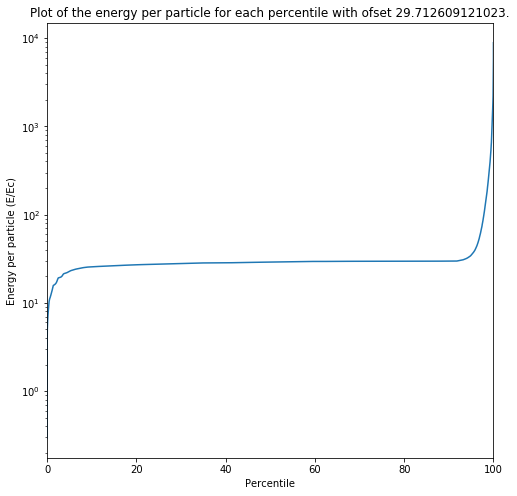

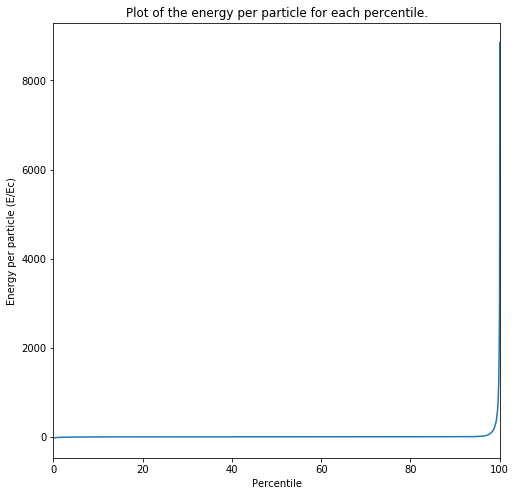

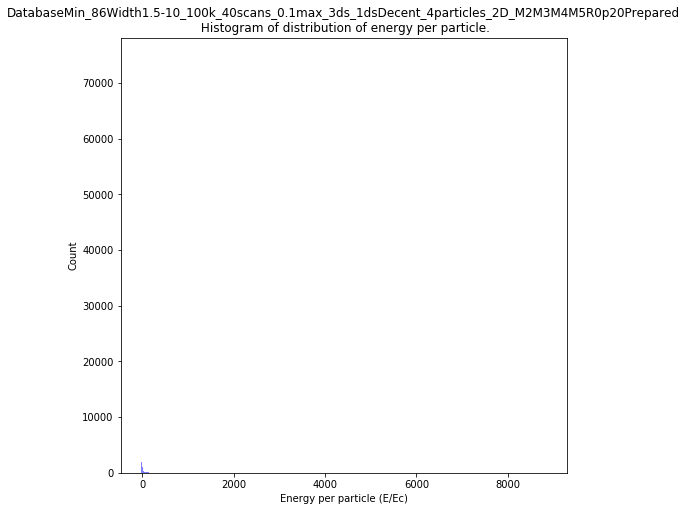

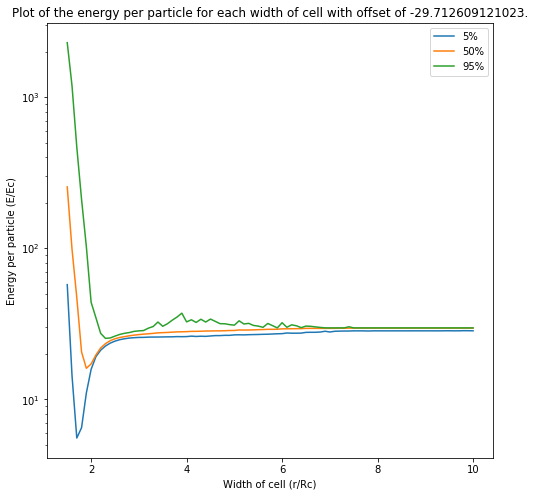

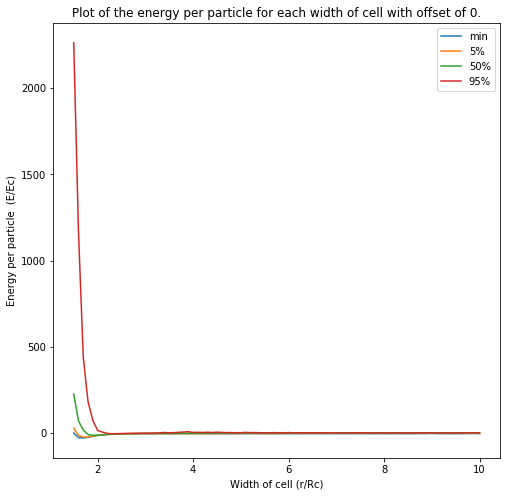

In [14]:

#"""
qLow = data['potentialEnergy'].quantile(0.01)
qHi  = data['potentialEnergy'].quantile(0.99)
dataFiltered = data.copy()
#dataFiltered = data[(data['potentialEnergy'] < qHi) & (data['potentialEnergy'] > qLow)]

x = dataFiltered['potentialEnergy']
fig, ax = plt.subplots(figsize=(8, 8))
sortedX = np.sort(x) - 1.01 * min(x)
ax.plot([100*i/len(x) for i in range(0, len(x))], sortedX)
ax.set_xlim(0, 100)
ax.set_yscale('log')
ax.set_title('Plot of the energy per particle for each percentile with ofset ' + str(-1.01 * min(x)) + '.')
ax.set_ylabel('Energy per particle (E/Ec)')
ax.set_xlabel('Percentile')
plt.show()

x = dataFiltered['potentialEnergy']
fig, ax = plt.subplots(figsize=(8, 8))
sortedX = np.sort(x)
ax.plot([100*i/len(x) for i in range(0, len(x))], sortedX)
ax.set_xlim(0, 100)
ax.set_title('Plot of the energy per particle for each percentile.')
ax.set_ylabel('Energy per particle (E/Ec)')
ax.set_xlabel('Percentile')
plt.show()


#"""


#"""
numBins = 1000
fig, ax = plt.subplots(figsize=(8, 8))
n, bins, patches = ax.hist(x, numBins, facecolor='blue', alpha=0.5)
ax.set_title(filename + '\n Histogram of distribution of energy per particle.')
ax.set_xlabel('Energy per particle (E/Ec)')
ax.set_ylabel('Count')
plt.show()
#"""

#"""
tempData = dataFiltered.copy()
tempOfsett = 1.01 * min(tempData['potentialEnergy'])
tempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett
medianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['50%'])
ax.plot(medianData.index, medianData['potentialEnergy']['95%'])
plt.legend(['5%', '50%', '95%'])
ax.set_yscale('log')
ax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')
ax.set_ylabel('Energy per particle (E/Ec)')
ax.set_xlabel('Width of cell (r/Rc)')
plt.show()
#"""

#"""
tempData = dataFiltered.copy()
tempOfsett = 0#1.01 * min(tempData['potentialEnergy'])
tempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett
medianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(medianData.index, medianData['potentialEnergy']['min'])
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['50%'])
ax.plot(medianData.index, medianData['potentialEnergy']['95%'])
plt.legend(['min', '5%', '50%', '95%'])
#plt.ylim(-30, 30)
ax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')
ax.set_ylabel('Energy per particle  (E/Ec)')
ax.set_xlabel('Width of cell (r/Rc)')
plt.show()
#"""


## Preparing data

In [15]:
#"""
trainingData = data.sample(frac=0.8)
validationData = data.drop(trainingData.index)

inputData = []
targetData = []
for i in trainingData.index:
    inputData.append(np.array(trainingData['eigenvalues'][i]))
    #inputData.append(np.array(trainingData['relativeDistances'][i]))
    targetData.append(trainingData['potentialEnergy'][i])
    #targetData.append(sum(trainingData['eigenvalues'][i]))
    #targetData.append([sum(trainingData['relativeDistances'][i])])

trainingInput = {'input':np.array(inputData), 'target':np.array(targetData)}

print('Results training input:')
[print(trainingInput['input'][i], trainingInput['target'][i], '\n') for i in range(0, 3)]
print(np.shape(trainingInput['input']))
print(type(trainingInput['input']))
print(type(trainingInput['input'][0]))
print(np.shape(trainingInput['target']))
print(type(trainingInput['target']))

inputData = []
targetData = []
for i in validationData.index:
    inputData.append(np.array(validationData['eigenvalues'][i]))
    #inputData.append(np.array(validationData['relativeDistances'][i]))
    targetData.append(validationData['potentialEnergy'][i])
    #targetData.append([sum(validationData['eigenvalues'][i])])
    #targetData.append([sum(validationData['relativeDistances'][i])])

validationInput = {'input':np.array(inputData), 'target':np.array(targetData)}

print('Results validation input:')
[print(validationInput['input'][i], validationInput['target'][i], '\n') for i in range(0, 3)]
print(np.shape(validationInput['input']))
print(type(validationInput['input']))
print(type(validationInput['input'][0]))
print(np.shape(validationInput['target']))
print(type(validationInput['target']))

validationPlots = [random.choice(validationData.index) for i in range(0, 11)]

#"""
print()

Results training input:
[-6.40831047e+02 -3.88796438e+02 -1.27253137e+02  2.15529103e+03
 -1.55064904e+04 -7.29873762e+03 -4.24213653e+02  2.68390207e+04
 -3.70069585e+05 -1.36861072e+05  2.15405717e+04  5.01005759e+05
 -8.77678134e+06 -2.56937677e+06  8.52098825e+05  1.05675943e+07] -2.1129576176000002 

[-3.98560094e+02 -5.17352024e+01  5.79952415e+01  5.69538462e+02
 -7.91111656e+03 -3.17615120e+02  4.27430985e+02  8.18462862e+03
 -1.57415589e+05 -1.87086508e+03  2.22699393e+03  1.57974594e+05
 -3.13462820e+06 -1.07972768e+04  1.17926870e+04  3.13592039e+06] -0.10959560980000001 

[-5.62010919e+02 -1.35505135e+02  2.03368233e+01  9.02779638e+02
 -1.25033640e+04 -1.47222089e+03  1.34046896e+02  1.43677462e+04
 -2.73298739e+05 -1.58296307e+04  5.92961511e+02  2.89902091e+05
 -5.93088972e+06 -1.69476612e+05  2.69380546e+03  6.10140758e+06] -0.6017226702 

(78306, 16)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(78306,)
<class 'numpy.ndarray'>
Results validation input:
[-7.50520215e

## Preparing test data

No handles with labels found to put in legend.


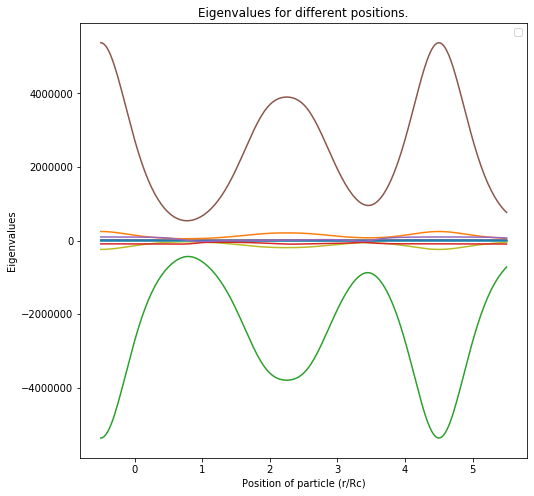

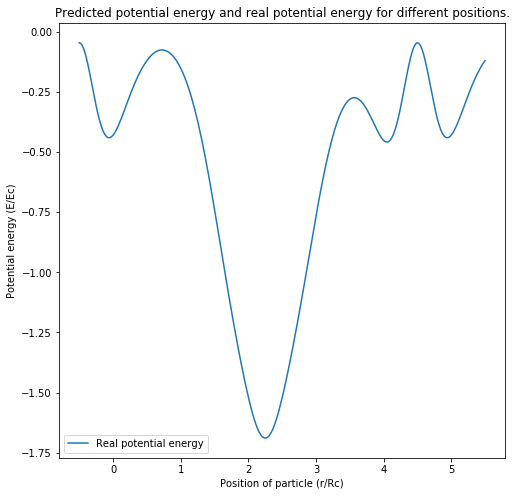

In [16]:
#"""
widthOfCell = 5.0
numberOfSurroundingCells = 3
R0 = 20
x = np.linspace(-0.1, 1.1, 2*120)

testData = {'particleCoordinates': [],'widthOfCell':[] , 'numberOfSurroundingCells': [], 'potentialEnergy':[]}# Initialy use a dictionary because it's easier to append to than a dataframe.
for i in x:
    particles = [np.array([0.3, 0.5]), np.array([0.68, 0.9]), np.array([0.7, 0.4]), np.array([0.5, i])]
    particles = [widthOfCell * coordinate for coordinate in particles]
    otherSpace = generateSpace(particles, numberOfSurroundingCells, widthOfCell)# Generate the other space.
    testData['particleCoordinates'].append(particles)
    testData['widthOfCell'].append(widthOfCell)
    testData['numberOfSurroundingCells'].append(numberOfSurroundingCells)
    testData['potentialEnergy'].append(potentialEnergy(otherSpace, particles, potentialEnergyPerSet) - offset)# Calculate the potential energy and save it to the data dictonairy.

x = widthOfCell * x
testData = prepareDatabseForMachineLearning(pd.DataFrame(testData), orderOfMatrix, R0, giveUpdates = False)

fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.plot(list(x), [testData['eigenvalues'][i] for i in range(0, len(testData['eigenvalues']))])
#ax1.plot(list(x), [testData['relativeDistances'][i] for i in range(0, len(testData['relativeDistances']))])
ax1.legend()
#ax1.set_ylim(-50, 50)
ax1.set_xlabel('Position of particle (r/Rc)')
ax1.set_ylabel('Eigenvalues')
#ax1.set_ylabel('Relative distances')
ax1.set_title('Eigenvalues for different positions.')
plt.show()

testData.head()
testData.describe()

y = []
for i in range(len(x)):
    y.append(testData['potentialEnergy'][i])


fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.plot(list(x), y, label='Real potential energy')
ax1.legend()
ax1.set_xlabel('Position of particle (r/Rc)')
ax1.set_ylabel('Potential energy (E/Ec)')
ax1.set_title('Predicted potential energy and real potential energy for different positions.')
#ax1.set_ylim(-0.75 * offset , 1.5 * max(y[1]))
plt.show()
#"""
print()

# Machine learning

In [17]:
def RSMPE(target,value):
    return ((keras.backend.mean(((value-target)/target)**2))**0.5)*100

def MAE(target,value):
    return keras.backend.mean(abs(value-target))

models = []
prefixName = 0

## Model 0: Linear network

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 1)                 17        
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
78306/78306 [==============================] - 1s 11us/step
2097203.9562804895
Layer 0:  [array([[ 0.37268877],
       [-0.13551125],
       [-0.05295676],
       [-0.18881372],
       [-0.585815  ],
       [-0.4283924 ],
       [-0.07750332],
       [-0.02010071],
       [-0.45196807],
       [ 0.4050823 ],
       [-0.03756982],
       [-0.31140548],
       [-0.03768754],
       [-0.19257179],
       [-0.13119224],
       [ 0.13609964]], dtype=float32), array([0.], dtype=float32)]
Train on 62644 samples, validate on 15662 samples
Epoch 1/20000
62644/62644 [==============================] - 2s 32us/step - loss: 4212125.9932 - val_loss: 3974442.

Epoch 62/20000
62644/62644 [==============================] - 2s 28us/step - loss: 13214.7041 - val_loss: 12964.5420
Epoch 63/20000
62644/62644 [==============================] - 2s 29us/step - loss: 13109.6481 - val_loss: 12854.9002
Epoch 64/20000
62644/62644 [==============================] - 2s 28us/step - loss: 13010.8941 - val_loss: 12840.7320
Epoch 65/20000
62644/62644 [==============================] - 2s 28us/step - loss: 12916.5335 - val_loss: 12687.6105
Epoch 66/20000
62644/62644 [==============================] - 2s 28us/step - loss: 12815.5716 - val_loss: 12561.0242
Epoch 67/20000
62644/62644 [==============================] - 2s 28us/step - loss: 12711.9922 - val_loss: 12486.5531
Epoch 68/20000
62644/62644 [==============================] - 2s 28us/step - loss: 12615.3845 - val_loss: 12383.3436
Epoch 69/20000
62644/62644 [==============================] - 2s 28us/step - loss: 12523.8335 - val_loss: 12268.6037
Epoch 70/20000
62644/62644 [==============================] - 2s

Epoch 203/20000
62644/62644 [==============================] - 2s 29us/step - loss: 2108.4783 - val_loss: 2059.5540
Epoch 204/20000
62644/62644 [==============================] - 2s 28us/step - loss: 2076.8463 - val_loss: 2045.6992
Epoch 205/20000
62644/62644 [==============================] - 2s 28us/step - loss: 2044.7033 - val_loss: 2006.9002
Epoch 206/20000
62644/62644 [==============================] - 2s 28us/step - loss: 2022.3563 - val_loss: 1985.9571
Epoch 207/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1995.8951 - val_loss: 1969.2478
Epoch 208/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1971.3860 - val_loss: 1932.9838
Epoch 209/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1955.5006 - val_loss: 1922.6139
Epoch 210/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1935.7395 - val_loss: 1898.0809
Epoch 211/20000
62644/62644 [==============================] - 2s 28us/s

Epoch 344/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1352.4820 - val_loss: 1340.1923
Epoch 345/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1353.5699 - val_loss: 1336.6960
Epoch 346/20000
62644/62644 [==============================] - 2s 29us/step - loss: 1350.6703 - val_loss: 1362.3370
Epoch 347/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1345.3809 - val_loss: 1317.9121
Epoch 348/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1342.5867 - val_loss: 1393.6367
Epoch 349/20000
62644/62644 [==============================] - 2s 29us/step - loss: 1342.3441 - val_loss: 1313.7972
Epoch 350/20000
62644/62644 [==============================] - 2s 28us/step - loss: 1340.9782 - val_loss: 1330.4177
Epoch 351/20000
62644/62644 [==============================] - 2s 27us/step - loss: 1330.9590 - val_loss: 1388.7964
Epoch 352/20000
62644/62644 [==============================] - 2s 27us/s

Epoch 485/20000
62644/62644 [==============================] - 2s 30us/step - loss: 1028.3275 - val_loss: 1005.0066
Epoch 486/20000
62644/62644 [==============================] - 2s 34us/step - loss: 1025.0505 - val_loss: 1007.4810
Epoch 487/20000
62644/62644 [==============================] - 2s 35us/step - loss: 1023.8496 - val_loss: 1000.0669
Epoch 488/20000
62644/62644 [==============================] - 2s 35us/step - loss: 1021.1908 - val_loss: 1003.1730
Epoch 489/20000
62644/62644 [==============================] - 2s 31us/step - loss: 1024.2756 - val_loss: 1017.1048
Epoch 490/20000
62644/62644 [==============================] - 2s 30us/step - loss: 1017.4009 - val_loss: 998.7892
Epoch 491/20000
62644/62644 [==============================] - 2s 29us/step - loss: 1015.8319 - val_loss: 1002.0660
Epoch 492/20000
62644/62644 [==============================] - 2s 30us/step - loss: 1017.8214 - val_loss: 1005.7413
Epoch 493/20000
62644/62644 [==============================] - 2s 29us/st

62644/62644 [==============================] - 2s 35us/step - loss: 814.4127 - val_loss: 940.4455
Epoch 629/20000
62644/62644 [==============================] - 2s 34us/step - loss: 814.3361 - val_loss: 832.7407
Epoch 630/20000
62644/62644 [==============================] - 2s 28us/step - loss: 811.9996 - val_loss: 797.3059
Epoch 631/20000
62644/62644 [==============================] - 2s 29us/step - loss: 810.9441 - val_loss: 791.0593
Epoch 632/20000
62644/62644 [==============================] - 2s 29us/step - loss: 810.5192 - val_loss: 799.5991
Epoch 633/20000
62644/62644 [==============================] - 2s 29us/step - loss: 808.3026 - val_loss: 799.8063
Epoch 634/20000
62644/62644 [==============================] - 2s 28us/step - loss: 807.3261 - val_loss: 789.4836
Epoch 635/20000
62644/62644 [==============================] - 2s 27us/step - loss: 804.7649 - val_loss: 788.7375
Epoch 636/20000
62644/62644 [==============================] - 2s 28us/step - loss: 804.9028 - val_loss:

62644/62644 [==============================] - 2s 31us/step - loss: 735.3001 - val_loss: 717.4933
Epoch 701/20000
62644/62644 [==============================] - 2s 29us/step - loss: 735.1513 - val_loss: 717.1585
Epoch 702/20000
62644/62644 [==============================] - 2s 30us/step - loss: 729.8158 - val_loss: 724.6459
Epoch 703/20000
62644/62644 [==============================] - 2s 28us/step - loss: 733.0014 - val_loss: 718.7296
Epoch 704/20000
62644/62644 [==============================] - 2s 28us/step - loss: 731.2240 - val_loss: 728.7004
Epoch 705/20000
62644/62644 [==============================] - 2s 28us/step - loss: 733.4186 - val_loss: 728.7775
Epoch 706/20000
62644/62644 [==============================] - 2s 28us/step - loss: 727.3990 - val_loss: 711.4498
Epoch 707/20000
62644/62644 [==============================] - 2s 28us/step - loss: 728.1247 - val_loss: 787.1787
Epoch 708/20000
62644/62644 [==============================] - 2s 28us/step - loss: 727.9819 - val_loss:

62644/62644 [==============================] - 2s 27us/step - loss: 663.7439 - val_loss: 654.2906
Epoch 773/20000
62644/62644 [==============================] - 2s 28us/step - loss: 668.7940 - val_loss: 685.0262
Epoch 774/20000
62644/62644 [==============================] - 2s 28us/step - loss: 666.3858 - val_loss: 653.6051
Epoch 775/20000
62644/62644 [==============================] - 2s 27us/step - loss: 660.7293 - val_loss: 743.8392
Epoch 776/20000
62644/62644 [==============================] - 2s 27us/step - loss: 660.9830 - val_loss: 710.0863
Epoch 777/20000
62644/62644 [==============================] - 2s 27us/step - loss: 659.7747 - val_loss: 651.2760
Epoch 778/20000
62644/62644 [==============================] - 2s 28us/step - loss: 661.3450 - val_loss: 656.3731
Epoch 779/20000
62644/62644 [==============================] - 2s 28us/step - loss: 661.7397 - val_loss: 686.0786
Epoch 780/20000
62644/62644 [==============================] - 2s 27us/step - loss: 657.0761 - val_loss:

62644/62644 [==============================] - 2s 28us/step - loss: 602.8732 - val_loss: 590.4332
Epoch 845/20000
62644/62644 [==============================] - 2s 28us/step - loss: 601.6007 - val_loss: 591.4608
Epoch 846/20000
62644/62644 [==============================] - 2s 27us/step - loss: 603.1510 - val_loss: 595.9921
Epoch 847/20000
62644/62644 [==============================] - 2s 27us/step - loss: 600.8523 - val_loss: 600.7971
Epoch 848/20000
62644/62644 [==============================] - 2s 28us/step - loss: 601.5096 - val_loss: 596.0941
Epoch 849/20000
62644/62644 [==============================] - 2s 27us/step - loss: 603.2649 - val_loss: 585.9783
Epoch 850/20000
62644/62644 [==============================] - 2s 27us/step - loss: 599.3391 - val_loss: 623.0710
Epoch 851/20000
62644/62644 [==============================] - 2s 28us/step - loss: 598.8613 - val_loss: 591.9021
Epoch 852/20000
62644/62644 [==============================] - 2s 27us/step - loss: 598.1970 - val_loss:

62644/62644 [==============================] - 2s 27us/step - loss: 546.0415 - val_loss: 531.9220
Epoch 917/20000
62644/62644 [==============================] - 2s 28us/step - loss: 546.2170 - val_loss: 532.4647
Epoch 918/20000
62644/62644 [==============================] - 2s 28us/step - loss: 545.5834 - val_loss: 539.0508
Epoch 919/20000
62644/62644 [==============================] - 2s 28us/step - loss: 543.8496 - val_loss: 534.6940
Epoch 920/20000
62644/62644 [==============================] - 2s 27us/step - loss: 543.7486 - val_loss: 573.2411
Epoch 921/20000
62644/62644 [==============================] - 2s 28us/step - loss: 543.0459 - val_loss: 529.8774
Epoch 922/20000
62644/62644 [==============================] - 2s 28us/step - loss: 541.4470 - val_loss: 532.0887
Epoch 923/20000
62644/62644 [==============================] - 2s 28us/step - loss: 542.0495 - val_loss: 591.8382
Epoch 924/20000
62644/62644 [==============================] - 2s 27us/step - loss: 539.9893 - val_loss:

62644/62644 [==============================] - 2s 32us/step - loss: 495.9376 - val_loss: 484.3195
Epoch 989/20000
62644/62644 [==============================] - 2s 35us/step - loss: 494.7051 - val_loss: 487.6554
Epoch 990/20000
62644/62644 [==============================] - 2s 33us/step - loss: 494.9365 - val_loss: 491.0071
Epoch 991/20000
62644/62644 [==============================] - 2s 29us/step - loss: 494.8528 - val_loss: 503.3996
Epoch 992/20000
62644/62644 [==============================] - 2s 31us/step - loss: 491.3131 - val_loss: 497.3475
Epoch 993/20000
62644/62644 [==============================] - 2s 29us/step - loss: 493.5772 - val_loss: 477.4778
Epoch 994/20000
62644/62644 [==============================] - 2s 30us/step - loss: 488.3104 - val_loss: 493.7148
Epoch 995/20000
62644/62644 [==============================] - 2s 31us/step - loss: 488.8096 - val_loss: 475.4610
Epoch 996/20000
62644/62644 [==============================] - 2s 28us/step - loss: 489.5689 - val_loss:

62644/62644 [==============================] - 2s 36us/step - loss: 404.4832 - val_loss: 408.1967
Epoch 1131/20000
62644/62644 [==============================] - 2s 28us/step - loss: 402.6498 - val_loss: 391.6848
Epoch 1132/20000
62644/62644 [==============================] - 2s 31us/step - loss: 401.8073 - val_loss: 396.0352
Epoch 1133/20000
62644/62644 [==============================] - 2s 31us/step - loss: 402.5564 - val_loss: 427.2310
Epoch 1134/20000
62644/62644 [==============================] - 2s 29us/step - loss: 401.2667 - val_loss: 408.8076
Epoch 1135/20000
62644/62644 [==============================] - 2s 31us/step - loss: 401.9654 - val_loss: 402.5113
Epoch 1136/20000
62644/62644 [==============================] - 2s 29us/step - loss: 402.0913 - val_loss: 407.8742
Epoch 1137/20000
62644/62644 [==============================] - 2s 28us/step - loss: 400.0381 - val_loss: 387.5760
Epoch 1138/20000
62644/62644 [==============================] - 2s 28us/step - loss: 397.4020 - v

62644/62644 [==============================] - 2s 28us/step - loss: 325.5844 - val_loss: 312.9613
Epoch 1273/20000
62644/62644 [==============================] - 2s 27us/step - loss: 325.1136 - val_loss: 324.4855
Epoch 1274/20000
62644/62644 [==============================] - 2s 27us/step - loss: 324.5699 - val_loss: 376.8265
Epoch 1275/20000
62644/62644 [==============================] - 2s 28us/step - loss: 325.1323 - val_loss: 313.0328
Epoch 1276/20000
62644/62644 [==============================] - 2s 28us/step - loss: 323.6034 - val_loss: 311.0773
Epoch 1277/20000
62644/62644 [==============================] - 2s 27us/step - loss: 324.2727 - val_loss: 406.6028
Epoch 1278/20000
62644/62644 [==============================] - 2s 28us/step - loss: 324.3287 - val_loss: 346.3641
Epoch 1279/20000
62644/62644 [==============================] - 2s 28us/step - loss: 321.9487 - val_loss: 316.4325
Epoch 1280/20000
62644/62644 [==============================] - 2s 28us/step - loss: 325.1951 - v

62644/62644 [==============================] - 2s 28us/step - loss: 263.4080 - val_loss: 249.1935
Epoch 1415/20000
62644/62644 [==============================] - 2s 28us/step - loss: 258.7030 - val_loss: 275.8639
Epoch 1416/20000
62644/62644 [==============================] - 2s 27us/step - loss: 263.3181 - val_loss: 249.0663
Epoch 1417/20000
62644/62644 [==============================] - 2s 27us/step - loss: 260.1167 - val_loss: 252.0854
Epoch 1418/20000
62644/62644 [==============================] - 2s 28us/step - loss: 260.6487 - val_loss: 282.6059
Epoch 1419/20000
62644/62644 [==============================] - 2s 27us/step - loss: 264.3918 - val_loss: 247.1683
Epoch 1420/20000
62644/62644 [==============================] - 2s 27us/step - loss: 261.8487 - val_loss: 246.2337
Epoch 1421/20000
62644/62644 [==============================] - 2s 28us/step - loss: 261.0123 - val_loss: 247.7501
Epoch 1422/20000
62644/62644 [==============================] - 2s 27us/step - loss: 259.8745 - v

62644/62644 [==============================] - 2s 28us/step - loss: 218.3002 - val_loss: 203.1634
Epoch 1557/20000
62644/62644 [==============================] - 2s 27us/step - loss: 216.4287 - val_loss: 203.9243
Epoch 1558/20000
62644/62644 [==============================] - 2s 28us/step - loss: 217.1190 - val_loss: 206.7309
Epoch 1559/20000
62644/62644 [==============================] - 2s 27us/step - loss: 218.2801 - val_loss: 210.5573
Epoch 1560/20000
62644/62644 [==============================] - 2s 27us/step - loss: 218.7867 - val_loss: 236.7757
Epoch 1561/20000
62644/62644 [==============================] - 2s 28us/step - loss: 218.2675 - val_loss: 203.0127
Epoch 1562/20000
62644/62644 [==============================] - 2s 27us/step - loss: 217.6602 - val_loss: 223.7771
Epoch 1563/20000
62644/62644 [==============================] - 2s 27us/step - loss: 218.2245 - val_loss: 202.8982
Epoch 1564/20000
62644/62644 [==============================] - 2s 28us/step - loss: 219.1524 - v

62644/62644 [==============================] - 2s 32us/step - loss: 192.9261 - val_loss: 179.1495
Epoch 1699/20000
62644/62644 [==============================] - 2s 30us/step - loss: 192.9015 - val_loss: 186.9409
Epoch 1700/20000
62644/62644 [==============================] - 2s 28us/step - loss: 190.6746 - val_loss: 179.2063
Epoch 1701/20000
62644/62644 [==============================] - 2s 28us/step - loss: 195.3255 - val_loss: 211.8781
Epoch 1702/20000
62644/62644 [==============================] - 2s 27us/step - loss: 193.3480 - val_loss: 203.3463
Epoch 1703/20000
62644/62644 [==============================] - 2s 28us/step - loss: 191.7962 - val_loss: 176.6007
Epoch 1704/20000
62644/62644 [==============================] - 2s 30us/step - loss: 189.9467 - val_loss: 189.5683
Epoch 1705/20000
62644/62644 [==============================] - 2s 29us/step - loss: 191.5508 - val_loss: 179.5976
Epoch 1706/20000
62644/62644 [==============================] - 2s 28us/step - loss: 191.2249 - v

62644/62644 [==============================] - 2s 27us/step - loss: 179.3530 - val_loss: 174.0917
Epoch 1841/20000
62644/62644 [==============================] - 2s 29us/step - loss: 178.1003 - val_loss: 189.5189
Epoch 1842/20000
62644/62644 [==============================] - 2s 30us/step - loss: 178.1151 - val_loss: 166.8320
Epoch 1843/20000
62644/62644 [==============================] - 2s 28us/step - loss: 179.0959 - val_loss: 164.2725
Epoch 1844/20000
62644/62644 [==============================] - 2s 30us/step - loss: 178.5518 - val_loss: 220.6749
Epoch 1845/20000
62644/62644 [==============================] - 2s 32us/step - loss: 180.9671 - val_loss: 165.8860
Epoch 1846/20000
62644/62644 [==============================] - 2s 30us/step - loss: 178.5568 - val_loss: 182.2733
Epoch 1847/20000
62644/62644 [==============================] - 2s 26us/step - loss: 180.1755 - val_loss: 214.0158
Epoch 1848/20000
62644/62644 [==============================] - 2s 25us/step - loss: 176.2425 - v

62644/62644 [==============================] - 2s 25us/step - loss: 168.3809 - val_loss: 189.1163
Epoch 1983/20000
62644/62644 [==============================] - 2s 27us/step - loss: 169.7335 - val_loss: 219.9778
Epoch 1984/20000
62644/62644 [==============================] - 2s 26us/step - loss: 168.6981 - val_loss: 157.2653
Epoch 1985/20000
62644/62644 [==============================] - 2s 26us/step - loss: 169.3534 - val_loss: 170.8197
Epoch 1986/20000
62644/62644 [==============================] - 2s 25us/step - loss: 167.6900 - val_loss: 165.3292
Epoch 1987/20000
62644/62644 [==============================] - 2s 24us/step - loss: 171.5696 - val_loss: 160.1252
Epoch 1988/20000
62644/62644 [==============================] - 2s 25us/step - loss: 170.1457 - val_loss: 166.0104
Epoch 1989/20000
62644/62644 [==============================] - 2s 28us/step - loss: 167.2445 - val_loss: 165.4190
Epoch 1990/20000
62644/62644 [==============================] - 2s 27us/step - loss: 171.0182 - v

62644/62644 [==============================] - 2s 24us/step - loss: 162.8646 - val_loss: 153.4393
Epoch 2125/20000
62644/62644 [==============================] - 1s 24us/step - loss: 161.6774 - val_loss: 212.3264
Epoch 2126/20000
62644/62644 [==============================] - 2s 25us/step - loss: 162.0630 - val_loss: 151.6712
Epoch 2127/20000
62644/62644 [==============================] - 2s 24us/step - loss: 160.9298 - val_loss: 154.1941
Epoch 2128/20000
62644/62644 [==============================] - 2s 25us/step - loss: 161.6720 - val_loss: 196.1388
Epoch 2129/20000
62644/62644 [==============================] - 2s 24us/step - loss: 164.4100 - val_loss: 151.1127
Epoch 2130/20000
62644/62644 [==============================] - 2s 25us/step - loss: 162.4369 - val_loss: 151.0133
Epoch 2131/20000
62644/62644 [==============================] - 2s 26us/step - loss: 163.2813 - val_loss: 148.3576
Epoch 2132/20000
62644/62644 [==============================] - 2s 25us/step - loss: 160.6971 - v

62644/62644 [==============================] - 2s 25us/step - loss: 154.7922 - val_loss: 141.7912
Epoch 2267/20000
62644/62644 [==============================] - 2s 25us/step - loss: 155.5765 - val_loss: 142.4172
Epoch 2268/20000
62644/62644 [==============================] - 2s 25us/step - loss: 153.6403 - val_loss: 183.6066
Epoch 2269/20000
62644/62644 [==============================] - 2s 26us/step - loss: 154.7307 - val_loss: 201.6734
Epoch 2270/20000
62644/62644 [==============================] - 2s 25us/step - loss: 154.4411 - val_loss: 150.4785
Epoch 2271/20000
62644/62644 [==============================] - 2s 25us/step - loss: 153.9823 - val_loss: 169.8784
Epoch 2272/20000
62644/62644 [==============================] - 2s 25us/step - loss: 154.1399 - val_loss: 191.6502
Epoch 2273/20000
62644/62644 [==============================] - 2s 25us/step - loss: 156.1574 - val_loss: 145.2305
Epoch 2274/20000
62644/62644 [==============================] - 2s 25us/step - loss: 152.9487 - v

62644/62644 [==============================] - 2s 35us/step - loss: 149.0348 - val_loss: 156.6319
Epoch 2409/20000
62644/62644 [==============================] - 2s 36us/step - loss: 149.7260 - val_loss: 134.9646
Epoch 2410/20000
62644/62644 [==============================] - 2s 35us/step - loss: 148.5663 - val_loss: 139.8492
Epoch 2411/20000
62644/62644 [==============================] - 2s 31us/step - loss: 149.7887 - val_loss: 143.8092
Epoch 2412/20000
62644/62644 [==============================] - 2s 33us/step - loss: 149.2020 - val_loss: 155.2153
Epoch 2413/20000
62644/62644 [==============================] - 2s 33us/step - loss: 149.1252 - val_loss: 171.1679
Epoch 2414/20000
62644/62644 [==============================] - 2s 32us/step - loss: 149.0770 - val_loss: 145.7154
Epoch 2415/20000
62644/62644 [==============================] - 2s 30us/step - loss: 147.7110 - val_loss: 136.3782
Epoch 2416/20000
62644/62644 [==============================] - 2s 27us/step - loss: 149.6990 - v

62644/62644 [==============================] - 2s 28us/step - loss: 145.9673 - val_loss: 132.4710
Epoch 2551/20000
62644/62644 [==============================] - 2s 27us/step - loss: 144.2758 - val_loss: 133.8916
Epoch 2552/20000
62644/62644 [==============================] - 2s 26us/step - loss: 143.0371 - val_loss: 131.2468
Epoch 2553/20000
62644/62644 [==============================] - 2s 27us/step - loss: 142.9449 - val_loss: 132.7774
Epoch 2554/20000
62644/62644 [==============================] - 2s 27us/step - loss: 144.0862 - val_loss: 128.8548
Epoch 2555/20000
62644/62644 [==============================] - 2s 27us/step - loss: 143.8001 - val_loss: 129.1856
Epoch 2556/20000
62644/62644 [==============================] - 2s 26us/step - loss: 144.5468 - val_loss: 135.4883
Epoch 2557/20000
62644/62644 [==============================] - 2s 29us/step - loss: 142.6102 - val_loss: 133.0225
Epoch 2558/20000
62644/62644 [==============================] - 2s 27us/step - loss: 142.4261 - v

62644/62644 [==============================] - 2s 25us/step - loss: 138.9758 - val_loss: 140.0002
Epoch 2693/20000
62644/62644 [==============================] - 2s 26us/step - loss: 137.5951 - val_loss: 123.7812
Epoch 2694/20000
62644/62644 [==============================] - 2s 25us/step - loss: 137.4932 - val_loss: 152.5816
Epoch 2695/20000
62644/62644 [==============================] - 2s 34us/step - loss: 139.1146 - val_loss: 123.7648
Epoch 2696/20000
62644/62644 [==============================] - 2s 28us/step - loss: 136.7848 - val_loss: 142.2678
Epoch 2697/20000
62644/62644 [==============================] - 2s 29us/step - loss: 138.1881 - val_loss: 128.4072
Epoch 2698/20000
62644/62644 [==============================] - 2s 30us/step - loss: 136.6304 - val_loss: 145.1492
Epoch 2699/20000
62644/62644 [==============================] - 2s 30us/step - loss: 138.7859 - val_loss: 240.2686
Epoch 2700/20000
62644/62644 [==============================] - 2s 30us/step - loss: 138.1594 - v

62644/62644 [==============================] - 2s 27us/step - loss: 133.6949 - val_loss: 136.2935
Epoch 2835/20000
62644/62644 [==============================] - 2s 26us/step - loss: 131.9279 - val_loss: 129.5017
Epoch 2836/20000
62644/62644 [==============================] - 2s 27us/step - loss: 133.1255 - val_loss: 127.7118
Epoch 2837/20000
62644/62644 [==============================] - 2s 25us/step - loss: 132.5354 - val_loss: 125.3329
Epoch 2838/20000
62644/62644 [==============================] - 2s 25us/step - loss: 136.6982 - val_loss: 137.1276
Epoch 2839/20000
62644/62644 [==============================] - 2s 25us/step - loss: 131.7612 - val_loss: 126.5233
Epoch 2840/20000
62644/62644 [==============================] - 2s 25us/step - loss: 132.5505 - val_loss: 166.1669
Epoch 2841/20000
62644/62644 [==============================] - 2s 25us/step - loss: 132.9472 - val_loss: 132.7130
Epoch 2842/20000
62644/62644 [==============================] - 2s 25us/step - loss: 134.4102 - v

62644/62644 [==============================] - 2s 24us/step - loss: 127.6020 - val_loss: 115.1510
Epoch 2977/20000
62644/62644 [==============================] - 2s 24us/step - loss: 126.2210 - val_loss: 119.0341
Epoch 2978/20000
62644/62644 [==============================] - 2s 24us/step - loss: 126.9860 - val_loss: 113.2938
Epoch 2979/20000
62644/62644 [==============================] - 2s 24us/step - loss: 128.2673 - val_loss: 122.3664
Epoch 2980/20000
62644/62644 [==============================] - 2s 24us/step - loss: 127.4975 - val_loss: 147.8918
Epoch 2981/20000
62644/62644 [==============================] - 2s 24us/step - loss: 126.3038 - val_loss: 125.3251
Epoch 2982/20000
62644/62644 [==============================] - 2s 24us/step - loss: 127.8923 - val_loss: 152.8717
Epoch 2983/20000
62644/62644 [==============================] - 2s 24us/step - loss: 128.0464 - val_loss: 198.0497
Epoch 2984/20000
62644/62644 [==============================] - 2s 25us/step - loss: 129.0567 - v

62644/62644 [==============================] - 2s 24us/step - loss: 124.6517 - val_loss: 116.5560
Epoch 3119/20000
62644/62644 [==============================] - 2s 24us/step - loss: 122.8054 - val_loss: 115.6687
Epoch 3120/20000
62644/62644 [==============================] - 2s 24us/step - loss: 123.5181 - val_loss: 121.5059
Epoch 3121/20000
62644/62644 [==============================] - 2s 24us/step - loss: 125.9864 - val_loss: 120.5587
Epoch 3122/20000
62644/62644 [==============================] - 2s 24us/step - loss: 121.3172 - val_loss: 111.2911
Epoch 3123/20000
62644/62644 [==============================] - 2s 24us/step - loss: 121.6560 - val_loss: 114.2573
Epoch 3124/20000
62644/62644 [==============================] - 2s 24us/step - loss: 121.1990 - val_loss: 112.0415
Epoch 3125/20000
62644/62644 [==============================] - 2s 24us/step - loss: 122.2793 - val_loss: 114.7954
Epoch 3126/20000
62644/62644 [==============================] - 2s 25us/step - loss: 122.6479 - v

62644/62644 [==============================] - 2s 24us/step - loss: 117.6377 - val_loss: 139.2221
Epoch 3261/20000
62644/62644 [==============================] - 2s 24us/step - loss: 116.8518 - val_loss: 108.7302
Epoch 3262/20000
62644/62644 [==============================] - 2s 24us/step - loss: 119.5168 - val_loss: 133.1360
Epoch 3263/20000
62644/62644 [==============================] - 2s 24us/step - loss: 119.6485 - val_loss: 120.2933
Epoch 3264/20000
62644/62644 [==============================] - 2s 24us/step - loss: 120.5086 - val_loss: 132.4862
Epoch 3265/20000
62644/62644 [==============================] - 2s 24us/step - loss: 119.4572 - val_loss: 123.0343
Epoch 3266/20000
62644/62644 [==============================] - 2s 24us/step - loss: 118.9169 - val_loss: 123.1986
Epoch 3267/20000
62644/62644 [==============================] - 2s 24us/step - loss: 119.2442 - val_loss: 103.5025
Epoch 3268/20000
62644/62644 [==============================] - 2s 24us/step - loss: 120.2878 - v

62644/62644 [==============================] - 2s 24us/step - loss: 114.2858 - val_loss: 108.4044
Epoch 3403/20000
62644/62644 [==============================] - 2s 24us/step - loss: 111.1503 - val_loss: 112.4250
Epoch 3404/20000
62644/62644 [==============================] - 2s 24us/step - loss: 114.1683 - val_loss: 104.6979
Epoch 3405/20000
62644/62644 [==============================] - 2s 24us/step - loss: 114.5652 - val_loss: 101.1511
Epoch 3406/20000
62644/62644 [==============================] - 2s 24us/step - loss: 113.2456 - val_loss: 110.3076
Epoch 3407/20000
62644/62644 [==============================] - 2s 24us/step - loss: 113.2426 - val_loss: 102.5894
Epoch 3408/20000
62644/62644 [==============================] - 2s 24us/step - loss: 113.8367 - val_loss: 108.5072
Epoch 3409/20000
62644/62644 [==============================] - 2s 24us/step - loss: 113.8419 - val_loss: 165.8297
Epoch 3410/20000
62644/62644 [==============================] - 2s 24us/step - loss: 116.8893 - v

62644/62644 [==============================] - 2s 24us/step - loss: 107.4384 - val_loss: 115.9944
Epoch 3545/20000
62644/62644 [==============================] - 2s 24us/step - loss: 111.4213 - val_loss: 105.6558
Epoch 3546/20000
62644/62644 [==============================] - 2s 24us/step - loss: 106.6685 - val_loss: 98.4803
Epoch 3547/20000
62644/62644 [==============================] - 2s 24us/step - loss: 110.4230 - val_loss: 102.9262
Epoch 3548/20000
62644/62644 [==============================] - 2s 24us/step - loss: 108.0360 - val_loss: 100.3096
Epoch 3549/20000
62644/62644 [==============================] - 2s 24us/step - loss: 109.6685 - val_loss: 111.2542
Epoch 3550/20000
62644/62644 [==============================] - 2s 24us/step - loss: 108.9000 - val_loss: 94.5368
Epoch 3551/20000
62644/62644 [==============================] - 2s 24us/step - loss: 110.8422 - val_loss: 146.3196
Epoch 3552/20000
62644/62644 [==============================] - 2s 24us/step - loss: 108.6642 - val

62644/62644 [==============================] - 2s 25us/step - loss: 106.3484 - val_loss: 92.5314
Epoch 3687/20000
62644/62644 [==============================] - 2s 24us/step - loss: 106.0542 - val_loss: 106.1898
Epoch 3688/20000
62644/62644 [==============================] - 2s 24us/step - loss: 106.1111 - val_loss: 102.7886
Epoch 3689/20000
62644/62644 [==============================] - 2s 24us/step - loss: 105.3398 - val_loss: 92.2887
Epoch 3690/20000
62644/62644 [==============================] - 2s 24us/step - loss: 105.8198 - val_loss: 92.4086
Epoch 3691/20000
62644/62644 [==============================] - 2s 24us/step - loss: 104.3882 - val_loss: 98.4784
Epoch 3692/20000
62644/62644 [==============================] - 2s 24us/step - loss: 108.3419 - val_loss: 99.1802
Epoch 3693/20000
62644/62644 [==============================] - 2s 24us/step - loss: 103.7044 - val_loss: 151.9105
Epoch 3694/20000
62644/62644 [==============================] - 2s 25us/step - loss: 104.8788 - val_lo

Epoch 3829/20000
62644/62644 [==============================] - 2s 25us/step - loss: 100.9382 - val_loss: 87.4286
Epoch 3830/20000
62644/62644 [==============================] - 2s 25us/step - loss: 101.3700 - val_loss: 148.4514
Epoch 3831/20000
62644/62644 [==============================] - 2s 25us/step - loss: 102.0729 - val_loss: 101.2015
Epoch 3832/20000
62644/62644 [==============================] - 2s 24us/step - loss: 99.8309 - val_loss: 88.0598
Epoch 3833/20000
62644/62644 [==============================] - 2s 24us/step - loss: 100.9649 - val_loss: 104.4906
Epoch 3834/20000
62644/62644 [==============================] - 2s 24us/step - loss: 100.0682 - val_loss: 93.1841
Epoch 3835/20000
62644/62644 [==============================] - 2s 25us/step - loss: 101.4932 - val_loss: 139.2001
Epoch 3836/20000
62644/62644 [==============================] - 2s 25us/step - loss: 101.4903 - val_loss: 101.9023
Epoch 3837/20000
62644/62644 [==============================] - 2s 25us/step - loss:

Epoch 3901/20000
62644/62644 [==============================] - 2s 25us/step - loss: 99.7398 - val_loss: 88.5673
Epoch 3902/20000
62644/62644 [==============================] - 2s 25us/step - loss: 100.9263 - val_loss: 102.0383
Epoch 3903/20000
62644/62644 [==============================] - 2s 24us/step - loss: 99.5224 - val_loss: 86.4259
Epoch 3904/20000
62644/62644 [==============================] - 2s 25us/step - loss: 97.0006 - val_loss: 90.6171
Epoch 3905/20000
62644/62644 [==============================] - 2s 25us/step - loss: 99.6539 - val_loss: 95.4840
Epoch 3906/20000
62644/62644 [==============================] - 2s 24us/step - loss: 99.6567 - val_loss: 85.8590
Epoch 3907/20000
62644/62644 [==============================] - 2s 25us/step - loss: 100.0337 - val_loss: 107.8436
Epoch 3908/20000
62644/62644 [==============================] - 2s 24us/step - loss: 98.1740 - val_loss: 89.4228
Epoch 3909/20000
62644/62644 [==============================] - 2s 25us/step - loss: 100.578

62644/62644 [==============================] - 2s 24us/step - loss: 94.7487 - val_loss: 83.1576
Epoch 4046/20000
62644/62644 [==============================] - 2s 25us/step - loss: 95.7271 - val_loss: 106.8118
Epoch 4047/20000
62644/62644 [==============================] - 2s 24us/step - loss: 94.1952 - val_loss: 93.2756
Epoch 4048/20000
62644/62644 [==============================] - 2s 25us/step - loss: 96.4471 - val_loss: 80.6400
Epoch 4049/20000
62644/62644 [==============================] - 2s 24us/step - loss: 96.4901 - val_loss: 87.1427
Epoch 4050/20000
62644/62644 [==============================] - 2s 25us/step - loss: 93.9582 - val_loss: 98.5939
Epoch 4051/20000
62644/62644 [==============================] - 2s 24us/step - loss: 96.6987 - val_loss: 94.6945
Epoch 4052/20000
62644/62644 [==============================] - 2s 24us/step - loss: 94.0481 - val_loss: 85.6697
Epoch 4053/20000
62644/62644 [==============================] - 2s 24us/step - loss: 93.5704 - val_loss: 108.928

62644/62644 [==============================] - 2s 24us/step - loss: 89.2592 - val_loss: 79.4050
Epoch 4190/20000
62644/62644 [==============================] - 2s 24us/step - loss: 91.5101 - val_loss: 141.5455
Epoch 4191/20000
62644/62644 [==============================] - 2s 24us/step - loss: 91.7169 - val_loss: 76.7185
Epoch 4192/20000
62644/62644 [==============================] - 2s 24us/step - loss: 92.5664 - val_loss: 77.5137
Epoch 4193/20000
62644/62644 [==============================] - 2s 24us/step - loss: 89.8674 - val_loss: 82.8266
Epoch 4194/20000
62644/62644 [==============================] - 2s 24us/step - loss: 90.6611 - val_loss: 76.7188
Epoch 4195/20000
62644/62644 [==============================] - 2s 24us/step - loss: 89.4846 - val_loss: 80.5401
Epoch 4196/20000
62644/62644 [==============================] - 2s 25us/step - loss: 92.3654 - val_loss: 104.5545
Epoch 4197/20000
62644/62644 [==============================] - 2s 25us/step - loss: 90.3150 - val_loss: 83.909

62644/62644 [==============================] - 2s 25us/step - loss: 87.7055 - val_loss: 82.0752
Epoch 4334/20000
62644/62644 [==============================] - 2s 24us/step - loss: 88.2884 - val_loss: 80.0898
Epoch 4335/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.4105 - val_loss: 80.9648
Epoch 4336/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.3769 - val_loss: 74.9158
Epoch 4337/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.5384 - val_loss: 73.4277
Epoch 4338/20000
62644/62644 [==============================] - 2s 24us/step - loss: 86.6892 - val_loss: 74.3642
Epoch 4339/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.6525 - val_loss: 98.2569
Epoch 4340/20000
62644/62644 [==============================] - 2s 25us/step - loss: 85.5102 - val_loss: 105.1395
Epoch 4341/20000
62644/62644 [==============================] - 2s 24us/step - loss: 88.5098 - val_loss: 120.253

62644/62644 [==============================] - 2s 24us/step - loss: 83.7184 - val_loss: 70.3185
Epoch 4478/20000
62644/62644 [==============================] - 2s 25us/step - loss: 84.1231 - val_loss: 72.8013
Epoch 4479/20000
62644/62644 [==============================] - 2s 24us/step - loss: 81.1146 - val_loss: 77.4149
Epoch 4480/20000
62644/62644 [==============================] - 2s 24us/step - loss: 84.5119 - val_loss: 70.8344
Epoch 4481/20000
62644/62644 [==============================] - 2s 25us/step - loss: 84.1279 - val_loss: 134.3019
Epoch 4482/20000
62644/62644 [==============================] - 2s 25us/step - loss: 84.4367 - val_loss: 81.1120
Epoch 4483/20000
62644/62644 [==============================] - 2s 25us/step - loss: 84.2053 - val_loss: 71.4453
Epoch 4484/20000
62644/62644 [==============================] - 2s 25us/step - loss: 84.7586 - val_loss: 87.0002
Epoch 4485/20000
62644/62644 [==============================] - 2s 24us/step - loss: 82.2391 - val_loss: 85.4328

62644/62644 [==============================] - 2s 24us/step - loss: 83.2772 - val_loss: 133.9414
Epoch 4622/20000
62644/62644 [==============================] - 2s 24us/step - loss: 78.9615 - val_loss: 66.5523
Epoch 4623/20000
62644/62644 [==============================] - 2s 24us/step - loss: 78.9104 - val_loss: 66.5883
Epoch 4624/20000
62644/62644 [==============================] - 2s 24us/step - loss: 79.9502 - val_loss: 79.0078
Epoch 4625/20000
62644/62644 [==============================] - 2s 24us/step - loss: 80.5694 - val_loss: 72.3028
Epoch 4626/20000
62644/62644 [==============================] - 2s 24us/step - loss: 79.4292 - val_loss: 74.9421
Epoch 4627/20000
62644/62644 [==============================] - 2s 24us/step - loss: 80.2792 - val_loss: 79.0822
Epoch 4628/20000
62644/62644 [==============================] - 2s 25us/step - loss: 79.7934 - val_loss: 70.8994
Epoch 4629/20000
62644/62644 [==============================] - 2s 24us/step - loss: 81.7234 - val_loss: 70.0086

62644/62644 [==============================] - 2s 24us/step - loss: 79.0375 - val_loss: 66.5955
Epoch 4766/20000
62644/62644 [==============================] - 2s 25us/step - loss: 78.3229 - val_loss: 68.8540
Epoch 4767/20000
62644/62644 [==============================] - 2s 25us/step - loss: 76.8552 - val_loss: 92.2076
Epoch 4768/20000
62644/62644 [==============================] - 2s 25us/step - loss: 78.2346 - val_loss: 67.9366
Epoch 4769/20000
62644/62644 [==============================] - 2s 25us/step - loss: 78.9800 - val_loss: 66.5494
Epoch 4770/20000
62644/62644 [==============================] - 2s 25us/step - loss: 77.2591 - val_loss: 96.3221
Epoch 4771/20000
62644/62644 [==============================] - 2s 24us/step - loss: 78.0342 - val_loss: 79.2686
Epoch 4772/20000
62644/62644 [==============================] - 2s 25us/step - loss: 76.4327 - val_loss: 69.1153
Epoch 4773/20000
62644/62644 [==============================] - 2s 24us/step - loss: 76.6083 - val_loss: 72.1711


62644/62644 [==============================] - 3s 43us/step - loss: 73.6340 - val_loss: 72.3947
Epoch 4910/20000
62644/62644 [==============================] - 3s 48us/step - loss: 74.8124 - val_loss: 61.8309
Epoch 4911/20000
62644/62644 [==============================] - 3s 46us/step - loss: 72.1385 - val_loss: 64.1847
Epoch 4912/20000
62644/62644 [==============================] - 3s 43us/step - loss: 74.9083 - val_loss: 65.2793
Epoch 4913/20000
62644/62644 [==============================] - 3s 42us/step - loss: 74.6691 - val_loss: 84.2877
Epoch 4914/20000
62644/62644 [==============================] - 3s 42us/step - loss: 74.8053 - val_loss: 93.3520
Epoch 4915/20000
62644/62644 [==============================] - 3s 41us/step - loss: 72.0364 - val_loss: 72.5825
Epoch 4916/20000
62644/62644 [==============================] - 3s 42us/step - loss: 77.0115 - val_loss: 60.9103
Epoch 4917/20000
62644/62644 [==============================] - 3s 42us/step - loss: 74.3011 - val_loss: 65.2967


62644/62644 [==============================] - 2s 38us/step - loss: 70.5734 - val_loss: 59.8902
Epoch 5054/20000
62644/62644 [==============================] - 2s 38us/step - loss: 71.1831 - val_loss: 141.4939
Epoch 5055/20000
62644/62644 [==============================] - 2s 39us/step - loss: 70.3544 - val_loss: 65.3097
Epoch 5056/20000
62644/62644 [==============================] - 2s 39us/step - loss: 73.0325 - val_loss: 63.1424
Epoch 5057/20000
62644/62644 [==============================] - 2s 39us/step - loss: 72.6229 - val_loss: 66.1098
Epoch 5058/20000
62644/62644 [==============================] - 2s 38us/step - loss: 69.1549 - val_loss: 63.8343
Epoch 5059/20000
62644/62644 [==============================] - 2s 38us/step - loss: 69.3067 - val_loss: 80.4070
Epoch 5060/20000
62644/62644 [==============================] - 2s 38us/step - loss: 69.0002 - val_loss: 57.1659
Epoch 5061/20000
62644/62644 [==============================] - 2s 39us/step - loss: 70.7703 - val_loss: 58.1330

62644/62644 [==============================] - 2s 36us/step - loss: 69.9447 - val_loss: 68.5348
Epoch 5198/20000
62644/62644 [==============================] - 2s 36us/step - loss: 66.7905 - val_loss: 54.1408
Epoch 5199/20000
62644/62644 [==============================] - 2s 35us/step - loss: 69.1052 - val_loss: 93.3201
Epoch 5200/20000
62644/62644 [==============================] - 2s 35us/step - loss: 67.0525 - val_loss: 60.0400
Epoch 5201/20000
62644/62644 [==============================] - 2s 35us/step - loss: 69.7567 - val_loss: 62.9565
Epoch 5202/20000
62644/62644 [==============================] - 2s 36us/step - loss: 66.9656 - val_loss: 67.4205
Epoch 5203/20000
62644/62644 [==============================] - 2s 36us/step - loss: 67.4720 - val_loss: 78.9420
Epoch 5204/20000
62644/62644 [==============================] - 2s 35us/step - loss: 66.7380 - val_loss: 56.7850
Epoch 5205/20000
62644/62644 [==============================] - 2s 35us/step - loss: 66.7024 - val_loss: 58.7983


62644/62644 [==============================] - 2s 35us/step - loss: 65.5491 - val_loss: 53.1042
Epoch 5342/20000
62644/62644 [==============================] - 2s 35us/step - loss: 66.5000 - val_loss: 60.9614
Epoch 5343/20000
62644/62644 [==============================] - 2s 35us/step - loss: 64.0255 - val_loss: 138.3056
Epoch 5344/20000
62644/62644 [==============================] - 2s 36us/step - loss: 67.9914 - val_loss: 58.9977
Epoch 5345/20000
62644/62644 [==============================] - 2s 36us/step - loss: 65.6184 - val_loss: 54.6044
Epoch 5346/20000
62644/62644 [==============================] - 2s 36us/step - loss: 64.1997 - val_loss: 62.3792
Epoch 5347/20000
62644/62644 [==============================] - 2s 37us/step - loss: 64.6382 - val_loss: 54.6821
Epoch 5348/20000
62644/62644 [==============================] - 2s 36us/step - loss: 66.9746 - val_loss: 53.5647
Epoch 5349/20000
62644/62644 [==============================] - 2s 36us/step - loss: 64.6744 - val_loss: 52.1630

62644/62644 [==============================] - 2s 37us/step - loss: 60.5478 - val_loss: 50.8240
Epoch 5486/20000
62644/62644 [==============================] - 2s 36us/step - loss: 64.4614 - val_loss: 54.9842
Epoch 5487/20000
62644/62644 [==============================] - 2s 36us/step - loss: 61.8614 - val_loss: 51.4401
Epoch 5488/20000
62644/62644 [==============================] - 2s 36us/step - loss: 60.6013 - val_loss: 53.7042
Epoch 5489/20000
62644/62644 [==============================] - 2s 35us/step - loss: 62.7294 - val_loss: 50.5616
Epoch 5490/20000
62644/62644 [==============================] - 2s 36us/step - loss: 61.4398 - val_loss: 73.3241
Epoch 5491/20000
62644/62644 [==============================] - 2s 37us/step - loss: 60.7570 - val_loss: 63.1103
Epoch 5492/20000
62644/62644 [==============================] - 2s 37us/step - loss: 63.2572 - val_loss: 77.4453
Epoch 5493/20000
62644/62644 [==============================] - 2s 37us/step - loss: 63.1100 - val_loss: 52.2750


62644/62644 [==============================] - 2s 31us/step - loss: 63.4435 - val_loss: 50.7303
Epoch 5630/20000
62644/62644 [==============================] - 2s 32us/step - loss: 60.5783 - val_loss: 48.7290
Epoch 5631/20000
62644/62644 [==============================] - 2s 31us/step - loss: 59.4375 - val_loss: 46.9318
Epoch 5632/20000
62644/62644 [==============================] - 2s 31us/step - loss: 59.4414 - val_loss: 71.8902
Epoch 5633/20000
62644/62644 [==============================] - 2s 31us/step - loss: 59.7493 - val_loss: 55.3467
Epoch 5634/20000
62644/62644 [==============================] - 2s 31us/step - loss: 59.4638 - val_loss: 57.0095
Epoch 5635/20000
62644/62644 [==============================] - 2s 31us/step - loss: 58.8345 - val_loss: 64.4799
Epoch 5636/20000
62644/62644 [==============================] - 2s 31us/step - loss: 59.9679 - val_loss: 46.7939
Epoch 5637/20000
62644/62644 [==============================] - 2s 31us/step - loss: 59.8698 - val_loss: 67.4089


62644/62644 [==============================] - 2s 34us/step - loss: 59.0033 - val_loss: 57.0631
Epoch 5774/20000
62644/62644 [==============================] - 2s 31us/step - loss: 56.0739 - val_loss: 81.9424
Epoch 5775/20000
62644/62644 [==============================] - 2s 32us/step - loss: 58.7810 - val_loss: 48.8596
Epoch 5776/20000
62644/62644 [==============================] - 2s 33us/step - loss: 55.8975 - val_loss: 45.9201
Epoch 5777/20000
62644/62644 [==============================] - 2s 34us/step - loss: 60.0772 - val_loss: 64.4102
Epoch 5778/20000
62644/62644 [==============================] - 2s 37us/step - loss: 55.3871 - val_loss: 54.7770
Epoch 5779/20000
62644/62644 [==============================] - 2s 36us/step - loss: 56.9658 - val_loss: 53.7953
Epoch 5780/20000
62644/62644 [==============================] - 2s 32us/step - loss: 58.1539 - val_loss: 94.7835
Epoch 5781/20000
62644/62644 [==============================] - 2s 33us/step - loss: 56.7647 - val_loss: 53.6251


62644/62644 [==============================] - 2s 35us/step - loss: 54.6486 - val_loss: 56.4050
Epoch 5918/20000
62644/62644 [==============================] - 2s 35us/step - loss: 55.7892 - val_loss: 44.3648
Epoch 5919/20000
62644/62644 [==============================] - 2s 37us/step - loss: 54.6134 - val_loss: 42.2967
Epoch 5920/20000
62644/62644 [==============================] - 2s 36us/step - loss: 54.5786 - val_loss: 69.8645
Epoch 5921/20000
62644/62644 [==============================] - 2s 38us/step - loss: 54.7708 - val_loss: 45.8742
Epoch 5922/20000
62644/62644 [==============================] - 2s 37us/step - loss: 55.0933 - val_loss: 60.4248
Epoch 5923/20000
62644/62644 [==============================] - 2s 35us/step - loss: 55.4911 - val_loss: 77.9305
Epoch 5924/20000
62644/62644 [==============================] - 2s 36us/step - loss: 55.5866 - val_loss: 74.1180
Epoch 5925/20000
62644/62644 [==============================] - 2s 33us/step - loss: 54.9101 - val_loss: 44.1042


62644/62644 [==============================] - 3s 42us/step - loss: 52.0086 - val_loss: 69.7024
Epoch 6062/20000
62644/62644 [==============================] - 3s 43us/step - loss: 51.4073 - val_loss: 50.0409
Epoch 6063/20000
62644/62644 [==============================] - 2s 39us/step - loss: 53.8464 - val_loss: 44.7842
Epoch 6064/20000
62644/62644 [==============================] - 2s 36us/step - loss: 53.2936 - val_loss: 42.1268
Epoch 6065/20000
62644/62644 [==============================] - 2s 35us/step - loss: 51.8357 - val_loss: 103.9769
Epoch 6066/20000
62644/62644 [==============================] - 2s 34us/step - loss: 53.0424 - val_loss: 107.9813
Epoch 6067/20000
62644/62644 [==============================] - 2s 37us/step - loss: 54.6346 - val_loss: 51.0282
Epoch 6068/20000
62644/62644 [==============================] - 2s 39us/step - loss: 51.7183 - val_loss: 51.7896
Epoch 6069/20000
62644/62644 [==============================] - 2s 39us/step - loss: 52.2423 - val_loss: 55.042

62644/62644 [==============================] - 3s 40us/step - loss: 51.8638 - val_loss: 41.1170
Epoch 6206/20000
62644/62644 [==============================] - 3s 41us/step - loss: 50.9673 - val_loss: 55.2834
Epoch 6207/20000
62644/62644 [==============================] - 2s 37us/step - loss: 50.3853 - val_loss: 41.9815
Epoch 6208/20000
62644/62644 [==============================] - 2s 34us/step - loss: 51.2397 - val_loss: 39.4902
Epoch 6209/20000
62644/62644 [==============================] - 2s 35us/step - loss: 50.7814 - val_loss: 40.9587
Epoch 6210/20000
62644/62644 [==============================] - 2s 32us/step - loss: 49.1129 - val_loss: 39.6252
Epoch 6211/20000
62644/62644 [==============================] - 2s 33us/step - loss: 54.8049 - val_loss: 39.7272
Epoch 6212/20000
62644/62644 [==============================] - 2s 32us/step - loss: 48.7691 - val_loss: 51.1558
Epoch 6213/20000
62644/62644 [==============================] - 2s 33us/step - loss: 52.0277 - val_loss: 62.6640


62644/62644 [==============================] - 2s 37us/step - loss: 48.1356 - val_loss: 45.6939
Epoch 6350/20000
62644/62644 [==============================] - 2s 36us/step - loss: 48.5456 - val_loss: 48.0442
Epoch 6351/20000
62644/62644 [==============================] - 2s 34us/step - loss: 48.8277 - val_loss: 44.6712
Epoch 6352/20000
62644/62644 [==============================] - 2s 34us/step - loss: 49.7658 - val_loss: 37.9741
Epoch 6353/20000
62644/62644 [==============================] - 2s 35us/step - loss: 49.8770 - val_loss: 39.2437
Epoch 6354/20000
62644/62644 [==============================] - 2s 34us/step - loss: 47.9789 - val_loss: 170.2830
Epoch 6355/20000
62644/62644 [==============================] - 2s 34us/step - loss: 49.9796 - val_loss: 37.5968
Epoch 6356/20000
62644/62644 [==============================] - 2s 33us/step - loss: 49.2445 - val_loss: 37.6877
Epoch 6357/20000
62644/62644 [==============================] - 2s 35us/step - loss: 49.3244 - val_loss: 74.9180

62644/62644 [==============================] - 2s 33us/step - loss: 47.4101 - val_loss: 48.8174
Epoch 6494/20000
62644/62644 [==============================] - 2s 32us/step - loss: 47.2689 - val_loss: 40.2323
Epoch 6495/20000
62644/62644 [==============================] - 2s 32us/step - loss: 46.5617 - val_loss: 55.3611
Epoch 6496/20000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6067 - val_loss: 35.1335
Epoch 6497/20000
62644/62644 [==============================] - 2s 35us/step - loss: 49.5281 - val_loss: 84.8211
Epoch 6498/20000
62644/62644 [==============================] - 2s 36us/step - loss: 47.2973 - val_loss: 69.5270
Epoch 6499/20000
62644/62644 [==============================] - 3s 41us/step - loss: 46.4345 - val_loss: 46.9878
Epoch 6500/20000
62644/62644 [==============================] - 3s 43us/step - loss: 48.5298 - val_loss: 44.5713
Epoch 6501/20000
62644/62644 [==============================] - 2s 40us/step - loss: 46.6960 - val_loss: 34.4491


62644/62644 [==============================] - 2s 37us/step - loss: 44.4442 - val_loss: 81.2218
Epoch 6638/20000
62644/62644 [==============================] - 2s 34us/step - loss: 44.9756 - val_loss: 46.8560
Epoch 6639/20000
62644/62644 [==============================] - 2s 32us/step - loss: 46.1146 - val_loss: 64.6987
Epoch 6640/20000
62644/62644 [==============================] - 2s 35us/step - loss: 47.2540 - val_loss: 35.7754
Epoch 6641/20000
62644/62644 [==============================] - 3s 41us/step - loss: 46.7184 - val_loss: 32.7682
Epoch 6642/20000
62644/62644 [==============================] - 2s 39us/step - loss: 44.8666 - val_loss: 47.7942
Epoch 6643/20000
62644/62644 [==============================] - 2s 36us/step - loss: 43.9862 - val_loss: 48.7760
Epoch 6644/20000
62644/62644 [==============================] - 2s 35us/step - loss: 46.1192 - val_loss: 70.9201
Epoch 6645/20000
62644/62644 [==============================] - 2s 36us/step - loss: 45.1325 - val_loss: 52.6516


62644/62644 [==============================] - 2s 38us/step - loss: 44.9157 - val_loss: 43.1449
Epoch 6782/20000
62644/62644 [==============================] - 3s 45us/step - loss: 44.1836 - val_loss: 39.0238
Epoch 6783/20000
62644/62644 [==============================] - 2s 38us/step - loss: 44.6058 - val_loss: 34.3434
Epoch 6784/20000
62644/62644 [==============================] - 2s 38us/step - loss: 42.9472 - val_loss: 31.3212
Epoch 6785/20000
62644/62644 [==============================] - 2s 35us/step - loss: 43.5124 - val_loss: 32.6426
Epoch 6786/20000
62644/62644 [==============================] - 2s 39us/step - loss: 44.3747 - val_loss: 33.8094
Epoch 6787/20000
62644/62644 [==============================] - 2s 37us/step - loss: 43.9188 - val_loss: 52.5410
Epoch 6788/20000
62644/62644 [==============================] - 2s 38us/step - loss: 44.1927 - val_loss: 40.4521
Epoch 6789/20000
62644/62644 [==============================] - 2s 37us/step - loss: 42.4801 - val_loss: 35.6913


62644/62644 [==============================] - 2s 30us/step - loss: 42.0262 - val_loss: 37.1285
Epoch 6926/20000
62644/62644 [==============================] - 2s 30us/step - loss: 40.9303 - val_loss: 28.8869
Epoch 6927/20000
62644/62644 [==============================] - 2s 30us/step - loss: 41.4971 - val_loss: 45.1562
Epoch 6928/20000
62644/62644 [==============================] - 2s 30us/step - loss: 43.6819 - val_loss: 30.1595
Epoch 6929/20000
62644/62644 [==============================] - 2s 30us/step - loss: 42.4800 - val_loss: 38.3758
Epoch 6930/20000
62644/62644 [==============================] - 2s 30us/step - loss: 42.7432 - val_loss: 30.0390
Epoch 6931/20000
62644/62644 [==============================] - 2s 29us/step - loss: 41.1413 - val_loss: 45.8675
Epoch 6932/20000
62644/62644 [==============================] - 2s 29us/step - loss: 41.6255 - val_loss: 32.1015
Epoch 6933/20000
62644/62644 [==============================] - 2s 30us/step - loss: 41.1510 - val_loss: 47.3480


62644/62644 [==============================] - 2s 29us/step - loss: 40.5213 - val_loss: 45.3267
Epoch 7070/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.3380 - val_loss: 41.3264
Epoch 7071/20000
62644/62644 [==============================] - 2s 30us/step - loss: 42.0345 - val_loss: 71.3952
Epoch 7072/20000
62644/62644 [==============================] - 2s 29us/step - loss: 41.0112 - val_loss: 60.5867
Epoch 7073/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.8632 - val_loss: 30.1561
Epoch 7074/20000
62644/62644 [==============================] - 2s 29us/step - loss: 39.1211 - val_loss: 52.2698
Epoch 7075/20000
62644/62644 [==============================] - 2s 30us/step - loss: 40.7463 - val_loss: 54.8648
Epoch 7076/20000
62644/62644 [==============================] - 2s 30us/step - loss: 40.7298 - val_loss: 30.2743
Epoch 7077/20000
62644/62644 [==============================] - 2s 29us/step - loss: 42.6879 - val_loss: 53.4075


62644/62644 [==============================] - 2s 29us/step - loss: 37.9583 - val_loss: 26.0434
Epoch 7214/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.0133 - val_loss: 33.4532
Epoch 7215/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.0399 - val_loss: 41.2008
Epoch 7216/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.1753 - val_loss: 30.1273
Epoch 7217/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.3923 - val_loss: 67.6253
Epoch 7218/20000
62644/62644 [==============================] - 2s 30us/step - loss: 37.8806 - val_loss: 47.0347
Epoch 7219/20000
62644/62644 [==============================] - 2s 30us/step - loss: 37.9327 - val_loss: 38.4091
Epoch 7220/20000
62644/62644 [==============================] - 2s 29us/step - loss: 39.9862 - val_loss: 28.6365
Epoch 7221/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.0412 - val_loss: 97.2989


62644/62644 [==============================] - 2s 29us/step - loss: 36.6464 - val_loss: 41.9898
Epoch 7358/20000
62644/62644 [==============================] - 2s 30us/step - loss: 40.6382 - val_loss: 89.0112
Epoch 7359/20000
62644/62644 [==============================] - 2s 29us/step - loss: 38.8387 - val_loss: 39.2587
Epoch 7360/20000
62644/62644 [==============================] - 2s 29us/step - loss: 39.2757 - val_loss: 30.7606
Epoch 7361/20000
62644/62644 [==============================] - 2s 29us/step - loss: 36.5272 - val_loss: 40.3040
Epoch 7362/20000
62644/62644 [==============================] - 2s 29us/step - loss: 38.0033 - val_loss: 33.2914
Epoch 7363/20000
62644/62644 [==============================] - 2s 30us/step - loss: 39.0368 - val_loss: 31.9081
Epoch 7364/20000
62644/62644 [==============================] - 2s 29us/step - loss: 36.8064 - val_loss: 27.3347
Epoch 7365/20000
62644/62644 [==============================] - 2s 29us/step - loss: 38.8220 - val_loss: 29.9951


62644/62644 [==============================] - 2s 30us/step - loss: 37.1382 - val_loss: 46.6476
Epoch 7502/20000
62644/62644 [==============================] - 2s 30us/step - loss: 37.1472 - val_loss: 31.8524
Epoch 7503/20000
62644/62644 [==============================] - 2s 30us/step - loss: 37.6079 - val_loss: 28.8286
Epoch 7504/20000
62644/62644 [==============================] - 2s 30us/step - loss: 36.9588 - val_loss: 64.5487
Epoch 7505/20000
62644/62644 [==============================] - 2s 31us/step - loss: 37.6233 - val_loss: 69.5902
Epoch 7506/20000
62644/62644 [==============================] - 2s 30us/step - loss: 36.2824 - val_loss: 38.0786
Epoch 7507/20000
62644/62644 [==============================] - 2s 30us/step - loss: 37.6729 - val_loss: 77.0482
Epoch 7508/20000
62644/62644 [==============================] - 2s 30us/step - loss: 37.7469 - val_loss: 30.3815
Epoch 7509/20000
62644/62644 [==============================] - 2s 30us/step - loss: 38.5179 - val_loss: 41.2324


62644/62644 [==============================] - 2s 29us/step - loss: 34.8758 - val_loss: 41.6337
Epoch 7646/20000
62644/62644 [==============================] - 2s 29us/step - loss: 37.0714 - val_loss: 26.6415
Epoch 7647/20000
62644/62644 [==============================] - 2s 29us/step - loss: 37.5056 - val_loss: 29.2819
Epoch 7648/20000
62644/62644 [==============================] - 2s 30us/step - loss: 34.3481 - val_loss: 31.4529
Epoch 7649/20000
62644/62644 [==============================] - 2s 29us/step - loss: 35.1306 - val_loss: 47.1160
Epoch 7650/20000
62644/62644 [==============================] - 2s 29us/step - loss: 36.1306 - val_loss: 53.5990
Epoch 7651/20000
62644/62644 [==============================] - 2s 30us/step - loss: 35.0648 - val_loss: 35.0964
Epoch 7652/20000
62644/62644 [==============================] - 2s 30us/step - loss: 35.7282 - val_loss: 23.2157
Epoch 7653/20000
62644/62644 [==============================] - 2s 30us/step - loss: 34.8433 - val_loss: 22.4669


62644/62644 [==============================] - 2s 29us/step - loss: 34.8631 - val_loss: 26.6381
Epoch 7790/20000
62644/62644 [==============================] - 2s 29us/step - loss: 33.1378 - val_loss: 21.4300
Epoch 7791/20000
62644/62644 [==============================] - 2s 30us/step - loss: 34.2349 - val_loss: 37.8312
Epoch 7792/20000
62644/62644 [==============================] - 2s 29us/step - loss: 33.9646 - val_loss: 64.7443
Epoch 7793/20000
62644/62644 [==============================] - 2s 29us/step - loss: 36.8670 - val_loss: 34.0900
Epoch 7794/20000
62644/62644 [==============================] - 2s 29us/step - loss: 34.3693 - val_loss: 37.5818
Epoch 7795/20000
62644/62644 [==============================] - 2s 29us/step - loss: 33.6511 - val_loss: 26.4709
Epoch 7796/20000
62644/62644 [==============================] - 2s 30us/step - loss: 35.1066 - val_loss: 66.2498
Epoch 7797/20000
62644/62644 [==============================] - 2s 29us/step - loss: 32.6467 - val_loss: 71.8427


62644/62644 [==============================] - 2s 25us/step - loss: 32.2642 - val_loss: 26.8479
Epoch 7934/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33.3684 - val_loss: 27.1373
Epoch 7935/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33.0561 - val_loss: 44.1307
Epoch 7936/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.5447 - val_loss: 60.5369
Epoch 7937/20000
62644/62644 [==============================] - 2s 25us/step - loss: 34.2887 - val_loss: 31.7056
Epoch 7938/20000
62644/62644 [==============================] - 2s 25us/step - loss: 35.2530 - val_loss: 27.8209
Epoch 7939/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33.8809 - val_loss: 24.0594
Epoch 7940/20000
62644/62644 [==============================] - 2s 25us/step - loss: 35.7691 - val_loss: 25.3625
Epoch 7941/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.2166 - val_loss: 30.0657


62644/62644 [==============================] - 2s 28us/step - loss: 31.6228 - val_loss: 20.0238
Epoch 8078/20000
62644/62644 [==============================] - 2s 26us/step - loss: 32.8367 - val_loss: 29.8035
Epoch 8079/20000
62644/62644 [==============================] - 2s 27us/step - loss: 31.8869 - val_loss: 96.8295
Epoch 8080/20000
62644/62644 [==============================] - 2s 27us/step - loss: 31.5729 - val_loss: 39.2028
Epoch 8081/20000
62644/62644 [==============================] - 2s 27us/step - loss: 33.6003 - val_loss: 27.3068
Epoch 8082/20000
62644/62644 [==============================] - 2s 26us/step - loss: 35.8956 - val_loss: 21.4582
Epoch 8083/20000
62644/62644 [==============================] - 2s 25us/step - loss: 31.3540 - val_loss: 21.0704
Epoch 8084/20000
62644/62644 [==============================] - 2s 30us/step - loss: 33.3041 - val_loss: 38.8380
Epoch 8085/20000
62644/62644 [==============================] - 2s 32us/step - loss: 32.0209 - val_loss: 50.7657


62644/62644 [==============================] - 2s 25us/step - loss: 34.8382 - val_loss: 44.7617
Epoch 8222/20000
62644/62644 [==============================] - 2s 25us/step - loss: 31.8692 - val_loss: 18.6346
Epoch 8223/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.4346 - val_loss: 31.0800
Epoch 8224/20000
62644/62644 [==============================] - 2s 25us/step - loss: 34.7412 - val_loss: 43.8365
Epoch 8225/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.3072 - val_loss: 25.8978
Epoch 8226/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.6693 - val_loss: 18.7443
Epoch 8227/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.4641 - val_loss: 26.8361
Epoch 8228/20000
62644/62644 [==============================] - 2s 25us/step - loss: 31.2566 - val_loss: 84.7761
Epoch 8229/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.9947 - val_loss: 46.9549


62644/62644 [==============================] - 2s 25us/step - loss: 30.5468 - val_loss: 26.4877
Epoch 8366/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.7768 - val_loss: 21.5718
Epoch 8367/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.8012 - val_loss: 44.3388
Epoch 8368/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.1040 - val_loss: 30.7404
Epoch 8369/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.0331 - val_loss: 37.9540
Epoch 8370/20000
62644/62644 [==============================] - 1s 24us/step - loss: 30.5188 - val_loss: 24.8962
Epoch 8371/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.8224 - val_loss: 18.5536
Epoch 8372/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.7816 - val_loss: 24.4269
Epoch 8373/20000
62644/62644 [==============================] - 2s 24us/step - loss: 33.3354 - val_loss: 37.6764


62644/62644 [==============================] - 1s 24us/step - loss: 30.4576 - val_loss: 25.1560
Epoch 8510/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.6114 - val_loss: 20.5015
Epoch 8511/20000
62644/62644 [==============================] - 1s 24us/step - loss: 31.7044 - val_loss: 48.0785
Epoch 8512/20000
62644/62644 [==============================] - 2s 27us/step - loss: 31.2490 - val_loss: 24.8730
Epoch 8513/20000
62644/62644 [==============================] - 2s 27us/step - loss: 32.8455 - val_loss: 30.3596
Epoch 8514/20000
62644/62644 [==============================] - 2s 28us/step - loss: 31.1984 - val_loss: 41.9494
Epoch 8515/20000
62644/62644 [==============================] - 2s 28us/step - loss: 33.1180 - val_loss: 35.5236
Epoch 8516/20000
62644/62644 [==============================] - 2s 26us/step - loss: 30.4795 - val_loss: 18.4070
Epoch 8517/20000
62644/62644 [==============================] - 1s 24us/step - loss: 31.6781 - val_loss: 50.5226


62644/62644 [==============================] - 2s 24us/step - loss: 28.6769 - val_loss: 49.8292
Epoch 8654/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.3315 - val_loss: 54.9580
Epoch 8655/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7335 - val_loss: 54.5454
Epoch 8656/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.1703 - val_loss: 37.3412
Epoch 8657/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.5968 - val_loss: 19.0447
Epoch 8658/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.9747 - val_loss: 34.2608
Epoch 8659/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.5117 - val_loss: 32.3994
Epoch 8660/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.0492 - val_loss: 41.2962
Epoch 8661/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.3456 - val_loss: 17.4433


62644/62644 [==============================] - 2s 24us/step - loss: 29.2657 - val_loss: 21.9906
Epoch 8798/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.3088 - val_loss: 19.0121
Epoch 8799/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.3448 - val_loss: 18.2664
Epoch 8800/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.5173 - val_loss: 24.8122
Epoch 8801/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.9928 - val_loss: 19.7445
Epoch 8802/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.4225 - val_loss: 19.8361
Epoch 8803/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.0286 - val_loss: 52.7507
Epoch 8804/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.8616 - val_loss: 35.6999
Epoch 8805/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.2099 - val_loss: 23.4611


62644/62644 [==============================] - 2s 26us/step - loss: 30.2949 - val_loss: 16.2574
Epoch 8942/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.0705 - val_loss: 30.5730
Epoch 8943/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.9895 - val_loss: 37.4217
Epoch 8944/20000
62644/62644 [==============================] - 1s 24us/step - loss: 28.4476 - val_loss: 45.6443
Epoch 8945/20000
62644/62644 [==============================] - 1s 24us/step - loss: 31.4812 - val_loss: 16.3080
Epoch 8946/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.6571 - val_loss: 66.3933
Epoch 8947/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.6704 - val_loss: 25.7781
Epoch 8948/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.3992 - val_loss: 35.2608
Epoch 8949/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.5225 - val_loss: 44.5415


62644/62644 [==============================] - 1s 24us/step - loss: 30.0864 - val_loss: 43.3224
Epoch 9086/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.4773 - val_loss: 15.1431
Epoch 9087/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9343 - val_loss: 27.3748
Epoch 9088/20000
62644/62644 [==============================] - 1s 24us/step - loss: 28.9820 - val_loss: 30.8903
Epoch 9089/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.2602 - val_loss: 16.5547
Epoch 9090/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.8689 - val_loss: 22.2151
Epoch 9091/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.0168 - val_loss: 28.2468
Epoch 9092/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.1363 - val_loss: 35.0284
Epoch 9093/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.7458 - val_loss: 23.2254


62644/62644 [==============================] - 2s 24us/step - loss: 29.8410 - val_loss: 18.5200
Epoch 9230/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.9291 - val_loss: 17.5744
Epoch 9231/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.1263 - val_loss: 17.6116
Epoch 9232/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.2082 - val_loss: 55.1389
Epoch 9233/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.9152 - val_loss: 39.6775
Epoch 9234/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0806 - val_loss: 23.4298
Epoch 9235/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.9289 - val_loss: 25.4614
Epoch 9236/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.6118 - val_loss: 28.3834
Epoch 9237/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.0818 - val_loss: 20.6975


62644/62644 [==============================] - 2s 24us/step - loss: 31.2814 - val_loss: 26.5459
Epoch 9374/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.1059 - val_loss: 34.0688
Epoch 9375/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7546 - val_loss: 19.9299
Epoch 9376/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2747 - val_loss: 54.0544
Epoch 9377/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.2355 - val_loss: 41.2178
Epoch 9378/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1232 - val_loss: 52.1216
Epoch 9379/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.4726 - val_loss: 39.7984
Epoch 9380/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.1448 - val_loss: 25.8735
Epoch 9381/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.0759 - val_loss: 42.4792


62644/62644 [==============================] - 2s 25us/step - loss: 29.2776 - val_loss: 111.0324
Epoch 9518/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.9822 - val_loss: 16.0214
Epoch 9519/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.1908 - val_loss: 39.9259
Epoch 9520/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.9809 - val_loss: 25.4087
Epoch 9521/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.2292 - val_loss: 64.4455
Epoch 9522/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6209 - val_loss: 25.6603
Epoch 9523/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.9776 - val_loss: 15.8919
Epoch 9524/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.4789 - val_loss: 38.6873
Epoch 9525/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.0217 - val_loss: 31.0153

62644/62644 [==============================] - 2s 25us/step - loss: 30.4543 - val_loss: 30.0397
Epoch 9662/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.5304 - val_loss: 60.7361
Epoch 9663/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.2964 - val_loss: 16.2467
Epoch 9664/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.9283 - val_loss: 32.9792
Epoch 9665/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.4570 - val_loss: 94.7643
Epoch 9666/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.3313 - val_loss: 44.8652
Epoch 9667/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.5063 - val_loss: 20.5040
Epoch 9668/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.5784 - val_loss: 30.7214
Epoch 9669/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.4667 - val_loss: 24.7045


62644/62644 [==============================] - 2s 25us/step - loss: 27.6740 - val_loss: 17.1005
Epoch 9806/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1448 - val_loss: 17.1311
Epoch 9807/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9674 - val_loss: 15.5803
Epoch 9808/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2497 - val_loss: 30.1912
Epoch 9809/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8237 - val_loss: 68.2600
Epoch 9810/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.6696 - val_loss: 25.8787
Epoch 9811/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.3095 - val_loss: 35.8004
Epoch 9812/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3430 - val_loss: 17.1822
Epoch 9813/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6972 - val_loss: 39.3421


62644/62644 [==============================] - 2s 25us/step - loss: 26.2285 - val_loss: 17.2825
Epoch 9950/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.7054 - val_loss: 26.4415
Epoch 9951/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0208 - val_loss: 17.2855
Epoch 9952/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8116 - val_loss: 23.7772
Epoch 9953/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6467 - val_loss: 17.5654
Epoch 9954/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5681 - val_loss: 20.3207
Epoch 9955/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.0530 - val_loss: 18.9292
Epoch 9956/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.8254 - val_loss: 48.9449
Epoch 9957/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.3171 - val_loss: 18.6717


62644/62644 [==============================] - 2s 25us/step - loss: 27.2966 - val_loss: 33.7385
Epoch 10094/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8625 - val_loss: 22.2582
Epoch 10095/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0482 - val_loss: 48.9822
Epoch 10096/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.3959 - val_loss: 32.7960
Epoch 10097/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6860 - val_loss: 22.1336
Epoch 10098/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.1175 - val_loss: 18.3896
Epoch 10099/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.6934 - val_loss: 15.7935
Epoch 10100/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6275 - val_loss: 15.9069
Epoch 10101/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.3399 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 28.4121 - val_loss: 30.0930
Epoch 10166/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9726 - val_loss: 25.4492
Epoch 10167/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.1924 - val_loss: 30.6589
Epoch 10168/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.8527 - val_loss: 31.2267
Epoch 10169/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.0998 - val_loss: 23.0946
Epoch 10170/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5133 - val_loss: 15.7686
Epoch 10171/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.4185 - val_loss: 25.5696
Epoch 10172/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5607 - val_loss: 21.8469
Epoch 10173/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8588 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 28.5148 - val_loss: 37.4085
Epoch 10238/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9409 - val_loss: 27.7597
Epoch 10239/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.8448 - val_loss: 27.3276
Epoch 10240/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9575 - val_loss: 45.0886
Epoch 10241/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9166 - val_loss: 31.2191
Epoch 10242/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8322 - val_loss: 13.9043
Epoch 10243/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3459 - val_loss: 24.4109
Epoch 10244/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3250 - val_loss: 18.8195
Epoch 10245/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6065 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 27.1625 - val_loss: 48.6342
Epoch 10310/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3364 - val_loss: 16.1560
Epoch 10311/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1520 - val_loss: 45.3586
Epoch 10312/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.4134 - val_loss: 19.3905
Epoch 10313/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.7439 - val_loss: 32.5682
Epoch 10314/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5482 - val_loss: 14.8371
Epoch 10315/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1088 - val_loss: 32.7750
Epoch 10316/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6476 - val_loss: 14.9188
Epoch 10317/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.9764 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 27.1988 - val_loss: 59.5907
Epoch 10382/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.8821 - val_loss: 20.5628
Epoch 10383/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0014 - val_loss: 34.2195
Epoch 10384/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.7133 - val_loss: 44.2379
Epoch 10385/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5269 - val_loss: 22.8343
Epoch 10386/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.2841 - val_loss: 16.1772
Epoch 10387/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6378 - val_loss: 38.2539
Epoch 10388/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.0088 - val_loss: 14.6235
Epoch 10389/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.4426 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 28.9444 - val_loss: 20.9543
Epoch 10454/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.5156 - val_loss: 31.3761
Epoch 10455/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.7213 - val_loss: 12.7383
Epoch 10456/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.7004 - val_loss: 32.6844
Epoch 10457/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5094 - val_loss: 20.0136
Epoch 10458/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2819 - val_loss: 26.8669
Epoch 10459/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.2970 - val_loss: 21.0408
Epoch 10460/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.4640 - val_loss: 25.5177
Epoch 10461/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8162 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 27.9865 - val_loss: 26.1583
Epoch 10526/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0806 - val_loss: 30.4319
Epoch 10527/20000
62644/62644 [==============================] - 2s 26us/step - loss: 26.0083 - val_loss: 18.6879
Epoch 10528/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7985 - val_loss: 27.3109
Epoch 10529/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1796 - val_loss: 15.5757
Epoch 10530/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0109 - val_loss: 32.2349
Epoch 10531/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6705 - val_loss: 15.4184
Epoch 10532/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2809 - val_loss: 38.7609
Epoch 10533/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3881 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 26.9551 - val_loss: 21.8691
Epoch 10598/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.5489 - val_loss: 31.9676
Epoch 10599/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.4471 - val_loss: 37.3518
Epoch 10600/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1435 - val_loss: 71.1295
Epoch 10601/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.9899 - val_loss: 19.3688
Epoch 10602/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9722 - val_loss: 13.4444
Epoch 10603/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.2260 - val_loss: 34.2142
Epoch 10604/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1640 - val_loss: 29.4192
Epoch 10605/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3135 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 24.7793 - val_loss: 51.1548
Epoch 10670/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.5699 - val_loss: 14.1833
Epoch 10671/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.9250 - val_loss: 28.2380
Epoch 10672/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.3680 - val_loss: 18.4985
Epoch 10673/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.4409 - val_loss: 23.5831
Epoch 10674/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.5249 - val_loss: 58.6821
Epoch 10675/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6696 - val_loss: 73.6720
Epoch 10676/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.1633 - val_loss: 37.8780
Epoch 10677/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9789 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 27.9228 - val_loss: 31.6483
Epoch 10742/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.7223 - val_loss: 19.8425
Epoch 10743/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7387 - val_loss: 44.1640
Epoch 10744/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.3877 - val_loss: 55.0619
Epoch 10745/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9004 - val_loss: 22.1159
Epoch 10746/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.5596 - val_loss: 37.8192
Epoch 10747/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.4299 - val_loss: 13.8117
Epoch 10748/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.5609 - val_loss: 28.7931
Epoch 10749/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.6927 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 27.2352 - val_loss: 33.0329
Epoch 10814/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2954 - val_loss: 21.5852
Epoch 10815/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1097 - val_loss: 44.7546
Epoch 10816/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.6245 - val_loss: 50.0420
Epoch 10817/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.1776 - val_loss: 18.6457
Epoch 10818/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.7335 - val_loss: 27.1092
Epoch 10819/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6953 - val_loss: 32.5337
Epoch 10820/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.8533 - val_loss: 45.7179
Epoch 10821/20000
62644/62644 [==============================] - 2s 24us/step - loss: 23.8254 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 28.5639 - val_loss: 14.1295
Epoch 10886/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.4546 - val_loss: 22.8341
Epoch 10887/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.9831 - val_loss: 18.8040
Epoch 10888/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.9841 - val_loss: 30.7849
Epoch 10889/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.3794 - val_loss: 27.2302
Epoch 10890/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.7425 - val_loss: 13.5846
Epoch 10891/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.7515 - val_loss: 44.0148
Epoch 10892/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8046 - val_loss: 14.2853
Epoch 10893/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.7940 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 27.8226 - val_loss: 17.7325
Epoch 10958/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1424 - val_loss: 33.3848
Epoch 10959/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2458 - val_loss: 36.8952
Epoch 10960/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1261 - val_loss: 15.5520
Epoch 10961/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6100 - val_loss: 13.9594
Epoch 10962/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.4421 - val_loss: 14.6161
Epoch 10963/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.3260 - val_loss: 17.6886
Epoch 10964/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.7937 - val_loss: 20.6087
Epoch 10965/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.7626 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 27.1109 - val_loss: 14.7102
Epoch 11030/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.6665 - val_loss: 13.8327
Epoch 11031/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.1788 - val_loss: 16.0138
Epoch 11032/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.7348 - val_loss: 14.1577
Epoch 11033/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.3176 - val_loss: 15.1476
Epoch 11034/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3426 - val_loss: 32.3563
Epoch 11035/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3008 - val_loss: 33.0185
Epoch 11036/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.8163 - val_loss: 16.5690
Epoch 11037/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.7813 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 30.3401 - val_loss: 48.5624
Epoch 11102/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0327 - val_loss: 20.5163
Epoch 11103/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.2825 - val_loss: 16.3301
Epoch 11104/20000
62644/62644 [==============================] - 2s 26us/step - loss: 27.6808 - val_loss: 30.2779
Epoch 11105/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.6776 - val_loss: 22.9075
Epoch 11106/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.7924 - val_loss: 18.6153
Epoch 11107/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.9548 - val_loss: 17.4224
Epoch 11108/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.8918 - val_loss: 32.5640
Epoch 11109/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6271 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 30.4676 - val_loss: 119.5512
Epoch 11174/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.1816 - val_loss: 29.9539
Epoch 11175/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.2241 - val_loss: 21.2031
Epoch 11176/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.3020 - val_loss: 23.4451
Epoch 11177/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.5423 - val_loss: 30.1287
Epoch 11178/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5989 - val_loss: 13.1365
Epoch 11179/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.5536 - val_loss: 15.8374
Epoch 11180/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.7864 - val_loss: 17.1573
Epoch 11181/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.3979 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 26.5221 - val_loss: 19.5216
Epoch 11246/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.8276 - val_loss: 17.4358
Epoch 11247/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.7477 - val_loss: 12.5928
Epoch 11248/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.0641 - val_loss: 12.7700
Epoch 11249/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.7977 - val_loss: 14.6223
Epoch 11250/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.0046 - val_loss: 19.3390
Epoch 11251/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.8857 - val_loss: 11.7818
Epoch 11252/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2475 - val_loss: 23.2605
Epoch 11253/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.6219 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 28.5387 - val_loss: 25.3709
Epoch 11318/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0623 - val_loss: 12.1929
Epoch 11319/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.1389 - val_loss: 20.1787
Epoch 11320/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.4498 - val_loss: 13.6919
Epoch 11321/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.6204 - val_loss: 35.8656
Epoch 11322/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9035 - val_loss: 12.7205
Epoch 11323/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8350 - val_loss: 43.7960
Epoch 11324/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.3332 - val_loss: 15.8609
Epoch 11325/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.3933 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 24.4170 - val_loss: 13.5712
Epoch 11390/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.5192 - val_loss: 45.9270
Epoch 11391/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.6309 - val_loss: 13.1688
Epoch 11392/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.5484 - val_loss: 16.2521
Epoch 11393/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.6850 - val_loss: 13.3345
Epoch 11394/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.5438 - val_loss: 15.3481
Epoch 11395/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.4572 - val_loss: 43.0287
Epoch 11396/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.4585 - val_loss: 28.7749
Epoch 11397/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.5953 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 26.4671 - val_loss: 89.2058
Epoch 11462/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.5875 - val_loss: 99.6110
Epoch 11463/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9399 - val_loss: 18.2987
Epoch 11464/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.5159 - val_loss: 24.8957
Epoch 11465/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.0973 - val_loss: 49.5178
Epoch 11466/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.8849 - val_loss: 28.8336
Epoch 11467/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3552 - val_loss: 16.5342
Epoch 11468/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7553 - val_loss: 26.2936
Epoch 11469/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.1649 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 25.2195 - val_loss: 18.1616
Epoch 11534/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.1484 - val_loss: 18.6588
Epoch 11535/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.6265 - val_loss: 20.2792
Epoch 11536/20000
62644/62644 [==============================] - 1s 24us/step - loss: 29.8048 - val_loss: 18.6458
Epoch 11537/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.7363 - val_loss: 18.5540
Epoch 11538/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.1784 - val_loss: 19.1224
Epoch 11539/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2315 - val_loss: 15.8922
Epoch 11540/20000
62644/62644 [==============================] - 1s 24us/step - loss: 26.0792 - val_loss: 22.8802
Epoch 11541/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.7058 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 24.7585 - val_loss: 28.1806
Epoch 11606/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.9915 - val_loss: 21.0344
Epoch 11607/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.0730 - val_loss: 49.8227
Epoch 11608/20000
62644/62644 [==============================] - 2s 26us/step - loss: 27.1048 - val_loss: 14.1514
Epoch 11609/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.7809 - val_loss: 13.8243
Epoch 11610/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8525 - val_loss: 12.5245
Epoch 11611/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9343 - val_loss: 15.1072
Epoch 11612/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.3781 - val_loss: 13.9686
Epoch 11613/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9863 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 26.0720 - val_loss: 23.4565
Epoch 11678/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.0954 - val_loss: 38.2572
Epoch 11679/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2664 - val_loss: 20.2886
Epoch 11680/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6809 - val_loss: 24.8463
Epoch 11681/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.4164 - val_loss: 11.2106
Epoch 11682/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.0781 - val_loss: 17.4387
Epoch 11683/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.6831 - val_loss: 22.1414
Epoch 11684/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.7272 - val_loss: 28.2166
Epoch 11685/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.9086 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 25.5972 - val_loss: 48.5180
Epoch 11750/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.5195 - val_loss: 34.3427
Epoch 11751/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9610 - val_loss: 52.0183
Epoch 11752/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8842 - val_loss: 33.3120
Epoch 11753/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.2936 - val_loss: 12.1987
Epoch 11754/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.3178 - val_loss: 17.3813
Epoch 11755/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.7318 - val_loss: 20.4520
Epoch 11756/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.0019 - val_loss: 53.8412
Epoch 11757/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.7235 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 27.6026 - val_loss: 15.7376
Epoch 11822/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.3275 - val_loss: 18.6545
Epoch 11823/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.4444 - val_loss: 34.5302
Epoch 11824/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.7615 - val_loss: 24.5460
Epoch 11825/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8291 - val_loss: 20.0671
Epoch 11826/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.4295 - val_loss: 39.3575
Epoch 11827/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1634 - val_loss: 31.1807
Epoch 11828/20000
62644/62644 [==============================] - 2s 24us/step - loss: 23.8543 - val_loss: 18.8928
Epoch 11829/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.4835 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 26.9482 - val_loss: 46.6325
Epoch 11894/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.1098 - val_loss: 18.2396
Epoch 11895/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.5969 - val_loss: 36.6082
Epoch 11896/20000
62644/62644 [==============================] - 2s 27us/step - loss: 26.6080 - val_loss: 20.1320
Epoch 11897/20000
62644/62644 [==============================] - 2s 26us/step - loss: 26.1578 - val_loss: 13.5687
Epoch 11898/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.7061 - val_loss: 15.0287
Epoch 11899/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8235 - val_loss: 19.2191
Epoch 11900/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.3703 - val_loss: 17.4361
Epoch 11901/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.4148 - val_loss: 

62644/62644 [==============================] - 2s 25us/step - loss: 26.1036 - val_loss: 32.8089
Epoch 11966/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0390 - val_loss: 52.3502
Epoch 11967/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1421 - val_loss: 19.2762
Epoch 11968/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6660 - val_loss: 88.4768
Epoch 11969/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.0415 - val_loss: 18.4935
Epoch 11970/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.6167 - val_loss: 12.4030
Epoch 11971/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.1975 - val_loss: 43.6350
Epoch 11972/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.8727 - val_loss: 11.3002
Epoch 11973/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.5931 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 25.6902 - val_loss: 28.3307
Epoch 12038/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.6815 - val_loss: 28.0636
Epoch 12039/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3522 - val_loss: 15.6636
Epoch 12040/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.4866 - val_loss: 26.0553
Epoch 12041/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0945 - val_loss: 16.3952
Epoch 12042/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.1831 - val_loss: 22.1815
Epoch 12043/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.1433 - val_loss: 35.0823
Epoch 12044/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.6879 - val_loss: 21.8478
Epoch 12045/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8254 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 27.5735 - val_loss: 18.6262
Epoch 12110/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.3046 - val_loss: 17.8474
Epoch 12111/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.2639 - val_loss: 13.6360
Epoch 12112/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.5815 - val_loss: 32.2659
Epoch 12113/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.0394 - val_loss: 13.0456
Epoch 12114/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.0876 - val_loss: 27.7191
Epoch 12115/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.2763 - val_loss: 39.8769
Epoch 12116/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8464 - val_loss: 24.7611
Epoch 12117/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.5357 - val_loss: 

62644/62644 [==============================] - 2s 24us/step - loss: 27.9640 - val_loss: 33.1761
Network0 Layer 0:  [array([[-2.5174702e-03],
       [ 1.1521058e+00],
       [-6.0831451e-01],
       [-4.6099144e-01],
       [ 1.3657373e-01],
       [ 3.5418272e-02],
       [ 2.6843587e-01],
       [ 2.3774278e-01],
       [-2.6451660e-02],
       [-2.2864807e-02],
       [-3.3333629e-02],
       [-3.1879000e-02],
       [ 1.1877361e-03],
       [ 1.1349557e-03],
       [ 1.2904946e-03],
       [ 1.2716814e-03]], dtype=float32), array([4.813482], dtype=float32)]


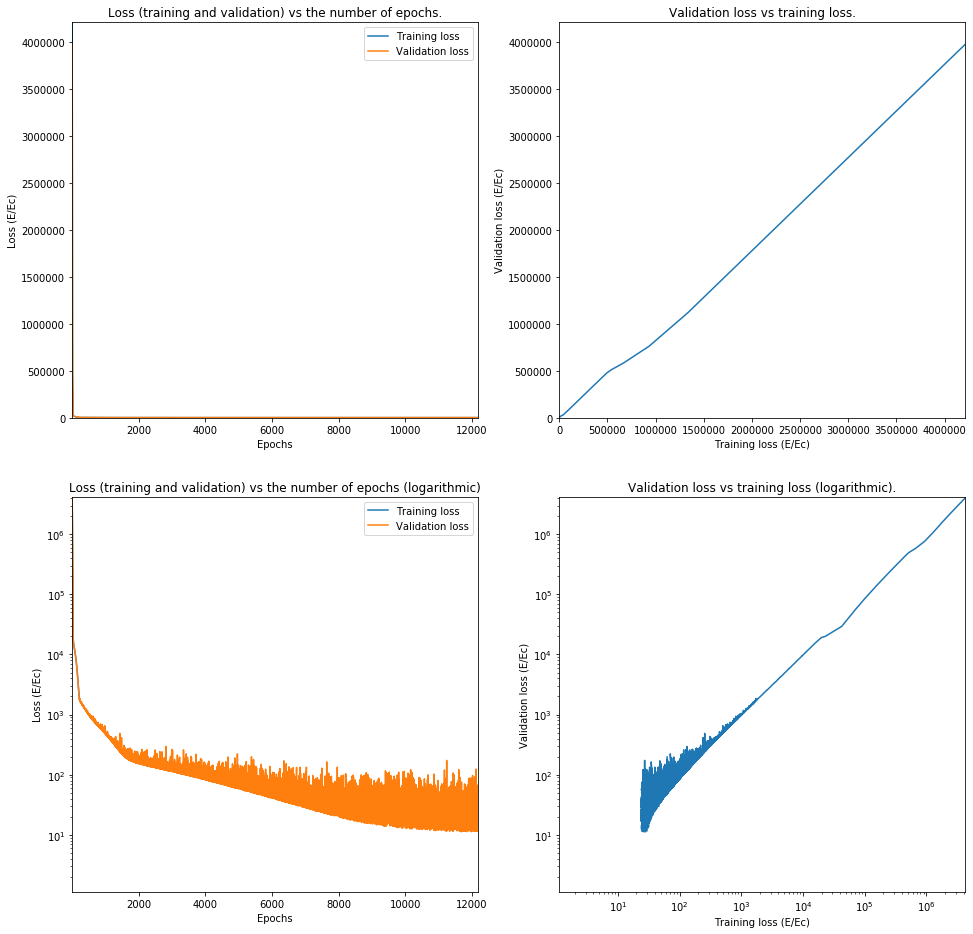

Train on 62644 samples, validate on 15662 samples
Epoch 1/20000
62644/62644 [==============================] - 2s 26us/step - loss: 2653344.5016 - val_loss: 2444027.8861
Epoch 2/20000
62644/62644 [==============================] - 2s 25us/step - loss: 2265224.7039 - val_loss: 2060246.6526
Epoch 3/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1882107.0189 - val_loss: 1682454.3010
Epoch 4/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1504571.5008 - val_loss: 1312340.0675
Epoch 5/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1147798.3272 - val_loss: 982442.4361
Epoch 6/20000
62644/62644 [==============================] - 2s 25us/step - loss: 852930.0734 - val_loss: 729081.0522
Epoch 7/20000
62644/62644 [==============================] - 2s 25us/step - loss: 647739.7213 - val_loss: 574565.1371
Epoch 8/20000
62644/62644 [==============================] - 2s 25us/step - loss: 534592.4902 - val_loss: 496006.89

Epoch 140/20000
62644/62644 [==============================] - 2s 26us/step - loss: 33765.7762 - val_loss: 33493.8345
Epoch 141/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33598.5184 - val_loss: 33345.2802
Epoch 142/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33434.9276 - val_loss: 33151.0899
Epoch 143/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33255.8195 - val_loss: 33121.8594
Epoch 144/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33103.0129 - val_loss: 32832.4383
Epoch 145/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32920.9605 - val_loss: 32875.0560
Epoch 146/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32766.4349 - val_loss: 32513.4474
Epoch 147/20000
62644/62644 [==============================] - 2s 26us/step - loss: 32587.9904 - val_loss: 32441.9934
Epoch 148/20000
62644/62644 [===========================

62644/62644 [==============================] - 2s 25us/step - loss: 12508.5708 - val_loss: 12287.4203
Epoch 279/20000
62644/62644 [==============================] - 2s 25us/step - loss: 12378.8096 - val_loss: 12151.0352
Epoch 280/20000
62644/62644 [==============================] - 2s 25us/step - loss: 12249.9178 - val_loss: 12019.1980
Epoch 281/20000
62644/62644 [==============================] - 2s 25us/step - loss: 12119.5563 - val_loss: 11886.2343
Epoch 282/20000
62644/62644 [==============================] - 2s 25us/step - loss: 11997.9489 - val_loss: 11800.6000
Epoch 283/20000
62644/62644 [==============================] - 2s 25us/step - loss: 11877.5682 - val_loss: 11649.8836
Epoch 284/20000
62644/62644 [==============================] - 2s 25us/step - loss: 11743.8139 - val_loss: 11548.3906
Epoch 285/20000
62644/62644 [==============================] - 2s 25us/step - loss: 11626.5261 - val_loss: 11412.2830
Epoch 286/20000
62644/62644 [==============================] - 2s 25us/s

Epoch 419/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1555.1527 - val_loss: 1562.8620
Epoch 420/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1546.9037 - val_loss: 1522.4311
Epoch 421/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1542.7818 - val_loss: 1535.4323
Epoch 422/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1530.4125 - val_loss: 1509.4307
Epoch 423/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1521.6256 - val_loss: 1501.2238
Epoch 424/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1517.6026 - val_loss: 1492.4007
Epoch 425/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1513.5142 - val_loss: 1490.6522
Epoch 426/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1504.5787 - val_loss: 1501.4459
Epoch 427/20000
62644/62644 [==============================] - 2s 25us/s

Epoch 560/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1048.3535 - val_loss: 1025.9596
Epoch 561/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1047.4668 - val_loss: 1059.5917
Epoch 562/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1041.6453 - val_loss: 1105.1225
Epoch 563/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1039.3259 - val_loss: 1023.7490
Epoch 564/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1041.3883 - val_loss: 1041.0795
Epoch 565/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1038.4654 - val_loss: 1063.3071
Epoch 566/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1031.1372 - val_loss: 1035.6882
Epoch 567/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1029.7160 - val_loss: 1021.5343
Epoch 568/20000
62644/62644 [==============================] - 2s 25us/s

62644/62644 [==============================] - 2s 25us/step - loss: 696.6041 - val_loss: 689.8665
Epoch 704/20000
62644/62644 [==============================] - 2s 25us/step - loss: 691.0285 - val_loss: 670.2438
Epoch 705/20000
62644/62644 [==============================] - 2s 25us/step - loss: 687.9637 - val_loss: 668.6571
Epoch 706/20000
62644/62644 [==============================] - 2s 25us/step - loss: 690.5326 - val_loss: 682.3928
Epoch 707/20000
62644/62644 [==============================] - 2s 25us/step - loss: 684.9252 - val_loss: 667.3436
Epoch 708/20000
62644/62644 [==============================] - 2s 25us/step - loss: 683.8975 - val_loss: 664.3712
Epoch 709/20000
62644/62644 [==============================] - 2s 25us/step - loss: 680.6669 - val_loss: 665.8682
Epoch 710/20000
62644/62644 [==============================] - 2s 25us/step - loss: 678.6516 - val_loss: 668.2520
Epoch 711/20000
62644/62644 [==============================] - 2s 25us/step - loss: 679.8283 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 569.7154 - val_loss: 550.4285
Epoch 776/20000
62644/62644 [==============================] - 2s 25us/step - loss: 563.9024 - val_loss: 547.0445
Epoch 777/20000
62644/62644 [==============================] - 2s 25us/step - loss: 567.2207 - val_loss: 643.6477
Epoch 778/20000
62644/62644 [==============================] - 2s 25us/step - loss: 560.7434 - val_loss: 567.4180
Epoch 779/20000
62644/62644 [==============================] - 2s 25us/step - loss: 562.3707 - val_loss: 554.0894
Epoch 780/20000
62644/62644 [==============================] - 2s 25us/step - loss: 559.9500 - val_loss: 599.1488
Epoch 781/20000
62644/62644 [==============================] - 2s 25us/step - loss: 558.5797 - val_loss: 556.4115
Epoch 782/20000
62644/62644 [==============================] - 2s 25us/step - loss: 559.5302 - val_loss: 540.4024
Epoch 783/20000
62644/62644 [==============================] - 2s 25us/step - loss: 555.8391 - val_loss:

62644/62644 [==============================] - 2s 27us/step - loss: 477.2354 - val_loss: 503.7182
Epoch 848/20000
62644/62644 [==============================] - 2s 27us/step - loss: 476.1654 - val_loss: 465.7755
Epoch 849/20000
62644/62644 [==============================] - 2s 27us/step - loss: 475.2061 - val_loss: 479.3358
Epoch 850/20000
62644/62644 [==============================] - 2s 27us/step - loss: 474.7776 - val_loss: 496.1992
Epoch 851/20000
62644/62644 [==============================] - 2s 26us/step - loss: 476.8735 - val_loss: 470.1685
Epoch 852/20000
62644/62644 [==============================] - 2s 26us/step - loss: 476.9054 - val_loss: 460.3185
Epoch 853/20000
62644/62644 [==============================] - 2s 27us/step - loss: 472.7159 - val_loss: 454.8911
Epoch 854/20000
62644/62644 [==============================] - 2s 25us/step - loss: 470.4034 - val_loss: 458.3881
Epoch 855/20000
62644/62644 [==============================] - 2s 25us/step - loss: 471.0149 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 410.3817 - val_loss: 397.2377
Epoch 920/20000
62644/62644 [==============================] - 2s 25us/step - loss: 409.6011 - val_loss: 395.7609
Epoch 921/20000
62644/62644 [==============================] - 2s 25us/step - loss: 410.7302 - val_loss: 395.6817
Epoch 922/20000
62644/62644 [==============================] - 2s 26us/step - loss: 409.0216 - val_loss: 415.7591
Epoch 923/20000
62644/62644 [==============================] - 2s 25us/step - loss: 408.2407 - val_loss: 425.5575
Epoch 924/20000
62644/62644 [==============================] - 2s 25us/step - loss: 411.3555 - val_loss: 399.7184
Epoch 925/20000
62644/62644 [==============================] - 2s 25us/step - loss: 408.0612 - val_loss: 410.8090
Epoch 926/20000
62644/62644 [==============================] - 2s 25us/step - loss: 405.8616 - val_loss: 403.5472
Epoch 927/20000
62644/62644 [==============================] - 2s 26us/step - loss: 405.4508 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 355.4848 - val_loss: 340.7744
Epoch 992/20000
62644/62644 [==============================] - 2s 25us/step - loss: 358.2206 - val_loss: 342.7416
Epoch 993/20000
62644/62644 [==============================] - 2s 25us/step - loss: 355.3892 - val_loss: 342.8949
Epoch 994/20000
62644/62644 [==============================] - 2s 25us/step - loss: 354.5842 - val_loss: 350.7823
Epoch 995/20000
62644/62644 [==============================] - 2s 27us/step - loss: 358.2239 - val_loss: 355.9817
Epoch 996/20000
62644/62644 [==============================] - 2s 26us/step - loss: 353.7022 - val_loss: 384.8465
Epoch 997/20000
62644/62644 [==============================] - 2s 25us/step - loss: 355.6552 - val_loss: 339.7837
Epoch 998/20000
62644/62644 [==============================] - 2s 25us/step - loss: 352.9319 - val_loss: 339.4609
Epoch 999/20000
62644/62644 [==============================] - 2s 25us/step - loss: 351.6962 - val_loss:

62644/62644 [==============================] - 2s 26us/step - loss: 261.7057 - val_loss: 252.4646
Epoch 1134/20000
62644/62644 [==============================] - 2s 26us/step - loss: 260.0420 - val_loss: 255.4808
Epoch 1135/20000
62644/62644 [==============================] - 2s 26us/step - loss: 261.7784 - val_loss: 244.5400
Epoch 1136/20000
62644/62644 [==============================] - 2s 25us/step - loss: 257.5967 - val_loss: 244.3918
Epoch 1137/20000
62644/62644 [==============================] - 2s 26us/step - loss: 258.4083 - val_loss: 258.6968
Epoch 1138/20000
62644/62644 [==============================] - 2s 26us/step - loss: 258.3159 - val_loss: 256.8460
Epoch 1139/20000
62644/62644 [==============================] - 2s 25us/step - loss: 253.8580 - val_loss: 242.4474
Epoch 1140/20000
62644/62644 [==============================] - 2s 26us/step - loss: 255.7185 - val_loss: 245.3238
Epoch 1141/20000
62644/62644 [==============================] - 2s 26us/step - loss: 257.1081 - v

62644/62644 [==============================] - 2s 26us/step - loss: 175.2724 - val_loss: 166.8092
Epoch 1276/20000
62644/62644 [==============================] - 2s 26us/step - loss: 175.5264 - val_loss: 159.0567
Epoch 1277/20000
62644/62644 [==============================] - 2s 25us/step - loss: 173.9460 - val_loss: 182.3174
Epoch 1278/20000
62644/62644 [==============================] - 2s 25us/step - loss: 172.5662 - val_loss: 162.3452
Epoch 1279/20000
62644/62644 [==============================] - 2s 26us/step - loss: 173.6347 - val_loss: 200.9277
Epoch 1280/20000
62644/62644 [==============================] - 2s 26us/step - loss: 174.0381 - val_loss: 158.1191
Epoch 1281/20000
62644/62644 [==============================] - 2s 26us/step - loss: 172.0402 - val_loss: 186.3220
Epoch 1282/20000
62644/62644 [==============================] - 2s 26us/step - loss: 171.9083 - val_loss: 183.5648
Epoch 1283/20000
62644/62644 [==============================] - 2s 25us/step - loss: 170.9750 - v

62644/62644 [==============================] - 2s 25us/step - loss: 104.2854 - val_loss: 97.5163
Epoch 1418/20000
62644/62644 [==============================] - 2s 25us/step - loss: 107.4203 - val_loss: 91.0406
Epoch 1419/20000
62644/62644 [==============================] - 2s 26us/step - loss: 105.3658 - val_loss: 145.7256
Epoch 1420/20000
62644/62644 [==============================] - 2s 25us/step - loss: 102.3482 - val_loss: 91.9994
Epoch 1421/20000
62644/62644 [==============================] - 2s 25us/step - loss: 102.7605 - val_loss: 89.1946
Epoch 1422/20000
62644/62644 [==============================] - 2s 26us/step - loss: 102.5889 - val_loss: 97.0013
Epoch 1423/20000
62644/62644 [==============================] - 2s 25us/step - loss: 101.1131 - val_loss: 93.4897
Epoch 1424/20000
62644/62644 [==============================] - 2s 26us/step - loss: 99.5519 - val_loss: 90.7221
Epoch 1425/20000
62644/62644 [==============================] - 2s 26us/step - loss: 101.1381 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 52.1136 - val_loss: 41.1225
Epoch 1562/20000
62644/62644 [==============================] - 2s 26us/step - loss: 49.7715 - val_loss: 45.2041
Epoch 1563/20000
62644/62644 [==============================] - 2s 26us/step - loss: 52.4384 - val_loss: 38.5845
Epoch 1564/20000
62644/62644 [==============================] - 2s 26us/step - loss: 51.0285 - val_loss: 39.4828
Epoch 1565/20000
62644/62644 [==============================] - 2s 26us/step - loss: 51.9107 - val_loss: 39.2344
Epoch 1566/20000
62644/62644 [==============================] - 2s 26us/step - loss: 52.6598 - val_loss: 36.8638
Epoch 1567/20000
62644/62644 [==============================] - 2s 26us/step - loss: 50.5248 - val_loss: 41.7120
Epoch 1568/20000
62644/62644 [==============================] - 2s 26us/step - loss: 50.6322 - val_loss: 37.9159
Epoch 1569/20000
62644/62644 [==============================] - 2s 26us/step - loss: 50.4764 - val_loss: 37.4802


62644/62644 [==============================] - 2s 25us/step - loss: 34.4458 - val_loss: 35.5279
Epoch 1706/20000
62644/62644 [==============================] - 2s 26us/step - loss: 31.2315 - val_loss: 21.5708
Epoch 1707/20000
62644/62644 [==============================] - 2s 25us/step - loss: 34.3567 - val_loss: 21.1333
Epoch 1708/20000
62644/62644 [==============================] - 2s 25us/step - loss: 34.3514 - val_loss: 58.8644
Epoch 1709/20000
62644/62644 [==============================] - 2s 26us/step - loss: 34.1456 - val_loss: 25.8427
Epoch 1710/20000
62644/62644 [==============================] - 2s 25us/step - loss: 34.4921 - val_loss: 50.7211
Epoch 1711/20000
62644/62644 [==============================] - 2s 26us/step - loss: 33.1290 - val_loss: 28.2576
Epoch 1712/20000
62644/62644 [==============================] - 2s 26us/step - loss: 31.4500 - val_loss: 30.9319
Epoch 1713/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.6608 - val_loss: 62.5373


62644/62644 [==============================] - 2s 26us/step - loss: 29.7769 - val_loss: 42.8376
Epoch 1850/20000
62644/62644 [==============================] - 2s 26us/step - loss: 30.1201 - val_loss: 17.1336
Epoch 1851/20000
62644/62644 [==============================] - 2s 26us/step - loss: 30.8817 - val_loss: 21.3463
Epoch 1852/20000
62644/62644 [==============================] - 2s 26us/step - loss: 30.8399 - val_loss: 61.2855
Epoch 1853/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.3688 - val_loss: 19.5840
Epoch 1854/20000
62644/62644 [==============================] - 2s 26us/step - loss: 30.8410 - val_loss: 24.8183
Epoch 1855/20000
62644/62644 [==============================] - 2s 25us/step - loss: 32.0155 - val_loss: 23.1605
Epoch 1856/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.5685 - val_loss: 31.6005
Epoch 1857/20000
62644/62644 [==============================] - 2s 26us/step - loss: 29.5957 - val_loss: 19.0366


62644/62644 [==============================] - 2s 26us/step - loss: 25.7942 - val_loss: 15.0387
Epoch 1994/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.9541 - val_loss: 49.6060
Epoch 1995/20000
62644/62644 [==============================] - 2s 26us/step - loss: 30.8022 - val_loss: 17.0449
Epoch 1996/20000
62644/62644 [==============================] - 2s 26us/step - loss: 27.9547 - val_loss: 22.8445
Epoch 1997/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.3887 - val_loss: 25.1225
Epoch 1998/20000
62644/62644 [==============================] - 2s 26us/step - loss: 27.4696 - val_loss: 32.9297
Epoch 1999/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.2095 - val_loss: 21.6030
Epoch 2000/20000
62644/62644 [==============================] - 2s 26us/step - loss: 27.4314 - val_loss: 32.4362
Epoch 2001/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.5430 - val_loss: 16.3783


62644/62644 [==============================] - 2s 25us/step - loss: 28.3154 - val_loss: 17.1636
Epoch 2138/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.9687 - val_loss: 20.0271
Epoch 2139/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3379 - val_loss: 14.5783
Epoch 2140/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.3009 - val_loss: 32.7077
Epoch 2141/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.6910 - val_loss: 34.7404
Epoch 2142/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.7767 - val_loss: 29.4827
Epoch 2143/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.0361 - val_loss: 30.5196
Epoch 2144/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1214 - val_loss: 17.4969
Epoch 2145/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9182 - val_loss: 32.1636


62644/62644 [==============================] - 2s 26us/step - loss: 28.9150 - val_loss: 20.4482
Epoch 2282/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.7494 - val_loss: 22.5342
Epoch 2283/20000
62644/62644 [==============================] - 2s 27us/step - loss: 27.6146 - val_loss: 14.6112
Epoch 2284/20000
62644/62644 [==============================] - 2s 26us/step - loss: 28.0998 - val_loss: 27.2039
Epoch 2285/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6404 - val_loss: 14.7670
Epoch 2286/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6331 - val_loss: 33.1735
Epoch 2287/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.2912 - val_loss: 24.3720
Epoch 2288/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.1899 - val_loss: 17.1960
Epoch 2289/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.9918 - val_loss: 12.8977


62644/62644 [==============================] - 2s 32us/step - loss: 26.9283 - val_loss: 71.7362
Epoch 2426/20000
62644/62644 [==============================] - 2s 31us/step - loss: 25.2777 - val_loss: 31.5884
Epoch 2427/20000
62644/62644 [==============================] - 2s 31us/step - loss: 27.2521 - val_loss: 19.7944
Epoch 2428/20000
62644/62644 [==============================] - 2s 29us/step - loss: 28.2383 - val_loss: 17.7725
Epoch 2429/20000
62644/62644 [==============================] - 2s 30us/step - loss: 25.6558 - val_loss: 18.3097
Epoch 2430/20000
62644/62644 [==============================] - 2s 33us/step - loss: 28.2864 - val_loss: 34.3215
Epoch 2431/20000
62644/62644 [==============================] - 2s 29us/step - loss: 28.8631 - val_loss: 52.8748
Epoch 2432/20000
62644/62644 [==============================] - 2s 29us/step - loss: 24.7245 - val_loss: 12.4893
Epoch 2433/20000
62644/62644 [==============================] - 2s 29us/step - loss: 28.5222 - val_loss: 18.5081


62644/62644 [==============================] - 2s 33us/step - loss: 27.0709 - val_loss: 23.3999
Epoch 2570/20000
62644/62644 [==============================] - 2s 35us/step - loss: 24.5900 - val_loss: 64.6406
Epoch 2571/20000
62644/62644 [==============================] - 2s 34us/step - loss: 27.8865 - val_loss: 29.3695
Epoch 2572/20000
62644/62644 [==============================] - 2s 34us/step - loss: 24.7355 - val_loss: 28.7814
Epoch 2573/20000
62644/62644 [==============================] - 2s 33us/step - loss: 26.9493 - val_loss: 13.2977
Epoch 2574/20000
62644/62644 [==============================] - 2s 34us/step - loss: 27.7771 - val_loss: 14.8063
Epoch 2575/20000
62644/62644 [==============================] - 2s 36us/step - loss: 25.8462 - val_loss: 21.7244
Epoch 2576/20000
62644/62644 [==============================] - 2s 32us/step - loss: 28.0719 - val_loss: 25.1114
Epoch 2577/20000
62644/62644 [==============================] - 2s 30us/step - loss: 26.7660 - val_loss: 57.3355


62644/62644 [==============================] - 3s 40us/step - loss: 29.9933 - val_loss: 26.9361
Epoch 2714/20000
62644/62644 [==============================] - 3s 40us/step - loss: 25.3748 - val_loss: 30.9398
Epoch 2715/20000
62644/62644 [==============================] - 2s 40us/step - loss: 27.5561 - val_loss: 13.0943
Epoch 2716/20000
62644/62644 [==============================] - 2s 40us/step - loss: 26.2805 - val_loss: 12.7462
Epoch 2717/20000
62644/62644 [==============================] - 3s 41us/step - loss: 28.0872 - val_loss: 89.9882
Epoch 2718/20000
62644/62644 [==============================] - 2s 40us/step - loss: 26.0055 - val_loss: 20.4048
Epoch 2719/20000
62644/62644 [==============================] - 2s 39us/step - loss: 26.1782 - val_loss: 14.9574
Epoch 2720/20000
62644/62644 [==============================] - 2s 39us/step - loss: 26.4344 - val_loss: 17.0038
Epoch 2721/20000
62644/62644 [==============================] - 2s 40us/step - loss: 27.3771 - val_loss: 13.9049


62644/62644 [==============================] - 2s 34us/step - loss: 25.3730 - val_loss: 43.0093
Epoch 2858/20000
62644/62644 [==============================] - 2s 35us/step - loss: 27.0665 - val_loss: 43.7193
Epoch 2859/20000
62644/62644 [==============================] - 2s 34us/step - loss: 25.6477 - val_loss: 31.8046
Epoch 2860/20000
62644/62644 [==============================] - 2s 34us/step - loss: 26.1311 - val_loss: 38.9585
Epoch 2861/20000
62644/62644 [==============================] - 2s 34us/step - loss: 25.7559 - val_loss: 13.9302
Epoch 2862/20000
62644/62644 [==============================] - 2s 34us/step - loss: 25.4393 - val_loss: 18.5552
Epoch 2863/20000
62644/62644 [==============================] - 2s 34us/step - loss: 25.2958 - val_loss: 15.6992
Epoch 2864/20000
62644/62644 [==============================] - 2s 34us/step - loss: 26.4489 - val_loss: 33.1073
Epoch 2865/20000
62644/62644 [==============================] - 2s 34us/step - loss: 27.1707 - val_loss: 28.5586


62644/62644 [==============================] - 2s 29us/step - loss: 25.5383 - val_loss: 19.8784
Epoch 3002/20000
62644/62644 [==============================] - 2s 29us/step - loss: 25.6879 - val_loss: 15.1429
Epoch 3003/20000
62644/62644 [==============================] - 2s 26us/step - loss: 23.4571 - val_loss: 26.1324
Epoch 3004/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.3499 - val_loss: 33.7890
Epoch 3005/20000
62644/62644 [==============================] - 2s 27us/step - loss: 26.3440 - val_loss: 17.3590
Epoch 3006/20000
62644/62644 [==============================] - 2s 28us/step - loss: 26.5382 - val_loss: 37.7279
Epoch 3007/20000
62644/62644 [==============================] - 2s 28us/step - loss: 27.3666 - val_loss: 22.1302
Epoch 3008/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.2381 - val_loss: 14.6706
Epoch 3009/20000
62644/62644 [==============================] - 2s 26us/step - loss: 26.4561 - val_loss: 28.8998


62644/62644 [==============================] - 2s 29us/step - loss: 25.3599 - val_loss: 18.8626
Epoch 3146/20000
62644/62644 [==============================] - 2s 29us/step - loss: 25.0682 - val_loss: 24.7905
Epoch 3147/20000
62644/62644 [==============================] - 2s 30us/step - loss: 25.7502 - val_loss: 11.6050
Epoch 3148/20000
62644/62644 [==============================] - 2s 28us/step - loss: 24.8312 - val_loss: 18.0748
Epoch 3149/20000
62644/62644 [==============================] - 2s 27us/step - loss: 26.5181 - val_loss: 18.9882
Epoch 3150/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.7035 - val_loss: 42.5584
Epoch 3151/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.4578 - val_loss: 27.2696
Epoch 3152/20000
62644/62644 [==============================] - 2s 26us/step - loss: 22.9978 - val_loss: 18.6947
Epoch 3153/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.1680 - val_loss: 10.3346


62644/62644 [==============================] - 2s 25us/step - loss: 26.4386 - val_loss: 41.2471
Epoch 3290/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.6916 - val_loss: 13.5022
Epoch 3291/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.7269 - val_loss: 10.5489
Epoch 3292/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.9040 - val_loss: 23.5832
Epoch 3293/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8201 - val_loss: 9.0494
Epoch 3294/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.6310 - val_loss: 26.7757
Epoch 3295/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.5076 - val_loss: 13.7285
Epoch 3296/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.1643 - val_loss: 13.2659
Epoch 3297/20000
62644/62644 [==============================] - 2s 25us/step - loss: 22.0480 - val_loss: 15.6048
E

62644/62644 [==============================] - 2s 29us/step - loss: 25.3020 - val_loss: 20.0681
Epoch 3434/20000
62644/62644 [==============================] - 2s 28us/step - loss: 23.8731 - val_loss: 20.9110
Epoch 3435/20000
62644/62644 [==============================] - 2s 27us/step - loss: 26.0912 - val_loss: 17.6493
Epoch 3436/20000
62644/62644 [==============================] - 2s 27us/step - loss: 23.4269 - val_loss: 15.2406
Epoch 3437/20000
62644/62644 [==============================] - 2s 27us/step - loss: 25.6018 - val_loss: 10.6118
Epoch 3438/20000
62644/62644 [==============================] - 2s 27us/step - loss: 24.1393 - val_loss: 46.8809
Epoch 3439/20000
62644/62644 [==============================] - 2s 31us/step - loss: 23.6002 - val_loss: 38.5596
Epoch 3440/20000
62644/62644 [==============================] - 2s 35us/step - loss: 25.4550 - val_loss: 15.5210
Epoch 3441/20000
62644/62644 [==============================] - 2s 35us/step - loss: 25.0514 - val_loss: 12.2571


62644/62644 [==============================] - 2s 25us/step - loss: 25.2205 - val_loss: 15.4989
Epoch 3578/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.5524 - val_loss: 42.5478
Epoch 3579/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.9265 - val_loss: 24.0478
Epoch 3580/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.3625 - val_loss: 35.4524
Epoch 3581/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.3509 - val_loss: 53.7665
Epoch 3582/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.9528 - val_loss: 12.3372
Epoch 3583/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.4040 - val_loss: 17.1789
Epoch 3584/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2613 - val_loss: 18.0890
Epoch 3585/20000
62644/62644 [==============================] - 2s 27us/step - loss: 26.2012 - val_loss: 32.6034


62644/62644 [==============================] - 2s 24us/step - loss: 23.9204 - val_loss: 22.2006
Epoch 3722/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.7201 - val_loss: 42.3304
Epoch 3723/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.3677 - val_loss: 17.2600
Epoch 3724/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.1356 - val_loss: 36.2478
Epoch 3725/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.0402 - val_loss: 30.5918
Epoch 3726/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.4944 - val_loss: 19.0074
Epoch 3727/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.8001 - val_loss: 19.4171
Epoch 3728/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.1104 - val_loss: 11.2269
Epoch 3729/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.2777 - val_loss: 31.3116


62644/62644 [==============================] - 2s 25us/step - loss: 24.5285 - val_loss: 28.2700
Epoch 3866/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.0482 - val_loss: 13.2743
Epoch 3867/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.5360 - val_loss: 8.7725
Epoch 3868/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.1229 - val_loss: 38.8057
Epoch 3869/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.0318 - val_loss: 10.2894
Epoch 3870/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.3809 - val_loss: 9.8332
Epoch 3871/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.5035 - val_loss: 67.2489
Epoch 3872/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.0967 - val_loss: 32.6211
Epoch 3873/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.7060 - val_loss: 25.4211
Ep

62644/62644 [==============================] - 2s 25us/step - loss: 26.8681 - val_loss: 56.2191
Epoch 4010/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.1349 - val_loss: 45.0205
Epoch 4011/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.3896 - val_loss: 35.2711
Epoch 4012/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.8315 - val_loss: 11.5886
Epoch 4013/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.4636 - val_loss: 54.6847
Epoch 4014/20000
62644/62644 [==============================] - 2s 25us/step - loss: 27.2090 - val_loss: 10.8894
Epoch 4015/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.3817 - val_loss: 46.8610
Epoch 4016/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.9672 - val_loss: 9.9193
Epoch 4017/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.4186 - val_loss: 53.5615
E

62644/62644 [==============================] - 2s 25us/step - loss: 27.7389 - val_loss: 17.6712
Epoch 4154/20000
62644/62644 [==============================] - 2s 27us/step - loss: 24.3489 - val_loss: 9.3453
Epoch 4155/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.9944 - val_loss: 38.9376
Epoch 4156/20000
62644/62644 [==============================] - 2s 28us/step - loss: 23.3543 - val_loss: 23.3988
Epoch 4157/20000
62644/62644 [==============================] - 2s 27us/step - loss: 23.4643 - val_loss: 18.1738
Epoch 4158/20000
62644/62644 [==============================] - 2s 31us/step - loss: 25.2474 - val_loss: 41.2498
Epoch 4159/20000
62644/62644 [==============================] - 2s 28us/step - loss: 23.2241 - val_loss: 16.5458
Epoch 4160/20000
62644/62644 [==============================] - 2s 27us/step - loss: 24.1775 - val_loss: 30.6670
Epoch 4161/20000
62644/62644 [==============================] - 2s 28us/step - loss: 26.9026 - val_loss: 57.7549
E

62644/62644 [==============================] - 2s 26us/step - loss: 24.7604 - val_loss: 24.1261
Epoch 4298/20000
62644/62644 [==============================] - 2s 28us/step - loss: 23.4389 - val_loss: 11.2368
Epoch 4299/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.8080 - val_loss: 61.9983
Epoch 4300/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2034 - val_loss: 52.2735
Epoch 4301/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.6225 - val_loss: 9.3959
Epoch 4302/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.5997 - val_loss: 10.9977
Epoch 4303/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.2116 - val_loss: 15.9001
Epoch 4304/20000
62644/62644 [==============================] - 2s 26us/step - loss: 24.2490 - val_loss: 38.3657
Epoch 4305/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.1806 - val_loss: 10.5415
E

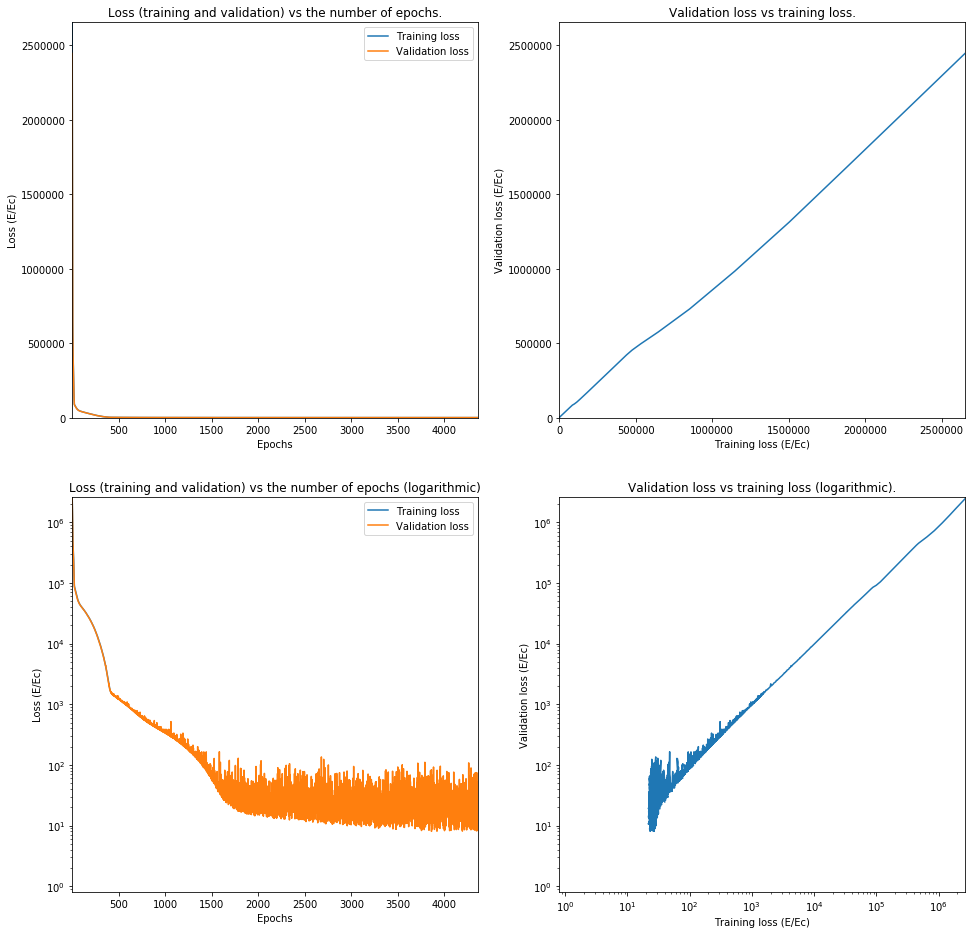

Train on 62644 samples, validate on 15662 samples
Epoch 1/20000
62644/62644 [==============================] - 2s 29us/step - loss: 913381.5901 - val_loss: 696085.4967
Epoch 2/20000
62644/62644 [==============================] - 2s 30us/step - loss: 543646.1613 - val_loss: 425090.6837
Epoch 3/20000
62644/62644 [==============================] - 2s 28us/step - loss: 386847.9852 - val_loss: 352344.9617
Epoch 4/20000
62644/62644 [==============================] - 2s 26us/step - loss: 340566.6836 - val_loss: 322596.4740
Epoch 5/20000
62644/62644 [==============================] - 2s 25us/step - loss: 313101.5870 - val_loss: 295856.1910
Epoch 6/20000
62644/62644 [==============================] - 2s 25us/step - loss: 286103.7729 - val_loss: 268920.3847
Epoch 7/20000
62644/62644 [==============================] - 2s 25us/step - loss: 259193.7894 - val_loss: 242439.4766
Epoch 8/20000
62644/62644 [==============================] - 2s 26us/step - loss: 233179.9291 - val_loss: 216994.1221
Epoch 

Epoch 140/20000
62644/62644 [==============================] - 2s 26us/step - loss: 17989.4558 - val_loss: 17788.1739
Epoch 141/20000
62644/62644 [==============================] - 2s 27us/step - loss: 17806.7210 - val_loss: 17602.8905
Epoch 142/20000
62644/62644 [==============================] - 2s 27us/step - loss: 17618.9995 - val_loss: 17436.2473
Epoch 143/20000
62644/62644 [==============================] - 2s 27us/step - loss: 17441.2509 - val_loss: 17237.3007
Epoch 144/20000
62644/62644 [==============================] - 2s 25us/step - loss: 17258.4228 - val_loss: 17083.0988
Epoch 145/20000
62644/62644 [==============================] - 2s 26us/step - loss: 17074.2091 - val_loss: 16886.9177
Epoch 146/20000
62644/62644 [==============================] - 2s 26us/step - loss: 16898.3036 - val_loss: 16707.8146
Epoch 147/20000
62644/62644 [==============================] - 2s 28us/step - loss: 16716.0424 - val_loss: 16526.8956
Epoch 148/20000
62644/62644 [===========================

Epoch 210/20000
62644/62644 [==============================] - 2s 26us/step - loss: 6067.3970 - val_loss: 5929.5162
Epoch 211/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5921.2380 - val_loss: 5823.1177
Epoch 212/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5781.1411 - val_loss: 5675.7700
Epoch 213/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5638.7847 - val_loss: 5549.3758
Epoch 214/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5506.1669 - val_loss: 5418.7778
Epoch 215/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5378.0615 - val_loss: 5248.6329
Epoch 216/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5242.5509 - val_loss: 5127.1688
Epoch 217/20000
62644/62644 [==============================] - 2s 26us/step - loss: 5118.7792 - val_loss: 4998.3543
Epoch 218/20000
62644/62644 [==============================] - 2s 26us/s

Epoch 351/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1736.5322 - val_loss: 1716.5939
Epoch 352/20000
62644/62644 [==============================] - 2s 25us/step - loss: 1732.5066 - val_loss: 1712.6926
Epoch 353/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1728.6192 - val_loss: 1703.1732
Epoch 354/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1726.3372 - val_loss: 1718.5137
Epoch 355/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1721.7915 - val_loss: 1700.9288
Epoch 356/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1718.9686 - val_loss: 1717.9554
Epoch 357/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1711.5496 - val_loss: 1686.4175
Epoch 358/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1713.1494 - val_loss: 1700.4684
Epoch 359/20000
62644/62644 [==============================] - 2s 24us/s

Epoch 492/20000
62644/62644 [==============================] - 1s 24us/step - loss: 1291.2028 - val_loss: 1275.4507
Epoch 493/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1284.1709 - val_loss: 1260.7814
Epoch 494/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1285.6768 - val_loss: 1316.3404
Epoch 495/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1280.9167 - val_loss: 1283.2375
Epoch 496/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1277.9998 - val_loss: 1251.4207
Epoch 497/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1272.9012 - val_loss: 1255.0567
Epoch 498/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1268.0435 - val_loss: 1296.7028
Epoch 499/20000
62644/62644 [==============================] - 2s 24us/step - loss: 1269.3769 - val_loss: 1259.8007
Epoch 500/20000
62644/62644 [==============================] - 2s 24us/s

62644/62644 [==============================] - 2s 24us/step - loss: 933.9919 - val_loss: 914.1563
Epoch 634/20000
62644/62644 [==============================] - 2s 24us/step - loss: 935.8595 - val_loss: 914.0069
Epoch 635/20000
62644/62644 [==============================] - 2s 24us/step - loss: 930.0551 - val_loss: 918.4340
Epoch 636/20000
62644/62644 [==============================] - 2s 24us/step - loss: 932.7255 - val_loss: 910.3786
Epoch 637/20000
62644/62644 [==============================] - 2s 25us/step - loss: 927.2766 - val_loss: 910.4792
Epoch 638/20000
62644/62644 [==============================] - 2s 24us/step - loss: 926.8985 - val_loss: 928.1786
Epoch 639/20000
62644/62644 [==============================] - 2s 24us/step - loss: 924.3552 - val_loss: 912.9519
Epoch 640/20000
62644/62644 [==============================] - 2s 24us/step - loss: 924.4452 - val_loss: 911.3867
Epoch 641/20000
62644/62644 [==============================] - 2s 24us/step - loss: 918.7665 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 809.3452 - val_loss: 790.4559
Epoch 706/20000
62644/62644 [==============================] - 2s 24us/step - loss: 800.3998 - val_loss: 784.1602
Epoch 707/20000
62644/62644 [==============================] - 2s 25us/step - loss: 804.5119 - val_loss: 794.7029
Epoch 708/20000
62644/62644 [==============================] - 2s 24us/step - loss: 799.5090 - val_loss: 825.4186
Epoch 709/20000
62644/62644 [==============================] - 2s 24us/step - loss: 801.3700 - val_loss: 861.9448
Epoch 710/20000
62644/62644 [==============================] - 2s 24us/step - loss: 801.1235 - val_loss: 835.3046
Epoch 711/20000
62644/62644 [==============================] - 2s 24us/step - loss: 799.3997 - val_loss: 820.3209
Epoch 712/20000
62644/62644 [==============================] - 2s 24us/step - loss: 795.2401 - val_loss: 776.5569
Epoch 713/20000
62644/62644 [==============================] - 2s 25us/step - loss: 792.1170 - val_loss:

62644/62644 [==============================] - 2s 24us/step - loss: 708.5198 - val_loss: 726.2749
Epoch 778/20000
62644/62644 [==============================] - 2s 24us/step - loss: 707.6667 - val_loss: 691.8253
Epoch 779/20000
62644/62644 [==============================] - 2s 24us/step - loss: 708.4697 - val_loss: 688.6066
Epoch 780/20000
62644/62644 [==============================] - 2s 24us/step - loss: 705.3370 - val_loss: 686.0296
Epoch 781/20000
62644/62644 [==============================] - 2s 24us/step - loss: 705.3483 - val_loss: 684.8416
Epoch 782/20000
62644/62644 [==============================] - 2s 24us/step - loss: 704.0167 - val_loss: 691.6006
Epoch 783/20000
62644/62644 [==============================] - 2s 24us/step - loss: 703.5879 - val_loss: 687.0845
Epoch 784/20000
62644/62644 [==============================] - 2s 24us/step - loss: 701.6443 - val_loss: 688.0847
Epoch 785/20000
62644/62644 [==============================] - 1s 24us/step - loss: 702.7678 - val_loss:

62644/62644 [==============================] - 2s 25us/step - loss: 639.7834 - val_loss: 633.1520
Epoch 850/20000
62644/62644 [==============================] - 2s 25us/step - loss: 635.9317 - val_loss: 664.5511
Epoch 851/20000
62644/62644 [==============================] - 2s 24us/step - loss: 637.1759 - val_loss: 665.5141
Epoch 852/20000
62644/62644 [==============================] - 2s 24us/step - loss: 637.7018 - val_loss: 620.2739
Epoch 853/20000
62644/62644 [==============================] - 2s 24us/step - loss: 634.0375 - val_loss: 642.6042
Epoch 854/20000
62644/62644 [==============================] - 1s 24us/step - loss: 636.2615 - val_loss: 641.8864
Epoch 855/20000
62644/62644 [==============================] - 2s 24us/step - loss: 631.4084 - val_loss: 634.4948
Epoch 856/20000
62644/62644 [==============================] - 2s 24us/step - loss: 630.9015 - val_loss: 621.2167
Epoch 857/20000
62644/62644 [==============================] - 2s 24us/step - loss: 633.3912 - val_loss:

62644/62644 [==============================] - 2s 24us/step - loss: 579.2417 - val_loss: 566.6723
Epoch 922/20000
62644/62644 [==============================] - 2s 25us/step - loss: 578.6656 - val_loss: 630.6053
Epoch 923/20000
62644/62644 [==============================] - 2s 24us/step - loss: 579.0763 - val_loss: 569.0635
Epoch 924/20000
62644/62644 [==============================] - 2s 24us/step - loss: 579.2801 - val_loss: 648.6941
Epoch 925/20000
62644/62644 [==============================] - 2s 24us/step - loss: 579.0708 - val_loss: 564.1640
Epoch 926/20000
62644/62644 [==============================] - 2s 25us/step - loss: 577.1533 - val_loss: 567.8732
Epoch 927/20000
62644/62644 [==============================] - 2s 26us/step - loss: 579.1584 - val_loss: 623.5180
Epoch 928/20000
62644/62644 [==============================] - 2s 24us/step - loss: 576.1110 - val_loss: 557.8729
Epoch 929/20000
62644/62644 [==============================] - 2s 24us/step - loss: 577.1170 - val_loss:

62644/62644 [==============================] - 2s 24us/step - loss: 532.3663 - val_loss: 519.3364
Epoch 994/20000
62644/62644 [==============================] - 2s 24us/step - loss: 530.9678 - val_loss: 520.2114
Epoch 995/20000
62644/62644 [==============================] - 2s 24us/step - loss: 530.4045 - val_loss: 514.4704
Epoch 996/20000
62644/62644 [==============================] - 2s 24us/step - loss: 527.9054 - val_loss: 571.9790
Epoch 997/20000
62644/62644 [==============================] - 2s 24us/step - loss: 530.2716 - val_loss: 590.4608
Epoch 998/20000
62644/62644 [==============================] - 2s 24us/step - loss: 529.9246 - val_loss: 515.8204
Epoch 999/20000
62644/62644 [==============================] - 2s 24us/step - loss: 527.6734 - val_loss: 520.5768
Epoch 1000/20000
62644/62644 [==============================] - 2s 24us/step - loss: 526.1428 - val_loss: 523.2343
Epoch 1001/20000
62644/62644 [==============================] - 2s 24us/step - loss: 528.9197 - val_los

62644/62644 [==============================] - 2s 24us/step - loss: 447.3554 - val_loss: 439.3597
Epoch 1136/20000
62644/62644 [==============================] - 2s 24us/step - loss: 444.9232 - val_loss: 440.6168
Epoch 1137/20000
62644/62644 [==============================] - 2s 24us/step - loss: 444.1891 - val_loss: 442.1688
Epoch 1138/20000
62644/62644 [==============================] - 2s 24us/step - loss: 444.4612 - val_loss: 429.6426
Epoch 1139/20000
62644/62644 [==============================] - 2s 24us/step - loss: 445.1717 - val_loss: 432.7969
Epoch 1140/20000
62644/62644 [==============================] - 2s 24us/step - loss: 445.2545 - val_loss: 429.5065
Epoch 1141/20000
62644/62644 [==============================] - 1s 24us/step - loss: 442.2949 - val_loss: 426.4937
Epoch 1142/20000
62644/62644 [==============================] - 1s 24us/step - loss: 442.5688 - val_loss: 426.2321
Epoch 1143/20000
62644/62644 [==============================] - 1s 24us/step - loss: 442.5490 - v

62644/62644 [==============================] - 2s 24us/step - loss: 369.3468 - val_loss: 368.6821
Epoch 1278/20000
62644/62644 [==============================] - 2s 24us/step - loss: 372.0356 - val_loss: 357.9025
Epoch 1279/20000
62644/62644 [==============================] - 2s 24us/step - loss: 369.4061 - val_loss: 373.1046
Epoch 1280/20000
62644/62644 [==============================] - 2s 24us/step - loss: 369.6702 - val_loss: 358.4651
Epoch 1281/20000
62644/62644 [==============================] - 2s 24us/step - loss: 367.1000 - val_loss: 351.6891
Epoch 1282/20000
62644/62644 [==============================] - 2s 24us/step - loss: 365.4929 - val_loss: 398.5104
Epoch 1283/20000
62644/62644 [==============================] - 2s 25us/step - loss: 367.3060 - val_loss: 384.0421
Epoch 1284/20000
62644/62644 [==============================] - 2s 25us/step - loss: 366.3489 - val_loss: 360.3314
Epoch 1285/20000
62644/62644 [==============================] - 2s 24us/step - loss: 368.0552 - v

62644/62644 [==============================] - 2s 24us/step - loss: 302.4744 - val_loss: 289.8348
Epoch 1420/20000
62644/62644 [==============================] - 2s 25us/step - loss: 303.8009 - val_loss: 316.5960
Epoch 1421/20000
62644/62644 [==============================] - 2s 24us/step - loss: 302.2661 - val_loss: 295.3117
Epoch 1422/20000
62644/62644 [==============================] - 2s 24us/step - loss: 303.6828 - val_loss: 286.0981
Epoch 1423/20000
62644/62644 [==============================] - 2s 24us/step - loss: 301.6525 - val_loss: 290.3013
Epoch 1424/20000
62644/62644 [==============================] - 2s 25us/step - loss: 300.9802 - val_loss: 298.1134
Epoch 1425/20000
62644/62644 [==============================] - 2s 25us/step - loss: 297.7955 - val_loss: 284.3013
Epoch 1426/20000
62644/62644 [==============================] - 2s 24us/step - loss: 303.3655 - val_loss: 283.8863
Epoch 1427/20000
62644/62644 [==============================] - 2s 25us/step - loss: 300.3511 - v

62644/62644 [==============================] - 2s 24us/step - loss: 249.6890 - val_loss: 245.1538
Epoch 1562/20000
62644/62644 [==============================] - 2s 24us/step - loss: 252.5974 - val_loss: 232.6363
Epoch 1563/20000
62644/62644 [==============================] - 2s 24us/step - loss: 245.5609 - val_loss: 245.4951
Epoch 1564/20000
62644/62644 [==============================] - 2s 24us/step - loss: 247.3107 - val_loss: 253.3425
Epoch 1565/20000
62644/62644 [==============================] - 2s 24us/step - loss: 247.0892 - val_loss: 253.7482
Epoch 1566/20000
62644/62644 [==============================] - 2s 24us/step - loss: 249.2355 - val_loss: 367.1822
Epoch 1567/20000
62644/62644 [==============================] - 2s 24us/step - loss: 249.4696 - val_loss: 247.2252
Epoch 1568/20000
62644/62644 [==============================] - 2s 24us/step - loss: 246.0284 - val_loss: 233.0203
Epoch 1569/20000
62644/62644 [==============================] - 2s 24us/step - loss: 246.7507 - v

62644/62644 [==============================] - 2s 24us/step - loss: 207.8833 - val_loss: 200.4707
Epoch 1704/20000
62644/62644 [==============================] - 2s 24us/step - loss: 210.4115 - val_loss: 216.6551
Epoch 1705/20000
62644/62644 [==============================] - 2s 24us/step - loss: 205.5057 - val_loss: 198.6981
Epoch 1706/20000
62644/62644 [==============================] - 2s 24us/step - loss: 206.2962 - val_loss: 201.8347
Epoch 1707/20000
62644/62644 [==============================] - 2s 24us/step - loss: 206.0665 - val_loss: 190.0313
Epoch 1708/20000
62644/62644 [==============================] - 2s 24us/step - loss: 205.5549 - val_loss: 193.1032
Epoch 1709/20000
62644/62644 [==============================] - 2s 24us/step - loss: 206.6024 - val_loss: 226.1239
Epoch 1710/20000
62644/62644 [==============================] - 2s 24us/step - loss: 208.1266 - val_loss: 201.1735
Epoch 1711/20000
62644/62644 [==============================] - 2s 24us/step - loss: 203.7383 - v

62644/62644 [==============================] - 2s 24us/step - loss: 176.9207 - val_loss: 181.2347
Epoch 1846/20000
62644/62644 [==============================] - 2s 24us/step - loss: 174.1265 - val_loss: 204.7144
Epoch 1847/20000
62644/62644 [==============================] - 2s 25us/step - loss: 175.8507 - val_loss: 177.3957
Epoch 1848/20000
62644/62644 [==============================] - 2s 24us/step - loss: 173.4851 - val_loss: 160.4130
Epoch 1849/20000
62644/62644 [==============================] - 2s 24us/step - loss: 174.6015 - val_loss: 170.0250
Epoch 1850/20000
62644/62644 [==============================] - 2s 24us/step - loss: 175.3988 - val_loss: 165.3828
Epoch 1851/20000
62644/62644 [==============================] - 2s 25us/step - loss: 174.9901 - val_loss: 181.1984
Epoch 1852/20000
62644/62644 [==============================] - 2s 25us/step - loss: 174.1535 - val_loss: 162.6694
Epoch 1853/20000
62644/62644 [==============================] - 2s 26us/step - loss: 175.2854 - v

62644/62644 [==============================] - 2s 24us/step - loss: 152.1732 - val_loss: 144.6929
Epoch 1988/20000
62644/62644 [==============================] - 2s 24us/step - loss: 152.0408 - val_loss: 143.7357
Epoch 1989/20000
62644/62644 [==============================] - 2s 24us/step - loss: 148.1115 - val_loss: 139.3684
Epoch 1990/20000
62644/62644 [==============================] - 1s 24us/step - loss: 153.6550 - val_loss: 144.2742
Epoch 1991/20000
62644/62644 [==============================] - 2s 24us/step - loss: 151.2648 - val_loss: 162.7622
Epoch 1992/20000
62644/62644 [==============================] - 2s 24us/step - loss: 149.3024 - val_loss: 146.0799
Epoch 1993/20000
62644/62644 [==============================] - 2s 24us/step - loss: 150.9224 - val_loss: 135.7623
Epoch 1994/20000
62644/62644 [==============================] - 2s 24us/step - loss: 152.2484 - val_loss: 134.7199
Epoch 1995/20000
62644/62644 [==============================] - 2s 24us/step - loss: 148.5176 - v

62644/62644 [==============================] - 2s 24us/step - loss: 131.1023 - val_loss: 127.6263
Epoch 2130/20000
62644/62644 [==============================] - 2s 24us/step - loss: 131.3175 - val_loss: 137.6426
Epoch 2131/20000
62644/62644 [==============================] - 2s 24us/step - loss: 132.9514 - val_loss: 130.8669
Epoch 2132/20000
62644/62644 [==============================] - 1s 24us/step - loss: 131.3383 - val_loss: 125.4540
Epoch 2133/20000
62644/62644 [==============================] - 2s 24us/step - loss: 132.2948 - val_loss: 220.4309
Epoch 2134/20000
62644/62644 [==============================] - 2s 24us/step - loss: 132.3853 - val_loss: 120.2622
Epoch 2135/20000
62644/62644 [==============================] - 2s 24us/step - loss: 130.5733 - val_loss: 140.1677
Epoch 2136/20000
62644/62644 [==============================] - 2s 24us/step - loss: 130.3520 - val_loss: 126.4836
Epoch 2137/20000
62644/62644 [==============================] - 2s 24us/step - loss: 130.5838 - v

62644/62644 [==============================] - 2s 25us/step - loss: 115.3708 - val_loss: 109.8238
Epoch 2272/20000
62644/62644 [==============================] - 2s 24us/step - loss: 119.1917 - val_loss: 102.9574
Epoch 2273/20000
62644/62644 [==============================] - 2s 24us/step - loss: 115.2513 - val_loss: 114.1468
Epoch 2274/20000
62644/62644 [==============================] - 2s 24us/step - loss: 117.9065 - val_loss: 106.0204
Epoch 2275/20000
62644/62644 [==============================] - 2s 24us/step - loss: 116.9191 - val_loss: 106.1222
Epoch 2276/20000
62644/62644 [==============================] - 2s 24us/step - loss: 116.1607 - val_loss: 102.5532
Epoch 2277/20000
62644/62644 [==============================] - 2s 24us/step - loss: 116.8757 - val_loss: 106.1199
Epoch 2278/20000
62644/62644 [==============================] - 2s 24us/step - loss: 118.9380 - val_loss: 104.1160
Epoch 2279/20000
62644/62644 [==============================] - 2s 24us/step - loss: 115.6620 - v

62644/62644 [==============================] - 2s 24us/step - loss: 107.2514 - val_loss: 101.9208
Epoch 2414/20000
62644/62644 [==============================] - 2s 24us/step - loss: 106.3353 - val_loss: 124.0332
Epoch 2415/20000
62644/62644 [==============================] - 2s 24us/step - loss: 106.2512 - val_loss: 94.8522
Epoch 2416/20000
62644/62644 [==============================] - 2s 24us/step - loss: 106.1078 - val_loss: 92.8835
Epoch 2417/20000
62644/62644 [==============================] - 2s 25us/step - loss: 106.0979 - val_loss: 92.4615
Epoch 2418/20000
62644/62644 [==============================] - 2s 24us/step - loss: 105.9823 - val_loss: 101.9984
Epoch 2419/20000
62644/62644 [==============================] - 2s 24us/step - loss: 104.8057 - val_loss: 93.1520
Epoch 2420/20000
62644/62644 [==============================] - 2s 24us/step - loss: 108.9071 - val_loss: 97.2239
Epoch 2421/20000
62644/62644 [==============================] - 2s 24us/step - loss: 105.0680 - val_lo

62644/62644 [==============================] - 2s 24us/step - loss: 97.7980 - val_loss: 92.4818
Epoch 2557/20000
62644/62644 [==============================] - 2s 24us/step - loss: 100.7037 - val_loss: 87.1078
Epoch 2558/20000
62644/62644 [==============================] - 2s 24us/step - loss: 98.8341 - val_loss: 93.4640
Epoch 2559/20000
62644/62644 [==============================] - 2s 24us/step - loss: 98.2185 - val_loss: 97.6462
Epoch 2560/20000
62644/62644 [==============================] - 2s 24us/step - loss: 100.8400 - val_loss: 89.4705
Epoch 2561/20000
62644/62644 [==============================] - 2s 24us/step - loss: 95.7749 - val_loss: 84.8222
Epoch 2562/20000
62644/62644 [==============================] - 2s 24us/step - loss: 97.9392 - val_loss: 116.0862
Epoch 2563/20000
62644/62644 [==============================] - 2s 25us/step - loss: 97.1003 - val_loss: 84.6422
Epoch 2564/20000
62644/62644 [==============================] - 2s 24us/step - loss: 99.7727 - val_loss: 87.69

62644/62644 [==============================] - 2s 24us/step - loss: 91.0896 - val_loss: 112.3847
Epoch 2701/20000
62644/62644 [==============================] - 2s 24us/step - loss: 93.0877 - val_loss: 173.2697
Epoch 2702/20000
62644/62644 [==============================] - 2s 24us/step - loss: 94.4062 - val_loss: 98.7315
Epoch 2703/20000
62644/62644 [==============================] - 2s 24us/step - loss: 93.4403 - val_loss: 92.1105
Epoch 2704/20000
62644/62644 [==============================] - 1s 24us/step - loss: 90.3350 - val_loss: 89.1934
Epoch 2705/20000
62644/62644 [==============================] - 2s 24us/step - loss: 94.1338 - val_loss: 81.7521
Epoch 2706/20000
62644/62644 [==============================] - 2s 24us/step - loss: 92.2973 - val_loss: 103.2393
Epoch 2707/20000
62644/62644 [==============================] - 2s 24us/step - loss: 94.3607 - val_loss: 104.6412
Epoch 2708/20000
62644/62644 [==============================] - 2s 24us/step - loss: 91.8967 - val_loss: 79.4

62644/62644 [==============================] - 2s 24us/step - loss: 87.1816 - val_loss: 75.5252
Epoch 2845/20000
62644/62644 [==============================] - 2s 25us/step - loss: 88.2717 - val_loss: 78.0380
Epoch 2846/20000
62644/62644 [==============================] - 2s 24us/step - loss: 88.3678 - val_loss: 77.3036
Epoch 2847/20000
62644/62644 [==============================] - 2s 24us/step - loss: 86.0840 - val_loss: 74.7781
Epoch 2848/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.4911 - val_loss: 89.2686
Epoch 2849/20000
62644/62644 [==============================] - 2s 24us/step - loss: 86.5652 - val_loss: 73.9439
Epoch 2850/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.2088 - val_loss: 80.6305
Epoch 2851/20000
62644/62644 [==============================] - 2s 24us/step - loss: 87.0679 - val_loss: 76.9615
Epoch 2852/20000
62644/62644 [==============================] - 2s 24us/step - loss: 86.8283 - val_loss: 77.7477


62644/62644 [==============================] - 2s 24us/step - loss: 84.4075 - val_loss: 84.4741
Epoch 2989/20000
62644/62644 [==============================] - 2s 24us/step - loss: 83.9673 - val_loss: 76.9723
Epoch 2990/20000
62644/62644 [==============================] - 2s 24us/step - loss: 83.4671 - val_loss: 72.9654
Epoch 2991/20000
62644/62644 [==============================] - 2s 24us/step - loss: 83.6529 - val_loss: 100.6992
Epoch 2992/20000
62644/62644 [==============================] - 2s 24us/step - loss: 83.2070 - val_loss: 91.1413
Epoch 2993/20000
62644/62644 [==============================] - 2s 24us/step - loss: 81.6649 - val_loss: 85.0022
Epoch 2994/20000
62644/62644 [==============================] - 2s 24us/step - loss: 84.9643 - val_loss: 80.9594
Epoch 2995/20000
62644/62644 [==============================] - 2s 24us/step - loss: 83.5853 - val_loss: 71.1501
Epoch 2996/20000
62644/62644 [==============================] - 2s 24us/step - loss: 83.1451 - val_loss: 84.6325

62644/62644 [==============================] - 2s 24us/step - loss: 79.0152 - val_loss: 82.2752
Epoch 3133/20000
62644/62644 [==============================] - 2s 24us/step - loss: 78.8762 - val_loss: 70.1714
Epoch 3134/20000
62644/62644 [==============================] - 2s 25us/step - loss: 78.3285 - val_loss: 68.8864
Epoch 3135/20000
62644/62644 [==============================] - 2s 24us/step - loss: 80.6844 - val_loss: 85.8673
Epoch 3136/20000
62644/62644 [==============================] - 2s 24us/step - loss: 80.0615 - val_loss: 80.4157
Epoch 3137/20000
62644/62644 [==============================] - 2s 24us/step - loss: 79.0145 - val_loss: 75.0228
Epoch 3138/20000
62644/62644 [==============================] - 2s 24us/step - loss: 78.2568 - val_loss: 67.2794
Epoch 3139/20000
62644/62644 [==============================] - 2s 24us/step - loss: 79.2378 - val_loss: 65.3284
Epoch 3140/20000
62644/62644 [==============================] - 2s 24us/step - loss: 79.5043 - val_loss: 105.4027

62644/62644 [==============================] - 2s 24us/step - loss: 75.8254 - val_loss: 70.9750
Epoch 3277/20000
62644/62644 [==============================] - 2s 25us/step - loss: 76.4444 - val_loss: 115.2373
Epoch 3278/20000
62644/62644 [==============================] - 1s 24us/step - loss: 77.8403 - val_loss: 67.6630
Epoch 3279/20000
62644/62644 [==============================] - 2s 24us/step - loss: 75.8993 - val_loss: 78.3251
Epoch 3280/20000
62644/62644 [==============================] - 2s 24us/step - loss: 75.7602 - val_loss: 63.2360
Epoch 3281/20000
62644/62644 [==============================] - 1s 24us/step - loss: 75.3127 - val_loss: 75.6277
Epoch 3282/20000
62644/62644 [==============================] - 2s 24us/step - loss: 75.1636 - val_loss: 64.0325
Epoch 3283/20000
62644/62644 [==============================] - 2s 24us/step - loss: 75.6798 - val_loss: 63.0533
Epoch 3284/20000
62644/62644 [==============================] - 2s 24us/step - loss: 76.8817 - val_loss: 66.9868

62644/62644 [==============================] - 2s 24us/step - loss: 74.4524 - val_loss: 76.8580
Epoch 3421/20000
62644/62644 [==============================] - 2s 24us/step - loss: 72.6410 - val_loss: 60.9407
Epoch 3422/20000
62644/62644 [==============================] - 2s 24us/step - loss: 75.6948 - val_loss: 168.3027
Epoch 3423/20000
62644/62644 [==============================] - 2s 24us/step - loss: 74.1532 - val_loss: 95.0721
Epoch 3424/20000
62644/62644 [==============================] - 2s 24us/step - loss: 71.6247 - val_loss: 61.5800
Epoch 3425/20000
62644/62644 [==============================] - 2s 24us/step - loss: 73.8930 - val_loss: 67.8752
Epoch 3426/20000
62644/62644 [==============================] - 2s 24us/step - loss: 72.5193 - val_loss: 61.0829
Epoch 3427/20000
62644/62644 [==============================] - 2s 24us/step - loss: 71.9410 - val_loss: 58.4397
Epoch 3428/20000
62644/62644 [==============================] - 2s 24us/step - loss: 72.8492 - val_loss: 68.1283

62644/62644 [==============================] - 2s 24us/step - loss: 68.2218 - val_loss: 85.4601
Epoch 3565/20000
62644/62644 [==============================] - 2s 24us/step - loss: 68.1283 - val_loss: 77.4842
Epoch 3566/20000
62644/62644 [==============================] - 2s 24us/step - loss: 72.0099 - val_loss: 69.8346
Epoch 3567/20000
62644/62644 [==============================] - 2s 24us/step - loss: 71.0510 - val_loss: 57.7317
Epoch 3568/20000
62644/62644 [==============================] - 2s 24us/step - loss: 67.4821 - val_loss: 64.4946
Epoch 3569/20000
62644/62644 [==============================] - 2s 24us/step - loss: 68.6988 - val_loss: 62.3245
Epoch 3570/20000
62644/62644 [==============================] - 2s 24us/step - loss: 67.5880 - val_loss: 61.2614
Epoch 3571/20000
62644/62644 [==============================] - 2s 25us/step - loss: 68.8585 - val_loss: 58.5200
Epoch 3572/20000
62644/62644 [==============================] - 2s 24us/step - loss: 69.4296 - val_loss: 70.5577


62644/62644 [==============================] - 2s 24us/step - loss: 67.0205 - val_loss: 58.9352
Epoch 3709/20000
62644/62644 [==============================] - 2s 24us/step - loss: 65.6106 - val_loss: 95.2270
Epoch 3710/20000
62644/62644 [==============================] - 2s 24us/step - loss: 66.9714 - val_loss: 57.5705
Epoch 3711/20000
62644/62644 [==============================] - 2s 24us/step - loss: 64.8317 - val_loss: 53.1028
Epoch 3712/20000
62644/62644 [==============================] - 2s 24us/step - loss: 65.7668 - val_loss: 58.9379
Epoch 3713/20000
62644/62644 [==============================] - 2s 24us/step - loss: 66.8003 - val_loss: 53.1358
Epoch 3714/20000
62644/62644 [==============================] - 2s 24us/step - loss: 63.3666 - val_loss: 77.1211
Epoch 3715/20000
62644/62644 [==============================] - 2s 24us/step - loss: 66.2168 - val_loss: 54.8490
Epoch 3716/20000
62644/62644 [==============================] - 2s 24us/step - loss: 65.5579 - val_loss: 52.2945


62644/62644 [==============================] - 2s 24us/step - loss: 61.6241 - val_loss: 50.0988
Epoch 3853/20000
62644/62644 [==============================] - 2s 24us/step - loss: 61.6487 - val_loss: 50.3468
Epoch 3854/20000
62644/62644 [==============================] - 2s 24us/step - loss: 64.2800 - val_loss: 53.2485
Epoch 3855/20000
62644/62644 [==============================] - 2s 24us/step - loss: 62.1392 - val_loss: 62.7820
Epoch 3856/20000
62644/62644 [==============================] - 2s 24us/step - loss: 64.6487 - val_loss: 50.8580
Epoch 3857/20000
62644/62644 [==============================] - 2s 24us/step - loss: 60.9826 - val_loss: 61.6974
Epoch 3858/20000
62644/62644 [==============================] - 2s 24us/step - loss: 63.1507 - val_loss: 69.3794
Epoch 3859/20000
62644/62644 [==============================] - 2s 24us/step - loss: 63.9773 - val_loss: 57.1161
Epoch 3860/20000
62644/62644 [==============================] - 2s 24us/step - loss: 64.4482 - val_loss: 79.5272


62644/62644 [==============================] - 2s 24us/step - loss: 58.6358 - val_loss: 60.4541
Epoch 3997/20000
62644/62644 [==============================] - 2s 24us/step - loss: 61.9523 - val_loss: 58.4899
Epoch 3998/20000
62644/62644 [==============================] - 2s 24us/step - loss: 59.6033 - val_loss: 75.4241
Epoch 3999/20000
62644/62644 [==============================] - 2s 24us/step - loss: 58.6902 - val_loss: 49.5084
Epoch 4000/20000
62644/62644 [==============================] - 2s 24us/step - loss: 62.0115 - val_loss: 66.0217
Epoch 4001/20000
62644/62644 [==============================] - 2s 24us/step - loss: 59.1419 - val_loss: 47.4788
Epoch 4002/20000
62644/62644 [==============================] - 2s 24us/step - loss: 60.1835 - val_loss: 49.1189
Epoch 4003/20000
62644/62644 [==============================] - 2s 24us/step - loss: 60.0675 - val_loss: 51.5137
Epoch 4004/20000
62644/62644 [==============================] - 2s 24us/step - loss: 58.8415 - val_loss: 60.7615


62644/62644 [==============================] - 2s 24us/step - loss: 57.9074 - val_loss: 61.8729
Epoch 4141/20000
62644/62644 [==============================] - 2s 24us/step - loss: 57.1694 - val_loss: 53.8564
Epoch 4142/20000
62644/62644 [==============================] - 1s 24us/step - loss: 56.1580 - val_loss: 85.4971
Epoch 4143/20000
62644/62644 [==============================] - 2s 24us/step - loss: 58.5610 - val_loss: 47.7753
Epoch 4144/20000
62644/62644 [==============================] - 2s 24us/step - loss: 58.0657 - val_loss: 60.4203
Epoch 4145/20000
62644/62644 [==============================] - 2s 24us/step - loss: 56.3700 - val_loss: 77.7240
Epoch 4146/20000
62644/62644 [==============================] - 2s 24us/step - loss: 56.5299 - val_loss: 47.4669
Epoch 4147/20000
62644/62644 [==============================] - 2s 24us/step - loss: 57.2570 - val_loss: 49.8865
Epoch 4148/20000
62644/62644 [==============================] - 2s 24us/step - loss: 56.7470 - val_loss: 101.4343

62644/62644 [==============================] - 2s 25us/step - loss: 55.5737 - val_loss: 81.2384
Epoch 4285/20000
62644/62644 [==============================] - 2s 26us/step - loss: 53.7421 - val_loss: 77.4319
Epoch 4286/20000
62644/62644 [==============================] - 2s 25us/step - loss: 55.4248 - val_loss: 47.7220
Epoch 4287/20000
62644/62644 [==============================] - 2s 25us/step - loss: 54.2979 - val_loss: 50.5618
Epoch 4288/20000
62644/62644 [==============================] - 2s 28us/step - loss: 54.6942 - val_loss: 50.1823
Epoch 4289/20000
62644/62644 [==============================] - 2s 26us/step - loss: 55.2433 - val_loss: 46.6868
Epoch 4290/20000
62644/62644 [==============================] - 2s 26us/step - loss: 57.0916 - val_loss: 44.0623
Epoch 4291/20000
62644/62644 [==============================] - 2s 26us/step - loss: 53.7629 - val_loss: 57.5719
Epoch 4292/20000
62644/62644 [==============================] - 2s 25us/step - loss: 54.8572 - val_loss: 43.8206


62644/62644 [==============================] - 1s 24us/step - loss: 53.3927 - val_loss: 42.4898
Epoch 4429/20000
62644/62644 [==============================] - 2s 24us/step - loss: 52.6017 - val_loss: 41.2774
Epoch 4430/20000
62644/62644 [==============================] - 2s 24us/step - loss: 53.5890 - val_loss: 39.3935
Epoch 4431/20000
62644/62644 [==============================] - 1s 24us/step - loss: 51.1295 - val_loss: 40.6609
Epoch 4432/20000
62644/62644 [==============================] - 2s 24us/step - loss: 52.5401 - val_loss: 49.3759
Epoch 4433/20000
62644/62644 [==============================] - 1s 24us/step - loss: 54.6768 - val_loss: 49.6523
Epoch 4434/20000
62644/62644 [==============================] - 2s 24us/step - loss: 53.6478 - val_loss: 52.4686
Epoch 4435/20000
62644/62644 [==============================] - 2s 26us/step - loss: 53.9212 - val_loss: 39.3818
Epoch 4436/20000
62644/62644 [==============================] - 2s 24us/step - loss: 52.1131 - val_loss: 67.6186


62644/62644 [==============================] - 2s 24us/step - loss: 48.4210 - val_loss: 56.8974
Epoch 4573/20000
62644/62644 [==============================] - 2s 24us/step - loss: 50.6265 - val_loss: 38.4031
Epoch 4574/20000
62644/62644 [==============================] - 2s 24us/step - loss: 51.9110 - val_loss: 63.2626
Epoch 4575/20000
62644/62644 [==============================] - 2s 24us/step - loss: 50.4989 - val_loss: 37.5849
Epoch 4576/20000
62644/62644 [==============================] - 1s 24us/step - loss: 50.9947 - val_loss: 40.2669
Epoch 4577/20000
62644/62644 [==============================] - 1s 24us/step - loss: 48.9183 - val_loss: 102.8962
Epoch 4578/20000
62644/62644 [==============================] - 2s 24us/step - loss: 51.0109 - val_loss: 38.4499
Epoch 4579/20000
62644/62644 [==============================] - 2s 24us/step - loss: 49.5485 - val_loss: 39.9723
Epoch 4580/20000
62644/62644 [==============================] - 2s 24us/step - loss: 49.2498 - val_loss: 51.5053

62644/62644 [==============================] - 2s 24us/step - loss: 49.2059 - val_loss: 36.1304
Epoch 4717/20000
62644/62644 [==============================] - 1s 24us/step - loss: 47.8289 - val_loss: 87.7976
Epoch 4718/20000
62644/62644 [==============================] - 2s 24us/step - loss: 47.5866 - val_loss: 42.5873
Epoch 4719/20000
62644/62644 [==============================] - 1s 24us/step - loss: 47.4668 - val_loss: 37.0261
Epoch 4720/20000
62644/62644 [==============================] - 1s 24us/step - loss: 46.1650 - val_loss: 51.4227
Epoch 4721/20000
62644/62644 [==============================] - 1s 24us/step - loss: 47.5170 - val_loss: 37.0606
Epoch 4722/20000
62644/62644 [==============================] - 2s 24us/step - loss: 49.6164 - val_loss: 43.1758
Epoch 4723/20000
62644/62644 [==============================] - 2s 24us/step - loss: 48.5296 - val_loss: 93.3401
Epoch 4724/20000
62644/62644 [==============================] - 1s 24us/step - loss: 48.6152 - val_loss: 35.5620


62644/62644 [==============================] - 2s 24us/step - loss: 47.9561 - val_loss: 67.3170
Epoch 4861/20000
62644/62644 [==============================] - 1s 24us/step - loss: 46.5121 - val_loss: 33.1267
Epoch 4862/20000
62644/62644 [==============================] - 2s 24us/step - loss: 46.7576 - val_loss: 79.1161
Epoch 4863/20000
62644/62644 [==============================] - 1s 24us/step - loss: 45.8138 - val_loss: 48.1026
Epoch 4864/20000
62644/62644 [==============================] - 2s 24us/step - loss: 46.1699 - val_loss: 35.5685
Epoch 4865/20000
62644/62644 [==============================] - 2s 24us/step - loss: 45.9273 - val_loss: 32.6504
Epoch 4866/20000
62644/62644 [==============================] - 2s 24us/step - loss: 46.3779 - val_loss: 49.1244
Epoch 4867/20000
62644/62644 [==============================] - 2s 24us/step - loss: 46.6106 - val_loss: 40.5164
Epoch 4868/20000
62644/62644 [==============================] - 2s 24us/step - loss: 44.6546 - val_loss: 45.7182


62644/62644 [==============================] - 2s 24us/step - loss: 44.2469 - val_loss: 49.9165
Epoch 5005/20000
62644/62644 [==============================] - 2s 25us/step - loss: 42.0206 - val_loss: 40.7861
Epoch 5006/20000
62644/62644 [==============================] - 2s 24us/step - loss: 44.5736 - val_loss: 49.5964
Epoch 5007/20000
62644/62644 [==============================] - 2s 24us/step - loss: 42.6103 - val_loss: 61.1886
Epoch 5008/20000
62644/62644 [==============================] - 2s 24us/step - loss: 43.5851 - val_loss: 74.1716
Epoch 5009/20000
62644/62644 [==============================] - 2s 24us/step - loss: 45.2796 - val_loss: 39.8992
Epoch 5010/20000
62644/62644 [==============================] - 2s 24us/step - loss: 43.0306 - val_loss: 40.9422
Epoch 5011/20000
62644/62644 [==============================] - 2s 24us/step - loss: 46.2518 - val_loss: 30.8163
Epoch 5012/20000
62644/62644 [==============================] - 2s 24us/step - loss: 44.4371 - val_loss: 45.6479


62644/62644 [==============================] - 2s 24us/step - loss: 41.9096 - val_loss: 37.4263
Epoch 5149/20000
62644/62644 [==============================] - 1s 24us/step - loss: 42.4740 - val_loss: 32.3736
Epoch 5150/20000
62644/62644 [==============================] - 1s 24us/step - loss: 42.6967 - val_loss: 43.6922
Epoch 5151/20000
62644/62644 [==============================] - 2s 24us/step - loss: 43.0407 - val_loss: 34.3950
Epoch 5152/20000
62644/62644 [==============================] - 2s 24us/step - loss: 41.9545 - val_loss: 45.9446
Epoch 5153/20000
62644/62644 [==============================] - 1s 24us/step - loss: 41.6428 - val_loss: 49.3455
Epoch 5154/20000
62644/62644 [==============================] - 1s 24us/step - loss: 42.0784 - val_loss: 44.0920
Epoch 5155/20000
62644/62644 [==============================] - 2s 24us/step - loss: 43.7930 - val_loss: 33.5511
Epoch 5156/20000
62644/62644 [==============================] - 1s 24us/step - loss: 42.2923 - val_loss: 63.4025


62644/62644 [==============================] - 2s 24us/step - loss: 43.1123 - val_loss: 37.5246
Epoch 5293/20000
62644/62644 [==============================] - 2s 24us/step - loss: 40.9907 - val_loss: 32.4882
Epoch 5294/20000
62644/62644 [==============================] - 1s 24us/step - loss: 40.1151 - val_loss: 33.0795
Epoch 5295/20000
62644/62644 [==============================] - 1s 24us/step - loss: 40.5036 - val_loss: 41.6514
Epoch 5296/20000
62644/62644 [==============================] - 1s 24us/step - loss: 39.9376 - val_loss: 28.4454
Epoch 5297/20000
62644/62644 [==============================] - 1s 24us/step - loss: 41.7913 - val_loss: 33.6783
Epoch 5298/20000
62644/62644 [==============================] - 1s 24us/step - loss: 40.0709 - val_loss: 39.3582
Epoch 5299/20000
62644/62644 [==============================] - 2s 24us/step - loss: 40.3822 - val_loss: 71.0190
Epoch 5300/20000
62644/62644 [==============================] - 2s 24us/step - loss: 39.9139 - val_loss: 40.0292


62644/62644 [==============================] - 2s 24us/step - loss: 39.3091 - val_loss: 33.2388
Epoch 5437/20000
62644/62644 [==============================] - 1s 24us/step - loss: 38.2613 - val_loss: 38.0856
Epoch 5438/20000
62644/62644 [==============================] - 1s 24us/step - loss: 38.9633 - val_loss: 27.4174
Epoch 5439/20000
62644/62644 [==============================] - 1s 24us/step - loss: 38.6335 - val_loss: 44.6740
Epoch 5440/20000
62644/62644 [==============================] - 2s 24us/step - loss: 38.4549 - val_loss: 61.6863
Epoch 5441/20000
62644/62644 [==============================] - 2s 24us/step - loss: 38.4117 - val_loss: 75.8174
Epoch 5442/20000
62644/62644 [==============================] - 2s 24us/step - loss: 39.4794 - val_loss: 48.0896
Epoch 5443/20000
62644/62644 [==============================] - 2s 24us/step - loss: 37.2012 - val_loss: 34.5169
Epoch 5444/20000
62644/62644 [==============================] - 2s 24us/step - loss: 38.9653 - val_loss: 35.7078


62644/62644 [==============================] - 2s 24us/step - loss: 38.1417 - val_loss: 24.2571
Epoch 5581/20000
62644/62644 [==============================] - 2s 24us/step - loss: 38.6105 - val_loss: 61.9106
Epoch 5582/20000
62644/62644 [==============================] - 2s 24us/step - loss: 38.5241 - val_loss: 41.6396
Epoch 5583/20000
62644/62644 [==============================] - 2s 25us/step - loss: 36.7955 - val_loss: 28.2994
Epoch 5584/20000
62644/62644 [==============================] - 2s 24us/step - loss: 37.2523 - val_loss: 34.6952
Epoch 5585/20000
62644/62644 [==============================] - 2s 24us/step - loss: 35.9554 - val_loss: 32.2931
Epoch 5586/20000
62644/62644 [==============================] - 2s 24us/step - loss: 38.0222 - val_loss: 26.3371
Epoch 5587/20000
62644/62644 [==============================] - 2s 24us/step - loss: 40.5476 - val_loss: 25.8712
Epoch 5588/20000
62644/62644 [==============================] - 2s 24us/step - loss: 37.0787 - val_loss: 31.7434


62644/62644 [==============================] - 2s 24us/step - loss: 37.5036 - val_loss: 22.8576
Epoch 5725/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.5676 - val_loss: 35.8632
Epoch 5726/20000
62644/62644 [==============================] - 2s 24us/step - loss: 37.6974 - val_loss: 28.8246
Epoch 5727/20000
62644/62644 [==============================] - 2s 24us/step - loss: 37.5573 - val_loss: 32.8808
Epoch 5728/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.4030 - val_loss: 24.8046
Epoch 5729/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.2551 - val_loss: 36.1558
Epoch 5730/20000
62644/62644 [==============================] - 2s 24us/step - loss: 35.5204 - val_loss: 51.8982
Epoch 5731/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.7585 - val_loss: 28.0877
Epoch 5732/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.9873 - val_loss: 35.4049


62644/62644 [==============================] - 2s 24us/step - loss: 35.4455 - val_loss: 25.5012
Epoch 5869/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.9625 - val_loss: 28.3663
Epoch 5870/20000
62644/62644 [==============================] - 2s 24us/step - loss: 36.2641 - val_loss: 50.5032
Epoch 5871/20000
62644/62644 [==============================] - 2s 24us/step - loss: 34.6644 - val_loss: 47.5879
Epoch 5872/20000
62644/62644 [==============================] - 1s 24us/step - loss: 36.2390 - val_loss: 21.8864
Epoch 5873/20000
62644/62644 [==============================] - 1s 24us/step - loss: 34.6779 - val_loss: 41.9048
Epoch 5874/20000
62644/62644 [==============================] - 1s 23us/step - loss: 35.5115 - val_loss: 22.3651
Epoch 5875/20000
62644/62644 [==============================] - 2s 24us/step - loss: 35.8944 - val_loss: 26.1665
Epoch 5876/20000
62644/62644 [==============================] - 2s 25us/step - loss: 35.4205 - val_loss: 25.2562


62644/62644 [==============================] - 2s 24us/step - loss: 34.0908 - val_loss: 41.9102
Epoch 6013/20000
62644/62644 [==============================] - 1s 24us/step - loss: 34.1292 - val_loss: 31.8429
Epoch 6014/20000
62644/62644 [==============================] - 2s 25us/step - loss: 33.2164 - val_loss: 27.1466
Epoch 6015/20000
62644/62644 [==============================] - 2s 24us/step - loss: 33.0921 - val_loss: 51.7442
Epoch 6016/20000
62644/62644 [==============================] - 2s 24us/step - loss: 34.6034 - val_loss: 54.6044
Epoch 6017/20000
62644/62644 [==============================] - 2s 24us/step - loss: 33.7028 - val_loss: 34.4255
Epoch 6018/20000
62644/62644 [==============================] - 2s 24us/step - loss: 35.6321 - val_loss: 25.2179
Epoch 6019/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.1339 - val_loss: 22.9114
Epoch 6020/20000
62644/62644 [==============================] - 2s 24us/step - loss: 34.9095 - val_loss: 21.3221


62644/62644 [==============================] - 2s 24us/step - loss: 32.8935 - val_loss: 29.0974
Epoch 6157/20000
62644/62644 [==============================] - 2s 24us/step - loss: 35.0360 - val_loss: 23.5703
Epoch 6158/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.7960 - val_loss: 21.1322
Epoch 6159/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.1337 - val_loss: 21.8182
Epoch 6160/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.0433 - val_loss: 41.4788
Epoch 6161/20000
62644/62644 [==============================] - 1s 24us/step - loss: 30.8714 - val_loss: 35.5927
Epoch 6162/20000
62644/62644 [==============================] - 2s 24us/step - loss: 35.1684 - val_loss: 24.8445
Epoch 6163/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.0819 - val_loss: 43.7124
Epoch 6164/20000
62644/62644 [==============================] - 2s 24us/step - loss: 33.2153 - val_loss: 32.7950


62644/62644 [==============================] - 2s 24us/step - loss: 31.7280 - val_loss: 18.9344
Epoch 6301/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.7104 - val_loss: 23.8631
Epoch 6302/20000
62644/62644 [==============================] - 1s 24us/step - loss: 32.7640 - val_loss: 25.1645
Epoch 6303/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.7564 - val_loss: 23.8435
Epoch 6304/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.1566 - val_loss: 19.6132
Epoch 6305/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.2679 - val_loss: 21.1726
Epoch 6306/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.3366 - val_loss: 18.7731
Epoch 6307/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.1976 - val_loss: 24.3168
Epoch 6308/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.1812 - val_loss: 19.3429


62644/62644 [==============================] - 2s 24us/step - loss: 31.2353 - val_loss: 34.2627
Epoch 6445/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.1795 - val_loss: 38.1701
Epoch 6446/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.6876 - val_loss: 23.1040
Epoch 6447/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.0253 - val_loss: 34.2575
Epoch 6448/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.2535 - val_loss: 44.8233
Epoch 6449/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.5575 - val_loss: 25.3502
Epoch 6450/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7816 - val_loss: 21.6932
Epoch 6451/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.5306 - val_loss: 22.4951
Epoch 6452/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.0271 - val_loss: 78.5791


62644/62644 [==============================] - 2s 24us/step - loss: 29.6208 - val_loss: 26.3946
Epoch 6589/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.4605 - val_loss: 41.9530
Epoch 6590/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.1558 - val_loss: 20.5012
Epoch 6591/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.9478 - val_loss: 24.4210
Epoch 6592/20000
62644/62644 [==============================] - 2s 25us/step - loss: 29.6026 - val_loss: 44.6909
Epoch 6593/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7745 - val_loss: 19.0460
Epoch 6594/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.4477 - val_loss: 39.0374
Epoch 6595/20000
62644/62644 [==============================] - 2s 24us/step - loss: 32.5899 - val_loss: 50.9214
Epoch 6596/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.8082 - val_loss: 22.2964


62644/62644 [==============================] - 2s 24us/step - loss: 31.8259 - val_loss: 28.6671
Epoch 6733/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.2275 - val_loss: 18.0363
Epoch 6734/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.1208 - val_loss: 24.0582
Epoch 6735/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.4847 - val_loss: 21.5195
Epoch 6736/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.6385 - val_loss: 30.7560
Epoch 6737/20000
62644/62644 [==============================] - 2s 24us/step - loss: 31.3468 - val_loss: 19.4413
Epoch 6738/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.7251 - val_loss: 27.0533
Epoch 6739/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.1826 - val_loss: 61.5325
Epoch 6740/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0930 - val_loss: 18.9485


62644/62644 [==============================] - 2s 24us/step - loss: 27.3984 - val_loss: 19.4743
Epoch 6877/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.4787 - val_loss: 16.7529
Epoch 6878/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.7829 - val_loss: 36.1465
Epoch 6879/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1189 - val_loss: 40.4378
Epoch 6880/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.4052 - val_loss: 21.5248
Epoch 6881/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.6965 - val_loss: 47.6923
Epoch 6882/20000
62644/62644 [==============================] - 2s 24us/step - loss: 34.3915 - val_loss: 20.3545
Epoch 6883/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9874 - val_loss: 19.6855
Epoch 6884/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.9419 - val_loss: 29.4720


62644/62644 [==============================] - 2s 24us/step - loss: 29.7083 - val_loss: 21.5309
Epoch 7021/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.3305 - val_loss: 64.4017
Epoch 7022/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.7431 - val_loss: 23.5175
Epoch 7023/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.1052 - val_loss: 15.9185
Epoch 7024/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.8983 - val_loss: 17.2063
Epoch 7025/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.4879 - val_loss: 32.2039
Epoch 7026/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2995 - val_loss: 15.1829
Epoch 7027/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.0195 - val_loss: 24.6300
Epoch 7028/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.6540 - val_loss: 33.9283


62644/62644 [==============================] - 2s 24us/step - loss: 30.2166 - val_loss: 22.7643
Epoch 7165/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.4200 - val_loss: 46.4727
Epoch 7166/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.1685 - val_loss: 18.3924
Epoch 7167/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.3089 - val_loss: 13.7965
Epoch 7168/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9686 - val_loss: 14.2980
Epoch 7169/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.7494 - val_loss: 30.7107
Epoch 7170/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.9316 - val_loss: 18.7208
Epoch 7171/20000
62644/62644 [==============================] - 2s 25us/step - loss: 28.6708 - val_loss: 28.3439
Epoch 7172/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.3834 - val_loss: 14.6551


62644/62644 [==============================] - 2s 24us/step - loss: 27.8456 - val_loss: 19.5384
Epoch 7309/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.4454 - val_loss: 13.9411
Epoch 7310/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.8783 - val_loss: 25.5166
Epoch 7311/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.1579 - val_loss: 23.6988
Epoch 7312/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9215 - val_loss: 20.2724
Epoch 7313/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0472 - val_loss: 37.2703
Epoch 7314/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.0445 - val_loss: 33.7284
Epoch 7315/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3461 - val_loss: 28.3566
Epoch 7316/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0245 - val_loss: 14.1185


62644/62644 [==============================] - 2s 24us/step - loss: 27.3490 - val_loss: 32.3648
Epoch 7453/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.2030 - val_loss: 37.2391
Epoch 7454/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.0321 - val_loss: 22.9372
Epoch 7455/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.1519 - val_loss: 24.9691
Epoch 7456/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9995 - val_loss: 32.4136
Epoch 7457/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0364 - val_loss: 20.6484
Epoch 7458/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.9658 - val_loss: 16.7953
Epoch 7459/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.8345 - val_loss: 21.6460
Epoch 7460/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.4826 - val_loss: 29.8730


62644/62644 [==============================] - 2s 24us/step - loss: 26.3453 - val_loss: 25.7896
Epoch 7597/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.2779 - val_loss: 64.9229
Epoch 7598/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.1875 - val_loss: 36.5076
Epoch 7599/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.0844 - val_loss: 28.6977
Epoch 7600/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.2946 - val_loss: 27.4503
Epoch 7601/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.8351 - val_loss: 27.1943
Epoch 7602/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.8306 - val_loss: 19.3201
Epoch 7603/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.9749 - val_loss: 67.3393
Epoch 7604/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.1371 - val_loss: 27.3514


62644/62644 [==============================] - 2s 24us/step - loss: 24.9107 - val_loss: 15.9118
Epoch 7741/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1136 - val_loss: 39.4235
Epoch 7742/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.0293 - val_loss: 26.7524
Epoch 7743/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8057 - val_loss: 17.5289
Epoch 7744/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.6603 - val_loss: 13.2287
Epoch 7745/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.3200 - val_loss: 21.3068
Epoch 7746/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.8083 - val_loss: 17.9115
Epoch 7747/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9798 - val_loss: 51.9104
Epoch 7748/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8116 - val_loss: 17.6441


62644/62644 [==============================] - 2s 24us/step - loss: 27.9419 - val_loss: 12.7550
Epoch 7885/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.7390 - val_loss: 26.2661
Epoch 7886/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.4876 - val_loss: 13.7855
Epoch 7887/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.1753 - val_loss: 19.2494
Epoch 7888/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9943 - val_loss: 16.7481
Epoch 7889/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.5770 - val_loss: 30.6641
Epoch 7890/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.3728 - val_loss: 18.8394
Epoch 7891/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.5143 - val_loss: 27.2570
Epoch 7892/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.2403 - val_loss: 49.8089


62644/62644 [==============================] - 2s 25us/step - loss: 25.7922 - val_loss: 21.2394
Epoch 8029/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.4989 - val_loss: 26.0361
Epoch 8030/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.0806 - val_loss: 34.8013
Epoch 8031/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.0600 - val_loss: 13.5885
Epoch 8032/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.7314 - val_loss: 41.8504
Epoch 8033/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.8553 - val_loss: 13.4473
Epoch 8034/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.2407 - val_loss: 41.7377
Epoch 8035/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.1534 - val_loss: 29.1042
Epoch 8036/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.5721 - val_loss: 16.5310


62644/62644 [==============================] - 1s 24us/step - loss: 26.1002 - val_loss: 29.4467
Epoch 8173/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.1177 - val_loss: 37.0736
Epoch 8174/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.5757 - val_loss: 17.3325
Epoch 8175/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9258 - val_loss: 38.9093
Epoch 8176/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.9759 - val_loss: 22.9636
Epoch 8177/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.1850 - val_loss: 12.1031
Epoch 8178/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.4402 - val_loss: 14.3884
Epoch 8179/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.1901 - val_loss: 69.8398
Epoch 8180/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.4576 - val_loss: 34.0686


62644/62644 [==============================] - 2s 24us/step - loss: 25.6477 - val_loss: 12.2387
Epoch 8317/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9966 - val_loss: 25.7434
Epoch 8318/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.2752 - val_loss: 31.3548
Epoch 8319/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8282 - val_loss: 16.3337
Epoch 8320/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.3775 - val_loss: 12.7099
Epoch 8321/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.7443 - val_loss: 60.8315
Epoch 8322/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.8267 - val_loss: 12.7690
Epoch 8323/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.3794 - val_loss: 38.9683
Epoch 8324/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1985 - val_loss: 16.7215


62644/62644 [==============================] - 2s 24us/step - loss: 26.3937 - val_loss: 30.6757
Epoch 8461/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.0075 - val_loss: 69.8720
Epoch 8462/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.0772 - val_loss: 27.8651
Epoch 8463/20000
62644/62644 [==============================] - 2s 24us/step - loss: 28.0971 - val_loss: 18.1367
Epoch 8464/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8913 - val_loss: 51.6854
Epoch 8465/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.8993 - val_loss: 14.2957
Epoch 8466/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.2567 - val_loss: 16.2972
Epoch 8467/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.4353 - val_loss: 24.3074
Epoch 8468/20000
62644/62644 [==============================] - 2s 24us/step - loss: 30.1143 - val_loss: 45.5110


62644/62644 [==============================] - 2s 24us/step - loss: 25.4273 - val_loss: 21.4771
Epoch 8605/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.0232 - val_loss: 29.3850
Epoch 8606/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.1176 - val_loss: 11.4694
Epoch 8607/20000
62644/62644 [==============================] - 2s 25us/step - loss: 23.5288 - val_loss: 11.4759
Epoch 8608/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.8083 - val_loss: 16.1068
Epoch 8609/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.1176 - val_loss: 26.7287
Epoch 8610/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.1132 - val_loss: 34.4663
Epoch 8611/20000
62644/62644 [==============================] - 2s 24us/step - loss: 29.2191 - val_loss: 34.0710
Epoch 8612/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.2355 - val_loss: 32.7740


62644/62644 [==============================] - 2s 24us/step - loss: 25.6993 - val_loss: 28.4356
Epoch 8749/20000
62644/62644 [==============================] - 2s 25us/step - loss: 24.0672 - val_loss: 16.1281
Epoch 8750/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.4632 - val_loss: 15.6201
Epoch 8751/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.6505 - val_loss: 14.0521
Epoch 8752/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.9227 - val_loss: 19.7722
Epoch 8753/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6266 - val_loss: 17.9798
Epoch 8754/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.4172 - val_loss: 107.7881
Epoch 8755/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.6660 - val_loss: 20.5220
Epoch 8756/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.3440 - val_loss: 38.9592

62644/62644 [==============================] - 2s 24us/step - loss: 23.5836 - val_loss: 33.7298
Epoch 8893/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.9378 - val_loss: 38.0152
Epoch 8894/20000
62644/62644 [==============================] - 2s 25us/step - loss: 30.0496 - val_loss: 12.0837
Epoch 8895/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.8105 - val_loss: 42.9699
Epoch 8896/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.1554 - val_loss: 15.2296
Epoch 8897/20000
62644/62644 [==============================] - 2s 25us/step - loss: 26.1917 - val_loss: 26.0159
Epoch 8898/20000
62644/62644 [==============================] - 2s 26us/step - loss: 27.5218 - val_loss: 21.0419
Epoch 8899/20000
62644/62644 [==============================] - 2s 26us/step - loss: 26.7933 - val_loss: 14.9234
Epoch 8900/20000
62644/62644 [==============================] - 2s 26us/step - loss: 25.6700 - val_loss: 36.3623


62644/62644 [==============================] - 2s 24us/step - loss: 26.2604 - val_loss: 16.9087
Epoch 9037/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.5052 - val_loss: 47.1680
Epoch 9038/20000
62644/62644 [==============================] - 2s 24us/step - loss: 24.9082 - val_loss: 21.9667
Epoch 9039/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.2505 - val_loss: 17.7126
Epoch 9040/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.6599 - val_loss: 17.2936
Epoch 9041/20000
62644/62644 [==============================] - 2s 24us/step - loss: 27.2728 - val_loss: 53.7829
Epoch 9042/20000
62644/62644 [==============================] - 2s 24us/step - loss: 26.5827 - val_loss: 13.0395
Epoch 9043/20000
62644/62644 [==============================] - 2s 24us/step - loss: 25.2780 - val_loss: 30.9370
Epoch 9044/20000
62644/62644 [==============================] - 2s 25us/step - loss: 25.6539 - val_loss: 44.9688


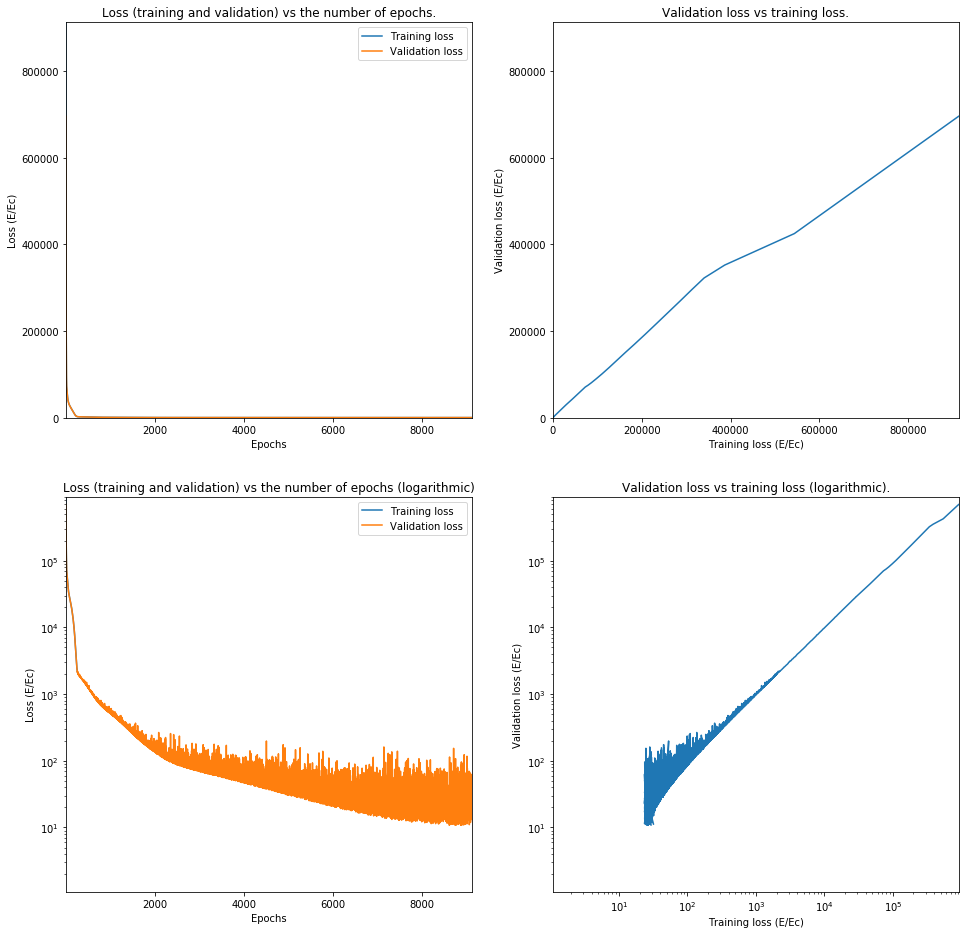

In [18]:
name = 'LinearNetwork'
settingsNetwork = [inputSize, ['Dense', 1, 'linear', True]]
learningRate = 1*10**-5
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=20000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)


13.571691292083454


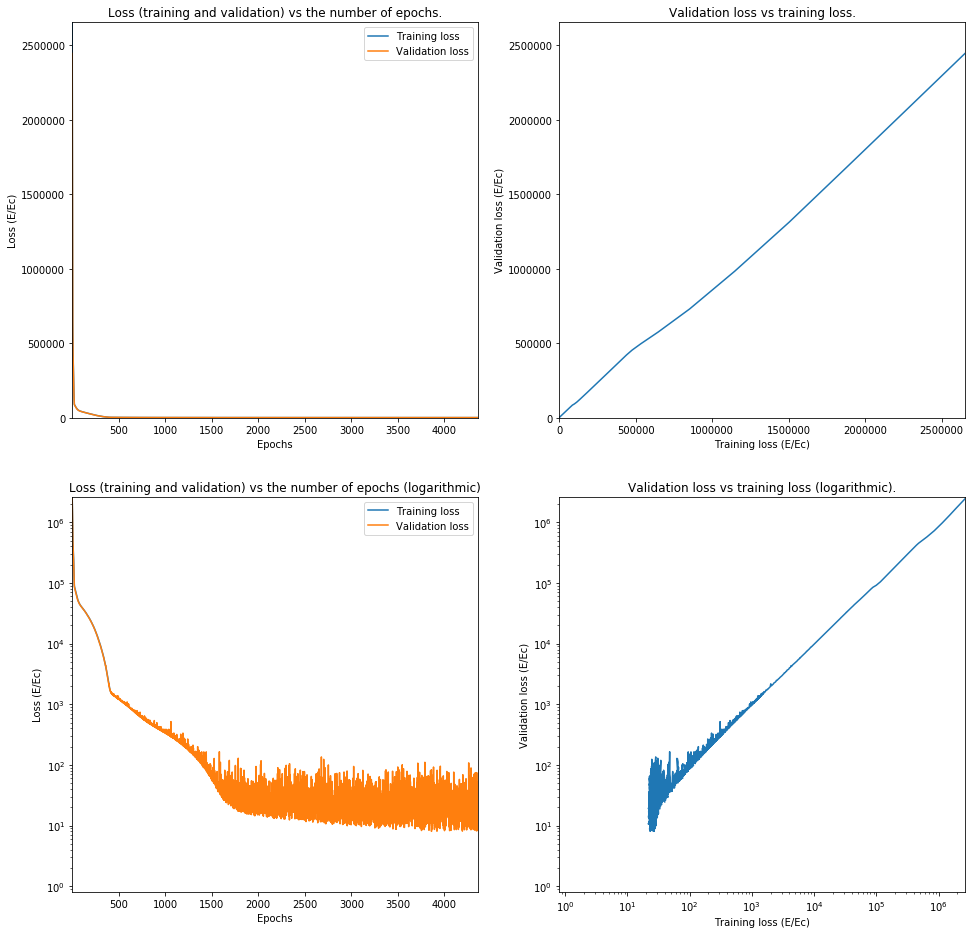

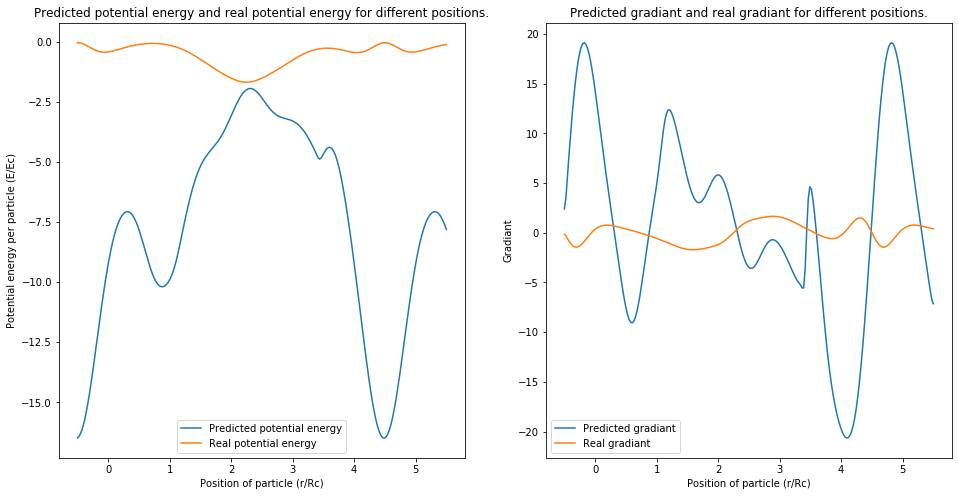

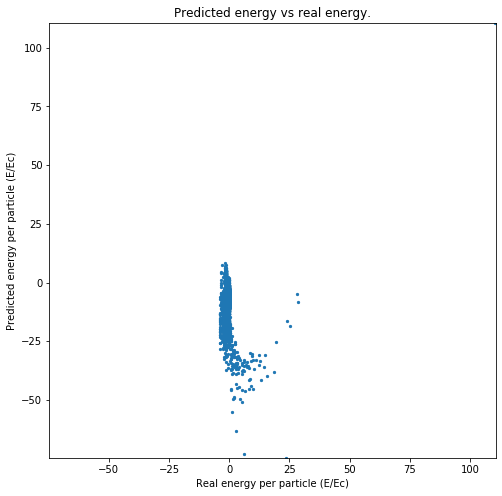

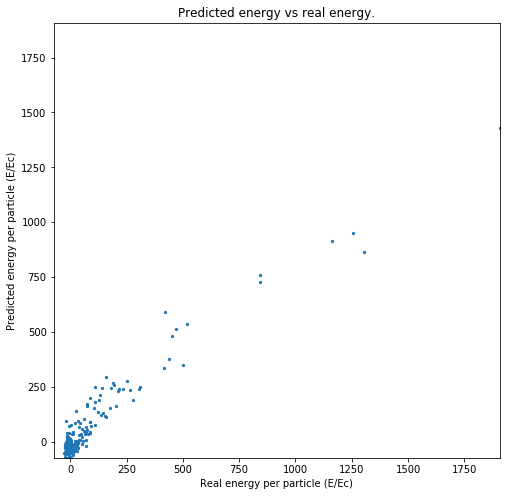

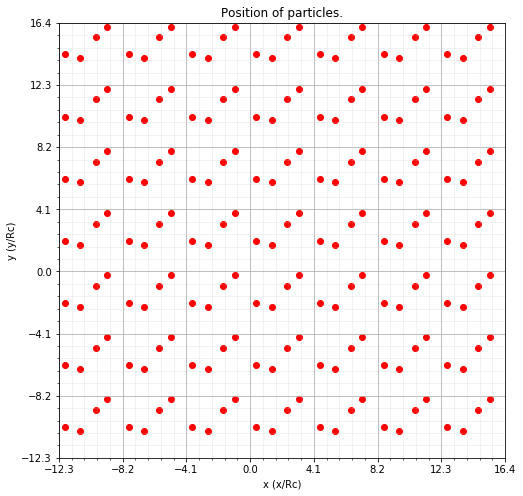

For index 74833 Predicted -1.0869894 was -0.2597554968


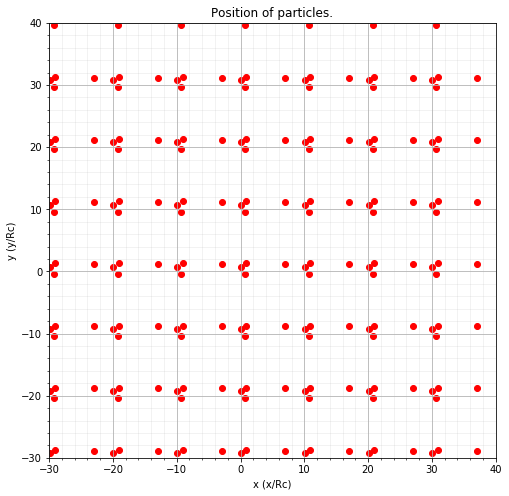

For index 35773 Predicted -6.5215597 was -0.3335562019


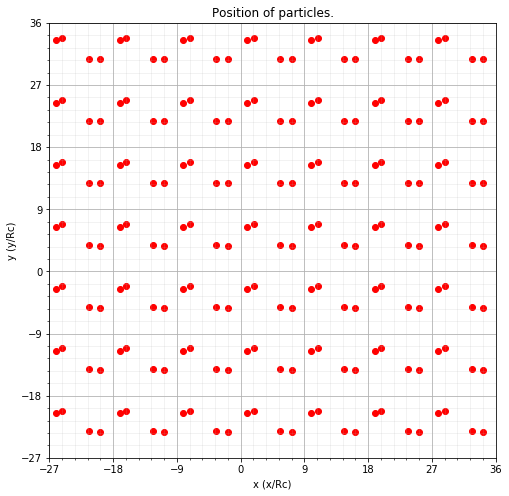

For index 5551 Predicted 0.8862772 was -0.1150331337


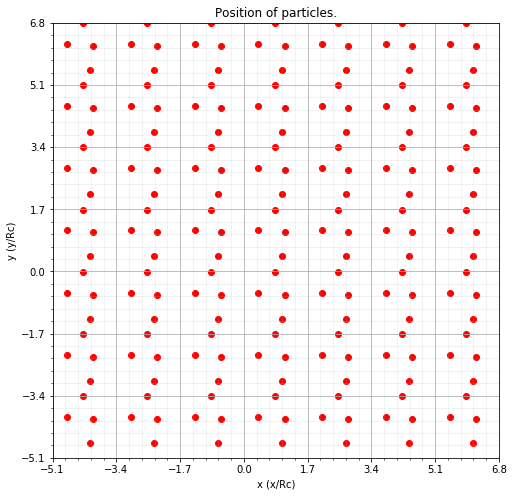

For index 39363 Predicted 1310.563 was 1556.8077658392


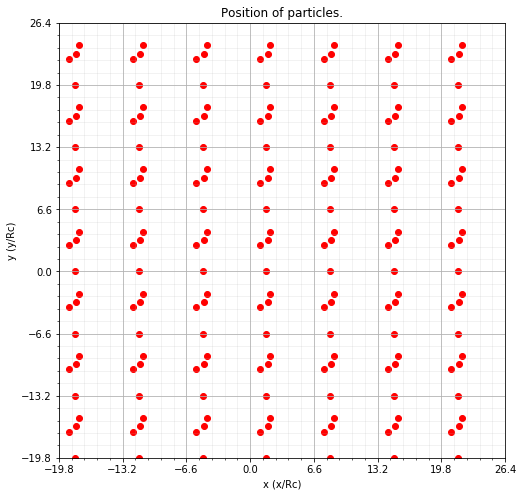

For index 2706 Predicted -10.806838 was -0.6221759978


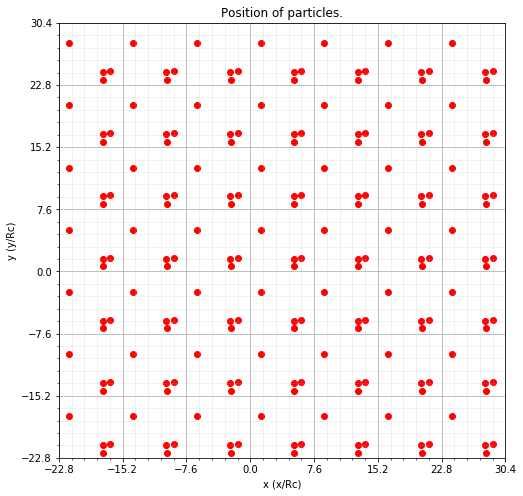

For index 29954 Predicted -10.000197 was -1.0098895203


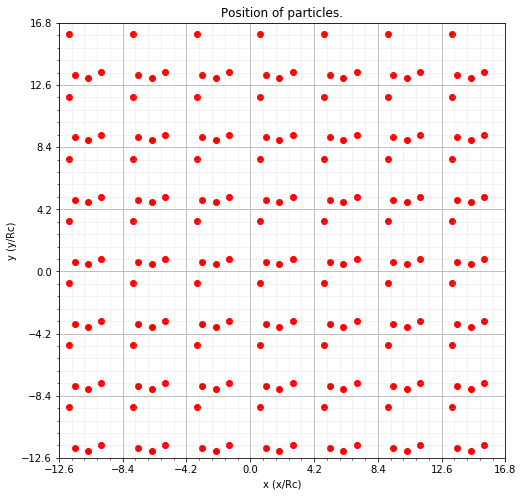

For index 61923 Predicted -9.791457 was -0.7630583212000001


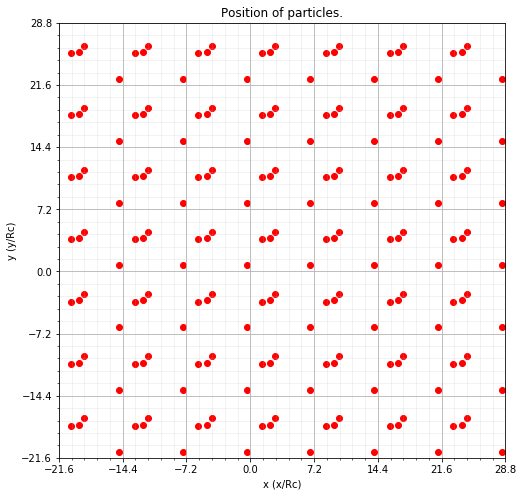

For index 65357 Predicted -8.857619 was -0.6674631693


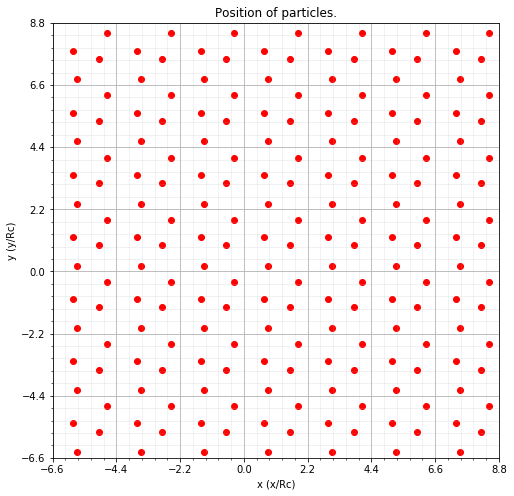

For index 89024 Predicted 2.1108866 was -7.6946347464


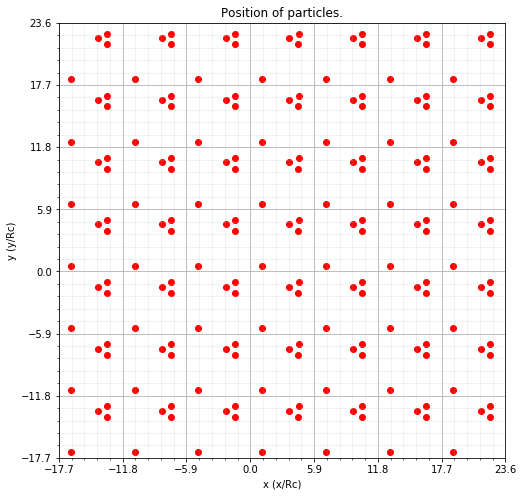

For index 1996 Predicted 1.4780741 was -1.3010053557


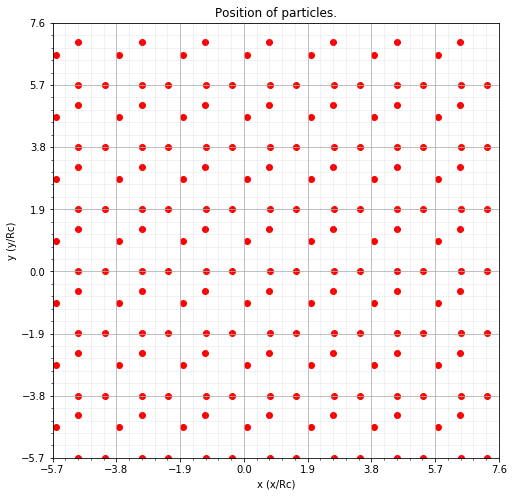

For index 36369 Predicted 8.887254 was 46.4097302903
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 1)                 17        
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[ 6.8096918e-01],
       [ 4.9120057e-01],
       [ 1.6082197e-01],
       [-5.8904294e-02],
       [-6.7310929e-02],
       [-3.5788704e-02],
       [ 2.1372363e-02],
       [ 5.0082348e-02],
       [-3.1166831e-03],
       [-4.2717210e-03],
       [-7.1948031e-03],
       [-8.8798786e-03],
       [ 3.3316176e-04],
       [ 3.3561070e-04],
       [ 3.7993270e-04],
       [ 4.2102311e-04]], dtype=float32), array([-3.8041525], dtype=float32)]


In [19]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

## Model 1: 1 Dense layer small softplus

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 17        
Total params: 289
Trainable params: 289
Non-trainable params: 0
_________________________________________________________________
78306/78306 [==============================] - 1s 10us/step
1561609.4145787042
Layer 0:  [array([[ 7.90011287e-02, -4.68369782e-01,  5.72042406e-01,
        -3.53516817e-01, -1.85866088e-01, -5.28470635e-01,
        -2.35585988e-01,  4.94203031e-01,  3.24312806e-01,
        -6.68014288e-02, -1.29586518e-01, -5.36967337e-01,
        -5.78355551e-01,  1.23367906e-02, -6.09098077e-01,
         2.16086984e-01],
       [ 4.63619530e-01,  4.95133102e-01,  8.76722932e-02,
        -3.92278433e-02, -1.43891543e-01, -2.342

Epoch 16/25000
62644/62644 [==============================] - 2s 29us/step - loss: 833568.6493 - val_loss: 774579.9633
Epoch 17/25000
62644/62644 [==============================] - 2s 29us/step - loss: 748669.1370 - val_loss: 701801.7911
Epoch 18/25000
62644/62644 [==============================] - 2s 29us/step - loss: 678958.3489 - val_loss: 636785.2278
Epoch 19/25000
62644/62644 [==============================] - 2s 30us/step - loss: 614292.4511 - val_loss: 574265.5332
Epoch 20/25000
62644/62644 [==============================] - 2s 29us/step - loss: 552130.6837 - val_loss: 514393.2464
Epoch 21/25000
62644/62644 [==============================] - 2s 29us/step - loss: 493480.6482 - val_loss: 458057.6563
Epoch 22/25000
62644/62644 [==============================] - 2s 29us/step - loss: 438100.2796 - val_loss: 405012.5598
Epoch 23/25000
62644/62644 [==============================] - 2s 29us/step - loss: 386965.6336 - val_loss: 356967.0195
Epoch 24/25000
62644/62644 [====================

Epoch 155/25000
62644/62644 [==============================] - 2s 29us/step - loss: 8807.5164 - val_loss: 8794.9026
Epoch 156/25000
62644/62644 [==============================] - 2s 29us/step - loss: 8674.9619 - val_loss: 8650.7554
Epoch 157/25000
62644/62644 [==============================] - 2s 30us/step - loss: 8533.6756 - val_loss: 8519.1946
Epoch 158/25000
62644/62644 [==============================] - 2s 29us/step - loss: 8404.2152 - val_loss: 8385.2175
Epoch 159/25000
62644/62644 [==============================] - 2s 29us/step - loss: 8272.0834 - val_loss: 8235.1254
Epoch 160/25000
62644/62644 [==============================] - 2s 29us/step - loss: 8152.0770 - val_loss: 8145.5336
Epoch 161/25000
62644/62644 [==============================] - 2s 29us/step - loss: 8038.5863 - val_loss: 8000.7092
Epoch 162/25000
62644/62644 [==============================] - 2s 29us/step - loss: 7924.8709 - val_loss: 7901.6301
Epoch 163/25000
62644/62644 [==============================] - 2s 29us/s

Epoch 296/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3331.7551 - val_loss: 3288.1827
Epoch 297/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3315.5095 - val_loss: 3306.3287
Epoch 298/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3295.7372 - val_loss: 3286.3395
Epoch 299/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3279.0813 - val_loss: 3236.7308
Epoch 300/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3261.7238 - val_loss: 3240.0961
Epoch 301/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3246.7869 - val_loss: 3208.4942
Epoch 302/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3225.5492 - val_loss: 3219.1814
Epoch 303/25000
62644/62644 [==============================] - 2s 29us/step - loss: 3206.2357 - val_loss: 3245.7030
Epoch 304/25000
62644/62644 [==============================] - 2s 29us/s

Epoch 437/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1764.4001 - val_loss: 1714.1412
Epoch 438/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1757.2777 - val_loss: 1691.7943
Epoch 439/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1751.9891 - val_loss: 1684.0062
Epoch 440/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1744.3728 - val_loss: 1679.0091
Epoch 441/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1737.5783 - val_loss: 1681.3615
Epoch 442/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1734.1091 - val_loss: 1668.0595
Epoch 443/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1730.3066 - val_loss: 1699.8587
Epoch 444/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1725.5739 - val_loss: 1660.1193
Epoch 445/25000
62644/62644 [==============================] - 2s 30us/s

Epoch 578/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1185.0500 - val_loss: 1193.6636
Epoch 579/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1180.3614 - val_loss: 1143.6172
Epoch 580/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1180.8551 - val_loss: 1137.8785
Epoch 581/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1175.3073 - val_loss: 1130.1772
Epoch 582/25000
62644/62644 [==============================] - 2s 30us/step - loss: 1172.6056 - val_loss: 1127.7440
Epoch 583/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1170.3969 - val_loss: 1126.8353
Epoch 584/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1169.3522 - val_loss: 1122.1350
Epoch 585/25000
62644/62644 [==============================] - 2s 29us/step - loss: 1166.3678 - val_loss: 1138.5064
Epoch 586/25000
62644/62644 [==============================] - 2s 29us/s

Epoch 720/25000
62644/62644 [==============================] - 2s 29us/step - loss: 869.9627 - val_loss: 806.6430
Epoch 721/25000
62644/62644 [==============================] - 2s 29us/step - loss: 866.4210 - val_loss: 826.7991
Epoch 722/25000
62644/62644 [==============================] - 2s 29us/step - loss: 863.8792 - val_loss: 805.8804
Epoch 723/25000
62644/62644 [==============================] - 2s 29us/step - loss: 863.4380 - val_loss: 805.5148
Epoch 724/25000
62644/62644 [==============================] - 2s 29us/step - loss: 861.3672 - val_loss: 810.0695
Epoch 725/25000
62644/62644 [==============================] - 2s 29us/step - loss: 859.9146 - val_loss: 808.2791
Epoch 726/25000
62644/62644 [==============================] - 2s 29us/step - loss: 859.3928 - val_loss: 804.4974
Epoch 727/25000
62644/62644 [==============================] - 2s 29us/step - loss: 856.6661 - val_loss: 796.0347
Epoch 728/25000
62644/62644 [==============================] - 2s 29us/step - loss: 853.

Epoch 792/25000
62644/62644 [==============================] - 2s 29us/step - loss: 759.0124 - val_loss: 703.5738
Epoch 793/25000
62644/62644 [==============================] - 2s 29us/step - loss: 760.6878 - val_loss: 714.0552
Epoch 794/25000
62644/62644 [==============================] - 2s 29us/step - loss: 757.6448 - val_loss: 703.5670
Epoch 795/25000
62644/62644 [==============================] - 2s 29us/step - loss: 754.9037 - val_loss: 703.2588
Epoch 796/25000
62644/62644 [==============================] - 2s 29us/step - loss: 754.0583 - val_loss: 704.4583
Epoch 797/25000
62644/62644 [==============================] - 2s 29us/step - loss: 754.8239 - val_loss: 740.7972
Epoch 798/25000
62644/62644 [==============================] - 2s 29us/step - loss: 749.3055 - val_loss: 700.7243
Epoch 799/25000
62644/62644 [==============================] - 2s 29us/step - loss: 749.7609 - val_loss: 727.6930
Epoch 800/25000
62644/62644 [==============================] - 2s 30us/step - loss: 748.

Epoch 864/25000
62644/62644 [==============================] - 2s 29us/step - loss: 668.2885 - val_loss: 634.8352
Epoch 865/25000
62644/62644 [==============================] - 2s 30us/step - loss: 668.4762 - val_loss: 632.2011
Epoch 866/25000
62644/62644 [==============================] - 2s 29us/step - loss: 665.0377 - val_loss: 619.1213
Epoch 867/25000
62644/62644 [==============================] - 2s 29us/step - loss: 666.1265 - val_loss: 615.5305
Epoch 868/25000
62644/62644 [==============================] - 2s 29us/step - loss: 663.6005 - val_loss: 615.8115
Epoch 869/25000
62644/62644 [==============================] - 2s 30us/step - loss: 662.2612 - val_loss: 615.6615
Epoch 870/25000
62644/62644 [==============================] - 2s 29us/step - loss: 660.7206 - val_loss: 618.1061
Epoch 871/25000
62644/62644 [==============================] - 2s 29us/step - loss: 657.8116 - val_loss: 636.6235
Epoch 872/25000
62644/62644 [==============================] - 2s 29us/step - loss: 657.

Epoch 936/25000
62644/62644 [==============================] - 2s 35us/step - loss: 592.2990 - val_loss: 561.2155
Epoch 937/25000
62644/62644 [==============================] - 2s 34us/step - loss: 592.8358 - val_loss: 555.8952
Epoch 938/25000
62644/62644 [==============================] - 2s 29us/step - loss: 590.3486 - val_loss: 563.3554
Epoch 939/25000
62644/62644 [==============================] - 2s 30us/step - loss: 589.5416 - val_loss: 557.4750
Epoch 940/25000
62644/62644 [==============================] - 2s 29us/step - loss: 587.5811 - val_loss: 554.3667
Epoch 941/25000
62644/62644 [==============================] - 2s 29us/step - loss: 589.9076 - val_loss: 563.6629
Epoch 942/25000
62644/62644 [==============================] - 2s 30us/step - loss: 585.8258 - val_loss: 587.9367
Epoch 943/25000
62644/62644 [==============================] - 2s 29us/step - loss: 587.4651 - val_loss: 552.3092
Epoch 944/25000
62644/62644 [==============================] - 2s 29us/step - loss: 584.

Epoch 1008/25000
62644/62644 [==============================] - 2s 29us/step - loss: 537.5466 - val_loss: 515.0329
Epoch 1009/25000
62644/62644 [==============================] - 2s 29us/step - loss: 535.2344 - val_loss: 510.5521
Epoch 1010/25000
62644/62644 [==============================] - 2s 29us/step - loss: 536.1075 - val_loss: 512.0547
Epoch 1011/25000
62644/62644 [==============================] - 2s 29us/step - loss: 537.0739 - val_loss: 521.2385
Epoch 1012/25000
62644/62644 [==============================] - 2s 29us/step - loss: 534.5148 - val_loss: 530.6472
Epoch 1013/25000
62644/62644 [==============================] - 2s 29us/step - loss: 534.4509 - val_loss: 512.2815
Epoch 1014/25000
62644/62644 [==============================] - 2s 29us/step - loss: 534.9108 - val_loss: 530.6900
Epoch 1015/25000
62644/62644 [==============================] - 2s 29us/step - loss: 536.0697 - val_loss: 518.4648
Epoch 1016/25000
62644/62644 [==============================] - 2s 29us/step - l

62644/62644 [==============================] - 2s 29us/step - loss: 456.2973 - val_loss: 429.6549
Epoch 1151/25000
62644/62644 [==============================] - 2s 29us/step - loss: 456.0010 - val_loss: 436.0330
Epoch 1152/25000
62644/62644 [==============================] - 2s 29us/step - loss: 451.4552 - val_loss: 456.8411
Epoch 1153/25000
62644/62644 [==============================] - 2s 29us/step - loss: 449.9362 - val_loss: 461.7907
Epoch 1154/25000
62644/62644 [==============================] - 2s 29us/step - loss: 454.6845 - val_loss: 431.9412
Epoch 1155/25000
62644/62644 [==============================] - 2s 29us/step - loss: 451.8969 - val_loss: 465.0771
Epoch 1156/25000
62644/62644 [==============================] - 2s 29us/step - loss: 449.3756 - val_loss: 432.0016
Epoch 1157/25000
62644/62644 [==============================] - 2s 29us/step - loss: 450.5401 - val_loss: 427.9186
Epoch 1158/25000
62644/62644 [==============================] - 2s 29us/step - loss: 450.7284 - v

62644/62644 [==============================] - 2s 29us/step - loss: 407.6008 - val_loss: 400.6033
Epoch 1293/25000
62644/62644 [==============================] - 2s 29us/step - loss: 408.5496 - val_loss: 391.3467
Epoch 1294/25000
62644/62644 [==============================] - 2s 29us/step - loss: 410.2176 - val_loss: 390.8207
Epoch 1295/25000
62644/62644 [==============================] - 2s 29us/step - loss: 406.0046 - val_loss: 401.2508
Epoch 1296/25000
62644/62644 [==============================] - 2s 29us/step - loss: 406.4652 - val_loss: 391.0486
Epoch 1297/25000
62644/62644 [==============================] - 2s 29us/step - loss: 406.6254 - val_loss: 390.2421
Epoch 1298/25000
62644/62644 [==============================] - 2s 29us/step - loss: 405.5120 - val_loss: 393.8791
Epoch 1299/25000
62644/62644 [==============================] - 2s 29us/step - loss: 404.5949 - val_loss: 391.3453
Epoch 1300/25000
62644/62644 [==============================] - 2s 29us/step - loss: 404.1364 - v

62644/62644 [==============================] - 2s 29us/step - loss: 382.2685 - val_loss: 365.8863
Epoch 1435/25000
62644/62644 [==============================] - 2s 29us/step - loss: 382.3343 - val_loss: 369.2968
Epoch 1436/25000
62644/62644 [==============================] - 2s 29us/step - loss: 379.3143 - val_loss: 369.8847
Epoch 1437/25000
62644/62644 [==============================] - 2s 29us/step - loss: 380.6066 - val_loss: 377.1286
Epoch 1438/25000
62644/62644 [==============================] - 2s 30us/step - loss: 380.9684 - val_loss: 366.3894
Epoch 1439/25000
62644/62644 [==============================] - 2s 29us/step - loss: 379.9618 - val_loss: 364.1071
Epoch 1440/25000
62644/62644 [==============================] - 2s 29us/step - loss: 380.2547 - val_loss: 364.8238
Epoch 1441/25000
62644/62644 [==============================] - 2s 29us/step - loss: 379.9387 - val_loss: 367.8199
Epoch 1442/25000
62644/62644 [==============================] - 2s 29us/step - loss: 380.9509 - v

62644/62644 [==============================] - 2s 29us/step - loss: 357.7889 - val_loss: 375.7702
Epoch 1577/25000
62644/62644 [==============================] - 2s 29us/step - loss: 358.5974 - val_loss: 359.3055
Epoch 1578/25000
62644/62644 [==============================] - 2s 29us/step - loss: 357.1053 - val_loss: 356.0047
Epoch 1579/25000
62644/62644 [==============================] - 2s 29us/step - loss: 355.0180 - val_loss: 340.6772
Epoch 1580/25000
62644/62644 [==============================] - 2s 29us/step - loss: 356.7506 - val_loss: 338.7868
Epoch 1581/25000
62644/62644 [==============================] - 2s 29us/step - loss: 355.5867 - val_loss: 370.3085
Epoch 1582/25000
62644/62644 [==============================] - 2s 29us/step - loss: 355.2318 - val_loss: 346.1033
Epoch 1583/25000
62644/62644 [==============================] - 2s 29us/step - loss: 354.5382 - val_loss: 343.4722
Epoch 1584/25000
62644/62644 [==============================] - 2s 29us/step - loss: 357.1343 - v

62644/62644 [==============================] - 2s 29us/step - loss: 340.3106 - val_loss: 324.9578
Epoch 1719/25000
62644/62644 [==============================] - 2s 29us/step - loss: 342.5093 - val_loss: 325.3408
Epoch 1720/25000
62644/62644 [==============================] - 2s 29us/step - loss: 341.4510 - val_loss: 326.4774
Epoch 1721/25000
62644/62644 [==============================] - 2s 29us/step - loss: 341.6300 - val_loss: 328.6118
Epoch 1722/25000
62644/62644 [==============================] - 2s 30us/step - loss: 340.4262 - val_loss: 340.2195
Epoch 1723/25000
62644/62644 [==============================] - 2s 29us/step - loss: 340.6430 - val_loss: 321.2959
Epoch 1724/25000
62644/62644 [==============================] - 2s 29us/step - loss: 339.9065 - val_loss: 338.5183
Epoch 1725/25000
62644/62644 [==============================] - 2s 29us/step - loss: 340.0557 - val_loss: 324.0256
Epoch 1726/25000
62644/62644 [==============================] - 2s 30us/step - loss: 339.1794 - v

62644/62644 [==============================] - 2s 29us/step - loss: 330.4987 - val_loss: 324.2543
Epoch 1861/25000
62644/62644 [==============================] - 2s 29us/step - loss: 327.8409 - val_loss: 312.8203
Epoch 1862/25000
62644/62644 [==============================] - 2s 29us/step - loss: 325.7511 - val_loss: 310.8715
Epoch 1863/25000
62644/62644 [==============================] - 2s 29us/step - loss: 327.0869 - val_loss: 314.6940
Epoch 1864/25000
62644/62644 [==============================] - 2s 29us/step - loss: 323.8377 - val_loss: 345.1779
Epoch 1865/25000
62644/62644 [==============================] - 2s 29us/step - loss: 327.7078 - val_loss: 311.3546
Epoch 1866/25000
62644/62644 [==============================] - 2s 29us/step - loss: 325.0972 - val_loss: 318.9399
Epoch 1867/25000
62644/62644 [==============================] - 2s 29us/step - loss: 324.2872 - val_loss: 315.6126
Epoch 1868/25000
62644/62644 [==============================] - 2s 29us/step - loss: 328.2643 - v

62644/62644 [==============================] - 2s 29us/step - loss: 308.5192 - val_loss: 311.4754
Epoch 2003/25000
62644/62644 [==============================] - 2s 29us/step - loss: 307.8850 - val_loss: 316.2793
Epoch 2004/25000
62644/62644 [==============================] - 2s 29us/step - loss: 309.4435 - val_loss: 317.6585
Epoch 2005/25000
62644/62644 [==============================] - 2s 29us/step - loss: 310.9180 - val_loss: 302.4672
Epoch 2006/25000
62644/62644 [==============================] - 2s 29us/step - loss: 308.3250 - val_loss: 305.0302
Epoch 2007/25000
62644/62644 [==============================] - 2s 29us/step - loss: 309.3884 - val_loss: 323.9495
Epoch 2008/25000
62644/62644 [==============================] - 2s 29us/step - loss: 309.3075 - val_loss: 302.1930
Epoch 2009/25000
62644/62644 [==============================] - 2s 29us/step - loss: 309.3559 - val_loss: 339.3847
Epoch 2010/25000
62644/62644 [==============================] - 2s 29us/step - loss: 309.5070 - v

62644/62644 [==============================] - 2s 29us/step - loss: 297.7957 - val_loss: 291.2589
Epoch 2145/25000
62644/62644 [==============================] - 2s 29us/step - loss: 297.1898 - val_loss: 311.7248
Epoch 2146/25000
62644/62644 [==============================] - 2s 29us/step - loss: 297.2649 - val_loss: 301.0593
Epoch 2147/25000
62644/62644 [==============================] - 2s 29us/step - loss: 299.0253 - val_loss: 310.7626
Epoch 2148/25000
62644/62644 [==============================] - 2s 29us/step - loss: 297.8884 - val_loss: 288.9790
Epoch 2149/25000
62644/62644 [==============================] - 2s 29us/step - loss: 296.9928 - val_loss: 293.8008
Epoch 2150/25000
62644/62644 [==============================] - 2s 29us/step - loss: 295.8213 - val_loss: 297.6410
Epoch 2151/25000
62644/62644 [==============================] - 2s 30us/step - loss: 296.2589 - val_loss: 288.3448
Epoch 2152/25000
62644/62644 [==============================] - 2s 31us/step - loss: 298.4977 - v

62644/62644 [==============================] - 2s 29us/step - loss: 285.8797 - val_loss: 277.6247
Epoch 2287/25000
62644/62644 [==============================] - 2s 29us/step - loss: 285.1818 - val_loss: 281.7801
Epoch 2288/25000
62644/62644 [==============================] - 2s 29us/step - loss: 283.5154 - val_loss: 289.9386
Epoch 2289/25000
62644/62644 [==============================] - 2s 29us/step - loss: 284.7316 - val_loss: 289.2769
Epoch 2290/25000
62644/62644 [==============================] - 2s 29us/step - loss: 288.1522 - val_loss: 306.4010
Epoch 2291/25000
62644/62644 [==============================] - 2s 29us/step - loss: 284.5441 - val_loss: 277.4844
Epoch 2292/25000
62644/62644 [==============================] - 2s 29us/step - loss: 283.6422 - val_loss: 279.6590
Epoch 2293/25000
62644/62644 [==============================] - 2s 29us/step - loss: 283.4516 - val_loss: 274.1141
Epoch 2294/25000
62644/62644 [==============================] - 2s 29us/step - loss: 283.9847 - v

62644/62644 [==============================] - 2s 29us/step - loss: 275.7182 - val_loss: 263.0708
Epoch 2429/25000
62644/62644 [==============================] - 2s 29us/step - loss: 275.1047 - val_loss: 262.6999
Epoch 2430/25000
62644/62644 [==============================] - 2s 29us/step - loss: 274.2429 - val_loss: 266.1385
Epoch 2431/25000
62644/62644 [==============================] - 2s 30us/step - loss: 273.8570 - val_loss: 272.5221
Epoch 2432/25000
62644/62644 [==============================] - 2s 29us/step - loss: 273.5903 - val_loss: 291.4344
Epoch 2433/25000
62644/62644 [==============================] - 2s 29us/step - loss: 274.8270 - val_loss: 291.5595
Epoch 2434/25000
62644/62644 [==============================] - 2s 29us/step - loss: 274.4044 - val_loss: 285.9626
Epoch 2435/25000
62644/62644 [==============================] - 2s 30us/step - loss: 273.8820 - val_loss: 306.2289
Epoch 2436/25000
62644/62644 [==============================] - 2s 29us/step - loss: 274.4113 - v

62644/62644 [==============================] - 2s 29us/step - loss: 264.3094 - val_loss: 258.0561
Epoch 2571/25000
62644/62644 [==============================] - 2s 29us/step - loss: 264.5220 - val_loss: 268.5249
Epoch 2572/25000
62644/62644 [==============================] - 2s 29us/step - loss: 261.3523 - val_loss: 259.2545
Epoch 2573/25000
62644/62644 [==============================] - 2s 29us/step - loss: 264.0835 - val_loss: 264.6502
Epoch 2574/25000
62644/62644 [==============================] - 2s 29us/step - loss: 264.8213 - val_loss: 264.3852
Epoch 2575/25000
62644/62644 [==============================] - 2s 29us/step - loss: 263.9188 - val_loss: 260.9761
Epoch 2576/25000
62644/62644 [==============================] - 2s 29us/step - loss: 263.3385 - val_loss: 275.3188
Epoch 2577/25000
62644/62644 [==============================] - 2s 29us/step - loss: 263.4995 - val_loss: 284.7961
Epoch 2578/25000
62644/62644 [==============================] - 2s 29us/step - loss: 263.4480 - v

62644/62644 [==============================] - 2s 29us/step - loss: 255.0376 - val_loss: 293.2813
Epoch 2713/25000
62644/62644 [==============================] - 2s 29us/step - loss: 257.6216 - val_loss: 269.2038
Epoch 2714/25000
62644/62644 [==============================] - 2s 29us/step - loss: 256.1737 - val_loss: 280.3110
Epoch 2715/25000
62644/62644 [==============================] - 2s 29us/step - loss: 256.0035 - val_loss: 257.7078
Epoch 2716/25000
62644/62644 [==============================] - 2s 29us/step - loss: 257.1880 - val_loss: 252.7899
Epoch 2717/25000
62644/62644 [==============================] - 2s 30us/step - loss: 254.1290 - val_loss: 273.0728
Epoch 2718/25000
62644/62644 [==============================] - 2s 29us/step - loss: 256.1119 - val_loss: 245.7704
Epoch 2719/25000
62644/62644 [==============================] - 2s 29us/step - loss: 253.8240 - val_loss: 252.6922
Epoch 2720/25000
62644/62644 [==============================] - 2s 29us/step - loss: 254.6713 - v

62644/62644 [==============================] - 2s 31us/step - loss: 245.1692 - val_loss: 228.1761
Epoch 2855/25000
62644/62644 [==============================] - 2s 29us/step - loss: 246.4633 - val_loss: 229.0077
Epoch 2856/25000
62644/62644 [==============================] - 2s 29us/step - loss: 247.2407 - val_loss: 234.7634
Epoch 2857/25000
62644/62644 [==============================] - 2s 29us/step - loss: 244.6884 - val_loss: 289.2771
Epoch 2858/25000
62644/62644 [==============================] - 2s 29us/step - loss: 245.7810 - val_loss: 227.6728
Epoch 2859/25000
62644/62644 [==============================] - 2s 30us/step - loss: 244.8924 - val_loss: 242.3070
Epoch 2860/25000
62644/62644 [==============================] - 2s 30us/step - loss: 246.0187 - val_loss: 244.4773
Epoch 2861/25000
62644/62644 [==============================] - 2s 31us/step - loss: 248.5577 - val_loss: 229.9936
Epoch 2862/25000
62644/62644 [==============================] - 2s 31us/step - loss: 245.3937 - v

62644/62644 [==============================] - 2s 29us/step - loss: 237.8164 - val_loss: 216.1898
Epoch 2997/25000
62644/62644 [==============================] - 2s 29us/step - loss: 239.7138 - val_loss: 219.5989
Epoch 2998/25000
62644/62644 [==============================] - 2s 29us/step - loss: 240.5664 - val_loss: 218.2224
Epoch 2999/25000
62644/62644 [==============================] - 2s 29us/step - loss: 240.2363 - val_loss: 236.1650
Epoch 3000/25000
62644/62644 [==============================] - 2s 29us/step - loss: 238.6786 - val_loss: 221.2671
Epoch 3001/25000
62644/62644 [==============================] - 2s 29us/step - loss: 237.7433 - val_loss: 235.9488
Epoch 3002/25000
62644/62644 [==============================] - 2s 29us/step - loss: 239.5295 - val_loss: 226.4668
Epoch 3003/25000
62644/62644 [==============================] - 2s 30us/step - loss: 239.1341 - val_loss: 218.7182
Epoch 3004/25000
62644/62644 [==============================] - 2s 29us/step - loss: 237.3195 - v

62644/62644 [==============================] - 2s 29us/step - loss: 232.9439 - val_loss: 213.3534
Epoch 3139/25000
62644/62644 [==============================] - 2s 29us/step - loss: 233.1520 - val_loss: 205.1123
Epoch 3140/25000
62644/62644 [==============================] - 2s 29us/step - loss: 233.4016 - val_loss: 207.2868
Epoch 3141/25000
62644/62644 [==============================] - 2s 29us/step - loss: 233.8320 - val_loss: 206.1551
Epoch 3142/25000
62644/62644 [==============================] - 2s 29us/step - loss: 233.6563 - val_loss: 255.4627
Epoch 3143/25000
62644/62644 [==============================] - 2s 29us/step - loss: 232.4120 - val_loss: 207.7086
Epoch 3144/25000
62644/62644 [==============================] - 2s 29us/step - loss: 232.3991 - val_loss: 215.7045
Epoch 3145/25000
62644/62644 [==============================] - 2s 29us/step - loss: 234.5974 - val_loss: 233.5488
Epoch 3146/25000
62644/62644 [==============================] - 2s 29us/step - loss: 232.5954 - v

62644/62644 [==============================] - 2s 29us/step - loss: 229.3271 - val_loss: 213.5395
Epoch 3281/25000
62644/62644 [==============================] - 2s 29us/step - loss: 228.3914 - val_loss: 197.2266
Epoch 3282/25000
62644/62644 [==============================] - 2s 29us/step - loss: 228.4995 - val_loss: 220.2634
Epoch 3283/25000
62644/62644 [==============================] - 2s 29us/step - loss: 227.0662 - val_loss: 261.9745
Epoch 3284/25000
62644/62644 [==============================] - 2s 29us/step - loss: 228.6263 - val_loss: 198.3083
Epoch 3285/25000
62644/62644 [==============================] - 2s 29us/step - loss: 231.3090 - val_loss: 222.7610
Epoch 3286/25000
62644/62644 [==============================] - 2s 29us/step - loss: 226.3823 - val_loss: 203.5638
Epoch 3287/25000
62644/62644 [==============================] - 2s 29us/step - loss: 227.8597 - val_loss: 206.4568
Epoch 3288/25000
62644/62644 [==============================] - 2s 30us/step - loss: 230.4348 - v

62644/62644 [==============================] - 2s 29us/step - loss: 225.1902 - val_loss: 213.8676
Epoch 3423/25000
62644/62644 [==============================] - 2s 30us/step - loss: 224.8929 - val_loss: 196.8134
Epoch 3424/25000
62644/62644 [==============================] - 2s 29us/step - loss: 222.6580 - val_loss: 192.8435
Epoch 3425/25000
62644/62644 [==============================] - 2s 29us/step - loss: 223.2911 - val_loss: 209.9111
Epoch 3426/25000
62644/62644 [==============================] - 2s 29us/step - loss: 223.9311 - val_loss: 196.0198
Epoch 3427/25000
62644/62644 [==============================] - 2s 29us/step - loss: 224.3901 - val_loss: 192.4753
Epoch 3428/25000
62644/62644 [==============================] - 2s 29us/step - loss: 223.2747 - val_loss: 192.4624
Epoch 3429/25000
62644/62644 [==============================] - 2s 29us/step - loss: 224.4701 - val_loss: 193.7024
Epoch 3430/25000
62644/62644 [==============================] - 2s 29us/step - loss: 224.2230 - v

62644/62644 [==============================] - 2s 29us/step - loss: 218.4681 - val_loss: 183.9501
Epoch 3565/25000
62644/62644 [==============================] - 2s 29us/step - loss: 219.9145 - val_loss: 185.3177
Epoch 3566/25000
62644/62644 [==============================] - 2s 29us/step - loss: 220.7527 - val_loss: 185.2769
Epoch 3567/25000
62644/62644 [==============================] - 2s 29us/step - loss: 219.2528 - val_loss: 195.9564
Epoch 3568/25000
62644/62644 [==============================] - 2s 29us/step - loss: 219.9255 - val_loss: 196.9279
Epoch 3569/25000
62644/62644 [==============================] - 2s 29us/step - loss: 219.7472 - val_loss: 199.8933
Epoch 3570/25000
62644/62644 [==============================] - 2s 30us/step - loss: 220.4785 - val_loss: 187.5128
Epoch 3571/25000
62644/62644 [==============================] - 2s 30us/step - loss: 217.9792 - val_loss: 205.0806
Epoch 3572/25000
62644/62644 [==============================] - 2s 29us/step - loss: 218.0771 - v

62644/62644 [==============================] - 2s 29us/step - loss: 215.4819 - val_loss: 188.8187
Epoch 3707/25000
62644/62644 [==============================] - 2s 29us/step - loss: 216.9009 - val_loss: 262.9735
Epoch 3708/25000
62644/62644 [==============================] - 2s 29us/step - loss: 216.9804 - val_loss: 189.3232
Epoch 3709/25000
62644/62644 [==============================] - 2s 29us/step - loss: 215.1129 - val_loss: 194.9706
Epoch 3710/25000
62644/62644 [==============================] - 2s 29us/step - loss: 218.0481 - val_loss: 204.8427
Epoch 3711/25000
62644/62644 [==============================] - 2s 29us/step - loss: 215.2158 - val_loss: 191.7059
Epoch 3712/25000
62644/62644 [==============================] - 2s 29us/step - loss: 214.5998 - val_loss: 243.8924
Epoch 3713/25000
62644/62644 [==============================] - 2s 29us/step - loss: 214.4516 - val_loss: 208.8188
Epoch 3714/25000
62644/62644 [==============================] - 2s 29us/step - loss: 215.1720 - v

62644/62644 [==============================] - 2s 29us/step - loss: 213.3679 - val_loss: 193.1854
Epoch 3849/25000
62644/62644 [==============================] - 2s 29us/step - loss: 213.8182 - val_loss: 179.8560
Epoch 3850/25000
62644/62644 [==============================] - 2s 29us/step - loss: 214.0655 - val_loss: 191.1478
Epoch 3851/25000
62644/62644 [==============================] - 2s 29us/step - loss: 212.7998 - val_loss: 178.5907
Epoch 3852/25000
62644/62644 [==============================] - 2s 29us/step - loss: 212.8944 - val_loss: 226.1399
Epoch 3853/25000
62644/62644 [==============================] - 2s 29us/step - loss: 210.3564 - val_loss: 185.6788
Epoch 3854/25000
62644/62644 [==============================] - 2s 29us/step - loss: 214.0136 - val_loss: 178.7875
Epoch 3855/25000
62644/62644 [==============================] - 2s 29us/step - loss: 211.4122 - val_loss: 181.3465
Epoch 3856/25000
62644/62644 [==============================] - 2s 29us/step - loss: 214.5372 - v

62644/62644 [==============================] - 2s 29us/step - loss: 209.8492 - val_loss: 221.6546
Epoch 3991/25000
62644/62644 [==============================] - 2s 29us/step - loss: 210.7395 - val_loss: 193.0426
Epoch 3992/25000
62644/62644 [==============================] - 2s 29us/step - loss: 209.5852 - val_loss: 195.1032
Epoch 3993/25000
62644/62644 [==============================] - 2s 31us/step - loss: 210.8632 - val_loss: 173.2920
Epoch 3994/25000
62644/62644 [==============================] - 2s 31us/step - loss: 209.9352 - val_loss: 204.6720
Epoch 3995/25000
62644/62644 [==============================] - 2s 31us/step - loss: 210.7690 - val_loss: 184.7518
Epoch 3996/25000
62644/62644 [==============================] - 2s 30us/step - loss: 212.1620 - val_loss: 180.7099
Epoch 3997/25000
62644/62644 [==============================] - 2s 29us/step - loss: 210.4412 - val_loss: 184.3276
Epoch 3998/25000
62644/62644 [==============================] - 2s 29us/step - loss: 210.2570 - v

62644/62644 [==============================] - 2s 29us/step - loss: 207.0878 - val_loss: 200.2675
Epoch 4133/25000
62644/62644 [==============================] - 2s 29us/step - loss: 205.0253 - val_loss: 220.6350
Epoch 4134/25000
62644/62644 [==============================] - 2s 29us/step - loss: 205.2170 - val_loss: 171.5288
Epoch 4135/25000
62644/62644 [==============================] - 2s 29us/step - loss: 205.5956 - val_loss: 173.9590
Epoch 4136/25000
62644/62644 [==============================] - 2s 29us/step - loss: 205.0661 - val_loss: 172.8854
Epoch 4137/25000
62644/62644 [==============================] - 2s 29us/step - loss: 207.8436 - val_loss: 191.2674
Epoch 4138/25000
62644/62644 [==============================] - 2s 29us/step - loss: 207.5200 - val_loss: 176.7754
Epoch 4139/25000
62644/62644 [==============================] - 2s 29us/step - loss: 205.5964 - val_loss: 195.3507
Epoch 4140/25000
62644/62644 [==============================] - 2s 29us/step - loss: 205.4692 - v

62644/62644 [==============================] - 2s 29us/step - loss: 204.2784 - val_loss: 204.9915
Epoch 4275/25000
62644/62644 [==============================] - 2s 29us/step - loss: 201.7722 - val_loss: 171.0224
Epoch 4276/25000
62644/62644 [==============================] - 2s 29us/step - loss: 206.0186 - val_loss: 174.7227
Epoch 4277/25000
62644/62644 [==============================] - 2s 30us/step - loss: 204.9496 - val_loss: 196.0162
Epoch 4278/25000
62644/62644 [==============================] - 2s 29us/step - loss: 206.0912 - val_loss: 169.8363
Epoch 4279/25000
62644/62644 [==============================] - 2s 29us/step - loss: 203.8208 - val_loss: 187.6732
Epoch 4280/25000
62644/62644 [==============================] - 2s 29us/step - loss: 206.3324 - val_loss: 182.5940
Epoch 4281/25000
62644/62644 [==============================] - 2s 30us/step - loss: 207.3298 - val_loss: 171.4807
Epoch 4282/25000
62644/62644 [==============================] - 2s 29us/step - loss: 204.3353 - v

62644/62644 [==============================] - 2s 29us/step - loss: 201.5387 - val_loss: 188.9261
Epoch 4417/25000
62644/62644 [==============================] - 2s 29us/step - loss: 203.6251 - val_loss: 178.9296
Epoch 4418/25000
62644/62644 [==============================] - 2s 29us/step - loss: 201.9976 - val_loss: 169.7345
Epoch 4419/25000
62644/62644 [==============================] - 2s 29us/step - loss: 198.3532 - val_loss: 175.7421
Epoch 4420/25000
62644/62644 [==============================] - 2s 29us/step - loss: 202.9901 - val_loss: 191.3770
Epoch 4421/25000
62644/62644 [==============================] - 2s 29us/step - loss: 201.7987 - val_loss: 171.6289
Epoch 4422/25000
62644/62644 [==============================] - 2s 29us/step - loss: 203.4811 - val_loss: 199.7640
Epoch 4423/25000
62644/62644 [==============================] - 2s 29us/step - loss: 202.5981 - val_loss: 172.3876
Epoch 4424/25000
62644/62644 [==============================] - 2s 29us/step - loss: 204.6268 - v

62644/62644 [==============================] - 2s 29us/step - loss: 198.0544 - val_loss: 169.6432
Epoch 4559/25000
62644/62644 [==============================] - 2s 30us/step - loss: 195.3968 - val_loss: 171.8468
Epoch 4560/25000
62644/62644 [==============================] - 2s 30us/step - loss: 198.2408 - val_loss: 173.7180
Epoch 4561/25000
62644/62644 [==============================] - 2s 29us/step - loss: 196.7555 - val_loss: 223.8601
Epoch 4562/25000
62644/62644 [==============================] - 2s 29us/step - loss: 199.3627 - val_loss: 184.2352
Epoch 4563/25000
62644/62644 [==============================] - 2s 29us/step - loss: 195.5719 - val_loss: 191.3325
Epoch 4564/25000
62644/62644 [==============================] - 2s 29us/step - loss: 198.8030 - val_loss: 170.7403
Epoch 4565/25000
62644/62644 [==============================] - 2s 29us/step - loss: 195.1484 - val_loss: 180.5257
Epoch 4566/25000
62644/62644 [==============================] - 2s 29us/step - loss: 195.8653 - v

62644/62644 [==============================] - 2s 29us/step - loss: 192.1272 - val_loss: 169.3711
Epoch 4701/25000
62644/62644 [==============================] - 2s 29us/step - loss: 195.5535 - val_loss: 176.0745
Epoch 4702/25000
62644/62644 [==============================] - 2s 29us/step - loss: 192.9609 - val_loss: 168.1348
Epoch 4703/25000
62644/62644 [==============================] - 2s 29us/step - loss: 193.5101 - val_loss: 176.6356
Epoch 4704/25000
62644/62644 [==============================] - 2s 29us/step - loss: 191.2145 - val_loss: 172.6890
Epoch 4705/25000
62644/62644 [==============================] - 2s 29us/step - loss: 190.3503 - val_loss: 166.4482
Epoch 4706/25000
62644/62644 [==============================] - 2s 29us/step - loss: 191.9423 - val_loss: 172.8117
Epoch 4707/25000
62644/62644 [==============================] - 2s 29us/step - loss: 193.8709 - val_loss: 202.9520
Epoch 4708/25000
62644/62644 [==============================] - 2s 29us/step - loss: 192.5813 - v

62644/62644 [==============================] - 2s 29us/step - loss: 188.0926 - val_loss: 193.2682
Epoch 4843/25000
62644/62644 [==============================] - 2s 30us/step - loss: 188.1102 - val_loss: 185.7156
Epoch 4844/25000
62644/62644 [==============================] - 2s 32us/step - loss: 189.2279 - val_loss: 164.0364
Epoch 4845/25000
62644/62644 [==============================] - 2s 34us/step - loss: 187.0395 - val_loss: 175.7807
Epoch 4846/25000
62644/62644 [==============================] - 2s 33us/step - loss: 189.3971 - val_loss: 170.5729
Epoch 4847/25000
62644/62644 [==============================] - 2s 33us/step - loss: 187.3926 - val_loss: 163.5646
Epoch 4848/25000
62644/62644 [==============================] - 2s 29us/step - loss: 187.9146 - val_loss: 166.9919
Epoch 4849/25000
62644/62644 [==============================] - 2s 29us/step - loss: 189.8888 - val_loss: 201.4840
Epoch 4850/25000
62644/62644 [==============================] - 2s 29us/step - loss: 187.8785 - v

62644/62644 [==============================] - 2s 30us/step - loss: 185.2408 - val_loss: 158.9470
Epoch 4985/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.9615 - val_loss: 175.2584
Epoch 4986/25000
62644/62644 [==============================] - 2s 29us/step - loss: 185.4561 - val_loss: 163.2745
Epoch 4987/25000
62644/62644 [==============================] - 2s 29us/step - loss: 185.3556 - val_loss: 181.0917
Epoch 4988/25000
62644/62644 [==============================] - 2s 29us/step - loss: 186.3073 - val_loss: 218.8198
Epoch 4989/25000
62644/62644 [==============================] - 2s 29us/step - loss: 186.8225 - val_loss: 176.8983
Epoch 4990/25000
62644/62644 [==============================] - 2s 29us/step - loss: 186.1315 - val_loss: 176.8812
Epoch 4991/25000
62644/62644 [==============================] - 2s 29us/step - loss: 186.7662 - val_loss: 170.8340
Epoch 4992/25000
62644/62644 [==============================] - 2s 29us/step - loss: 187.0332 - v

62644/62644 [==============================] - 2s 29us/step - loss: 183.9707 - val_loss: 166.5623
Epoch 5127/25000
62644/62644 [==============================] - 2s 29us/step - loss: 185.0003 - val_loss: 168.0247
Epoch 5128/25000
62644/62644 [==============================] - 2s 29us/step - loss: 182.9484 - val_loss: 166.9505
Epoch 5129/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.1029 - val_loss: 156.9859
Epoch 5130/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.1598 - val_loss: 165.3883
Epoch 5131/25000
62644/62644 [==============================] - 2s 29us/step - loss: 184.8064 - val_loss: 158.1647
Epoch 5132/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.7291 - val_loss: 158.1192
Epoch 5133/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.9095 - val_loss: 165.4890
Epoch 5134/25000
62644/62644 [==============================] - 2s 30us/step - loss: 184.7936 - v

62644/62644 [==============================] - 2s 29us/step - loss: 183.6525 - val_loss: 166.3298
Epoch 5269/25000
62644/62644 [==============================] - 2s 29us/step - loss: 182.6512 - val_loss: 165.7027
Epoch 5270/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.3279 - val_loss: 162.2887
Epoch 5271/25000
62644/62644 [==============================] - 2s 29us/step - loss: 184.9054 - val_loss: 183.5240
Epoch 5272/25000
62644/62644 [==============================] - 2s 29us/step - loss: 185.3568 - val_loss: 155.2868
Epoch 5273/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.5862 - val_loss: 159.9141
Epoch 5274/25000
62644/62644 [==============================] - 2s 29us/step - loss: 184.5124 - val_loss: 160.9168
Epoch 5275/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.9349 - val_loss: 157.2154
Epoch 5276/25000
62644/62644 [==============================] - 2s 29us/step - loss: 182.2486 - v

62644/62644 [==============================] - 2s 29us/step - loss: 180.5326 - val_loss: 155.2765
Epoch 5411/25000
62644/62644 [==============================] - 2s 29us/step - loss: 180.8642 - val_loss: 155.3154
Epoch 5412/25000
62644/62644 [==============================] - 2s 29us/step - loss: 180.8482 - val_loss: 164.8434
Epoch 5413/25000
62644/62644 [==============================] - 2s 29us/step - loss: 182.1347 - val_loss: 160.2613
Epoch 5414/25000
62644/62644 [==============================] - 2s 29us/step - loss: 180.6017 - val_loss: 154.4817
Epoch 5415/25000
62644/62644 [==============================] - 2s 29us/step - loss: 183.2142 - val_loss: 152.5250
Epoch 5416/25000
62644/62644 [==============================] - 2s 29us/step - loss: 180.0927 - val_loss: 190.0449
Epoch 5417/25000
62644/62644 [==============================] - 2s 30us/step - loss: 181.9756 - val_loss: 164.2636
Epoch 5418/25000
62644/62644 [==============================] - 2s 30us/step - loss: 182.0519 - v

62644/62644 [==============================] - 2s 29us/step - loss: 177.1194 - val_loss: 152.3327
Epoch 5553/25000
62644/62644 [==============================] - 2s 29us/step - loss: 178.8963 - val_loss: 188.5262
Epoch 5554/25000
62644/62644 [==============================] - 2s 29us/step - loss: 179.7113 - val_loss: 159.3292
Epoch 5555/25000
62644/62644 [==============================] - 2s 29us/step - loss: 179.3745 - val_loss: 158.7559
Epoch 5556/25000
62644/62644 [==============================] - 2s 29us/step - loss: 179.6552 - val_loss: 164.9775
Epoch 5557/25000
62644/62644 [==============================] - 2s 29us/step - loss: 180.8561 - val_loss: 159.9080
Epoch 5558/25000
62644/62644 [==============================] - 2s 29us/step - loss: 179.7217 - val_loss: 150.0081
Epoch 5559/25000
62644/62644 [==============================] - 2s 29us/step - loss: 176.8234 - val_loss: 150.2474
Epoch 5560/25000
62644/62644 [==============================] - 2s 29us/step - loss: 178.4953 - v

62644/62644 [==============================] - 2s 29us/step - loss: 177.1718 - val_loss: 154.0527
Epoch 5695/25000
62644/62644 [==============================] - 2s 29us/step - loss: 178.0505 - val_loss: 166.2479
Epoch 5696/25000
62644/62644 [==============================] - 2s 29us/step - loss: 176.2502 - val_loss: 151.0550
Epoch 5697/25000
62644/62644 [==============================] - 2s 29us/step - loss: 176.2816 - val_loss: 158.3970
Epoch 5698/25000
62644/62644 [==============================] - 2s 29us/step - loss: 178.7515 - val_loss: 178.9299
Epoch 5699/25000
62644/62644 [==============================] - 2s 29us/step - loss: 177.1036 - val_loss: 157.3915
Epoch 5700/25000
62644/62644 [==============================] - 2s 29us/step - loss: 178.3782 - val_loss: 153.4007
Epoch 5701/25000
62644/62644 [==============================] - 2s 29us/step - loss: 179.3849 - val_loss: 170.6061
Epoch 5702/25000
62644/62644 [==============================] - 2s 29us/step - loss: 178.7286 - v

62644/62644 [==============================] - 2s 30us/step - loss: 175.3573 - val_loss: 160.7814
Epoch 5837/25000
62644/62644 [==============================] - 2s 29us/step - loss: 177.2549 - val_loss: 153.2478
Epoch 5838/25000
62644/62644 [==============================] - 2s 29us/step - loss: 176.5978 - val_loss: 169.0410
Epoch 5839/25000
62644/62644 [==============================] - 2s 29us/step - loss: 173.1929 - val_loss: 156.9791
Epoch 5840/25000
62644/62644 [==============================] - 2s 30us/step - loss: 176.5213 - val_loss: 165.9486
Epoch 5841/25000
62644/62644 [==============================] - 2s 29us/step - loss: 175.1769 - val_loss: 149.6186
Epoch 5842/25000
62644/62644 [==============================] - 2s 29us/step - loss: 176.9930 - val_loss: 171.0766
Epoch 5843/25000
62644/62644 [==============================] - 2s 29us/step - loss: 175.0971 - val_loss: 173.6671
Epoch 5844/25000
62644/62644 [==============================] - 2s 29us/step - loss: 175.7431 - v

62644/62644 [==============================] - 2s 29us/step - loss: 173.6248 - val_loss: 147.2371
Epoch 5979/25000
62644/62644 [==============================] - 2s 29us/step - loss: 172.9571 - val_loss: 165.6652
Epoch 5980/25000
62644/62644 [==============================] - 2s 29us/step - loss: 173.7754 - val_loss: 144.7295
Epoch 5981/25000
62644/62644 [==============================] - 2s 29us/step - loss: 172.8251 - val_loss: 149.9305
Epoch 5982/25000
62644/62644 [==============================] - 2s 29us/step - loss: 176.6368 - val_loss: 151.1003
Epoch 5983/25000
62644/62644 [==============================] - 2s 29us/step - loss: 173.6504 - val_loss: 165.9142
Epoch 5984/25000
62644/62644 [==============================] - 2s 29us/step - loss: 171.7545 - val_loss: 151.0949
Epoch 5985/25000
62644/62644 [==============================] - 2s 29us/step - loss: 170.8898 - val_loss: 185.0724
Epoch 5986/25000
62644/62644 [==============================] - 2s 29us/step - loss: 175.2396 - v

62644/62644 [==============================] - 2s 29us/step - loss: 171.0501 - val_loss: 146.6888
Epoch 6121/25000
62644/62644 [==============================] - 2s 29us/step - loss: 169.3381 - val_loss: 146.5794
Epoch 6122/25000
62644/62644 [==============================] - 2s 30us/step - loss: 169.9142 - val_loss: 145.8330
Epoch 6123/25000
62644/62644 [==============================] - 2s 29us/step - loss: 168.4227 - val_loss: 168.0976
Epoch 6124/25000
62644/62644 [==============================] - 2s 29us/step - loss: 167.7636 - val_loss: 157.3879
Epoch 6125/25000
62644/62644 [==============================] - 2s 29us/step - loss: 168.1453 - val_loss: 154.7783
Epoch 6126/25000
62644/62644 [==============================] - 2s 29us/step - loss: 168.5421 - val_loss: 145.6861
Epoch 6127/25000
62644/62644 [==============================] - 2s 30us/step - loss: 168.2435 - val_loss: 157.7094
Epoch 6128/25000
62644/62644 [==============================] - 2s 29us/step - loss: 168.5909 - v

62644/62644 [==============================] - 2s 29us/step - loss: 162.9612 - val_loss: 143.6455
Epoch 6263/25000
62644/62644 [==============================] - 2s 29us/step - loss: 164.9444 - val_loss: 144.4210
Epoch 6264/25000
62644/62644 [==============================] - 2s 29us/step - loss: 164.8554 - val_loss: 190.3755
Epoch 6265/25000
62644/62644 [==============================] - 2s 29us/step - loss: 163.8610 - val_loss: 156.5229
Epoch 6266/25000
62644/62644 [==============================] - 2s 29us/step - loss: 164.2897 - val_loss: 146.9402
Epoch 6267/25000
62644/62644 [==============================] - 2s 29us/step - loss: 163.2183 - val_loss: 154.9119
Epoch 6268/25000
62644/62644 [==============================] - 2s 29us/step - loss: 163.5640 - val_loss: 170.5865
Epoch 6269/25000
62644/62644 [==============================] - 2s 29us/step - loss: 162.5478 - val_loss: 148.7107
Epoch 6270/25000
62644/62644 [==============================] - 2s 29us/step - loss: 163.6611 - v

62644/62644 [==============================] - 2s 29us/step - loss: 160.2537 - val_loss: 158.8225
Epoch 6405/25000
62644/62644 [==============================] - 2s 29us/step - loss: 159.8839 - val_loss: 150.7511
Epoch 6406/25000
62644/62644 [==============================] - 2s 30us/step - loss: 159.5040 - val_loss: 207.3928
Epoch 6407/25000
62644/62644 [==============================] - 2s 29us/step - loss: 159.6809 - val_loss: 137.6723
Epoch 6408/25000
62644/62644 [==============================] - 2s 29us/step - loss: 160.7684 - val_loss: 143.5441
Epoch 6409/25000
62644/62644 [==============================] - 2s 29us/step - loss: 159.8592 - val_loss: 139.4571
Epoch 6410/25000
62644/62644 [==============================] - 2s 29us/step - loss: 156.5506 - val_loss: 142.0698
Epoch 6411/25000
62644/62644 [==============================] - 2s 29us/step - loss: 159.0347 - val_loss: 139.7308
Epoch 6412/25000
62644/62644 [==============================] - 2s 29us/step - loss: 158.4167 - v

62644/62644 [==============================] - 2s 29us/step - loss: 155.9922 - val_loss: 137.8078
Epoch 6547/25000
62644/62644 [==============================] - 2s 31us/step - loss: 159.5855 - val_loss: 155.9809
Epoch 6548/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.3170 - val_loss: 138.3360
Epoch 6549/25000
62644/62644 [==============================] - 2s 29us/step - loss: 158.8328 - val_loss: 139.9533
Epoch 6550/25000
62644/62644 [==============================] - 2s 29us/step - loss: 157.7715 - val_loss: 158.7556
Epoch 6551/25000
62644/62644 [==============================] - 2s 29us/step - loss: 157.9429 - val_loss: 141.2150
Epoch 6552/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.1802 - val_loss: 138.3891
Epoch 6553/25000
62644/62644 [==============================] - 2s 29us/step - loss: 157.3258 - val_loss: 142.4567
Epoch 6554/25000
62644/62644 [==============================] - 2s 29us/step - loss: 157.7458 - v

62644/62644 [==============================] - 2s 29us/step - loss: 154.8370 - val_loss: 152.3788
Epoch 6689/25000
62644/62644 [==============================] - 2s 29us/step - loss: 158.2752 - val_loss: 142.5774
Epoch 6690/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.4679 - val_loss: 140.3863
Epoch 6691/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.2207 - val_loss: 178.4063
Epoch 6692/25000
62644/62644 [==============================] - 2s 29us/step - loss: 156.2174 - val_loss: 149.4103
Epoch 6693/25000
62644/62644 [==============================] - 2s 29us/step - loss: 156.2974 - val_loss: 141.7562
Epoch 6694/25000
62644/62644 [==============================] - 2s 29us/step - loss: 157.6635 - val_loss: 136.0389
Epoch 6695/25000
62644/62644 [==============================] - 2s 29us/step - loss: 156.8203 - val_loss: 149.5261
Epoch 6696/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.6929 - v

62644/62644 [==============================] - 2s 29us/step - loss: 155.9137 - val_loss: 147.2670
Epoch 6831/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.8579 - val_loss: 137.1025
Epoch 6832/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.1586 - val_loss: 164.0304
Epoch 6833/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.6443 - val_loss: 135.8639
Epoch 6834/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.5840 - val_loss: 136.0967
Epoch 6835/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.7473 - val_loss: 135.7624
Epoch 6836/25000
62644/62644 [==============================] - 2s 31us/step - loss: 154.6454 - val_loss: 136.7901
Epoch 6837/25000
62644/62644 [==============================] - 2s 30us/step - loss: 156.4171 - val_loss: 153.9738
Epoch 6838/25000
62644/62644 [==============================] - 2s 31us/step - loss: 155.9785 - v

62644/62644 [==============================] - 2s 29us/step - loss: 156.6747 - val_loss: 138.8423
Epoch 6973/25000
62644/62644 [==============================] - 2s 29us/step - loss: 159.2710 - val_loss: 150.4727
Epoch 6974/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.9417 - val_loss: 138.9769
Epoch 6975/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.2625 - val_loss: 147.2355
Epoch 6976/25000
62644/62644 [==============================] - 2s 29us/step - loss: 157.3725 - val_loss: 142.8783
Epoch 6977/25000
62644/62644 [==============================] - 2s 30us/step - loss: 158.3645 - val_loss: 138.1385
Epoch 6978/25000
62644/62644 [==============================] - 2s 30us/step - loss: 154.2854 - val_loss: 135.3468
Epoch 6979/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.5657 - val_loss: 136.5173
Epoch 6980/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.7423 - v

62644/62644 [==============================] - 2s 29us/step - loss: 154.1669 - val_loss: 148.8860
Epoch 7115/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.6050 - val_loss: 141.1210
Epoch 7116/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.2216 - val_loss: 132.8196
Epoch 7117/25000
62644/62644 [==============================] - 2s 30us/step - loss: 154.0475 - val_loss: 147.3028
Epoch 7118/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.9093 - val_loss: 141.7136
Epoch 7119/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.9603 - val_loss: 149.5477
Epoch 7120/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.2659 - val_loss: 135.5301
Epoch 7121/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.4751 - val_loss: 133.7000
Epoch 7122/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.8024 - v

62644/62644 [==============================] - 2s 29us/step - loss: 154.8127 - val_loss: 171.2673
Epoch 7257/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.8053 - val_loss: 130.7123
Epoch 7258/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.7647 - val_loss: 135.8254
Epoch 7259/25000
62644/62644 [==============================] - 2s 30us/step - loss: 153.0985 - val_loss: 136.1748
Epoch 7260/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.4146 - val_loss: 136.1846
Epoch 7261/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.4442 - val_loss: 138.1785
Epoch 7262/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.7645 - val_loss: 150.9828
Epoch 7263/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.7452 - val_loss: 132.2316
Epoch 7264/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.4332 - v

62644/62644 [==============================] - 2s 29us/step - loss: 154.0355 - val_loss: 146.2297
Epoch 7399/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.4563 - val_loss: 133.1995
Epoch 7400/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.3981 - val_loss: 135.9308
Epoch 7401/25000
62644/62644 [==============================] - 2s 29us/step - loss: 150.7828 - val_loss: 139.0240
Epoch 7402/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.5033 - val_loss: 148.5065
Epoch 7403/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.1671 - val_loss: 147.7734
Epoch 7404/25000
62644/62644 [==============================] - 2s 29us/step - loss: 154.1244 - val_loss: 143.2244
Epoch 7405/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.1232 - val_loss: 135.8175
Epoch 7406/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.4405 - v

62644/62644 [==============================] - 2s 29us/step - loss: 150.7697 - val_loss: 136.2253
Epoch 7541/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.4823 - val_loss: 133.7344
Epoch 7542/25000
62644/62644 [==============================] - 2s 29us/step - loss: 148.7879 - val_loss: 133.1427
Epoch 7543/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.9601 - val_loss: 140.2729
Epoch 7544/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.8984 - val_loss: 140.4414
Epoch 7545/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.9657 - val_loss: 136.6442
Epoch 7546/25000
62644/62644 [==============================] - 2s 29us/step - loss: 150.1562 - val_loss: 153.2284
Epoch 7547/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.2513 - val_loss: 131.4050
Epoch 7548/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.2120 - v

62644/62644 [==============================] - 2s 29us/step - loss: 153.4657 - val_loss: 128.8043
Epoch 7683/25000
62644/62644 [==============================] - 2s 29us/step - loss: 150.3379 - val_loss: 155.7294
Epoch 7684/25000
62644/62644 [==============================] - 2s 30us/step - loss: 152.0467 - val_loss: 141.6135
Epoch 7685/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.3577 - val_loss: 137.8527
Epoch 7686/25000
62644/62644 [==============================] - 2s 29us/step - loss: 150.9784 - val_loss: 133.3193
Epoch 7687/25000
62644/62644 [==============================] - 2s 29us/step - loss: 149.6777 - val_loss: 144.7189
Epoch 7688/25000
62644/62644 [==============================] - 2s 29us/step - loss: 148.6659 - val_loss: 140.4644
Epoch 7689/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.0664 - val_loss: 134.5087
Epoch 7690/25000
62644/62644 [==============================] - 2s 29us/step - loss: 151.6149 - v

62644/62644 [==============================] - 2s 30us/step - loss: 149.2249 - val_loss: 167.9909
Epoch 7825/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.3313 - val_loss: 156.2389
Epoch 7826/25000
62644/62644 [==============================] - 2s 30us/step - loss: 152.1259 - val_loss: 140.9976
Epoch 7827/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.2292 - val_loss: 175.0017
Epoch 7828/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.6906 - val_loss: 130.7551
Epoch 7829/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.5511 - val_loss: 148.1030
Epoch 7830/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.5863 - val_loss: 130.3508
Epoch 7831/25000
62644/62644 [==============================] - 2s 30us/step - loss: 150.9897 - val_loss: 135.3516
Epoch 7832/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.7877 - v

62644/62644 [==============================] - 2s 29us/step - loss: 147.8799 - val_loss: 149.3568
Epoch 7967/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.2163 - val_loss: 138.5328
Epoch 7968/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.4323 - val_loss: 163.3900
Epoch 7969/25000
62644/62644 [==============================] - 2s 30us/step - loss: 150.0998 - val_loss: 163.3435
Epoch 7970/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.5207 - val_loss: 132.3277
Epoch 7971/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.3346 - val_loss: 142.6414
Epoch 7972/25000
62644/62644 [==============================] - 2s 30us/step - loss: 153.7779 - val_loss: 143.0346
Epoch 7973/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.1269 - val_loss: 175.3594
Epoch 7974/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.3217 - v

62644/62644 [==============================] - 2s 30us/step - loss: 149.1275 - val_loss: 132.7871
Epoch 8109/25000
62644/62644 [==============================] - 2s 30us/step - loss: 147.6048 - val_loss: 148.8782
Epoch 8110/25000
62644/62644 [==============================] - 2s 30us/step - loss: 147.2817 - val_loss: 136.1243
Epoch 8111/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.9391 - val_loss: 156.3501
Epoch 8112/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.1552 - val_loss: 130.2445
Epoch 8113/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.2242 - val_loss: 147.5881
Epoch 8114/25000
62644/62644 [==============================] - 2s 30us/step - loss: 150.6860 - val_loss: 142.9257
Epoch 8115/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.3393 - val_loss: 191.7229
Epoch 8116/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.9598 - v

62644/62644 [==============================] - 2s 29us/step - loss: 148.9937 - val_loss: 139.5536
Epoch 8251/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.4106 - val_loss: 138.1579
Epoch 8252/25000
62644/62644 [==============================] - 2s 29us/step - loss: 146.8146 - val_loss: 154.1287
Epoch 8253/25000
62644/62644 [==============================] - 2s 29us/step - loss: 148.6664 - val_loss: 131.6238
Epoch 8254/25000
62644/62644 [==============================] - 2s 29us/step - loss: 147.4666 - val_loss: 153.2883
Epoch 8255/25000
62644/62644 [==============================] - 2s 30us/step - loss: 150.4003 - val_loss: 130.0960
Epoch 8256/25000
62644/62644 [==============================] - 2s 30us/step - loss: 150.6998 - val_loss: 163.4790
Epoch 8257/25000
62644/62644 [==============================] - 2s 29us/step - loss: 149.7373 - val_loss: 130.3087
Epoch 8258/25000
62644/62644 [==============================] - 2s 30us/step - loss: 147.4240 - v

62644/62644 [==============================] - 2s 29us/step - loss: 147.3785 - val_loss: 226.5251
Epoch 8393/25000
62644/62644 [==============================] - 2s 29us/step - loss: 150.6801 - val_loss: 178.9951
Epoch 8394/25000
62644/62644 [==============================] - 2s 29us/step - loss: 146.1303 - val_loss: 126.5226
Epoch 8395/25000
62644/62644 [==============================] - 2s 29us/step - loss: 146.8274 - val_loss: 126.2999
Epoch 8396/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.5380 - val_loss: 133.3862
Epoch 8397/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.7487 - val_loss: 130.5011
Epoch 8398/25000
62644/62644 [==============================] - 2s 30us/step - loss: 146.2776 - val_loss: 141.0348
Epoch 8399/25000
62644/62644 [==============================] - 2s 30us/step - loss: 147.8596 - val_loss: 135.6256
Epoch 8400/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.3293 - v

62644/62644 [==============================] - 2s 29us/step - loss: 145.6548 - val_loss: 173.4275
Epoch 8535/25000
62644/62644 [==============================] - 2s 29us/step - loss: 148.0892 - val_loss: 153.6575
Epoch 8536/25000
62644/62644 [==============================] - 2s 29us/step - loss: 146.2191 - val_loss: 156.1853
Epoch 8537/25000
62644/62644 [==============================] - 2s 30us/step - loss: 147.0854 - val_loss: 126.9691
Epoch 8538/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.4169 - val_loss: 138.6648
Epoch 8539/25000
62644/62644 [==============================] - 2s 30us/step - loss: 146.5943 - val_loss: 178.8249
Epoch 8540/25000
62644/62644 [==============================] - 2s 30us/step - loss: 149.4680 - val_loss: 128.9073
Epoch 8541/25000
62644/62644 [==============================] - 2s 29us/step - loss: 146.0598 - val_loss: 133.1612
Epoch 8542/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.9966 - v

62644/62644 [==============================] - 2s 29us/step - loss: 148.4244 - val_loss: 135.5474
Epoch 8677/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.6652 - val_loss: 139.8582
Epoch 8678/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.1803 - val_loss: 131.3109
Epoch 8679/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.2231 - val_loss: 177.4483
Epoch 8680/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.9478 - val_loss: 136.5903
Epoch 8681/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.0085 - val_loss: 126.1227
Epoch 8682/25000
62644/62644 [==============================] - 2s 29us/step - loss: 148.5982 - val_loss: 139.4959
Epoch 8683/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.7487 - val_loss: 171.1046
Epoch 8684/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.6394 - v

62644/62644 [==============================] - 2s 29us/step - loss: 146.0173 - val_loss: 141.6630
Epoch 8819/25000
62644/62644 [==============================] - 2s 29us/step - loss: 148.4766 - val_loss: 144.0673
Epoch 8820/25000
62644/62644 [==============================] - 2s 29us/step - loss: 149.2427 - val_loss: 143.4502
Epoch 8821/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.9874 - val_loss: 129.7438
Epoch 8822/25000
62644/62644 [==============================] - 2s 30us/step - loss: 146.4741 - val_loss: 131.1493
Epoch 8823/25000
62644/62644 [==============================] - 2s 30us/step - loss: 146.9570 - val_loss: 145.6000
Epoch 8824/25000
62644/62644 [==============================] - 2s 31us/step - loss: 145.4324 - val_loss: 157.1875
Epoch 8825/25000
62644/62644 [==============================] - 2s 32us/step - loss: 146.1773 - val_loss: 126.3854
Epoch 8826/25000
62644/62644 [==============================] - 2s 31us/step - loss: 146.7005 - v

62644/62644 [==============================] - 2s 29us/step - loss: 144.5280 - val_loss: 131.4692
Epoch 8961/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.7293 - val_loss: 129.4750
Epoch 8962/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.8235 - val_loss: 131.2157
Epoch 8963/25000
62644/62644 [==============================] - 2s 30us/step - loss: 146.8477 - val_loss: 134.7622
Epoch 8964/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.2448 - val_loss: 126.2771
Epoch 8965/25000
62644/62644 [==============================] - 2s 30us/step - loss: 144.6992 - val_loss: 134.7796
Epoch 8966/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.4217 - val_loss: 130.4878
Epoch 8967/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.3305 - val_loss: 141.8234
Epoch 8968/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.3615 - v

62644/62644 [==============================] - 2s 29us/step - loss: 143.6763 - val_loss: 143.9667
Epoch 9103/25000
62644/62644 [==============================] - 2s 30us/step - loss: 146.5132 - val_loss: 151.4938
Epoch 9104/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.8152 - val_loss: 128.8280
Epoch 9105/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.1507 - val_loss: 159.4863
Epoch 9106/25000
62644/62644 [==============================] - 2s 30us/step - loss: 148.2315 - val_loss: 132.7837
Epoch 9107/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.9091 - val_loss: 130.6687
Epoch 9108/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.7669 - val_loss: 130.7378
Epoch 9109/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.8607 - val_loss: 126.1063
Epoch 9110/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.3129 - v

62644/62644 [==============================] - 2s 29us/step - loss: 144.1596 - val_loss: 153.2396
Epoch 9245/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.1259 - val_loss: 130.0953
Epoch 9246/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.5802 - val_loss: 124.5357
Epoch 9247/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.2947 - val_loss: 144.8652
Epoch 9248/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.2334 - val_loss: 131.2852
Epoch 9249/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.9064 - val_loss: 137.3014
Epoch 9250/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.6535 - val_loss: 134.7900
Epoch 9251/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.8799 - val_loss: 142.9118
Epoch 9252/25000
62644/62644 [==============================] - 2s 30us/step - loss: 147.1633 - v

62644/62644 [==============================] - 2s 29us/step - loss: 142.8895 - val_loss: 138.0643
Epoch 9387/25000
62644/62644 [==============================] - 2s 30us/step - loss: 144.4996 - val_loss: 127.9825
Epoch 9388/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.2007 - val_loss: 135.6616
Epoch 9389/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.0987 - val_loss: 160.5325
Epoch 9390/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.6440 - val_loss: 152.8372
Epoch 9391/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.1383 - val_loss: 130.2617
Epoch 9392/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.4117 - val_loss: 136.5290
Epoch 9393/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.4237 - val_loss: 137.5511
Epoch 9394/25000
62644/62644 [==============================] - 2s 29us/step - loss: 145.5258 - v

62644/62644 [==============================] - 2s 30us/step - loss: 143.0542 - val_loss: 133.6310
Epoch 9529/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.9411 - val_loss: 123.4133
Epoch 9530/25000
62644/62644 [==============================] - 2s 29us/step - loss: 144.9172 - val_loss: 127.6195
Epoch 9531/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.3877 - val_loss: 123.6201
Epoch 9532/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.5615 - val_loss: 132.4067
Epoch 9533/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.2956 - val_loss: 153.4953
Epoch 9534/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.7771 - val_loss: 196.2235
Epoch 9535/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.0282 - val_loss: 126.1163
Epoch 9536/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.2573 - v

62644/62644 [==============================] - 2s 29us/step - loss: 144.9025 - val_loss: 125.7966
Epoch 9671/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.0870 - val_loss: 126.1650
Epoch 9672/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.9395 - val_loss: 122.3683
Epoch 9673/25000
62644/62644 [==============================] - 2s 29us/step - loss: 139.7639 - val_loss: 128.4171
Epoch 9674/25000
62644/62644 [==============================] - 2s 29us/step - loss: 141.2670 - val_loss: 139.0410
Epoch 9675/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.9689 - val_loss: 173.3846
Epoch 9676/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.7320 - val_loss: 139.4999
Epoch 9677/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.9936 - val_loss: 134.9697
Epoch 9678/25000
62644/62644 [==============================] - 2s 29us/step - loss: 139.8908 - v

62644/62644 [==============================] - 2s 30us/step - loss: 141.9704 - val_loss: 149.1220
Epoch 9813/25000
62644/62644 [==============================] - 2s 31us/step - loss: 139.9291 - val_loss: 149.8359
Epoch 9814/25000
62644/62644 [==============================] - 2s 31us/step - loss: 143.6751 - val_loss: 150.0873
Epoch 9815/25000
62644/62644 [==============================] - 2s 31us/step - loss: 142.5220 - val_loss: 125.4401
Epoch 9816/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.0978 - val_loss: 132.4700
Epoch 9817/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.8228 - val_loss: 127.8599
Epoch 9818/25000
62644/62644 [==============================] - 2s 29us/step - loss: 141.5671 - val_loss: 144.4187
Epoch 9819/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.9505 - val_loss: 124.1003
Epoch 9820/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.8860 - v

62644/62644 [==============================] - 2s 30us/step - loss: 143.5910 - val_loss: 141.1950
Epoch 9955/25000
62644/62644 [==============================] - 2s 29us/step - loss: 141.4168 - val_loss: 130.1557
Epoch 9956/25000
62644/62644 [==============================] - 2s 30us/step - loss: 145.6820 - val_loss: 161.6925
Epoch 9957/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.3545 - val_loss: 125.7167
Epoch 9958/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.5808 - val_loss: 123.5689
Epoch 9959/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.4671 - val_loss: 124.5192
Epoch 9960/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.4126 - val_loss: 153.3330
Epoch 9961/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.1591 - val_loss: 139.5790
Epoch 9962/25000
62644/62644 [==============================] - 2s 29us/step - loss: 141.2279 - v

Epoch 10096/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.7861 - val_loss: 153.7914
Epoch 10097/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.3456 - val_loss: 123.2473
Epoch 10098/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.1109 - val_loss: 127.0922
Epoch 10099/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.8365 - val_loss: 126.3146
Epoch 10100/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.7154 - val_loss: 127.3403
Epoch 10101/25000
62644/62644 [==============================] - 2s 29us/step - loss: 139.2128 - val_loss: 227.2217
Epoch 10102/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.0294 - val_loss: 150.2883
Epoch 10103/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.5584 - val_loss: 123.5781
Epoch 10104/25000
62644/62644 [==============================] - 2s 30us

Epoch 10237/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.7494 - val_loss: 122.2793
Epoch 10238/25000
62644/62644 [==============================] - 2s 30us/step - loss: 141.9337 - val_loss: 156.2592
Epoch 10239/25000
62644/62644 [==============================] - 2s 30us/step - loss: 141.4908 - val_loss: 164.3652
Epoch 10240/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.6052 - val_loss: 133.8224
Epoch 10241/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.8704 - val_loss: 138.0125
Epoch 10242/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.2410 - val_loss: 124.2571
Epoch 10243/25000
62644/62644 [==============================] - 2s 30us/step - loss: 141.8887 - val_loss: 137.8412
Epoch 10244/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.7545 - val_loss: 121.4963
Epoch 10245/25000
62644/62644 [==============================] - 2s 30us

Epoch 10378/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.1686 - val_loss: 122.9187
Epoch 10379/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.9720 - val_loss: 148.0298
Epoch 10380/25000
62644/62644 [==============================] - 2s 30us/step - loss: 141.6293 - val_loss: 133.5410
Epoch 10381/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.1139 - val_loss: 126.1189
Epoch 10382/25000
62644/62644 [==============================] - 2s 31us/step - loss: 141.2377 - val_loss: 122.2778
Epoch 10383/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.2237 - val_loss: 138.5110
Epoch 10384/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.9653 - val_loss: 126.8187
Epoch 10385/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.7480 - val_loss: 156.0190
Epoch 10386/25000
62644/62644 [==============================] - 2s 30us

Epoch 10519/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.9375 - val_loss: 128.1240
Epoch 10520/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.2047 - val_loss: 131.7832
Epoch 10521/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.0828 - val_loss: 136.5314
Epoch 10522/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.0096 - val_loss: 123.0473
Epoch 10523/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.5181 - val_loss: 133.8869
Epoch 10524/25000
62644/62644 [==============================] - 2s 30us/step - loss: 141.0750 - val_loss: 148.2124
Epoch 10525/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.8852 - val_loss: 153.1243
Epoch 10526/25000
62644/62644 [==============================] - 2s 31us/step - loss: 142.4228 - val_loss: 130.3867
Epoch 10527/25000
62644/62644 [==============================] - 2s 30us

Epoch 10660/25000
62644/62644 [==============================] - 2s 31us/step - loss: 139.9777 - val_loss: 128.6935
Epoch 10661/25000
62644/62644 [==============================] - 2s 31us/step - loss: 141.3310 - val_loss: 134.1141
Epoch 10662/25000
62644/62644 [==============================] - 2s 31us/step - loss: 138.4774 - val_loss: 128.0432
Epoch 10663/25000
62644/62644 [==============================] - 2s 32us/step - loss: 143.8409 - val_loss: 139.0571
Epoch 10664/25000
62644/62644 [==============================] - 2s 32us/step - loss: 141.0651 - val_loss: 122.9304
Epoch 10665/25000
62644/62644 [==============================] - 2s 32us/step - loss: 139.0562 - val_loss: 132.9322
Epoch 10666/25000
62644/62644 [==============================] - 2s 32us/step - loss: 140.3819 - val_loss: 147.4980
Epoch 10667/25000
62644/62644 [==============================] - 2s 31us/step - loss: 137.7093 - val_loss: 147.8868
Epoch 10668/25000
62644/62644 [==============================] - 2s 32us

Epoch 10801/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.5081 - val_loss: 126.5680
Epoch 10802/25000
62644/62644 [==============================] - 2s 31us/step - loss: 142.6321 - val_loss: 158.4478
Epoch 10803/25000
62644/62644 [==============================] - 2s 31us/step - loss: 139.9003 - val_loss: 133.0050
Epoch 10804/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.3063 - val_loss: 122.8730
Epoch 10805/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.6739 - val_loss: 122.7409
Epoch 10806/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.1494 - val_loss: 136.7410
Epoch 10807/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.9042 - val_loss: 131.5946
Epoch 10808/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.1295 - val_loss: 129.8549
Epoch 10809/25000
62644/62644 [==============================] - 2s 30us

Epoch 10942/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.4883 - val_loss: 124.6538
Epoch 10943/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.3283 - val_loss: 132.5047
Epoch 10944/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.4944 - val_loss: 120.7748
Epoch 10945/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.4827 - val_loss: 210.3020
Epoch 10946/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.2597 - val_loss: 155.4377
Epoch 10947/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.0489 - val_loss: 128.1296
Epoch 10948/25000
62644/62644 [==============================] - 2s 31us/step - loss: 138.4350 - val_loss: 129.1928
Epoch 10949/25000
62644/62644 [==============================] - 2s 31us/step - loss: 139.5468 - val_loss: 146.6806
Epoch 10950/25000
62644/62644 [==============================] - 2s 33us

Epoch 11083/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.1190 - val_loss: 172.5050
Epoch 11084/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.0699 - val_loss: 138.5371
Epoch 11085/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.6982 - val_loss: 119.5987
Epoch 11086/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.0476 - val_loss: 122.8281
Epoch 11087/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.5127 - val_loss: 142.2868
Epoch 11088/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.4969 - val_loss: 118.3625
Epoch 11089/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.6193 - val_loss: 126.9609
Epoch 11090/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.0964 - val_loss: 128.3500
Epoch 11091/25000
62644/62644 [==============================] - 2s 30us

Epoch 11224/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.1972 - val_loss: 127.4602
Epoch 11225/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.8090 - val_loss: 135.1288
Epoch 11226/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.0799 - val_loss: 130.4683
Epoch 11227/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.7299 - val_loss: 150.9354
Epoch 11228/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.1229 - val_loss: 153.9455
Epoch 11229/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.6547 - val_loss: 175.0621
Epoch 11230/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.2010 - val_loss: 135.5757
Epoch 11231/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.1279 - val_loss: 118.7344
Epoch 11232/25000
62644/62644 [==============================] - 2s 30us

Epoch 11365/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.6193 - val_loss: 130.1710
Epoch 11366/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.0324 - val_loss: 138.5866
Epoch 11367/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.1832 - val_loss: 125.3654
Epoch 11368/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.1851 - val_loss: 126.8757
Epoch 11369/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.2436 - val_loss: 172.2557
Epoch 11370/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.5836 - val_loss: 127.5056
Epoch 11371/25000
62644/62644 [==============================] - 2s 31us/step - loss: 138.3767 - val_loss: 125.7878
Epoch 11372/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.4010 - val_loss: 146.3634
Epoch 11373/25000
62644/62644 [==============================] - 2s 30us

Epoch 11506/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.2351 - val_loss: 118.7718
Epoch 11507/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.4620 - val_loss: 120.5202
Epoch 11508/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.8637 - val_loss: 121.5257
Epoch 11509/25000
62644/62644 [==============================] - 2s 30us/step - loss: 141.1075 - val_loss: 123.9361
Epoch 11510/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.1521 - val_loss: 178.5816
Epoch 11511/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.9288 - val_loss: 120.4914
Epoch 11512/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.8773 - val_loss: 119.6872
Epoch 11513/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.5831 - val_loss: 127.7571
Epoch 11514/25000
62644/62644 [==============================] - 2s 30us

Epoch 11647/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.2437 - val_loss: 178.7299
Epoch 11648/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.5213 - val_loss: 122.8372
Epoch 11649/25000
62644/62644 [==============================] - 2s 30us/step - loss: 140.5078 - val_loss: 121.7485
Epoch 11650/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.9560 - val_loss: 118.8732
Epoch 11651/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.7736 - val_loss: 154.0534
Epoch 11652/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.0429 - val_loss: 128.3659
Epoch 11653/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.2387 - val_loss: 125.9332
Epoch 11654/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.3744 - val_loss: 147.9329
Epoch 11655/25000
62644/62644 [==============================] - 2s 30us

Epoch 11788/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.1824 - val_loss: 120.5448
Epoch 11789/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.4250 - val_loss: 135.2120
Epoch 11790/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.2905 - val_loss: 120.9062
Epoch 11791/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.2576 - val_loss: 140.3541
Epoch 11792/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.1488 - val_loss: 128.2047
Epoch 11793/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.2436 - val_loss: 119.6168
Epoch 11794/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.7834 - val_loss: 124.2004
Epoch 11795/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.6206 - val_loss: 118.9718
Epoch 11796/25000
62644/62644 [==============================] - 2s 30us

Epoch 11929/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.6686 - val_loss: 117.8231
Epoch 11930/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.7284 - val_loss: 130.1962
Epoch 11931/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.6791 - val_loss: 126.8770
Epoch 11932/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.2687 - val_loss: 128.5441
Epoch 11933/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.8183 - val_loss: 122.9871
Epoch 11934/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.5317 - val_loss: 118.8220
Epoch 11935/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.5437 - val_loss: 118.2306
Epoch 11936/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.7744 - val_loss: 131.2183
Epoch 11937/25000
62644/62644 [==============================] - 2s 30us

Epoch 12070/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.3315 - val_loss: 128.2178
Epoch 12071/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.6924 - val_loss: 146.6645
Epoch 12072/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.1698 - val_loss: 179.0946
Epoch 12073/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.3538 - val_loss: 124.8378
Epoch 12074/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.8670 - val_loss: 118.8679
Epoch 12075/25000
62644/62644 [==============================] - 2s 32us/step - loss: 135.4144 - val_loss: 134.9720
Epoch 12076/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.3579 - val_loss: 123.7443
Epoch 12077/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.5467 - val_loss: 124.7501
Epoch 12078/25000
62644/62644 [==============================] - 2s 31us

Epoch 12211/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.9720 - val_loss: 116.8120
Epoch 12212/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.2543 - val_loss: 144.0041
Epoch 12213/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.2498 - val_loss: 126.6996
Epoch 12214/25000
62644/62644 [==============================] - 2s 31us/step - loss: 137.8453 - val_loss: 117.5357
Epoch 12215/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.4711 - val_loss: 146.2451
Epoch 12216/25000
62644/62644 [==============================] - 2s 31us/step - loss: 136.0765 - val_loss: 127.4475
Epoch 12217/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.0242 - val_loss: 120.3972
Epoch 12218/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.5079 - val_loss: 127.2668
Epoch 12219/25000
62644/62644 [==============================] - 2s 30us

Epoch 12352/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.5168 - val_loss: 118.7550
Epoch 12353/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.8256 - val_loss: 132.4326
Epoch 12354/25000
62644/62644 [==============================] - 2s 30us/step - loss: 138.3631 - val_loss: 127.3583
Epoch 12355/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.0675 - val_loss: 120.2909
Epoch 12356/25000
62644/62644 [==============================] - 2s 31us/step - loss: 134.6729 - val_loss: 120.3665
Epoch 12357/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.3240 - val_loss: 123.8025
Epoch 12358/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.7264 - val_loss: 114.9681
Epoch 12359/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.7158 - val_loss: 124.9399
Epoch 12360/25000
62644/62644 [==============================] - 2s 31us

Epoch 12493/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.8323 - val_loss: 132.0889
Epoch 12494/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.0082 - val_loss: 135.3164
Epoch 12495/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.1936 - val_loss: 140.7970
Epoch 12496/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.6013 - val_loss: 133.6576
Epoch 12497/25000
62644/62644 [==============================] - 2s 30us/step - loss: 139.8350 - val_loss: 129.4081
Epoch 12498/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.5214 - val_loss: 125.8430
Epoch 12499/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.8070 - val_loss: 115.5061
Epoch 12500/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.5881 - val_loss: 124.2426
Epoch 12501/25000
62644/62644 [==============================] - 2s 30us

Epoch 12634/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.7708 - val_loss: 116.1784
Epoch 12635/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.7348 - val_loss: 128.9267
Epoch 12636/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.9533 - val_loss: 146.1093
Epoch 12637/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.3934 - val_loss: 152.3678
Epoch 12638/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.4980 - val_loss: 117.0104
Epoch 12639/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.4623 - val_loss: 127.2865
Epoch 12640/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.6348 - val_loss: 116.9663
Epoch 12641/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.3655 - val_loss: 131.9847
Epoch 12642/25000
62644/62644 [==============================] - 2s 30us

Epoch 12775/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.5982 - val_loss: 117.3223
Epoch 12776/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.9440 - val_loss: 153.7380
Epoch 12777/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.1415 - val_loss: 117.5025
Epoch 12778/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.2202 - val_loss: 145.7976
Epoch 12779/25000
62644/62644 [==============================] - 2s 30us/step - loss: 137.6051 - val_loss: 159.1224
Epoch 12780/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.2836 - val_loss: 225.6456
Epoch 12781/25000
62644/62644 [==============================] - 2s 31us/step - loss: 136.5235 - val_loss: 116.6203
Epoch 12782/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.9787 - val_loss: 146.8691
Epoch 12783/25000
62644/62644 [==============================] - 2s 30us

Epoch 12916/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.1203 - val_loss: 121.2326
Epoch 12917/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.8162 - val_loss: 133.5005
Epoch 12918/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.5834 - val_loss: 136.2245
Epoch 12919/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.5041 - val_loss: 146.2083
Epoch 12920/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.3198 - val_loss: 117.3688
Epoch 12921/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.0190 - val_loss: 114.5718
Epoch 12922/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.9985 - val_loss: 124.0759
Epoch 12923/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.8842 - val_loss: 128.6552
Epoch 12924/25000
62644/62644 [==============================] - 2s 30us

Epoch 13057/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.2607 - val_loss: 114.0083
Epoch 13058/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.0410 - val_loss: 117.7913
Epoch 13059/25000
62644/62644 [==============================] - 2s 31us/step - loss: 134.2040 - val_loss: 161.4616
Epoch 13060/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.9263 - val_loss: 114.8250
Epoch 13061/25000
62644/62644 [==============================] - 2s 30us/step - loss: 136.8817 - val_loss: 126.9732
Epoch 13062/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.6977 - val_loss: 114.1724
Epoch 13063/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.6224 - val_loss: 130.9179
Epoch 13064/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.8598 - val_loss: 133.3608
Epoch 13065/25000
62644/62644 [==============================] - 2s 31us

Epoch 13198/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.6447 - val_loss: 114.6751
Epoch 13199/25000
62644/62644 [==============================] - 2s 32us/step - loss: 132.6454 - val_loss: 156.0576
Epoch 13200/25000
62644/62644 [==============================] - 2s 33us/step - loss: 132.8287 - val_loss: 124.4818
Epoch 13201/25000
62644/62644 [==============================] - 2s 32us/step - loss: 133.4577 - val_loss: 143.8209
Epoch 13202/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.8998 - val_loss: 116.7650
Epoch 13203/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.6455 - val_loss: 123.3230
Epoch 13204/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.8060 - val_loss: 114.1180
Epoch 13205/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.2576 - val_loss: 113.6229
Epoch 13206/25000
62644/62644 [==============================] - 2s 30us

Epoch 13339/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.2716 - val_loss: 145.8764
Epoch 13340/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.1537 - val_loss: 126.4419
Epoch 13341/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.0769 - val_loss: 131.8842
Epoch 13342/25000
62644/62644 [==============================] - 2s 30us/step - loss: 135.1714 - val_loss: 125.8613
Epoch 13343/25000
62644/62644 [==============================] - 2s 30us/step - loss: 134.2941 - val_loss: 123.5566
Epoch 13344/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.8741 - val_loss: 140.8764
Epoch 13345/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.1126 - val_loss: 127.0701
Epoch 13346/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.8795 - val_loss: 123.3278
Epoch 13347/25000
62644/62644 [==============================] - 2s 30us

Epoch 13480/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.0025 - val_loss: 111.8711
Epoch 13481/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.7816 - val_loss: 139.0090
Epoch 13482/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.8546 - val_loss: 138.3350
Epoch 13483/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.0177 - val_loss: 127.9692
Epoch 13484/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.0793 - val_loss: 135.5223
Epoch 13485/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.4514 - val_loss: 116.4001
Epoch 13486/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.6325 - val_loss: 113.2415
Epoch 13487/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.2382 - val_loss: 124.9805
Epoch 13488/25000
62644/62644 [==============================] - 2s 31us

Epoch 13621/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.3208 - val_loss: 118.9224
Epoch 13622/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.1315 - val_loss: 125.9712
Epoch 13623/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.1942 - val_loss: 127.5833
Epoch 13624/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.5364 - val_loss: 118.8789
Epoch 13625/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.9257 - val_loss: 114.5255
Epoch 13626/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.5342 - val_loss: 126.9087
Epoch 13627/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.4713 - val_loss: 127.2121
Epoch 13628/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.3735 - val_loss: 121.9914
Epoch 13629/25000
62644/62644 [==============================] - 2s 30us

Epoch 13762/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.7934 - val_loss: 130.0057
Epoch 13763/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.7642 - val_loss: 111.7166
Epoch 13764/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.8502 - val_loss: 114.2128
Epoch 13765/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.9066 - val_loss: 120.5049
Epoch 13766/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.0914 - val_loss: 121.6248
Epoch 13767/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.7585 - val_loss: 116.7579
Epoch 13768/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.5494 - val_loss: 112.9323
Epoch 13769/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.3969 - val_loss: 113.2806
Epoch 13770/25000
62644/62644 [==============================] - 2s 31us

Epoch 13903/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.5423 - val_loss: 118.5616
Epoch 13904/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.8350 - val_loss: 119.6349
Epoch 13905/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.7675 - val_loss: 115.1468
Epoch 13906/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.6907 - val_loss: 137.7579
Epoch 13907/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.0866 - val_loss: 114.3757
Epoch 13908/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.2095 - val_loss: 126.5514
Epoch 13909/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.2918 - val_loss: 113.5515
Epoch 13910/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.9108 - val_loss: 126.5220
Epoch 13911/25000
62644/62644 [==============================] - 2s 31us

Epoch 14044/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.9353 - val_loss: 137.5321
Epoch 14045/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.7871 - val_loss: 140.3485
Epoch 14046/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.9260 - val_loss: 111.9968
Epoch 14047/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.2122 - val_loss: 121.4085
Epoch 14048/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.0464 - val_loss: 114.2036
Epoch 14049/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.5100 - val_loss: 132.4126
Epoch 14050/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.9349 - val_loss: 114.6028
Epoch 14051/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.9323 - val_loss: 142.3927
Epoch 14052/25000
62644/62644 [==============================] - 2s 30us

Epoch 14185/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.8561 - val_loss: 124.1733
Epoch 14186/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.2625 - val_loss: 115.4748
Epoch 14187/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.8607 - val_loss: 112.9817
Epoch 14188/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.6387 - val_loss: 126.1606
Epoch 14189/25000
62644/62644 [==============================] - 2s 32us/step - loss: 130.4344 - val_loss: 110.4138
Epoch 14190/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.7708 - val_loss: 126.6376
Epoch 14191/25000
62644/62644 [==============================] - 2s 30us/step - loss: 133.9662 - val_loss: 148.0210
Epoch 14192/25000
62644/62644 [==============================] - 2s 31us/step - loss: 129.8861 - val_loss: 115.8870
Epoch 14193/25000
62644/62644 [==============================] - 2s 30us

Epoch 14326/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.3445 - val_loss: 111.5716
Epoch 14327/25000
62644/62644 [==============================] - 2s 31us/step - loss: 129.9535 - val_loss: 148.0910
Epoch 14328/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.2904 - val_loss: 112.0950
Epoch 14329/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.5568 - val_loss: 141.5549
Epoch 14330/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.0126 - val_loss: 116.0245
Epoch 14331/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.3916 - val_loss: 136.1044
Epoch 14332/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.0237 - val_loss: 121.0179
Epoch 14333/25000
62644/62644 [==============================] - 2s 30us/step - loss: 131.0076 - val_loss: 134.2627
Epoch 14334/25000
62644/62644 [==============================] - 2s 30us

Epoch 14467/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.4089 - val_loss: 120.2847
Epoch 14468/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.0498 - val_loss: 156.0479
Epoch 14469/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.1858 - val_loss: 148.5396
Epoch 14470/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.3326 - val_loss: 158.3067
Epoch 14471/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.8992 - val_loss: 130.5512
Epoch 14472/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.3382 - val_loss: 118.4717
Epoch 14473/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.0512 - val_loss: 120.3448
Epoch 14474/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.9324 - val_loss: 124.8020
Epoch 14475/25000
62644/62644 [==============================] - 2s 32us

Epoch 14608/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.0805 - val_loss: 110.6258
Epoch 14609/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.2619 - val_loss: 112.3514
Epoch 14610/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.3132 - val_loss: 133.2081
Epoch 14611/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.0776 - val_loss: 119.1526
Epoch 14612/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.3730 - val_loss: 112.9513
Epoch 14613/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.8072 - val_loss: 112.9657
Epoch 14614/25000
62644/62644 [==============================] - 2s 31us/step - loss: 129.0143 - val_loss: 161.4958
Epoch 14615/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.0487 - val_loss: 109.9935
Epoch 14616/25000
62644/62644 [==============================] - 2s 30us

Epoch 14749/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.3282 - val_loss: 124.6236
Epoch 14750/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.0377 - val_loss: 160.2128
Epoch 14751/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.2942 - val_loss: 126.9462
Epoch 14752/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.3900 - val_loss: 127.8355
Epoch 14753/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.5697 - val_loss: 109.8019
Epoch 14754/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.2878 - val_loss: 149.9889
Epoch 14755/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.0317 - val_loss: 113.9854
Epoch 14756/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.5746 - val_loss: 125.9011
Epoch 14757/25000
62644/62644 [==============================] - 2s 30us

Epoch 14890/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.3501 - val_loss: 140.1318
Epoch 14891/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.0572 - val_loss: 122.8043
Epoch 14892/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.9418 - val_loss: 113.4015
Epoch 14893/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.4891 - val_loss: 131.1064
Epoch 14894/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.2864 - val_loss: 157.4048
Epoch 14895/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.0667 - val_loss: 172.7203
Epoch 14896/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.6387 - val_loss: 130.6162
Epoch 14897/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.8422 - val_loss: 121.3706
Epoch 14898/25000
62644/62644 [==============================] - 2s 31us

Epoch 15031/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.4351 - val_loss: 111.3505
Epoch 15032/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.9611 - val_loss: 198.5420
Epoch 15033/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.7176 - val_loss: 111.7558
Epoch 15034/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.2891 - val_loss: 129.5323
Epoch 15035/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.9443 - val_loss: 116.3051
Epoch 15036/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.3806 - val_loss: 119.7259
Epoch 15037/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.8935 - val_loss: 116.1300
Epoch 15038/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.8599 - val_loss: 141.3652
Epoch 15039/25000
62644/62644 [==============================] - 2s 30us

Epoch 15172/25000
62644/62644 [==============================] - 2s 31us/step - loss: 129.3755 - val_loss: 115.3414
Epoch 15173/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.7613 - val_loss: 122.9728
Epoch 15174/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.7215 - val_loss: 146.0001
Epoch 15175/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.3901 - val_loss: 123.2144
Epoch 15176/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.3572 - val_loss: 117.1000
Epoch 15177/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.7052 - val_loss: 109.4800
Epoch 15178/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.9094 - val_loss: 108.4457
Epoch 15179/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.8144 - val_loss: 137.8558
Epoch 15180/25000
62644/62644 [==============================] - 2s 31us

Epoch 15313/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.2128 - val_loss: 131.3212
Epoch 15314/25000
62644/62644 [==============================] - 2s 31us/step - loss: 129.0393 - val_loss: 123.9593
Epoch 15315/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.9863 - val_loss: 132.3499
Epoch 15316/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.2206 - val_loss: 110.7391
Epoch 15317/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.8897 - val_loss: 135.6906
Epoch 15318/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.3449 - val_loss: 155.3671
Epoch 15319/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.6840 - val_loss: 124.5116
Epoch 15320/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.9059 - val_loss: 132.5511
Epoch 15321/25000
62644/62644 [==============================] - 2s 30us

Epoch 15454/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.9727 - val_loss: 112.3330
Epoch 15455/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.1590 - val_loss: 110.1811
Epoch 15456/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.6168 - val_loss: 113.1637
Epoch 15457/25000
62644/62644 [==============================] - 2s 30us/step - loss: 129.6342 - val_loss: 122.9044
Epoch 15458/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.4337 - val_loss: 129.3163
Epoch 15459/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.7552 - val_loss: 157.3048
Epoch 15460/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.0284 - val_loss: 115.4952
Epoch 15461/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.5906 - val_loss: 129.2998
Epoch 15462/25000
62644/62644 [==============================] - 2s 30us

Epoch 15595/25000
62644/62644 [==============================] - 2s 33us/step - loss: 126.5526 - val_loss: 116.4845
Epoch 15596/25000
62644/62644 [==============================] - 2s 33us/step - loss: 129.1091 - val_loss: 127.7448
Epoch 15597/25000
62644/62644 [==============================] - 2s 32us/step - loss: 127.4680 - val_loss: 109.7296
Epoch 15598/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.3661 - val_loss: 110.0346
Epoch 15599/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.8213 - val_loss: 147.8522
Epoch 15600/25000
62644/62644 [==============================] - 2s 31us/step - loss: 129.0374 - val_loss: 200.3704
Epoch 15601/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.1538 - val_loss: 116.0227
Epoch 15602/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.4224 - val_loss: 117.5138
Epoch 15603/25000
62644/62644 [==============================] - 2s 30us

Epoch 15736/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.5459 - val_loss: 117.4958
Epoch 15737/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.7698 - val_loss: 175.7429
Epoch 15738/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.1057 - val_loss: 109.8921
Epoch 15739/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.7628 - val_loss: 108.9268
Epoch 15740/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.3273 - val_loss: 116.1802
Epoch 15741/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.8347 - val_loss: 127.2748
Epoch 15742/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.2410 - val_loss: 124.3537
Epoch 15743/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.6765 - val_loss: 167.4023
Epoch 15744/25000
62644/62644 [==============================] - 2s 30us

Epoch 15877/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.8484 - val_loss: 121.0207
Epoch 15878/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.8047 - val_loss: 136.2185
Epoch 15879/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.6019 - val_loss: 122.1576
Epoch 15880/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.6589 - val_loss: 141.6988
Epoch 15881/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.1008 - val_loss: 110.8850
Epoch 15882/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.8236 - val_loss: 119.0788
Epoch 15883/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.9680 - val_loss: 118.3664
Epoch 15884/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.3191 - val_loss: 124.7605
Epoch 15885/25000
62644/62644 [==============================] - 2s 30us

Epoch 16018/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.6777 - val_loss: 129.0908
Epoch 16019/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.9519 - val_loss: 135.3086
Epoch 16020/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.0064 - val_loss: 107.7994
Epoch 16021/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.2718 - val_loss: 145.8075
Epoch 16022/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.2218 - val_loss: 156.7542
Epoch 16023/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.0691 - val_loss: 135.9060
Epoch 16024/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.6868 - val_loss: 107.5847
Epoch 16025/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.5860 - val_loss: 177.5460
Epoch 16026/25000
62644/62644 [==============================] - 2s 30us

Epoch 16159/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.4778 - val_loss: 116.2167
Epoch 16160/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.5431 - val_loss: 115.8830
Epoch 16161/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.1928 - val_loss: 121.8458
Epoch 16162/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.9362 - val_loss: 116.6880
Epoch 16163/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.3392 - val_loss: 108.0356
Epoch 16164/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.6299 - val_loss: 111.6902
Epoch 16165/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.6481 - val_loss: 120.0525
Epoch 16166/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.8186 - val_loss: 155.5070
Epoch 16167/25000
62644/62644 [==============================] - 2s 31us

Epoch 16300/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.0887 - val_loss: 121.4067
Epoch 16301/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.6245 - val_loss: 129.3958
Epoch 16302/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.9478 - val_loss: 123.8553
Epoch 16303/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.9787 - val_loss: 125.6972
Epoch 16304/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.0487 - val_loss: 109.3420
Epoch 16305/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.6223 - val_loss: 121.3363
Epoch 16306/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.7963 - val_loss: 117.5519
Epoch 16307/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.9267 - val_loss: 124.0115
Epoch 16308/25000
62644/62644 [==============================] - 2s 31us

Epoch 16441/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.5438 - val_loss: 129.7359
Epoch 16442/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.3577 - val_loss: 114.3004
Epoch 16443/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.7353 - val_loss: 106.9719
Epoch 16444/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.5783 - val_loss: 106.8396
Epoch 16445/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.9809 - val_loss: 139.7250
Epoch 16446/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.3307 - val_loss: 109.9668
Epoch 16447/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.2547 - val_loss: 177.8705
Epoch 16448/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.8863 - val_loss: 117.3415
Epoch 16449/25000
62644/62644 [==============================] - 2s 30us

Epoch 16582/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.7932 - val_loss: 165.2306
Epoch 16583/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.1646 - val_loss: 141.0948
Epoch 16584/25000
62644/62644 [==============================] - 2s 30us/step - loss: 126.2386 - val_loss: 112.3722
Epoch 16585/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.4792 - val_loss: 113.8681
Epoch 16586/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.9658 - val_loss: 145.4483
Epoch 16587/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.7834 - val_loss: 134.3848
Epoch 16588/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.6819 - val_loss: 113.6924
Epoch 16589/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.5496 - val_loss: 118.0350
Epoch 16590/25000
62644/62644 [==============================] - 2s 30us

Epoch 16723/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.9927 - val_loss: 106.9904
Epoch 16724/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.7705 - val_loss: 133.9112
Epoch 16725/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.1861 - val_loss: 113.9257
Epoch 16726/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.2010 - val_loss: 109.6794
Epoch 16727/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.8690 - val_loss: 124.9700
Epoch 16728/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.0589 - val_loss: 220.3027
Epoch 16729/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.6041 - val_loss: 121.8161
Epoch 16730/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.4646 - val_loss: 128.9075
Epoch 16731/25000
62644/62644 [==============================] - 2s 31us

Epoch 16864/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.6574 - val_loss: 116.5467
Epoch 16865/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.6218 - val_loss: 133.0198
Epoch 16866/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.5258 - val_loss: 108.3294
Epoch 16867/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.7215 - val_loss: 111.1463
Epoch 16868/25000
62644/62644 [==============================] - 2s 32us/step - loss: 124.7299 - val_loss: 146.0669
Epoch 16869/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.3888 - val_loss: 119.9893
Epoch 16870/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.8874 - val_loss: 129.4075
Epoch 16871/25000
62644/62644 [==============================] - 2s 32us/step - loss: 124.4790 - val_loss: 128.0735
Epoch 16872/25000
62644/62644 [==============================] - 2s 33us

Epoch 17005/25000
62644/62644 [==============================] - 2s 31us/step - loss: 123.3290 - val_loss: 112.9382
Epoch 17006/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.6403 - val_loss: 109.1671
Epoch 17007/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.0196 - val_loss: 128.5308
Epoch 17008/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.4371 - val_loss: 110.0523
Epoch 17009/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.1141 - val_loss: 110.8160
Epoch 17010/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.0858 - val_loss: 105.8195
Epoch 17011/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.6606 - val_loss: 122.2665
Epoch 17012/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.2074 - val_loss: 110.7917
Epoch 17013/25000
62644/62644 [==============================] - 2s 30us

Epoch 17146/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.3793 - val_loss: 129.5623
Epoch 17147/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.2689 - val_loss: 106.4787
Epoch 17148/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.1726 - val_loss: 123.1035
Epoch 17149/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.9560 - val_loss: 110.1968
Epoch 17150/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.8108 - val_loss: 111.1931
Epoch 17151/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.2911 - val_loss: 159.6003
Epoch 17152/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.0626 - val_loss: 106.3198
Epoch 17153/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.5699 - val_loss: 135.8500
Epoch 17154/25000
62644/62644 [==============================] - 2s 30us

Epoch 17287/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.9618 - val_loss: 161.2825
Epoch 17288/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.4896 - val_loss: 114.1175
Epoch 17289/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.6366 - val_loss: 116.8918
Epoch 17290/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.4827 - val_loss: 108.1409
Epoch 17291/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.0377 - val_loss: 114.7107
Epoch 17292/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.1371 - val_loss: 141.5670
Epoch 17293/25000
62644/62644 [==============================] - 2s 30us/step - loss: 125.6965 - val_loss: 143.1291
Epoch 17294/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.0597 - val_loss: 151.8266
Epoch 17295/25000
62644/62644 [==============================] - 2s 30us

Epoch 17428/25000
62644/62644 [==============================] - 2s 30us/step - loss: 121.2957 - val_loss: 137.0389
Epoch 17429/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.1528 - val_loss: 107.2734
Epoch 17430/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.1752 - val_loss: 107.2359
Epoch 17431/25000
62644/62644 [==============================] - 2s 31us/step - loss: 123.2338 - val_loss: 153.2342
Epoch 17432/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.0245 - val_loss: 118.0567
Epoch 17433/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.6805 - val_loss: 125.5637
Epoch 17434/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.7962 - val_loss: 108.8997
Epoch 17435/25000
62644/62644 [==============================] - 2s 31us/step - loss: 123.3748 - val_loss: 149.8096
Epoch 17436/25000
62644/62644 [==============================] - 2s 30us

Epoch 17569/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.9121 - val_loss: 106.9073
Epoch 17570/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.0113 - val_loss: 106.3887
Epoch 17571/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.2164 - val_loss: 108.7453
Epoch 17572/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.5694 - val_loss: 112.9150
Epoch 17573/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.0117 - val_loss: 108.2205
Epoch 17574/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.6793 - val_loss: 138.3933
Epoch 17575/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.3355 - val_loss: 114.0090
Epoch 17576/25000
62644/62644 [==============================] - 2s 30us/step - loss: 123.8414 - val_loss: 129.6181
Epoch 17577/25000
62644/62644 [==============================] - 2s 30us

Epoch 17710/25000
62644/62644 [==============================] - 2s 30us/step - loss: 121.7703 - val_loss: 120.0215
Epoch 17711/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.1984 - val_loss: 105.1594
Epoch 17712/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.3667 - val_loss: 135.9731
Epoch 17713/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.1385 - val_loss: 110.4356
Epoch 17714/25000
62644/62644 [==============================] - 2s 30us/step - loss: 121.0841 - val_loss: 135.8261
Epoch 17715/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.3099 - val_loss: 119.3886
Epoch 17716/25000
62644/62644 [==============================] - 2s 30us/step - loss: 122.4483 - val_loss: 138.0816
Epoch 17717/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.2714 - val_loss: 131.7499
Epoch 17718/25000
62644/62644 [==============================] - 2s 30us

Epoch 17851/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.4262 - val_loss: 139.1505
Epoch 17852/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.3753 - val_loss: 103.9554
Epoch 17853/25000
62644/62644 [==============================] - 2s 30us/step - loss: 124.0628 - val_loss: 137.1068
Epoch 17854/25000
62644/62644 [==============================] - 2s 31us/step - loss: 119.5780 - val_loss: 106.5865
Epoch 17855/25000
62644/62644 [==============================] - 2s 31us/step - loss: 119.5196 - val_loss: 117.1658
Epoch 17856/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.1400 - val_loss: 131.9892
Epoch 17857/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.8663 - val_loss: 108.9904
Epoch 17858/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.9729 - val_loss: 106.1902
Epoch 17859/25000
62644/62644 [==============================] - 2s 31us

Epoch 17992/25000
62644/62644 [==============================] - 2s 33us/step - loss: 119.3980 - val_loss: 122.9704
Epoch 17993/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.5123 - val_loss: 125.8830
Epoch 17994/25000
62644/62644 [==============================] - 2s 32us/step - loss: 117.6209 - val_loss: 135.6565
Epoch 17995/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.4250 - val_loss: 108.9194
Epoch 17996/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.4242 - val_loss: 108.7705
Epoch 17997/25000
62644/62644 [==============================] - 2s 30us/step - loss: 117.9730 - val_loss: 102.3127
Epoch 17998/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.6850 - val_loss: 105.1312
Epoch 17999/25000
62644/62644 [==============================] - 2s 30us/step - loss: 119.1818 - val_loss: 102.5430
Epoch 18000/25000
62644/62644 [==============================] - 2s 31us

Epoch 18133/25000
62644/62644 [==============================] - 2s 36us/step - loss: 117.7507 - val_loss: 105.4170
Epoch 18134/25000
62644/62644 [==============================] - 2s 37us/step - loss: 118.8907 - val_loss: 109.7592
Epoch 18135/25000
62644/62644 [==============================] - 3s 41us/step - loss: 117.2321 - val_loss: 119.5720
Epoch 18136/25000
62644/62644 [==============================] - 3s 46us/step - loss: 116.0108 - val_loss: 122.6797
Epoch 18137/25000
62644/62644 [==============================] - 3s 48us/step - loss: 117.4810 - val_loss: 125.9422
Epoch 18138/25000
62644/62644 [==============================] - 3s 47us/step - loss: 116.1197 - val_loss: 103.7807
Epoch 18139/25000
62644/62644 [==============================] - 2s 40us/step - loss: 118.1313 - val_loss: 135.7499
Epoch 18140/25000
62644/62644 [==============================] - 2s 40us/step - loss: 117.1255 - val_loss: 108.0467
Epoch 18141/25000
62644/62644 [==============================] - 2s 36us

Epoch 18274/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.5208 - val_loss: 110.3339
Epoch 18275/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.9720 - val_loss: 127.7145
Epoch 18276/25000
62644/62644 [==============================] - 2s 34us/step - loss: 115.0179 - val_loss: 105.8190
Epoch 18277/25000
62644/62644 [==============================] - 2s 35us/step - loss: 116.2953 - val_loss: 134.6367
Epoch 18278/25000
62644/62644 [==============================] - 2s 34us/step - loss: 115.8799 - val_loss: 108.8022
Epoch 18279/25000
62644/62644 [==============================] - 2s 34us/step - loss: 116.2667 - val_loss: 129.7959
Epoch 18280/25000
62644/62644 [==============================] - 2s 35us/step - loss: 115.9176 - val_loss: 153.6638
Epoch 18281/25000
62644/62644 [==============================] - 2s 36us/step - loss: 113.3111 - val_loss: 122.2614
Epoch 18282/25000
62644/62644 [==============================] - 2s 35us

Epoch 18415/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.7093 - val_loss: 124.1923
Epoch 18416/25000
62644/62644 [==============================] - 2s 35us/step - loss: 114.9249 - val_loss: 127.0133
Epoch 18417/25000
62644/62644 [==============================] - 2s 36us/step - loss: 114.8500 - val_loss: 110.6775
Epoch 18418/25000
62644/62644 [==============================] - 2s 35us/step - loss: 115.3582 - val_loss: 136.7912
Epoch 18419/25000
62644/62644 [==============================] - 2s 35us/step - loss: 117.1893 - val_loss: 106.3362
Epoch 18420/25000
62644/62644 [==============================] - 2s 35us/step - loss: 112.1894 - val_loss: 131.2251
Epoch 18421/25000
62644/62644 [==============================] - 2s 37us/step - loss: 118.0584 - val_loss: 116.4762
Epoch 18422/25000
62644/62644 [==============================] - 2s 37us/step - loss: 114.4783 - val_loss: 112.1890
Epoch 18423/25000
62644/62644 [==============================] - 2s 36us

Epoch 18556/25000
62644/62644 [==============================] - 2s 33us/step - loss: 113.0374 - val_loss: 164.8289
Epoch 18557/25000
62644/62644 [==============================] - 2s 33us/step - loss: 113.7953 - val_loss: 102.1719
Epoch 18558/25000
62644/62644 [==============================] - 2s 33us/step - loss: 113.5894 - val_loss: 158.5453
Epoch 18559/25000
62644/62644 [==============================] - 2s 38us/step - loss: 112.6647 - val_loss: 113.0734
Epoch 18560/25000
62644/62644 [==============================] - 2s 37us/step - loss: 114.7345 - val_loss: 120.2010
Epoch 18561/25000
62644/62644 [==============================] - 2s 40us/step - loss: 113.4371 - val_loss: 110.1147
Epoch 18562/25000
62644/62644 [==============================] - 2s 39us/step - loss: 114.4547 - val_loss: 141.9508
Epoch 18563/25000
62644/62644 [==============================] - 3s 47us/step - loss: 114.2696 - val_loss: 109.0931
Epoch 18564/25000
62644/62644 [==============================] - 2s 36us

Epoch 18697/25000
62644/62644 [==============================] - 2s 35us/step - loss: 112.5725 - val_loss: 103.3506
Epoch 18698/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.2963 - val_loss: 111.8690
Epoch 18699/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.3454 - val_loss: 151.1056
Epoch 18700/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.9519 - val_loss: 143.0969
Epoch 18701/25000
62644/62644 [==============================] - 2s 36us/step - loss: 114.1233 - val_loss: 104.2351
Epoch 18702/25000
62644/62644 [==============================] - 2s 33us/step - loss: 111.9750 - val_loss: 106.7659
Epoch 18703/25000
62644/62644 [==============================] - 2s 34us/step - loss: 115.7672 - val_loss: 107.9278
Epoch 18704/25000
62644/62644 [==============================] - 2s 33us/step - loss: 112.9324 - val_loss: 102.7284
Epoch 18705/25000
62644/62644 [==============================] - 2s 33us

Epoch 18838/25000
62644/62644 [==============================] - 2s 33us/step - loss: 115.4391 - val_loss: 122.5136
Epoch 18839/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.7008 - val_loss: 100.0418
Epoch 18840/25000
62644/62644 [==============================] - 2s 33us/step - loss: 113.4942 - val_loss: 113.7358
Epoch 18841/25000
62644/62644 [==============================] - 2s 33us/step - loss: 115.7029 - val_loss: 101.2285
Epoch 18842/25000
62644/62644 [==============================] - 2s 33us/step - loss: 116.3139 - val_loss: 163.2648
Epoch 18843/25000
62644/62644 [==============================] - 2s 34us/step - loss: 115.1475 - val_loss: 150.5254
Epoch 18844/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.7606 - val_loss: 104.5356
Epoch 18845/25000
62644/62644 [==============================] - 2s 37us/step - loss: 116.1916 - val_loss: 107.3905
Epoch 18846/25000
62644/62644 [==============================] - 2s 33us

Epoch 18979/25000
62644/62644 [==============================] - 2s 35us/step - loss: 113.4000 - val_loss: 99.9491
Epoch 18980/25000
62644/62644 [==============================] - 2s 36us/step - loss: 113.4056 - val_loss: 100.6949
Epoch 18981/25000
62644/62644 [==============================] - 2s 35us/step - loss: 114.8802 - val_loss: 176.4118
Epoch 18982/25000
62644/62644 [==============================] - 2s 36us/step - loss: 114.5113 - val_loss: 112.8574
Epoch 18983/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.1207 - val_loss: 114.9028
Epoch 18984/25000
62644/62644 [==============================] - 2s 35us/step - loss: 113.8999 - val_loss: 115.9282
Epoch 18985/25000
62644/62644 [==============================] - 2s 35us/step - loss: 113.1582 - val_loss: 107.7885
Epoch 18986/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.6352 - val_loss: 110.7994
Epoch 18987/25000
62644/62644 [==============================] - 2s 36us/

Epoch 19120/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.5236 - val_loss: 101.8172
Epoch 19121/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.0452 - val_loss: 104.8063
Epoch 19122/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.4773 - val_loss: 132.0686
Epoch 19123/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.2567 - val_loss: 110.9415
Epoch 19124/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.4335 - val_loss: 110.0922
Epoch 19125/25000
62644/62644 [==============================] - 2s 34us/step - loss: 110.7157 - val_loss: 111.2122
Epoch 19126/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.2762 - val_loss: 113.6694
Epoch 19127/25000
62644/62644 [==============================] - 2s 34us/step - loss: 111.2665 - val_loss: 111.2302
Epoch 19128/25000
62644/62644 [==============================] - 2s 34us

Epoch 19261/25000
62644/62644 [==============================] - 2s 35us/step - loss: 114.8541 - val_loss: 99.8370
Epoch 19262/25000
62644/62644 [==============================] - 2s 34us/step - loss: 111.0824 - val_loss: 108.8656
Epoch 19263/25000
62644/62644 [==============================] - 2s 35us/step - loss: 114.7087 - val_loss: 159.3845
Epoch 19264/25000
62644/62644 [==============================] - 2s 34us/step - loss: 111.3139 - val_loss: 113.1619
Epoch 19265/25000
62644/62644 [==============================] - 2s 34us/step - loss: 110.3359 - val_loss: 146.9356
Epoch 19266/25000
62644/62644 [==============================] - 2s 35us/step - loss: 115.8062 - val_loss: 112.7045
Epoch 19267/25000
62644/62644 [==============================] - 2s 34us/step - loss: 115.1403 - val_loss: 99.5071
Epoch 19268/25000
62644/62644 [==============================] - 2s 34us/step - loss: 111.5442 - val_loss: 116.6276
Epoch 19269/25000
62644/62644 [==============================] - 2s 34us/s

Epoch 19402/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.5597 - val_loss: 116.9499
Epoch 19403/25000
62644/62644 [==============================] - 2s 34us/step - loss: 110.8375 - val_loss: 110.9040
Epoch 19404/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.4721 - val_loss: 133.9482
Epoch 19405/25000
62644/62644 [==============================] - 2s 34us/step - loss: 115.2137 - val_loss: 100.5516
Epoch 19406/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.4688 - val_loss: 104.6429
Epoch 19407/25000
62644/62644 [==============================] - 2s 35us/step - loss: 112.3687 - val_loss: 106.5836
Epoch 19408/25000
62644/62644 [==============================] - 2s 35us/step - loss: 113.1924 - val_loss: 109.8986
Epoch 19409/25000
62644/62644 [==============================] - 2s 35us/step - loss: 111.6625 - val_loss: 99.0704
Epoch 19410/25000
62644/62644 [==============================] - 2s 36us/

Epoch 19543/25000
62644/62644 [==============================] - 2s 35us/step - loss: 113.3435 - val_loss: 120.0484
Epoch 19544/25000
62644/62644 [==============================] - 2s 35us/step - loss: 110.6593 - val_loss: 123.4108
Epoch 19545/25000
62644/62644 [==============================] - 2s 35us/step - loss: 111.6832 - val_loss: 130.6194
Epoch 19546/25000
62644/62644 [==============================] - 2s 35us/step - loss: 113.1732 - val_loss: 152.1334
Epoch 19547/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.4264 - val_loss: 106.4596
Epoch 19548/25000
62644/62644 [==============================] - 2s 34us/step - loss: 113.3458 - val_loss: 106.0769
Epoch 19549/25000
62644/62644 [==============================] - 2s 35us/step - loss: 111.9509 - val_loss: 101.8878
Epoch 19550/25000
62644/62644 [==============================] - 2s 36us/step - loss: 110.4022 - val_loss: 107.0341
Epoch 19551/25000
62644/62644 [==============================] - 2s 35us

Epoch 19684/25000
62644/62644 [==============================] - 2s 36us/step - loss: 111.7086 - val_loss: 118.9098
Epoch 19685/25000
62644/62644 [==============================] - 2s 36us/step - loss: 112.2405 - val_loss: 105.8262
Epoch 19686/25000
62644/62644 [==============================] - 2s 35us/step - loss: 112.0955 - val_loss: 108.9971
Epoch 19687/25000
62644/62644 [==============================] - 2s 33us/step - loss: 111.2496 - val_loss: 145.7100
Epoch 19688/25000
62644/62644 [==============================] - 2s 35us/step - loss: 115.0744 - val_loss: 132.9735
Epoch 19689/25000
62644/62644 [==============================] - 2s 37us/step - loss: 112.4699 - val_loss: 123.3670
Epoch 19690/25000
62644/62644 [==============================] - 2s 36us/step - loss: 111.4685 - val_loss: 107.3929
Epoch 19691/25000
62644/62644 [==============================] - 2s 36us/step - loss: 112.3587 - val_loss: 107.0651
Epoch 19692/25000
62644/62644 [==============================] - 2s 37us

Epoch 19825/25000
62644/62644 [==============================] - 2s 39us/step - loss: 110.6212 - val_loss: 105.2891
Epoch 19826/25000
62644/62644 [==============================] - 2s 36us/step - loss: 111.2779 - val_loss: 144.7508
Epoch 19827/25000
62644/62644 [==============================] - 2s 37us/step - loss: 111.8323 - val_loss: 112.9306
Epoch 19828/25000
62644/62644 [==============================] - 2s 34us/step - loss: 114.2272 - val_loss: 105.8994
Epoch 19829/25000
62644/62644 [==============================] - 2s 37us/step - loss: 112.6708 - val_loss: 104.2992
Epoch 19830/25000
62644/62644 [==============================] - 2s 37us/step - loss: 112.5970 - val_loss: 109.9647
Epoch 19831/25000
62644/62644 [==============================] - 2s 36us/step - loss: 110.7803 - val_loss: 99.0490
Epoch 19832/25000
62644/62644 [==============================] - 2s 37us/step - loss: 111.6738 - val_loss: 111.9161
Epoch 19833/25000
62644/62644 [==============================] - 2s 37us/

Epoch 19966/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.0454 - val_loss: 118.1206
Epoch 19967/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.4747 - val_loss: 97.2625
Epoch 19968/25000
62644/62644 [==============================] - 2s 38us/step - loss: 113.5117 - val_loss: 138.2172
Epoch 19969/25000
62644/62644 [==============================] - 2s 37us/step - loss: 109.7976 - val_loss: 166.7178
Epoch 19970/25000
62644/62644 [==============================] - 2s 37us/step - loss: 110.2210 - val_loss: 124.6953
Epoch 19971/25000
62644/62644 [==============================] - 2s 36us/step - loss: 110.8767 - val_loss: 105.5320
Epoch 19972/25000
62644/62644 [==============================] - 2s 37us/step - loss: 109.6534 - val_loss: 98.1762
Epoch 19973/25000
62644/62644 [==============================] - 2s 37us/step - loss: 111.3300 - val_loss: 98.0244
Epoch 19974/25000
62644/62644 [==============================] - 2s 36us/st

Epoch 20107/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.3903 - val_loss: 101.1065
Epoch 20108/25000
62644/62644 [==============================] - 2s 36us/step - loss: 108.9705 - val_loss: 121.0765
Epoch 20109/25000
62644/62644 [==============================] - 2s 38us/step - loss: 109.8189 - val_loss: 102.3424
Epoch 20110/25000
62644/62644 [==============================] - 2s 37us/step - loss: 110.4313 - val_loss: 110.5437
Epoch 20111/25000
62644/62644 [==============================] - 2s 39us/step - loss: 111.4032 - val_loss: 100.0331
Epoch 20112/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.3201 - val_loss: 108.9113
Epoch 20113/25000
62644/62644 [==============================] - 2s 34us/step - loss: 110.1173 - val_loss: 124.3148
Epoch 20114/25000
62644/62644 [==============================] - 2s 34us/step - loss: 111.4656 - val_loss: 102.1488
Epoch 20115/25000
62644/62644 [==============================] - 2s 36us

Epoch 20248/25000
62644/62644 [==============================] - 2s 34us/step - loss: 109.7713 - val_loss: 102.1898
Epoch 20249/25000
62644/62644 [==============================] - 2s 34us/step - loss: 108.1355 - val_loss: 120.9540
Epoch 20250/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.2017 - val_loss: 123.2107
Epoch 20251/25000
62644/62644 [==============================] - 2s 34us/step - loss: 112.7484 - val_loss: 122.1290
Epoch 20252/25000
62644/62644 [==============================] - 2s 34us/step - loss: 111.7374 - val_loss: 110.9367
Epoch 20253/25000
62644/62644 [==============================] - 2s 34us/step - loss: 109.4428 - val_loss: 136.5556
Epoch 20254/25000
62644/62644 [==============================] - 2s 34us/step - loss: 109.1606 - val_loss: 98.6355
Epoch 20255/25000
62644/62644 [==============================] - 2s 35us/step - loss: 110.7464 - val_loss: 131.5361
Epoch 20256/25000
62644/62644 [==============================] - 2s 34us/

Epoch 20389/25000
62644/62644 [==============================] - 2s 36us/step - loss: 107.0490 - val_loss: 115.3711
Epoch 20390/25000
62644/62644 [==============================] - 2s 36us/step - loss: 109.3003 - val_loss: 130.1914
Epoch 20391/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.3894 - val_loss: 104.1265
Epoch 20392/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.7718 - val_loss: 102.5753
Epoch 20393/25000
62644/62644 [==============================] - 2s 36us/step - loss: 111.7919 - val_loss: 110.0208
Epoch 20394/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.2131 - val_loss: 96.5049
Epoch 20395/25000
62644/62644 [==============================] - 2s 36us/step - loss: 108.0940 - val_loss: 101.2347
Epoch 20396/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.1330 - val_loss: 117.7450
Epoch 20397/25000
62644/62644 [==============================] - 2s 35us/

Epoch 20530/25000
62644/62644 [==============================] - 2s 36us/step - loss: 109.6182 - val_loss: 108.2096
Epoch 20531/25000
62644/62644 [==============================] - 2s 37us/step - loss: 108.6608 - val_loss: 126.3550
Epoch 20532/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.7182 - val_loss: 103.5346
Epoch 20533/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.0992 - val_loss: 115.1354
Epoch 20534/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.6601 - val_loss: 96.5020
Epoch 20535/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.5606 - val_loss: 100.7356
Epoch 20536/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.9287 - val_loss: 152.2285
Epoch 20537/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.1242 - val_loss: 123.8200
Epoch 20538/25000
62644/62644 [==============================] - 2s 35us/

Epoch 20671/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.1496 - val_loss: 124.7619
Epoch 20672/25000
62644/62644 [==============================] - 2s 37us/step - loss: 108.7290 - val_loss: 146.0807
Epoch 20673/25000
62644/62644 [==============================] - 2s 36us/step - loss: 106.5552 - val_loss: 119.2348
Epoch 20674/25000
62644/62644 [==============================] - 2s 36us/step - loss: 107.3714 - val_loss: 109.2344
Epoch 20675/25000
62644/62644 [==============================] - 2s 35us/step - loss: 108.0191 - val_loss: 96.2687
Epoch 20676/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.9032 - val_loss: 101.1651
Epoch 20677/25000
62644/62644 [==============================] - 2s 37us/step - loss: 106.3457 - val_loss: 101.2122
Epoch 20678/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.6234 - val_loss: 155.4399
Epoch 20679/25000
62644/62644 [==============================] - 2s 34us/

Epoch 20812/25000
62644/62644 [==============================] - 2s 36us/step - loss: 107.3273 - val_loss: 123.6655
Epoch 20813/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.2317 - val_loss: 97.6868
Epoch 20814/25000
62644/62644 [==============================] - 2s 35us/step - loss: 105.7971 - val_loss: 97.8079
Epoch 20815/25000
62644/62644 [==============================] - 2s 35us/step - loss: 108.1938 - val_loss: 125.3479
Epoch 20816/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.6994 - val_loss: 98.1995
Epoch 20817/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.3105 - val_loss: 95.8170
Epoch 20818/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.0029 - val_loss: 132.0491
Epoch 20819/25000
62644/62644 [==============================] - 2s 36us/step - loss: 106.1452 - val_loss: 114.7548
Epoch 20820/25000
62644/62644 [==============================] - 2s 35us/ste

Epoch 20883/25000
62644/62644 [==============================] - 2s 36us/step - loss: 107.3640 - val_loss: 108.2727
Epoch 20884/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.8845 - val_loss: 95.4283
Epoch 20885/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.2285 - val_loss: 124.5715
Epoch 20886/25000
62644/62644 [==============================] - 2s 36us/step - loss: 107.2187 - val_loss: 111.5672
Epoch 20887/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.3526 - val_loss: 102.0924
Epoch 20888/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.2103 - val_loss: 99.4453
Epoch 20889/25000
62644/62644 [==============================] - 2s 35us/step - loss: 108.4603 - val_loss: 128.2292
Epoch 20890/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.9857 - val_loss: 126.9734
Epoch 20891/25000
62644/62644 [==============================] - 2s 36us/s

Epoch 21024/25000
62644/62644 [==============================] - 2s 34us/step - loss: 107.1801 - val_loss: 101.3682
Epoch 21025/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.5264 - val_loss: 104.3058
Epoch 21026/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.8459 - val_loss: 103.4850
Epoch 21027/25000
62644/62644 [==============================] - 2s 35us/step - loss: 108.4428 - val_loss: 95.4299
Epoch 21028/25000
62644/62644 [==============================] - 2s 34us/step - loss: 106.7444 - val_loss: 100.8248
Epoch 21029/25000
62644/62644 [==============================] - 2s 34us/step - loss: 106.2483 - val_loss: 153.7640
Epoch 21030/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.1209 - val_loss: 111.4597
Epoch 21031/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.1054 - val_loss: 104.9308
Epoch 21032/25000
62644/62644 [==============================] - 2s 35us/

Epoch 21095/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.8807 - val_loss: 113.2550
Epoch 21096/25000
62644/62644 [==============================] - 2s 38us/step - loss: 106.4548 - val_loss: 100.1789
Epoch 21097/25000
62644/62644 [==============================] - 2s 39us/step - loss: 104.4583 - val_loss: 114.3134
Epoch 21098/25000
62644/62644 [==============================] - 2s 37us/step - loss: 106.5585 - val_loss: 163.4236
Epoch 21099/25000
62644/62644 [==============================] - 2s 39us/step - loss: 107.5212 - val_loss: 98.2103
Epoch 21100/25000
62644/62644 [==============================] - 2s 39us/step - loss: 105.9984 - val_loss: 102.9533
Epoch 21101/25000
62644/62644 [==============================] - 2s 39us/step - loss: 104.8599 - val_loss: 142.0641
Epoch 21102/25000
62644/62644 [==============================] - 2s 39us/step - loss: 104.5273 - val_loss: 163.6609
Epoch 21103/25000
62644/62644 [==============================] - 2s 38us/

Epoch 21166/25000
62644/62644 [==============================] - 2s 38us/step - loss: 105.6472 - val_loss: 130.8148
Epoch 21167/25000
62644/62644 [==============================] - 2s 37us/step - loss: 103.9066 - val_loss: 118.2851
Epoch 21168/25000
62644/62644 [==============================] - 2s 37us/step - loss: 108.2374 - val_loss: 113.5659
Epoch 21169/25000
62644/62644 [==============================] - 2s 35us/step - loss: 104.9006 - val_loss: 99.2680
Epoch 21170/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.3706 - val_loss: 101.8737
Epoch 21171/25000
62644/62644 [==============================] - 2s 34us/step - loss: 103.9376 - val_loss: 107.9678
Epoch 21172/25000
62644/62644 [==============================] - 2s 34us/step - loss: 106.8779 - val_loss: 100.4755
Epoch 21173/25000
62644/62644 [==============================] - 2s 35us/step - loss: 105.6430 - val_loss: 103.5408
Epoch 21174/25000
62644/62644 [==============================] - 2s 34us/

Epoch 21237/25000
62644/62644 [==============================] - 2s 34us/step - loss: 104.8524 - val_loss: 104.8916
Epoch 21238/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.3017 - val_loss: 94.9791
Epoch 21239/25000
62644/62644 [==============================] - 2s 34us/step - loss: 107.9010 - val_loss: 123.4925
Epoch 21240/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.9970 - val_loss: 98.8914
Epoch 21241/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.5219 - val_loss: 110.6711
Epoch 21242/25000
62644/62644 [==============================] - 2s 35us/step - loss: 104.4228 - val_loss: 117.0371
Epoch 21243/25000
62644/62644 [==============================] - 2s 34us/step - loss: 108.3390 - val_loss: 132.4690
Epoch 21244/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.3306 - val_loss: 108.6416
Epoch 21245/25000
62644/62644 [==============================] - 2s 35us/s

Epoch 21308/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.1548 - val_loss: 183.7309
Epoch 21309/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.4606 - val_loss: 97.0228
Epoch 21310/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.3455 - val_loss: 124.7312
Epoch 21311/25000
62644/62644 [==============================] - 2s 35us/step - loss: 103.6755 - val_loss: 96.5377
Epoch 21312/25000
62644/62644 [==============================] - 2s 37us/step - loss: 103.3636 - val_loss: 99.3516
Epoch 21313/25000
62644/62644 [==============================] - 2s 39us/step - loss: 104.4445 - val_loss: 93.9805
Epoch 21314/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.3211 - val_loss: 101.5477
Epoch 21315/25000
62644/62644 [==============================] - 2s 36us/step - loss: 106.0369 - val_loss: 96.1985
Epoch 21316/25000
62644/62644 [==============================] - 2s 36us/step

Epoch 21379/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.2026 - val_loss: 94.7687
Epoch 21380/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.5749 - val_loss: 111.6273
Epoch 21381/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.3200 - val_loss: 97.4087
Epoch 21382/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.5492 - val_loss: 98.8751
Epoch 21383/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.7069 - val_loss: 108.5574
Epoch 21384/25000
62644/62644 [==============================] - 2s 37us/step - loss: 105.4936 - val_loss: 115.0430
Epoch 21385/25000
62644/62644 [==============================] - 2s 37us/step - loss: 107.8949 - val_loss: 102.3866
Epoch 21386/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.9690 - val_loss: 118.5108
Epoch 21387/25000
62644/62644 [==============================] - 2s 36us/st

Epoch 21450/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.5503 - val_loss: 108.3425
Epoch 21451/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.4640 - val_loss: 98.7845
Epoch 21452/25000
62644/62644 [==============================] - 2s 38us/step - loss: 105.4198 - val_loss: 99.3481
Epoch 21453/25000
62644/62644 [==============================] - 2s 38us/step - loss: 104.2783 - val_loss: 128.7466
Epoch 21454/25000
62644/62644 [==============================] - 2s 39us/step - loss: 104.7487 - val_loss: 120.6551
Epoch 21455/25000
62644/62644 [==============================] - 2s 34us/step - loss: 104.8324 - val_loss: 122.3898
Epoch 21456/25000
62644/62644 [==============================] - 2s 35us/step - loss: 106.0496 - val_loss: 166.2873
Epoch 21457/25000
62644/62644 [==============================] - 2s 36us/step - loss: 105.0847 - val_loss: 99.9499
Epoch 21458/25000
62644/62644 [==============================] - 2s 36us/st

Epoch 21521/25000
62644/62644 [==============================] - 2s 35us/step - loss: 103.4007 - val_loss: 152.0727
Epoch 21522/25000
62644/62644 [==============================] - 2s 35us/step - loss: 104.5353 - val_loss: 112.8780
Epoch 21523/25000
62644/62644 [==============================] - 2s 37us/step - loss: 105.4030 - val_loss: 105.1842
Epoch 21524/25000
62644/62644 [==============================] - 2s 37us/step - loss: 103.2493 - val_loss: 99.9194
Epoch 21525/25000
62644/62644 [==============================] - 2s 37us/step - loss: 105.8225 - val_loss: 171.2427
Epoch 21526/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.2780 - val_loss: 98.2981
Epoch 21527/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.5178 - val_loss: 99.3919
Epoch 21528/25000
62644/62644 [==============================] - 2s 37us/step - loss: 105.1575 - val_loss: 103.4248
Epoch 21529/25000
62644/62644 [==============================] - 2s 37us/st

Epoch 21592/25000
62644/62644 [==============================] - 2s 30us/step - loss: 103.2495 - val_loss: 97.5721
Epoch 21593/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.2330 - val_loss: 99.1815
Epoch 21594/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.7634 - val_loss: 101.3087
Epoch 21595/25000
62644/62644 [==============================] - 2s 30us/step - loss: 104.5990 - val_loss: 95.8144
Epoch 21596/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.6187 - val_loss: 100.7310
Epoch 21597/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.1175 - val_loss: 110.9466
Epoch 21598/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.4717 - val_loss: 119.2020
Epoch 21599/25000
62644/62644 [==============================] - 2s 31us/step - loss: 102.2933 - val_loss: 94.6509
Epoch 21600/25000
62644/62644 [==============================] - 2s 31us/ste

Epoch 21663/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.9798 - val_loss: 118.8073
Epoch 21664/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.0361 - val_loss: 142.1019
Epoch 21665/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.4977 - val_loss: 94.5872
Epoch 21666/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.3396 - val_loss: 109.1987
Epoch 21667/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.4236 - val_loss: 98.9212
Epoch 21668/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.2456 - val_loss: 111.7695
Epoch 21669/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.9690 - val_loss: 102.6788
Epoch 21670/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.7528 - val_loss: 93.1541
Epoch 21671/25000
62644/62644 [==============================] - 2s 28us/st

Epoch 21734/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.3668 - val_loss: 92.5922
Epoch 21735/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.7843 - val_loss: 112.3762
Epoch 21736/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.2469 - val_loss: 93.8620
Epoch 21737/25000
62644/62644 [==============================] - 2s 28us/step - loss: 105.5134 - val_loss: 100.7092
Epoch 21738/25000
62644/62644 [==============================] - 2s 28us/step - loss: 105.5519 - val_loss: 111.2812
Epoch 21739/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.8860 - val_loss: 97.1232
Epoch 21740/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.2894 - val_loss: 140.7483
Epoch 21741/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.6343 - val_loss: 99.9829
Epoch 21742/25000
62644/62644 [==============================] - 2s 29us/ste

Epoch 21805/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.4162 - val_loss: 94.5785
Epoch 21806/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.1536 - val_loss: 124.7757
Epoch 21807/25000
62644/62644 [==============================] - 2s 29us/step - loss: 107.0409 - val_loss: 95.9820
Epoch 21808/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.0558 - val_loss: 93.3394
Epoch 21809/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.5433 - val_loss: 114.3744
Epoch 21810/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.1406 - val_loss: 117.4241
Epoch 21811/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.7884 - val_loss: 96.2765
Epoch 21812/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.9185 - val_loss: 124.6547
Epoch 21813/25000
62644/62644 [==============================] - 2s 29us/ste

Epoch 21876/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.9073 - val_loss: 101.5521
Epoch 21877/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.9365 - val_loss: 107.5940
Epoch 21878/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.1641 - val_loss: 113.9079
Epoch 21879/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.3090 - val_loss: 100.7391
Epoch 21880/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.5312 - val_loss: 127.3104
Epoch 21881/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.4776 - val_loss: 106.6602
Epoch 21882/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.8905 - val_loss: 92.5762
Epoch 21883/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.1138 - val_loss: 105.2803
Epoch 21884/25000
62644/62644 [==============================] - 2s 29us/

Epoch 21947/25000
62644/62644 [==============================] - 2s 28us/step - loss: 103.3871 - val_loss: 101.3620
Epoch 21948/25000
62644/62644 [==============================] - 2s 28us/step - loss: 101.4846 - val_loss: 118.7580
Epoch 21949/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.4610 - val_loss: 102.7779
Epoch 21950/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.3599 - val_loss: 102.0166
Epoch 21951/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.0957 - val_loss: 94.7541
Epoch 21952/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.2297 - val_loss: 95.3941
Epoch 21953/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.6324 - val_loss: 100.5210
Epoch 21954/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.4054 - val_loss: 104.2111
Epoch 21955/25000
62644/62644 [==============================] - 2s 28us/s

Epoch 22018/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.5317 - val_loss: 108.1445
Epoch 22019/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.1989 - val_loss: 97.3681
Epoch 22020/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.4275 - val_loss: 101.5051
Epoch 22021/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.4114 - val_loss: 92.1908
Epoch 22022/25000
62644/62644 [==============================] - 2s 28us/step - loss: 106.0475 - val_loss: 110.3625
Epoch 22023/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.5088 - val_loss: 103.9037
Epoch 22024/25000
62644/62644 [==============================] - 2s 29us/step - loss: 101.5042 - val_loss: 117.6125
Epoch 22025/25000
62644/62644 [==============================] - 2s 28us/step - loss: 106.1916 - val_loss: 94.4887
Epoch 22026/25000
62644/62644 [==============================] - 2s 29us/st

Epoch 22089/25000
62644/62644 [==============================] - 2s 28us/step - loss: 105.8048 - val_loss: 109.3439
Epoch 22090/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.3780 - val_loss: 94.6479
Epoch 22091/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.4658 - val_loss: 148.4864
Epoch 22092/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.6233 - val_loss: 109.8824
Epoch 22093/25000
62644/62644 [==============================] - 2s 29us/step - loss: 101.4501 - val_loss: 97.7447
Epoch 22094/25000
62644/62644 [==============================] - 2s 29us/step - loss: 106.2363 - val_loss: 96.6459
Epoch 22095/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.9388 - val_loss: 92.9344
Epoch 22096/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.8006 - val_loss: 101.0478
Epoch 22097/25000
62644/62644 [==============================] - 2s 29us/ste

Epoch 22160/25000
62644/62644 [==============================] - 2s 28us/step - loss: 104.6607 - val_loss: 104.3052
Epoch 22161/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.4769 - val_loss: 101.3390
Epoch 22162/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.6079 - val_loss: 122.3848
Epoch 22163/25000
62644/62644 [==============================] - 2s 29us/step - loss: 105.7007 - val_loss: 112.8513
Epoch 22164/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.2440 - val_loss: 109.7384
Epoch 22165/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.4391 - val_loss: 169.8529
Epoch 22166/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.9688 - val_loss: 125.5323
Epoch 22167/25000
62644/62644 [==============================] - 2s 29us/step - loss: 106.2223 - val_loss: 102.2522
Epoch 22168/25000
62644/62644 [==============================] - 2s 29us

Epoch 22231/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.5563 - val_loss: 141.1008
Epoch 22232/25000
62644/62644 [==============================] - 2s 29us/step - loss: 101.4199 - val_loss: 111.5166
Epoch 22233/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.1942 - val_loss: 104.9968
Epoch 22234/25000
62644/62644 [==============================] - 2s 28us/step - loss: 104.0456 - val_loss: 104.6886
Epoch 22235/25000
62644/62644 [==============================] - 2s 28us/step - loss: 102.8385 - val_loss: 94.8712
Epoch 22236/25000
62644/62644 [==============================] - 2s 29us/step - loss: 107.8718 - val_loss: 94.9283
Epoch 22237/25000
62644/62644 [==============================] - 2s 29us/step - loss: 103.0158 - val_loss: 107.5994
Epoch 22238/25000
62644/62644 [==============================] - 2s 29us/step - loss: 102.6841 - val_loss: 99.1296
Epoch 22239/25000
62644/62644 [==============================] - 2s 30us/st

Epoch 22302/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.2800 - val_loss: 163.0849
Epoch 22303/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.9124 - val_loss: 120.5451
Epoch 22304/25000
62644/62644 [==============================] - 2s 31us/step - loss: 103.4181 - val_loss: 143.7410
Epoch 22305/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.5329 - val_loss: 129.5525
Epoch 22306/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.5962 - val_loss: 106.1157
Epoch 22307/25000
62644/62644 [==============================] - 2s 31us/step - loss: 101.9557 - val_loss: 103.4818
Epoch 22308/25000
62644/62644 [==============================] - 2s 31us/step - loss: 103.8017 - val_loss: 93.9206
Epoch 22309/25000
62644/62644 [==============================] - 2s 31us/step - loss: 103.1190 - val_loss: 93.8286
Epoch 22310/25000
62644/62644 [==============================] - 2s 31us/s

Epoch 22373/25000
62644/62644 [==============================] - 2s 33us/step - loss: 102.1827 - val_loss: 119.9020
Epoch 22374/25000
62644/62644 [==============================] - 2s 31us/step - loss: 101.9517 - val_loss: 106.0758
Epoch 22375/25000
62644/62644 [==============================] - 2s 31us/step - loss: 104.6400 - val_loss: 106.8918
Epoch 22376/25000
62644/62644 [==============================] - 2s 30us/step - loss: 103.3508 - val_loss: 92.6731
Epoch 22377/25000
62644/62644 [==============================] - 2s 30us/step - loss: 103.4988 - val_loss: 94.2951
Epoch 22378/25000
62644/62644 [==============================] - 2s 29us/step - loss: 104.9197 - val_loss: 97.8882
Epoch 22379/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.0759 - val_loss: 94.2373
Epoch 22380/25000
62644/62644 [==============================] - 2s 33us/step - loss: 105.3149 - val_loss: 106.9504
Epoch 22381/25000
62644/62644 [==============================] - 2s 36us/ste

Epoch 22444/25000
62644/62644 [==============================] - 2s 33us/step - loss: 102.1172 - val_loss: 95.1533
Epoch 22445/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.8675 - val_loss: 118.7176
Epoch 22446/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.4023 - val_loss: 108.7238
Epoch 22447/25000
62644/62644 [==============================] - 2s 34us/step - loss: 101.0018 - val_loss: 138.5748
Epoch 22448/25000
62644/62644 [==============================] - 2s 35us/step - loss: 104.2182 - val_loss: 96.5347
Epoch 22449/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.5149 - val_loss: 112.5308
Epoch 22450/25000
62644/62644 [==============================] - 2s 35us/step - loss: 102.4015 - val_loss: 100.2207
Epoch 22451/25000
62644/62644 [==============================] - 2s 35us/step - loss: 102.9141 - val_loss: 104.4880
Epoch 22452/25000
62644/62644 [==============================] - 2s 37us/s

Epoch 22515/25000
62644/62644 [==============================] - 2s 37us/step - loss: 106.4332 - val_loss: 109.7342
Epoch 22516/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.3187 - val_loss: 100.9664
Epoch 22517/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.5553 - val_loss: 120.0093
Epoch 22518/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.9834 - val_loss: 181.6727
Epoch 22519/25000
62644/62644 [==============================] - 2s 39us/step - loss: 103.1855 - val_loss: 95.7594
Epoch 22520/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.7271 - val_loss: 92.6515
Epoch 22521/25000
62644/62644 [==============================] - 2s 35us/step - loss: 101.5898 - val_loss: 107.4411
Epoch 22522/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.9108 - val_loss: 108.9337
Epoch 22523/25000
62644/62644 [==============================] - 2s 37us/s

Epoch 22586/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.9366 - val_loss: 111.8829
Epoch 22587/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.4004 - val_loss: 91.3866
Epoch 22588/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.9843 - val_loss: 95.2651
Epoch 22589/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.6036 - val_loss: 113.4727
Epoch 22590/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.5747 - val_loss: 114.6789
Epoch 22591/25000
62644/62644 [==============================] - 2s 39us/step - loss: 103.2765 - val_loss: 102.6144
Epoch 22592/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.2444 - val_loss: 99.0746
Epoch 22593/25000
62644/62644 [==============================] - 2s 39us/step - loss: 103.9407 - val_loss: 96.4957
Epoch 22594/25000
62644/62644 [==============================] - 2s 37us/ste

Epoch 22657/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.8913 - val_loss: 140.3700
Epoch 22658/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.3030 - val_loss: 107.2858
Epoch 22659/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.7891 - val_loss: 94.3847
Epoch 22660/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.8341 - val_loss: 94.8528
Epoch 22661/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.8079 - val_loss: 105.6074
Epoch 22662/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.5494 - val_loss: 106.6942
Epoch 22663/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.6574 - val_loss: 114.5995
Epoch 22664/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.4828 - val_loss: 93.3677
Epoch 22665/25000
62644/62644 [==============================] - 2s 36us/st

Epoch 22728/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.8836 - val_loss: 100.3105
Epoch 22729/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.3203 - val_loss: 92.2679
Epoch 22730/25000
62644/62644 [==============================] - 2s 38us/step - loss: 105.6080 - val_loss: 93.0234
Epoch 22731/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.6333 - val_loss: 115.0785
Epoch 22732/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.4437 - val_loss: 99.4338
Epoch 22733/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.7652 - val_loss: 92.9956
Epoch 22734/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.9071 - val_loss: 92.1583
Epoch 22735/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.0787 - val_loss: 110.3815
Epoch 22736/25000
62644/62644 [==============================] - 2s 38us/step

Epoch 22799/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.4906 - val_loss: 111.4771
Epoch 22800/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.9168 - val_loss: 101.2268
Epoch 22801/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.9344 - val_loss: 91.0427
Epoch 22802/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.8952 - val_loss: 104.1587
Epoch 22803/25000
62644/62644 [==============================] - 2s 40us/step - loss: 101.8315 - val_loss: 99.0718
Epoch 22804/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.5784 - val_loss: 94.8631
Epoch 22805/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.6074 - val_loss: 114.8850
Epoch 22806/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.8985 - val_loss: 104.5887
Epoch 22807/25000
62644/62644 [==============================] - 2s 38us/st

Epoch 22870/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.6636 - val_loss: 102.1549
Epoch 22871/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.2923 - val_loss: 93.0389
Epoch 22872/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.1983 - val_loss: 95.8240
Epoch 22873/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.6417 - val_loss: 143.3041
Epoch 22874/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.9857 - val_loss: 103.8202
Epoch 22875/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.2936 - val_loss: 120.4330
Epoch 22876/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.6802 - val_loss: 120.1147
Epoch 22877/25000
62644/62644 [==============================] - 2s 35us/step - loss: 100.3915 - val_loss: 115.9463
Epoch 22878/25000
62644/62644 [==============================] - 2s 35us/s

Epoch 22941/25000
62644/62644 [==============================] - 2s 35us/step - loss: 100.1354 - val_loss: 93.3827
Epoch 22942/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.0298 - val_loss: 103.6645
Epoch 22943/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.7043 - val_loss: 105.1012
Epoch 22944/25000
62644/62644 [==============================] - 2s 38us/step - loss: 99.9934 - val_loss: 93.2861
Epoch 22945/25000
62644/62644 [==============================] - 2s 38us/step - loss: 104.4788 - val_loss: 96.2342
Epoch 22946/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.6956 - val_loss: 101.4215
Epoch 22947/25000
62644/62644 [==============================] - 2s 39us/step - loss: 104.1319 - val_loss: 92.4813
Epoch 22948/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.3542 - val_loss: 98.6521
Epoch 22949/25000
62644/62644 [==============================] - 2s 36us/step 

Epoch 23012/25000
62644/62644 [==============================] - 2s 36us/step - loss: 106.4900 - val_loss: 94.9332
Epoch 23013/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.1221 - val_loss: 136.9933
Epoch 23014/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.6666 - val_loss: 104.3098
Epoch 23015/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.8410 - val_loss: 103.1331
Epoch 23016/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.4488 - val_loss: 110.4230
Epoch 23017/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.6193 - val_loss: 119.8462
Epoch 23018/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.8825 - val_loss: 110.7473
Epoch 23019/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.7088 - val_loss: 105.4602
Epoch 23020/25000
62644/62644 [==============================] - 2s 36us/

Epoch 23083/25000
62644/62644 [==============================] - 2s 39us/step - loss: 103.1289 - val_loss: 120.8823
Epoch 23084/25000
62644/62644 [==============================] - 2s 39us/step - loss: 101.5890 - val_loss: 110.5670
Epoch 23085/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.5026 - val_loss: 117.3864
Epoch 23086/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.3553 - val_loss: 103.8948
Epoch 23087/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.3900 - val_loss: 93.9322
Epoch 23088/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.1214 - val_loss: 149.9667
Epoch 23089/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.5751 - val_loss: 96.0081
Epoch 23090/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.0574 - val_loss: 95.5933
Epoch 23091/25000
62644/62644 [==============================] - 2s 36us/st

Epoch 23154/25000
62644/62644 [==============================] - 3s 42us/step - loss: 103.1430 - val_loss: 113.2208
Epoch 23155/25000
62644/62644 [==============================] - 3s 42us/step - loss: 101.4281 - val_loss: 107.2128
Epoch 23156/25000
62644/62644 [==============================] - 3s 43us/step - loss: 100.4138 - val_loss: 98.6951
Epoch 23157/25000
62644/62644 [==============================] - 3s 42us/step - loss: 101.8337 - val_loss: 99.0150
Epoch 23158/25000
62644/62644 [==============================] - 3s 42us/step - loss: 104.9479 - val_loss: 97.2097
Epoch 23159/25000
62644/62644 [==============================] - 2s 39us/step - loss: 99.3808 - val_loss: 102.7360
Epoch 23160/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.4659 - val_loss: 158.7394
Epoch 23161/25000
62644/62644 [==============================] - 2s 38us/step - loss: 104.9968 - val_loss: 90.3993
Epoch 23162/25000
62644/62644 [==============================] - 2s 38us/step

Epoch 23225/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.0765 - val_loss: 111.2618
Epoch 23226/25000
62644/62644 [==============================] - 3s 40us/step - loss: 101.7192 - val_loss: 97.5325
Epoch 23227/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.2803 - val_loss: 107.3408
Epoch 23228/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.7629 - val_loss: 128.7296
Epoch 23229/25000
62644/62644 [==============================] - 2s 35us/step - loss: 103.0066 - val_loss: 107.6342
Epoch 23230/25000
62644/62644 [==============================] - 2s 35us/step - loss: 104.7178 - val_loss: 94.7165
Epoch 23231/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.3807 - val_loss: 94.6815
Epoch 23232/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.2800 - val_loss: 117.1183
Epoch 23233/25000
62644/62644 [==============================] - 2s 38us/st

Epoch 23296/25000
62644/62644 [==============================] - 2s 37us/step - loss: 103.4678 - val_loss: 117.8180
Epoch 23297/25000
62644/62644 [==============================] - 2s 37us/step - loss: 104.1001 - val_loss: 127.0108
Epoch 23298/25000
62644/62644 [==============================] - 3s 40us/step - loss: 100.1164 - val_loss: 105.5370
Epoch 23299/25000
62644/62644 [==============================] - 3s 42us/step - loss: 103.2025 - val_loss: 103.4762
Epoch 23300/25000
62644/62644 [==============================] - 3s 43us/step - loss: 101.2540 - val_loss: 92.9173
Epoch 23301/25000
62644/62644 [==============================] - 3s 41us/step - loss: 103.1636 - val_loss: 141.5239
Epoch 23302/25000
62644/62644 [==============================] - 3s 41us/step - loss: 101.7047 - val_loss: 105.9893
Epoch 23303/25000
62644/62644 [==============================] - 2s 38us/step - loss: 104.2668 - val_loss: 188.8508
Epoch 23304/25000
62644/62644 [==============================] - 2s 36us/

Epoch 23367/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.3350 - val_loss: 93.8511
Epoch 23368/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.5708 - val_loss: 105.3493
Epoch 23369/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.2430 - val_loss: 111.5225
Epoch 23370/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.0880 - val_loss: 126.0892
Epoch 23371/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.5485 - val_loss: 90.4013
Epoch 23372/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.5487 - val_loss: 94.3828
Epoch 23373/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.4286 - val_loss: 96.5461
Epoch 23374/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.2618 - val_loss: 100.6314
Epoch 23375/25000
62644/62644 [==============================] - 2s 37us/step

Epoch 23438/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.9772 - val_loss: 142.4963
Epoch 23439/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.9213 - val_loss: 110.8146
Epoch 23440/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.4601 - val_loss: 92.2366
Epoch 23441/25000
62644/62644 [==============================] - 2s 39us/step - loss: 100.6820 - val_loss: 96.0058
Epoch 23442/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.0050 - val_loss: 90.6418
Epoch 23443/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.0436 - val_loss: 99.9952
Epoch 23444/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.1695 - val_loss: 95.1304
Epoch 23445/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.4663 - val_loss: 108.0313
Epoch 23446/25000
62644/62644 [==============================] - 2s 39us/step

Epoch 23509/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.3436 - val_loss: 113.1797
Epoch 23510/25000
62644/62644 [==============================] - 2s 37us/step - loss: 103.2578 - val_loss: 95.2810
Epoch 23511/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.3954 - val_loss: 90.9106
Epoch 23512/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.1881 - val_loss: 94.3845
Epoch 23513/25000
62644/62644 [==============================] - 2s 38us/step - loss: 98.4385 - val_loss: 111.0696
Epoch 23514/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.4894 - val_loss: 96.2220
Epoch 23515/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.6149 - val_loss: 93.7935
Epoch 23516/25000
62644/62644 [==============================] - 2s 35us/step - loss: 100.3606 - val_loss: 163.3237
Epoch 23517/25000
62644/62644 [==============================] - 2s 38us/step 

62644/62644 [==============================] - 2s 38us/step - loss: 103.2523 - val_loss: 93.1103
Epoch 23581/25000
62644/62644 [==============================] - 2s 38us/step - loss: 99.5610 - val_loss: 100.7984
Epoch 23582/25000
62644/62644 [==============================] - 2s 39us/step - loss: 102.0782 - val_loss: 90.5331
Epoch 23583/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.6098 - val_loss: 128.2352
Epoch 23584/25000
62644/62644 [==============================] - 2s 39us/step - loss: 100.4060 - val_loss: 140.2679
Epoch 23585/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.9614 - val_loss: 90.7210
Epoch 23586/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.9707 - val_loss: 98.6707
Epoch 23587/25000
62644/62644 [==============================] - 2s 39us/step - loss: 101.6070 - val_loss: 137.8634
Epoch 23588/25000
62644/62644 [==============================] - 2s 40us/step - loss: 99.8997 -

62644/62644 [==============================] - 3s 41us/step - loss: 102.0106 - val_loss: 95.8632
Epoch 23723/25000
62644/62644 [==============================] - 3s 40us/step - loss: 102.0066 - val_loss: 108.3979
Epoch 23724/25000
62644/62644 [==============================] - 3s 41us/step - loss: 100.7237 - val_loss: 107.7468
Epoch 23725/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.1770 - val_loss: 124.6490
Epoch 23726/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.7956 - val_loss: 95.5637
Epoch 23727/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.7827 - val_loss: 96.8463
Epoch 23728/25000
62644/62644 [==============================] - 2s 39us/step - loss: 101.1678 - val_loss: 100.5804
Epoch 23729/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.7821 - val_loss: 120.6663
Epoch 23730/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.118

62644/62644 [==============================] - 2s 35us/step - loss: 100.9331 - val_loss: 97.6694
Epoch 23865/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.2891 - val_loss: 92.5752
Epoch 23866/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.4876 - val_loss: 97.7167
Epoch 23867/25000
62644/62644 [==============================] - 2s 38us/step - loss: 101.2694 - val_loss: 103.0407
Epoch 23868/25000
62644/62644 [==============================] - 2s 39us/step - loss: 101.5307 - val_loss: 146.3282
Epoch 23869/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.6143 - val_loss: 124.9709
Epoch 23870/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.1893 - val_loss: 131.9480
Epoch 23871/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.3412 - val_loss: 91.1388
Epoch 23872/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.1603

62644/62644 [==============================] - 2s 38us/step - loss: 102.0378 - val_loss: 89.4686
Epoch 24007/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.5466 - val_loss: 104.1266
Epoch 24008/25000
62644/62644 [==============================] - 2s 35us/step - loss: 103.0807 - val_loss: 92.2337
Epoch 24009/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.6439 - val_loss: 91.0490
Epoch 24010/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.7277 - val_loss: 107.7721
Epoch 24011/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.8951 - val_loss: 157.0219
Epoch 24012/25000
62644/62644 [==============================] - 2s 37us/step - loss: 101.5253 - val_loss: 113.8479
Epoch 24013/25000
62644/62644 [==============================] - 2s 36us/step - loss: 104.7984 - val_loss: 102.8568
Epoch 24014/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.9071 

62644/62644 [==============================] - 2s 36us/step - loss: 100.5613 - val_loss: 98.2942
Epoch 24149/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.7719 - val_loss: 90.4371
Epoch 24150/25000
62644/62644 [==============================] - 2s 36us/step - loss: 97.9335 - val_loss: 92.1494
Epoch 24151/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.3483 - val_loss: 115.3639
Epoch 24152/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.0698 - val_loss: 93.5090
Epoch 24153/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.2044 - val_loss: 89.3355
Epoch 24154/25000
62644/62644 [==============================] - 2s 37us/step - loss: 103.8959 - val_loss: 92.8201
Epoch 24155/25000
62644/62644 [==============================] - 2s 36us/step - loss: 96.8052 - val_loss: 93.9625
Epoch 24156/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.5056 - val

62644/62644 [==============================] - 2s 38us/step - loss: 102.1453 - val_loss: 99.9063
Epoch 24291/25000
62644/62644 [==============================] - 3s 41us/step - loss: 101.1366 - val_loss: 122.9977
Epoch 24292/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.3899 - val_loss: 92.6965
Epoch 24293/25000
62644/62644 [==============================] - 2s 37us/step - loss: 99.9103 - val_loss: 92.8854
Epoch 24294/25000
62644/62644 [==============================] - 2s 38us/step - loss: 100.9223 - val_loss: 94.6405
Epoch 24295/25000
62644/62644 [==============================] - 2s 37us/step - loss: 99.7205 - val_loss: 105.4865
Epoch 24296/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.2190 - val_loss: 118.1090
Epoch 24297/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.3898 - val_loss: 93.3155
Epoch 24298/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.8619 - 

62644/62644 [==============================] - 3s 48us/step - loss: 99.2215 - val_loss: 96.5250
Epoch 24433/25000
62644/62644 [==============================] - 2s 38us/step - loss: 102.0009 - val_loss: 122.1276
Epoch 24434/25000
62644/62644 [==============================] - 3s 43us/step - loss: 100.6915 - val_loss: 101.4347
Epoch 24435/25000
62644/62644 [==============================] - 3s 41us/step - loss: 101.2409 - val_loss: 92.8765
Epoch 24436/25000
62644/62644 [==============================] - 2s 39us/step - loss: 99.7170 - val_loss: 94.3418
Epoch 24437/25000
62644/62644 [==============================] - 2s 37us/step - loss: 99.3961 - val_loss: 90.1732
Epoch 24438/25000
62644/62644 [==============================] - 2s 37us/step - loss: 102.0489 - val_loss: 102.5917
Epoch 24439/25000
62644/62644 [==============================] - 2s 36us/step - loss: 98.5056 - val_loss: 127.2768
Epoch 24440/25000
62644/62644 [==============================] - 2s 37us/step - loss: 99.6801 - va

62644/62644 [==============================] - 2s 35us/step - loss: 99.7899 - val_loss: 89.9385
Epoch 24575/25000
62644/62644 [==============================] - 2s 35us/step - loss: 101.4923 - val_loss: 93.2126
Epoch 24576/25000
62644/62644 [==============================] - 2s 38us/step - loss: 103.3316 - val_loss: 89.5338
Epoch 24577/25000
62644/62644 [==============================] - 2s 33us/step - loss: 100.5744 - val_loss: 92.0110
Epoch 24578/25000
62644/62644 [==============================] - 2s 34us/step - loss: 104.6749 - val_loss: 97.8399
Epoch 24579/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.9332 - val_loss: 122.2348
Epoch 24580/25000
62644/62644 [==============================] - 2s 35us/step - loss: 99.6428 - val_loss: 109.5226
Epoch 24581/25000
62644/62644 [==============================] - 2s 35us/step - loss: 101.8572 - val_loss: 110.9590
Epoch 24582/25000
62644/62644 [==============================] - 2s 33us/step - loss: 100.4290 - 

62644/62644 [==============================] - 2s 37us/step - loss: 100.9749 - val_loss: 116.3398
Epoch 24717/25000
62644/62644 [==============================] - 2s 38us/step - loss: 99.7165 - val_loss: 93.7800
Epoch 24718/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.1794 - val_loss: 105.9772
Epoch 24719/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.8757 - val_loss: 113.4686
Epoch 24720/25000
62644/62644 [==============================] - 2s 37us/step - loss: 100.9646 - val_loss: 155.6924
Epoch 24721/25000
62644/62644 [==============================] - 2s 37us/step - loss: 99.6034 - val_loss: 99.9247
Epoch 24722/25000
62644/62644 [==============================] - 2s 36us/step - loss: 101.1416 - val_loss: 144.4912
Epoch 24723/25000
62644/62644 [==============================] - 2s 37us/step - loss: 99.6141 - val_loss: 92.5499
Epoch 24724/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.0182 - 

62644/62644 [==============================] - 2s 36us/step - loss: 99.2498 - val_loss: 124.2949
Epoch 24859/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.7020 - val_loss: 97.7912
Epoch 24860/25000
62644/62644 [==============================] - 2s 36us/step - loss: 100.2030 - val_loss: 89.4239
Epoch 24861/25000
62644/62644 [==============================] - 2s 36us/step - loss: 98.6209 - val_loss: 131.3436
Epoch 24862/25000
62644/62644 [==============================] - 2s 36us/step - loss: 98.8139 - val_loss: 91.0087
Epoch 24863/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.3581 - val_loss: 91.0294
Epoch 24864/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.1836 - val_loss: 111.8440
Epoch 24865/25000
62644/62644 [==============================] - 2s 36us/step - loss: 99.4625 - val_loss: 88.8788
Epoch 24866/25000
62644/62644 [==============================] - 2s 36us/step - loss: 102.1612 - val_

62644/62644 [==============================] - 2s 37us/step - loss: 99.1637 - val_loss: 93.8552
Network0 Layer 0:  [array([[-2.40895957e-01, -1.18215978e-01, -1.19160742e-01,
        -2.19138563e-01,  1.12257585e-01, -4.70417976e-01,
        -2.26883590e-01,  4.93739277e-01, -4.80314583e-01,
         7.71246478e-02,  1.61853403e-01, -4.65903461e-01,
         6.00205921e-02,  1.87171325e-01, -2.11708069e+00,
         4.55912173e-01],
       [-2.66675681e-01, -3.05971026e-01, -5.39254308e-01,
         2.30239451e-01, -2.24513277e-01,  6.89812541e-01,
        -1.47526115e-01, -5.82191706e-01,  3.27178419e-01,
        -2.56926626e-01, -1.07074775e-01, -5.41970253e-01,
         2.39309222e-01,  5.30083716e-01, -5.14976645e+00,
         4.61759955e-01],
       [-3.01163524e-01,  5.94326794e-01,  2.61971712e-01,
        -4.47774887e-01,  7.13329196e-01, -5.12372375e-01,
        -2.85767972e-01, -8.22817922e-01,  3.29554677e-01,
        -2.15893805e-01,  4.48589563e-01, -5.28129756e-01,
      

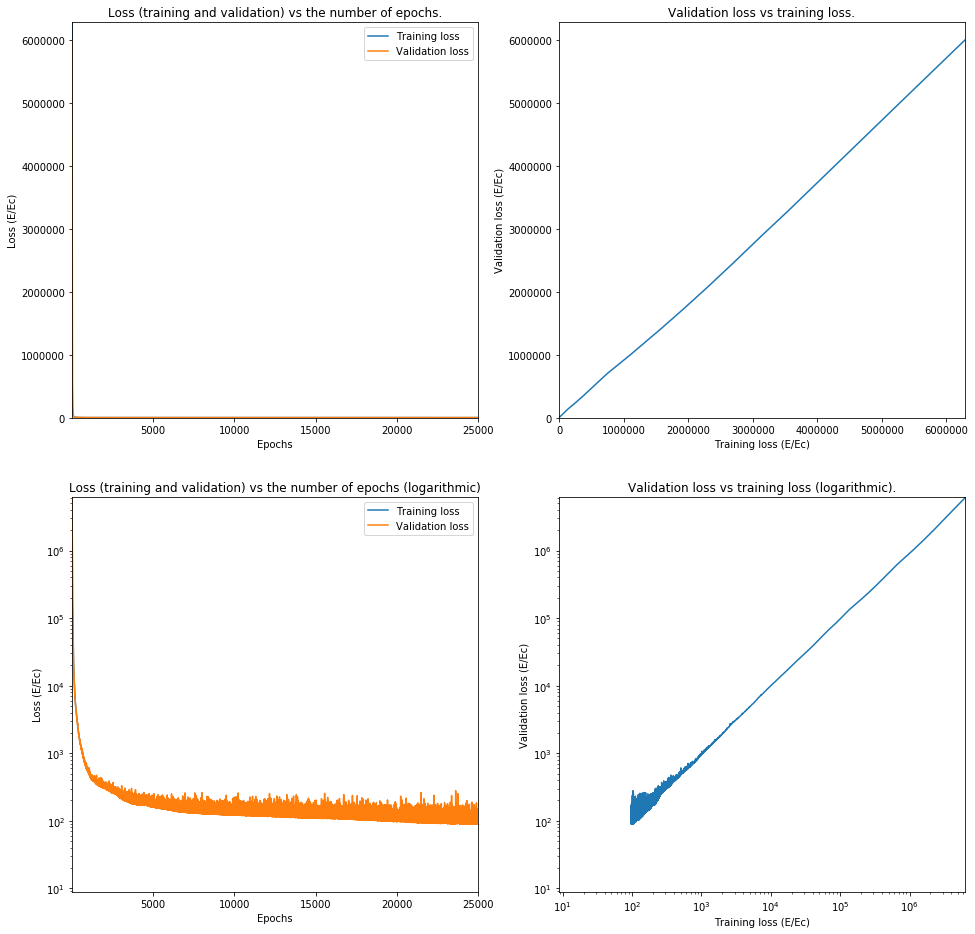

Train on 62644 samples, validate on 15662 samples
Epoch 1/25000
62644/62644 [==============================] - 2s 39us/step - loss: 4466677.8131 - val_loss: 4245100.5325
Epoch 2/25000
62644/62644 [==============================] - 2s 37us/step - loss: 4113470.2185 - val_loss: 3893688.3397
Epoch 3/25000
62644/62644 [==============================] - 2s 37us/step - loss: 3760900.3059 - val_loss: 3543544.0845
Epoch 4/25000
62644/62644 [==============================] - 2s 37us/step - loss: 3409669.2786 - val_loss: 3195389.8088
Epoch 5/25000
62644/62644 [==============================] - 2s 37us/step - loss: 3058905.6489 - val_loss: 2846749.9074
Epoch 6/25000
62644/62644 [==============================] - 2s 37us/step - loss: 2708041.8129 - val_loss: 2497911.5581
Epoch 7/25000
62644/62644 [==============================] - 2s 37us/step - loss: 2357524.0180 - val_loss: 2150995.0254
Epoch 8/25000
62644/62644 [==============================] - 2s 39us/step - loss: 2013523.3101 - val_loss: 181

Epoch 70/25000
62644/62644 [==============================] - 2s 37us/step - loss: 69007.3924 - val_loss: 68942.4148
Epoch 71/25000
62644/62644 [==============================] - 2s 37us/step - loss: 67899.8299 - val_loss: 67828.1488
Epoch 72/25000
62644/62644 [==============================] - 2s 36us/step - loss: 66746.6978 - val_loss: 66594.5780
Epoch 73/25000
62644/62644 [==============================] - 2s 36us/step - loss: 65562.6340 - val_loss: 65466.7950
Epoch 74/25000
62644/62644 [==============================] - 2s 37us/step - loss: 64329.4003 - val_loss: 64088.4890
Epoch 75/25000
62644/62644 [==============================] - 2s 39us/step - loss: 63049.3987 - val_loss: 62793.5976
Epoch 76/25000
62644/62644 [==============================] - 3s 43us/step - loss: 61714.4103 - val_loss: 61451.0820
Epoch 77/25000
62644/62644 [==============================] - 2s 39us/step - loss: 60362.9891 - val_loss: 59966.7274
Epoch 78/25000
62644/62644 [==============================] - 3s

62644/62644 [==============================] - 2s 39us/step - loss: 27621.0686 - val_loss: 27429.4707
Epoch 209/25000
62644/62644 [==============================] - 2s 39us/step - loss: 27478.3994 - val_loss: 27257.0037
Epoch 210/25000
62644/62644 [==============================] - 2s 38us/step - loss: 27321.9969 - val_loss: 27149.2163
Epoch 211/25000
62644/62644 [==============================] - 2s 37us/step - loss: 27163.2013 - val_loss: 26956.2339
Epoch 212/25000
62644/62644 [==============================] - 2s 37us/step - loss: 27015.1759 - val_loss: 26842.4445
Epoch 213/25000
62644/62644 [==============================] - 2s 37us/step - loss: 26859.8326 - val_loss: 26654.0502
Epoch 214/25000
62644/62644 [==============================] - 2s 38us/step - loss: 26715.6967 - val_loss: 26489.5816
Epoch 215/25000
62644/62644 [==============================] - 2s 38us/step - loss: 26555.7840 - val_loss: 26355.6727
Epoch 216/25000
62644/62644 [==============================] - 2s 39us/s

62644/62644 [==============================] - 2s 36us/step - loss: 11064.3499 - val_loss: 10817.2718
Epoch 347/25000
62644/62644 [==============================] - 2s 38us/step - loss: 10997.2546 - val_loss: 10747.3664
Epoch 348/25000
62644/62644 [==============================] - 2s 40us/step - loss: 10918.6298 - val_loss: 10677.1898
Epoch 349/25000
62644/62644 [==============================] - 2s 38us/step - loss: 10853.8073 - val_loss: 10589.6910
Epoch 350/25000
62644/62644 [==============================] - 2s 38us/step - loss: 10780.3825 - val_loss: 10523.3573
Epoch 351/25000
62644/62644 [==============================] - 2s 38us/step - loss: 10709.5668 - val_loss: 10448.2048
Epoch 352/25000
62644/62644 [==============================] - 3s 41us/step - loss: 10645.1020 - val_loss: 10395.1867
Epoch 353/25000
62644/62644 [==============================] - 3s 41us/step - loss: 10572.9253 - val_loss: 10327.9999
Epoch 354/25000
62644/62644 [==============================] - 2s 37us/s

Epoch 487/25000
62644/62644 [==============================] - 3s 41us/step - loss: 5267.8458 - val_loss: 5143.9387
Epoch 488/25000
62644/62644 [==============================] - 3s 42us/step - loss: 5232.9436 - val_loss: 5153.6872
Epoch 489/25000
62644/62644 [==============================] - 3s 44us/step - loss: 5206.2170 - val_loss: 5090.6325
Epoch 490/25000
62644/62644 [==============================] - 3s 41us/step - loss: 5173.2692 - val_loss: 5073.6316
Epoch 491/25000
62644/62644 [==============================] - 3s 41us/step - loss: 5148.0574 - val_loss: 5053.2816
Epoch 492/25000
62644/62644 [==============================] - 3s 41us/step - loss: 5117.0938 - val_loss: 5002.3390
Epoch 493/25000
62644/62644 [==============================] - 3s 41us/step - loss: 5091.4676 - val_loss: 5058.7322
Epoch 494/25000
62644/62644 [==============================] - 3s 41us/step - loss: 5058.7424 - val_loss: 4953.0121
Epoch 495/25000
62644/62644 [==============================] - 3s 41us/s

Epoch 628/25000
62644/62644 [==============================] - 3s 45us/step - loss: 2539.5370 - val_loss: 2533.9757
Epoch 629/25000
62644/62644 [==============================] - 2s 40us/step - loss: 2529.5604 - val_loss: 2502.7925
Epoch 630/25000
62644/62644 [==============================] - 2s 36us/step - loss: 2524.4449 - val_loss: 2491.0637
Epoch 631/25000
62644/62644 [==============================] - 2s 37us/step - loss: 2515.9311 - val_loss: 2483.5578
Epoch 632/25000
62644/62644 [==============================] - 2s 37us/step - loss: 2511.5510 - val_loss: 2484.6743
Epoch 633/25000
62644/62644 [==============================] - 2s 37us/step - loss: 2504.7912 - val_loss: 2466.8394
Epoch 634/25000
62644/62644 [==============================] - 3s 40us/step - loss: 2496.8936 - val_loss: 2461.6731
Epoch 635/25000
62644/62644 [==============================] - 3s 42us/step - loss: 2492.2616 - val_loss: 2471.2263
Epoch 636/25000
62644/62644 [==============================] - 3s 42us/s

Epoch 769/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1916.4015 - val_loss: 1894.2161
Epoch 770/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1911.6673 - val_loss: 1870.1937
Epoch 771/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1907.0176 - val_loss: 1875.1180
Epoch 772/25000
62644/62644 [==============================] - 2s 39us/step - loss: 1900.3040 - val_loss: 1881.0490
Epoch 773/25000
62644/62644 [==============================] - 2s 39us/step - loss: 1900.3334 - val_loss: 1861.3863
Epoch 774/25000
62644/62644 [==============================] - 2s 38us/step - loss: 1899.7405 - val_loss: 1889.6032
Epoch 775/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1893.2336 - val_loss: 1872.2915
Epoch 776/25000
62644/62644 [==============================] - 2s 38us/step - loss: 1889.1003 - val_loss: 1852.1488
Epoch 777/25000
62644/62644 [==============================] - 2s 37us/s

Epoch 910/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1411.9518 - val_loss: 1378.3713
Epoch 911/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1408.7103 - val_loss: 1395.2576
Epoch 912/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1407.9740 - val_loss: 1368.2165
Epoch 913/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1404.0677 - val_loss: 1363.5047
Epoch 914/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1401.7793 - val_loss: 1369.0492
Epoch 915/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1394.7577 - val_loss: 1367.1298
Epoch 916/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1397.0465 - val_loss: 1356.3625
Epoch 917/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1389.7262 - val_loss: 1356.1892
Epoch 918/25000
62644/62644 [==============================] - 2s 36us/s

62644/62644 [==============================] - 2s 36us/step - loss: 963.0273 - val_loss: 940.5583
Epoch 1051/25000
62644/62644 [==============================] - 2s 36us/step - loss: 960.0270 - val_loss: 944.9455
Epoch 1052/25000
62644/62644 [==============================] - 2s 36us/step - loss: 958.5483 - val_loss: 949.6367
Epoch 1053/25000
62644/62644 [==============================] - 2s 36us/step - loss: 954.6635 - val_loss: 929.8728
Epoch 1054/25000
62644/62644 [==============================] - 2s 35us/step - loss: 952.6795 - val_loss: 995.9318
Epoch 1055/25000
62644/62644 [==============================] - 2s 37us/step - loss: 945.5304 - val_loss: 953.9762
Epoch 1056/25000
62644/62644 [==============================] - 2s 37us/step - loss: 945.4456 - val_loss: 928.4526
Epoch 1057/25000
62644/62644 [==============================] - 2s 40us/step - loss: 940.2166 - val_loss: 925.5588
Epoch 1058/25000
62644/62644 [==============================] - 2s 40us/step - loss: 938.0792 - v

62644/62644 [==============================] - 3s 46us/step - loss: 591.5316 - val_loss: 576.1428
Epoch 1193/25000
62644/62644 [==============================] - 3s 43us/step - loss: 589.3912 - val_loss: 581.2942
Epoch 1194/25000
62644/62644 [==============================] - 3s 40us/step - loss: 587.0213 - val_loss: 590.1989
Epoch 1195/25000
62644/62644 [==============================] - 3s 40us/step - loss: 583.0818 - val_loss: 577.6243
Epoch 1196/25000
62644/62644 [==============================] - 2s 39us/step - loss: 583.5270 - val_loss: 596.5172
Epoch 1197/25000
62644/62644 [==============================] - 2s 37us/step - loss: 581.6806 - val_loss: 680.4733
Epoch 1198/25000
62644/62644 [==============================] - 2s 37us/step - loss: 579.1587 - val_loss: 563.3316
Epoch 1199/25000
62644/62644 [==============================] - 2s 35us/step - loss: 578.3010 - val_loss: 603.3999
Epoch 1200/25000
62644/62644 [==============================] - 3s 41us/step - loss: 573.7637 - v

62644/62644 [==============================] - 2s 29us/step - loss: 347.6534 - val_loss: 353.4274
Epoch 1335/25000
62644/62644 [==============================] - 2s 29us/step - loss: 348.8734 - val_loss: 356.5002
Epoch 1336/25000
62644/62644 [==============================] - 2s 29us/step - loss: 349.4903 - val_loss: 351.7443
Epoch 1337/25000
62644/62644 [==============================] - 2s 30us/step - loss: 346.1148 - val_loss: 344.0261
Epoch 1338/25000
62644/62644 [==============================] - 2s 29us/step - loss: 344.0908 - val_loss: 335.6454
Epoch 1339/25000
62644/62644 [==============================] - 2s 29us/step - loss: 340.5272 - val_loss: 371.1678
Epoch 1340/25000
62644/62644 [==============================] - 2s 31us/step - loss: 343.4993 - val_loss: 337.2648
Epoch 1341/25000
62644/62644 [==============================] - 2s 31us/step - loss: 343.0312 - val_loss: 343.5559
Epoch 1342/25000
62644/62644 [==============================] - 2s 31us/step - loss: 340.0949 - v

62644/62644 [==============================] - 2s 30us/step - loss: 261.6347 - val_loss: 278.6763
Epoch 1477/25000
62644/62644 [==============================] - 2s 29us/step - loss: 263.0244 - val_loss: 276.4370
Epoch 1478/25000
62644/62644 [==============================] - 2s 30us/step - loss: 261.9228 - val_loss: 266.5355
Epoch 1479/25000
62644/62644 [==============================] - 2s 29us/step - loss: 261.3556 - val_loss: 254.6338
Epoch 1480/25000
62644/62644 [==============================] - 2s 30us/step - loss: 258.0399 - val_loss: 254.7976
Epoch 1481/25000
62644/62644 [==============================] - 2s 29us/step - loss: 256.5226 - val_loss: 268.8544
Epoch 1482/25000
62644/62644 [==============================] - 2s 30us/step - loss: 258.5275 - val_loss: 377.1899
Epoch 1483/25000
62644/62644 [==============================] - 2s 30us/step - loss: 257.6861 - val_loss: 253.9296
Epoch 1484/25000
62644/62644 [==============================] - 2s 29us/step - loss: 257.3100 - v

62644/62644 [==============================] - 2s 30us/step - loss: 216.9261 - val_loss: 206.0037
Epoch 1619/25000
62644/62644 [==============================] - 2s 30us/step - loss: 216.6822 - val_loss: 208.0431
Epoch 1620/25000
62644/62644 [==============================] - 2s 29us/step - loss: 216.9056 - val_loss: 230.8100
Epoch 1621/25000
62644/62644 [==============================] - 2s 29us/step - loss: 215.1668 - val_loss: 213.8374
Epoch 1622/25000
62644/62644 [==============================] - 2s 29us/step - loss: 213.3886 - val_loss: 244.8234
Epoch 1623/25000
62644/62644 [==============================] - 2s 30us/step - loss: 214.3959 - val_loss: 227.0990
Epoch 1624/25000
62644/62644 [==============================] - 2s 30us/step - loss: 214.6700 - val_loss: 225.8553
Epoch 1625/25000
62644/62644 [==============================] - 2s 29us/step - loss: 215.5446 - val_loss: 207.5644
Epoch 1626/25000
62644/62644 [==============================] - 2s 30us/step - loss: 216.5403 - v

62644/62644 [==============================] - 2s 30us/step - loss: 187.6918 - val_loss: 228.5069
Epoch 1761/25000
62644/62644 [==============================] - 2s 29us/step - loss: 187.2131 - val_loss: 216.5022
Epoch 1762/25000
62644/62644 [==============================] - 2s 30us/step - loss: 186.9276 - val_loss: 175.7068
Epoch 1763/25000
62644/62644 [==============================] - 2s 30us/step - loss: 186.0323 - val_loss: 187.6671
Epoch 1764/25000
62644/62644 [==============================] - 2s 30us/step - loss: 186.8462 - val_loss: 177.6758
Epoch 1765/25000
62644/62644 [==============================] - 2s 31us/step - loss: 186.2056 - val_loss: 196.7005
Epoch 1766/25000
62644/62644 [==============================] - 2s 30us/step - loss: 185.1920 - val_loss: 185.6054
Epoch 1767/25000
62644/62644 [==============================] - 2s 29us/step - loss: 184.8003 - val_loss: 186.7340
Epoch 1768/25000
62644/62644 [==============================] - 2s 29us/step - loss: 188.2186 - v

62644/62644 [==============================] - 2s 30us/step - loss: 167.3087 - val_loss: 173.8742
Epoch 1903/25000
62644/62644 [==============================] - 2s 30us/step - loss: 167.1195 - val_loss: 164.8813
Epoch 1904/25000
62644/62644 [==============================] - 2s 29us/step - loss: 164.9606 - val_loss: 238.2659
Epoch 1905/25000
62644/62644 [==============================] - 2s 29us/step - loss: 166.4174 - val_loss: 159.4014
Epoch 1906/25000
62644/62644 [==============================] - 2s 29us/step - loss: 167.6362 - val_loss: 162.3168
Epoch 1907/25000
62644/62644 [==============================] - 2s 29us/step - loss: 166.9340 - val_loss: 164.0559
Epoch 1908/25000
62644/62644 [==============================] - 2s 29us/step - loss: 166.4949 - val_loss: 170.7716
Epoch 1909/25000
62644/62644 [==============================] - 2s 29us/step - loss: 166.7501 - val_loss: 165.4836
Epoch 1910/25000
62644/62644 [==============================] - 2s 29us/step - loss: 164.8757 - v

62644/62644 [==============================] - 2s 29us/step - loss: 153.9040 - val_loss: 161.9337
Epoch 2045/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.2690 - val_loss: 147.8475
Epoch 2046/25000
62644/62644 [==============================] - 2s 31us/step - loss: 154.0173 - val_loss: 141.9015
Epoch 2047/25000
62644/62644 [==============================] - 2s 29us/step - loss: 152.5183 - val_loss: 163.4245
Epoch 2048/25000
62644/62644 [==============================] - 2s 30us/step - loss: 152.6395 - val_loss: 144.9084
Epoch 2049/25000
62644/62644 [==============================] - 2s 29us/step - loss: 155.3006 - val_loss: 145.4814
Epoch 2050/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.2651 - val_loss: 144.0268
Epoch 2051/25000
62644/62644 [==============================] - 2s 29us/step - loss: 153.3739 - val_loss: 143.6784
Epoch 2052/25000
62644/62644 [==============================] - 2s 30us/step - loss: 151.7779 - v

62644/62644 [==============================] - 2s 29us/step - loss: 143.7424 - val_loss: 131.0369
Epoch 2187/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.0660 - val_loss: 130.7366
Epoch 2188/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.3788 - val_loss: 132.8317
Epoch 2189/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.5486 - val_loss: 139.1522
Epoch 2190/25000
62644/62644 [==============================] - 2s 30us/step - loss: 142.2059 - val_loss: 136.7026
Epoch 2191/25000
62644/62644 [==============================] - 2s 29us/step - loss: 141.4937 - val_loss: 142.8476
Epoch 2192/25000
62644/62644 [==============================] - 2s 30us/step - loss: 143.1413 - val_loss: 134.0606
Epoch 2193/25000
62644/62644 [==============================] - 2s 29us/step - loss: 143.8833 - val_loss: 129.2542
Epoch 2194/25000
62644/62644 [==============================] - 2s 29us/step - loss: 142.5446 - v

62644/62644 [==============================] - 2s 38us/step - loss: 132.0121 - val_loss: 129.0628
Epoch 2329/25000
62644/62644 [==============================] - 3s 47us/step - loss: 133.8449 - val_loss: 122.1769
Epoch 2330/25000
62644/62644 [==============================] - 3s 40us/step - loss: 134.2750 - val_loss: 129.6169
Epoch 2331/25000
62644/62644 [==============================] - 2s 38us/step - loss: 136.7974 - val_loss: 121.5429
Epoch 2332/25000
62644/62644 [==============================] - 2s 32us/step - loss: 133.5934 - val_loss: 134.2741
Epoch 2333/25000
62644/62644 [==============================] - 2s 32us/step - loss: 133.1201 - val_loss: 132.7761
Epoch 2334/25000
62644/62644 [==============================] - 2s 35us/step - loss: 133.2181 - val_loss: 145.3657
Epoch 2335/25000
62644/62644 [==============================] - 2s 35us/step - loss: 134.1802 - val_loss: 120.5750
Epoch 2336/25000
62644/62644 [==============================] - 2s 38us/step - loss: 135.8273 - v

62644/62644 [==============================] - 2s 32us/step - loss: 125.3418 - val_loss: 115.0744
Epoch 2471/25000
62644/62644 [==============================] - 2s 30us/step - loss: 128.1935 - val_loss: 113.2065
Epoch 2472/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.1724 - val_loss: 122.2356
Epoch 2473/25000
62644/62644 [==============================] - 2s 34us/step - loss: 128.2042 - val_loss: 114.2531
Epoch 2474/25000
62644/62644 [==============================] - 2s 34us/step - loss: 126.8233 - val_loss: 114.4987
Epoch 2475/25000
62644/62644 [==============================] - 2s 39us/step - loss: 128.2575 - val_loss: 175.4291
Epoch 2476/25000
62644/62644 [==============================] - 3s 41us/step - loss: 126.8693 - val_loss: 118.7085
Epoch 2477/25000
62644/62644 [==============================] - 3s 42us/step - loss: 127.6920 - val_loss: 117.8634
Epoch 2478/25000
62644/62644 [==============================] - 2s 39us/step - loss: 127.2155 - v

62644/62644 [==============================] - 2s 31us/step - loss: 117.9393 - val_loss: 111.6828
Epoch 2613/25000
62644/62644 [==============================] - 2s 30us/step - loss: 121.6216 - val_loss: 108.4454
Epoch 2614/25000
62644/62644 [==============================] - 2s 31us/step - loss: 119.2415 - val_loss: 112.9104
Epoch 2615/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.4069 - val_loss: 168.5351
Epoch 2616/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.7658 - val_loss: 104.8233
Epoch 2617/25000
62644/62644 [==============================] - 2s 31us/step - loss: 123.4973 - val_loss: 107.7532
Epoch 2618/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.4407 - val_loss: 105.1862
Epoch 2619/25000
62644/62644 [==============================] - 2s 32us/step - loss: 121.2401 - val_loss: 161.0601
Epoch 2620/25000
62644/62644 [==============================] - 2s 30us/step - loss: 121.2499 - v

62644/62644 [==============================] - 2s 30us/step - loss: 111.4781 - val_loss: 123.7608
Epoch 2755/25000
62644/62644 [==============================] - 2s 30us/step - loss: 114.0176 - val_loss: 101.3965
Epoch 2756/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.3896 - val_loss: 111.7566
Epoch 2757/25000
62644/62644 [==============================] - 2s 31us/step - loss: 112.5314 - val_loss: 111.0693
Epoch 2758/25000
62644/62644 [==============================] - 2s 32us/step - loss: 112.8244 - val_loss: 101.3033
Epoch 2759/25000
62644/62644 [==============================] - 2s 32us/step - loss: 113.1420 - val_loss: 99.9539
Epoch 2760/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.4339 - val_loss: 118.2608
Epoch 2761/25000
62644/62644 [==============================] - 2s 31us/step - loss: 111.5299 - val_loss: 115.0769
Epoch 2762/25000
62644/62644 [==============================] - 2s 31us/step - loss: 111.2032 - va

62644/62644 [==============================] - 2s 30us/step - loss: 106.3842 - val_loss: 119.9584
Epoch 2897/25000
62644/62644 [==============================] - 2s 33us/step - loss: 106.8527 - val_loss: 93.2750
Epoch 2898/25000
62644/62644 [==============================] - 2s 33us/step - loss: 105.4954 - val_loss: 94.1153
Epoch 2899/25000
62644/62644 [==============================] - 2s 32us/step - loss: 106.7743 - val_loss: 126.0954
Epoch 2900/25000
62644/62644 [==============================] - 2s 33us/step - loss: 105.4711 - val_loss: 125.9724
Epoch 2901/25000
62644/62644 [==============================] - 2s 32us/step - loss: 104.9000 - val_loss: 105.7416
Epoch 2902/25000
62644/62644 [==============================] - 2s 33us/step - loss: 106.5007 - val_loss: 124.4264
Epoch 2903/25000
62644/62644 [==============================] - 2s 32us/step - loss: 105.9533 - val_loss: 135.5247
Epoch 2904/25000
62644/62644 [==============================] - 2s 34us/step - loss: 106.0498 - val

Epoch 3039/25000
62644/62644 [==============================] - 2s 31us/step - loss: 101.5249 - val_loss: 95.1715
Epoch 3040/25000
62644/62644 [==============================] - 2s 31us/step - loss: 99.6519 - val_loss: 92.2918
Epoch 3041/25000
62644/62644 [==============================] - 2s 30us/step - loss: 101.3980 - val_loss: 86.7516
Epoch 3042/25000
62644/62644 [==============================] - 2s 30us/step - loss: 101.0031 - val_loss: 92.7065
Epoch 3043/25000
62644/62644 [==============================] - 2s 30us/step - loss: 101.5382 - val_loss: 86.2499
Epoch 3044/25000
62644/62644 [==============================] - 2s 30us/step - loss: 99.4307 - val_loss: 96.6756
Epoch 3045/25000
62644/62644 [==============================] - 2s 31us/step - loss: 100.2311 - val_loss: 98.0932
Epoch 3046/25000
62644/62644 [==============================] - 2s 30us/step - loss: 99.6505 - val_loss: 108.2433
Epoch 3047/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.8

62644/62644 [==============================] - 2s 30us/step - loss: 97.4971 - val_loss: 85.5668
Epoch 3112/25000
62644/62644 [==============================] - 2s 29us/step - loss: 97.0101 - val_loss: 88.2189
Epoch 3113/25000
62644/62644 [==============================] - 2s 29us/step - loss: 98.6941 - val_loss: 111.8743
Epoch 3114/25000
62644/62644 [==============================] - 2s 31us/step - loss: 97.0640 - val_loss: 86.4906
Epoch 3115/25000
62644/62644 [==============================] - 2s 30us/step - loss: 97.2692 - val_loss: 90.3041
Epoch 3116/25000
62644/62644 [==============================] - 2s 33us/step - loss: 96.5217 - val_loss: 95.6451
Epoch 3117/25000
62644/62644 [==============================] - 2s 33us/step - loss: 97.5313 - val_loss: 127.8403
Epoch 3118/25000
62644/62644 [==============================] - 2s 33us/step - loss: 96.5395 - val_loss: 119.2004
Epoch 3119/25000
62644/62644 [==============================] - 2s 34us/step - loss: 99.0713 - val_loss: 94.33

62644/62644 [==============================] - 2s 30us/step - loss: 93.3335 - val_loss: 97.7854
Epoch 3256/25000
62644/62644 [==============================] - 2s 31us/step - loss: 96.2717 - val_loss: 81.5736
Epoch 3257/25000
62644/62644 [==============================] - 2s 31us/step - loss: 91.5634 - val_loss: 110.7528
Epoch 3258/25000
62644/62644 [==============================] - 2s 35us/step - loss: 91.0044 - val_loss: 79.7669
Epoch 3259/25000
62644/62644 [==============================] - 2s 33us/step - loss: 92.6385 - val_loss: 92.7367
Epoch 3260/25000
62644/62644 [==============================] - 2s 31us/step - loss: 91.7714 - val_loss: 80.9377
Epoch 3261/25000
62644/62644 [==============================] - 2s 31us/step - loss: 91.6714 - val_loss: 88.1047
Epoch 3262/25000
62644/62644 [==============================] - 2s 31us/step - loss: 92.3218 - val_loss: 114.1847
Epoch 3263/25000
62644/62644 [==============================] - 2s 32us/step - loss: 91.9523 - val_loss: 86.385

62644/62644 [==============================] - 2s 30us/step - loss: 86.4361 - val_loss: 89.3548
Epoch 3400/25000
62644/62644 [==============================] - 2s 30us/step - loss: 88.9531 - val_loss: 92.3452
Epoch 3401/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.0425 - val_loss: 107.8055
Epoch 3402/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.2006 - val_loss: 78.0506
Epoch 3403/25000
62644/62644 [==============================] - 2s 32us/step - loss: 88.3110 - val_loss: 73.9912
Epoch 3404/25000
62644/62644 [==============================] - 2s 31us/step - loss: 87.5059 - val_loss: 75.6123
Epoch 3405/25000
62644/62644 [==============================] - 2s 35us/step - loss: 86.4330 - val_loss: 77.5451
Epoch 3406/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.4984 - val_loss: 97.4129
Epoch 3407/25000
62644/62644 [==============================] - 2s 30us/step - loss: 86.5112 - val_loss: 99.2798

62644/62644 [==============================] - 2s 31us/step - loss: 84.6106 - val_loss: 72.4295
Epoch 3544/25000
62644/62644 [==============================] - 2s 31us/step - loss: 83.4266 - val_loss: 69.9244
Epoch 3545/25000
62644/62644 [==============================] - 2s 30us/step - loss: 85.0714 - val_loss: 79.4586
Epoch 3546/25000
62644/62644 [==============================] - 2s 30us/step - loss: 82.2054 - val_loss: 73.4426
Epoch 3547/25000
62644/62644 [==============================] - 2s 30us/step - loss: 83.0476 - val_loss: 70.5756
Epoch 3548/25000
62644/62644 [==============================] - 2s 30us/step - loss: 85.1440 - val_loss: 68.9740
Epoch 3549/25000
62644/62644 [==============================] - 2s 30us/step - loss: 82.1673 - val_loss: 69.9016
Epoch 3550/25000
62644/62644 [==============================] - 2s 29us/step - loss: 83.5414 - val_loss: 72.6814
Epoch 3551/25000
62644/62644 [==============================] - 2s 31us/step - loss: 85.0438 - val_loss: 94.8935


62644/62644 [==============================] - 2s 32us/step - loss: 82.0122 - val_loss: 71.2581
Epoch 3688/25000
62644/62644 [==============================] - 2s 32us/step - loss: 78.3754 - val_loss: 84.6299
Epoch 3689/25000
62644/62644 [==============================] - 2s 33us/step - loss: 78.9381 - val_loss: 103.1751
Epoch 3690/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.9736 - val_loss: 68.8810
Epoch 3691/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.1818 - val_loss: 76.8916
Epoch 3692/25000
62644/62644 [==============================] - 2s 34us/step - loss: 80.3230 - val_loss: 67.3984
Epoch 3693/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.5433 - val_loss: 77.1915
Epoch 3694/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.2497 - val_loss: 71.5431
Epoch 3695/25000
62644/62644 [==============================] - 2s 33us/step - loss: 78.7827 - val_loss: 77.4294

62644/62644 [==============================] - 2s 34us/step - loss: 74.5018 - val_loss: 60.7853
Epoch 3832/25000
62644/62644 [==============================] - 2s 35us/step - loss: 76.4357 - val_loss: 73.4300
Epoch 3833/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.3592 - val_loss: 70.9784
Epoch 3834/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.7123 - val_loss: 62.1713
Epoch 3835/25000
62644/62644 [==============================] - 2s 35us/step - loss: 73.7785 - val_loss: 68.3225
Epoch 3836/25000
62644/62644 [==============================] - 2s 35us/step - loss: 73.6094 - val_loss: 63.3057
Epoch 3837/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.0519 - val_loss: 60.0946
Epoch 3838/25000
62644/62644 [==============================] - 2s 32us/step - loss: 74.4760 - val_loss: 74.9132
Epoch 3839/25000
62644/62644 [==============================] - 2s 32us/step - loss: 73.1231 - val_loss: 67.6355


62644/62644 [==============================] - 2s 33us/step - loss: 70.0789 - val_loss: 79.7225
Epoch 3976/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.5384 - val_loss: 62.3970
Epoch 3977/25000
62644/62644 [==============================] - 2s 34us/step - loss: 68.8167 - val_loss: 56.7659
Epoch 3978/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.4786 - val_loss: 58.5189
Epoch 3979/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.6513 - val_loss: 64.1346
Epoch 3980/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.5856 - val_loss: 82.5585
Epoch 3981/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.8023 - val_loss: 67.9599
Epoch 3982/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.4233 - val_loss: 94.4382
Epoch 3983/25000
62644/62644 [==============================] - 2s 33us/step - loss: 69.1484 - val_loss: 60.4730


62644/62644 [==============================] - 2s 34us/step - loss: 67.9825 - val_loss: 66.1436
Epoch 4120/25000
62644/62644 [==============================] - 2s 35us/step - loss: 65.5987 - val_loss: 69.2499
Epoch 4121/25000
62644/62644 [==============================] - 2s 34us/step - loss: 65.0163 - val_loss: 54.8495
Epoch 4122/25000
62644/62644 [==============================] - 2s 33us/step - loss: 66.6153 - val_loss: 81.8860
Epoch 4123/25000
62644/62644 [==============================] - 2s 33us/step - loss: 66.0636 - val_loss: 57.9820
Epoch 4124/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.9393 - val_loss: 69.4554
Epoch 4125/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.1153 - val_loss: 71.0142
Epoch 4126/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.4392 - val_loss: 86.5373
Epoch 4127/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.2601 - val_loss: 53.6155


62644/62644 [==============================] - 2s 34us/step - loss: 60.9411 - val_loss: 87.6775
Epoch 4264/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.9652 - val_loss: 87.3582
Epoch 4265/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.5395 - val_loss: 48.9554
Epoch 4266/25000
62644/62644 [==============================] - 2s 34us/step - loss: 61.6484 - val_loss: 128.3955
Epoch 4267/25000
62644/62644 [==============================] - 2s 34us/step - loss: 60.7141 - val_loss: 50.7785
Epoch 4268/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.4873 - val_loss: 51.1666
Epoch 4269/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.0738 - val_loss: 99.6713
Epoch 4270/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.6489 - val_loss: 59.0820
Epoch 4271/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.0100 - val_loss: 83.7867

62644/62644 [==============================] - 2s 33us/step - loss: 57.6866 - val_loss: 66.7154
Epoch 4408/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.3161 - val_loss: 51.8072
Epoch 4409/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.0397 - val_loss: 53.7185
Epoch 4410/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.5942 - val_loss: 44.4160
Epoch 4411/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.1504 - val_loss: 46.1368
Epoch 4412/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.0994 - val_loss: 55.7472
Epoch 4413/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.2469 - val_loss: 45.0282
Epoch 4414/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.2858 - val_loss: 76.2171
Epoch 4415/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.6924 - val_loss: 46.5101


62644/62644 [==============================] - 2s 34us/step - loss: 55.1028 - val_loss: 44.4986
Epoch 4552/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.6105 - val_loss: 100.9221
Epoch 4553/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.6658 - val_loss: 50.2605
Epoch 4554/25000
62644/62644 [==============================] - 2s 34us/step - loss: 55.0942 - val_loss: 42.2355
Epoch 4555/25000
62644/62644 [==============================] - 2s 36us/step - loss: 54.3454 - val_loss: 113.8534
Epoch 4556/25000
62644/62644 [==============================] - 2s 34us/step - loss: 55.6554 - val_loss: 59.2028
Epoch 4557/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.1294 - val_loss: 111.7628
Epoch 4558/25000
62644/62644 [==============================] - 2s 35us/step - loss: 54.2389 - val_loss: 49.3914
Epoch 4559/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.5715 - val_loss: 41.65

62644/62644 [==============================] - 2s 35us/step - loss: 51.8974 - val_loss: 40.9562
Epoch 4696/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.6627 - val_loss: 56.3585
Epoch 4697/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.1451 - val_loss: 44.4058
Epoch 4698/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.5571 - val_loss: 39.4525
Epoch 4699/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.4796 - val_loss: 39.0027
Epoch 4700/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.2681 - val_loss: 71.4806
Epoch 4701/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.4441 - val_loss: 65.9778
Epoch 4702/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8142 - val_loss: 54.4382
Epoch 4703/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.3028 - val_loss: 38.5743


62644/62644 [==============================] - 2s 35us/step - loss: 46.2424 - val_loss: 108.8667
Epoch 4840/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.8098 - val_loss: 94.2943
Epoch 4841/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.2859 - val_loss: 38.5488
Epoch 4842/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.9006 - val_loss: 64.7194
Epoch 4843/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.9516 - val_loss: 39.8750
Epoch 4844/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.8042 - val_loss: 45.6712
Epoch 4845/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.3018 - val_loss: 43.2408
Epoch 4846/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.6136 - val_loss: 33.1933
Epoch 4847/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.2721 - val_loss: 33.7052

62644/62644 [==============================] - 2s 36us/step - loss: 39.3492 - val_loss: 70.3747
Epoch 4984/25000
62644/62644 [==============================] - 2s 35us/step - loss: 41.2229 - val_loss: 39.0819
Epoch 4985/25000
62644/62644 [==============================] - 2s 35us/step - loss: 41.6657 - val_loss: 36.6466
Epoch 4986/25000
62644/62644 [==============================] - 2s 34us/step - loss: 41.8949 - val_loss: 53.7683
Epoch 4987/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.2201 - val_loss: 36.2906
Epoch 4988/25000
62644/62644 [==============================] - 2s 34us/step - loss: 40.6802 - val_loss: 28.7919
Epoch 4989/25000
62644/62644 [==============================] - 2s 34us/step - loss: 41.6474 - val_loss: 30.4989
Epoch 4990/25000
62644/62644 [==============================] - 2s 34us/step - loss: 41.8039 - val_loss: 40.1575
Epoch 4991/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.1796 - val_loss: 51.4889


62644/62644 [==============================] - 2s 35us/step - loss: 38.2226 - val_loss: 26.3082
Epoch 5128/25000
62644/62644 [==============================] - 2s 34us/step - loss: 39.3464 - val_loss: 29.8513
Epoch 5129/25000
62644/62644 [==============================] - 2s 35us/step - loss: 37.6441 - val_loss: 90.9233
Epoch 5130/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.5306 - val_loss: 25.5874
Epoch 5131/25000
62644/62644 [==============================] - 2s 36us/step - loss: 38.4969 - val_loss: 41.7902
Epoch 5132/25000
62644/62644 [==============================] - 2s 35us/step - loss: 38.5634 - val_loss: 32.7573
Epoch 5133/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.8547 - val_loss: 27.3652
Epoch 5134/25000
62644/62644 [==============================] - 2s 34us/step - loss: 38.6305 - val_loss: 40.2463
Epoch 5135/25000
62644/62644 [==============================] - 2s 35us/step - loss: 38.2160 - val_loss: 34.7437


62644/62644 [==============================] - 2s 35us/step - loss: 37.5353 - val_loss: 51.4676
Epoch 5272/25000
62644/62644 [==============================] - 2s 34us/step - loss: 38.0547 - val_loss: 26.1183
Epoch 5273/25000
62644/62644 [==============================] - 2s 35us/step - loss: 35.7946 - val_loss: 47.6169
Epoch 5274/25000
62644/62644 [==============================] - 2s 35us/step - loss: 34.6502 - val_loss: 26.3670
Epoch 5275/25000
62644/62644 [==============================] - 2s 35us/step - loss: 34.2728 - val_loss: 25.0452
Epoch 5276/25000
62644/62644 [==============================] - 2s 34us/step - loss: 36.6374 - val_loss: 27.4051
Epoch 5277/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.6481 - val_loss: 29.2680
Epoch 5278/25000
62644/62644 [==============================] - 2s 35us/step - loss: 34.8228 - val_loss: 33.3678
Epoch 5279/25000
62644/62644 [==============================] - 2s 35us/step - loss: 37.2371 - val_loss: 31.6746


62644/62644 [==============================] - 2s 35us/step - loss: 35.9955 - val_loss: 34.4921
Epoch 5416/25000
62644/62644 [==============================] - 2s 35us/step - loss: 32.7229 - val_loss: 41.9763
Epoch 5417/25000
62644/62644 [==============================] - 2s 35us/step - loss: 35.2415 - val_loss: 40.2475
Epoch 5418/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.1584 - val_loss: 22.4920
Epoch 5419/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.7049 - val_loss: 54.7877
Epoch 5420/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.6222 - val_loss: 51.4368
Epoch 5421/25000
62644/62644 [==============================] - 2s 34us/step - loss: 36.2168 - val_loss: 22.9129
Epoch 5422/25000
62644/62644 [==============================] - 2s 35us/step - loss: 34.0778 - val_loss: 39.7262
Epoch 5423/25000
62644/62644 [==============================] - 2s 35us/step - loss: 33.8806 - val_loss: 27.3261


62644/62644 [==============================] - 2s 33us/step - loss: 31.6127 - val_loss: 111.5708
Epoch 5560/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.5107 - val_loss: 32.7852
Epoch 5561/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.3219 - val_loss: 44.2448
Epoch 5562/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.0278 - val_loss: 38.3761
Epoch 5563/25000
62644/62644 [==============================] - 2s 34us/step - loss: 31.3176 - val_loss: 25.9985
Epoch 5564/25000
62644/62644 [==============================] - 2s 35us/step - loss: 32.5188 - val_loss: 20.1499
Epoch 5565/25000
62644/62644 [==============================] - 2s 34us/step - loss: 31.3085 - val_loss: 29.7216
Epoch 5566/25000
62644/62644 [==============================] - 2s 35us/step - loss: 31.4388 - val_loss: 22.1083
Epoch 5567/25000
62644/62644 [==============================] - 2s 34us/step - loss: 32.6271 - val_loss: 35.3086

62644/62644 [==============================] - 2s 35us/step - loss: 30.6684 - val_loss: 35.5918
Epoch 5704/25000
62644/62644 [==============================] - 2s 34us/step - loss: 31.3017 - val_loss: 40.6184
Epoch 5705/25000
62644/62644 [==============================] - 2s 33us/step - loss: 29.5350 - val_loss: 21.8115
Epoch 5706/25000
62644/62644 [==============================] - 2s 33us/step - loss: 30.1493 - val_loss: 21.2071
Epoch 5707/25000
62644/62644 [==============================] - 2s 35us/step - loss: 30.5330 - val_loss: 40.6217
Epoch 5708/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.5366 - val_loss: 36.4333
Epoch 5709/25000
62644/62644 [==============================] - 2s 33us/step - loss: 30.5247 - val_loss: 24.1851
Epoch 5710/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.6583 - val_loss: 21.3648
Epoch 5711/25000
62644/62644 [==============================] - 2s 33us/step - loss: 29.3480 - val_loss: 25.6263


62644/62644 [==============================] - 2s 34us/step - loss: 29.0336 - val_loss: 23.9735
Epoch 5848/25000
62644/62644 [==============================] - 2s 34us/step - loss: 28.4464 - val_loss: 63.3241
Epoch 5849/25000
62644/62644 [==============================] - 2s 34us/step - loss: 30.7660 - val_loss: 23.7848
Epoch 5850/25000
62644/62644 [==============================] - 2s 34us/step - loss: 28.3199 - val_loss: 19.2248
Epoch 5851/25000
62644/62644 [==============================] - 2s 34us/step - loss: 29.7175 - val_loss: 28.3821
Epoch 5852/25000
62644/62644 [==============================] - 2s 35us/step - loss: 29.7849 - val_loss: 15.8460
Epoch 5853/25000
62644/62644 [==============================] - 2s 34us/step - loss: 30.9718 - val_loss: 21.7820
Epoch 5854/25000
62644/62644 [==============================] - 2s 33us/step - loss: 30.8210 - val_loss: 61.3117
Epoch 5855/25000
62644/62644 [==============================] - 2s 33us/step - loss: 28.5410 - val_loss: 16.9917


62644/62644 [==============================] - 2s 34us/step - loss: 28.9118 - val_loss: 69.2903
Epoch 5992/25000
62644/62644 [==============================] - 2s 33us/step - loss: 26.8309 - val_loss: 22.9619
Epoch 5993/25000
62644/62644 [==============================] - 2s 34us/step - loss: 26.8232 - val_loss: 21.7449
Epoch 5994/25000
62644/62644 [==============================] - 2s 33us/step - loss: 27.8570 - val_loss: 24.9733
Epoch 5995/25000
62644/62644 [==============================] - 2s 33us/step - loss: 26.0567 - val_loss: 16.2065
Epoch 5996/25000
62644/62644 [==============================] - 2s 32us/step - loss: 27.5009 - val_loss: 23.2128
Epoch 5997/25000
62644/62644 [==============================] - 2s 34us/step - loss: 28.5488 - val_loss: 20.3596
Epoch 5998/25000
62644/62644 [==============================] - 2s 34us/step - loss: 29.1931 - val_loss: 21.5005
Epoch 5999/25000
62644/62644 [==============================] - 2s 33us/step - loss: 26.7285 - val_loss: 18.3978


62644/62644 [==============================] - 2s 33us/step - loss: 26.9695 - val_loss: 37.5758
Epoch 6136/25000
62644/62644 [==============================] - 2s 33us/step - loss: 26.2981 - val_loss: 25.2579
Epoch 6137/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.8375 - val_loss: 27.2083
Epoch 6138/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.9138 - val_loss: 21.3612
Epoch 6139/25000
62644/62644 [==============================] - 2s 33us/step - loss: 24.7834 - val_loss: 25.2874
Epoch 6140/25000
62644/62644 [==============================] - 2s 33us/step - loss: 28.3549 - val_loss: 18.7235
Epoch 6141/25000
62644/62644 [==============================] - 2s 33us/step - loss: 27.7935 - val_loss: 19.1361
Epoch 6142/25000
62644/62644 [==============================] - 2s 34us/step - loss: 26.3324 - val_loss: 72.0185
Epoch 6143/25000
62644/62644 [==============================] - 2s 35us/step - loss: 27.2830 - val_loss: 19.8229


62644/62644 [==============================] - 2s 32us/step - loss: 26.6799 - val_loss: 11.5699
Epoch 6280/25000
62644/62644 [==============================] - 2s 33us/step - loss: 26.4218 - val_loss: 36.8371
Epoch 6281/25000
62644/62644 [==============================] - 2s 33us/step - loss: 27.6211 - val_loss: 33.0831
Epoch 6282/25000
62644/62644 [==============================] - 2s 32us/step - loss: 27.1739 - val_loss: 14.6613
Epoch 6283/25000
62644/62644 [==============================] - 2s 32us/step - loss: 24.7942 - val_loss: 26.4147
Epoch 6284/25000
62644/62644 [==============================] - 2s 33us/step - loss: 26.3537 - val_loss: 26.2036
Epoch 6285/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.2154 - val_loss: 17.7226
Epoch 6286/25000
62644/62644 [==============================] - 2s 33us/step - loss: 27.0224 - val_loss: 20.2086
Epoch 6287/25000
62644/62644 [==============================] - 2s 32us/step - loss: 26.6822 - val_loss: 16.7255


62644/62644 [==============================] - 2s 34us/step - loss: 24.9741 - val_loss: 17.3946
Epoch 6424/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.5660 - val_loss: 22.5254
Epoch 6425/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.7249 - val_loss: 12.3946
Epoch 6426/25000
62644/62644 [==============================] - 2s 33us/step - loss: 22.2493 - val_loss: 11.3358
Epoch 6427/25000
62644/62644 [==============================] - 2s 34us/step - loss: 25.0303 - val_loss: 11.5594
Epoch 6428/25000
62644/62644 [==============================] - 2s 33us/step - loss: 24.3573 - val_loss: 49.1339
Epoch 6429/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.4180 - val_loss: 13.2152
Epoch 6430/25000
62644/62644 [==============================] - 2s 33us/step - loss: 25.3826 - val_loss: 13.9370
Epoch 6431/25000
62644/62644 [==============================] - 2s 34us/step - loss: 26.0184 - val_loss: 73.6399


62644/62644 [==============================] - 2s 36us/step - loss: 25.2091 - val_loss: 20.7162
Epoch 6568/25000
62644/62644 [==============================] - 2s 36us/step - loss: 25.7735 - val_loss: 14.5181
Epoch 6569/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.3160 - val_loss: 42.7488
Epoch 6570/25000
62644/62644 [==============================] - 2s 36us/step - loss: 24.8429 - val_loss: 16.8213
Epoch 6571/25000
62644/62644 [==============================] - 2s 35us/step - loss: 27.7355 - val_loss: 14.4448
Epoch 6572/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.3157 - val_loss: 12.2950
Epoch 6573/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.1069 - val_loss: 28.6579
Epoch 6574/25000
62644/62644 [==============================] - 2s 37us/step - loss: 27.7698 - val_loss: 30.3614
Epoch 6575/25000
62644/62644 [==============================] - 2s 36us/step - loss: 25.4243 - val_loss: 76.8173


62644/62644 [==============================] - 2s 36us/step - loss: 23.2366 - val_loss: 10.9382
Epoch 6712/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.8820 - val_loss: 38.2783
Epoch 6713/25000
62644/62644 [==============================] - 2s 36us/step - loss: 24.7656 - val_loss: 27.0824
Epoch 6714/25000
62644/62644 [==============================] - 2s 39us/step - loss: 22.0005 - val_loss: 20.7297
Epoch 6715/25000
62644/62644 [==============================] - 3s 45us/step - loss: 26.9174 - val_loss: 12.6429
Epoch 6716/25000
62644/62644 [==============================] - 3s 43us/step - loss: 24.6554 - val_loss: 9.1322
Epoch 6717/25000
62644/62644 [==============================] - 3s 43us/step - loss: 26.2335 - val_loss: 39.6508
Epoch 6718/25000
62644/62644 [==============================] - 3s 47us/step - loss: 23.1223 - val_loss: 68.2358
Epoch 6719/25000
62644/62644 [==============================] - 3s 42us/step - loss: 25.6039 - val_loss: 18.6422
E

62644/62644 [==============================] - 2s 40us/step - loss: 25.7534 - val_loss: 16.8252
Epoch 6856/25000
62644/62644 [==============================] - 3s 41us/step - loss: 25.1451 - val_loss: 41.6823
Epoch 6857/25000
62644/62644 [==============================] - 3s 40us/step - loss: 25.4448 - val_loss: 77.9986
Epoch 6858/25000
62644/62644 [==============================] - 3s 40us/step - loss: 25.2969 - val_loss: 34.1199
Epoch 6859/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.6789 - val_loss: 17.8091
Epoch 6860/25000
62644/62644 [==============================] - 2s 39us/step - loss: 25.9029 - val_loss: 15.6088
Epoch 6861/25000
62644/62644 [==============================] - 2s 40us/step - loss: 21.2795 - val_loss: 19.9504
Epoch 6862/25000
62644/62644 [==============================] - 3s 41us/step - loss: 26.8110 - val_loss: 21.5990
Epoch 6863/25000
62644/62644 [==============================] - 3s 40us/step - loss: 24.1195 - val_loss: 16.3823


62644/62644 [==============================] - 3s 40us/step - loss: 22.6796 - val_loss: 46.0517
Epoch 7000/25000
62644/62644 [==============================] - 2s 40us/step - loss: 26.7730 - val_loss: 12.4816
Epoch 7001/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.8572 - val_loss: 9.2887
Epoch 7002/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.3791 - val_loss: 11.0371
Epoch 7003/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.0791 - val_loss: 41.4501
Epoch 7004/25000
62644/62644 [==============================] - 2s 40us/step - loss: 24.5307 - val_loss: 11.9535
Epoch 7005/25000
62644/62644 [==============================] - 2s 39us/step - loss: 23.6003 - val_loss: 30.1963
Epoch 7006/25000
62644/62644 [==============================] - 2s 39us/step - loss: 25.6389 - val_loss: 28.2060
Epoch 7007/25000
62644/62644 [==============================] - 3s 40us/step - loss: 24.7011 - val_loss: 29.5893
E

62644/62644 [==============================] - 2s 39us/step - loss: 21.4373 - val_loss: 10.1555
Epoch 7144/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.0589 - val_loss: 34.8940
Epoch 7145/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.2695 - val_loss: 38.9696
Epoch 7146/25000
62644/62644 [==============================] - 2s 39us/step - loss: 22.4181 - val_loss: 45.5609
Epoch 7147/25000
62644/62644 [==============================] - 2s 39us/step - loss: 25.4887 - val_loss: 23.5525
Epoch 7148/25000
62644/62644 [==============================] - 2s 39us/step - loss: 23.4057 - val_loss: 14.7166
Epoch 7149/25000
62644/62644 [==============================] - 2s 39us/step - loss: 20.7196 - val_loss: 72.0061
Epoch 7150/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.4342 - val_loss: 48.3326
Epoch 7151/25000
62644/62644 [==============================] - 2s 40us/step - loss: 25.2342 - val_loss: 18.1833


62644/62644 [==============================] - 2s 37us/step - loss: 24.9956 - val_loss: 16.5164
Epoch 7288/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.9813 - val_loss: 13.9850
Epoch 7289/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.3004 - val_loss: 11.1807
Epoch 7290/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.3103 - val_loss: 8.8248
Epoch 7291/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.8312 - val_loss: 135.0195
Epoch 7292/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.9710 - val_loss: 16.6652
Epoch 7293/25000
62644/62644 [==============================] - 2s 37us/step - loss: 26.3362 - val_loss: 67.8808
Epoch 7294/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.9016 - val_loss: 56.8389
Epoch 7295/25000
62644/62644 [==============================] - 2s 38us/step - loss: 25.0663 - val_loss: 67.2704


62644/62644 [==============================] - 2s 37us/step - loss: 23.2413 - val_loss: 68.6770
Epoch 7432/25000
62644/62644 [==============================] - 2s 37us/step - loss: 26.8961 - val_loss: 13.7427
Epoch 7433/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.0188 - val_loss: 13.7971
Epoch 7434/25000
62644/62644 [==============================] - 2s 36us/step - loss: 23.8680 - val_loss: 27.0362
Epoch 7435/25000
62644/62644 [==============================] - 2s 36us/step - loss: 23.6594 - val_loss: 10.6557
Epoch 7436/25000
62644/62644 [==============================] - 2s 36us/step - loss: 21.6600 - val_loss: 12.6597
Epoch 7437/25000
62644/62644 [==============================] - 2s 36us/step - loss: 23.3166 - val_loss: 12.4253
Epoch 7438/25000
62644/62644 [==============================] - 2s 36us/step - loss: 23.3335 - val_loss: 46.3022
Epoch 7439/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.0746 - val_loss: 16.6465


62644/62644 [==============================] - 2s 37us/step - loss: 24.5063 - val_loss: 21.0131
Epoch 7576/25000
62644/62644 [==============================] - 2s 36us/step - loss: 25.1492 - val_loss: 10.3485
Epoch 7577/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.9486 - val_loss: 12.8641
Epoch 7578/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.6852 - val_loss: 39.0199
Epoch 7579/25000
62644/62644 [==============================] - 2s 36us/step - loss: 24.3043 - val_loss: 34.0608
Epoch 7580/25000
62644/62644 [==============================] - 2s 36us/step - loss: 22.1749 - val_loss: 30.1584
Epoch 7581/25000
62644/62644 [==============================] - 2s 37us/step - loss: 22.5050 - val_loss: 49.0643
Epoch 7582/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.4778 - val_loss: 20.7895
Epoch 7583/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.3033 - val_loss: 27.7160


62644/62644 [==============================] - 2s 36us/step - loss: 23.6651 - val_loss: 32.9398
Epoch 7720/25000
62644/62644 [==============================] - 2s 36us/step - loss: 23.7406 - val_loss: 92.3085
Epoch 7721/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.1437 - val_loss: 23.9627
Epoch 7722/25000
62644/62644 [==============================] - 2s 39us/step - loss: 23.3521 - val_loss: 32.8885
Epoch 7723/25000
62644/62644 [==============================] - 2s 34us/step - loss: 23.7970 - val_loss: 17.0185
Epoch 7724/25000
62644/62644 [==============================] - 2s 36us/step - loss: 25.8087 - val_loss: 13.0531
Epoch 7725/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.5778 - val_loss: 18.2393
Epoch 7726/25000
62644/62644 [==============================] - 2s 36us/step - loss: 25.1831 - val_loss: 17.9683
Epoch 7727/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.9421 - val_loss: 15.4986


62644/62644 [==============================] - 2s 38us/step - loss: 22.4706 - val_loss: 15.6790
Epoch 7864/25000
62644/62644 [==============================] - 2s 38us/step - loss: 22.6227 - val_loss: 17.2784
Epoch 7865/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.0290 - val_loss: 8.2904
Epoch 7866/25000
62644/62644 [==============================] - 3s 41us/step - loss: 24.6543 - val_loss: 20.6652
Epoch 7867/25000
62644/62644 [==============================] - 3s 40us/step - loss: 22.0659 - val_loss: 26.2304
Epoch 7868/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.4658 - val_loss: 9.0659
Epoch 7869/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.1499 - val_loss: 9.0231
Epoch 7870/25000
62644/62644 [==============================] - 2s 36us/step - loss: 24.7612 - val_loss: 48.9528
Epoch 7871/25000
62644/62644 [==============================] - 2s 36us/step - loss: 27.1687 - val_loss: 10.7970
Epo

62644/62644 [==============================] - 3s 43us/step - loss: 23.5150 - val_loss: 34.5212
Epoch 8008/25000
62644/62644 [==============================] - 3s 41us/step - loss: 25.1206 - val_loss: 6.7858
Epoch 8009/25000
62644/62644 [==============================] - 3s 42us/step - loss: 23.7858 - val_loss: 17.1204
Epoch 8010/25000
62644/62644 [==============================] - 3s 44us/step - loss: 24.4452 - val_loss: 17.2920
Epoch 8011/25000
62644/62644 [==============================] - 3s 43us/step - loss: 22.7493 - val_loss: 13.9479
Epoch 8012/25000
62644/62644 [==============================] - 3s 42us/step - loss: 24.0258 - val_loss: 9.7497
Epoch 8013/25000
62644/62644 [==============================] - 3s 42us/step - loss: 21.7711 - val_loss: 11.6382
Epoch 8014/25000
62644/62644 [==============================] - 3s 42us/step - loss: 23.6981 - val_loss: 13.8640
Epoch 8015/25000
62644/62644 [==============================] - 3s 41us/step - loss: 23.5912 - val_loss: 18.6206
Ep

Epoch 8080/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.4545 - val_loss: 13.3065
Epoch 8081/25000
62644/62644 [==============================] - 2s 39us/step - loss: 23.9450 - val_loss: 15.6089
Epoch 8082/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.3677 - val_loss: 19.6823
Epoch 8083/25000
62644/62644 [==============================] - 2s 38us/step - loss: 22.8984 - val_loss: 7.2766
Epoch 8084/25000
62644/62644 [==============================] - 2s 38us/step - loss: 21.6134 - val_loss: 26.7813
Epoch 8085/25000
62644/62644 [==============================] - 2s 40us/step - loss: 26.2403 - val_loss: 7.1653
Epoch 8086/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.1577 - val_loss: 32.2465
Epoch 8087/25000
62644/62644 [==============================] - 2s 35us/step - loss: 22.9284 - val_loss: 42.8938
Epoch 8088/25000
62644/62644 [==============================] - 2s 33us/step - loss: 22.4273 - val

Epoch 8225/25000
62644/62644 [==============================] - 2s 36us/step - loss: 22.7708 - val_loss: 40.0873
Epoch 8226/25000
62644/62644 [==============================] - 2s 34us/step - loss: 21.5285 - val_loss: 10.5524
Epoch 8227/25000
62644/62644 [==============================] - 2s 36us/step - loss: 23.1133 - val_loss: 14.9251
Epoch 8228/25000
62644/62644 [==============================] - 2s 39us/step - loss: 24.2721 - val_loss: 7.0223
Epoch 8229/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.2940 - val_loss: 40.4491
Epoch 8230/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.3690 - val_loss: 37.8960
Epoch 8231/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.5068 - val_loss: 22.7839
Epoch 8232/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.6470 - val_loss: 8.9385
Epoch 8233/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.0871 - val

62644/62644 [==============================] - 2s 37us/step - loss: 23.2479 - val_loss: 11.3934
Epoch 8370/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.3775 - val_loss: 7.9075
Epoch 8371/25000
62644/62644 [==============================] - 2s 37us/step - loss: 27.6983 - val_loss: 13.0935
Epoch 8372/25000
62644/62644 [==============================] - 2s 37us/step - loss: 28.1068 - val_loss: 9.8470
Epoch 8373/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.1111 - val_loss: 21.5532
Epoch 8374/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.2222 - val_loss: 15.3080
Epoch 8375/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.1264 - val_loss: 42.7520
Epoch 8376/25000
62644/62644 [==============================] - 2s 37us/step - loss: 21.7591 - val_loss: 9.7497
Epoch 8377/25000
62644/62644 [==============================] - 2s 37us/step - loss: 22.3112 - val_loss: 25.6893
Epo

Epoch 8442/25000
62644/62644 [==============================] - 2s 37us/step - loss: 22.4015 - val_loss: 42.1510
Epoch 8443/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.6798 - val_loss: 27.0217
Epoch 8444/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.4740 - val_loss: 18.8224
Epoch 8445/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.7957 - val_loss: 51.5981
Epoch 8446/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.2836 - val_loss: 20.9029
Epoch 8447/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.9143 - val_loss: 56.9970
Epoch 8448/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.5732 - val_loss: 18.9488
Epoch 8449/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.8162 - val_loss: 30.3138
Epoch 8450/25000
62644/62644 [==============================] - 2s 38us/step - loss: 22.8640 - v

62644/62644 [==============================] - 2s 38us/step - loss: 27.0366 - val_loss: 17.8746
Epoch 8587/25000
62644/62644 [==============================] - 2s 38us/step - loss: 22.9256 - val_loss: 9.0718
Epoch 8588/25000
62644/62644 [==============================] - 2s 37us/step - loss: 22.6535 - val_loss: 16.7316
Epoch 8589/25000
62644/62644 [==============================] - 2s 38us/step - loss: 27.0616 - val_loss: 8.7462
Epoch 8590/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.0147 - val_loss: 36.7764
Epoch 8591/25000
62644/62644 [==============================] - 2s 38us/step - loss: 23.7950 - val_loss: 28.6050
Epoch 8592/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.7779 - val_loss: 21.0675
Epoch 8593/25000
62644/62644 [==============================] - 2s 38us/step - loss: 25.0180 - val_loss: 22.4831
Epoch 8594/25000
62644/62644 [==============================] - 2s 38us/step - loss: 26.5436 - val_loss: 32.8589
Ep

62644/62644 [==============================] - 2s 40us/step - loss: 26.0363 - val_loss: 15.9732
Epoch 8731/25000
62644/62644 [==============================] - 2s 38us/step - loss: 27.7536 - val_loss: 23.4036
Epoch 8732/25000
62644/62644 [==============================] - 2s 38us/step - loss: 22.8977 - val_loss: 7.6332
Epoch 8733/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.2698 - val_loss: 17.3818
Epoch 8734/25000
62644/62644 [==============================] - 2s 38us/step - loss: 22.0725 - val_loss: 9.6036
Epoch 8735/25000
62644/62644 [==============================] - 2s 38us/step - loss: 24.2611 - val_loss: 18.8288
Epoch 8736/25000
62644/62644 [==============================] - 2s 37us/step - loss: 23.2323 - val_loss: 10.7933
Epoch 8737/25000
62644/62644 [==============================] - 2s 37us/step - loss: 24.2056 - val_loss: 28.6960
Epoch 8738/25000
62644/62644 [==============================] - 2s 37us/step - loss: 25.6958 - val_loss: 18.3245
Ep

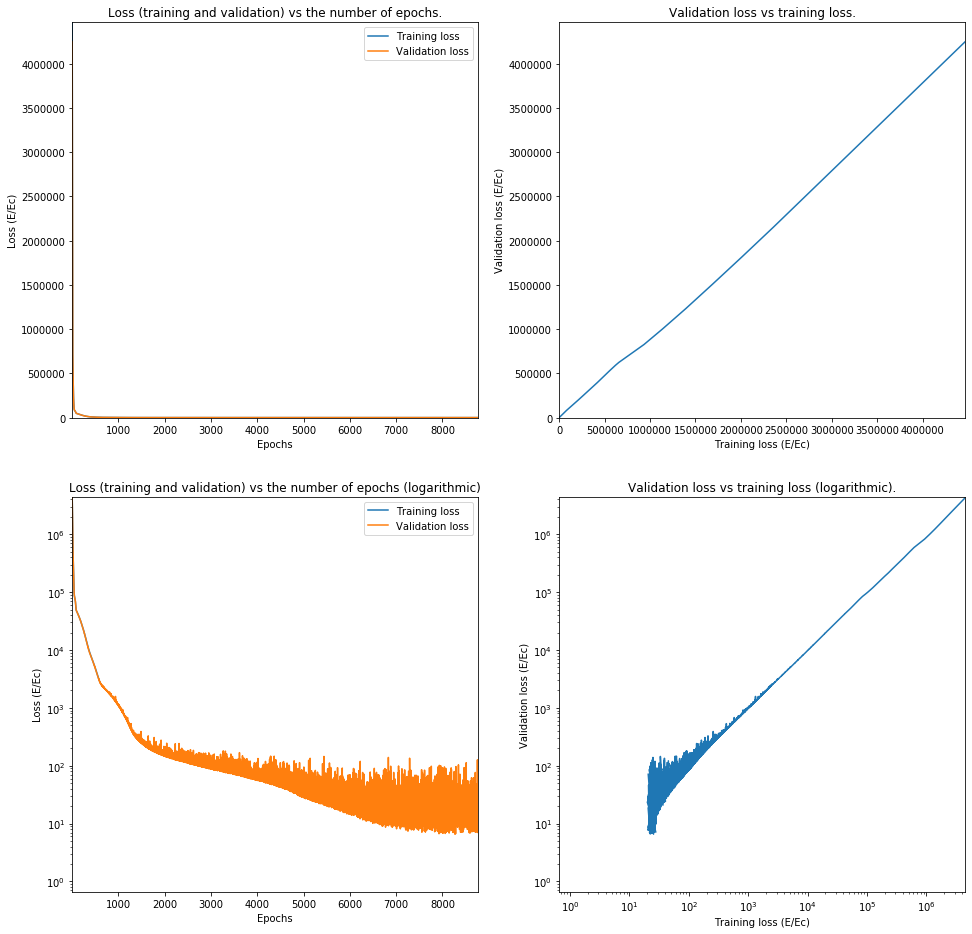

Train on 62644 samples, validate on 15662 samples
Epoch 1/25000
62644/62644 [==============================] - 3s 44us/step - loss: 384719.3941 - val_loss: 361807.6400
Epoch 2/25000
62644/62644 [==============================] - 3s 44us/step - loss: 336562.5325 - val_loss: 315288.9576
Epoch 3/25000
62644/62644 [==============================] - 3s 44us/step - loss: 291528.1876 - val_loss: 271588.5175
Epoch 4/25000
62644/62644 [==============================] - 3s 44us/step - loss: 249255.8023 - val_loss: 230644.6292
Epoch 5/25000
62644/62644 [==============================] - 3s 44us/step - loss: 209819.2405 - val_loss: 192593.6292
Epoch 6/25000
62644/62644 [==============================] - 2s 38us/step - loss: 173325.2226 - val_loss: 157443.9748
Epoch 7/25000
62644/62644 [==============================] - 2s 38us/step - loss: 139512.3095 - val_loss: 124692.4954
Epoch 8/25000
62644/62644 [==============================] - 3s 41us/step - loss: 108458.8141 - val_loss: 95046.0507
Epoch 9

62644/62644 [==============================] - 3s 40us/step - loss: 13.3220 - val_loss: 19.7151
Epoch 147/25000
62644/62644 [==============================] - 3s 41us/step - loss: 13.3336 - val_loss: 19.7181
Epoch 148/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.3239 - val_loss: 19.8863
Epoch 149/25000
62644/62644 [==============================] - 3s 40us/step - loss: 13.3176 - val_loss: 19.7421
Epoch 150/25000
62644/62644 [==============================] - 3s 41us/step - loss: 13.3420 - val_loss: 19.7175
Epoch 151/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.3092 - val_loss: 19.7534
Epoch 152/25000
62644/62644 [==============================] - 2s 40us/step - loss: 13.3202 - val_loss: 19.9104
Epoch 153/25000
62644/62644 [==============================] - 3s 40us/step - loss: 13.3258 - val_loss: 19.7368
Epoch 154/25000
62644/62644 [==============================] - 3s 41us/step - loss: 13.3185 - val_loss: 19.7266
Epoch 15

62644/62644 [==============================] - 2s 39us/step - loss: 13.2658 - val_loss: 19.7108
Epoch 293/25000
62644/62644 [==============================] - 2s 38us/step - loss: 13.2659 - val_loss: 19.7099
Epoch 294/25000
62644/62644 [==============================] - 2s 38us/step - loss: 13.2633 - val_loss: 19.7235
Epoch 295/25000
62644/62644 [==============================] - 2s 38us/step - loss: 13.2638 - val_loss: 19.7100
Epoch 296/25000
62644/62644 [==============================] - 2s 38us/step - loss: 13.2623 - val_loss: 19.7112
Epoch 297/25000
62644/62644 [==============================] - 2s 38us/step - loss: 13.2612 - val_loss: 19.7148
Epoch 298/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.2644 - val_loss: 19.7219
Epoch 299/25000
62644/62644 [==============================] - 3s 40us/step - loss: 13.2621 - val_loss: 19.7150
Epoch 300/25000
62644/62644 [==============================] - 2s 40us/step - loss: 13.2654 - val_loss: 19.7093
Epoch 30

62644/62644 [==============================] - 2s 38us/step - loss: 13.2579 - val_loss: 19.7057
Epoch 439/25000
62644/62644 [==============================] - 2s 40us/step - loss: 13.2594 - val_loss: 19.7078
Epoch 440/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.2578 - val_loss: 19.7072
Epoch 441/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.2578 - val_loss: 19.7094
Epoch 442/25000
62644/62644 [==============================] - 2s 38us/step - loss: 13.2584 - val_loss: 19.7088
Epoch 443/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.2584 - val_loss: 19.7087
Epoch 444/25000
62644/62644 [==============================] - 2s 40us/step - loss: 13.2580 - val_loss: 19.7093
Epoch 445/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.2581 - val_loss: 19.7060
Epoch 446/25000
62644/62644 [==============================] - 2s 39us/step - loss: 13.2580 - val_loss: 19.7061
Epoch 44

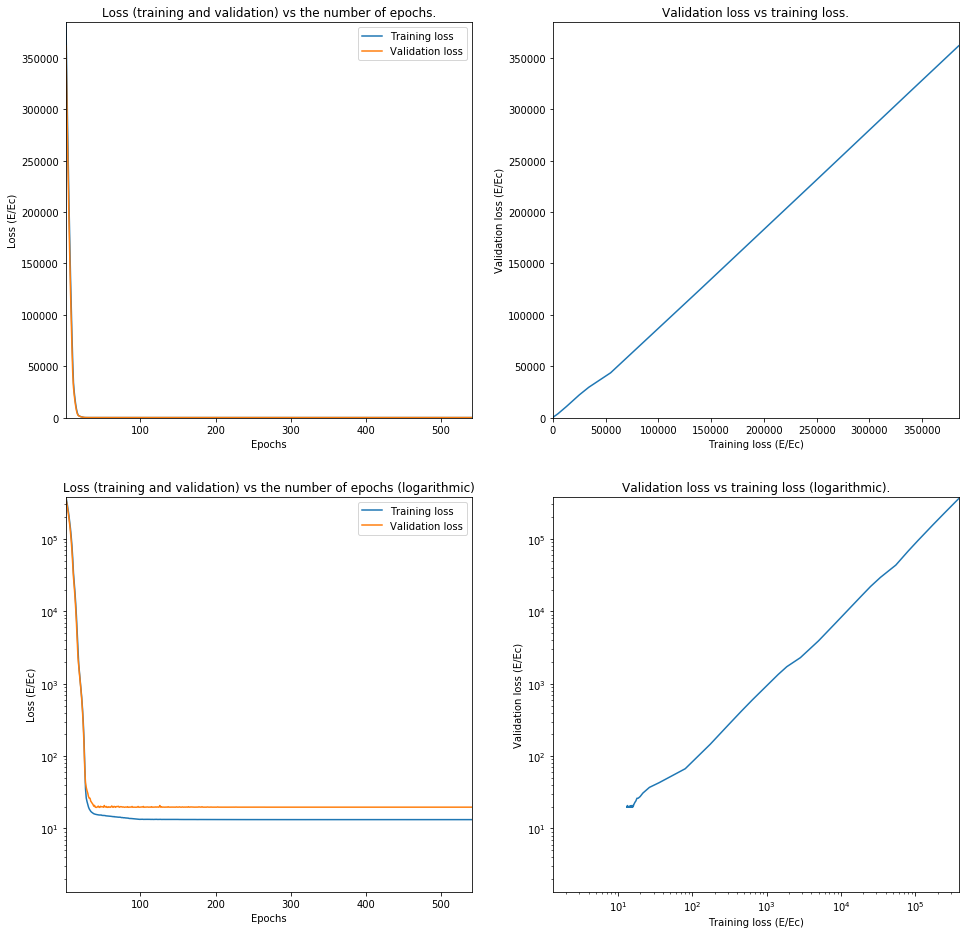

In [20]:
name = 'DenseLayerSmallSoftplus'
settingsNetwork = [inputSize, ['Dense', inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=25000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

19576/19576 [==============================] - 0s 13us/step
7.52257711681776


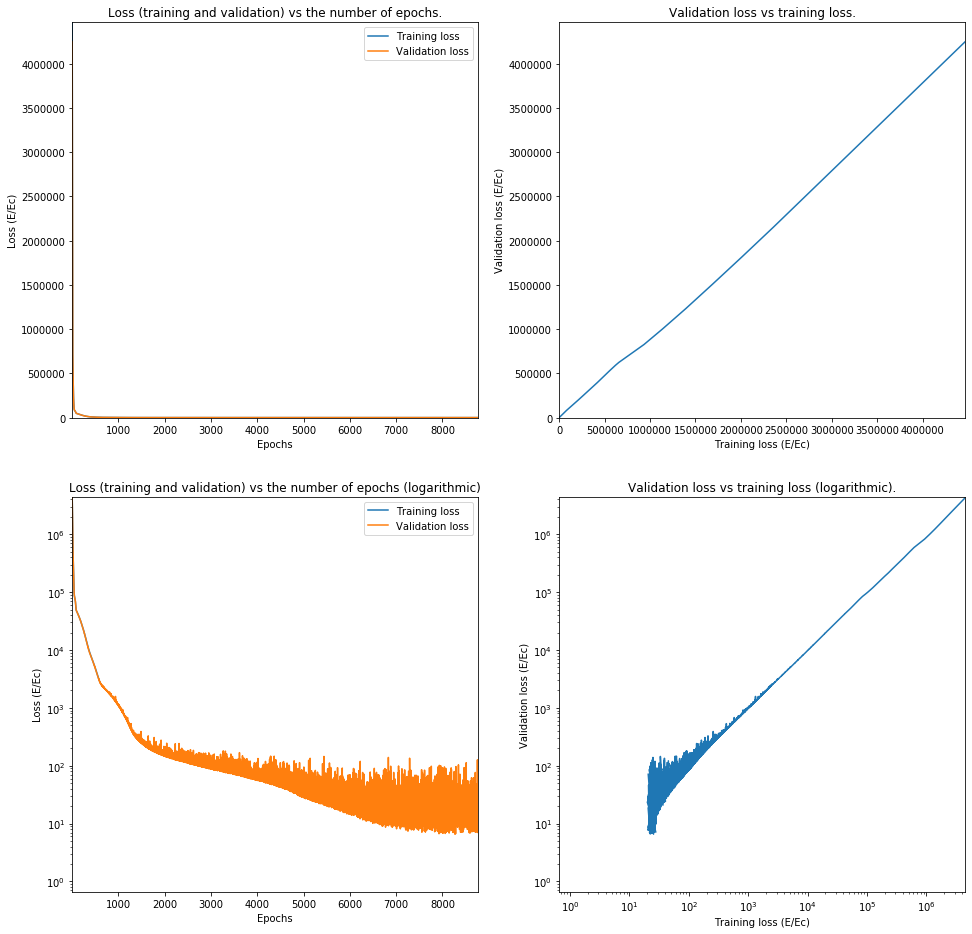

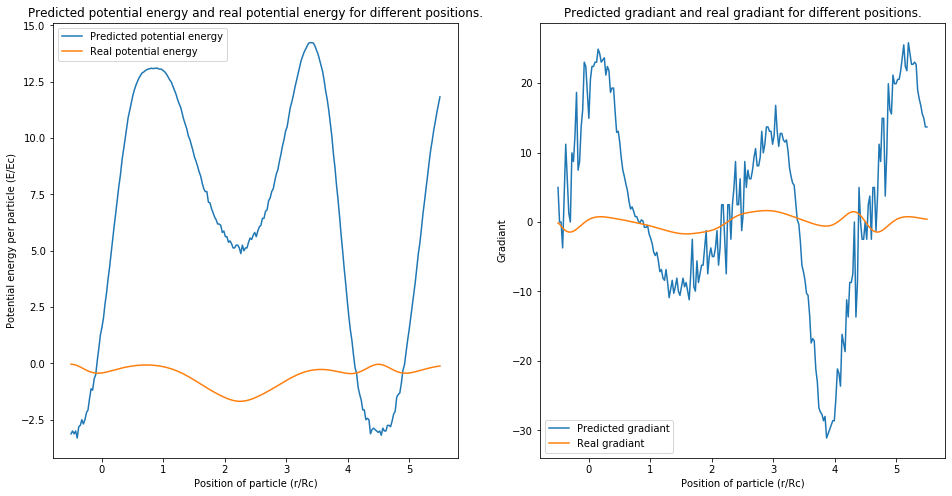

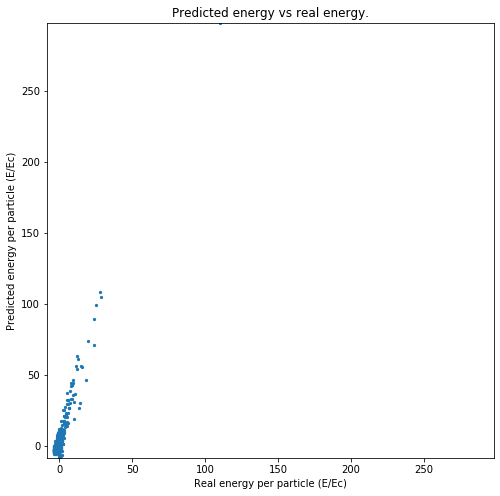

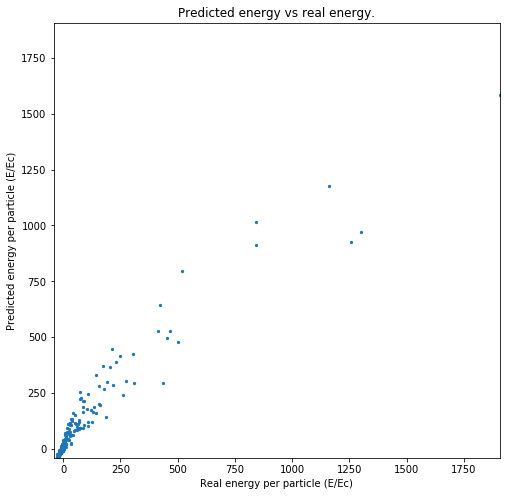

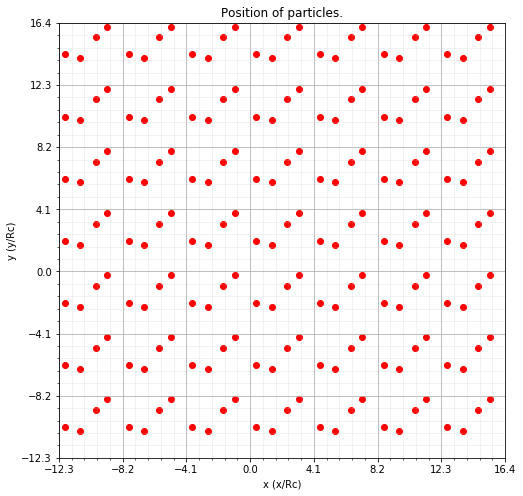

For index 74833 Predicted 9.392588 was -0.2597554968


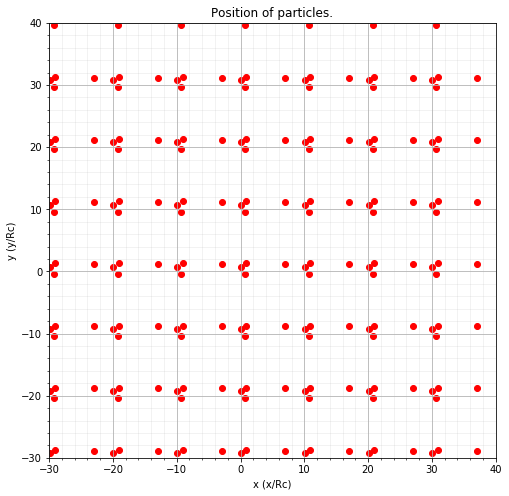

For index 35773 Predicted 5.7441497 was -0.3335562019


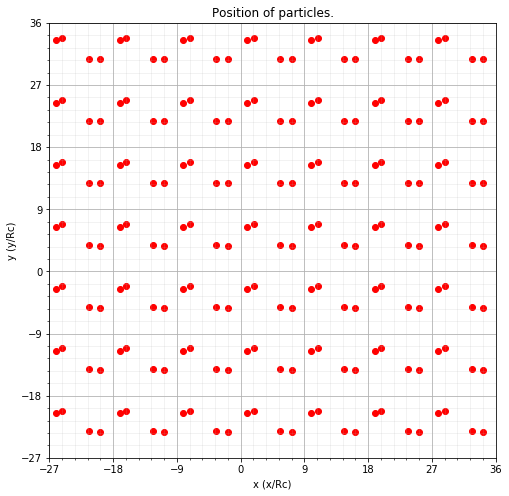

For index 5551 Predicted 4.2753997 was -0.1150331337


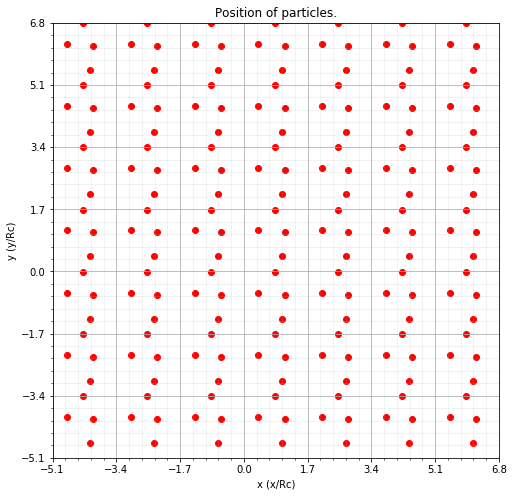

For index 39363 Predicted 1582.9941 was 1556.8077658392


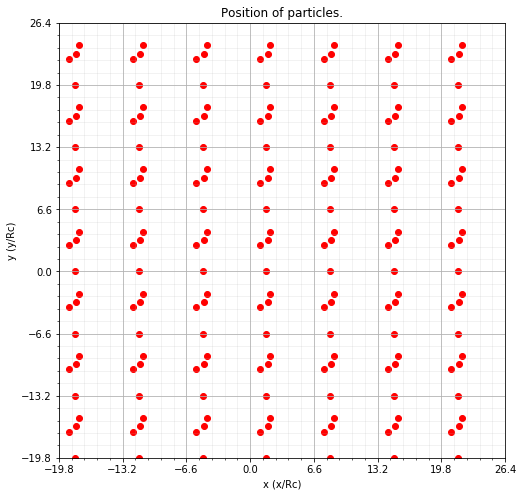

For index 2706 Predicted 0.9941497 was -0.6221759978


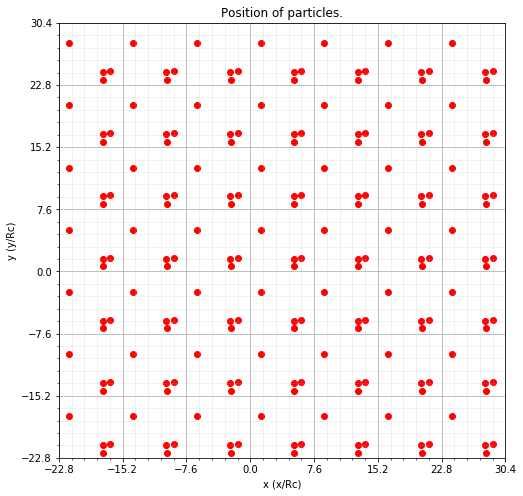

For index 29954 Predicted 0.6191497 was -1.0098895203


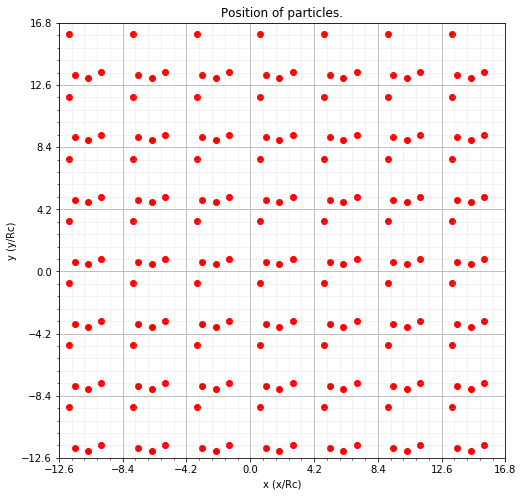

For index 61923 Predicted 1.3691497 was -0.7630583212000001


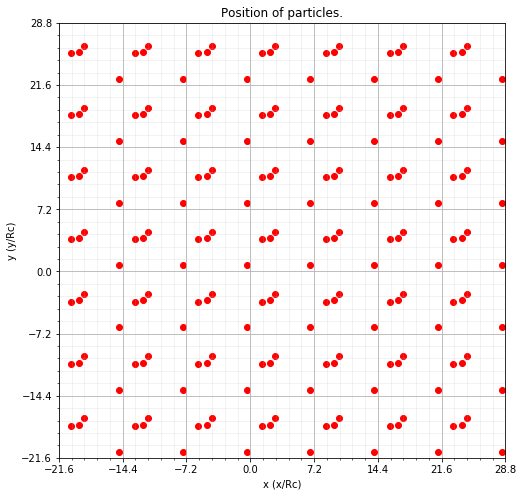

For index 65357 Predicted 1.3691497 was -0.6674631693


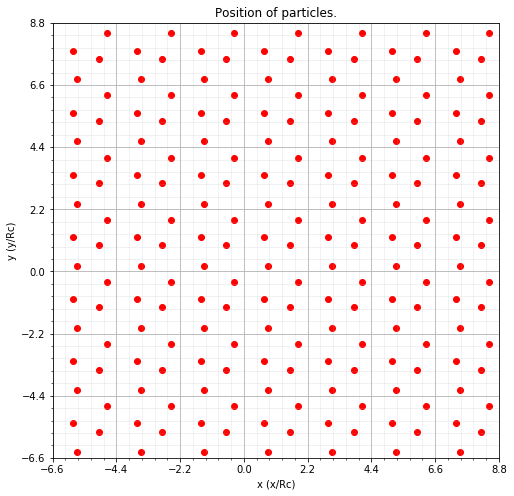

For index 89024 Predicted -8.50585 was -7.6946347464


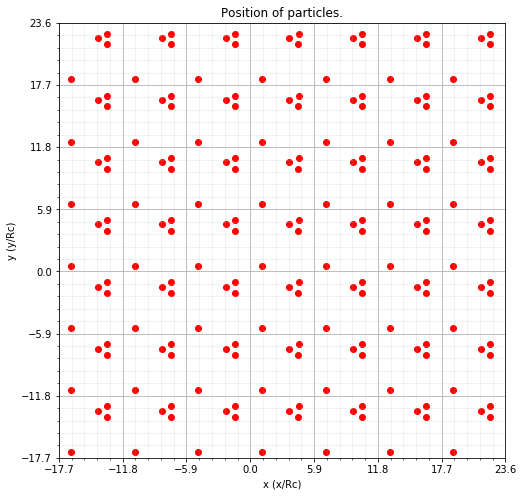

For index 1996 Predicted 1.3066497 was -1.3010053557


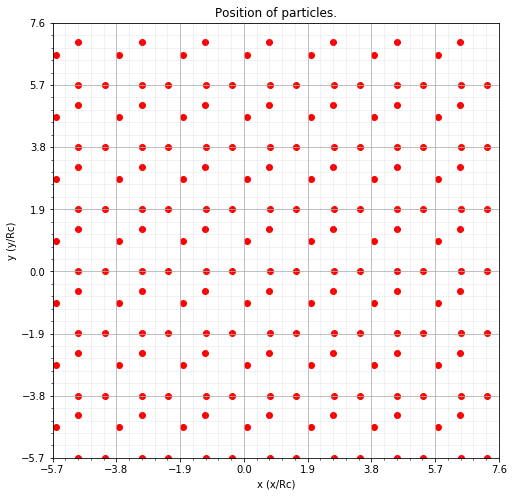

For index 36369 Predicted 151.99416 was 46.4097302903
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 17        
Total params: 289
Trainable params: 289
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[-0.4999399 ,  0.18936604, -0.5326621 , -0.08505577, -0.10233625,
        -0.04273874,  0.515732  , -0.3543501 ,  0.52115005,  0.6680678 ,
        -0.5628288 , -0.15246093, -0.27363634, -0.5059205 ,  0.43242943,
        -0.48104388],
       [-0.02043296,  0.54105335, -0.15006934,  0.28948385,  0.41321278,
        -0.45441473,  0.3711536 ,  0.3872478 ,  0.0236076 ,  0.7058301 ,
        -0.20053628, -0.29725492, -0.03344208,  0.0576517 ,  0.251

In [21]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Model 2: 1 Dense layer medium softplus

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19 (Dense)             (None, 32)                544       
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 33        
Total params: 577
Trainable params: 577
Non-trainable params: 0
_________________________________________________________________
78306/78306 [==============================] - 1s 15us/step
7697802.689819426
Layer 0:  [array([[ 0.2000435 ,  0.48603576, -0.4247386 , -0.28392005,  0.4948588 ,
        -0.4386208 ,  0.58417314,  0.09028643, -0.1855576 ,  0.25595796,
        -0.54367083,  0.5975856 , -0.45059535, -0.43237108, -0.10792273,
        -0.6029561 , -0.02569443,  0.00314325, -0.03608179,  0.17149872,
        -0.5564633 ,  0.11142516, -0.5585461 , -0.2080673 ,  0.1182605 ,
        -0.56959575,  0.16580993,  0.29668856,  0.25839806,  0.

      dtype=float32)]
Layer 1:  [array([[-0.15604538],
       [ 0.31737944],
       [ 0.1614112 ],
       [ 0.21052542],
       [ 0.14191225],
       [ 0.25179693],
       [-0.07554141],
       [ 0.14599738],
       [ 0.39489332],
       [-0.27665907],
       [ 0.33195904],
       [ 0.09152094],
       [-0.26443088],
       [ 0.37519935],
       [-0.10460991],
       [ 0.33981207],
       [-0.39885932],
       [ 0.35861716],
       [-0.20879836],
       [-0.3347352 ],
       [-0.22022003],
       [-0.05952162],
       [-0.07776496],
       [ 0.32639036],
       [ 0.39482197],
       [-0.01265496],
       [ 0.20327666],
       [ 0.06295428],
       [-0.292352  ],
       [-0.38844413],
       [-0.4324739 ],
       [-0.4137348 ]], dtype=float32), array([0.], dtype=float32)]
Train on 62644 samples, validate on 15662 samples
Epoch 1/25000
62644/62644 [==============================] - 3s 43us/step - loss: 2740737.0099 - val_loss: 2402479.4807
Epoch 2/25000
62644/62644 [=====================

62644/62644 [==============================] - 2s 34us/step - loss: 16152.0249 - val_loss: 15681.9962
Epoch 64/25000
62644/62644 [==============================] - 2s 35us/step - loss: 15878.7364 - val_loss: 15409.9741
Epoch 65/25000
62644/62644 [==============================] - 2s 32us/step - loss: 15613.1096 - val_loss: 15149.9977
Epoch 66/25000
62644/62644 [==============================] - 2s 34us/step - loss: 15348.6438 - val_loss: 14980.8843
Epoch 67/25000
62644/62644 [==============================] - 2s 34us/step - loss: 15106.4872 - val_loss: 14659.1572
Epoch 68/25000
62644/62644 [==============================] - 2s 33us/step - loss: 14860.5577 - val_loss: 14406.3045
Epoch 69/25000
62644/62644 [==============================] - 2s 32us/step - loss: 14634.0726 - val_loss: 14214.3546
Epoch 70/25000
62644/62644 [==============================] - 2s 32us/step - loss: 14422.4158 - val_loss: 14048.5894
Epoch 71/25000
62644/62644 [==============================] - 2s 32us/step - lo

62644/62644 [==============================] - 2s 33us/step - loss: 6505.4467 - val_loss: 6289.3571
Epoch 134/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6417.5131 - val_loss: 6205.1733
Epoch 135/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6339.3290 - val_loss: 6125.0624
Epoch 136/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6258.0706 - val_loss: 6062.2124
Epoch 137/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6173.5569 - val_loss: 6052.7658
Epoch 138/25000
62644/62644 [==============================] - 2s 33us/step - loss: 6101.8446 - val_loss: 6014.0818
Epoch 139/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6019.5256 - val_loss: 5817.8468
Epoch 140/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5946.4729 - val_loss: 5742.2852
Epoch 141/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5865

Epoch 204/25000
62644/62644 [==============================] - 2s 33us/step - loss: 2516.1600 - val_loss: 2590.1028
Epoch 205/25000
62644/62644 [==============================] - 2s 32us/step - loss: 2499.6753 - val_loss: 2477.8322
Epoch 206/25000
62644/62644 [==============================] - 2s 32us/step - loss: 2484.0319 - val_loss: 2468.8369
Epoch 207/25000
62644/62644 [==============================] - 2s 32us/step - loss: 2475.0902 - val_loss: 2450.6027
Epoch 208/25000
62644/62644 [==============================] - 2s 32us/step - loss: 2457.1344 - val_loss: 2487.3756
Epoch 209/25000
62644/62644 [==============================] - 2s 32us/step - loss: 2452.0130 - val_loss: 2510.3889
Epoch 210/25000
62644/62644 [==============================] - 2s 34us/step - loss: 2435.8036 - val_loss: 2409.5397
Epoch 211/25000
62644/62644 [==============================] - 2s 33us/step - loss: 2416.6652 - val_loss: 2392.4062
Epoch 212/25000
62644/62644 [==============================] - 2s 32us/s

62644/62644 [==============================] - 2s 32us/step - loss: 1882.8391 - val_loss: 1851.8590
Epoch 275/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1876.0266 - val_loss: 1868.6133
Epoch 276/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1868.9930 - val_loss: 1849.9085
Epoch 277/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1857.7644 - val_loss: 1861.1434
Epoch 278/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1851.4912 - val_loss: 1840.7057
Epoch 279/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1843.9719 - val_loss: 1811.4055
Epoch 280/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1837.2681 - val_loss: 1814.0720
Epoch 281/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1827.9217 - val_loss: 1949.9563
Epoch 282/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1823

Epoch 345/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1457.5104 - val_loss: 1446.0757
Epoch 346/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1458.8727 - val_loss: 1402.3725
Epoch 347/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1449.3160 - val_loss: 1400.4143
Epoch 348/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1439.6312 - val_loss: 1420.4227
Epoch 349/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1436.9650 - val_loss: 1415.5666
Epoch 350/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1434.8645 - val_loss: 1385.6210
Epoch 351/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1424.4811 - val_loss: 1425.6795
Epoch 352/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1416.1244 - val_loss: 1372.9440
Epoch 353/25000
62644/62644 [==============================] - 2s 33us/s

62644/62644 [==============================] - 2s 32us/step - loss: 1124.8338 - val_loss: 1108.2296
Epoch 416/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1122.1320 - val_loss: 1112.7907
Epoch 417/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1122.9432 - val_loss: 1129.0792
Epoch 418/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1120.0415 - val_loss: 1069.8632
Epoch 419/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1107.6319 - val_loss: 1108.9872
Epoch 420/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1107.5060 - val_loss: 1065.5796
Epoch 421/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1103.8437 - val_loss: 1140.8384
Epoch 422/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1104.1862 - val_loss: 1057.1765
Epoch 423/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1098

62644/62644 [==============================] - 2s 33us/step - loss: 884.6539 - val_loss: 869.4718
Epoch 487/25000
62644/62644 [==============================] - 2s 32us/step - loss: 879.5674 - val_loss: 834.6067
Epoch 488/25000
62644/62644 [==============================] - 2s 32us/step - loss: 879.7837 - val_loss: 857.5077
Epoch 489/25000
62644/62644 [==============================] - 2s 32us/step - loss: 878.3352 - val_loss: 860.2265
Epoch 490/25000
62644/62644 [==============================] - 2s 32us/step - loss: 876.2032 - val_loss: 828.3023
Epoch 491/25000
62644/62644 [==============================] - 2s 32us/step - loss: 870.8941 - val_loss: 844.9760
Epoch 492/25000
62644/62644 [==============================] - 2s 32us/step - loss: 871.9210 - val_loss: 824.7381
Epoch 493/25000
62644/62644 [==============================] - 2s 33us/step - loss: 864.9438 - val_loss: 920.3349
Epoch 494/25000
62644/62644 [==============================] - 2s 34us/step - loss: 863.8736 - val_loss:

62644/62644 [==============================] - 2s 33us/step - loss: 731.2144 - val_loss: 665.1043
Epoch 559/25000
62644/62644 [==============================] - 2s 32us/step - loss: 724.6515 - val_loss: 665.1842
Epoch 560/25000
62644/62644 [==============================] - 2s 35us/step - loss: 724.7350 - val_loss: 691.6839
Epoch 561/25000
62644/62644 [==============================] - 2s 33us/step - loss: 718.7388 - val_loss: 663.0105
Epoch 562/25000
62644/62644 [==============================] - 2s 32us/step - loss: 720.2968 - val_loss: 658.0535
Epoch 563/25000
62644/62644 [==============================] - 2s 33us/step - loss: 715.4652 - val_loss: 656.3095
Epoch 564/25000
62644/62644 [==============================] - 2s 32us/step - loss: 718.0390 - val_loss: 656.4667
Epoch 565/25000
62644/62644 [==============================] - 2s 32us/step - loss: 714.0138 - val_loss: 694.3729
Epoch 566/25000
62644/62644 [==============================] - 2s 33us/step - loss: 712.1829 - val_loss:

62644/62644 [==============================] - 2s 32us/step - loss: 623.0448 - val_loss: 635.5138
Epoch 631/25000
62644/62644 [==============================] - 2s 32us/step - loss: 621.3663 - val_loss: 616.3943
Epoch 632/25000
62644/62644 [==============================] - 2s 32us/step - loss: 617.1405 - val_loss: 560.8939
Epoch 633/25000
62644/62644 [==============================] - 2s 32us/step - loss: 615.4071 - val_loss: 588.6844
Epoch 634/25000
62644/62644 [==============================] - 2s 32us/step - loss: 616.1097 - val_loss: 632.5950
Epoch 635/25000
62644/62644 [==============================] - 2s 32us/step - loss: 618.0668 - val_loss: 556.8989
Epoch 636/25000
62644/62644 [==============================] - 2s 32us/step - loss: 610.9789 - val_loss: 557.2718
Epoch 637/25000
62644/62644 [==============================] - 2s 32us/step - loss: 614.9556 - val_loss: 557.4573
Epoch 638/25000
62644/62644 [==============================] - 2s 32us/step - loss: 613.4760 - val_loss:

62644/62644 [==============================] - 2s 31us/step - loss: 547.0076 - val_loss: 534.0239
Epoch 703/25000
62644/62644 [==============================] - 2s 31us/step - loss: 541.6731 - val_loss: 525.9429
Epoch 704/25000
62644/62644 [==============================] - 2s 31us/step - loss: 545.9523 - val_loss: 497.7500
Epoch 705/25000
62644/62644 [==============================] - 2s 32us/step - loss: 541.4737 - val_loss: 499.1058
Epoch 706/25000
62644/62644 [==============================] - 2s 33us/step - loss: 542.2431 - val_loss: 526.3824
Epoch 707/25000
62644/62644 [==============================] - 2s 33us/step - loss: 540.7058 - val_loss: 487.6892
Epoch 708/25000
62644/62644 [==============================] - 2s 32us/step - loss: 543.6149 - val_loss: 489.2498
Epoch 709/25000
62644/62644 [==============================] - 2s 31us/step - loss: 541.0471 - val_loss: 549.8732
Epoch 710/25000
62644/62644 [==============================] - 2s 31us/step - loss: 539.2803 - val_loss:

62644/62644 [==============================] - 2s 39us/step - loss: 492.1996 - val_loss: 469.0069
Epoch 775/25000
62644/62644 [==============================] - 2s 36us/step - loss: 488.0052 - val_loss: 439.6106
Epoch 776/25000
62644/62644 [==============================] - 2s 34us/step - loss: 491.0103 - val_loss: 438.0516
Epoch 777/25000
62644/62644 [==============================] - 2s 34us/step - loss: 487.8062 - val_loss: 437.1609
Epoch 778/25000
62644/62644 [==============================] - 2s 33us/step - loss: 493.0942 - val_loss: 451.6659
Epoch 779/25000
62644/62644 [==============================] - 2s 34us/step - loss: 486.4109 - val_loss: 444.1124
Epoch 780/25000
62644/62644 [==============================] - 2s 33us/step - loss: 492.2089 - val_loss: 446.3952
Epoch 781/25000
62644/62644 [==============================] - 2s 34us/step - loss: 487.1522 - val_loss: 494.6698
Epoch 782/25000
62644/62644 [==============================] - 2s 34us/step - loss: 484.6202 - val_loss:

62644/62644 [==============================] - 2s 37us/step - loss: 451.3131 - val_loss: 399.3899
Epoch 847/25000
62644/62644 [==============================] - 2s 39us/step - loss: 441.0891 - val_loss: 436.2788
Epoch 848/25000
62644/62644 [==============================] - 2s 36us/step - loss: 446.6721 - val_loss: 398.0621
Epoch 849/25000
62644/62644 [==============================] - 2s 38us/step - loss: 441.4333 - val_loss: 448.2542
Epoch 850/25000
62644/62644 [==============================] - 2s 37us/step - loss: 442.8713 - val_loss: 423.6766
Epoch 851/25000
62644/62644 [==============================] - 2s 37us/step - loss: 442.5542 - val_loss: 438.6890
Epoch 852/25000
62644/62644 [==============================] - 2s 37us/step - loss: 443.1116 - val_loss: 448.1454
Epoch 853/25000
62644/62644 [==============================] - 2s 36us/step - loss: 438.6598 - val_loss: 406.0625
Epoch 854/25000
62644/62644 [==============================] - 2s 38us/step - loss: 437.3249 - val_loss:

62644/62644 [==============================] - 2s 33us/step - loss: 404.6002 - val_loss: 458.1245
Epoch 919/25000
62644/62644 [==============================] - 2s 31us/step - loss: 404.6875 - val_loss: 411.0768
Epoch 920/25000
62644/62644 [==============================] - 2s 32us/step - loss: 401.7844 - val_loss: 381.7022
Epoch 921/25000
62644/62644 [==============================] - 2s 37us/step - loss: 399.6057 - val_loss: 403.4056
Epoch 922/25000
62644/62644 [==============================] - 2s 35us/step - loss: 402.4624 - val_loss: 380.4869
Epoch 923/25000
62644/62644 [==============================] - 2s 32us/step - loss: 397.9454 - val_loss: 387.0798
Epoch 924/25000
62644/62644 [==============================] - 2s 32us/step - loss: 401.8184 - val_loss: 392.5950
Epoch 925/25000
62644/62644 [==============================] - 2s 33us/step - loss: 400.8947 - val_loss: 377.7944
Epoch 926/25000
62644/62644 [==============================] - 2s 33us/step - loss: 404.1098 - val_loss:

62644/62644 [==============================] - 2s 34us/step - loss: 368.4325 - val_loss: 408.3619
Epoch 991/25000
62644/62644 [==============================] - 2s 34us/step - loss: 369.4974 - val_loss: 406.4894
Epoch 992/25000
62644/62644 [==============================] - 2s 36us/step - loss: 371.6556 - val_loss: 346.6700
Epoch 993/25000
62644/62644 [==============================] - 2s 35us/step - loss: 368.2740 - val_loss: 344.9474
Epoch 994/25000
62644/62644 [==============================] - 2s 34us/step - loss: 370.1140 - val_loss: 353.3463
Epoch 995/25000
62644/62644 [==============================] - 2s 33us/step - loss: 365.9262 - val_loss: 365.4945
Epoch 996/25000
62644/62644 [==============================] - 2s 33us/step - loss: 368.7710 - val_loss: 342.7540
Epoch 997/25000
62644/62644 [==============================] - 2s 34us/step - loss: 367.3678 - val_loss: 349.1371
Epoch 998/25000
62644/62644 [==============================] - 2s 33us/step - loss: 365.3902 - val_loss:

62644/62644 [==============================] - 2s 29us/step - loss: 342.1054 - val_loss: 323.6373
Epoch 1062/25000
62644/62644 [==============================] - 2s 30us/step - loss: 345.3842 - val_loss: 345.7362
Epoch 1063/25000
62644/62644 [==============================] - 2s 30us/step - loss: 341.1205 - val_loss: 368.0336
Epoch 1064/25000
62644/62644 [==============================] - 2s 29us/step - loss: 342.1556 - val_loss: 324.0727
Epoch 1065/25000
62644/62644 [==============================] - 2s 29us/step - loss: 341.3530 - val_loss: 328.1775
Epoch 1066/25000
62644/62644 [==============================] - 2s 29us/step - loss: 342.0212 - val_loss: 324.0281
Epoch 1067/25000
62644/62644 [==============================] - 2s 29us/step - loss: 340.4095 - val_loss: 325.1317
Epoch 1068/25000
62644/62644 [==============================] - 2s 29us/step - loss: 338.8322 - val_loss: 403.5982
Epoch 1069/25000
62644/62644 [==============================] - 2s 29us/step - loss: 339.2266 - v

62644/62644 [==============================] - 2s 30us/step - loss: 321.6017 - val_loss: 304.9168
Epoch 1133/25000
62644/62644 [==============================] - 2s 31us/step - loss: 323.2146 - val_loss: 305.0792
Epoch 1134/25000
62644/62644 [==============================] - 2s 29us/step - loss: 326.6967 - val_loss: 328.9410
Epoch 1135/25000
62644/62644 [==============================] - 2s 29us/step - loss: 321.3223 - val_loss: 447.9321
Epoch 1136/25000
62644/62644 [==============================] - 2s 29us/step - loss: 325.2966 - val_loss: 402.5083
Epoch 1137/25000
62644/62644 [==============================] - 2s 29us/step - loss: 323.5588 - val_loss: 349.9031
Epoch 1138/25000
62644/62644 [==============================] - 2s 30us/step - loss: 322.7323 - val_loss: 361.2328
Epoch 1139/25000
62644/62644 [==============================] - 2s 30us/step - loss: 321.0810 - val_loss: 325.1630
Epoch 1140/25000
62644/62644 [==============================] - 2s 30us/step - loss: 318.6789 - v

62644/62644 [==============================] - 2s 33us/step - loss: 309.3298 - val_loss: 303.7573
Epoch 1204/25000
62644/62644 [==============================] - 2s 32us/step - loss: 307.4955 - val_loss: 284.8730
Epoch 1205/25000
62644/62644 [==============================] - 2s 34us/step - loss: 307.6405 - val_loss: 404.7097
Epoch 1206/25000
62644/62644 [==============================] - 2s 35us/step - loss: 309.9683 - val_loss: 382.3327
Epoch 1207/25000
62644/62644 [==============================] - 2s 34us/step - loss: 306.9935 - val_loss: 287.9535
Epoch 1208/25000
62644/62644 [==============================] - 2s 33us/step - loss: 305.2702 - val_loss: 284.3692
Epoch 1209/25000
62644/62644 [==============================] - 2s 31us/step - loss: 307.7888 - val_loss: 322.9922
Epoch 1210/25000
62644/62644 [==============================] - 2s 33us/step - loss: 302.7730 - val_loss: 365.7032
Epoch 1211/25000
62644/62644 [==============================] - 2s 34us/step - loss: 303.6956 - v

62644/62644 [==============================] - 2s 32us/step - loss: 286.7427 - val_loss: 269.2784
Epoch 1275/25000
62644/62644 [==============================] - 2s 30us/step - loss: 290.9890 - val_loss: 274.4505
Epoch 1276/25000
62644/62644 [==============================] - 2s 32us/step - loss: 284.0051 - val_loss: 272.3362
Epoch 1277/25000
62644/62644 [==============================] - 2s 31us/step - loss: 291.8226 - val_loss: 266.4004
Epoch 1278/25000
62644/62644 [==============================] - 2s 33us/step - loss: 285.2382 - val_loss: 329.5608
Epoch 1279/25000
62644/62644 [==============================] - 2s 39us/step - loss: 284.0479 - val_loss: 286.1506
Epoch 1280/25000
62644/62644 [==============================] - 2s 34us/step - loss: 284.9227 - val_loss: 267.8849
Epoch 1281/25000
62644/62644 [==============================] - 2s 33us/step - loss: 283.8304 - val_loss: 268.3365
Epoch 1282/25000
62644/62644 [==============================] - 2s 33us/step - loss: 286.8039 - v

62644/62644 [==============================] - 2s 31us/step - loss: 271.1827 - val_loss: 307.7034
Epoch 1346/25000
62644/62644 [==============================] - 2s 33us/step - loss: 267.0345 - val_loss: 279.0785
Epoch 1347/25000
62644/62644 [==============================] - 2s 31us/step - loss: 268.2755 - val_loss: 356.3851
Epoch 1348/25000
62644/62644 [==============================] - 2s 35us/step - loss: 266.4758 - val_loss: 279.5056
Epoch 1349/25000
62644/62644 [==============================] - 2s 35us/step - loss: 271.5298 - val_loss: 257.5919
Epoch 1350/25000
62644/62644 [==============================] - 2s 32us/step - loss: 272.4840 - val_loss: 278.5973
Epoch 1351/25000
62644/62644 [==============================] - 2s 32us/step - loss: 264.1503 - val_loss: 277.7346
Epoch 1352/25000
62644/62644 [==============================] - 2s 33us/step - loss: 268.2677 - val_loss: 261.9061
Epoch 1353/25000
62644/62644 [==============================] - 2s 32us/step - loss: 266.4337 - v

62644/62644 [==============================] - 3s 47us/step - loss: 258.2663 - val_loss: 266.8919
Epoch 1417/25000
62644/62644 [==============================] - 3s 44us/step - loss: 253.9192 - val_loss: 239.1919
Epoch 1418/25000
62644/62644 [==============================] - 3s 41us/step - loss: 256.6662 - val_loss: 248.5085
Epoch 1419/25000
62644/62644 [==============================] - 3s 42us/step - loss: 256.2711 - val_loss: 250.3926
Epoch 1420/25000
62644/62644 [==============================] - 3s 40us/step - loss: 254.5648 - val_loss: 242.9491
Epoch 1421/25000
62644/62644 [==============================] - 2s 37us/step - loss: 257.1491 - val_loss: 311.0583
Epoch 1422/25000
62644/62644 [==============================] - 2s 38us/step - loss: 255.0568 - val_loss: 258.1702
Epoch 1423/25000
62644/62644 [==============================] - 2s 37us/step - loss: 250.6040 - val_loss: 243.2293
Epoch 1424/25000
62644/62644 [==============================] - 2s 37us/step - loss: 255.2526 - v

62644/62644 [==============================] - 2s 36us/step - loss: 242.4899 - val_loss: 261.0392
Epoch 1488/25000
62644/62644 [==============================] - 2s 34us/step - loss: 243.3998 - val_loss: 276.5198
Epoch 1489/25000
62644/62644 [==============================] - 2s 34us/step - loss: 243.2298 - val_loss: 252.1610
Epoch 1490/25000
62644/62644 [==============================] - 2s 36us/step - loss: 240.4622 - val_loss: 225.1922
Epoch 1491/25000
62644/62644 [==============================] - 3s 41us/step - loss: 239.9214 - val_loss: 307.8440
Epoch 1492/25000
62644/62644 [==============================] - 2s 39us/step - loss: 245.0317 - val_loss: 235.5420
Epoch 1493/25000
62644/62644 [==============================] - 2s 37us/step - loss: 240.6472 - val_loss: 277.6937
Epoch 1494/25000
62644/62644 [==============================] - 2s 36us/step - loss: 242.0052 - val_loss: 246.4111
Epoch 1495/25000
62644/62644 [==============================] - 2s 37us/step - loss: 237.6060 - v

62644/62644 [==============================] - 2s 37us/step - loss: 228.4182 - val_loss: 217.9222
Epoch 1559/25000
62644/62644 [==============================] - 2s 36us/step - loss: 227.8500 - val_loss: 224.2425
Epoch 1560/25000
62644/62644 [==============================] - 2s 33us/step - loss: 228.7384 - val_loss: 225.3627
Epoch 1561/25000
62644/62644 [==============================] - 2s 34us/step - loss: 233.9191 - val_loss: 243.0074
Epoch 1562/25000
62644/62644 [==============================] - 2s 35us/step - loss: 226.9797 - val_loss: 214.2356
Epoch 1563/25000
62644/62644 [==============================] - 2s 35us/step - loss: 229.9856 - val_loss: 254.5239
Epoch 1564/25000
62644/62644 [==============================] - 2s 36us/step - loss: 230.6341 - val_loss: 211.1261
Epoch 1565/25000
62644/62644 [==============================] - 2s 35us/step - loss: 230.6582 - val_loss: 208.8906
Epoch 1566/25000
62644/62644 [==============================] - 2s 35us/step - loss: 225.8201 - v

62644/62644 [==============================] - 2s 33us/step - loss: 218.9424 - val_loss: 195.5187
Epoch 1630/25000
62644/62644 [==============================] - 2s 33us/step - loss: 216.9693 - val_loss: 198.3353
Epoch 1631/25000
62644/62644 [==============================] - 2s 33us/step - loss: 222.7932 - val_loss: 205.2058
Epoch 1632/25000
62644/62644 [==============================] - 2s 33us/step - loss: 214.7313 - val_loss: 250.3188
Epoch 1633/25000
62644/62644 [==============================] - 2s 35us/step - loss: 223.7750 - val_loss: 200.7106
Epoch 1634/25000
62644/62644 [==============================] - 2s 34us/step - loss: 219.2498 - val_loss: 308.5744
Epoch 1635/25000
62644/62644 [==============================] - 2s 35us/step - loss: 217.7318 - val_loss: 205.8282
Epoch 1636/25000
62644/62644 [==============================] - 2s 36us/step - loss: 215.0150 - val_loss: 194.3415
Epoch 1637/25000
62644/62644 [==============================] - 2s 33us/step - loss: 216.8430 - v

62644/62644 [==============================] - 2s 34us/step - loss: 207.4350 - val_loss: 219.5184
Epoch 1701/25000
62644/62644 [==============================] - 2s 33us/step - loss: 207.0877 - val_loss: 200.4111
Epoch 1702/25000
62644/62644 [==============================] - 2s 34us/step - loss: 210.9355 - val_loss: 183.7167
Epoch 1703/25000
62644/62644 [==============================] - 2s 34us/step - loss: 202.8917 - val_loss: 184.9872
Epoch 1704/25000
62644/62644 [==============================] - 2s 34us/step - loss: 207.1837 - val_loss: 191.2953
Epoch 1705/25000
62644/62644 [==============================] - 2s 33us/step - loss: 201.6952 - val_loss: 188.5243
Epoch 1706/25000
62644/62644 [==============================] - 2s 35us/step - loss: 204.9369 - val_loss: 182.2078
Epoch 1707/25000
62644/62644 [==============================] - 2s 38us/step - loss: 206.0633 - val_loss: 234.3094
Epoch 1708/25000
62644/62644 [==============================] - 2s 37us/step - loss: 211.4112 - v

62644/62644 [==============================] - 2s 34us/step - loss: 197.0852 - val_loss: 176.2149
Epoch 1772/25000
62644/62644 [==============================] - 2s 34us/step - loss: 190.9001 - val_loss: 181.7718
Epoch 1773/25000
62644/62644 [==============================] - 2s 33us/step - loss: 194.4474 - val_loss: 178.0544
Epoch 1774/25000
62644/62644 [==============================] - 2s 33us/step - loss: 191.5984 - val_loss: 172.8668
Epoch 1775/25000
62644/62644 [==============================] - 2s 34us/step - loss: 193.3960 - val_loss: 192.1426
Epoch 1776/25000
62644/62644 [==============================] - 2s 34us/step - loss: 195.7333 - val_loss: 216.9563
Epoch 1777/25000
62644/62644 [==============================] - 2s 36us/step - loss: 193.8109 - val_loss: 211.7964
Epoch 1778/25000
62644/62644 [==============================] - 2s 39us/step - loss: 193.7712 - val_loss: 196.6020
Epoch 1779/25000
62644/62644 [==============================] - 3s 41us/step - loss: 190.6389 - v

62644/62644 [==============================] - 2s 32us/step - loss: 184.8821 - val_loss: 154.2116
Epoch 1843/25000
62644/62644 [==============================] - 2s 33us/step - loss: 180.4537 - val_loss: 163.1951
Epoch 1844/25000
62644/62644 [==============================] - 2s 33us/step - loss: 181.4355 - val_loss: 209.0413
Epoch 1845/25000
62644/62644 [==============================] - 2s 33us/step - loss: 181.2378 - val_loss: 154.8525
Epoch 1846/25000
62644/62644 [==============================] - 2s 33us/step - loss: 175.7051 - val_loss: 234.9971
Epoch 1847/25000
62644/62644 [==============================] - 2s 33us/step - loss: 177.9325 - val_loss: 167.3576
Epoch 1848/25000
62644/62644 [==============================] - 2s 38us/step - loss: 178.0779 - val_loss: 168.4528
Epoch 1849/25000
62644/62644 [==============================] - 3s 40us/step - loss: 180.1340 - val_loss: 169.1416
Epoch 1850/25000
62644/62644 [==============================] - 2s 37us/step - loss: 178.7883 - v

62644/62644 [==============================] - 2s 35us/step - loss: 158.9119 - val_loss: 180.2883
Epoch 1914/25000
62644/62644 [==============================] - 2s 33us/step - loss: 158.4842 - val_loss: 155.9818
Epoch 1915/25000
62644/62644 [==============================] - 2s 33us/step - loss: 159.9727 - val_loss: 181.8011
Epoch 1916/25000
62644/62644 [==============================] - 2s 33us/step - loss: 164.0574 - val_loss: 128.1875
Epoch 1917/25000
62644/62644 [==============================] - 2s 34us/step - loss: 157.9374 - val_loss: 136.7290
Epoch 1918/25000
62644/62644 [==============================] - 2s 32us/step - loss: 157.0009 - val_loss: 229.2233
Epoch 1919/25000
62644/62644 [==============================] - 2s 33us/step - loss: 158.2880 - val_loss: 132.0708
Epoch 1920/25000
62644/62644 [==============================] - 2s 33us/step - loss: 154.5254 - val_loss: 145.0331
Epoch 1921/25000
62644/62644 [==============================] - 2s 33us/step - loss: 159.5771 - v

62644/62644 [==============================] - 2s 31us/step - loss: 132.0909 - val_loss: 112.9278
Epoch 1985/25000
62644/62644 [==============================] - 2s 32us/step - loss: 128.8349 - val_loss: 154.7129
Epoch 1986/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.8254 - val_loss: 100.1887
Epoch 1987/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.9297 - val_loss: 126.5578
Epoch 1988/25000
62644/62644 [==============================] - 2s 30us/step - loss: 127.4778 - val_loss: 148.8172
Epoch 1989/25000
62644/62644 [==============================] - 2s 30us/step - loss: 130.4905 - val_loss: 139.8412
Epoch 1990/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.5261 - val_loss: 134.6081
Epoch 1991/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.7030 - val_loss: 117.4125
Epoch 1992/25000
62644/62644 [==============================] - 2s 34us/step - loss: 126.4426 - v

62644/62644 [==============================] - 2s 37us/step - loss: 123.5989 - val_loss: 103.5872
Epoch 2056/25000
62644/62644 [==============================] - 3s 43us/step - loss: 114.9257 - val_loss: 91.0888
Epoch 2057/25000
62644/62644 [==============================] - 3s 50us/step - loss: 121.0294 - val_loss: 204.2804
Epoch 2058/25000
62644/62644 [==============================] - 3s 45us/step - loss: 121.6859 - val_loss: 132.2942
Epoch 2059/25000
62644/62644 [==============================] - 2s 38us/step - loss: 117.5486 - val_loss: 102.4712
Epoch 2060/25000
62644/62644 [==============================] - 2s 38us/step - loss: 117.5592 - val_loss: 87.8192
Epoch 2061/25000
62644/62644 [==============================] - 2s 33us/step - loss: 115.9127 - val_loss: 145.4215
Epoch 2062/25000
62644/62644 [==============================] - 2s 35us/step - loss: 117.8137 - val_loss: 93.4407
Epoch 2063/25000
62644/62644 [==============================] - 3s 42us/step - loss: 119.9978 - val_

62644/62644 [==============================] - 2s 31us/step - loss: 112.5249 - val_loss: 91.0089
Epoch 2127/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.9920 - val_loss: 151.4307
Epoch 2128/25000
62644/62644 [==============================] - 2s 31us/step - loss: 111.4989 - val_loss: 108.4717
Epoch 2129/25000
62644/62644 [==============================] - 2s 30us/step - loss: 114.4017 - val_loss: 89.6942
Epoch 2130/25000
62644/62644 [==============================] - 2s 31us/step - loss: 112.0243 - val_loss: 82.6293
Epoch 2131/25000
62644/62644 [==============================] - 2s 30us/step - loss: 111.5586 - val_loss: 83.5643
Epoch 2132/25000
62644/62644 [==============================] - 2s 30us/step - loss: 112.7537 - val_loss: 98.9382
Epoch 2133/25000
62644/62644 [==============================] - 2s 30us/step - loss: 109.7658 - val_loss: 88.3900
Epoch 2134/25000
62644/62644 [==============================] - 2s 30us/step - loss: 109.5550 - val_los

62644/62644 [==============================] - 2s 32us/step - loss: 105.9353 - val_loss: 92.7022
Epoch 2198/25000
62644/62644 [==============================] - 2s 31us/step - loss: 109.0648 - val_loss: 115.2294
Epoch 2199/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.6271 - val_loss: 149.3835
Epoch 2200/25000
62644/62644 [==============================] - 2s 31us/step - loss: 107.2069 - val_loss: 84.3536
Epoch 2201/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.1114 - val_loss: 79.8803
Epoch 2202/25000
62644/62644 [==============================] - 2s 33us/step - loss: 110.3642 - val_loss: 80.5948
Epoch 2203/25000
62644/62644 [==============================] - 2s 31us/step - loss: 106.4225 - val_loss: 94.4934
Epoch 2204/25000
62644/62644 [==============================] - 2s 30us/step - loss: 108.2492 - val_loss: 79.1937
Epoch 2205/25000
62644/62644 [==============================] - 2s 31us/step - loss: 106.1281 - val_los

Epoch 2269/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.0259 - val_loss: 87.4152
Epoch 2270/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.7491 - val_loss: 103.0576
Epoch 2271/25000
62644/62644 [==============================] - 2s 32us/step - loss: 104.8263 - val_loss: 77.3788
Epoch 2272/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.9982 - val_loss: 74.4368
Epoch 2273/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.4044 - val_loss: 168.7756
Epoch 2274/25000
62644/62644 [==============================] - 2s 31us/step - loss: 109.3013 - val_loss: 147.1266
Epoch 2275/25000
62644/62644 [==============================] - 2s 31us/step - loss: 102.3641 - val_loss: 82.8948
Epoch 2276/25000
62644/62644 [==============================] - 2s 31us/step - loss: 108.0836 - val_loss: 126.3272
Epoch 2277/25000
62644/62644 [==============================] - 2s 31us/step - loss:

62644/62644 [==============================] - 2s 31us/step - loss: 100.9031 - val_loss: 111.8335
Epoch 2341/25000
62644/62644 [==============================] - 2s 31us/step - loss: 103.9662 - val_loss: 73.3128
Epoch 2342/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.2186 - val_loss: 106.7141
Epoch 2343/25000
62644/62644 [==============================] - 2s 31us/step - loss: 94.9963 - val_loss: 74.5915
Epoch 2344/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.5731 - val_loss: 69.3947
Epoch 2345/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.5881 - val_loss: 71.8569
Epoch 2346/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.5258 - val_loss: 145.4714
Epoch 2347/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.2619 - val_loss: 189.2789
Epoch 2348/25000
62644/62644 [==============================] - 2s 32us/step - loss: 98.4541 - val_loss: 

62644/62644 [==============================] - 2s 33us/step - loss: 91.1686 - val_loss: 228.5463
Epoch 2413/25000
62644/62644 [==============================] - 2s 34us/step - loss: 96.5557 - val_loss: 75.9300
Epoch 2414/25000
62644/62644 [==============================] - 2s 35us/step - loss: 93.5643 - val_loss: 168.2692
Epoch 2415/25000
62644/62644 [==============================] - 2s 34us/step - loss: 94.3950 - val_loss: 142.8642
Epoch 2416/25000
62644/62644 [==============================] - 2s 32us/step - loss: 92.0839 - val_loss: 84.8949
Epoch 2417/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.7457 - val_loss: 98.9443
Epoch 2418/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.0053 - val_loss: 65.2287
Epoch 2419/25000
62644/62644 [==============================] - 2s 32us/step - loss: 92.2297 - val_loss: 72.4228
Epoch 2420/25000
62644/62644 [==============================] - 2s 32us/step - loss: 99.0552 - val_loss: 77.37

62644/62644 [==============================] - 2s 31us/step - loss: 90.2031 - val_loss: 107.1403
Epoch 2485/25000
62644/62644 [==============================] - 2s 31us/step - loss: 89.0651 - val_loss: 77.9883
Epoch 2486/25000
62644/62644 [==============================] - 2s 31us/step - loss: 88.1704 - val_loss: 110.0959
Epoch 2487/25000
62644/62644 [==============================] - 2s 31us/step - loss: 92.7258 - val_loss: 60.4643
Epoch 2488/25000
62644/62644 [==============================] - 2s 31us/step - loss: 93.0638 - val_loss: 66.6545
Epoch 2489/25000
62644/62644 [==============================] - 2s 31us/step - loss: 86.2784 - val_loss: 64.6119
Epoch 2490/25000
62644/62644 [==============================] - 2s 31us/step - loss: 92.6037 - val_loss: 61.3683
Epoch 2491/25000
62644/62644 [==============================] - 2s 31us/step - loss: 90.5429 - val_loss: 68.4773
Epoch 2492/25000
62644/62644 [==============================] - 2s 31us/step - loss: 86.9432 - val_loss: 136.77

62644/62644 [==============================] - 2s 31us/step - loss: 83.2509 - val_loss: 58.5987
Epoch 2557/25000
62644/62644 [==============================] - 2s 31us/step - loss: 84.2230 - val_loss: 83.5554
Epoch 2558/25000
62644/62644 [==============================] - 2s 31us/step - loss: 80.0462 - val_loss: 61.0147
Epoch 2559/25000
62644/62644 [==============================] - 2s 31us/step - loss: 81.9144 - val_loss: 55.2803
Epoch 2560/25000
62644/62644 [==============================] - 2s 31us/step - loss: 83.9383 - val_loss: 60.4688
Epoch 2561/25000
62644/62644 [==============================] - 2s 31us/step - loss: 78.9071 - val_loss: 50.2570
Epoch 2562/25000
62644/62644 [==============================] - 2s 31us/step - loss: 75.8750 - val_loss: 56.0771
Epoch 2563/25000
62644/62644 [==============================] - 2s 31us/step - loss: 78.2230 - val_loss: 56.3792
Epoch 2564/25000
62644/62644 [==============================] - 2s 31us/step - loss: 81.7816 - val_loss: 114.0469

62644/62644 [==============================] - 2s 36us/step - loss: 71.1055 - val_loss: 80.0873
Epoch 2629/25000
62644/62644 [==============================] - 2s 35us/step - loss: 65.8132 - val_loss: 71.1974
Epoch 2630/25000
62644/62644 [==============================] - 2s 34us/step - loss: 76.2642 - val_loss: 62.6451
Epoch 2631/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.1115 - val_loss: 39.2067
Epoch 2632/25000
62644/62644 [==============================] - 2s 34us/step - loss: 66.4044 - val_loss: 41.1801
Epoch 2633/25000
62644/62644 [==============================] - 2s 33us/step - loss: 67.0445 - val_loss: 40.9624
Epoch 2634/25000
62644/62644 [==============================] - 2s 35us/step - loss: 73.7796 - val_loss: 41.2468
Epoch 2635/25000
62644/62644 [==============================] - 2s 32us/step - loss: 68.9084 - val_loss: 54.6769
Epoch 2636/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.6629 - val_loss: 64.1289


62644/62644 [==============================] - 2s 35us/step - loss: 68.3316 - val_loss: 66.3498
Epoch 2701/25000
62644/62644 [==============================] - 2s 38us/step - loss: 66.2573 - val_loss: 40.8890
Epoch 2702/25000
62644/62644 [==============================] - 2s 40us/step - loss: 68.5379 - val_loss: 102.5348
Epoch 2703/25000
62644/62644 [==============================] - 3s 40us/step - loss: 70.7669 - val_loss: 98.5841
Epoch 2704/25000
62644/62644 [==============================] - 3s 40us/step - loss: 69.3627 - val_loss: 38.9339
Epoch 2705/25000
62644/62644 [==============================] - 2s 39us/step - loss: 63.8215 - val_loss: 38.2824
Epoch 2706/25000
62644/62644 [==============================] - 3s 41us/step - loss: 66.7195 - val_loss: 36.0419
Epoch 2707/25000
62644/62644 [==============================] - 2s 34us/step - loss: 65.1124 - val_loss: 63.8409
Epoch 2708/25000
62644/62644 [==============================] - 2s 36us/step - loss: 63.9599 - val_loss: 60.8132

62644/62644 [==============================] - 2s 36us/step - loss: 61.9038 - val_loss: 61.7648
Epoch 2773/25000
62644/62644 [==============================] - 2s 36us/step - loss: 64.8782 - val_loss: 43.4292
Epoch 2774/25000
62644/62644 [==============================] - 2s 36us/step - loss: 61.2941 - val_loss: 35.5257
Epoch 2775/25000
62644/62644 [==============================] - 2s 34us/step - loss: 64.0493 - val_loss: 182.6498
Epoch 2776/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.5280 - val_loss: 48.7302
Epoch 2777/25000
62644/62644 [==============================] - 2s 37us/step - loss: 65.7478 - val_loss: 37.9717
Epoch 2778/25000
62644/62644 [==============================] - 2s 35us/step - loss: 63.4287 - val_loss: 179.2121
Epoch 2779/25000
62644/62644 [==============================] - 2s 36us/step - loss: 63.7335 - val_loss: 42.4819
Epoch 2780/25000
62644/62644 [==============================] - 2s 38us/step - loss: 59.0728 - val_loss: 88.183

62644/62644 [==============================] - 2s 32us/step - loss: 60.2080 - val_loss: 140.6343
Epoch 2845/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.4414 - val_loss: 62.6890
Epoch 2846/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.6099 - val_loss: 68.3450
Epoch 2847/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.3539 - val_loss: 42.5630
Epoch 2848/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.3312 - val_loss: 52.6535
Epoch 2849/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.2300 - val_loss: 56.2746
Epoch 2850/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.8466 - val_loss: 34.6776
Epoch 2851/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.9653 - val_loss: 38.8604
Epoch 2852/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.3445 - val_loss: 38.6561

62644/62644 [==============================] - 2s 32us/step - loss: 60.9107 - val_loss: 72.2085
Epoch 2917/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.4754 - val_loss: 68.4907
Epoch 2918/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.1882 - val_loss: 99.2653
Epoch 2919/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.8390 - val_loss: 38.7109
Epoch 2920/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.4378 - val_loss: 37.7112
Epoch 2921/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.9392 - val_loss: 32.8252
Epoch 2922/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.1677 - val_loss: 68.8913
Epoch 2923/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.7585 - val_loss: 51.1635
Epoch 2924/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.9787 - val_loss: 40.5526


62644/62644 [==============================] - 2s 36us/step - loss: 59.2148 - val_loss: 32.6249
Epoch 2989/25000
62644/62644 [==============================] - 2s 38us/step - loss: 63.3535 - val_loss: 57.7048
Epoch 2990/25000
62644/62644 [==============================] - 2s 38us/step - loss: 62.1218 - val_loss: 34.3711
Epoch 2991/25000
62644/62644 [==============================] - 2s 36us/step - loss: 59.5780 - val_loss: 37.8468
Epoch 2992/25000
62644/62644 [==============================] - 2s 39us/step - loss: 59.6753 - val_loss: 44.9057
Epoch 2993/25000
62644/62644 [==============================] - 2s 39us/step - loss: 60.0966 - val_loss: 97.5183
Epoch 2994/25000
62644/62644 [==============================] - 2s 39us/step - loss: 60.1504 - val_loss: 45.4636
Epoch 2995/25000
62644/62644 [==============================] - 3s 41us/step - loss: 64.2134 - val_loss: 32.2819
Epoch 2996/25000
62644/62644 [==============================] - 2s 39us/step - loss: 60.1229 - val_loss: 34.2965


62644/62644 [==============================] - 2s 32us/step - loss: 59.3990 - val_loss: 31.9236
Epoch 3061/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.6264 - val_loss: 90.6660
Epoch 3062/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.2819 - val_loss: 32.0516
Epoch 3063/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.6390 - val_loss: 108.0469
Epoch 3064/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.3503 - val_loss: 63.4070
Epoch 3065/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.2251 - val_loss: 40.0422
Epoch 3066/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.6854 - val_loss: 41.0575
Epoch 3067/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.7133 - val_loss: 33.7525
Epoch 3068/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.9722 - val_loss: 57.1146

62644/62644 [==============================] - 2s 33us/step - loss: 58.5769 - val_loss: 147.8278
Epoch 3133/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.4904 - val_loss: 29.3772
Epoch 3134/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.2403 - val_loss: 40.4596
Epoch 3135/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.8241 - val_loss: 67.5634
Epoch 3136/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.1604 - val_loss: 28.3777
Epoch 3137/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.8256 - val_loss: 115.6828
Epoch 3138/25000
62644/62644 [==============================] - 2s 34us/step - loss: 57.2357 - val_loss: 30.1014
Epoch 3139/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.7200 - val_loss: 35.8062
Epoch 3140/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.8376 - val_loss: 56.938

62644/62644 [==============================] - 2s 34us/step - loss: 55.9691 - val_loss: 49.9901
Epoch 3205/25000
62644/62644 [==============================] - 2s 36us/step - loss: 61.4539 - val_loss: 32.4730
Epoch 3206/25000
62644/62644 [==============================] - 2s 37us/step - loss: 59.2478 - val_loss: 49.0303
Epoch 3207/25000
62644/62644 [==============================] - 2s 36us/step - loss: 58.7149 - val_loss: 33.4032
Epoch 3208/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.9714 - val_loss: 51.1252
Epoch 3209/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.3046 - val_loss: 26.8021
Epoch 3210/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.1063 - val_loss: 149.7849
Epoch 3211/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.1220 - val_loss: 45.5580
Epoch 3212/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.5155 - val_loss: 40.4819

62644/62644 [==============================] - 2s 36us/step - loss: 56.5902 - val_loss: 35.1826
Epoch 3277/25000
62644/62644 [==============================] - 2s 35us/step - loss: 58.7847 - val_loss: 28.3441
Epoch 3278/25000
62644/62644 [==============================] - 2s 35us/step - loss: 56.1858 - val_loss: 42.9399
Epoch 3279/25000
62644/62644 [==============================] - 2s 36us/step - loss: 59.6656 - val_loss: 30.1516
Epoch 3280/25000
62644/62644 [==============================] - 2s 38us/step - loss: 53.4277 - val_loss: 63.3366
Epoch 3281/25000
62644/62644 [==============================] - 2s 37us/step - loss: 59.7443 - val_loss: 34.2686
Epoch 3282/25000
62644/62644 [==============================] - 2s 37us/step - loss: 57.8883 - val_loss: 45.8287
Epoch 3283/25000
62644/62644 [==============================] - 2s 37us/step - loss: 56.0762 - val_loss: 142.5193
Epoch 3284/25000
62644/62644 [==============================] - 2s 35us/step - loss: 54.4626 - val_loss: 51.1761

62644/62644 [==============================] - 2s 33us/step - loss: 54.8443 - val_loss: 28.6774
Epoch 3349/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.9925 - val_loss: 27.9635
Epoch 3350/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.3805 - val_loss: 59.8918
Epoch 3351/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.5693 - val_loss: 34.0297
Epoch 3352/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.9112 - val_loss: 46.9567
Epoch 3353/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.0515 - val_loss: 41.4518
Epoch 3354/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.1043 - val_loss: 114.0899
Epoch 3355/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.9399 - val_loss: 119.4799
Epoch 3356/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.1028 - val_loss: 65.049

62644/62644 [==============================] - 2s 35us/step - loss: 56.6987 - val_loss: 39.4545
Epoch 3421/25000
62644/62644 [==============================] - 2s 37us/step - loss: 55.6091 - val_loss: 29.6491
Epoch 3422/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4178 - val_loss: 31.4815
Epoch 3423/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.0890 - val_loss: 151.5820
Epoch 3424/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.5859 - val_loss: 28.2128
Epoch 3425/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.2242 - val_loss: 30.0636
Epoch 3426/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52.1873 - val_loss: 71.4410
Epoch 3427/25000
62644/62644 [==============================] - 2s 38us/step - loss: 59.4558 - val_loss: 55.3417
Epoch 3428/25000
62644/62644 [==============================] - 2s 35us/step - loss: 56.3249 - val_loss: 43.4823

62644/62644 [==============================] - 2s 35us/step - loss: 53.4558 - val_loss: 68.2459
Epoch 3493/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.5076 - val_loss: 23.8592
Epoch 3494/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.7383 - val_loss: 26.0567
Epoch 3495/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.2201 - val_loss: 57.7434
Epoch 3496/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.6066 - val_loss: 25.0919
Epoch 3497/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.6878 - val_loss: 113.4315
Epoch 3498/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.4546 - val_loss: 25.2216
Epoch 3499/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.2721 - val_loss: 50.4497
Epoch 3500/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.6818 - val_loss: 24.7766

62644/62644 [==============================] - 2s 36us/step - loss: 51.4387 - val_loss: 72.6437
Epoch 3565/25000
62644/62644 [==============================] - 2s 35us/step - loss: 55.7618 - val_loss: 95.4011
Epoch 3566/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.3423 - val_loss: 47.9668
Epoch 3567/25000
62644/62644 [==============================] - 2s 36us/step - loss: 55.2919 - val_loss: 61.0490
Epoch 3568/25000
62644/62644 [==============================] - 2s 38us/step - loss: 54.6633 - val_loss: 48.9106
Epoch 3569/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.7414 - val_loss: 39.1848
Epoch 3570/25000
62644/62644 [==============================] - 2s 37us/step - loss: 52.7623 - val_loss: 30.9152
Epoch 3571/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4554 - val_loss: 22.1212
Epoch 3572/25000
62644/62644 [==============================] - 2s 36us/step - loss: 52.5672 - val_loss: 30.8841


62644/62644 [==============================] - 2s 35us/step - loss: 56.7818 - val_loss: 59.6204
Epoch 3637/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.4610 - val_loss: 30.7029
Epoch 3638/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.2575 - val_loss: 65.1870
Epoch 3639/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.0428 - val_loss: 53.3130
Epoch 3640/25000
62644/62644 [==============================] - 2s 35us/step - loss: 55.2362 - val_loss: 27.8792
Epoch 3641/25000
62644/62644 [==============================] - 2s 38us/step - loss: 53.9028 - val_loss: 49.0837
Epoch 3642/25000
62644/62644 [==============================] - 2s 35us/step - loss: 54.1598 - val_loss: 71.8321
Epoch 3643/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52.0326 - val_loss: 87.1073
Epoch 3644/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.3632 - val_loss: 38.3141


62644/62644 [==============================] - 2s 31us/step - loss: 53.9985 - val_loss: 41.5398
Epoch 3709/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.5739 - val_loss: 23.3165
Epoch 3710/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.0999 - val_loss: 33.6363
Epoch 3711/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.5200 - val_loss: 99.5123
Epoch 3712/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.2819 - val_loss: 33.7515
Epoch 3713/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.1107 - val_loss: 46.8596
Epoch 3714/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.9665 - val_loss: 34.6876
Epoch 3715/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.6828 - val_loss: 33.5529
Epoch 3716/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.9711 - val_loss: 48.4321


62644/62644 [==============================] - 2s 33us/step - loss: 54.6894 - val_loss: 123.6350
Epoch 3781/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.8684 - val_loss: 53.8728
Epoch 3782/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.6038 - val_loss: 23.1553
Epoch 3783/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.0736 - val_loss: 22.9795
Epoch 3784/25000
62644/62644 [==============================] - 2s 39us/step - loss: 52.5738 - val_loss: 103.2607
Epoch 3785/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.6726 - val_loss: 23.6645
Epoch 3786/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.6415 - val_loss: 80.9893
Epoch 3787/25000
62644/62644 [==============================] - 2s 35us/step - loss: 54.4783 - val_loss: 46.4222
Epoch 3788/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.3322 - val_loss: 21.311

62644/62644 [==============================] - 2s 37us/step - loss: 54.0541 - val_loss: 91.8159
Epoch 3853/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.9145 - val_loss: 45.7527
Epoch 3854/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.0594 - val_loss: 40.8300
Epoch 3855/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.5510 - val_loss: 120.5630
Epoch 3856/25000
62644/62644 [==============================] - 3s 41us/step - loss: 56.8620 - val_loss: 88.3875
Epoch 3857/25000
62644/62644 [==============================] - 2s 40us/step - loss: 49.5613 - val_loss: 58.4724
Epoch 3858/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.2338 - val_loss: 134.5025
Epoch 3859/25000
62644/62644 [==============================] - 3s 40us/step - loss: 51.0350 - val_loss: 43.7996
Epoch 3860/25000
62644/62644 [==============================] - 3s 44us/step - loss: 54.6738 - val_loss: 23.837

62644/62644 [==============================] - 2s 33us/step - loss: 51.2478 - val_loss: 47.5547
Epoch 3925/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.6059 - val_loss: 42.5064
Epoch 3926/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0767 - val_loss: 89.4174
Epoch 3927/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.1690 - val_loss: 47.3803
Epoch 3928/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.5710 - val_loss: 24.6314
Epoch 3929/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.0248 - val_loss: 47.3856
Epoch 3930/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.6975 - val_loss: 26.7773
Epoch 3931/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.5703 - val_loss: 71.5503
Epoch 3932/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.7937 - val_loss: 46.1372


62644/62644 [==============================] - 2s 33us/step - loss: 49.2997 - val_loss: 54.4672
Epoch 3997/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.5774 - val_loss: 28.7230
Epoch 3998/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.6511 - val_loss: 79.6745
Epoch 3999/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.5162 - val_loss: 17.0397
Epoch 4000/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.7801 - val_loss: 32.8487
Epoch 4001/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.8953 - val_loss: 26.3961
Epoch 4002/25000
62644/62644 [==============================] - 2s 34us/step - loss: 55.2138 - val_loss: 31.7855
Epoch 4003/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.8577 - val_loss: 34.5019
Epoch 4004/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.0017 - val_loss: 33.1419


62644/62644 [==============================] - 2s 33us/step - loss: 45.4656 - val_loss: 23.6403
Epoch 4069/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.4152 - val_loss: 53.0048
Epoch 4070/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.2986 - val_loss: 18.6683
Epoch 4071/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.7041 - val_loss: 20.3826
Epoch 4072/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.3580 - val_loss: 20.7807
Epoch 4073/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.7088 - val_loss: 43.8023
Epoch 4074/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.1765 - val_loss: 22.7806
Epoch 4075/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.9060 - val_loss: 46.0128
Epoch 4076/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.4857 - val_loss: 26.2671


62644/62644 [==============================] - 3s 40us/step - loss: 47.3937 - val_loss: 33.5528
Epoch 4141/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.1353 - val_loss: 17.8807
Epoch 4142/25000
62644/62644 [==============================] - 3s 40us/step - loss: 53.0783 - val_loss: 18.0352
Epoch 4143/25000
62644/62644 [==============================] - 2s 39us/step - loss: 52.8167 - val_loss: 53.3268
Epoch 4144/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.5748 - val_loss: 37.2087
Epoch 4145/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.7798 - val_loss: 21.6476
Epoch 4146/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.7158 - val_loss: 37.0493
Epoch 4147/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.0699 - val_loss: 75.8350
Epoch 4148/25000
62644/62644 [==============================] - 2s 39us/step - loss: 51.6033 - val_loss: 160.5301

62644/62644 [==============================] - 2s 35us/step - loss: 46.4980 - val_loss: 22.6527
Epoch 4213/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.1076 - val_loss: 42.6850
Epoch 4214/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.2972 - val_loss: 73.0225
Epoch 4215/25000
62644/62644 [==============================] - 3s 42us/step - loss: 50.3659 - val_loss: 21.5609
Epoch 4216/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.3204 - val_loss: 43.0913
Epoch 4217/25000
62644/62644 [==============================] - 2s 38us/step - loss: 45.5814 - val_loss: 28.9139
Epoch 4218/25000
62644/62644 [==============================] - 3s 46us/step - loss: 52.6356 - val_loss: 50.7018
Epoch 4219/25000
62644/62644 [==============================] - 2s 39us/step - loss: 50.9917 - val_loss: 23.4387
Epoch 4220/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.8647 - val_loss: 32.5780


62644/62644 [==============================] - 2s 33us/step - loss: 48.4032 - val_loss: 71.4356
Epoch 4285/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.8926 - val_loss: 16.3339
Epoch 4286/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.5613 - val_loss: 134.1861
Epoch 4287/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.9622 - val_loss: 104.8036
Epoch 4288/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.2281 - val_loss: 53.9463
Epoch 4289/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.5103 - val_loss: 68.7952
Epoch 4290/25000
62644/62644 [==============================] - 2s 36us/step - loss: 53.6829 - val_loss: 39.6570
Epoch 4291/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.1663 - val_loss: 22.7275
Epoch 4292/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.1489 - val_loss: 49.825

62644/62644 [==============================] - 2s 36us/step - loss: 54.0284 - val_loss: 14.3457
Epoch 4357/25000
62644/62644 [==============================] - 2s 36us/step - loss: 53.6843 - val_loss: 21.1416
Epoch 4358/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.7518 - val_loss: 33.3028
Epoch 4359/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.4046 - val_loss: 104.0668
Epoch 4360/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.6682 - val_loss: 32.3791
Epoch 4361/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.5587 - val_loss: 34.6877
Epoch 4362/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.4940 - val_loss: 18.8227
Epoch 4363/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.7160 - val_loss: 63.5210
Epoch 4364/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.3427 - val_loss: 63.5883

62644/62644 [==============================] - 2s 34us/step - loss: 51.2134 - val_loss: 50.9122
Epoch 4429/25000
62644/62644 [==============================] - 2s 38us/step - loss: 46.6628 - val_loss: 39.4205
Epoch 4430/25000
62644/62644 [==============================] - 2s 39us/step - loss: 44.1916 - val_loss: 51.6999
Epoch 4431/25000
62644/62644 [==============================] - 3s 42us/step - loss: 45.5384 - val_loss: 74.2983
Epoch 4432/25000
62644/62644 [==============================] - 3s 43us/step - loss: 50.1858 - val_loss: 91.6516
Epoch 4433/25000
62644/62644 [==============================] - 3s 41us/step - loss: 52.2179 - val_loss: 32.2371
Epoch 4434/25000
62644/62644 [==============================] - 3s 41us/step - loss: 48.0194 - val_loss: 43.4333
Epoch 4435/25000
62644/62644 [==============================] - 3s 42us/step - loss: 45.2907 - val_loss: 17.1321
Epoch 4436/25000
62644/62644 [==============================] - 3s 44us/step - loss: 46.7037 - val_loss: 20.1570


62644/62644 [==============================] - 2s 32us/step - loss: 48.6562 - val_loss: 24.2680
Epoch 4501/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.1082 - val_loss: 35.0004
Epoch 4502/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.0583 - val_loss: 57.0496
Epoch 4503/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.0118 - val_loss: 44.1190
Epoch 4504/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.6751 - val_loss: 26.7884
Epoch 4505/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0179 - val_loss: 18.1908
Epoch 4506/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.0516 - val_loss: 108.3974
Epoch 4507/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.7624 - val_loss: 67.9779
Epoch 4508/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.9359 - val_loss: 27.5165

62644/62644 [==============================] - 2s 34us/step - loss: 46.7535 - val_loss: 55.5584
Epoch 4573/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.8191 - val_loss: 140.4775
Epoch 4574/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.1212 - val_loss: 108.0225
Epoch 4575/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52.3709 - val_loss: 24.5156
Epoch 4576/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.7548 - val_loss: 86.3354
Epoch 4577/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.5942 - val_loss: 38.1103
Epoch 4578/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.5986 - val_loss: 51.5704
Epoch 4579/25000
62644/62644 [==============================] - 3s 41us/step - loss: 51.9676 - val_loss: 21.4248
Epoch 4580/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.9336 - val_loss: 27.100

62644/62644 [==============================] - 2s 34us/step - loss: 54.5155 - val_loss: 83.5597
Epoch 4645/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.2533 - val_loss: 18.8076
Epoch 4646/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.5331 - val_loss: 151.6060
Epoch 4647/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.8864 - val_loss: 59.1296
Epoch 4648/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.9881 - val_loss: 54.2849
Epoch 4649/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.4312 - val_loss: 48.5838
Epoch 4650/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.9008 - val_loss: 52.5111
Epoch 4651/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.7690 - val_loss: 16.2517
Epoch 4652/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.2193 - val_loss: 29.7492

62644/62644 [==============================] - 2s 32us/step - loss: 50.1138 - val_loss: 67.1618
Epoch 4717/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.2873 - val_loss: 22.3819
Epoch 4718/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.1805 - val_loss: 22.5494
Epoch 4719/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.9493 - val_loss: 21.3922
Epoch 4720/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.9874 - val_loss: 17.3897
Epoch 4721/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.1942 - val_loss: 119.2432
Epoch 4722/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.6355 - val_loss: 117.8945
Epoch 4723/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.7417 - val_loss: 18.0086
Epoch 4724/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.1530 - val_loss: 32.856

62644/62644 [==============================] - 2s 33us/step - loss: 50.0161 - val_loss: 85.3062
Epoch 4789/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.6632 - val_loss: 146.1208
Epoch 4790/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.0996 - val_loss: 67.0220
Epoch 4791/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.7922 - val_loss: 67.8681
Epoch 4792/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.5305 - val_loss: 102.5111
Epoch 4793/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.9851 - val_loss: 78.5620
Epoch 4794/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.7242 - val_loss: 45.6740
Epoch 4795/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.0039 - val_loss: 14.4586
Epoch 4796/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.2998 - val_loss: 19.986

62644/62644 [==============================] - 2s 34us/step - loss: 51.0351 - val_loss: 15.3803
Epoch 4861/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.3320 - val_loss: 50.9658
Epoch 4862/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8423 - val_loss: 22.7279
Epoch 4863/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.5636 - val_loss: 36.3155
Epoch 4864/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8401 - val_loss: 85.5352
Epoch 4865/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.3620 - val_loss: 64.5773
Epoch 4866/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.3970 - val_loss: 46.8648
Epoch 4867/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.3902 - val_loss: 51.4706
Epoch 4868/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.4597 - val_loss: 142.7682

62644/62644 [==============================] - 2s 33us/step - loss: 48.1475 - val_loss: 15.0060
Epoch 4933/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.0717 - val_loss: 43.8205
Epoch 4934/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.7680 - val_loss: 63.2682
Epoch 4935/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.9856 - val_loss: 46.0630
Epoch 4936/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.2407 - val_loss: 12.8897
Epoch 4937/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.0432 - val_loss: 78.9047
Epoch 4938/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.3133 - val_loss: 64.2157
Epoch 4939/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.1958 - val_loss: 12.4558
Epoch 4940/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.0326 - val_loss: 41.1955


62644/62644 [==============================] - 2s 33us/step - loss: 49.5882 - val_loss: 18.2171
Epoch 5005/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.9506 - val_loss: 27.5480
Epoch 5006/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.7976 - val_loss: 68.6154
Epoch 5007/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.4982 - val_loss: 111.9338
Epoch 5008/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.5989 - val_loss: 72.9626
Epoch 5009/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.8856 - val_loss: 31.4181
Epoch 5010/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.5972 - val_loss: 13.9099
Epoch 5011/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.1526 - val_loss: 77.0260
Epoch 5012/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.0771 - val_loss: 69.2000

62644/62644 [==============================] - 2s 31us/step - loss: 48.8524 - val_loss: 27.2633
Epoch 5077/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.0225 - val_loss: 55.5293
Epoch 5078/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.1894 - val_loss: 51.8919
Epoch 5079/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.6290 - val_loss: 88.4671
Epoch 5080/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.5951 - val_loss: 12.1472
Epoch 5081/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.5369 - val_loss: 19.4722
Epoch 5082/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.9184 - val_loss: 103.0182
Epoch 5083/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.9916 - val_loss: 69.7487
Epoch 5084/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.0382 - val_loss: 21.2598

62644/62644 [==============================] - 2s 36us/step - loss: 58.8880 - val_loss: 24.3384
Epoch 5149/25000
62644/62644 [==============================] - 3s 44us/step - loss: 44.9237 - val_loss: 35.2855
Epoch 5150/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.7030 - val_loss: 38.5833
Epoch 5151/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.2744 - val_loss: 29.8455
Epoch 5152/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.7582 - val_loss: 39.0480
Epoch 5153/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.0726 - val_loss: 50.1587
Epoch 5154/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.3658 - val_loss: 33.9902
Epoch 5155/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.2281 - val_loss: 19.8948
Epoch 5156/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4769 - val_loss: 45.2524


62644/62644 [==============================] - 2s 31us/step - loss: 48.9912 - val_loss: 69.8437
Epoch 5221/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.5403 - val_loss: 25.4121
Epoch 5222/25000
62644/62644 [==============================] - 2s 30us/step - loss: 50.4236 - val_loss: 27.3196
Epoch 5223/25000
62644/62644 [==============================] - 2s 30us/step - loss: 49.0726 - val_loss: 19.4498
Epoch 5224/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.7220 - val_loss: 80.7667
Epoch 5225/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.3325 - val_loss: 35.9995
Epoch 5226/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.4601 - val_loss: 148.0529
Epoch 5227/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.9667 - val_loss: 26.7947
Epoch 5228/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.4561 - val_loss: 16.7703

62644/62644 [==============================] - 2s 36us/step - loss: 53.2829 - val_loss: 15.6331
Epoch 5293/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.0151 - val_loss: 100.7085
Epoch 5294/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.2078 - val_loss: 26.6146
Epoch 5295/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.2642 - val_loss: 53.9161
Epoch 5296/25000
62644/62644 [==============================] - 3s 40us/step - loss: 51.8034 - val_loss: 20.6482
Epoch 5297/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.9066 - val_loss: 22.4718
Epoch 5298/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.2477 - val_loss: 32.8288
Epoch 5299/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.4211 - val_loss: 39.6951
Epoch 5300/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.0456 - val_loss: 30.5605

62644/62644 [==============================] - 2s 33us/step - loss: 52.4383 - val_loss: 74.3168
Epoch 5365/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.4806 - val_loss: 38.2208
Epoch 5366/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.0783 - val_loss: 24.1305
Epoch 5367/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.5320 - val_loss: 46.8682
Epoch 5368/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.8492 - val_loss: 20.7875
Epoch 5369/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.2468 - val_loss: 95.5184
Epoch 5370/25000
62644/62644 [==============================] - 3s 41us/step - loss: 46.2732 - val_loss: 48.1026
Epoch 5371/25000
62644/62644 [==============================] - 3s 40us/step - loss: 49.0867 - val_loss: 50.0350
Epoch 5372/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.1065 - val_loss: 53.5530


62644/62644 [==============================] - 2s 33us/step - loss: 42.2132 - val_loss: 44.7951
Epoch 5437/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.3747 - val_loss: 100.7411
Epoch 5438/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.4082 - val_loss: 56.8749
Epoch 5439/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.3712 - val_loss: 153.5790
Epoch 5440/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.7138 - val_loss: 104.8505
Epoch 5441/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7804 - val_loss: 17.0852
Epoch 5442/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.3556 - val_loss: 81.5206
Epoch 5443/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.4560 - val_loss: 29.8558
Epoch 5444/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.0140 - val_loss: 24.08

62644/62644 [==============================] - 2s 33us/step - loss: 50.5244 - val_loss: 31.9628
Epoch 5509/25000
62644/62644 [==============================] - 2s 30us/step - loss: 45.9072 - val_loss: 32.0804
Epoch 5510/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.5665 - val_loss: 20.3189
Epoch 5511/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.6605 - val_loss: 19.7161
Epoch 5512/25000
62644/62644 [==============================] - 2s 30us/step - loss: 47.5690 - val_loss: 16.3115
Epoch 5513/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.1079 - val_loss: 14.7565
Epoch 5514/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.6280 - val_loss: 11.8591
Epoch 5515/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.9352 - val_loss: 38.9929
Epoch 5516/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.4658 - val_loss: 10.5571


62644/62644 [==============================] - 2s 31us/step - loss: 48.9424 - val_loss: 36.7392
Epoch 5581/25000
62644/62644 [==============================] - 2s 30us/step - loss: 49.6105 - val_loss: 215.9582
Epoch 5582/25000
62644/62644 [==============================] - 2s 30us/step - loss: 54.4688 - val_loss: 9.9267
Epoch 5583/25000
62644/62644 [==============================] - 2s 30us/step - loss: 47.7418 - val_loss: 80.5145
Epoch 5584/25000
62644/62644 [==============================] - 2s 30us/step - loss: 48.6535 - val_loss: 24.9474
Epoch 5585/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.7668 - val_loss: 86.2085
Epoch 5586/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.3519 - val_loss: 156.5468
Epoch 5587/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.4336 - val_loss: 29.1859
Epoch 5588/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.0929 - val_loss: 76.3488

62644/62644 [==============================] - 2s 36us/step - loss: 52.5077 - val_loss: 33.7944
Epoch 5653/25000
62644/62644 [==============================] - 2s 37us/step - loss: 52.4670 - val_loss: 61.3312
Epoch 5654/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.6995 - val_loss: 21.3618
Epoch 5655/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.2750 - val_loss: 105.2778
Epoch 5656/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.1362 - val_loss: 74.1173
Epoch 5657/25000
62644/62644 [==============================] - 2s 37us/step - loss: 53.1201 - val_loss: 47.1313
Epoch 5658/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.8510 - val_loss: 40.7674
Epoch 5659/25000
62644/62644 [==============================] - 2s 37us/step - loss: 52.5876 - val_loss: 68.1738
Epoch 5660/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.0333 - val_loss: 54.2084

62644/62644 [==============================] - 2s 35us/step - loss: 50.4588 - val_loss: 40.5364
Epoch 5725/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.6827 - val_loss: 66.3764
Epoch 5726/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.7987 - val_loss: 51.0760
Epoch 5727/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.7960 - val_loss: 135.1696
Epoch 5728/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.0008 - val_loss: 30.3802
Epoch 5729/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.3538 - val_loss: 16.7701
Epoch 5730/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.1045 - val_loss: 25.0700
Epoch 5731/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.4424 - val_loss: 95.7477
Epoch 5732/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.5040 - val_loss: 27.7428

62644/62644 [==============================] - 2s 32us/step - loss: 51.2579 - val_loss: 64.0846
Epoch 5797/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.9157 - val_loss: 86.4976
Epoch 5798/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.5394 - val_loss: 23.6469
Epoch 5799/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.8815 - val_loss: 22.5854
Epoch 5800/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.5697 - val_loss: 21.9972
Epoch 5801/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.6137 - val_loss: 98.1668
Epoch 5802/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.1880 - val_loss: 23.8013
Epoch 5803/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.0127 - val_loss: 11.7038
Epoch 5804/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.6080 - val_loss: 52.9493


62644/62644 [==============================] - 3s 50us/step - loss: 46.7293 - val_loss: 41.6880
Epoch 5869/25000
62644/62644 [==============================] - 3s 54us/step - loss: 46.1526 - val_loss: 56.9052
Epoch 5870/25000
62644/62644 [==============================] - 3s 53us/step - loss: 47.9128 - val_loss: 18.6563
Epoch 5871/25000
62644/62644 [==============================] - 3s 43us/step - loss: 46.0989 - val_loss: 19.5860
Epoch 5872/25000
62644/62644 [==============================] - 2s 39us/step - loss: 51.3047 - val_loss: 133.8070
Epoch 5873/25000
62644/62644 [==============================] - 3s 40us/step - loss: 50.7119 - val_loss: 10.3761
Epoch 5874/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.6155 - val_loss: 43.6902
Epoch 5875/25000
62644/62644 [==============================] - 2s 40us/step - loss: 52.1077 - val_loss: 10.4194
Epoch 5876/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.2410 - val_loss: 58.9009

62644/62644 [==============================] - 3s 46us/step - loss: 51.4054 - val_loss: 82.7949
Epoch 5941/25000
62644/62644 [==============================] - 3s 47us/step - loss: 49.3293 - val_loss: 25.1829
Epoch 5942/25000
62644/62644 [==============================] - 3s 44us/step - loss: 48.0026 - val_loss: 16.4495
Epoch 5943/25000
62644/62644 [==============================] - 3s 45us/step - loss: 51.7606 - val_loss: 56.4187
Epoch 5944/25000
62644/62644 [==============================] - 3s 48us/step - loss: 46.9470 - val_loss: 93.1816
Epoch 5945/25000
62644/62644 [==============================] - 3s 48us/step - loss: 41.9801 - val_loss: 28.4947
Epoch 5946/25000
62644/62644 [==============================] - 3s 45us/step - loss: 51.8949 - val_loss: 41.1568
Epoch 5947/25000
62644/62644 [==============================] - 3s 43us/step - loss: 47.6684 - val_loss: 75.7714
Epoch 5948/25000
62644/62644 [==============================] - 3s 42us/step - loss: 44.6140 - val_loss: 92.9465


62644/62644 [==============================] - 2s 38us/step - loss: 47.1388 - val_loss: 55.7745
Epoch 6013/25000
62644/62644 [==============================] - 3s 43us/step - loss: 48.3495 - val_loss: 37.0974
Epoch 6014/25000
62644/62644 [==============================] - 3s 45us/step - loss: 46.4504 - val_loss: 29.5947
Epoch 6015/25000
62644/62644 [==============================] - 3s 43us/step - loss: 51.4486 - val_loss: 29.2054
Epoch 6016/25000
62644/62644 [==============================] - 3s 40us/step - loss: 48.9492 - val_loss: 92.8578
Epoch 6017/25000
62644/62644 [==============================] - 2s 39us/step - loss: 51.8523 - val_loss: 86.1633
Epoch 6018/25000
62644/62644 [==============================] - 2s 37us/step - loss: 54.0673 - val_loss: 16.2889
Epoch 6019/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.3898 - val_loss: 10.4958
Epoch 6020/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.8207 - val_loss: 75.9179


62644/62644 [==============================] - 2s 39us/step - loss: 45.1698 - val_loss: 11.0430
Epoch 6085/25000
62644/62644 [==============================] - 3s 40us/step - loss: 47.8938 - val_loss: 23.7203
Epoch 6086/25000
62644/62644 [==============================] - 3s 40us/step - loss: 53.6026 - val_loss: 14.6677
Epoch 6087/25000
62644/62644 [==============================] - 2s 39us/step - loss: 50.1686 - val_loss: 14.6414
Epoch 6088/25000
62644/62644 [==============================] - 3s 40us/step - loss: 51.3471 - val_loss: 83.8559
Epoch 6089/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.3525 - val_loss: 14.0272
Epoch 6090/25000
62644/62644 [==============================] - 2s 40us/step - loss: 48.7758 - val_loss: 60.1425
Epoch 6091/25000
62644/62644 [==============================] - 2s 39us/step - loss: 45.9968 - val_loss: 35.1697
Epoch 6092/25000
62644/62644 [==============================] - 3s 44us/step - loss: 48.8798 - val_loss: 19.6391


62644/62644 [==============================] - 2s 39us/step - loss: 50.7172 - val_loss: 44.0387
Epoch 6157/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.3525 - val_loss: 32.7823
Epoch 6158/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.7180 - val_loss: 25.1127
Epoch 6159/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.9645 - val_loss: 18.9816
Epoch 6160/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.2123 - val_loss: 74.4066
Epoch 6161/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.1335 - val_loss: 31.2445
Epoch 6162/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.1822 - val_loss: 17.9210
Epoch 6163/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.2333 - val_loss: 8.2613
Epoch 6164/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.8449 - val_loss: 27.2869
E

62644/62644 [==============================] - 3s 40us/step - loss: 48.9961 - val_loss: 16.4679
Epoch 6229/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.8835 - val_loss: 21.3269
Epoch 6230/25000
62644/62644 [==============================] - 2s 40us/step - loss: 49.4034 - val_loss: 19.7091
Epoch 6231/25000
62644/62644 [==============================] - 2s 39us/step - loss: 50.5044 - val_loss: 49.5060
Epoch 6232/25000
62644/62644 [==============================] - 3s 41us/step - loss: 49.5201 - val_loss: 91.7320
Epoch 6233/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.2829 - val_loss: 14.2745
Epoch 6234/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.0382 - val_loss: 17.5796
Epoch 6235/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.0548 - val_loss: 33.0810
Epoch 6236/25000
62644/62644 [==============================] - 2s 38us/step - loss: 56.4009 - val_loss: 11.5530


62644/62644 [==============================] - 2s 36us/step - loss: 47.0783 - val_loss: 116.7664
Epoch 6301/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.2442 - val_loss: 13.4376
Epoch 6302/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.3161 - val_loss: 28.2973
Epoch 6303/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.8111 - val_loss: 32.6847
Epoch 6304/25000
62644/62644 [==============================] - 2s 36us/step - loss: 53.6860 - val_loss: 66.1694
Epoch 6305/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.0599 - val_loss: 109.8979
Epoch 6306/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.6112 - val_loss: 50.6641
Epoch 6307/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.6359 - val_loss: 19.8279
Epoch 6308/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.4846 - val_loss: 28.400

62644/62644 [==============================] - 2s 36us/step - loss: 49.4102 - val_loss: 57.3250
Epoch 6373/25000
62644/62644 [==============================] - 2s 37us/step - loss: 53.0425 - val_loss: 48.6345
Epoch 6374/25000
62644/62644 [==============================] - 3s 40us/step - loss: 50.1871 - val_loss: 38.3086
Epoch 6375/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.9912 - val_loss: 18.0451
Epoch 6376/25000
62644/62644 [==============================] - 2s 36us/step - loss: 53.4374 - val_loss: 41.7980
Epoch 6377/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.9165 - val_loss: 45.2742
Epoch 6378/25000
62644/62644 [==============================] - 2s 36us/step - loss: 57.1723 - val_loss: 54.4412
Epoch 6379/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.7893 - val_loss: 73.3706
Epoch 6380/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.6179 - val_loss: 18.1400


62644/62644 [==============================] - 2s 36us/step - loss: 45.5954 - val_loss: 96.4146
Epoch 6445/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.5124 - val_loss: 41.7826
Epoch 6446/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.0212 - val_loss: 9.9741
Epoch 6447/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.9049 - val_loss: 20.9214
Epoch 6448/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.2136 - val_loss: 20.2405
Epoch 6449/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.4185 - val_loss: 68.7649
Epoch 6450/25000
62644/62644 [==============================] - 2s 38us/step - loss: 53.6970 - val_loss: 109.3622
Epoch 6451/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.5718 - val_loss: 76.3889
Epoch 6452/25000
62644/62644 [==============================] - 2s 39us/step - loss: 45.5508 - val_loss: 107.4213

62644/62644 [==============================] - 3s 40us/step - loss: 47.2954 - val_loss: 55.7653
Epoch 6517/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.1637 - val_loss: 36.2311
Epoch 6518/25000
62644/62644 [==============================] - 2s 39us/step - loss: 44.8780 - val_loss: 72.5338
Epoch 6519/25000
62644/62644 [==============================] - 3s 44us/step - loss: 44.9755 - val_loss: 34.1008
Epoch 6520/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.8565 - val_loss: 102.0511
Epoch 6521/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.2992 - val_loss: 12.0326
Epoch 6522/25000
62644/62644 [==============================] - 2s 36us/step - loss: 52.3787 - val_loss: 35.1146
Epoch 6523/25000
62644/62644 [==============================] - 2s 39us/step - loss: 50.4945 - val_loss: 22.6695
Epoch 6524/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.2795 - val_loss: 58.8726

62644/62644 [==============================] - 3s 41us/step - loss: 44.6786 - val_loss: 141.6386
Epoch 6589/25000
62644/62644 [==============================] - 3s 43us/step - loss: 48.1464 - val_loss: 43.4708
Epoch 6590/25000
62644/62644 [==============================] - 2s 39us/step - loss: 50.4414 - val_loss: 82.9796
Epoch 6591/25000
62644/62644 [==============================] - 2s 39us/step - loss: 53.8142 - val_loss: 89.1025
Epoch 6592/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.7401 - val_loss: 74.1272
Epoch 6593/25000
62644/62644 [==============================] - 2s 40us/step - loss: 47.6656 - val_loss: 57.4201
Epoch 6594/25000
62644/62644 [==============================] - 2s 37us/step - loss: 55.8611 - val_loss: 17.3090
Epoch 6595/25000
62644/62644 [==============================] - 2s 39us/step - loss: 46.3877 - val_loss: 15.3228
Epoch 6596/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.8826 - val_loss: 45.3309

62644/62644 [==============================] - 2s 37us/step - loss: 45.6798 - val_loss: 15.7894
Epoch 6661/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.7749 - val_loss: 67.9896
Epoch 6662/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.2097 - val_loss: 24.9785
Epoch 6663/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.5424 - val_loss: 76.3242
Epoch 6664/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.3352 - val_loss: 99.8104
Epoch 6665/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.4607 - val_loss: 109.1641
Epoch 6666/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.0822 - val_loss: 115.3182
Epoch 6667/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.4303 - val_loss: 49.1739
Epoch 6668/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.6723 - val_loss: 39.245

62644/62644 [==============================] - 2s 35us/step - loss: 48.9817 - val_loss: 63.8951
Epoch 6733/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.4485 - val_loss: 36.4717
Epoch 6734/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.1487 - val_loss: 167.6102
Epoch 6735/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52.5246 - val_loss: 44.1517
Epoch 6736/25000
62644/62644 [==============================] - 2s 36us/step - loss: 54.7465 - val_loss: 41.2671
Epoch 6737/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.1489 - val_loss: 72.5111
Epoch 6738/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.2411 - val_loss: 40.3810
Epoch 6739/25000
62644/62644 [==============================] - 2s 35us/step - loss: 56.3968 - val_loss: 16.6165
Epoch 6740/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.1022 - val_loss: 140.137

62644/62644 [==============================] - 2s 34us/step - loss: 47.2548 - val_loss: 61.9498
Epoch 6805/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.8306 - val_loss: 83.1025
Epoch 6806/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.7930 - val_loss: 12.0231
Epoch 6807/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.5446 - val_loss: 44.9454
Epoch 6808/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.3429 - val_loss: 38.7839
Epoch 6809/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.1092 - val_loss: 30.1236
Epoch 6810/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.6013 - val_loss: 23.6454
Epoch 6811/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.3158 - val_loss: 15.6445
Epoch 6812/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.8977 - val_loss: 134.7701

62644/62644 [==============================] - 2s 34us/step - loss: 54.2542 - val_loss: 11.9763
Epoch 6877/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.4892 - val_loss: 105.2656
Epoch 6878/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.4080 - val_loss: 103.1348
Epoch 6879/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.3859 - val_loss: 102.7479
Epoch 6880/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.9823 - val_loss: 117.7524
Epoch 6881/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.8633 - val_loss: 15.6029
Epoch 6882/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.3584 - val_loss: 32.3080
Epoch 6883/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.7312 - val_loss: 21.6883
Epoch 6884/25000
62644/62644 [==============================] - 2s 38us/step - loss: 46.8050 - val_loss: 21.6

62644/62644 [==============================] - 2s 32us/step - loss: 48.2201 - val_loss: 53.8320
Epoch 6949/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.2651 - val_loss: 118.5815
Epoch 6950/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.6656 - val_loss: 24.9556
Epoch 6951/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.2013 - val_loss: 25.8755
Epoch 6952/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.6328 - val_loss: 19.0390
Epoch 6953/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.0140 - val_loss: 157.1886
Epoch 6954/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.8233 - val_loss: 29.9751
Epoch 6955/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.1587 - val_loss: 64.0173
Epoch 6956/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.0729 - val_loss: 7.8437

62644/62644 [==============================] - 2s 31us/step - loss: 49.7338 - val_loss: 42.1252
Epoch 7021/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.9045 - val_loss: 120.1368
Epoch 7022/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.5098 - val_loss: 36.8270
Epoch 7023/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.8076 - val_loss: 34.0500
Epoch 7024/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.1191 - val_loss: 11.0349
Epoch 7025/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.6013 - val_loss: 11.4059
Epoch 7026/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.3078 - val_loss: 40.7649
Epoch 7027/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5659 - val_loss: 28.7259
Epoch 7028/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.0931 - val_loss: 14.2973

62644/62644 [==============================] - 2s 32us/step - loss: 44.4322 - val_loss: 25.2973
Epoch 7093/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.3429 - val_loss: 72.8609
Epoch 7094/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.6163 - val_loss: 18.5424
Epoch 7095/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.8078 - val_loss: 16.3905
Epoch 7096/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.5945 - val_loss: 53.1920
Epoch 7097/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.9002 - val_loss: 42.1872
Epoch 7098/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.7337 - val_loss: 99.7120
Epoch 7099/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.5623 - val_loss: 18.7741
Epoch 7100/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.4946 - val_loss: 26.9006


62644/62644 [==============================] - 2s 34us/step - loss: 51.1816 - val_loss: 64.2461
Epoch 7165/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.1567 - val_loss: 59.3714
Epoch 7166/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.1239 - val_loss: 77.5568
Epoch 7167/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.3157 - val_loss: 33.3413
Epoch 7168/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.8048 - val_loss: 34.4156
Epoch 7169/25000
62644/62644 [==============================] - 2s 36us/step - loss: 52.8233 - val_loss: 33.7016
Epoch 7170/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.9537 - val_loss: 45.2002
Epoch 7171/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.2858 - val_loss: 23.8100
Epoch 7172/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8245 - val_loss: 17.8314


62644/62644 [==============================] - 2s 35us/step - loss: 51.5286 - val_loss: 12.1476
Epoch 7237/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.3203 - val_loss: 95.5408
Epoch 7238/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.6495 - val_loss: 46.6315
Epoch 7239/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.1764 - val_loss: 21.2706
Epoch 7240/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.0174 - val_loss: 33.9176
Epoch 7241/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.0258 - val_loss: 36.5481
Epoch 7242/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.7934 - val_loss: 42.0663
Epoch 7243/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.6388 - val_loss: 48.6704
Epoch 7244/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.0509 - val_loss: 60.9785


62644/62644 [==============================] - 2s 35us/step - loss: 51.0533 - val_loss: 49.1507
Epoch 7309/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.1578 - val_loss: 85.6191
Epoch 7310/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.8225 - val_loss: 21.1821
Epoch 7311/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.7742 - val_loss: 13.0144
Epoch 7312/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.4810 - val_loss: 9.4935
Epoch 7313/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.7509 - val_loss: 58.3427
Epoch 7314/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.7729 - val_loss: 13.7020
Epoch 7315/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8174 - val_loss: 178.8405
Epoch 7316/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.2359 - val_loss: 33.1143


62644/62644 [==============================] - 2s 33us/step - loss: 55.7797 - val_loss: 22.8839
Epoch 7381/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.6855 - val_loss: 31.3716
Epoch 7382/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.8628 - val_loss: 52.8772
Epoch 7383/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.6314 - val_loss: 107.4688
Epoch 7384/25000
62644/62644 [==============================] - 2s 35us/step - loss: 53.8940 - val_loss: 22.3460
Epoch 7385/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.0873 - val_loss: 63.3679
Epoch 7386/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.1826 - val_loss: 58.9058
Epoch 7387/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.5922 - val_loss: 89.2178
Epoch 7388/25000
62644/62644 [==============================] - 2s 35us/step - loss: 57.0267 - val_loss: 95.8515

62644/62644 [==============================] - 2s 36us/step - loss: 51.9378 - val_loss: 117.8678
Epoch 7453/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.3680 - val_loss: 21.2950
Epoch 7454/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.1321 - val_loss: 24.5429
Epoch 7455/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.0868 - val_loss: 58.2797
Epoch 7456/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.9419 - val_loss: 10.6943
Epoch 7457/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.2754 - val_loss: 49.0631
Epoch 7458/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.2990 - val_loss: 58.0505
Epoch 7459/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.4283 - val_loss: 55.7585
Epoch 7460/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.2340 - val_loss: 82.9770

62644/62644 [==============================] - 2s 35us/step - loss: 48.7373 - val_loss: 74.5567
Epoch 7525/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.9027 - val_loss: 12.7013
Epoch 7526/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.9389 - val_loss: 190.0383
Epoch 7527/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.8190 - val_loss: 13.8296
Epoch 7528/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.2307 - val_loss: 41.5166
Epoch 7529/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.5759 - val_loss: 13.6939
Epoch 7530/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.0333 - val_loss: 53.1669
Epoch 7531/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.4739 - val_loss: 45.2301
Epoch 7532/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.6832 - val_loss: 40.9906

62644/62644 [==============================] - 2s 36us/step - loss: 48.4706 - val_loss: 92.7140
Epoch 7597/25000
62644/62644 [==============================] - 2s 34us/step - loss: 57.5002 - val_loss: 72.7726
Epoch 7598/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.0592 - val_loss: 108.1477
Epoch 7599/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.1888 - val_loss: 21.5991
Epoch 7600/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.6537 - val_loss: 49.5483
Epoch 7601/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.6147 - val_loss: 84.3964
Epoch 7602/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.2998 - val_loss: 36.8523
Epoch 7603/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0291 - val_loss: 44.5179
Epoch 7604/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.7546 - val_loss: 8.8667


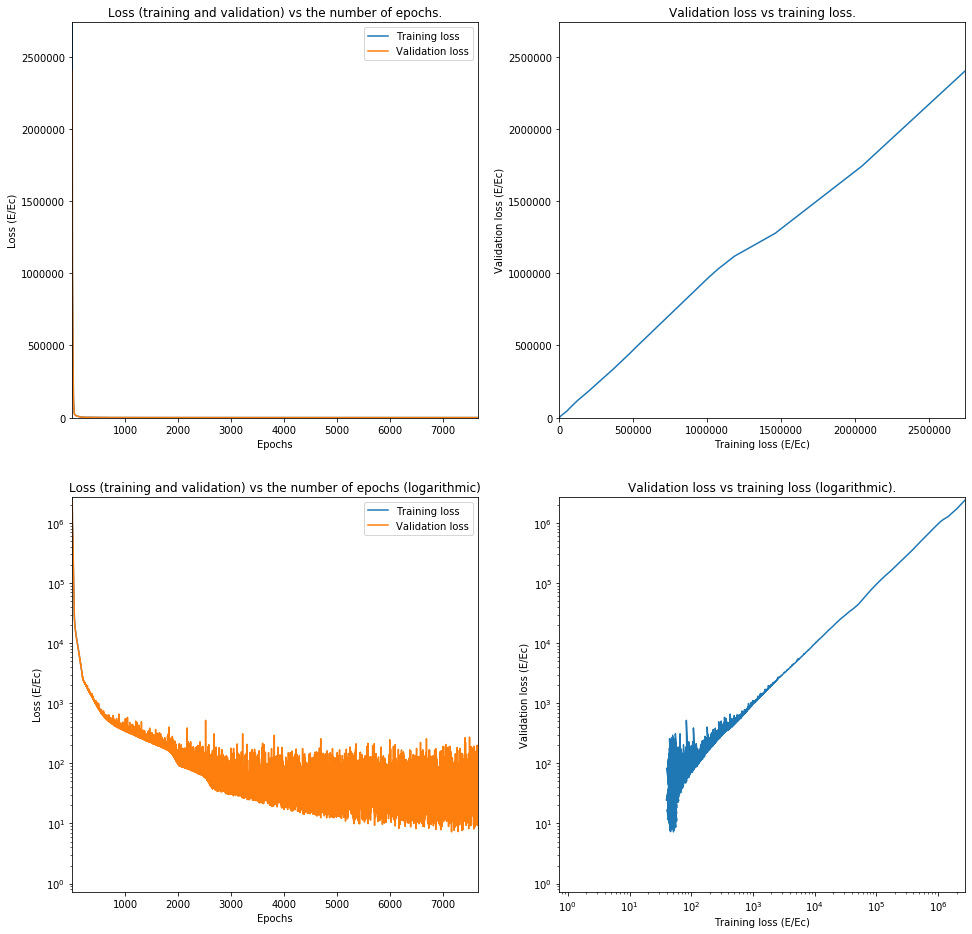

Train on 62644 samples, validate on 15662 samples
Epoch 1/25000
62644/62644 [==============================] - 2s 38us/step - loss: 4202295.7345 - val_loss: 3871501.7714
Epoch 2/25000
62644/62644 [==============================] - 2s 35us/step - loss: 3593115.7348 - val_loss: 3271352.6293
Epoch 3/25000
62644/62644 [==============================] - 2s 37us/step - loss: 2994118.4544 - val_loss: 2680158.6394
Epoch 4/25000
62644/62644 [==============================] - 2s 36us/step - loss: 2401905.0369 - val_loss: 2095329.2291
Epoch 5/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1815069.6121 - val_loss: 1516207.4845
Epoch 6/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1235712.3438 - val_loss: 943362.1020
Epoch 7/25000
62644/62644 [==============================] - 2s 36us/step - loss: 756426.0414 - val_loss: 621485.2795
Epoch 8/25000
62644/62644 [==============================] - 2s 36us/step - loss: 550352.2832 - val_loss: 496714.

62644/62644 [==============================] - 2s 37us/step - loss: 32256.0911 - val_loss: 32341.7905
Epoch 71/25000
62644/62644 [==============================] - 2s 38us/step - loss: 31924.9366 - val_loss: 32011.0686
Epoch 72/25000
62644/62644 [==============================] - 2s 39us/step - loss: 31600.9056 - val_loss: 31670.4412
Epoch 73/25000
62644/62644 [==============================] - 2s 38us/step - loss: 31279.8556 - val_loss: 31345.0689
Epoch 74/25000
62644/62644 [==============================] - 2s 37us/step - loss: 30965.1075 - val_loss: 31047.7025
Epoch 75/25000
62644/62644 [==============================] - 2s 36us/step - loss: 30659.7706 - val_loss: 30706.1456
Epoch 76/25000
62644/62644 [==============================] - 2s 37us/step - loss: 30369.8465 - val_loss: 30396.3572
Epoch 77/25000
62644/62644 [==============================] - 2s 36us/step - loss: 30084.9769 - val_loss: 30109.5686
Epoch 78/25000
62644/62644 [==============================] - 2s 36us/step - lo

Epoch 140/25000
62644/62644 [==============================] - 2s 37us/step - loss: 16898.6713 - val_loss: 16746.6784
Epoch 141/25000
62644/62644 [==============================] - 2s 36us/step - loss: 16751.6316 - val_loss: 16580.0965
Epoch 142/25000
62644/62644 [==============================] - 2s 38us/step - loss: 16591.6377 - val_loss: 16389.1870
Epoch 143/25000
62644/62644 [==============================] - 2s 36us/step - loss: 16438.7748 - val_loss: 16304.4140
Epoch 144/25000
62644/62644 [==============================] - 2s 36us/step - loss: 16295.2148 - val_loss: 16090.9503
Epoch 145/25000
62644/62644 [==============================] - 2s 37us/step - loss: 16142.6030 - val_loss: 15958.4902
Epoch 146/25000
62644/62644 [==============================] - 2s 40us/step - loss: 16001.2885 - val_loss: 15786.5771
Epoch 147/25000
62644/62644 [==============================] - 2s 36us/step - loss: 15846.2710 - val_loss: 15701.6866
Epoch 148/25000
62644/62644 [===========================

62644/62644 [==============================] - 2s 35us/step - loss: 8619.2516 - val_loss: 8334.2751
Epoch 210/25000
62644/62644 [==============================] - 2s 37us/step - loss: 8534.5674 - val_loss: 8228.0069
Epoch 211/25000
62644/62644 [==============================] - 2s 36us/step - loss: 8446.8869 - val_loss: 8143.3492
Epoch 212/25000
62644/62644 [==============================] - 2s 36us/step - loss: 8364.9225 - val_loss: 8056.2176
Epoch 213/25000
62644/62644 [==============================] - 2s 36us/step - loss: 8273.7303 - val_loss: 7978.2572
Epoch 214/25000
62644/62644 [==============================] - 2s 38us/step - loss: 8195.9826 - val_loss: 7929.8476
Epoch 215/25000
62644/62644 [==============================] - 2s 37us/step - loss: 8115.6133 - val_loss: 7815.7798
Epoch 216/25000
62644/62644 [==============================] - 2s 37us/step - loss: 8033.7135 - val_loss: 7745.3987
Epoch 217/25000
62644/62644 [==============================] - 2s 38us/step - loss: 7946

Epoch 280/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4146.8334 - val_loss: 3906.3016
Epoch 281/25000
62644/62644 [==============================] - 2s 36us/step - loss: 4110.2838 - val_loss: 3849.5589
Epoch 282/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4061.1223 - val_loss: 3830.2865
Epoch 283/25000
62644/62644 [==============================] - 2s 36us/step - loss: 4010.9455 - val_loss: 3761.9847
Epoch 284/25000
62644/62644 [==============================] - 2s 36us/step - loss: 3973.4743 - val_loss: 3847.6785
Epoch 285/25000
62644/62644 [==============================] - 2s 37us/step - loss: 3929.9050 - val_loss: 3680.4017
Epoch 286/25000
62644/62644 [==============================] - 2s 36us/step - loss: 3880.3231 - val_loss: 3638.7408
Epoch 287/25000
62644/62644 [==============================] - 2s 36us/step - loss: 3846.6776 - val_loss: 3628.9173
Epoch 288/25000
62644/62644 [==============================] - 2s 37us/s

62644/62644 [==============================] - 2s 38us/step - loss: 1750.4380 - val_loss: 1710.3527
Epoch 351/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1730.3787 - val_loss: 1709.6458
Epoch 352/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1711.7505 - val_loss: 1679.4916
Epoch 353/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1689.8925 - val_loss: 1675.2612
Epoch 354/25000
62644/62644 [==============================] - 2s 38us/step - loss: 1664.0888 - val_loss: 1680.9809
Epoch 355/25000
62644/62644 [==============================] - 2s 36us/step - loss: 1645.1036 - val_loss: 1611.9828
Epoch 356/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1627.0274 - val_loss: 1603.3054
Epoch 357/25000
62644/62644 [==============================] - 2s 39us/step - loss: 1611.1564 - val_loss: 1603.5745
Epoch 358/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1586

Epoch 421/25000
62644/62644 [==============================] - 2s 38us/step - loss: 982.9427 - val_loss: 943.0109
Epoch 422/25000
62644/62644 [==============================] - 2s 36us/step - loss: 972.0437 - val_loss: 923.1787
Epoch 423/25000
62644/62644 [==============================] - 2s 37us/step - loss: 967.4108 - val_loss: 926.8857
Epoch 424/25000
62644/62644 [==============================] - 2s 36us/step - loss: 959.5084 - val_loss: 906.6434
Epoch 425/25000
62644/62644 [==============================] - 2s 36us/step - loss: 953.2507 - val_loss: 914.8830
Epoch 426/25000
62644/62644 [==============================] - 2s 36us/step - loss: 950.2949 - val_loss: 894.9683
Epoch 427/25000
62644/62644 [==============================] - 2s 37us/step - loss: 954.8787 - val_loss: 898.2966
Epoch 428/25000
62644/62644 [==============================] - 2s 35us/step - loss: 944.3557 - val_loss: 901.8518
Epoch 429/25000
62644/62644 [==============================] - 2s 36us/step - loss: 933.

Epoch 493/25000
62644/62644 [==============================] - 2s 36us/step - loss: 659.8283 - val_loss: 624.8368
Epoch 494/25000
62644/62644 [==============================] - 2s 34us/step - loss: 655.6418 - val_loss: 617.5896
Epoch 495/25000
62644/62644 [==============================] - 2s 34us/step - loss: 653.5659 - val_loss: 612.6138
Epoch 496/25000
62644/62644 [==============================] - 2s 39us/step - loss: 648.5969 - val_loss: 607.7345
Epoch 497/25000
62644/62644 [==============================] - 2s 36us/step - loss: 645.7744 - val_loss: 604.9910
Epoch 498/25000
62644/62644 [==============================] - 2s 35us/step - loss: 644.9401 - val_loss: 605.9979
Epoch 499/25000
62644/62644 [==============================] - 2s 35us/step - loss: 639.2954 - val_loss: 598.9057
Epoch 500/25000
62644/62644 [==============================] - 2s 33us/step - loss: 638.0583 - val_loss: 595.9328
Epoch 501/25000
62644/62644 [==============================] - 2s 34us/step - loss: 633.

Epoch 565/25000
62644/62644 [==============================] - 2s 34us/step - loss: 453.9351 - val_loss: 425.8810
Epoch 566/25000
62644/62644 [==============================] - 2s 33us/step - loss: 449.9526 - val_loss: 514.4331
Epoch 567/25000
62644/62644 [==============================] - 2s 34us/step - loss: 445.9319 - val_loss: 422.3726
Epoch 568/25000
62644/62644 [==============================] - 2s 34us/step - loss: 443.0157 - val_loss: 426.2056
Epoch 569/25000
62644/62644 [==============================] - 2s 34us/step - loss: 442.7013 - val_loss: 447.6292
Epoch 570/25000
62644/62644 [==============================] - 2s 35us/step - loss: 440.8499 - val_loss: 425.3593
Epoch 571/25000
62644/62644 [==============================] - 2s 35us/step - loss: 440.0400 - val_loss: 412.9877
Epoch 572/25000
62644/62644 [==============================] - 2s 36us/step - loss: 435.6483 - val_loss: 439.2233
Epoch 573/25000
62644/62644 [==============================] - 2s 36us/step - loss: 433.

Epoch 637/25000
62644/62644 [==============================] - 2s 35us/step - loss: 327.9758 - val_loss: 309.3517
Epoch 638/25000
62644/62644 [==============================] - 2s 33us/step - loss: 326.1003 - val_loss: 316.5680
Epoch 639/25000
62644/62644 [==============================] - 2s 36us/step - loss: 327.9343 - val_loss: 314.3992
Epoch 640/25000
62644/62644 [==============================] - 2s 35us/step - loss: 324.5107 - val_loss: 303.7797
Epoch 641/25000
62644/62644 [==============================] - 2s 35us/step - loss: 325.8288 - val_loss: 334.8144
Epoch 642/25000
62644/62644 [==============================] - 2s 35us/step - loss: 325.1909 - val_loss: 327.9891
Epoch 643/25000
62644/62644 [==============================] - 2s 38us/step - loss: 322.4429 - val_loss: 310.8026
Epoch 644/25000
62644/62644 [==============================] - 2s 34us/step - loss: 320.3280 - val_loss: 301.8404
Epoch 645/25000
62644/62644 [==============================] - 2s 33us/step - loss: 320.

Epoch 709/25000
62644/62644 [==============================] - 2s 34us/step - loss: 265.3613 - val_loss: 245.3058
Epoch 710/25000
62644/62644 [==============================] - 2s 34us/step - loss: 263.1212 - val_loss: 253.6188
Epoch 711/25000
62644/62644 [==============================] - 2s 35us/step - loss: 262.8850 - val_loss: 246.4665
Epoch 712/25000
62644/62644 [==============================] - 2s 35us/step - loss: 264.8153 - val_loss: 248.0190
Epoch 713/25000
62644/62644 [==============================] - 2s 34us/step - loss: 263.9365 - val_loss: 250.2459
Epoch 714/25000
62644/62644 [==============================] - 2s 34us/step - loss: 263.5740 - val_loss: 254.7894
Epoch 715/25000
62644/62644 [==============================] - 2s 34us/step - loss: 265.1156 - val_loss: 269.6804
Epoch 716/25000
62644/62644 [==============================] - 2s 35us/step - loss: 263.5335 - val_loss: 270.0810
Epoch 717/25000
62644/62644 [==============================] - 2s 34us/step - loss: 262.

Epoch 781/25000
62644/62644 [==============================] - 2s 33us/step - loss: 230.2653 - val_loss: 217.4873
Epoch 782/25000
62644/62644 [==============================] - 2s 33us/step - loss: 233.9850 - val_loss: 281.6539
Epoch 783/25000
62644/62644 [==============================] - 2s 35us/step - loss: 231.5028 - val_loss: 253.9486
Epoch 784/25000
62644/62644 [==============================] - 2s 34us/step - loss: 230.2324 - val_loss: 211.7604
Epoch 785/25000
62644/62644 [==============================] - 2s 33us/step - loss: 230.1224 - val_loss: 257.2580
Epoch 786/25000
62644/62644 [==============================] - 2s 35us/step - loss: 231.0217 - val_loss: 235.0168
Epoch 787/25000
62644/62644 [==============================] - 2s 33us/step - loss: 228.0965 - val_loss: 266.1032
Epoch 788/25000
62644/62644 [==============================] - 2s 34us/step - loss: 229.8006 - val_loss: 210.4037
Epoch 789/25000
62644/62644 [==============================] - 2s 35us/step - loss: 232.

Epoch 853/25000
62644/62644 [==============================] - 2s 37us/step - loss: 211.3420 - val_loss: 185.8461
Epoch 854/25000
62644/62644 [==============================] - 2s 37us/step - loss: 206.7786 - val_loss: 187.7734
Epoch 855/25000
62644/62644 [==============================] - 2s 35us/step - loss: 210.9178 - val_loss: 187.4407
Epoch 856/25000
62644/62644 [==============================] - 2s 34us/step - loss: 209.7260 - val_loss: 186.7522
Epoch 857/25000
62644/62644 [==============================] - 2s 34us/step - loss: 210.1029 - val_loss: 190.6648
Epoch 858/25000
62644/62644 [==============================] - 2s 34us/step - loss: 211.0636 - val_loss: 184.1550
Epoch 859/25000
62644/62644 [==============================] - 2s 35us/step - loss: 206.1190 - val_loss: 184.6665
Epoch 860/25000
62644/62644 [==============================] - 2s 34us/step - loss: 207.9233 - val_loss: 186.9138
Epoch 861/25000
62644/62644 [==============================] - 2s 34us/step - loss: 207.

Epoch 925/25000
62644/62644 [==============================] - 2s 30us/step - loss: 195.4488 - val_loss: 182.0251
Epoch 926/25000
62644/62644 [==============================] - 2s 30us/step - loss: 195.3126 - val_loss: 169.9446
Epoch 927/25000
62644/62644 [==============================] - 2s 32us/step - loss: 194.9308 - val_loss: 177.6764
Epoch 928/25000
62644/62644 [==============================] - 2s 32us/step - loss: 195.2905 - val_loss: 173.0647
Epoch 929/25000
62644/62644 [==============================] - 2s 31us/step - loss: 195.0753 - val_loss: 172.1504
Epoch 930/25000
62644/62644 [==============================] - 2s 32us/step - loss: 194.3964 - val_loss: 188.1495
Epoch 931/25000
62644/62644 [==============================] - 2s 32us/step - loss: 193.1227 - val_loss: 170.8609
Epoch 932/25000
62644/62644 [==============================] - 2s 32us/step - loss: 194.8559 - val_loss: 171.8296
Epoch 933/25000
62644/62644 [==============================] - 2s 31us/step - loss: 189.

Epoch 997/25000
62644/62644 [==============================] - 2s 31us/step - loss: 180.7187 - val_loss: 155.6147
Epoch 998/25000
62644/62644 [==============================] - 2s 31us/step - loss: 179.9443 - val_loss: 163.3889
Epoch 999/25000
62644/62644 [==============================] - 2s 31us/step - loss: 183.8845 - val_loss: 206.4211
Epoch 1000/25000
62644/62644 [==============================] - 2s 31us/step - loss: 180.7300 - val_loss: 149.8035
Epoch 1001/25000
62644/62644 [==============================] - 2s 33us/step - loss: 179.3179 - val_loss: 153.8040
Epoch 1002/25000
62644/62644 [==============================] - 2s 33us/step - loss: 180.4980 - val_loss: 151.8959
Epoch 1003/25000
62644/62644 [==============================] - 2s 30us/step - loss: 178.5035 - val_loss: 157.6752
Epoch 1004/25000
62644/62644 [==============================] - 2s 31us/step - loss: 177.0206 - val_loss: 158.0608
Epoch 1005/25000
62644/62644 [==============================] - 2s 33us/step - loss

62644/62644 [==============================] - 2s 32us/step - loss: 170.7019 - val_loss: 142.0967
Epoch 1069/25000
62644/62644 [==============================] - 2s 31us/step - loss: 165.4180 - val_loss: 137.9274
Epoch 1070/25000
62644/62644 [==============================] - 2s 33us/step - loss: 166.8302 - val_loss: 150.1698
Epoch 1071/25000
62644/62644 [==============================] - 2s 32us/step - loss: 169.7623 - val_loss: 177.1099
Epoch 1072/25000
62644/62644 [==============================] - 2s 32us/step - loss: 168.9272 - val_loss: 141.2027
Epoch 1073/25000
62644/62644 [==============================] - 2s 31us/step - loss: 169.8911 - val_loss: 143.4243
Epoch 1074/25000
62644/62644 [==============================] - 2s 33us/step - loss: 168.4104 - val_loss: 170.3338
Epoch 1075/25000
62644/62644 [==============================] - 2s 30us/step - loss: 167.5607 - val_loss: 137.9435
Epoch 1076/25000
62644/62644 [==============================] - 2s 31us/step - loss: 172.0479 - v

62644/62644 [==============================] - 2s 33us/step - loss: 157.9214 - val_loss: 128.7393
Epoch 1140/25000
62644/62644 [==============================] - 2s 33us/step - loss: 159.1821 - val_loss: 136.7031
Epoch 1141/25000
62644/62644 [==============================] - 2s 33us/step - loss: 158.4870 - val_loss: 134.1244
Epoch 1142/25000
62644/62644 [==============================] - 2s 33us/step - loss: 157.8598 - val_loss: 149.2341
Epoch 1143/25000
62644/62644 [==============================] - 2s 31us/step - loss: 158.0846 - val_loss: 129.7226
Epoch 1144/25000
62644/62644 [==============================] - 2s 34us/step - loss: 157.2503 - val_loss: 139.1301
Epoch 1145/25000
62644/62644 [==============================] - 2s 33us/step - loss: 157.3382 - val_loss: 135.1186
Epoch 1146/25000
62644/62644 [==============================] - 2s 31us/step - loss: 156.6773 - val_loss: 147.4590
Epoch 1147/25000
62644/62644 [==============================] - 2s 32us/step - loss: 157.5555 - v

62644/62644 [==============================] - 2s 31us/step - loss: 151.8685 - val_loss: 161.8093
Epoch 1211/25000
62644/62644 [==============================] - 2s 32us/step - loss: 149.4466 - val_loss: 137.1462
Epoch 1212/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.5489 - val_loss: 123.1089
Epoch 1213/25000
62644/62644 [==============================] - 2s 33us/step - loss: 150.3954 - val_loss: 122.0040
Epoch 1214/25000
62644/62644 [==============================] - 2s 33us/step - loss: 149.0581 - val_loss: 133.8732
Epoch 1215/25000
62644/62644 [==============================] - 2s 34us/step - loss: 150.6704 - val_loss: 129.1492
Epoch 1216/25000
62644/62644 [==============================] - 2s 33us/step - loss: 148.6460 - val_loss: 120.6625
Epoch 1217/25000
62644/62644 [==============================] - 2s 32us/step - loss: 151.0906 - val_loss: 191.8653
Epoch 1218/25000
62644/62644 [==============================] - 2s 31us/step - loss: 148.3987 - v

62644/62644 [==============================] - 2s 33us/step - loss: 145.5505 - val_loss: 115.7084
Epoch 1282/25000
62644/62644 [==============================] - 2s 32us/step - loss: 141.9910 - val_loss: 188.3650
Epoch 1283/25000
62644/62644 [==============================] - 2s 31us/step - loss: 146.6586 - val_loss: 123.1784
Epoch 1284/25000
62644/62644 [==============================] - 2s 32us/step - loss: 139.8836 - val_loss: 120.5540
Epoch 1285/25000
62644/62644 [==============================] - 2s 31us/step - loss: 143.8454 - val_loss: 114.2239
Epoch 1286/25000
62644/62644 [==============================] - 2s 32us/step - loss: 142.7488 - val_loss: 131.5807
Epoch 1287/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.9117 - val_loss: 122.0474
Epoch 1288/25000
62644/62644 [==============================] - 2s 33us/step - loss: 143.6233 - val_loss: 114.8871
Epoch 1289/25000
62644/62644 [==============================] - 2s 32us/step - loss: 140.5971 - v

62644/62644 [==============================] - 2s 31us/step - loss: 137.7870 - val_loss: 118.7224
Epoch 1353/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.1507 - val_loss: 190.6083
Epoch 1354/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.5226 - val_loss: 112.1149
Epoch 1355/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.1115 - val_loss: 110.3789
Epoch 1356/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.4110 - val_loss: 166.5464
Epoch 1357/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.6853 - val_loss: 115.1149
Epoch 1358/25000
62644/62644 [==============================] - 2s 31us/step - loss: 136.2182 - val_loss: 109.2039
Epoch 1359/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.0943 - val_loss: 141.3211
Epoch 1360/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.8801 - v

62644/62644 [==============================] - 2s 31us/step - loss: 132.2212 - val_loss: 138.8384
Epoch 1424/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.0839 - val_loss: 240.3272
Epoch 1425/25000
62644/62644 [==============================] - 2s 30us/step - loss: 132.9092 - val_loss: 145.8932
Epoch 1426/25000
62644/62644 [==============================] - 2s 33us/step - loss: 131.1709 - val_loss: 127.8937
Epoch 1427/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.7300 - val_loss: 113.2913
Epoch 1428/25000
62644/62644 [==============================] - 2s 33us/step - loss: 129.9925 - val_loss: 146.4851
Epoch 1429/25000
62644/62644 [==============================] - 2s 31us/step - loss: 131.3954 - val_loss: 257.8947
Epoch 1430/25000
62644/62644 [==============================] - 2s 32us/step - loss: 131.5730 - val_loss: 126.5582
Epoch 1431/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.4559 - v

62644/62644 [==============================] - 2s 32us/step - loss: 128.2771 - val_loss: 98.3195
Epoch 1495/25000
62644/62644 [==============================] - 2s 33us/step - loss: 126.3690 - val_loss: 98.7532
Epoch 1496/25000
62644/62644 [==============================] - 2s 33us/step - loss: 125.9315 - val_loss: 124.7233
Epoch 1497/25000
62644/62644 [==============================] - 2s 34us/step - loss: 126.8240 - val_loss: 101.7014
Epoch 1498/25000
62644/62644 [==============================] - 2s 33us/step - loss: 127.8985 - val_loss: 182.4423
Epoch 1499/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.8948 - val_loss: 102.7708
Epoch 1500/25000
62644/62644 [==============================] - 2s 32us/step - loss: 124.9965 - val_loss: 108.0229
Epoch 1501/25000
62644/62644 [==============================] - 2s 32us/step - loss: 127.6400 - val_loss: 109.7184
Epoch 1502/25000
62644/62644 [==============================] - 2s 33us/step - loss: 127.3950 - val

62644/62644 [==============================] - 2s 30us/step - loss: 118.5994 - val_loss: 95.9319
Epoch 1566/25000
62644/62644 [==============================] - 2s 31us/step - loss: 123.1053 - val_loss: 94.4022
Epoch 1567/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.2679 - val_loss: 109.1674
Epoch 1568/25000
62644/62644 [==============================] - 2s 32us/step - loss: 121.4244 - val_loss: 93.5023
Epoch 1569/25000
62644/62644 [==============================] - 2s 34us/step - loss: 119.0931 - val_loss: 102.5066
Epoch 1570/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.3501 - val_loss: 155.3945
Epoch 1571/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.7003 - val_loss: 125.9792
Epoch 1572/25000
62644/62644 [==============================] - 2s 32us/step - loss: 122.3063 - val_loss: 101.4603
Epoch 1573/25000
62644/62644 [==============================] - 2s 33us/step - loss: 119.5816 - val_

62644/62644 [==============================] - 2s 32us/step - loss: 115.2072 - val_loss: 92.9816
Epoch 1637/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.7675 - val_loss: 89.2140
Epoch 1638/25000
62644/62644 [==============================] - 2s 30us/step - loss: 116.6023 - val_loss: 93.1642
Epoch 1639/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.5211 - val_loss: 106.3438
Epoch 1640/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.6804 - val_loss: 92.1321
Epoch 1641/25000
62644/62644 [==============================] - 2s 30us/step - loss: 115.6033 - val_loss: 92.3124
Epoch 1642/25000
62644/62644 [==============================] - 2s 31us/step - loss: 116.8098 - val_loss: 99.6004
Epoch 1643/25000
62644/62644 [==============================] - 2s 32us/step - loss: 117.6174 - val_loss: 124.8904
Epoch 1644/25000
62644/62644 [==============================] - 2s 32us/step - loss: 115.6125 - val_los

Epoch 1708/25000
62644/62644 [==============================] - 2s 30us/step - loss: 113.5721 - val_loss: 131.7821
Epoch 1709/25000
62644/62644 [==============================] - 2s 31us/step - loss: 115.3687 - val_loss: 89.4855
Epoch 1710/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.0639 - val_loss: 92.1207
Epoch 1711/25000
62644/62644 [==============================] - 2s 30us/step - loss: 113.6023 - val_loss: 88.9274
Epoch 1712/25000
62644/62644 [==============================] - 2s 32us/step - loss: 114.0621 - val_loss: 85.6004
Epoch 1713/25000
62644/62644 [==============================] - 2s 31us/step - loss: 115.1602 - val_loss: 92.3726
Epoch 1714/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.7790 - val_loss: 91.9237
Epoch 1715/25000
62644/62644 [==============================] - 2s 30us/step - loss: 112.1433 - val_loss: 86.9977
Epoch 1716/25000
62644/62644 [==============================] - 2s 31us/step - loss: 11

62644/62644 [==============================] - 2s 32us/step - loss: 110.8875 - val_loss: 83.0880
Epoch 1780/25000
62644/62644 [==============================] - 2s 32us/step - loss: 109.4651 - val_loss: 93.2832
Epoch 1781/25000
62644/62644 [==============================] - 2s 31us/step - loss: 108.1082 - val_loss: 97.0820
Epoch 1782/25000
62644/62644 [==============================] - 2s 31us/step - loss: 108.0012 - val_loss: 99.5362
Epoch 1783/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.9475 - val_loss: 89.2742
Epoch 1784/25000
62644/62644 [==============================] - 2s 31us/step - loss: 107.2355 - val_loss: 127.7206
Epoch 1785/25000
62644/62644 [==============================] - 2s 32us/step - loss: 111.4680 - val_loss: 91.1329
Epoch 1786/25000
62644/62644 [==============================] - 2s 31us/step - loss: 109.2082 - val_loss: 86.6243
Epoch 1787/25000
62644/62644 [==============================] - 2s 31us/step - loss: 108.3964 - val_loss

Epoch 1851/25000
62644/62644 [==============================] - 2s 31us/step - loss: 106.7183 - val_loss: 91.8162
Epoch 1852/25000
62644/62644 [==============================] - 2s 31us/step - loss: 107.5828 - val_loss: 79.8160
Epoch 1853/25000
62644/62644 [==============================] - 2s 31us/step - loss: 104.8769 - val_loss: 80.6122
Epoch 1854/25000
62644/62644 [==============================] - 2s 31us/step - loss: 109.2244 - val_loss: 101.0406
Epoch 1855/25000
62644/62644 [==============================] - 2s 32us/step - loss: 106.9268 - val_loss: 141.6442
Epoch 1856/25000
62644/62644 [==============================] - 2s 31us/step - loss: 107.1681 - val_loss: 89.7273
Epoch 1857/25000
62644/62644 [==============================] - 2s 31us/step - loss: 105.7212 - val_loss: 89.2953
Epoch 1858/25000
62644/62644 [==============================] - 2s 32us/step - loss: 106.7515 - val_loss: 112.5004
Epoch 1859/25000
62644/62644 [==============================] - 2s 31us/step - loss: 

62644/62644 [==============================] - 2s 30us/step - loss: 101.8394 - val_loss: 84.0109
Epoch 1923/25000
62644/62644 [==============================] - 2s 31us/step - loss: 103.6485 - val_loss: 81.5563
Epoch 1924/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.1305 - val_loss: 95.6637
Epoch 1925/25000
62644/62644 [==============================] - 2s 31us/step - loss: 102.2754 - val_loss: 86.3590
Epoch 1926/25000
62644/62644 [==============================] - 2s 31us/step - loss: 105.2534 - val_loss: 110.9832
Epoch 1927/25000
62644/62644 [==============================] - 2s 32us/step - loss: 104.4576 - val_loss: 78.8456
Epoch 1928/25000
62644/62644 [==============================] - 2s 33us/step - loss: 103.5416 - val_loss: 75.8777
Epoch 1929/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.7092 - val_loss: 77.7971
Epoch 1930/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.3661 - val_loss

62644/62644 [==============================] - 2s 33us/step - loss: 98.0880 - val_loss: 77.7556
Epoch 1995/25000
62644/62644 [==============================] - 2s 34us/step - loss: 99.0786 - val_loss: 98.1041
Epoch 1996/25000
62644/62644 [==============================] - 2s 31us/step - loss: 99.5985 - val_loss: 99.9009
Epoch 1997/25000
62644/62644 [==============================] - 2s 31us/step - loss: 98.6801 - val_loss: 79.8657
Epoch 1998/25000
62644/62644 [==============================] - 2s 31us/step - loss: 101.8491 - val_loss: 109.2410
Epoch 1999/25000
62644/62644 [==============================] - 2s 31us/step - loss: 99.4910 - val_loss: 75.3909
Epoch 2000/25000
62644/62644 [==============================] - 2s 31us/step - loss: 100.7507 - val_loss: 82.6609
Epoch 2001/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.7744 - val_loss: 79.1785
Epoch 2002/25000
62644/62644 [==============================] - 2s 31us/step - loss: 99.0027 - val_loss: 99.0

62644/62644 [==============================] - 2s 30us/step - loss: 93.7397 - val_loss: 121.6873
Epoch 2067/25000
62644/62644 [==============================] - 2s 31us/step - loss: 96.6848 - val_loss: 73.8097
Epoch 2068/25000
62644/62644 [==============================] - 2s 31us/step - loss: 97.1294 - val_loss: 76.3923
Epoch 2069/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.1127 - val_loss: 145.6772
Epoch 2070/25000
62644/62644 [==============================] - 2s 31us/step - loss: 97.3149 - val_loss: 76.4898
Epoch 2071/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.5155 - val_loss: 70.5070
Epoch 2072/25000
62644/62644 [==============================] - 2s 31us/step - loss: 97.8893 - val_loss: 70.3088
Epoch 2073/25000
62644/62644 [==============================] - 2s 31us/step - loss: 94.9490 - val_loss: 115.1122
Epoch 2074/25000
62644/62644 [==============================] - 2s 30us/step - loss: 97.5604 - val_loss: 97.62

62644/62644 [==============================] - 2s 31us/step - loss: 95.5259 - val_loss: 80.0656
Epoch 2139/25000
62644/62644 [==============================] - 2s 31us/step - loss: 93.9947 - val_loss: 68.2302
Epoch 2140/25000
62644/62644 [==============================] - 2s 32us/step - loss: 91.8073 - val_loss: 72.6088
Epoch 2141/25000
62644/62644 [==============================] - 2s 31us/step - loss: 94.2745 - val_loss: 130.9873
Epoch 2142/25000
62644/62644 [==============================] - 2s 31us/step - loss: 93.9522 - val_loss: 71.6759
Epoch 2143/25000
62644/62644 [==============================] - 2s 31us/step - loss: 92.3054 - val_loss: 69.4920
Epoch 2144/25000
62644/62644 [==============================] - 2s 31us/step - loss: 96.7794 - val_loss: 67.4258
Epoch 2145/25000
62644/62644 [==============================] - 2s 32us/step - loss: 92.7494 - val_loss: 68.4465
Epoch 2146/25000
62644/62644 [==============================] - 2s 30us/step - loss: 95.7790 - val_loss: 102.231

62644/62644 [==============================] - 2s 32us/step - loss: 92.5671 - val_loss: 144.5957
Epoch 2211/25000
62644/62644 [==============================] - 2s 35us/step - loss: 90.4628 - val_loss: 74.5415
Epoch 2212/25000
62644/62644 [==============================] - 2s 33us/step - loss: 91.8260 - val_loss: 77.5904
Epoch 2213/25000
62644/62644 [==============================] - 2s 34us/step - loss: 89.6095 - val_loss: 79.8586
Epoch 2214/25000
62644/62644 [==============================] - 2s 32us/step - loss: 89.3311 - val_loss: 85.2231
Epoch 2215/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.0756 - val_loss: 69.7830
Epoch 2216/25000
62644/62644 [==============================] - 2s 31us/step - loss: 91.6334 - val_loss: 65.2095
Epoch 2217/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.3414 - val_loss: 83.3571
Epoch 2218/25000
62644/62644 [==============================] - 2s 31us/step - loss: 91.0532 - val_loss: 69.3407

62644/62644 [==============================] - 2s 32us/step - loss: 86.0143 - val_loss: 110.1231
Epoch 2283/25000
62644/62644 [==============================] - 2s 31us/step - loss: 88.6341 - val_loss: 84.7105
Epoch 2284/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.6608 - val_loss: 85.9170
Epoch 2285/25000
62644/62644 [==============================] - 2s 31us/step - loss: 88.1407 - val_loss: 66.3757
Epoch 2286/25000
62644/62644 [==============================] - 2s 31us/step - loss: 89.6567 - val_loss: 64.6438
Epoch 2287/25000
62644/62644 [==============================] - 2s 31us/step - loss: 90.2260 - val_loss: 80.9863
Epoch 2288/25000
62644/62644 [==============================] - 2s 31us/step - loss: 90.1638 - val_loss: 64.1971
Epoch 2289/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.5271 - val_loss: 80.1535
Epoch 2290/25000
62644/62644 [==============================] - 2s 32us/step - loss: 91.2165 - val_loss: 79.8485

62644/62644 [==============================] - 2s 32us/step - loss: 84.7799 - val_loss: 63.8628
Epoch 2355/25000
62644/62644 [==============================] - 2s 31us/step - loss: 86.5391 - val_loss: 96.6825
Epoch 2356/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.4913 - val_loss: 79.1521
Epoch 2357/25000
62644/62644 [==============================] - 2s 31us/step - loss: 88.0152 - val_loss: 62.3395
Epoch 2358/25000
62644/62644 [==============================] - 2s 32us/step - loss: 83.7501 - val_loss: 85.6901
Epoch 2359/25000
62644/62644 [==============================] - 2s 31us/step - loss: 84.4778 - val_loss: 61.9560
Epoch 2360/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.8481 - val_loss: 75.9209
Epoch 2361/25000
62644/62644 [==============================] - 2s 32us/step - loss: 84.5122 - val_loss: 70.8309
Epoch 2362/25000
62644/62644 [==============================] - 2s 33us/step - loss: 85.1107 - val_loss: 59.9728


62644/62644 [==============================] - 2s 33us/step - loss: 83.0433 - val_loss: 59.2694
Epoch 2427/25000
62644/62644 [==============================] - 2s 34us/step - loss: 81.8458 - val_loss: 61.0994
Epoch 2428/25000
62644/62644 [==============================] - 2s 34us/step - loss: 85.8888 - val_loss: 60.4837
Epoch 2429/25000
62644/62644 [==============================] - 2s 33us/step - loss: 84.1107 - val_loss: 82.9849
Epoch 2430/25000
62644/62644 [==============================] - 2s 33us/step - loss: 83.0421 - val_loss: 85.5152
Epoch 2431/25000
62644/62644 [==============================] - 2s 32us/step - loss: 84.4144 - val_loss: 68.4551
Epoch 2432/25000
62644/62644 [==============================] - 2s 32us/step - loss: 82.6114 - val_loss: 87.7067
Epoch 2433/25000
62644/62644 [==============================] - 2s 32us/step - loss: 83.0630 - val_loss: 72.2352
Epoch 2434/25000
62644/62644 [==============================] - 2s 32us/step - loss: 82.4842 - val_loss: 109.9822

62644/62644 [==============================] - 2s 33us/step - loss: 78.7530 - val_loss: 103.1793
Epoch 2499/25000
62644/62644 [==============================] - 2s 32us/step - loss: 83.2334 - val_loss: 63.6786
Epoch 2500/25000
62644/62644 [==============================] - 2s 31us/step - loss: 83.4203 - val_loss: 90.0714
Epoch 2501/25000
62644/62644 [==============================] - 2s 32us/step - loss: 80.8940 - val_loss: 62.2953
Epoch 2502/25000
62644/62644 [==============================] - 2s 31us/step - loss: 82.3200 - val_loss: 58.8815
Epoch 2503/25000
62644/62644 [==============================] - 2s 31us/step - loss: 80.2597 - val_loss: 57.3751
Epoch 2504/25000
62644/62644 [==============================] - 2s 32us/step - loss: 84.0469 - val_loss: 60.3055
Epoch 2505/25000
62644/62644 [==============================] - 2s 34us/step - loss: 80.7798 - val_loss: 74.0750
Epoch 2506/25000
62644/62644 [==============================] - 2s 33us/step - loss: 82.2800 - val_loss: 61.7149

62644/62644 [==============================] - 2s 31us/step - loss: 82.5113 - val_loss: 66.0350
Epoch 2571/25000
62644/62644 [==============================] - 2s 32us/step - loss: 78.3238 - val_loss: 57.3029
Epoch 2572/25000
62644/62644 [==============================] - 2s 31us/step - loss: 79.5086 - val_loss: 105.9249
Epoch 2573/25000
62644/62644 [==============================] - 2s 31us/step - loss: 78.8783 - val_loss: 62.6377
Epoch 2574/25000
62644/62644 [==============================] - 2s 31us/step - loss: 78.6034 - val_loss: 61.8124
Epoch 2575/25000
62644/62644 [==============================] - 2s 32us/step - loss: 78.1842 - val_loss: 60.2736
Epoch 2576/25000
62644/62644 [==============================] - 2s 33us/step - loss: 78.6563 - val_loss: 96.5739
Epoch 2577/25000
62644/62644 [==============================] - 2s 32us/step - loss: 77.9341 - val_loss: 60.1661
Epoch 2578/25000
62644/62644 [==============================] - 2s 32us/step - loss: 80.6438 - val_loss: 60.7543

62644/62644 [==============================] - 2s 33us/step - loss: 79.0681 - val_loss: 58.3902
Epoch 2643/25000
62644/62644 [==============================] - 2s 38us/step - loss: 74.6350 - val_loss: 55.5298
Epoch 2644/25000
62644/62644 [==============================] - 2s 36us/step - loss: 75.5251 - val_loss: 62.9312
Epoch 2645/25000
62644/62644 [==============================] - 2s 35us/step - loss: 79.2721 - val_loss: 60.8715
Epoch 2646/25000
62644/62644 [==============================] - 2s 34us/step - loss: 75.6765 - val_loss: 79.2947
Epoch 2647/25000
62644/62644 [==============================] - 2s 32us/step - loss: 77.8333 - val_loss: 84.1068
Epoch 2648/25000
62644/62644 [==============================] - 2s 31us/step - loss: 82.3698 - val_loss: 52.8355
Epoch 2649/25000
62644/62644 [==============================] - 2s 31us/step - loss: 77.4215 - val_loss: 71.6980
Epoch 2650/25000
62644/62644 [==============================] - 2s 32us/step - loss: 78.6890 - val_loss: 53.9112


62644/62644 [==============================] - 2s 33us/step - loss: 74.8581 - val_loss: 101.9493
Epoch 2715/25000
62644/62644 [==============================] - 2s 31us/step - loss: 75.0325 - val_loss: 50.5907
Epoch 2716/25000
62644/62644 [==============================] - 2s 32us/step - loss: 77.2274 - val_loss: 52.3686
Epoch 2717/25000
62644/62644 [==============================] - 2s 33us/step - loss: 76.0669 - val_loss: 75.9595
Epoch 2718/25000
62644/62644 [==============================] - 2s 32us/step - loss: 78.3218 - val_loss: 63.2037
Epoch 2719/25000
62644/62644 [==============================] - 2s 34us/step - loss: 76.4345 - val_loss: 57.7158
Epoch 2720/25000
62644/62644 [==============================] - 2s 36us/step - loss: 75.1191 - val_loss: 52.5730
Epoch 2721/25000
62644/62644 [==============================] - 2s 36us/step - loss: 74.9941 - val_loss: 52.5194
Epoch 2722/25000
62644/62644 [==============================] - 2s 33us/step - loss: 74.8552 - val_loss: 52.8711

62644/62644 [==============================] - 2s 32us/step - loss: 74.9033 - val_loss: 50.5864
Epoch 2787/25000
62644/62644 [==============================] - 2s 32us/step - loss: 73.4085 - val_loss: 52.1526
Epoch 2788/25000
62644/62644 [==============================] - 2s 33us/step - loss: 72.7040 - val_loss: 51.7319
Epoch 2789/25000
62644/62644 [==============================] - 2s 31us/step - loss: 71.3096 - val_loss: 70.0893
Epoch 2790/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.0891 - val_loss: 64.9592
Epoch 2791/25000
62644/62644 [==============================] - 2s 32us/step - loss: 75.7676 - val_loss: 54.6940
Epoch 2792/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.5024 - val_loss: 52.8252
Epoch 2793/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.7255 - val_loss: 51.8402
Epoch 2794/25000
62644/62644 [==============================] - 2s 34us/step - loss: 70.9310 - val_loss: 48.6775


62644/62644 [==============================] - 2s 33us/step - loss: 71.8232 - val_loss: 101.7326
Epoch 2859/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.1743 - val_loss: 92.9391
Epoch 2860/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.7241 - val_loss: 81.9521
Epoch 2861/25000
62644/62644 [==============================] - 2s 34us/step - loss: 71.7458 - val_loss: 58.7126
Epoch 2862/25000
62644/62644 [==============================] - 2s 34us/step - loss: 72.6731 - val_loss: 48.2658
Epoch 2863/25000
62644/62644 [==============================] - 2s 35us/step - loss: 69.8850 - val_loss: 75.5302
Epoch 2864/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.6811 - val_loss: 61.6077
Epoch 2865/25000
62644/62644 [==============================] - 2s 34us/step - loss: 70.3523 - val_loss: 60.9225
Epoch 2866/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.7719 - val_loss: 100.298

62644/62644 [==============================] - 2s 31us/step - loss: 68.9568 - val_loss: 75.6412
Epoch 2931/25000
62644/62644 [==============================] - 2s 33us/step - loss: 69.2011 - val_loss: 56.2425
Epoch 2932/25000
62644/62644 [==============================] - 2s 35us/step - loss: 69.0746 - val_loss: 47.0924
Epoch 2933/25000
62644/62644 [==============================] - 2s 36us/step - loss: 69.1215 - val_loss: 49.6597
Epoch 2934/25000
62644/62644 [==============================] - 2s 35us/step - loss: 70.9146 - val_loss: 59.3597
Epoch 2935/25000
62644/62644 [==============================] - 2s 35us/step - loss: 67.9684 - val_loss: 51.7513
Epoch 2936/25000
62644/62644 [==============================] - 2s 31us/step - loss: 67.8340 - val_loss: 65.4419
Epoch 2937/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.7660 - val_loss: 59.9541
Epoch 2938/25000
62644/62644 [==============================] - 2s 33us/step - loss: 72.2502 - val_loss: 53.4865


62644/62644 [==============================] - 2s 32us/step - loss: 67.4129 - val_loss: 45.8929
Epoch 3003/25000
62644/62644 [==============================] - 2s 31us/step - loss: 67.3503 - val_loss: 62.3274
Epoch 3004/25000
62644/62644 [==============================] - 2s 34us/step - loss: 69.9120 - val_loss: 59.1158
Epoch 3005/25000
62644/62644 [==============================] - 2s 34us/step - loss: 70.8780 - val_loss: 44.5327
Epoch 3006/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.8804 - val_loss: 75.3146
Epoch 3007/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.3133 - val_loss: 50.0840
Epoch 3008/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.1368 - val_loss: 45.9034
Epoch 3009/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.4825 - val_loss: 56.0848
Epoch 3010/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.2501 - val_loss: 49.8188


62644/62644 [==============================] - 2s 31us/step - loss: 68.5226 - val_loss: 84.7366
Epoch 3075/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.8486 - val_loss: 61.1014
Epoch 3076/25000
62644/62644 [==============================] - 2s 31us/step - loss: 64.4024 - val_loss: 60.2986
Epoch 3077/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.1460 - val_loss: 43.4780
Epoch 3078/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.3099 - val_loss: 76.0596
Epoch 3079/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.5866 - val_loss: 120.9584
Epoch 3080/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.6470 - val_loss: 46.9158
Epoch 3081/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.5456 - val_loss: 43.3097
Epoch 3082/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.4265 - val_loss: 42.4937

62644/62644 [==============================] - 2s 31us/step - loss: 65.1482 - val_loss: 96.3786
Epoch 3147/25000
62644/62644 [==============================] - 2s 31us/step - loss: 63.1966 - val_loss: 49.0201
Epoch 3148/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.7995 - val_loss: 81.7545
Epoch 3149/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.7178 - val_loss: 69.5903
Epoch 3150/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.2632 - val_loss: 46.4268
Epoch 3151/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.7328 - val_loss: 110.8433
Epoch 3152/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.8710 - val_loss: 56.2095
Epoch 3153/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.9514 - val_loss: 43.7638
Epoch 3154/25000
62644/62644 [==============================] - 2s 31us/step - loss: 64.4512 - val_loss: 135.317

62644/62644 [==============================] - 2s 31us/step - loss: 62.8253 - val_loss: 46.7688
Epoch 3219/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.2820 - val_loss: 94.3373
Epoch 3220/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.7300 - val_loss: 105.5092
Epoch 3221/25000
62644/62644 [==============================] - 2s 31us/step - loss: 63.0562 - val_loss: 50.8557
Epoch 3222/25000
62644/62644 [==============================] - 2s 31us/step - loss: 63.6959 - val_loss: 63.4691
Epoch 3223/25000
62644/62644 [==============================] - 2s 31us/step - loss: 63.7522 - val_loss: 50.7959
Epoch 3224/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.7980 - val_loss: 49.6098
Epoch 3225/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.6063 - val_loss: 50.7283
Epoch 3226/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.8853 - val_loss: 55.4308

62644/62644 [==============================] - 2s 35us/step - loss: 61.6339 - val_loss: 60.5847
Epoch 3291/25000
62644/62644 [==============================] - 2s 36us/step - loss: 61.0227 - val_loss: 85.4620
Epoch 3292/25000
62644/62644 [==============================] - 2s 35us/step - loss: 61.7436 - val_loss: 42.2690
Epoch 3293/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.3359 - val_loss: 46.0718
Epoch 3294/25000
62644/62644 [==============================] - 2s 31us/step - loss: 62.6326 - val_loss: 88.6556
Epoch 3295/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.0658 - val_loss: 43.9810
Epoch 3296/25000
62644/62644 [==============================] - 2s 34us/step - loss: 62.0937 - val_loss: 66.9478
Epoch 3297/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.3090 - val_loss: 40.8795
Epoch 3298/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.2845 - val_loss: 39.6092


62644/62644 [==============================] - 2s 33us/step - loss: 59.9401 - val_loss: 38.2927
Epoch 3363/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.2738 - val_loss: 45.1714
Epoch 3364/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.7909 - val_loss: 37.9529
Epoch 3365/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.2495 - val_loss: 90.2184
Epoch 3366/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.4646 - val_loss: 60.9179
Epoch 3367/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.3325 - val_loss: 39.8431
Epoch 3368/25000
62644/62644 [==============================] - 2s 34us/step - loss: 59.0862 - val_loss: 39.7106
Epoch 3369/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.5129 - val_loss: 42.4185
Epoch 3370/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.5184 - val_loss: 51.8064


62644/62644 [==============================] - 2s 33us/step - loss: 60.1079 - val_loss: 112.0309
Epoch 3435/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.0560 - val_loss: 67.7602
Epoch 3436/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.0834 - val_loss: 37.0873
Epoch 3437/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.4692 - val_loss: 59.3961
Epoch 3438/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.6089 - val_loss: 97.5740
Epoch 3439/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.0076 - val_loss: 38.4092
Epoch 3440/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.8276 - val_loss: 75.2614
Epoch 3441/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58.6874 - val_loss: 87.7746
Epoch 3442/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.1562 - val_loss: 103.486

62644/62644 [==============================] - 2s 32us/step - loss: 57.0831 - val_loss: 35.5058
Epoch 3507/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.4348 - val_loss: 40.0394
Epoch 3508/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.8575 - val_loss: 50.4670
Epoch 3509/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.3171 - val_loss: 37.7110
Epoch 3510/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.5741 - val_loss: 79.8247
Epoch 3511/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.8035 - val_loss: 61.7760
Epoch 3512/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.3792 - val_loss: 56.0347
Epoch 3513/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.3740 - val_loss: 38.6847
Epoch 3514/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.9468 - val_loss: 45.2116


62644/62644 [==============================] - 2s 31us/step - loss: 56.3168 - val_loss: 43.8519
Epoch 3579/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.5069 - val_loss: 37.2282
Epoch 3580/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.1663 - val_loss: 63.0545
Epoch 3581/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.8091 - val_loss: 67.5085
Epoch 3582/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.9487 - val_loss: 80.8302
Epoch 3583/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.2786 - val_loss: 41.8541
Epoch 3584/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.3915 - val_loss: 39.2809
Epoch 3585/25000
62644/62644 [==============================] - 2s 35us/step - loss: 56.8802 - val_loss: 44.1034
Epoch 3586/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.7773 - val_loss: 43.6325


62644/62644 [==============================] - 2s 32us/step - loss: 52.2974 - val_loss: 39.9056
Epoch 3651/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.3934 - val_loss: 40.3012
Epoch 3652/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5384 - val_loss: 42.8092
Epoch 3653/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.1487 - val_loss: 44.2174
Epoch 3654/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.8199 - val_loss: 60.3628
Epoch 3655/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.1510 - val_loss: 37.0302
Epoch 3656/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.1957 - val_loss: 44.6243
Epoch 3657/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.9002 - val_loss: 51.3017
Epoch 3658/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.9252 - val_loss: 32.0184


62644/62644 [==============================] - 2s 35us/step - loss: 54.8498 - val_loss: 37.7285
Epoch 3723/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.4844 - val_loss: 33.9075
Epoch 3724/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.0709 - val_loss: 52.1524
Epoch 3725/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.3604 - val_loss: 34.1807
Epoch 3726/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.3193 - val_loss: 32.8427
Epoch 3727/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.0351 - val_loss: 34.2199
Epoch 3728/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.9487 - val_loss: 38.8537
Epoch 3729/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5440 - val_loss: 38.8594
Epoch 3730/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.2497 - val_loss: 31.5118


62644/62644 [==============================] - 2s 32us/step - loss: 51.0709 - val_loss: 69.2544
Epoch 3795/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.3868 - val_loss: 51.7162
Epoch 3796/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.2632 - val_loss: 54.4829
Epoch 3797/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.7293 - val_loss: 30.8234
Epoch 3798/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.1108 - val_loss: 29.9775
Epoch 3799/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.6352 - val_loss: 90.0556
Epoch 3800/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.8273 - val_loss: 40.5354
Epoch 3801/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.4360 - val_loss: 42.0672
Epoch 3802/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.3103 - val_loss: 37.7134


62644/62644 [==============================] - 2s 33us/step - loss: 47.5619 - val_loss: 42.1763
Epoch 3867/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.1741 - val_loss: 45.9299
Epoch 3868/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.3147 - val_loss: 82.5110
Epoch 3869/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.2442 - val_loss: 40.9237
Epoch 3870/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.4832 - val_loss: 47.8315
Epoch 3871/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.3404 - val_loss: 29.5931
Epoch 3872/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.7657 - val_loss: 35.1574
Epoch 3873/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.4840 - val_loss: 33.2105
Epoch 3874/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.1510 - val_loss: 54.5107


62644/62644 [==============================] - 2s 32us/step - loss: 52.7258 - val_loss: 29.2380
Epoch 3939/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.4391 - val_loss: 30.2174
Epoch 3940/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.6885 - val_loss: 74.1814
Epoch 3941/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.2935 - val_loss: 29.2886
Epoch 3942/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.6417 - val_loss: 31.8918
Epoch 3943/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.3320 - val_loss: 31.3183
Epoch 3944/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.4500 - val_loss: 32.9372
Epoch 3945/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.5458 - val_loss: 50.3112
Epoch 3946/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.6399 - val_loss: 51.9432


62644/62644 [==============================] - 2s 33us/step - loss: 47.7566 - val_loss: 33.6824
Epoch 4011/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.1760 - val_loss: 63.9605
Epoch 4012/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6552 - val_loss: 53.4832
Epoch 4013/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.0167 - val_loss: 41.9323
Epoch 4014/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.9227 - val_loss: 30.3073
Epoch 4015/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.9249 - val_loss: 33.2055
Epoch 4016/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.2353 - val_loss: 34.3850
Epoch 4017/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.4519 - val_loss: 77.4740
Epoch 4018/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0829 - val_loss: 53.5704


62644/62644 [==============================] - 2s 34us/step - loss: 47.0175 - val_loss: 26.9115
Epoch 4083/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.7167 - val_loss: 30.3736
Epoch 4084/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.6028 - val_loss: 56.0961
Epoch 4085/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.7239 - val_loss: 38.9119
Epoch 4086/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.7176 - val_loss: 66.8298
Epoch 4087/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.6888 - val_loss: 28.7022
Epoch 4088/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.0957 - val_loss: 59.5661
Epoch 4089/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.2177 - val_loss: 31.7377
Epoch 4090/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.8536 - val_loss: 64.0804


62644/62644 [==============================] - 2s 32us/step - loss: 47.0831 - val_loss: 73.5603
Epoch 4155/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.8827 - val_loss: 52.0443
Epoch 4156/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.0503 - val_loss: 44.3075
Epoch 4157/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.6862 - val_loss: 29.1190
Epoch 4158/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.2474 - val_loss: 135.5266
Epoch 4159/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0575 - val_loss: 29.8315
Epoch 4160/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.7659 - val_loss: 31.4182
Epoch 4161/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.2814 - val_loss: 70.3334
Epoch 4162/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.9421 - val_loss: 29.6694

62644/62644 [==============================] - 2s 34us/step - loss: 46.5108 - val_loss: 45.8583
Epoch 4227/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.0659 - val_loss: 31.7935
Epoch 4228/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.1451 - val_loss: 38.1245
Epoch 4229/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.9446 - val_loss: 36.2067
Epoch 4230/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.0840 - val_loss: 29.2300
Epoch 4231/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.0183 - val_loss: 43.7942
Epoch 4232/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.8751 - val_loss: 28.7637
Epoch 4233/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.2219 - val_loss: 32.5768
Epoch 4234/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.7125 - val_loss: 74.4587


62644/62644 [==============================] - 2s 32us/step - loss: 45.7591 - val_loss: 35.2373
Epoch 4299/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7659 - val_loss: 85.9002
Epoch 4300/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.7765 - val_loss: 35.8622
Epoch 4301/25000
62644/62644 [==============================] - 2s 33us/step - loss: 42.6870 - val_loss: 40.5490
Epoch 4302/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.1172 - val_loss: 73.8540
Epoch 4303/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.5116 - val_loss: 43.6335
Epoch 4304/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.4551 - val_loss: 50.4904
Epoch 4305/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.0907 - val_loss: 28.0230
Epoch 4306/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.2508 - val_loss: 55.3847


62644/62644 [==============================] - 2s 34us/step - loss: 46.1626 - val_loss: 74.7260
Epoch 4371/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.2166 - val_loss: 46.7254
Epoch 4372/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.5756 - val_loss: 28.5598
Epoch 4373/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.5428 - val_loss: 35.8585
Epoch 4374/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.2141 - val_loss: 80.7068
Epoch 4375/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.6211 - val_loss: 108.7867
Epoch 4376/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.0388 - val_loss: 28.4471
Epoch 4377/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.3520 - val_loss: 24.8068
Epoch 4378/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.4499 - val_loss: 59.0466

62644/62644 [==============================] - 2s 32us/step - loss: 41.0822 - val_loss: 25.4541
Epoch 4443/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.7503 - val_loss: 22.9734
Epoch 4444/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.7396 - val_loss: 25.7011
Epoch 4445/25000
62644/62644 [==============================] - 2s 33us/step - loss: 40.7346 - val_loss: 33.7793
Epoch 4446/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.5263 - val_loss: 22.6861
Epoch 4447/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.6004 - val_loss: 31.7519
Epoch 4448/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.2466 - val_loss: 34.2908
Epoch 4449/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.4466 - val_loss: 29.1676
Epoch 4450/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.0834 - val_loss: 45.7642


62644/62644 [==============================] - 2s 32us/step - loss: 43.0955 - val_loss: 33.7671
Epoch 4515/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.2608 - val_loss: 39.0960
Epoch 4516/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.3460 - val_loss: 30.0656
Epoch 4517/25000
62644/62644 [==============================] - 2s 32us/step - loss: 41.8093 - val_loss: 22.7654
Epoch 4518/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.6113 - val_loss: 51.1409
Epoch 4519/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.6879 - val_loss: 26.6049
Epoch 4520/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.5491 - val_loss: 28.0987
Epoch 4521/25000
62644/62644 [==============================] - 2s 33us/step - loss: 41.2350 - val_loss: 31.0527
Epoch 4522/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.5800 - val_loss: 51.2912


62644/62644 [==============================] - 2s 32us/step - loss: 41.9582 - val_loss: 61.3938
Epoch 4587/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.9834 - val_loss: 49.4780
Epoch 4588/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.9961 - val_loss: 27.3104
Epoch 4589/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.8947 - val_loss: 60.6313
Epoch 4590/25000
62644/62644 [==============================] - 2s 32us/step - loss: 41.2702 - val_loss: 42.8118
Epoch 4591/25000
62644/62644 [==============================] - 2s 33us/step - loss: 41.9197 - val_loss: 22.4206
Epoch 4592/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.4471 - val_loss: 38.4822
Epoch 4593/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.5996 - val_loss: 72.6085
Epoch 4594/25000
62644/62644 [==============================] - 2s 35us/step - loss: 43.3885 - val_loss: 23.2400


62644/62644 [==============================] - 2s 32us/step - loss: 43.6732 - val_loss: 26.2621
Epoch 4659/25000
62644/62644 [==============================] - 2s 33us/step - loss: 42.1009 - val_loss: 40.5651
Epoch 4660/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.9456 - val_loss: 47.4158
Epoch 4661/25000
62644/62644 [==============================] - 2s 32us/step - loss: 41.9187 - val_loss: 64.5963
Epoch 4662/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.8200 - val_loss: 25.9121
Epoch 4663/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.3995 - val_loss: 40.4302
Epoch 4664/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.4353 - val_loss: 75.3441
Epoch 4665/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.7885 - val_loss: 24.7962
Epoch 4666/25000
62644/62644 [==============================] - 2s 31us/step - loss: 42.6382 - val_loss: 28.8421


62644/62644 [==============================] - 2s 32us/step - loss: 42.8076 - val_loss: 26.5550
Epoch 4731/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.3342 - val_loss: 40.3396
Epoch 4732/25000
62644/62644 [==============================] - 2s 31us/step - loss: 39.4740 - val_loss: 101.3969
Epoch 4733/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.2347 - val_loss: 25.7649
Epoch 4734/25000
62644/62644 [==============================] - 2s 33us/step - loss: 41.2474 - val_loss: 23.0986
Epoch 4735/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.1564 - val_loss: 24.0823
Epoch 4736/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.1167 - val_loss: 26.9924
Epoch 4737/25000
62644/62644 [==============================] - 2s 32us/step - loss: 41.0807 - val_loss: 32.7062
Epoch 4738/25000
62644/62644 [==============================] - 2s 31us/step - loss: 41.4155 - val_loss: 104.691

62644/62644 [==============================] - 2s 33us/step - loss: 41.2330 - val_loss: 59.5196
Epoch 4803/25000
62644/62644 [==============================] - 2s 33us/step - loss: 42.8457 - val_loss: 28.2919
Epoch 4804/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.7639 - val_loss: 26.3280
Epoch 4805/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.5035 - val_loss: 27.9907
Epoch 4806/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.9023 - val_loss: 26.3750
Epoch 4807/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.9074 - val_loss: 26.3153
Epoch 4808/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.6663 - val_loss: 26.5443
Epoch 4809/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.3493 - val_loss: 25.9194
Epoch 4810/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.2234 - val_loss: 19.9441


62644/62644 [==============================] - 2s 34us/step - loss: 45.2687 - val_loss: 32.2905
Epoch 4875/25000
62644/62644 [==============================] - 2s 35us/step - loss: 41.0847 - val_loss: 52.5811
Epoch 4876/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.9440 - val_loss: 67.7661
Epoch 4877/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.7415 - val_loss: 21.3109
Epoch 4878/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.3191 - val_loss: 38.3584
Epoch 4879/25000
62644/62644 [==============================] - 2s 32us/step - loss: 41.1838 - val_loss: 22.7671
Epoch 4880/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.6160 - val_loss: 64.5102
Epoch 4881/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.0315 - val_loss: 20.8755
Epoch 4882/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.5834 - val_loss: 32.4037


62644/62644 [==============================] - 2s 33us/step - loss: 40.1386 - val_loss: 35.1573
Epoch 4947/25000
62644/62644 [==============================] - 2s 34us/step - loss: 39.4885 - val_loss: 27.5158
Epoch 4948/25000
62644/62644 [==============================] - 2s 33us/step - loss: 37.9871 - val_loss: 27.2767
Epoch 4949/25000
62644/62644 [==============================] - 2s 31us/step - loss: 42.6476 - val_loss: 21.3717
Epoch 4950/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.6080 - val_loss: 21.3494
Epoch 4951/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.9309 - val_loss: 42.1272
Epoch 4952/25000
62644/62644 [==============================] - 2s 31us/step - loss: 38.0674 - val_loss: 30.4789
Epoch 4953/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.8186 - val_loss: 26.2365
Epoch 4954/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.3529 - val_loss: 31.8794


62644/62644 [==============================] - 2s 32us/step - loss: 39.4797 - val_loss: 22.9840
Epoch 5019/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.3184 - val_loss: 23.4219
Epoch 5020/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.6301 - val_loss: 22.3301
Epoch 5021/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.9515 - val_loss: 122.6275
Epoch 5022/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.2063 - val_loss: 29.1301
Epoch 5023/25000
62644/62644 [==============================] - 2s 33us/step - loss: 37.4170 - val_loss: 24.5358
Epoch 5024/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.7617 - val_loss: 94.3384
Epoch 5025/25000
62644/62644 [==============================] - 2s 34us/step - loss: 40.8735 - val_loss: 32.4233
Epoch 5026/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.5912 - val_loss: 36.6394

62644/62644 [==============================] - 2s 33us/step - loss: 40.0673 - val_loss: 47.8582
Epoch 5091/25000
62644/62644 [==============================] - 2s 33us/step - loss: 42.3232 - val_loss: 18.6842
Epoch 5092/25000
62644/62644 [==============================] - 2s 31us/step - loss: 40.6730 - val_loss: 21.6465
Epoch 5093/25000
62644/62644 [==============================] - 2s 31us/step - loss: 39.9386 - val_loss: 37.8405
Epoch 5094/25000
62644/62644 [==============================] - 2s 31us/step - loss: 39.3291 - val_loss: 24.3795
Epoch 5095/25000
62644/62644 [==============================] - 2s 33us/step - loss: 40.5228 - val_loss: 18.7194
Epoch 5096/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.3035 - val_loss: 19.7386
Epoch 5097/25000
62644/62644 [==============================] - 2s 31us/step - loss: 42.0928 - val_loss: 36.6709
Epoch 5098/25000
62644/62644 [==============================] - 2s 31us/step - loss: 40.5279 - val_loss: 37.8192


62644/62644 [==============================] - 2s 33us/step - loss: 42.8261 - val_loss: 18.4603
Epoch 5163/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.4466 - val_loss: 33.1451
Epoch 5164/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.3112 - val_loss: 22.7017
Epoch 5165/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.1499 - val_loss: 31.0037
Epoch 5166/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.6378 - val_loss: 31.6754
Epoch 5167/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.3223 - val_loss: 19.9947
Epoch 5168/25000
62644/62644 [==============================] - 2s 35us/step - loss: 36.6613 - val_loss: 20.3131
Epoch 5169/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.4243 - val_loss: 17.7754
Epoch 5170/25000
62644/62644 [==============================] - 2s 34us/step - loss: 40.2068 - val_loss: 30.4068


62644/62644 [==============================] - 2s 34us/step - loss: 38.9463 - val_loss: 27.2540
Epoch 5235/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.9707 - val_loss: 22.2503
Epoch 5236/25000
62644/62644 [==============================] - 2s 33us/step - loss: 37.0043 - val_loss: 49.7697
Epoch 5237/25000
62644/62644 [==============================] - 2s 35us/step - loss: 42.1880 - val_loss: 63.3411
Epoch 5238/25000
62644/62644 [==============================] - 2s 35us/step - loss: 37.0530 - val_loss: 18.6815
Epoch 5239/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.5412 - val_loss: 59.7143
Epoch 5240/25000
62644/62644 [==============================] - 2s 34us/step - loss: 40.7825 - val_loss: 26.2444
Epoch 5241/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.3657 - val_loss: 26.9834
Epoch 5242/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.8995 - val_loss: 28.1014


62644/62644 [==============================] - 2s 33us/step - loss: 35.5159 - val_loss: 43.5344
Epoch 5307/25000
62644/62644 [==============================] - 2s 33us/step - loss: 39.9928 - val_loss: 31.4528
Epoch 5308/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.2277 - val_loss: 18.7057
Epoch 5309/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.1610 - val_loss: 25.6518
Epoch 5310/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.8038 - val_loss: 25.3580
Epoch 5311/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.2554 - val_loss: 20.3341
Epoch 5312/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.6959 - val_loss: 47.5845
Epoch 5313/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.9243 - val_loss: 28.1503
Epoch 5314/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.0904 - val_loss: 43.4533


62644/62644 [==============================] - 2s 31us/step - loss: 38.2759 - val_loss: 41.0853
Epoch 5379/25000
62644/62644 [==============================] - 2s 31us/step - loss: 36.2521 - val_loss: 49.0785
Epoch 5380/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.5677 - val_loss: 24.3652
Epoch 5381/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.1641 - val_loss: 26.9376
Epoch 5382/25000
62644/62644 [==============================] - 2s 33us/step - loss: 41.2421 - val_loss: 84.2853
Epoch 5383/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.6609 - val_loss: 28.8746
Epoch 5384/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.6821 - val_loss: 23.2201
Epoch 5385/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.0796 - val_loss: 25.9044
Epoch 5386/25000
62644/62644 [==============================] - 2s 35us/step - loss: 35.3622 - val_loss: 38.6668


62644/62644 [==============================] - 2s 33us/step - loss: 36.3649 - val_loss: 25.9883
Epoch 5451/25000
62644/62644 [==============================] - 2s 31us/step - loss: 40.0013 - val_loss: 59.4165
Epoch 5452/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.6953 - val_loss: 18.1136
Epoch 5453/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.9088 - val_loss: 20.4765
Epoch 5454/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.0529 - val_loss: 17.9691
Epoch 5455/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.1251 - val_loss: 18.0182
Epoch 5456/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.5416 - val_loss: 24.5354
Epoch 5457/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.8816 - val_loss: 30.0631
Epoch 5458/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.2372 - val_loss: 48.8687


62644/62644 [==============================] - 2s 32us/step - loss: 37.6112 - val_loss: 25.1044
Epoch 5523/25000
62644/62644 [==============================] - 2s 34us/step - loss: 38.2070 - val_loss: 36.3614
Epoch 5524/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.7609 - val_loss: 49.9024
Epoch 5525/25000
62644/62644 [==============================] - 2s 31us/step - loss: 36.0556 - val_loss: 50.8253
Epoch 5526/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.2938 - val_loss: 124.2897
Epoch 5527/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.1718 - val_loss: 29.5219
Epoch 5528/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.0048 - val_loss: 33.6742
Epoch 5529/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.9345 - val_loss: 17.2457
Epoch 5530/25000
62644/62644 [==============================] - 2s 34us/step - loss: 35.0473 - val_loss: 35.4442

62644/62644 [==============================] - 2s 31us/step - loss: 37.1037 - val_loss: 79.7376
Epoch 5595/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.7988 - val_loss: 22.5694
Epoch 5596/25000
62644/62644 [==============================] - 2s 35us/step - loss: 38.8311 - val_loss: 32.7440
Epoch 5597/25000
62644/62644 [==============================] - 2s 35us/step - loss: 36.8744 - val_loss: 42.8276
Epoch 5598/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.8072 - val_loss: 42.8459
Epoch 5599/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.8093 - val_loss: 39.2148
Epoch 5600/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.7815 - val_loss: 26.0965
Epoch 5601/25000
62644/62644 [==============================] - 2s 33us/step - loss: 37.4916 - val_loss: 45.0372
Epoch 5602/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.9757 - val_loss: 22.6794


62644/62644 [==============================] - 2s 33us/step - loss: 34.3502 - val_loss: 36.0360
Epoch 5667/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.0146 - val_loss: 56.9705
Epoch 5668/25000
62644/62644 [==============================] - 2s 34us/step - loss: 36.1199 - val_loss: 21.3873
Epoch 5669/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.7284 - val_loss: 39.2894
Epoch 5670/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.4497 - val_loss: 15.6911
Epoch 5671/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.3693 - val_loss: 24.6934
Epoch 5672/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.4687 - val_loss: 25.7351
Epoch 5673/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.4394 - val_loss: 29.7245
Epoch 5674/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.6670 - val_loss: 19.1401


62644/62644 [==============================] - 2s 32us/step - loss: 35.3802 - val_loss: 23.9967
Epoch 5739/25000
62644/62644 [==============================] - 2s 32us/step - loss: 38.3781 - val_loss: 26.3936
Epoch 5740/25000
62644/62644 [==============================] - 2s 34us/step - loss: 36.5804 - val_loss: 16.1370
Epoch 5741/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.9639 - val_loss: 19.4870
Epoch 5742/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.3723 - val_loss: 69.4700
Epoch 5743/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.4067 - val_loss: 24.9399
Epoch 5744/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.6793 - val_loss: 15.2207
Epoch 5745/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.1011 - val_loss: 36.0852
Epoch 5746/25000
62644/62644 [==============================] - 2s 31us/step - loss: 36.9094 - val_loss: 18.7396


62644/62644 [==============================] - 2s 32us/step - loss: 34.7412 - val_loss: 31.8444
Epoch 5811/25000
62644/62644 [==============================] - 2s 31us/step - loss: 37.0367 - val_loss: 30.2265
Epoch 5812/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.2172 - val_loss: 32.5247
Epoch 5813/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.8206 - val_loss: 18.2304
Epoch 5814/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.1240 - val_loss: 50.3088
Epoch 5815/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.3275 - val_loss: 19.3146
Epoch 5816/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.7492 - val_loss: 31.3570
Epoch 5817/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.0491 - val_loss: 18.7372
Epoch 5818/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.1461 - val_loss: 61.7726


62644/62644 [==============================] - 2s 32us/step - loss: 34.1308 - val_loss: 17.5069
Epoch 5883/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.5951 - val_loss: 17.7646
Epoch 5884/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.1363 - val_loss: 50.8233
Epoch 5885/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.4014 - val_loss: 118.4261
Epoch 5886/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.8528 - val_loss: 22.9368
Epoch 5887/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.7428 - val_loss: 74.2231
Epoch 5888/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.4904 - val_loss: 29.1350
Epoch 5889/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.5956 - val_loss: 47.1233
Epoch 5890/25000
62644/62644 [==============================] - 2s 31us/step - loss: 36.5223 - val_loss: 40.1324

62644/62644 [==============================] - 2s 33us/step - loss: 37.6953 - val_loss: 31.2493
Epoch 5955/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.0550 - val_loss: 18.4614
Epoch 5956/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.3337 - val_loss: 19.1938
Epoch 5957/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.2061 - val_loss: 35.7873
Epoch 5958/25000
62644/62644 [==============================] - 2s 34us/step - loss: 35.3241 - val_loss: 18.4878
Epoch 5959/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.6974 - val_loss: 35.2649
Epoch 5960/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.4002 - val_loss: 52.5923
Epoch 5961/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.2152 - val_loss: 24.6240
Epoch 5962/25000
62644/62644 [==============================] - 2s 32us/step - loss: 39.3910 - val_loss: 28.4227


62644/62644 [==============================] - 2s 32us/step - loss: 36.0949 - val_loss: 24.3560
Epoch 6027/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.5256 - val_loss: 20.9676
Epoch 6028/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.6462 - val_loss: 64.7579
Epoch 6029/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.4303 - val_loss: 26.1571
Epoch 6030/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.9154 - val_loss: 16.9601
Epoch 6031/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.3237 - val_loss: 51.6320
Epoch 6032/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.5268 - val_loss: 16.3465
Epoch 6033/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.6315 - val_loss: 61.9328
Epoch 6034/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.2677 - val_loss: 16.3159


62644/62644 [==============================] - 2s 36us/step - loss: 33.3899 - val_loss: 38.7823
Epoch 6099/25000
62644/62644 [==============================] - 2s 35us/step - loss: 33.1852 - val_loss: 17.3445
Epoch 6100/25000
62644/62644 [==============================] - 2s 36us/step - loss: 35.8245 - val_loss: 24.3595
Epoch 6101/25000
62644/62644 [==============================] - 2s 35us/step - loss: 36.2756 - val_loss: 29.1354
Epoch 6102/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.7600 - val_loss: 15.3765
Epoch 6103/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.8342 - val_loss: 28.8555
Epoch 6104/25000
62644/62644 [==============================] - 2s 32us/step - loss: 40.9925 - val_loss: 25.9409
Epoch 6105/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.9300 - val_loss: 31.5161
Epoch 6106/25000
62644/62644 [==============================] - 2s 33us/step - loss: 37.2416 - val_loss: 40.2673


62644/62644 [==============================] - 2s 33us/step - loss: 34.2648 - val_loss: 27.2906
Epoch 6171/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.3387 - val_loss: 54.0162
Epoch 6172/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.8604 - val_loss: 14.9375
Epoch 6173/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.8984 - val_loss: 29.6564
Epoch 6174/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.7212 - val_loss: 27.9515
Epoch 6175/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.5476 - val_loss: 59.9205
Epoch 6176/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.5865 - val_loss: 32.9829
Epoch 6177/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.9911 - val_loss: 15.1586
Epoch 6178/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.8667 - val_loss: 49.0233


62644/62644 [==============================] - 2s 32us/step - loss: 33.9196 - val_loss: 17.5336
Epoch 6243/25000
62644/62644 [==============================] - 2s 31us/step - loss: 30.5416 - val_loss: 29.4381
Epoch 6244/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.1734 - val_loss: 45.0556
Epoch 6245/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.1678 - val_loss: 47.1886
Epoch 6246/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.2198 - val_loss: 73.0600
Epoch 6247/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.5018 - val_loss: 39.2952
Epoch 6248/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.7825 - val_loss: 21.1210
Epoch 6249/25000
62644/62644 [==============================] - 2s 35us/step - loss: 32.2120 - val_loss: 23.0791
Epoch 6250/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.3225 - val_loss: 16.7897


62644/62644 [==============================] - 2s 33us/step - loss: 33.6577 - val_loss: 36.9860
Epoch 6315/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.8969 - val_loss: 29.1094
Epoch 6316/25000
62644/62644 [==============================] - 2s 34us/step - loss: 37.7625 - val_loss: 31.0145
Epoch 6317/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.0635 - val_loss: 45.3372
Epoch 6318/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.5711 - val_loss: 45.4714
Epoch 6319/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.5050 - val_loss: 31.8796
Epoch 6320/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.6213 - val_loss: 20.8447
Epoch 6321/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.1035 - val_loss: 24.9790
Epoch 6322/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.2283 - val_loss: 44.5757


62644/62644 [==============================] - 2s 31us/step - loss: 35.8728 - val_loss: 43.4026
Epoch 6387/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.9886 - val_loss: 40.2829
Epoch 6388/25000
62644/62644 [==============================] - 2s 31us/step - loss: 37.7503 - val_loss: 21.5965
Epoch 6389/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.9501 - val_loss: 23.7387
Epoch 6390/25000
62644/62644 [==============================] - 2s 31us/step - loss: 32.3544 - val_loss: 24.7017
Epoch 6391/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.7178 - val_loss: 48.9041
Epoch 6392/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.3641 - val_loss: 75.5247
Epoch 6393/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.1422 - val_loss: 52.6509
Epoch 6394/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.3174 - val_loss: 16.4303


62644/62644 [==============================] - 2s 32us/step - loss: 39.2908 - val_loss: 32.5824
Epoch 6459/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.8647 - val_loss: 23.6384
Epoch 6460/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.5702 - val_loss: 28.1124
Epoch 6461/25000
62644/62644 [==============================] - 2s 31us/step - loss: 36.0922 - val_loss: 67.4869
Epoch 6462/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.5155 - val_loss: 17.6207
Epoch 6463/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.6379 - val_loss: 68.0306
Epoch 6464/25000
62644/62644 [==============================] - 2s 34us/step - loss: 36.3294 - val_loss: 35.0607
Epoch 6465/25000
62644/62644 [==============================] - 2s 34us/step - loss: 35.2690 - val_loss: 30.7213
Epoch 6466/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.6512 - val_loss: 30.6579


62644/62644 [==============================] - 2s 33us/step - loss: 33.3150 - val_loss: 31.4877
Epoch 6531/25000
62644/62644 [==============================] - 2s 31us/step - loss: 32.2358 - val_loss: 60.8283
Epoch 6532/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.4733 - val_loss: 26.8810
Epoch 6533/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.4044 - val_loss: 20.8019
Epoch 6534/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.6291 - val_loss: 14.3740
Epoch 6535/25000
62644/62644 [==============================] - 2s 34us/step - loss: 32.2947 - val_loss: 92.9217
Epoch 6536/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.1807 - val_loss: 118.8302
Epoch 6537/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.4177 - val_loss: 14.3658
Epoch 6538/25000
62644/62644 [==============================] - 2s 31us/step - loss: 31.6760 - val_loss: 15.6837

62644/62644 [==============================] - 2s 32us/step - loss: 33.9430 - val_loss: 24.0024
Epoch 6603/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.2854 - val_loss: 27.2135
Epoch 6604/25000
62644/62644 [==============================] - 2s 35us/step - loss: 31.7457 - val_loss: 44.3199
Epoch 6605/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3828 - val_loss: 45.0059
Epoch 6606/25000
62644/62644 [==============================] - 2s 31us/step - loss: 31.1809 - val_loss: 69.6424
Epoch 6607/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.8441 - val_loss: 27.1505
Epoch 6608/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.5160 - val_loss: 18.6923
Epoch 6609/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.5919 - val_loss: 17.2079
Epoch 6610/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.9743 - val_loss: 32.3946


62644/62644 [==============================] - 2s 31us/step - loss: 32.0580 - val_loss: 25.7070
Epoch 6675/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.4476 - val_loss: 14.8308
Epoch 6676/25000
62644/62644 [==============================] - 2s 31us/step - loss: 30.8166 - val_loss: 43.6954
Epoch 6677/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.9401 - val_loss: 17.7742
Epoch 6678/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.1850 - val_loss: 38.1946
Epoch 6679/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.5075 - val_loss: 47.2409
Epoch 6680/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.8224 - val_loss: 17.1135
Epoch 6681/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.7401 - val_loss: 64.2455
Epoch 6682/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.9952 - val_loss: 38.7197


62644/62644 [==============================] - 2s 32us/step - loss: 32.2859 - val_loss: 57.8452
Epoch 6747/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.3443 - val_loss: 98.2370
Epoch 6748/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.2552 - val_loss: 36.6561
Epoch 6749/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.2210 - val_loss: 27.6697
Epoch 6750/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.6595 - val_loss: 31.1674
Epoch 6751/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.0194 - val_loss: 50.7816
Epoch 6752/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.9583 - val_loss: 16.9369
Epoch 6753/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.2772 - val_loss: 28.3064
Epoch 6754/25000
62644/62644 [==============================] - 2s 31us/step - loss: 32.4446 - val_loss: 56.4305


62644/62644 [==============================] - 2s 33us/step - loss: 33.2747 - val_loss: 40.2524
Epoch 6819/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.5246 - val_loss: 45.6852
Epoch 6820/25000
62644/62644 [==============================] - 2s 31us/step - loss: 39.3315 - val_loss: 42.8891
Epoch 6821/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.0618 - val_loss: 26.6560
Epoch 6822/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.1183 - val_loss: 15.3429
Epoch 6823/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.4969 - val_loss: 58.0503
Epoch 6824/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3454 - val_loss: 14.9657
Epoch 6825/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3115 - val_loss: 80.5759
Epoch 6826/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.7201 - val_loss: 18.6628


62644/62644 [==============================] - 2s 33us/step - loss: 33.8152 - val_loss: 43.5863
Epoch 6891/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.4645 - val_loss: 31.4957
Epoch 6892/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3825 - val_loss: 38.1480
Epoch 6893/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.5964 - val_loss: 18.6005
Epoch 6894/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.6033 - val_loss: 17.4999
Epoch 6895/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.8266 - val_loss: 20.9722
Epoch 6896/25000
62644/62644 [==============================] - 2s 33us/step - loss: 38.9256 - val_loss: 38.6012
Epoch 6897/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.0583 - val_loss: 49.9473
Epoch 6898/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3444 - val_loss: 27.6590


62644/62644 [==============================] - 2s 31us/step - loss: 34.0600 - val_loss: 30.7666
Epoch 6963/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.5033 - val_loss: 19.7486
Epoch 6964/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.1653 - val_loss: 13.0122
Epoch 6965/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.0525 - val_loss: 16.4155
Epoch 6966/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.2111 - val_loss: 35.7512
Epoch 6967/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.2356 - val_loss: 41.7479
Epoch 6968/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.4562 - val_loss: 13.4071
Epoch 6969/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.8324 - val_loss: 19.1979
Epoch 6970/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.6905 - val_loss: 16.1802


62644/62644 [==============================] - 2s 34us/step - loss: 30.0978 - val_loss: 87.5884
Epoch 7035/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.9524 - val_loss: 69.1410
Epoch 7036/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.6315 - val_loss: 46.8346
Epoch 7037/25000
62644/62644 [==============================] - 2s 34us/step - loss: 32.0253 - val_loss: 33.7108
Epoch 7038/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.5310 - val_loss: 30.3013
Epoch 7039/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.1849 - val_loss: 48.4242
Epoch 7040/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.2184 - val_loss: 26.5747
Epoch 7041/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.3536 - val_loss: 20.7379
Epoch 7042/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.6691 - val_loss: 28.2307


62644/62644 [==============================] - 2s 33us/step - loss: 34.2111 - val_loss: 13.8563
Epoch 7107/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.5610 - val_loss: 49.7457
Epoch 7108/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.3462 - val_loss: 64.7381
Epoch 7109/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.6502 - val_loss: 16.1313
Epoch 7110/25000
62644/62644 [==============================] - 2s 33us/step - loss: 30.6521 - val_loss: 17.9188
Epoch 7111/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.5027 - val_loss: 14.6435
Epoch 7112/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.4367 - val_loss: 13.0830
Epoch 7113/25000
62644/62644 [==============================] - 2s 35us/step - loss: 33.6338 - val_loss: 14.7023
Epoch 7114/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.7203 - val_loss: 14.8561


62644/62644 [==============================] - 2s 31us/step - loss: 30.9860 - val_loss: 87.2497
Epoch 7179/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.2839 - val_loss: 15.3509
Epoch 7180/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.1860 - val_loss: 15.3936
Epoch 7181/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.7580 - val_loss: 19.2818
Epoch 7182/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.9775 - val_loss: 46.1118
Epoch 7183/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.1965 - val_loss: 52.0991
Epoch 7184/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.0023 - val_loss: 82.8728
Epoch 7185/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.7849 - val_loss: 17.0048
Epoch 7186/25000
62644/62644 [==============================] - 2s 33us/step - loss: 37.4454 - val_loss: 16.5070


62644/62644 [==============================] - 2s 31us/step - loss: 35.3778 - val_loss: 20.8628
Epoch 7251/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.3398 - val_loss: 15.7640
Epoch 7252/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.4809 - val_loss: 49.3840
Epoch 7253/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.8869 - val_loss: 42.5290
Epoch 7254/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.1786 - val_loss: 14.5703
Epoch 7255/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.7204 - val_loss: 54.8252
Epoch 7256/25000
62644/62644 [==============================] - 2s 33us/step - loss: 36.2975 - val_loss: 13.9512
Epoch 7257/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.4372 - val_loss: 58.6633
Epoch 7258/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.3252 - val_loss: 58.6464


62644/62644 [==============================] - 2s 32us/step - loss: 32.3408 - val_loss: 59.4247
Epoch 7323/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.2783 - val_loss: 14.8750
Epoch 7324/25000
62644/62644 [==============================] - 2s 31us/step - loss: 38.3468 - val_loss: 80.8310
Epoch 7325/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.9860 - val_loss: 17.8249
Epoch 7326/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.0039 - val_loss: 22.6345
Epoch 7327/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.7381 - val_loss: 42.5173
Epoch 7328/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.6691 - val_loss: 32.6394
Epoch 7329/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.7521 - val_loss: 24.9076
Epoch 7330/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.8836 - val_loss: 19.2951


62644/62644 [==============================] - 2s 32us/step - loss: 33.8718 - val_loss: 57.5941
Epoch 7395/25000
62644/62644 [==============================] - 2s 31us/step - loss: 36.3528 - val_loss: 13.2273
Epoch 7396/25000
62644/62644 [==============================] - 2s 31us/step - loss: 31.4400 - val_loss: 30.1538
Epoch 7397/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.8527 - val_loss: 35.0609
Epoch 7398/25000
62644/62644 [==============================] - 2s 31us/step - loss: 32.2117 - val_loss: 66.0204
Epoch 7399/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.2151 - val_loss: 29.4076
Epoch 7400/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3759 - val_loss: 16.3999
Epoch 7401/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.0149 - val_loss: 22.9050
Epoch 7402/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3902 - val_loss: 18.6161


62644/62644 [==============================] - 2s 34us/step - loss: 34.9460 - val_loss: 17.1174
Epoch 7467/25000
62644/62644 [==============================] - 2s 32us/step - loss: 36.9668 - val_loss: 43.8353
Epoch 7468/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.1036 - val_loss: 43.9483
Epoch 7469/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.1814 - val_loss: 27.1396
Epoch 7470/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.9074 - val_loss: 12.5138
Epoch 7471/25000
62644/62644 [==============================] - 2s 31us/step - loss: 29.0768 - val_loss: 58.7233
Epoch 7472/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.1346 - val_loss: 16.4000
Epoch 7473/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.0905 - val_loss: 29.1741
Epoch 7474/25000
62644/62644 [==============================] - 2s 34us/step - loss: 32.2639 - val_loss: 30.2044


62644/62644 [==============================] - 2s 32us/step - loss: 33.1488 - val_loss: 17.0922
Epoch 7539/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.0116 - val_loss: 43.1619
Epoch 7540/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.8034 - val_loss: 15.5684
Epoch 7541/25000
62644/62644 [==============================] - 2s 31us/step - loss: 37.2598 - val_loss: 13.4631
Epoch 7542/25000
62644/62644 [==============================] - 2s 31us/step - loss: 34.1312 - val_loss: 27.9702
Epoch 7543/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.0665 - val_loss: 35.5494
Epoch 7544/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.5178 - val_loss: 89.7820
Epoch 7545/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.7995 - val_loss: 47.2085
Epoch 7546/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.3763 - val_loss: 35.5162


62644/62644 [==============================] - 2s 32us/step - loss: 34.1250 - val_loss: 15.9612
Epoch 7611/25000
62644/62644 [==============================] - 2s 33us/step - loss: 35.3210 - val_loss: 12.8656
Epoch 7612/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.7094 - val_loss: 16.8289
Epoch 7613/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.0411 - val_loss: 32.1886
Epoch 7614/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.6894 - val_loss: 18.9105
Epoch 7615/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.8560 - val_loss: 20.4756
Epoch 7616/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.1685 - val_loss: 35.7669
Epoch 7617/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.5534 - val_loss: 76.6172
Epoch 7618/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.4064 - val_loss: 33.2646


62644/62644 [==============================] - 2s 32us/step - loss: 32.6725 - val_loss: 34.9471
Epoch 7683/25000
62644/62644 [==============================] - 2s 31us/step - loss: 33.0520 - val_loss: 14.5606
Epoch 7684/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.1040 - val_loss: 22.1341
Epoch 7685/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.5437 - val_loss: 36.7699
Epoch 7686/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.2720 - val_loss: 14.8639
Epoch 7687/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.3090 - val_loss: 23.8761
Epoch 7688/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.3456 - val_loss: 13.9836
Epoch 7689/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.8703 - val_loss: 45.0182
Epoch 7690/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.1071 - val_loss: 16.5283


62644/62644 [==============================] - 2s 33us/step - loss: 31.0047 - val_loss: 21.9954
Epoch 7755/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.1311 - val_loss: 52.4570
Epoch 7756/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.7331 - val_loss: 22.4437
Epoch 7757/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.8583 - val_loss: 35.7397
Epoch 7758/25000
62644/62644 [==============================] - 2s 35us/step - loss: 32.0597 - val_loss: 59.4625
Epoch 7759/25000
62644/62644 [==============================] - 2s 34us/step - loss: 33.6923 - val_loss: 57.4233
Epoch 7760/25000
62644/62644 [==============================] - 2s 33us/step - loss: 32.0683 - val_loss: 51.8351
Epoch 7761/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.2461 - val_loss: 47.1922
Epoch 7762/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.1719 - val_loss: 13.0684


62644/62644 [==============================] - 2s 33us/step - loss: 32.3704 - val_loss: 41.1048
Epoch 7827/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.8185 - val_loss: 63.5880
Epoch 7828/25000
62644/62644 [==============================] - 2s 35us/step - loss: 32.7504 - val_loss: 12.0773
Epoch 7829/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.9203 - val_loss: 19.1986
Epoch 7830/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.3932 - val_loss: 15.8985
Epoch 7831/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.2608 - val_loss: 15.8055
Epoch 7832/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.9484 - val_loss: 56.4776
Epoch 7833/25000
62644/62644 [==============================] - 2s 32us/step - loss: 33.2943 - val_loss: 38.2965
Epoch 7834/25000
62644/62644 [==============================] - 2s 33us/step - loss: 31.2803 - val_loss: 58.9839


62644/62644 [==============================] - 2s 38us/step - loss: 33.7850 - val_loss: 33.8381
Epoch 7899/25000
62644/62644 [==============================] - 2s 38us/step - loss: 32.3612 - val_loss: 67.5245
Epoch 7900/25000
62644/62644 [==============================] - 2s 35us/step - loss: 33.5552 - val_loss: 24.6329
Epoch 7901/25000
62644/62644 [==============================] - 2s 36us/step - loss: 32.7349 - val_loss: 28.0862
Epoch 7902/25000
62644/62644 [==============================] - 2s 37us/step - loss: 31.4306 - val_loss: 59.8768
Epoch 7903/25000
62644/62644 [==============================] - 2s 36us/step - loss: 35.1960 - val_loss: 22.9714
Epoch 7904/25000
62644/62644 [==============================] - 2s 36us/step - loss: 31.4069 - val_loss: 15.1199
Epoch 7905/25000
62644/62644 [==============================] - 2s 34us/step - loss: 34.2466 - val_loss: 31.7136
Epoch 7906/25000
62644/62644 [==============================] - 2s 33us/step - loss: 33.2419 - val_loss: 29.6385


62644/62644 [==============================] - 2s 32us/step - loss: 34.8349 - val_loss: 15.7028
Epoch 7971/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.5536 - val_loss: 53.7314
Epoch 7972/25000
62644/62644 [==============================] - 2s 32us/step - loss: 35.7801 - val_loss: 36.0135
Epoch 7973/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.4109 - val_loss: 16.9613
Epoch 7974/25000
62644/62644 [==============================] - 2s 31us/step - loss: 35.9187 - val_loss: 12.2403
Epoch 7975/25000
62644/62644 [==============================] - 2s 31us/step - loss: 32.8439 - val_loss: 16.4502
Epoch 7976/25000
62644/62644 [==============================] - 2s 32us/step - loss: 34.0926 - val_loss: 21.4542
Epoch 7977/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.1064 - val_loss: 29.8458
Epoch 7978/25000
62644/62644 [==============================] - 2s 32us/step - loss: 30.0716 - val_loss: 22.8240


62644/62644 [==============================] - 2s 34us/step - loss: 30.9881 - val_loss: 19.1387
Epoch 8043/25000
62644/62644 [==============================] - 2s 32us/step - loss: 32.2884 - val_loss: 13.1745
Epoch 8044/25000
62644/62644 [==============================] - 2s 35us/step - loss: 31.4764 - val_loss: 78.3250
Epoch 8045/25000
62644/62644 [==============================] - 2s 35us/step - loss: 33.5428 - val_loss: 11.9341
Epoch 8046/25000
62644/62644 [==============================] - 2s 35us/step - loss: 34.2075 - val_loss: 21.3599
Epoch 8047/25000
62644/62644 [==============================] - 2s 33us/step - loss: 34.4199 - val_loss: 36.4767
Epoch 8048/25000
62644/62644 [==============================] - 2s 32us/step - loss: 31.5748 - val_loss: 15.9060
Epoch 8049/25000
62644/62644 [==============================] - 2s 32us/step - loss: 30.4631 - val_loss: 11.8479
Epoch 8050/25000
62644/62644 [==============================] - 2s 32us/step - loss: 37.0977 - val_loss: 28.7693


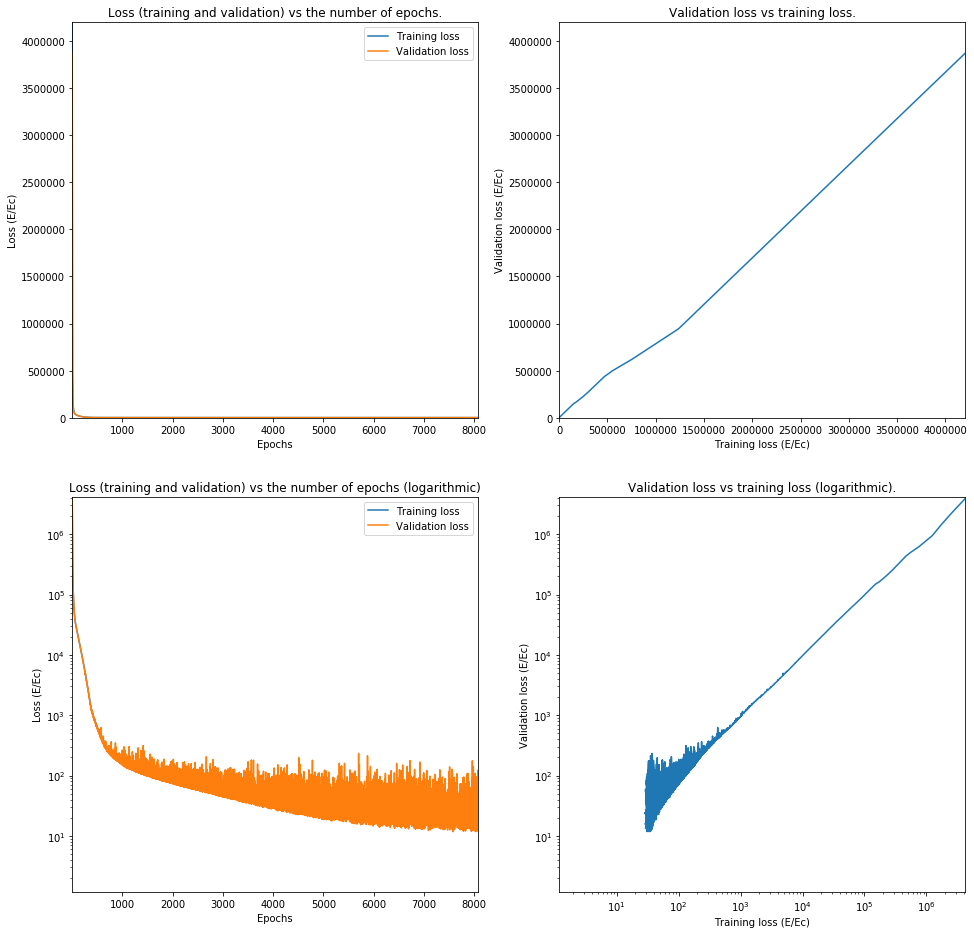

Train on 62644 samples, validate on 15662 samples
Epoch 1/25000
62644/62644 [==============================] - 2s 35us/step - loss: 7637392.9494 - val_loss: 7305007.1260
Epoch 2/25000
62644/62644 [==============================] - 2s 33us/step - loss: 7086165.7603 - val_loss: 6759761.2110
Epoch 3/25000
62644/62644 [==============================] - 2s 34us/step - loss: 6539521.0560 - val_loss: 6216529.7031
Epoch 4/25000
62644/62644 [==============================] - 2s 34us/step - loss: 5998187.4001 - val_loss: 5681312.3457
Epoch 5/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5461053.0174 - val_loss: 5147787.2829
Epoch 6/25000
62644/62644 [==============================] - 2s 34us/step - loss: 4925539.3251 - val_loss: 4615041.3307
Epoch 7/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4391050.2407 - val_loss: 4084990.6714
Epoch 8/25000
62644/62644 [==============================] - 2s 33us/step - loss: 3861429.2297 - val_loss: 356

Epoch 70/25000
62644/62644 [==============================] - 2s 33us/step - loss: 24813.1117 - val_loss: 24507.2540
Epoch 71/25000
62644/62644 [==============================] - 2s 33us/step - loss: 24253.1821 - val_loss: 24004.8795
Epoch 72/25000
62644/62644 [==============================] - 2s 33us/step - loss: 23726.2276 - val_loss: 23419.1977
Epoch 73/25000
62644/62644 [==============================] - 2s 32us/step - loss: 23192.4550 - val_loss: 22864.0101
Epoch 74/25000
62644/62644 [==============================] - 2s 32us/step - loss: 22678.7515 - val_loss: 22357.1782
Epoch 75/25000
62644/62644 [==============================] - 2s 32us/step - loss: 22181.8103 - val_loss: 21875.5391
Epoch 76/25000
62644/62644 [==============================] - 2s 32us/step - loss: 21686.0981 - val_loss: 21387.4433
Epoch 77/25000
62644/62644 [==============================] - 2s 32us/step - loss: 21199.8501 - val_loss: 20858.8963
Epoch 78/25000
62644/62644 [==============================] - 2s

Epoch 140/25000
62644/62644 [==============================] - 2s 31us/step - loss: 8941.3671 - val_loss: 8669.6358
Epoch 141/25000
62644/62644 [==============================] - 2s 32us/step - loss: 8870.0338 - val_loss: 8612.8814
Epoch 142/25000
62644/62644 [==============================] - 2s 34us/step - loss: 8804.1966 - val_loss: 8523.3487
Epoch 143/25000
62644/62644 [==============================] - 2s 32us/step - loss: 8730.0379 - val_loss: 8499.8708
Epoch 144/25000
62644/62644 [==============================] - 2s 32us/step - loss: 8657.7645 - val_loss: 8391.2277
Epoch 145/25000
62644/62644 [==============================] - 2s 33us/step - loss: 8595.7132 - val_loss: 8381.7198
Epoch 146/25000
62644/62644 [==============================] - 2s 32us/step - loss: 8517.1519 - val_loss: 8258.8926
Epoch 147/25000
62644/62644 [==============================] - 2s 32us/step - loss: 8455.3666 - val_loss: 8200.9030
Epoch 148/25000
62644/62644 [==============================] - 2s 33us/s

62644/62644 [==============================] - 2s 31us/step - loss: 4555.8609 - val_loss: 4439.5995
Epoch 211/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4505.8228 - val_loss: 4387.0732
Epoch 212/25000
62644/62644 [==============================] - 2s 33us/step - loss: 4448.7321 - val_loss: 4331.2251
Epoch 213/25000
62644/62644 [==============================] - 2s 32us/step - loss: 4395.8708 - val_loss: 4298.0768
Epoch 214/25000
62644/62644 [==============================] - 2s 32us/step - loss: 4338.5634 - val_loss: 4334.9261
Epoch 215/25000
62644/62644 [==============================] - 2s 32us/step - loss: 4289.8264 - val_loss: 4177.5869
Epoch 216/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4235.9263 - val_loss: 4179.6058
Epoch 217/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4180.1957 - val_loss: 4095.4937
Epoch 218/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4123

Epoch 281/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1901.0015 - val_loss: 1845.7394
Epoch 282/25000
62644/62644 [==============================] - 2s 35us/step - loss: 1879.2443 - val_loss: 1827.5250
Epoch 283/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1866.8530 - val_loss: 1818.3129
Epoch 284/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1848.1231 - val_loss: 1791.7205
Epoch 285/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1840.1513 - val_loss: 1809.8310
Epoch 286/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1828.7957 - val_loss: 1769.8669
Epoch 287/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1815.7950 - val_loss: 1788.8109
Epoch 288/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1802.9447 - val_loss: 1759.1558
Epoch 289/25000
62644/62644 [==============================] - 2s 33us/s

62644/62644 [==============================] - 2s 33us/step - loss: 1424.9977 - val_loss: 1422.1900
Epoch 352/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1421.6031 - val_loss: 1390.8726
Epoch 353/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1413.8630 - val_loss: 1377.7073
Epoch 354/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1409.5569 - val_loss: 1383.0101
Epoch 355/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1404.6527 - val_loss: 1371.1152
Epoch 356/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1397.3442 - val_loss: 1398.2354
Epoch 357/25000
62644/62644 [==============================] - 2s 37us/step - loss: 1393.0965 - val_loss: 1402.6301
Epoch 358/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1387.8588 - val_loss: 1360.5183
Epoch 359/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1380

Epoch 422/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1164.0285 - val_loss: 1143.1080
Epoch 423/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1159.1236 - val_loss: 1130.1731
Epoch 424/25000
62644/62644 [==============================] - 2s 34us/step - loss: 1155.7669 - val_loss: 1129.1609
Epoch 425/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1156.7079 - val_loss: 1132.5342
Epoch 426/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1151.6680 - val_loss: 1123.6651
Epoch 427/25000
62644/62644 [==============================] - 2s 32us/step - loss: 1153.6183 - val_loss: 1117.5732
Epoch 428/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1151.8264 - val_loss: 1133.2505
Epoch 429/25000
62644/62644 [==============================] - 2s 33us/step - loss: 1143.2785 - val_loss: 1115.6303
Epoch 430/25000
62644/62644 [==============================] - 2s 32us/s

Epoch 493/25000
62644/62644 [==============================] - 2s 32us/step - loss: 919.0048 - val_loss: 911.9536
Epoch 494/25000
62644/62644 [==============================] - 2s 34us/step - loss: 916.2364 - val_loss: 1034.1223
Epoch 495/25000
62644/62644 [==============================] - 2s 33us/step - loss: 918.7727 - val_loss: 894.7702
Epoch 496/25000
62644/62644 [==============================] - 2s 33us/step - loss: 915.1067 - val_loss: 889.7174
Epoch 497/25000
62644/62644 [==============================] - 2s 34us/step - loss: 912.8642 - val_loss: 901.2905
Epoch 498/25000
62644/62644 [==============================] - 2s 33us/step - loss: 913.4988 - val_loss: 971.7075
Epoch 499/25000
62644/62644 [==============================] - 2s 33us/step - loss: 906.7830 - val_loss: 945.0710
Epoch 500/25000
62644/62644 [==============================] - 2s 34us/step - loss: 907.4672 - val_loss: 882.1572
Epoch 501/25000
62644/62644 [==============================] - 2s 34us/step - loss: 904

Epoch 565/25000
62644/62644 [==============================] - 2s 31us/step - loss: 799.0940 - val_loss: 792.3528
Epoch 566/25000
62644/62644 [==============================] - 2s 31us/step - loss: 803.3297 - val_loss: 786.5208
Epoch 567/25000
62644/62644 [==============================] - 2s 31us/step - loss: 798.2442 - val_loss: 791.6127
Epoch 568/25000
62644/62644 [==============================] - 2s 31us/step - loss: 798.5095 - val_loss: 806.0816
Epoch 569/25000
62644/62644 [==============================] - 2s 32us/step - loss: 790.9135 - val_loss: 788.8785
Epoch 570/25000
62644/62644 [==============================] - 2s 31us/step - loss: 796.6409 - val_loss: 787.3034
Epoch 571/25000
62644/62644 [==============================] - 2s 32us/step - loss: 791.0607 - val_loss: 785.8471
Epoch 572/25000
62644/62644 [==============================] - 2s 31us/step - loss: 789.1761 - val_loss: 822.4967
Epoch 573/25000
62644/62644 [==============================] - 2s 31us/step - loss: 789.

Epoch 637/25000
62644/62644 [==============================] - 2s 35us/step - loss: 709.3376 - val_loss: 696.2278
Epoch 638/25000
62644/62644 [==============================] - 2s 33us/step - loss: 707.3892 - val_loss: 689.3378
Epoch 639/25000
62644/62644 [==============================] - 2s 32us/step - loss: 708.5753 - val_loss: 691.9591
Epoch 640/25000
62644/62644 [==============================] - 2s 33us/step - loss: 705.1050 - val_loss: 719.6943
Epoch 641/25000
62644/62644 [==============================] - 2s 33us/step - loss: 709.7461 - val_loss: 723.0263
Epoch 642/25000
62644/62644 [==============================] - 2s 32us/step - loss: 707.3807 - val_loss: 694.3128
Epoch 643/25000
62644/62644 [==============================] - 2s 32us/step - loss: 702.8537 - val_loss: 710.9746
Epoch 644/25000
62644/62644 [==============================] - 2s 32us/step - loss: 704.4463 - val_loss: 785.4309
Epoch 645/25000
62644/62644 [==============================] - 2s 32us/step - loss: 702.

Epoch 709/25000
62644/62644 [==============================] - 2s 33us/step - loss: 636.6395 - val_loss: 623.4766
Epoch 710/25000
62644/62644 [==============================] - 2s 34us/step - loss: 645.8655 - val_loss: 627.2276
Epoch 711/25000
62644/62644 [==============================] - 2s 34us/step - loss: 641.3743 - val_loss: 641.1738
Epoch 712/25000
62644/62644 [==============================] - 2s 33us/step - loss: 637.8808 - val_loss: 621.0751
Epoch 713/25000
62644/62644 [==============================] - 2s 33us/step - loss: 639.4017 - val_loss: 634.5792
Epoch 714/25000
62644/62644 [==============================] - 2s 30us/step - loss: 637.3453 - val_loss: 643.6616
Epoch 715/25000
62644/62644 [==============================] - 2s 30us/step - loss: 637.3100 - val_loss: 639.3197
Epoch 716/25000
62644/62644 [==============================] - 2s 30us/step - loss: 636.1525 - val_loss: 621.3990
Epoch 717/25000
62644/62644 [==============================] - 2s 30us/step - loss: 633.

Epoch 781/25000
62644/62644 [==============================] - 2s 32us/step - loss: 588.2207 - val_loss: 579.0008
Epoch 782/25000
62644/62644 [==============================] - 2s 32us/step - loss: 585.6173 - val_loss: 574.4747
Epoch 783/25000
62644/62644 [==============================] - 2s 32us/step - loss: 587.2183 - val_loss: 598.6039
Epoch 784/25000
62644/62644 [==============================] - 2s 31us/step - loss: 588.1133 - val_loss: 600.0754
Epoch 785/25000
62644/62644 [==============================] - 2s 32us/step - loss: 589.8723 - val_loss: 686.6639
Epoch 786/25000
62644/62644 [==============================] - 2s 32us/step - loss: 586.9476 - val_loss: 572.3701
Epoch 787/25000
62644/62644 [==============================] - 2s 33us/step - loss: 584.4279 - val_loss: 573.4420
Epoch 788/25000
62644/62644 [==============================] - 2s 32us/step - loss: 586.5114 - val_loss: 586.6683
Epoch 789/25000
62644/62644 [==============================] - 2s 32us/step - loss: 587.

Epoch 853/25000
62644/62644 [==============================] - 2s 33us/step - loss: 550.1002 - val_loss: 556.6683
Epoch 854/25000
62644/62644 [==============================] - 2s 32us/step - loss: 548.5571 - val_loss: 535.1137
Epoch 855/25000
62644/62644 [==============================] - 2s 34us/step - loss: 552.2247 - val_loss: 534.2393
Epoch 856/25000
62644/62644 [==============================] - 2s 33us/step - loss: 550.6803 - val_loss: 549.1055
Epoch 857/25000
62644/62644 [==============================] - 2s 32us/step - loss: 546.4580 - val_loss: 593.2837
Epoch 858/25000
62644/62644 [==============================] - 2s 31us/step - loss: 545.6970 - val_loss: 604.8256
Epoch 859/25000
62644/62644 [==============================] - 2s 33us/step - loss: 550.3328 - val_loss: 536.7588
Epoch 860/25000
62644/62644 [==============================] - 2s 33us/step - loss: 547.3867 - val_loss: 540.1593
Epoch 861/25000
62644/62644 [==============================] - 2s 33us/step - loss: 545.

Epoch 925/25000
62644/62644 [==============================] - 2s 32us/step - loss: 517.9766 - val_loss: 517.1993
Epoch 926/25000
62644/62644 [==============================] - 2s 32us/step - loss: 518.1044 - val_loss: 506.2248
Epoch 927/25000
62644/62644 [==============================] - 2s 31us/step - loss: 514.4190 - val_loss: 503.5188
Epoch 928/25000
62644/62644 [==============================] - 2s 32us/step - loss: 516.8237 - val_loss: 509.3929
Epoch 929/25000
62644/62644 [==============================] - 2s 33us/step - loss: 513.9042 - val_loss: 553.2011
Epoch 930/25000
62644/62644 [==============================] - 2s 33us/step - loss: 515.5897 - val_loss: 500.6284
Epoch 931/25000
62644/62644 [==============================] - 2s 32us/step - loss: 515.4913 - val_loss: 504.7229
Epoch 932/25000
62644/62644 [==============================] - 2s 33us/step - loss: 513.2378 - val_loss: 543.9776
Epoch 933/25000
62644/62644 [==============================] - 2s 34us/step - loss: 516.

Epoch 997/25000
62644/62644 [==============================] - 2s 32us/step - loss: 486.0204 - val_loss: 526.6364
Epoch 998/25000
62644/62644 [==============================] - 2s 33us/step - loss: 488.4371 - val_loss: 476.8751
Epoch 999/25000
62644/62644 [==============================] - 2s 33us/step - loss: 483.6292 - val_loss: 516.5412
Epoch 1000/25000
62644/62644 [==============================] - 2s 32us/step - loss: 487.0904 - val_loss: 473.2696
Epoch 1001/25000
62644/62644 [==============================] - 2s 33us/step - loss: 487.5773 - val_loss: 480.1429
Epoch 1002/25000
62644/62644 [==============================] - 2s 33us/step - loss: 489.3416 - val_loss: 543.0235
Epoch 1003/25000
62644/62644 [==============================] - 2s 33us/step - loss: 486.7689 - val_loss: 486.9916
Epoch 1004/25000
62644/62644 [==============================] - 2s 32us/step - loss: 488.1352 - val_loss: 492.9671
Epoch 1005/25000
62644/62644 [==============================] - 2s 32us/step - loss

62644/62644 [==============================] - 2s 32us/step - loss: 466.1130 - val_loss: 493.5150
Epoch 1069/25000
62644/62644 [==============================] - 2s 32us/step - loss: 461.4714 - val_loss: 470.0140
Epoch 1070/25000
62644/62644 [==============================] - 2s 31us/step - loss: 464.5017 - val_loss: 451.2597
Epoch 1071/25000
62644/62644 [==============================] - 2s 31us/step - loss: 459.7817 - val_loss: 467.8533
Epoch 1072/25000
62644/62644 [==============================] - 2s 32us/step - loss: 463.9297 - val_loss: 536.5461
Epoch 1073/25000
62644/62644 [==============================] - 2s 32us/step - loss: 461.6859 - val_loss: 470.6240
Epoch 1074/25000
62644/62644 [==============================] - 2s 32us/step - loss: 462.3971 - val_loss: 457.8636
Epoch 1075/25000
62644/62644 [==============================] - 2s 32us/step - loss: 458.3083 - val_loss: 451.5055
Epoch 1076/25000
62644/62644 [==============================] - 2s 33us/step - loss: 458.1742 - v

62644/62644 [==============================] - 2s 33us/step - loss: 439.4804 - val_loss: 428.0273
Epoch 1140/25000
62644/62644 [==============================] - 2s 32us/step - loss: 440.3017 - val_loss: 451.5796
Epoch 1141/25000
62644/62644 [==============================] - 2s 33us/step - loss: 442.2850 - val_loss: 462.3234
Epoch 1142/25000
62644/62644 [==============================] - 2s 32us/step - loss: 439.5732 - val_loss: 451.0084
Epoch 1143/25000
62644/62644 [==============================] - 2s 32us/step - loss: 440.4297 - val_loss: 433.5333
Epoch 1144/25000
62644/62644 [==============================] - 2s 32us/step - loss: 438.8092 - val_loss: 424.6008
Epoch 1145/25000
62644/62644 [==============================] - 2s 32us/step - loss: 436.7301 - val_loss: 455.4608
Epoch 1146/25000
62644/62644 [==============================] - 2s 33us/step - loss: 441.2377 - val_loss: 431.4487
Epoch 1147/25000
62644/62644 [==============================] - 2s 35us/step - loss: 435.9000 - v

62644/62644 [==============================] - 2s 32us/step - loss: 416.5197 - val_loss: 418.5615
Epoch 1211/25000
62644/62644 [==============================] - 2s 32us/step - loss: 421.2094 - val_loss: 407.6402
Epoch 1212/25000
62644/62644 [==============================] - 2s 32us/step - loss: 421.6046 - val_loss: 406.0674
Epoch 1213/25000
62644/62644 [==============================] - 2s 32us/step - loss: 419.3657 - val_loss: 407.6840
Epoch 1214/25000
62644/62644 [==============================] - 2s 31us/step - loss: 415.4496 - val_loss: 410.7216
Epoch 1215/25000
62644/62644 [==============================] - 2s 33us/step - loss: 416.2348 - val_loss: 414.6167
Epoch 1216/25000
62644/62644 [==============================] - 2s 32us/step - loss: 416.3839 - val_loss: 474.9510
Epoch 1217/25000
62644/62644 [==============================] - 2s 32us/step - loss: 414.6332 - val_loss: 405.6995
Epoch 1218/25000
62644/62644 [==============================] - 2s 33us/step - loss: 420.7623 - v

62644/62644 [==============================] - 2s 33us/step - loss: 399.0644 - val_loss: 387.8321
Epoch 1282/25000
62644/62644 [==============================] - 2s 33us/step - loss: 400.0027 - val_loss: 561.9238
Epoch 1283/25000
62644/62644 [==============================] - 2s 32us/step - loss: 397.8346 - val_loss: 387.1797
Epoch 1284/25000
62644/62644 [==============================] - 2s 32us/step - loss: 396.5474 - val_loss: 387.1446
Epoch 1285/25000
62644/62644 [==============================] - 2s 33us/step - loss: 398.1917 - val_loss: 388.1737
Epoch 1286/25000
62644/62644 [==============================] - 2s 32us/step - loss: 398.6462 - val_loss: 387.6563
Epoch 1287/25000
62644/62644 [==============================] - 2s 33us/step - loss: 398.5995 - val_loss: 397.1613
Epoch 1288/25000
62644/62644 [==============================] - 2s 33us/step - loss: 398.4483 - val_loss: 457.2777
Epoch 1289/25000
62644/62644 [==============================] - 2s 32us/step - loss: 399.9613 - v

62644/62644 [==============================] - 2s 33us/step - loss: 379.6856 - val_loss: 401.0221
Epoch 1353/25000
62644/62644 [==============================] - 2s 31us/step - loss: 384.1292 - val_loss: 386.7015
Epoch 1354/25000
62644/62644 [==============================] - 2s 32us/step - loss: 382.6635 - val_loss: 374.6384
Epoch 1355/25000
62644/62644 [==============================] - 2s 34us/step - loss: 382.5636 - val_loss: 373.5102
Epoch 1356/25000
62644/62644 [==============================] - 2s 33us/step - loss: 381.5525 - val_loss: 378.0834
Epoch 1357/25000
62644/62644 [==============================] - 2s 34us/step - loss: 379.3132 - val_loss: 368.9970
Epoch 1358/25000
62644/62644 [==============================] - 2s 34us/step - loss: 380.3054 - val_loss: 429.2910
Epoch 1359/25000
62644/62644 [==============================] - 2s 33us/step - loss: 380.7032 - val_loss: 390.3807
Epoch 1360/25000
62644/62644 [==============================] - 2s 31us/step - loss: 380.4228 - v

62644/62644 [==============================] - 2s 35us/step - loss: 365.4105 - val_loss: 355.3470
Epoch 1424/25000
62644/62644 [==============================] - 2s 34us/step - loss: 370.1091 - val_loss: 383.3552
Epoch 1425/25000
62644/62644 [==============================] - 2s 34us/step - loss: 367.3413 - val_loss: 425.7413
Epoch 1426/25000
62644/62644 [==============================] - 2s 34us/step - loss: 365.2691 - val_loss: 361.4160
Epoch 1427/25000
62644/62644 [==============================] - 2s 34us/step - loss: 367.4955 - val_loss: 400.8309
Epoch 1428/25000
62644/62644 [==============================] - 2s 35us/step - loss: 363.8983 - val_loss: 387.9893
Epoch 1429/25000
62644/62644 [==============================] - 2s 35us/step - loss: 368.6654 - val_loss: 369.8079
Epoch 1430/25000
62644/62644 [==============================] - 2s 35us/step - loss: 364.2904 - val_loss: 376.1978
Epoch 1431/25000
62644/62644 [==============================] - 2s 34us/step - loss: 368.0587 - v

62644/62644 [==============================] - 2s 32us/step - loss: 352.5326 - val_loss: 368.1090
Epoch 1495/25000
62644/62644 [==============================] - 2s 32us/step - loss: 352.3926 - val_loss: 394.2879
Epoch 1496/25000
62644/62644 [==============================] - 2s 32us/step - loss: 350.7120 - val_loss: 409.9081
Epoch 1497/25000
62644/62644 [==============================] - 2s 32us/step - loss: 355.5066 - val_loss: 356.1641
Epoch 1498/25000
62644/62644 [==============================] - 2s 32us/step - loss: 352.6106 - val_loss: 392.5511
Epoch 1499/25000
62644/62644 [==============================] - 2s 33us/step - loss: 351.0207 - val_loss: 347.4224
Epoch 1500/25000
62644/62644 [==============================] - 2s 32us/step - loss: 351.7055 - val_loss: 338.6492
Epoch 1501/25000
62644/62644 [==============================] - 2s 33us/step - loss: 353.4267 - val_loss: 339.7441
Epoch 1502/25000
62644/62644 [==============================] - 2s 32us/step - loss: 350.7567 - v

62644/62644 [==============================] - 2s 33us/step - loss: 340.3327 - val_loss: 327.1812
Epoch 1566/25000
62644/62644 [==============================] - 2s 32us/step - loss: 339.7059 - val_loss: 325.6370
Epoch 1567/25000
62644/62644 [==============================] - 2s 34us/step - loss: 339.8705 - val_loss: 329.4327
Epoch 1568/25000
62644/62644 [==============================] - 2s 33us/step - loss: 337.0966 - val_loss: 331.3857
Epoch 1569/25000
62644/62644 [==============================] - 2s 32us/step - loss: 341.1343 - val_loss: 332.3450
Epoch 1570/25000
62644/62644 [==============================] - 2s 32us/step - loss: 342.8645 - val_loss: 333.6250
Epoch 1571/25000
62644/62644 [==============================] - 2s 33us/step - loss: 341.2913 - val_loss: 327.2510
Epoch 1572/25000
62644/62644 [==============================] - 2s 32us/step - loss: 337.9294 - val_loss: 339.4942
Epoch 1573/25000
62644/62644 [==============================] - 2s 34us/step - loss: 340.0693 - v

62644/62644 [==============================] - 2s 33us/step - loss: 327.8230 - val_loss: 317.9881
Epoch 1637/25000
62644/62644 [==============================] - 2s 32us/step - loss: 328.7991 - val_loss: 326.8591
Epoch 1638/25000
62644/62644 [==============================] - 2s 33us/step - loss: 329.9430 - val_loss: 326.8505
Epoch 1639/25000
62644/62644 [==============================] - 2s 32us/step - loss: 326.0449 - val_loss: 317.7856
Epoch 1640/25000
62644/62644 [==============================] - 2s 33us/step - loss: 330.7816 - val_loss: 346.4756
Epoch 1641/25000
62644/62644 [==============================] - 2s 34us/step - loss: 329.4934 - val_loss: 319.7120
Epoch 1642/25000
62644/62644 [==============================] - 2s 33us/step - loss: 325.3742 - val_loss: 314.5757
Epoch 1643/25000
62644/62644 [==============================] - 2s 32us/step - loss: 326.1790 - val_loss: 351.6215
Epoch 1644/25000
62644/62644 [==============================] - 2s 33us/step - loss: 324.6292 - v

62644/62644 [==============================] - 2s 32us/step - loss: 320.8035 - val_loss: 346.1643
Epoch 1708/25000
62644/62644 [==============================] - 2s 32us/step - loss: 317.0781 - val_loss: 325.3863
Epoch 1709/25000
62644/62644 [==============================] - 2s 32us/step - loss: 317.7285 - val_loss: 379.7635
Epoch 1710/25000
62644/62644 [==============================] - 2s 32us/step - loss: 318.1512 - val_loss: 320.4397
Epoch 1711/25000
62644/62644 [==============================] - 2s 32us/step - loss: 316.6831 - val_loss: 330.3179
Epoch 1712/25000
62644/62644 [==============================] - 2s 32us/step - loss: 318.6798 - val_loss: 306.5215
Epoch 1713/25000
62644/62644 [==============================] - 2s 31us/step - loss: 317.6754 - val_loss: 305.7721
Epoch 1714/25000
62644/62644 [==============================] - 2s 32us/step - loss: 318.9673 - val_loss: 303.9396
Epoch 1715/25000
62644/62644 [==============================] - 2s 31us/step - loss: 317.1770 - v

62644/62644 [==============================] - 2s 33us/step - loss: 310.9838 - val_loss: 302.8475
Epoch 1779/25000
62644/62644 [==============================] - 2s 32us/step - loss: 309.9989 - val_loss: 320.6723
Epoch 1780/25000
62644/62644 [==============================] - 2s 31us/step - loss: 309.2264 - val_loss: 299.9800
Epoch 1781/25000
62644/62644 [==============================] - 2s 32us/step - loss: 311.6245 - val_loss: 316.4697
Epoch 1782/25000
62644/62644 [==============================] - 2s 33us/step - loss: 310.8843 - val_loss: 301.2005
Epoch 1783/25000
62644/62644 [==============================] - 2s 32us/step - loss: 308.6522 - val_loss: 294.0688
Epoch 1784/25000
62644/62644 [==============================] - 2s 34us/step - loss: 308.7296 - val_loss: 324.7612
Epoch 1785/25000
62644/62644 [==============================] - 2s 33us/step - loss: 310.9879 - val_loss: 315.9058
Epoch 1786/25000
62644/62644 [==============================] - 2s 36us/step - loss: 308.5800 - v

62644/62644 [==============================] - 2s 32us/step - loss: 300.5676 - val_loss: 313.8639
Epoch 1850/25000
62644/62644 [==============================] - 2s 32us/step - loss: 302.8820 - val_loss: 285.2460
Epoch 1851/25000
62644/62644 [==============================] - 2s 33us/step - loss: 300.6721 - val_loss: 294.2902
Epoch 1852/25000
62644/62644 [==============================] - 2s 32us/step - loss: 296.4418 - val_loss: 334.5041
Epoch 1853/25000
62644/62644 [==============================] - 2s 32us/step - loss: 302.0848 - val_loss: 309.5338
Epoch 1854/25000
62644/62644 [==============================] - 2s 33us/step - loss: 298.6860 - val_loss: 290.2555
Epoch 1855/25000
62644/62644 [==============================] - 2s 32us/step - loss: 298.4157 - val_loss: 285.6682
Epoch 1856/25000
62644/62644 [==============================] - 2s 32us/step - loss: 297.4515 - val_loss: 314.6063
Epoch 1857/25000
62644/62644 [==============================] - 2s 31us/step - loss: 298.2339 - v

62644/62644 [==============================] - 2s 34us/step - loss: 290.6571 - val_loss: 277.6253
Epoch 1921/25000
62644/62644 [==============================] - 2s 35us/step - loss: 294.1915 - val_loss: 277.0019
Epoch 1922/25000
62644/62644 [==============================] - 2s 35us/step - loss: 290.7247 - val_loss: 277.1995
Epoch 1923/25000
62644/62644 [==============================] - 2s 36us/step - loss: 292.4074 - val_loss: 301.4344
Epoch 1924/25000
62644/62644 [==============================] - 2s 35us/step - loss: 292.8919 - val_loss: 309.3683
Epoch 1925/25000
62644/62644 [==============================] - 2s 34us/step - loss: 292.9033 - val_loss: 277.4471
Epoch 1926/25000
62644/62644 [==============================] - 2s 32us/step - loss: 291.8372 - val_loss: 278.9472
Epoch 1927/25000
62644/62644 [==============================] - 2s 32us/step - loss: 291.5735 - val_loss: 304.4864
Epoch 1928/25000
62644/62644 [==============================] - 2s 33us/step - loss: 293.2667 - v

62644/62644 [==============================] - 2s 35us/step - loss: 282.8481 - val_loss: 283.6685
Epoch 1992/25000
62644/62644 [==============================] - 2s 33us/step - loss: 283.5562 - val_loss: 328.7742
Epoch 1993/25000
62644/62644 [==============================] - 2s 32us/step - loss: 287.4930 - val_loss: 282.3944
Epoch 1994/25000
62644/62644 [==============================] - 2s 33us/step - loss: 288.4520 - val_loss: 280.7849
Epoch 1995/25000
62644/62644 [==============================] - 2s 33us/step - loss: 284.3470 - val_loss: 357.9213
Epoch 1996/25000
62644/62644 [==============================] - 2s 33us/step - loss: 284.7545 - val_loss: 270.6349
Epoch 1997/25000
62644/62644 [==============================] - 2s 33us/step - loss: 287.7210 - val_loss: 272.6515
Epoch 1998/25000
62644/62644 [==============================] - 2s 32us/step - loss: 285.6748 - val_loss: 278.5661
Epoch 1999/25000
62644/62644 [==============================] - 2s 32us/step - loss: 286.4982 - v

62644/62644 [==============================] - 2s 32us/step - loss: 278.7367 - val_loss: 304.0296
Epoch 2063/25000
62644/62644 [==============================] - 2s 32us/step - loss: 279.7977 - val_loss: 297.2754
Epoch 2064/25000
62644/62644 [==============================] - 2s 32us/step - loss: 280.9380 - val_loss: 264.9146
Epoch 2065/25000
62644/62644 [==============================] - 2s 31us/step - loss: 278.5831 - val_loss: 291.5452
Epoch 2066/25000
62644/62644 [==============================] - 2s 32us/step - loss: 278.6720 - val_loss: 262.6876
Epoch 2067/25000
62644/62644 [==============================] - 2s 32us/step - loss: 275.6311 - val_loss: 263.6714
Epoch 2068/25000
62644/62644 [==============================] - 2s 32us/step - loss: 276.6072 - val_loss: 280.3997
Epoch 2069/25000
62644/62644 [==============================] - 2s 32us/step - loss: 275.3135 - val_loss: 268.8020
Epoch 2070/25000
62644/62644 [==============================] - 2s 31us/step - loss: 278.2064 - v

62644/62644 [==============================] - 2s 32us/step - loss: 271.7388 - val_loss: 259.4408
Epoch 2134/25000
62644/62644 [==============================] - 2s 32us/step - loss: 274.5915 - val_loss: 256.1971
Epoch 2135/25000
62644/62644 [==============================] - 2s 31us/step - loss: 272.5659 - val_loss: 261.1890
Epoch 2136/25000
62644/62644 [==============================] - 2s 32us/step - loss: 273.4324 - val_loss: 306.8414
Epoch 2137/25000
62644/62644 [==============================] - 2s 32us/step - loss: 271.2683 - val_loss: 259.2410
Epoch 2138/25000
62644/62644 [==============================] - 2s 32us/step - loss: 273.8764 - val_loss: 265.9601
Epoch 2139/25000
62644/62644 [==============================] - 2s 33us/step - loss: 269.2836 - val_loss: 258.0193
Epoch 2140/25000
62644/62644 [==============================] - 2s 31us/step - loss: 272.2227 - val_loss: 283.7897
Epoch 2141/25000
62644/62644 [==============================] - 2s 33us/step - loss: 271.9674 - v

62644/62644 [==============================] - 2s 31us/step - loss: 266.6913 - val_loss: 343.8449
Epoch 2205/25000
62644/62644 [==============================] - 2s 32us/step - loss: 265.1983 - val_loss: 267.2261
Epoch 2206/25000
62644/62644 [==============================] - 2s 35us/step - loss: 263.7769 - val_loss: 279.9152
Epoch 2207/25000
62644/62644 [==============================] - 2s 33us/step - loss: 267.0871 - val_loss: 301.8436
Epoch 2208/25000
62644/62644 [==============================] - 2s 33us/step - loss: 265.8995 - val_loss: 304.8790
Epoch 2209/25000
62644/62644 [==============================] - 2s 33us/step - loss: 267.5759 - val_loss: 261.6949
Epoch 2210/25000
62644/62644 [==============================] - 2s 32us/step - loss: 265.2413 - val_loss: 259.3643
Epoch 2211/25000
62644/62644 [==============================] - 2s 32us/step - loss: 266.3502 - val_loss: 264.0745
Epoch 2212/25000
62644/62644 [==============================] - 2s 32us/step - loss: 264.1632 - v

62644/62644 [==============================] - 2s 32us/step - loss: 259.6356 - val_loss: 298.1354
Epoch 2276/25000
62644/62644 [==============================] - 2s 31us/step - loss: 258.8435 - val_loss: 311.8636
Epoch 2277/25000
62644/62644 [==============================] - 2s 31us/step - loss: 260.3164 - val_loss: 245.7504
Epoch 2278/25000
62644/62644 [==============================] - 2s 31us/step - loss: 258.7831 - val_loss: 249.1616
Epoch 2279/25000
62644/62644 [==============================] - 2s 31us/step - loss: 258.4161 - val_loss: 250.8805
Epoch 2280/25000
62644/62644 [==============================] - 2s 31us/step - loss: 261.4856 - val_loss: 308.5943
Epoch 2281/25000
62644/62644 [==============================] - 2s 31us/step - loss: 261.1722 - val_loss: 247.2592
Epoch 2282/25000
62644/62644 [==============================] - 2s 31us/step - loss: 265.0281 - val_loss: 251.3314
Epoch 2283/25000
62644/62644 [==============================] - 2s 32us/step - loss: 259.1896 - v

62644/62644 [==============================] - 2s 32us/step - loss: 254.5298 - val_loss: 352.0178
Epoch 2347/25000
62644/62644 [==============================] - 2s 32us/step - loss: 255.5164 - val_loss: 301.8138
Epoch 2348/25000
62644/62644 [==============================] - 2s 34us/step - loss: 253.6123 - val_loss: 244.1979
Epoch 2349/25000
62644/62644 [==============================] - 2s 31us/step - loss: 253.8511 - val_loss: 243.6395
Epoch 2350/25000
62644/62644 [==============================] - 2s 32us/step - loss: 254.0116 - val_loss: 248.2176
Epoch 2351/25000
62644/62644 [==============================] - 2s 32us/step - loss: 255.8579 - val_loss: 240.0573
Epoch 2352/25000
62644/62644 [==============================] - 2s 35us/step - loss: 253.5833 - val_loss: 257.4941
Epoch 2353/25000
62644/62644 [==============================] - 2s 35us/step - loss: 252.9916 - val_loss: 246.3263
Epoch 2354/25000
62644/62644 [==============================] - 2s 32us/step - loss: 254.1960 - v

62644/62644 [==============================] - 2s 32us/step - loss: 248.2425 - val_loss: 307.0572
Epoch 2418/25000
62644/62644 [==============================] - 2s 31us/step - loss: 248.7514 - val_loss: 398.2859
Epoch 2419/25000
62644/62644 [==============================] - 2s 32us/step - loss: 250.4358 - val_loss: 234.9951
Epoch 2420/25000
62644/62644 [==============================] - 2s 32us/step - loss: 248.3229 - val_loss: 236.7085
Epoch 2421/25000
62644/62644 [==============================] - 2s 32us/step - loss: 249.1147 - val_loss: 236.5193
Epoch 2422/25000
62644/62644 [==============================] - 2s 32us/step - loss: 250.3200 - val_loss: 254.0597
Epoch 2423/25000
62644/62644 [==============================] - 2s 32us/step - loss: 249.6535 - val_loss: 287.6843
Epoch 2424/25000
62644/62644 [==============================] - 2s 32us/step - loss: 250.2884 - val_loss: 235.8002
Epoch 2425/25000
62644/62644 [==============================] - 2s 32us/step - loss: 248.6285 - v

62644/62644 [==============================] - 2s 33us/step - loss: 243.9782 - val_loss: 236.2390
Epoch 2489/25000
62644/62644 [==============================] - 2s 32us/step - loss: 244.7550 - val_loss: 249.2074
Epoch 2490/25000
62644/62644 [==============================] - 2s 31us/step - loss: 244.2106 - val_loss: 250.5419
Epoch 2491/25000
62644/62644 [==============================] - 2s 31us/step - loss: 243.6923 - val_loss: 240.4910
Epoch 2492/25000
62644/62644 [==============================] - 2s 35us/step - loss: 245.3975 - val_loss: 264.8796
Epoch 2493/25000
62644/62644 [==============================] - 2s 33us/step - loss: 246.9239 - val_loss: 233.1365
Epoch 2494/25000
62644/62644 [==============================] - 2s 33us/step - loss: 246.6433 - val_loss: 243.5556
Epoch 2495/25000
62644/62644 [==============================] - 2s 34us/step - loss: 244.9126 - val_loss: 234.7867
Epoch 2496/25000
62644/62644 [==============================] - 2s 32us/step - loss: 241.1924 - v

62644/62644 [==============================] - 2s 32us/step - loss: 242.1775 - val_loss: 229.2548
Epoch 2560/25000
62644/62644 [==============================] - 2s 32us/step - loss: 240.9374 - val_loss: 232.1183
Epoch 2561/25000
62644/62644 [==============================] - 2s 33us/step - loss: 237.9002 - val_loss: 228.3255
Epoch 2562/25000
62644/62644 [==============================] - 2s 32us/step - loss: 239.7177 - val_loss: 259.3915
Epoch 2563/25000
62644/62644 [==============================] - 2s 32us/step - loss: 241.1065 - val_loss: 233.2470
Epoch 2564/25000
62644/62644 [==============================] - 2s 33us/step - loss: 241.7921 - val_loss: 225.9681
Epoch 2565/25000
62644/62644 [==============================] - 2s 33us/step - loss: 239.1562 - val_loss: 226.9076
Epoch 2566/25000
62644/62644 [==============================] - 2s 32us/step - loss: 239.4051 - val_loss: 236.6277
Epoch 2567/25000
62644/62644 [==============================] - 2s 32us/step - loss: 240.7380 - v

62644/62644 [==============================] - 2s 33us/step - loss: 236.2779 - val_loss: 240.2344
Epoch 2631/25000
62644/62644 [==============================] - 2s 32us/step - loss: 232.1537 - val_loss: 225.9949
Epoch 2632/25000
62644/62644 [==============================] - 2s 34us/step - loss: 237.8599 - val_loss: 222.1660
Epoch 2633/25000
62644/62644 [==============================] - 2s 33us/step - loss: 236.7152 - val_loss: 228.4675
Epoch 2634/25000
62644/62644 [==============================] - 2s 32us/step - loss: 234.2828 - val_loss: 222.4981
Epoch 2635/25000
62644/62644 [==============================] - 2s 32us/step - loss: 233.7595 - val_loss: 227.8378
Epoch 2636/25000
62644/62644 [==============================] - 2s 32us/step - loss: 237.3319 - val_loss: 223.0702
Epoch 2637/25000
62644/62644 [==============================] - 2s 32us/step - loss: 234.0795 - val_loss: 220.9404
Epoch 2638/25000
62644/62644 [==============================] - 2s 32us/step - loss: 236.8775 - v

62644/62644 [==============================] - 2s 33us/step - loss: 231.0376 - val_loss: 266.2473
Epoch 2702/25000
62644/62644 [==============================] - 2s 32us/step - loss: 233.7012 - val_loss: 263.9213
Epoch 2703/25000
62644/62644 [==============================] - 2s 32us/step - loss: 228.6128 - val_loss: 233.2898
Epoch 2704/25000
62644/62644 [==============================] - 2s 34us/step - loss: 236.1110 - val_loss: 262.6670
Epoch 2705/25000
62644/62644 [==============================] - 2s 31us/step - loss: 230.4853 - val_loss: 221.4470
Epoch 2706/25000
62644/62644 [==============================] - 2s 32us/step - loss: 234.0320 - val_loss: 215.9772
Epoch 2707/25000
62644/62644 [==============================] - 2s 32us/step - loss: 231.5124 - val_loss: 216.9039
Epoch 2708/25000
62644/62644 [==============================] - 2s 33us/step - loss: 233.3552 - val_loss: 218.7175
Epoch 2709/25000
62644/62644 [==============================] - 2s 32us/step - loss: 231.4953 - v

62644/62644 [==============================] - 2s 31us/step - loss: 229.0492 - val_loss: 274.4637
Epoch 2773/25000
62644/62644 [==============================] - 2s 31us/step - loss: 228.9469 - val_loss: 213.1538
Epoch 2774/25000
62644/62644 [==============================] - 2s 31us/step - loss: 226.2228 - val_loss: 217.6509
Epoch 2775/25000
62644/62644 [==============================] - 2s 31us/step - loss: 229.6914 - val_loss: 273.9577
Epoch 2776/25000
62644/62644 [==============================] - 2s 32us/step - loss: 227.6479 - val_loss: 260.4148
Epoch 2777/25000
62644/62644 [==============================] - 2s 32us/step - loss: 227.4665 - val_loss: 236.1844
Epoch 2778/25000
62644/62644 [==============================] - 2s 31us/step - loss: 228.2870 - val_loss: 217.5357
Epoch 2779/25000
62644/62644 [==============================] - 2s 32us/step - loss: 228.8081 - val_loss: 212.6115
Epoch 2780/25000
62644/62644 [==============================] - 2s 32us/step - loss: 230.3904 - v

62644/62644 [==============================] - 2s 31us/step - loss: 208.0429 - val_loss: 219.5065
Epoch 2844/25000
62644/62644 [==============================] - 2s 31us/step - loss: 211.3977 - val_loss: 195.1299
Epoch 2845/25000
62644/62644 [==============================] - 2s 32us/step - loss: 206.2678 - val_loss: 198.4310
Epoch 2846/25000
62644/62644 [==============================] - 2s 33us/step - loss: 205.7299 - val_loss: 198.9450
Epoch 2847/25000
62644/62644 [==============================] - 2s 33us/step - loss: 204.0543 - val_loss: 192.2726
Epoch 2848/25000
62644/62644 [==============================] - 2s 33us/step - loss: 205.3270 - val_loss: 199.2347
Epoch 2849/25000
62644/62644 [==============================] - 2s 32us/step - loss: 205.8127 - val_loss: 277.8947
Epoch 2850/25000
62644/62644 [==============================] - 2s 33us/step - loss: 203.8533 - val_loss: 191.8143
Epoch 2851/25000
62644/62644 [==============================] - 2s 31us/step - loss: 205.1331 - v

62644/62644 [==============================] - 2s 32us/step - loss: 197.1129 - val_loss: 190.4937
Epoch 2915/25000
62644/62644 [==============================] - 2s 32us/step - loss: 197.0007 - val_loss: 193.8356
Epoch 2916/25000
62644/62644 [==============================] - 2s 32us/step - loss: 204.1651 - val_loss: 292.0400
Epoch 2917/25000
62644/62644 [==============================] - 2s 32us/step - loss: 199.8413 - val_loss: 189.6870
Epoch 2918/25000
62644/62644 [==============================] - 2s 34us/step - loss: 199.6142 - val_loss: 202.7959
Epoch 2919/25000
62644/62644 [==============================] - 2s 31us/step - loss: 200.1260 - val_loss: 193.6857
Epoch 2920/25000
62644/62644 [==============================] - 2s 33us/step - loss: 197.7977 - val_loss: 189.5166
Epoch 2921/25000
62644/62644 [==============================] - 2s 33us/step - loss: 197.3993 - val_loss: 183.6949
Epoch 2922/25000
62644/62644 [==============================] - 2s 32us/step - loss: 198.4924 - v

62644/62644 [==============================] - 2s 31us/step - loss: 195.2218 - val_loss: 183.8451
Epoch 2986/25000
62644/62644 [==============================] - 2s 31us/step - loss: 195.2319 - val_loss: 183.1919
Epoch 2987/25000
62644/62644 [==============================] - 2s 32us/step - loss: 196.1319 - val_loss: 187.4912
Epoch 2988/25000
62644/62644 [==============================] - 2s 32us/step - loss: 197.0872 - val_loss: 302.5708
Epoch 2989/25000
62644/62644 [==============================] - 2s 32us/step - loss: 197.3572 - val_loss: 205.3722
Epoch 2990/25000
62644/62644 [==============================] - 2s 31us/step - loss: 196.4977 - val_loss: 189.4350
Epoch 2991/25000
62644/62644 [==============================] - 2s 31us/step - loss: 192.3257 - val_loss: 185.1469
Epoch 2992/25000
62644/62644 [==============================] - 2s 31us/step - loss: 196.1800 - val_loss: 272.2932
Epoch 2993/25000
62644/62644 [==============================] - 2s 33us/step - loss: 195.7404 - v

62644/62644 [==============================] - 2s 32us/step - loss: 191.5570 - val_loss: 179.5821
Epoch 3057/25000
62644/62644 [==============================] - 2s 32us/step - loss: 192.2937 - val_loss: 187.0137
Epoch 3058/25000
62644/62644 [==============================] - 2s 32us/step - loss: 191.8427 - val_loss: 198.4257
Epoch 3059/25000
62644/62644 [==============================] - 2s 31us/step - loss: 191.0705 - val_loss: 180.8925
Epoch 3060/25000
62644/62644 [==============================] - 2s 31us/step - loss: 188.8168 - val_loss: 206.3000
Epoch 3061/25000
62644/62644 [==============================] - 2s 32us/step - loss: 190.6425 - val_loss: 221.7618
Epoch 3062/25000
62644/62644 [==============================] - 2s 32us/step - loss: 190.6602 - val_loss: 181.1170
Epoch 3063/25000
62644/62644 [==============================] - 2s 32us/step - loss: 191.6992 - val_loss: 294.3106
Epoch 3064/25000
62644/62644 [==============================] - 2s 32us/step - loss: 192.0960 - v

62644/62644 [==============================] - 2s 32us/step - loss: 187.2770 - val_loss: 178.6919
Epoch 3128/25000
62644/62644 [==============================] - 2s 32us/step - loss: 188.2053 - val_loss: 187.6040
Epoch 3129/25000
62644/62644 [==============================] - 2s 31us/step - loss: 191.2480 - val_loss: 208.1441
Epoch 3130/25000
62644/62644 [==============================] - 2s 31us/step - loss: 189.0447 - val_loss: 178.7110
Epoch 3131/25000
62644/62644 [==============================] - 2s 31us/step - loss: 188.6912 - val_loss: 181.6944
Epoch 3132/25000
62644/62644 [==============================] - 2s 32us/step - loss: 187.9232 - val_loss: 173.7453
Epoch 3133/25000
62644/62644 [==============================] - 2s 31us/step - loss: 190.2619 - val_loss: 292.3233
Epoch 3134/25000
62644/62644 [==============================] - 2s 32us/step - loss: 189.8763 - val_loss: 177.8565
Epoch 3135/25000
62644/62644 [==============================] - 2s 31us/step - loss: 187.0409 - v

62644/62644 [==============================] - 2s 32us/step - loss: 185.7990 - val_loss: 202.8681
Epoch 3199/25000
62644/62644 [==============================] - 2s 31us/step - loss: 185.2081 - val_loss: 179.3346
Epoch 3200/25000
62644/62644 [==============================] - 2s 31us/step - loss: 184.7077 - val_loss: 174.9163
Epoch 3201/25000
62644/62644 [==============================] - 2s 32us/step - loss: 184.6192 - val_loss: 177.4566
Epoch 3202/25000
62644/62644 [==============================] - 2s 32us/step - loss: 184.2578 - val_loss: 173.1607
Epoch 3203/25000
62644/62644 [==============================] - 2s 32us/step - loss: 184.5620 - val_loss: 204.1443
Epoch 3204/25000
62644/62644 [==============================] - 2s 33us/step - loss: 185.3387 - val_loss: 172.5325
Epoch 3205/25000
62644/62644 [==============================] - 2s 31us/step - loss: 187.2407 - val_loss: 267.0882
Epoch 3206/25000
62644/62644 [==============================] - 2s 32us/step - loss: 185.9122 - v

62644/62644 [==============================] - 2s 31us/step - loss: 182.7062 - val_loss: 239.8772
Epoch 3270/25000
62644/62644 [==============================] - 2s 31us/step - loss: 181.7645 - val_loss: 267.0401
Epoch 3271/25000
62644/62644 [==============================] - 2s 33us/step - loss: 181.3852 - val_loss: 179.2333
Epoch 3272/25000
62644/62644 [==============================] - 2s 34us/step - loss: 182.9735 - val_loss: 177.7658
Epoch 3273/25000
62644/62644 [==============================] - 2s 34us/step - loss: 183.5631 - val_loss: 178.0512
Epoch 3274/25000
62644/62644 [==============================] - 2s 32us/step - loss: 184.5654 - val_loss: 172.0567
Epoch 3275/25000
62644/62644 [==============================] - 2s 32us/step - loss: 180.4909 - val_loss: 177.5024
Epoch 3276/25000
62644/62644 [==============================] - 2s 31us/step - loss: 182.0762 - val_loss: 183.8928
Epoch 3277/25000
62644/62644 [==============================] - 2s 31us/step - loss: 183.1172 - v

62644/62644 [==============================] - 2s 33us/step - loss: 179.9469 - val_loss: 182.5609
Epoch 3341/25000
62644/62644 [==============================] - 2s 33us/step - loss: 180.5976 - val_loss: 180.6090
Epoch 3342/25000
62644/62644 [==============================] - 2s 33us/step - loss: 179.3175 - val_loss: 179.2128
Epoch 3343/25000
62644/62644 [==============================] - 2s 32us/step - loss: 177.4217 - val_loss: 183.3639
Epoch 3344/25000
62644/62644 [==============================] - 2s 32us/step - loss: 183.0089 - val_loss: 166.7172
Epoch 3345/25000
62644/62644 [==============================] - 2s 32us/step - loss: 180.4644 - val_loss: 186.6203
Epoch 3346/25000
62644/62644 [==============================] - 2s 32us/step - loss: 181.5060 - val_loss: 209.5934
Epoch 3347/25000
62644/62644 [==============================] - 2s 31us/step - loss: 178.1757 - val_loss: 186.2466
Epoch 3348/25000
62644/62644 [==============================] - 2s 32us/step - loss: 179.0159 - v

62644/62644 [==============================] - 2s 33us/step - loss: 178.1799 - val_loss: 208.1939
Epoch 3412/25000
62644/62644 [==============================] - 2s 34us/step - loss: 178.8388 - val_loss: 281.5422
Epoch 3413/25000
62644/62644 [==============================] - 2s 34us/step - loss: 175.3254 - val_loss: 165.4800
Epoch 3414/25000
62644/62644 [==============================] - 2s 33us/step - loss: 178.4717 - val_loss: 165.0883
Epoch 3415/25000
62644/62644 [==============================] - 2s 35us/step - loss: 176.1987 - val_loss: 234.3551
Epoch 3416/25000
62644/62644 [==============================] - 2s 34us/step - loss: 177.7017 - val_loss: 292.4831
Epoch 3417/25000
62644/62644 [==============================] - 2s 34us/step - loss: 174.1261 - val_loss: 163.1848
Epoch 3418/25000
62644/62644 [==============================] - 2s 33us/step - loss: 178.1509 - val_loss: 164.5356
Epoch 3419/25000
62644/62644 [==============================] - 2s 34us/step - loss: 175.4655 - v

62644/62644 [==============================] - 2s 32us/step - loss: 174.5077 - val_loss: 190.5861
Epoch 3483/25000
62644/62644 [==============================] - 2s 33us/step - loss: 174.0621 - val_loss: 161.4396
Epoch 3484/25000
62644/62644 [==============================] - 2s 32us/step - loss: 175.4091 - val_loss: 174.6846
Epoch 3485/25000
62644/62644 [==============================] - 2s 32us/step - loss: 176.8827 - val_loss: 199.5986
Epoch 3486/25000
62644/62644 [==============================] - 2s 33us/step - loss: 175.3594 - val_loss: 175.9021
Epoch 3487/25000
62644/62644 [==============================] - 2s 32us/step - loss: 175.6482 - val_loss: 160.7816
Epoch 3488/25000
62644/62644 [==============================] - 2s 32us/step - loss: 176.7134 - val_loss: 163.2105
Epoch 3489/25000
62644/62644 [==============================] - 2s 31us/step - loss: 172.8002 - val_loss: 161.2833
Epoch 3490/25000
62644/62644 [==============================] - 2s 33us/step - loss: 174.7992 - v

62644/62644 [==============================] - 2s 32us/step - loss: 173.9296 - val_loss: 221.4122
Epoch 3554/25000
62644/62644 [==============================] - 2s 33us/step - loss: 171.5718 - val_loss: 158.7931
Epoch 3555/25000
62644/62644 [==============================] - 2s 32us/step - loss: 174.1037 - val_loss: 160.0387
Epoch 3556/25000
62644/62644 [==============================] - 2s 31us/step - loss: 172.5804 - val_loss: 159.2184
Epoch 3557/25000
62644/62644 [==============================] - 2s 31us/step - loss: 171.8455 - val_loss: 172.1748
Epoch 3558/25000
62644/62644 [==============================] - 2s 33us/step - loss: 173.9162 - val_loss: 268.6514
Epoch 3559/25000
62644/62644 [==============================] - 2s 34us/step - loss: 172.1216 - val_loss: 165.1809
Epoch 3560/25000
62644/62644 [==============================] - 2s 33us/step - loss: 169.7529 - val_loss: 162.9573
Epoch 3561/25000
62644/62644 [==============================] - 2s 33us/step - loss: 172.0852 - v

62644/62644 [==============================] - 2s 33us/step - loss: 169.0793 - val_loss: 178.7015
Epoch 3625/25000
62644/62644 [==============================] - 2s 31us/step - loss: 170.6180 - val_loss: 183.1582
Epoch 3626/25000
62644/62644 [==============================] - 2s 33us/step - loss: 170.0244 - val_loss: 163.6208
Epoch 3627/25000
62644/62644 [==============================] - 2s 31us/step - loss: 169.2444 - val_loss: 176.2427
Epoch 3628/25000
62644/62644 [==============================] - 2s 31us/step - loss: 168.9176 - val_loss: 158.0421
Epoch 3629/25000
62644/62644 [==============================] - 2s 33us/step - loss: 171.5470 - val_loss: 197.2965
Epoch 3630/25000
62644/62644 [==============================] - 2s 31us/step - loss: 171.9371 - val_loss: 157.4312
Epoch 3631/25000
62644/62644 [==============================] - 2s 32us/step - loss: 168.2755 - val_loss: 157.9396
Epoch 3632/25000
62644/62644 [==============================] - 2s 32us/step - loss: 171.3801 - v

62644/62644 [==============================] - 2s 31us/step - loss: 168.4356 - val_loss: 175.4721
Epoch 3696/25000
62644/62644 [==============================] - 2s 31us/step - loss: 167.1921 - val_loss: 162.5311
Epoch 3697/25000
62644/62644 [==============================] - 2s 32us/step - loss: 169.0983 - val_loss: 172.8492
Epoch 3698/25000
62644/62644 [==============================] - 2s 33us/step - loss: 168.7343 - val_loss: 173.7496
Epoch 3699/25000
62644/62644 [==============================] - 2s 32us/step - loss: 169.6728 - val_loss: 190.2886
Epoch 3700/25000
62644/62644 [==============================] - 2s 32us/step - loss: 164.5314 - val_loss: 227.0430
Epoch 3701/25000
62644/62644 [==============================] - 2s 33us/step - loss: 169.0588 - val_loss: 208.4038
Epoch 3702/25000
62644/62644 [==============================] - 2s 32us/step - loss: 167.5772 - val_loss: 154.7162
Epoch 3703/25000
62644/62644 [==============================] - 2s 33us/step - loss: 165.8683 - v

62644/62644 [==============================] - 2s 34us/step - loss: 168.7403 - val_loss: 154.8900
Epoch 3767/25000
62644/62644 [==============================] - 2s 35us/step - loss: 164.4485 - val_loss: 161.6454
Epoch 3768/25000
62644/62644 [==============================] - 2s 35us/step - loss: 166.0321 - val_loss: 240.6284
Epoch 3769/25000
62644/62644 [==============================] - 2s 34us/step - loss: 165.0264 - val_loss: 162.9744
Epoch 3770/25000
62644/62644 [==============================] - 2s 35us/step - loss: 163.8480 - val_loss: 201.5458
Epoch 3771/25000
62644/62644 [==============================] - 2s 35us/step - loss: 163.5953 - val_loss: 152.6406
Epoch 3772/25000
62644/62644 [==============================] - 2s 35us/step - loss: 166.0081 - val_loss: 157.5265
Epoch 3773/25000
62644/62644 [==============================] - 2s 32us/step - loss: 167.5403 - val_loss: 187.0045
Epoch 3774/25000
62644/62644 [==============================] - 2s 33us/step - loss: 164.9298 - v

62644/62644 [==============================] - 2s 31us/step - loss: 162.7454 - val_loss: 155.8224
Epoch 3838/25000
62644/62644 [==============================] - 2s 31us/step - loss: 162.3530 - val_loss: 153.0126
Epoch 3839/25000
62644/62644 [==============================] - 2s 32us/step - loss: 162.7705 - val_loss: 153.3509
Epoch 3840/25000
62644/62644 [==============================] - 2s 32us/step - loss: 162.2784 - val_loss: 156.8695
Epoch 3841/25000
62644/62644 [==============================] - 2s 32us/step - loss: 162.4426 - val_loss: 171.3699
Epoch 3842/25000
62644/62644 [==============================] - 2s 32us/step - loss: 163.8245 - val_loss: 195.4223
Epoch 3843/25000
62644/62644 [==============================] - 2s 31us/step - loss: 166.3789 - val_loss: 153.6871
Epoch 3844/25000
62644/62644 [==============================] - 2s 31us/step - loss: 165.1903 - val_loss: 152.8269
Epoch 3845/25000
62644/62644 [==============================] - 2s 32us/step - loss: 160.7854 - v

62644/62644 [==============================] - 2s 33us/step - loss: 160.2834 - val_loss: 164.6880
Epoch 3909/25000
62644/62644 [==============================] - 2s 32us/step - loss: 159.6750 - val_loss: 148.5715
Epoch 3910/25000
62644/62644 [==============================] - 2s 31us/step - loss: 163.6184 - val_loss: 189.1401
Epoch 3911/25000
62644/62644 [==============================] - 2s 32us/step - loss: 160.0120 - val_loss: 153.5005
Epoch 3912/25000
62644/62644 [==============================] - 2s 33us/step - loss: 159.9838 - val_loss: 154.0239
Epoch 3913/25000
62644/62644 [==============================] - 2s 33us/step - loss: 163.1116 - val_loss: 166.0909
Epoch 3914/25000
62644/62644 [==============================] - 2s 33us/step - loss: 161.3458 - val_loss: 157.9703
Epoch 3915/25000
62644/62644 [==============================] - 2s 32us/step - loss: 157.8611 - val_loss: 151.9811
Epoch 3916/25000
62644/62644 [==============================] - 2s 31us/step - loss: 161.8886 - v

62644/62644 [==============================] - 2s 31us/step - loss: 159.3929 - val_loss: 161.8064
Epoch 3980/25000
62644/62644 [==============================] - 2s 31us/step - loss: 159.4548 - val_loss: 170.7276
Epoch 3981/25000
62644/62644 [==============================] - 2s 32us/step - loss: 160.0879 - val_loss: 183.5450
Epoch 3982/25000
62644/62644 [==============================] - 2s 31us/step - loss: 161.1211 - val_loss: 149.9951
Epoch 3983/25000
62644/62644 [==============================] - 2s 32us/step - loss: 159.4288 - val_loss: 166.6783
Epoch 3984/25000
62644/62644 [==============================] - 2s 31us/step - loss: 159.0645 - val_loss: 150.6886
Epoch 3985/25000
62644/62644 [==============================] - 2s 31us/step - loss: 159.5424 - val_loss: 197.0227
Epoch 3986/25000
62644/62644 [==============================] - 2s 32us/step - loss: 159.9030 - val_loss: 163.0184
Epoch 3987/25000
62644/62644 [==============================] - 2s 32us/step - loss: 159.1401 - v

62644/62644 [==============================] - 2s 31us/step - loss: 158.0100 - val_loss: 166.0889
Epoch 4051/25000
62644/62644 [==============================] - 2s 31us/step - loss: 158.8393 - val_loss: 159.8344
Epoch 4052/25000
62644/62644 [==============================] - 2s 31us/step - loss: 157.6638 - val_loss: 148.1786
Epoch 4053/25000
62644/62644 [==============================] - 2s 31us/step - loss: 156.5664 - val_loss: 218.5161
Epoch 4054/25000
62644/62644 [==============================] - 2s 31us/step - loss: 159.8935 - val_loss: 259.3513
Epoch 4055/25000
62644/62644 [==============================] - 2s 32us/step - loss: 161.3569 - val_loss: 146.5258
Epoch 4056/25000
62644/62644 [==============================] - 2s 31us/step - loss: 154.5020 - val_loss: 156.1989
Epoch 4057/25000
62644/62644 [==============================] - 2s 32us/step - loss: 160.2832 - val_loss: 171.4924
Epoch 4058/25000
62644/62644 [==============================] - 2s 32us/step - loss: 158.1126 - v

62644/62644 [==============================] - 2s 32us/step - loss: 156.3184 - val_loss: 142.0234
Epoch 4122/25000
62644/62644 [==============================] - 2s 31us/step - loss: 156.1738 - val_loss: 188.9334
Epoch 4123/25000
62644/62644 [==============================] - 2s 32us/step - loss: 156.0351 - val_loss: 145.4561
Epoch 4124/25000
62644/62644 [==============================] - 2s 33us/step - loss: 158.2215 - val_loss: 173.7068
Epoch 4125/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.2439 - val_loss: 143.1358
Epoch 4126/25000
62644/62644 [==============================] - 2s 32us/step - loss: 157.0529 - val_loss: 143.7125
Epoch 4127/25000
62644/62644 [==============================] - 2s 33us/step - loss: 155.9580 - val_loss: 143.8832
Epoch 4128/25000
62644/62644 [==============================] - 2s 32us/step - loss: 154.1030 - val_loss: 206.2039
Epoch 4129/25000
62644/62644 [==============================] - 2s 32us/step - loss: 155.4718 - v

62644/62644 [==============================] - 2s 32us/step - loss: 153.3368 - val_loss: 154.7535
Epoch 4193/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.4623 - val_loss: 297.6136
Epoch 4194/25000
62644/62644 [==============================] - 2s 32us/step - loss: 153.6567 - val_loss: 189.3681
Epoch 4195/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.3465 - val_loss: 171.1694
Epoch 4196/25000
62644/62644 [==============================] - 2s 32us/step - loss: 153.2963 - val_loss: 142.2463
Epoch 4197/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.4045 - val_loss: 219.4259
Epoch 4198/25000
62644/62644 [==============================] - 2s 32us/step - loss: 154.7205 - val_loss: 150.1001
Epoch 4199/25000
62644/62644 [==============================] - 2s 31us/step - loss: 154.1876 - val_loss: 252.7048
Epoch 4200/25000
62644/62644 [==============================] - 2s 32us/step - loss: 153.0875 - v

62644/62644 [==============================] - 2s 31us/step - loss: 149.2075 - val_loss: 175.9810
Epoch 4264/25000
62644/62644 [==============================] - 2s 32us/step - loss: 153.4834 - val_loss: 153.4168
Epoch 4265/25000
62644/62644 [==============================] - 2s 31us/step - loss: 153.4737 - val_loss: 141.7281
Epoch 4266/25000
62644/62644 [==============================] - 2s 31us/step - loss: 152.0761 - val_loss: 141.2515
Epoch 4267/25000
62644/62644 [==============================] - 2s 31us/step - loss: 152.4600 - val_loss: 140.9040
Epoch 4268/25000
62644/62644 [==============================] - 2s 31us/step - loss: 153.5561 - val_loss: 146.2045
Epoch 4269/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.5989 - val_loss: 139.6187
Epoch 4270/25000
62644/62644 [==============================] - 2s 32us/step - loss: 153.0071 - val_loss: 146.0892
Epoch 4271/25000
62644/62644 [==============================] - 2s 33us/step - loss: 154.3624 - v

62644/62644 [==============================] - 2s 31us/step - loss: 154.9851 - val_loss: 139.3872
Epoch 4335/25000
62644/62644 [==============================] - 2s 32us/step - loss: 148.5714 - val_loss: 140.4419
Epoch 4336/25000
62644/62644 [==============================] - 2s 31us/step - loss: 152.4821 - val_loss: 136.6643
Epoch 4337/25000
62644/62644 [==============================] - 2s 32us/step - loss: 150.7614 - val_loss: 188.5201
Epoch 4338/25000
62644/62644 [==============================] - 2s 32us/step - loss: 149.3266 - val_loss: 137.8557
Epoch 4339/25000
62644/62644 [==============================] - 2s 31us/step - loss: 147.9553 - val_loss: 149.8874
Epoch 4340/25000
62644/62644 [==============================] - 2s 32us/step - loss: 151.4019 - val_loss: 155.0192
Epoch 4341/25000
62644/62644 [==============================] - 2s 31us/step - loss: 153.3773 - val_loss: 141.3360
Epoch 4342/25000
62644/62644 [==============================] - 2s 33us/step - loss: 150.3443 - v

62644/62644 [==============================] - 2s 31us/step - loss: 148.1700 - val_loss: 138.8910
Epoch 4406/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.3171 - val_loss: 206.4574
Epoch 4407/25000
62644/62644 [==============================] - 2s 32us/step - loss: 144.6166 - val_loss: 144.0788
Epoch 4408/25000
62644/62644 [==============================] - 2s 32us/step - loss: 149.9141 - val_loss: 135.1891
Epoch 4409/25000
62644/62644 [==============================] - 2s 32us/step - loss: 152.1436 - val_loss: 136.6661
Epoch 4410/25000
62644/62644 [==============================] - 2s 33us/step - loss: 148.7687 - val_loss: 137.2302
Epoch 4411/25000
62644/62644 [==============================] - 2s 32us/step - loss: 149.1213 - val_loss: 164.1465
Epoch 4412/25000
62644/62644 [==============================] - 2s 32us/step - loss: 151.1938 - val_loss: 136.5904
Epoch 4413/25000
62644/62644 [==============================] - 2s 31us/step - loss: 147.4355 - v

62644/62644 [==============================] - 2s 34us/step - loss: 149.6910 - val_loss: 181.8888
Epoch 4477/25000
62644/62644 [==============================] - 2s 33us/step - loss: 144.8851 - val_loss: 139.6286
Epoch 4478/25000
62644/62644 [==============================] - 2s 34us/step - loss: 147.1161 - val_loss: 172.9747
Epoch 4479/25000
62644/62644 [==============================] - 2s 32us/step - loss: 146.7941 - val_loss: 145.5376
Epoch 4480/25000
62644/62644 [==============================] - 2s 32us/step - loss: 145.1678 - val_loss: 135.9171
Epoch 4481/25000
62644/62644 [==============================] - 2s 32us/step - loss: 148.2477 - val_loss: 138.1584
Epoch 4482/25000
62644/62644 [==============================] - 2s 31us/step - loss: 144.0703 - val_loss: 140.7921
Epoch 4483/25000
62644/62644 [==============================] - 2s 31us/step - loss: 147.6356 - val_loss: 170.3584
Epoch 4484/25000
62644/62644 [==============================] - 2s 32us/step - loss: 147.5032 - v

62644/62644 [==============================] - 2s 31us/step - loss: 144.2791 - val_loss: 133.7398
Epoch 4548/25000
62644/62644 [==============================] - 2s 33us/step - loss: 146.1567 - val_loss: 159.4630
Epoch 4549/25000
62644/62644 [==============================] - 2s 32us/step - loss: 145.0933 - val_loss: 132.1003
Epoch 4550/25000
62644/62644 [==============================] - 2s 32us/step - loss: 146.9425 - val_loss: 155.1435
Epoch 4551/25000
62644/62644 [==============================] - 2s 33us/step - loss: 146.3259 - val_loss: 151.7923
Epoch 4552/25000
62644/62644 [==============================] - 2s 32us/step - loss: 148.1540 - val_loss: 144.3492
Epoch 4553/25000
62644/62644 [==============================] - 2s 32us/step - loss: 144.9441 - val_loss: 144.6525
Epoch 4554/25000
62644/62644 [==============================] - 2s 32us/step - loss: 144.6568 - val_loss: 131.3543
Epoch 4555/25000
62644/62644 [==============================] - 2s 32us/step - loss: 145.9937 - v

62644/62644 [==============================] - 2s 32us/step - loss: 144.9167 - val_loss: 135.5222
Epoch 4619/25000
62644/62644 [==============================] - 2s 32us/step - loss: 143.5700 - val_loss: 142.6148
Epoch 4620/25000
62644/62644 [==============================] - 2s 32us/step - loss: 142.9120 - val_loss: 148.5888
Epoch 4621/25000
62644/62644 [==============================] - 2s 32us/step - loss: 142.1569 - val_loss: 132.5692
Epoch 4622/25000
62644/62644 [==============================] - 2s 31us/step - loss: 143.5518 - val_loss: 176.5189
Epoch 4623/25000
62644/62644 [==============================] - 2s 33us/step - loss: 143.4316 - val_loss: 134.4239
Epoch 4624/25000
62644/62644 [==============================] - 2s 31us/step - loss: 144.8434 - val_loss: 132.8974
Epoch 4625/25000
62644/62644 [==============================] - 2s 32us/step - loss: 144.8780 - val_loss: 184.0807
Epoch 4626/25000
62644/62644 [==============================] - 2s 32us/step - loss: 142.7620 - v

62644/62644 [==============================] - 2s 34us/step - loss: 143.4494 - val_loss: 132.2142
Epoch 4690/25000
62644/62644 [==============================] - 2s 36us/step - loss: 141.5268 - val_loss: 141.5993
Epoch 4691/25000
62644/62644 [==============================] - 2s 35us/step - loss: 143.5408 - val_loss: 130.2494
Epoch 4692/25000
62644/62644 [==============================] - 2s 34us/step - loss: 143.2051 - val_loss: 157.7195
Epoch 4693/25000
62644/62644 [==============================] - 2s 33us/step - loss: 142.1527 - val_loss: 128.9408
Epoch 4694/25000
62644/62644 [==============================] - 2s 33us/step - loss: 142.5166 - val_loss: 130.6673
Epoch 4695/25000
62644/62644 [==============================] - 2s 32us/step - loss: 141.6785 - val_loss: 135.0536
Epoch 4696/25000
62644/62644 [==============================] - 2s 33us/step - loss: 141.4511 - val_loss: 139.8164
Epoch 4697/25000
62644/62644 [==============================] - 2s 32us/step - loss: 142.1589 - v

62644/62644 [==============================] - 2s 32us/step - loss: 139.6989 - val_loss: 141.2202
Epoch 4761/25000
62644/62644 [==============================] - 2s 33us/step - loss: 142.3008 - val_loss: 130.0448
Epoch 4762/25000
62644/62644 [==============================] - 2s 33us/step - loss: 138.0583 - val_loss: 141.0101
Epoch 4763/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.5600 - val_loss: 130.3798
Epoch 4764/25000
62644/62644 [==============================] - 2s 33us/step - loss: 139.9958 - val_loss: 136.7036
Epoch 4765/25000
62644/62644 [==============================] - 2s 32us/step - loss: 141.0300 - val_loss: 129.1726
Epoch 4766/25000
62644/62644 [==============================] - 2s 32us/step - loss: 138.6073 - val_loss: 140.3435
Epoch 4767/25000
62644/62644 [==============================] - 2s 33us/step - loss: 143.4887 - val_loss: 129.0441
Epoch 4768/25000
62644/62644 [==============================] - 2s 34us/step - loss: 137.5214 - v

62644/62644 [==============================] - 2s 32us/step - loss: 138.7042 - val_loss: 139.2253
Epoch 4832/25000
62644/62644 [==============================] - 2s 32us/step - loss: 143.9961 - val_loss: 139.0592
Epoch 4833/25000
62644/62644 [==============================] - 2s 32us/step - loss: 138.8642 - val_loss: 154.1865
Epoch 4834/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.8908 - val_loss: 127.7620
Epoch 4835/25000
62644/62644 [==============================] - 2s 32us/step - loss: 139.6385 - val_loss: 135.6129
Epoch 4836/25000
62644/62644 [==============================] - 2s 31us/step - loss: 137.6330 - val_loss: 127.5595
Epoch 4837/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.3271 - val_loss: 160.6293
Epoch 4838/25000
62644/62644 [==============================] - 2s 32us/step - loss: 139.3290 - val_loss: 130.0458
Epoch 4839/25000
62644/62644 [==============================] - 2s 31us/step - loss: 138.3971 - v

62644/62644 [==============================] - 2s 31us/step - loss: 137.4951 - val_loss: 127.0116
Epoch 4903/25000
62644/62644 [==============================] - 2s 32us/step - loss: 138.5095 - val_loss: 129.1418
Epoch 4904/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.9974 - val_loss: 193.6729
Epoch 4905/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.6105 - val_loss: 192.7893
Epoch 4906/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.5700 - val_loss: 145.3901
Epoch 4907/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.4689 - val_loss: 159.5047
Epoch 4908/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.2385 - val_loss: 128.4397
Epoch 4909/25000
62644/62644 [==============================] - 2s 32us/step - loss: 138.9626 - val_loss: 138.3819
Epoch 4910/25000
62644/62644 [==============================] - 2s 31us/step - loss: 140.8370 - v

62644/62644 [==============================] - 2s 32us/step - loss: 138.2938 - val_loss: 121.9541
Epoch 4974/25000
62644/62644 [==============================] - 2s 33us/step - loss: 134.3482 - val_loss: 168.8748
Epoch 4975/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.6104 - val_loss: 148.9791
Epoch 4976/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.4988 - val_loss: 129.7304
Epoch 4977/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.2747 - val_loss: 145.8630
Epoch 4978/25000
62644/62644 [==============================] - 2s 34us/step - loss: 134.4485 - val_loss: 133.5258
Epoch 4979/25000
62644/62644 [==============================] - 2s 33us/step - loss: 138.2345 - val_loss: 136.9449
Epoch 4980/25000
62644/62644 [==============================] - 2s 32us/step - loss: 136.4087 - val_loss: 125.6610
Epoch 4981/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.2358 - v

62644/62644 [==============================] - 2s 31us/step - loss: 132.6505 - val_loss: 139.4439
Epoch 5045/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.5783 - val_loss: 129.3843
Epoch 5046/25000
62644/62644 [==============================] - 2s 33us/step - loss: 135.9030 - val_loss: 148.9712
Epoch 5047/25000
62644/62644 [==============================] - 2s 32us/step - loss: 135.9160 - val_loss: 134.3547
Epoch 5048/25000
62644/62644 [==============================] - 2s 32us/step - loss: 135.9059 - val_loss: 126.7779
Epoch 5049/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.8535 - val_loss: 139.5624
Epoch 5050/25000
62644/62644 [==============================] - 2s 32us/step - loss: 135.1121 - val_loss: 122.3912
Epoch 5051/25000
62644/62644 [==============================] - 2s 32us/step - loss: 131.7238 - val_loss: 125.1423
Epoch 5052/25000
62644/62644 [==============================] - 2s 31us/step - loss: 135.8984 - v

62644/62644 [==============================] - 2s 31us/step - loss: 131.7697 - val_loss: 121.3517
Epoch 5116/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.0611 - val_loss: 122.9347
Epoch 5117/25000
62644/62644 [==============================] - 2s 32us/step - loss: 137.2687 - val_loss: 145.5501
Epoch 5118/25000
62644/62644 [==============================] - 2s 31us/step - loss: 132.1456 - val_loss: 122.4192
Epoch 5119/25000
62644/62644 [==============================] - 2s 33us/step - loss: 133.0343 - val_loss: 171.2441
Epoch 5120/25000
62644/62644 [==============================] - 2s 33us/step - loss: 131.4195 - val_loss: 122.5597
Epoch 5121/25000
62644/62644 [==============================] - 2s 33us/step - loss: 132.0526 - val_loss: 210.5395
Epoch 5122/25000
62644/62644 [==============================] - 2s 32us/step - loss: 133.9203 - val_loss: 249.6713
Epoch 5123/25000
62644/62644 [==============================] - 2s 32us/step - loss: 131.9319 - v

62644/62644 [==============================] - 2s 32us/step - loss: 132.3511 - val_loss: 124.9522
Epoch 5187/25000
62644/62644 [==============================] - 2s 32us/step - loss: 132.0535 - val_loss: 178.6601
Epoch 5188/25000
62644/62644 [==============================] - 2s 31us/step - loss: 133.8848 - val_loss: 127.9330
Epoch 5189/25000
62644/62644 [==============================] - 2s 32us/step - loss: 130.9558 - val_loss: 146.0228
Epoch 5190/25000
62644/62644 [==============================] - 2s 32us/step - loss: 134.3318 - val_loss: 165.6041
Epoch 5191/25000
62644/62644 [==============================] - 2s 32us/step - loss: 132.4555 - val_loss: 124.9559
Epoch 5192/25000
62644/62644 [==============================] - 2s 32us/step - loss: 132.0997 - val_loss: 165.4162
Epoch 5193/25000
62644/62644 [==============================] - 2s 32us/step - loss: 130.3244 - val_loss: 119.8270
Epoch 5194/25000
62644/62644 [==============================] - 2s 31us/step - loss: 130.4591 - v

62644/62644 [==============================] - 2s 37us/step - loss: 128.9517 - val_loss: 116.4580
Epoch 5258/25000
62644/62644 [==============================] - 2s 36us/step - loss: 129.9543 - val_loss: 119.7407
Epoch 5259/25000
62644/62644 [==============================] - 2s 35us/step - loss: 130.5686 - val_loss: 118.7117
Epoch 5260/25000
62644/62644 [==============================] - 2s 35us/step - loss: 129.7482 - val_loss: 129.2761
Epoch 5261/25000
62644/62644 [==============================] - 2s 37us/step - loss: 132.1226 - val_loss: 117.2349
Epoch 5262/25000
62644/62644 [==============================] - 2s 36us/step - loss: 132.5958 - val_loss: 135.3535
Epoch 5263/25000
62644/62644 [==============================] - 2s 34us/step - loss: 131.3941 - val_loss: 166.3155
Epoch 5264/25000
62644/62644 [==============================] - 2s 35us/step - loss: 131.3908 - val_loss: 131.5968
Epoch 5265/25000
62644/62644 [==============================] - 2s 32us/step - loss: 130.4020 - v

62644/62644 [==============================] - 2s 32us/step - loss: 129.0989 - val_loss: 136.3927
Epoch 5329/25000
62644/62644 [==============================] - 2s 32us/step - loss: 130.5526 - val_loss: 118.9812
Epoch 5330/25000
62644/62644 [==============================] - 2s 32us/step - loss: 129.1462 - val_loss: 117.2286
Epoch 5331/25000
62644/62644 [==============================] - 2s 32us/step - loss: 127.8411 - val_loss: 119.5810
Epoch 5332/25000
62644/62644 [==============================] - 2s 32us/step - loss: 129.0899 - val_loss: 124.2605
Epoch 5333/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.0599 - val_loss: 135.9953
Epoch 5334/25000
62644/62644 [==============================] - 2s 32us/step - loss: 128.9078 - val_loss: 178.9900
Epoch 5335/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.9508 - val_loss: 116.7026
Epoch 5336/25000
62644/62644 [==============================] - 2s 31us/step - loss: 127.0719 - v

62644/62644 [==============================] - 2s 32us/step - loss: 127.4608 - val_loss: 151.4767
Epoch 5400/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.4989 - val_loss: 117.1650
Epoch 5401/25000
62644/62644 [==============================] - 2s 32us/step - loss: 129.4719 - val_loss: 156.5788
Epoch 5402/25000
62644/62644 [==============================] - 2s 33us/step - loss: 129.1063 - val_loss: 115.7035
Epoch 5403/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.9103 - val_loss: 126.1898
Epoch 5404/25000
62644/62644 [==============================] - 2s 33us/step - loss: 127.4414 - val_loss: 143.9077
Epoch 5405/25000
62644/62644 [==============================] - 2s 32us/step - loss: 126.8612 - val_loss: 136.6376
Epoch 5406/25000
62644/62644 [==============================] - 2s 31us/step - loss: 128.0357 - val_loss: 146.3020
Epoch 5407/25000
62644/62644 [==============================] - 2s 31us/step - loss: 126.2821 - v

62644/62644 [==============================] - 2s 32us/step - loss: 125.8930 - val_loss: 112.8472
Epoch 5471/25000
62644/62644 [==============================] - 2s 32us/step - loss: 125.0375 - val_loss: 115.5003
Epoch 5472/25000
62644/62644 [==============================] - 2s 32us/step - loss: 125.1476 - val_loss: 130.1979
Epoch 5473/25000
62644/62644 [==============================] - 2s 32us/step - loss: 123.6999 - val_loss: 116.7252
Epoch 5474/25000
62644/62644 [==============================] - 2s 32us/step - loss: 124.4838 - val_loss: 112.5290
Epoch 5475/25000
62644/62644 [==============================] - 2s 32us/step - loss: 128.2949 - val_loss: 174.5843
Epoch 5476/25000
62644/62644 [==============================] - 2s 32us/step - loss: 127.4573 - val_loss: 114.1495
Epoch 5477/25000
62644/62644 [==============================] - 2s 32us/step - loss: 125.4905 - val_loss: 120.4485
Epoch 5478/25000
62644/62644 [==============================] - 2s 32us/step - loss: 124.9720 - v

62644/62644 [==============================] - 2s 33us/step - loss: 126.5529 - val_loss: 234.7204
Epoch 5542/25000
62644/62644 [==============================] - 2s 32us/step - loss: 129.1785 - val_loss: 112.5370
Epoch 5543/25000
62644/62644 [==============================] - 2s 32us/step - loss: 123.6038 - val_loss: 142.1417
Epoch 5544/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.1572 - val_loss: 112.2550
Epoch 5545/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.7478 - val_loss: 112.2965
Epoch 5546/25000
62644/62644 [==============================] - 2s 31us/step - loss: 122.9133 - val_loss: 111.5720
Epoch 5547/25000
62644/62644 [==============================] - 2s 32us/step - loss: 122.7154 - val_loss: 120.3992
Epoch 5548/25000
62644/62644 [==============================] - 2s 32us/step - loss: 123.7073 - val_loss: 118.6284
Epoch 5549/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.6963 - v

62644/62644 [==============================] - 2s 31us/step - loss: 123.9313 - val_loss: 146.1453
Epoch 5613/25000
62644/62644 [==============================] - 2s 32us/step - loss: 125.5388 - val_loss: 112.6382
Epoch 5614/25000
62644/62644 [==============================] - 2s 32us/step - loss: 123.4652 - val_loss: 111.4142
Epoch 5615/25000
62644/62644 [==============================] - 2s 31us/step - loss: 125.8995 - val_loss: 119.6416
Epoch 5616/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.2920 - val_loss: 185.7809
Epoch 5617/25000
62644/62644 [==============================] - 2s 31us/step - loss: 123.6523 - val_loss: 112.3588
Epoch 5618/25000
62644/62644 [==============================] - 2s 32us/step - loss: 125.6246 - val_loss: 122.2556
Epoch 5619/25000
62644/62644 [==============================] - 2s 31us/step - loss: 124.2193 - val_loss: 117.0202
Epoch 5620/25000
62644/62644 [==============================] - 2s 32us/step - loss: 121.8958 - v

62644/62644 [==============================] - 2s 35us/step - loss: 122.2961 - val_loss: 130.6219
Epoch 5684/25000
62644/62644 [==============================] - 2s 32us/step - loss: 122.8201 - val_loss: 109.3812
Epoch 5685/25000
62644/62644 [==============================] - 2s 32us/step - loss: 121.7088 - val_loss: 114.3165
Epoch 5686/25000
62644/62644 [==============================] - 2s 33us/step - loss: 122.1301 - val_loss: 108.3399
Epoch 5687/25000
62644/62644 [==============================] - 2s 33us/step - loss: 119.4941 - val_loss: 112.9787
Epoch 5688/25000
62644/62644 [==============================] - 2s 34us/step - loss: 120.5014 - val_loss: 158.7448
Epoch 5689/25000
62644/62644 [==============================] - 2s 31us/step - loss: 119.0864 - val_loss: 117.6526
Epoch 5690/25000
62644/62644 [==============================] - 2s 31us/step - loss: 120.7864 - val_loss: 112.0181
Epoch 5691/25000
62644/62644 [==============================] - 2s 32us/step - loss: 122.5331 - v

62644/62644 [==============================] - 2s 34us/step - loss: 120.7455 - val_loss: 157.3240
Epoch 5755/25000
62644/62644 [==============================] - 2s 33us/step - loss: 123.6958 - val_loss: 133.8353
Epoch 5756/25000
62644/62644 [==============================] - 2s 32us/step - loss: 121.5749 - val_loss: 126.8323
Epoch 5757/25000
62644/62644 [==============================] - 2s 34us/step - loss: 120.8736 - val_loss: 139.8980
Epoch 5758/25000
62644/62644 [==============================] - 2s 34us/step - loss: 121.4729 - val_loss: 117.0098
Epoch 5759/25000
62644/62644 [==============================] - 2s 35us/step - loss: 120.0455 - val_loss: 116.5995
Epoch 5760/25000
62644/62644 [==============================] - 2s 33us/step - loss: 118.8428 - val_loss: 107.9576
Epoch 5761/25000
62644/62644 [==============================] - 2s 34us/step - loss: 119.8201 - val_loss: 130.4279
Epoch 5762/25000
62644/62644 [==============================] - 2s 33us/step - loss: 118.6678 - v

62644/62644 [==============================] - 2s 33us/step - loss: 124.2281 - val_loss: 166.5877
Epoch 5826/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.8448 - val_loss: 161.0858
Epoch 5827/25000
62644/62644 [==============================] - 2s 32us/step - loss: 121.2523 - val_loss: 113.7209
Epoch 5828/25000
62644/62644 [==============================] - 2s 33us/step - loss: 119.6533 - val_loss: 144.0734
Epoch 5829/25000
62644/62644 [==============================] - 2s 32us/step - loss: 119.2938 - val_loss: 110.4558
Epoch 5830/25000
62644/62644 [==============================] - 2s 31us/step - loss: 121.6710 - val_loss: 107.8468
Epoch 5831/25000
62644/62644 [==============================] - 2s 31us/step - loss: 119.5275 - val_loss: 130.6994
Epoch 5832/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.6092 - val_loss: 110.5635
Epoch 5833/25000
62644/62644 [==============================] - 2s 33us/step - loss: 118.7149 - v

62644/62644 [==============================] - 2s 32us/step - loss: 114.8042 - val_loss: 111.1089
Epoch 5897/25000
62644/62644 [==============================] - 2s 33us/step - loss: 119.3891 - val_loss: 112.0481
Epoch 5898/25000
62644/62644 [==============================] - 2s 32us/step - loss: 117.7670 - val_loss: 117.0620
Epoch 5899/25000
62644/62644 [==============================] - 2s 32us/step - loss: 119.0077 - val_loss: 116.3100
Epoch 5900/25000
62644/62644 [==============================] - 2s 32us/step - loss: 117.4922 - val_loss: 116.6314
Epoch 5901/25000
62644/62644 [==============================] - 2s 32us/step - loss: 119.8567 - val_loss: 215.2845
Epoch 5902/25000
62644/62644 [==============================] - 2s 32us/step - loss: 119.9371 - val_loss: 109.7040
Epoch 5903/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.6307 - val_loss: 104.4695
Epoch 5904/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.7462 - v

62644/62644 [==============================] - 2s 33us/step - loss: 117.3344 - val_loss: 112.2983
Epoch 5968/25000
62644/62644 [==============================] - 2s 31us/step - loss: 118.3445 - val_loss: 167.4189
Epoch 5969/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.3682 - val_loss: 109.0400
Epoch 5970/25000
62644/62644 [==============================] - 2s 32us/step - loss: 118.7763 - val_loss: 114.1753
Epoch 5971/25000
62644/62644 [==============================] - 2s 32us/step - loss: 117.1789 - val_loss: 135.1321
Epoch 5972/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.4635 - val_loss: 130.7603
Epoch 5973/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.8989 - val_loss: 111.0579
Epoch 5974/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.0967 - val_loss: 106.8044
Epoch 5975/25000
62644/62644 [==============================] - 2s 32us/step - loss: 117.3400 - v

62644/62644 [==============================] - 2s 32us/step - loss: 114.9476 - val_loss: 105.7582
Epoch 6039/25000
62644/62644 [==============================] - 2s 33us/step - loss: 119.5430 - val_loss: 132.6642
Epoch 6040/25000
62644/62644 [==============================] - 2s 31us/step - loss: 117.7440 - val_loss: 115.9242
Epoch 6041/25000
62644/62644 [==============================] - 2s 31us/step - loss: 113.3557 - val_loss: 120.2431
Epoch 6042/25000
62644/62644 [==============================] - 2s 33us/step - loss: 115.2985 - val_loss: 119.8143
Epoch 6043/25000
62644/62644 [==============================] - 2s 32us/step - loss: 116.8944 - val_loss: 117.1848
Epoch 6044/25000
62644/62644 [==============================] - 2s 34us/step - loss: 117.1736 - val_loss: 120.8134
Epoch 6045/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.1617 - val_loss: 108.6633
Epoch 6046/25000
62644/62644 [==============================] - 2s 32us/step - loss: 116.0142 - v

62644/62644 [==============================] - 2s 32us/step - loss: 116.4023 - val_loss: 108.6716
Epoch 6110/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.1917 - val_loss: 101.7772
Epoch 6111/25000
62644/62644 [==============================] - 2s 32us/step - loss: 112.9973 - val_loss: 115.2161
Epoch 6112/25000
62644/62644 [==============================] - 2s 31us/step - loss: 115.9298 - val_loss: 140.7804
Epoch 6113/25000
62644/62644 [==============================] - 2s 32us/step - loss: 112.4061 - val_loss: 103.5622
Epoch 6114/25000
62644/62644 [==============================] - 2s 31us/step - loss: 115.3330 - val_loss: 102.2017
Epoch 6115/25000
62644/62644 [==============================] - 2s 31us/step - loss: 115.4319 - val_loss: 119.9199
Epoch 6116/25000
62644/62644 [==============================] - 2s 31us/step - loss: 111.4266 - val_loss: 122.5327
Epoch 6117/25000
62644/62644 [==============================] - 2s 32us/step - loss: 114.0114 - v

62644/62644 [==============================] - 2s 32us/step - loss: 112.2700 - val_loss: 102.0465
Epoch 6181/25000
62644/62644 [==============================] - 2s 32us/step - loss: 113.3489 - val_loss: 100.0119
Epoch 6182/25000
62644/62644 [==============================] - 2s 31us/step - loss: 112.5614 - val_loss: 105.9322
Epoch 6183/25000
62644/62644 [==============================] - 2s 32us/step - loss: 113.8918 - val_loss: 100.8114
Epoch 6184/25000
62644/62644 [==============================] - 2s 31us/step - loss: 113.9608 - val_loss: 100.1157
Epoch 6185/25000
62644/62644 [==============================] - 2s 31us/step - loss: 111.0954 - val_loss: 127.8894
Epoch 6186/25000
62644/62644 [==============================] - 2s 31us/step - loss: 114.3507 - val_loss: 101.2332
Epoch 6187/25000
62644/62644 [==============================] - 2s 32us/step - loss: 111.5164 - val_loss: 113.4498
Epoch 6188/25000
62644/62644 [==============================] - 2s 32us/step - loss: 111.9038 - v

62644/62644 [==============================] - 2s 31us/step - loss: 110.5230 - val_loss: 121.9838
Epoch 6252/25000
62644/62644 [==============================] - 2s 33us/step - loss: 109.9643 - val_loss: 101.1599
Epoch 6253/25000
62644/62644 [==============================] - 2s 32us/step - loss: 110.7021 - val_loss: 112.8690
Epoch 6254/25000
62644/62644 [==============================] - 2s 31us/step - loss: 112.3140 - val_loss: 113.3100
Epoch 6255/25000
62644/62644 [==============================] - 2s 31us/step - loss: 109.4268 - val_loss: 99.5447
Epoch 6256/25000
62644/62644 [==============================] - 2s 32us/step - loss: 111.6829 - val_loss: 141.6962
Epoch 6257/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.7970 - val_loss: 106.9732
Epoch 6258/25000
62644/62644 [==============================] - 2s 32us/step - loss: 114.3292 - val_loss: 105.8935
Epoch 6259/25000
62644/62644 [==============================] - 2s 32us/step - loss: 114.0120 - va

62644/62644 [==============================] - 2s 32us/step - loss: 111.5245 - val_loss: 98.7010
Epoch 6323/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.6186 - val_loss: 131.5076
Epoch 6324/25000
62644/62644 [==============================] - 2s 32us/step - loss: 110.6545 - val_loss: 99.5872
Epoch 6325/25000
62644/62644 [==============================] - 2s 32us/step - loss: 111.1176 - val_loss: 100.4602
Epoch 6326/25000
62644/62644 [==============================] - 2s 31us/step - loss: 112.2835 - val_loss: 114.0403
Epoch 6327/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.4379 - val_loss: 109.7606
Epoch 6328/25000
62644/62644 [==============================] - 2s 33us/step - loss: 111.9827 - val_loss: 103.5476
Epoch 6329/25000
62644/62644 [==============================] - 2s 32us/step - loss: 110.5531 - val_loss: 116.3066
Epoch 6330/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.4344 - val

62644/62644 [==============================] - 2s 32us/step - loss: 110.3625 - val_loss: 98.6730
Epoch 6394/25000
62644/62644 [==============================] - 2s 32us/step - loss: 110.0817 - val_loss: 97.3835
Epoch 6395/25000
62644/62644 [==============================] - 2s 31us/step - loss: 112.0385 - val_loss: 173.7695
Epoch 6396/25000
62644/62644 [==============================] - 2s 31us/step - loss: 110.2830 - val_loss: 127.8102
Epoch 6397/25000
62644/62644 [==============================] - 2s 32us/step - loss: 109.7089 - val_loss: 97.4556
Epoch 6398/25000
62644/62644 [==============================] - 2s 34us/step - loss: 108.8279 - val_loss: 98.7287
Epoch 6399/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.8464 - val_loss: 97.2098
Epoch 6400/25000
62644/62644 [==============================] - 2s 32us/step - loss: 110.3491 - val_loss: 101.0481
Epoch 6401/25000
62644/62644 [==============================] - 2s 32us/step - loss: 109.3550 - val_lo

62644/62644 [==============================] - 2s 32us/step - loss: 109.0509 - val_loss: 97.8418
Epoch 6465/25000
62644/62644 [==============================] - 2s 33us/step - loss: 109.2024 - val_loss: 100.7297
Epoch 6466/25000
62644/62644 [==============================] - 2s 32us/step - loss: 106.4278 - val_loss: 105.0787
Epoch 6467/25000
62644/62644 [==============================] - 2s 32us/step - loss: 110.0314 - val_loss: 102.9394
Epoch 6468/25000
62644/62644 [==============================] - 2s 31us/step - loss: 108.7641 - val_loss: 128.6869
Epoch 6469/25000
62644/62644 [==============================] - 2s 32us/step - loss: 108.2472 - val_loss: 137.4105
Epoch 6470/25000
62644/62644 [==============================] - 2s 31us/step - loss: 107.3398 - val_loss: 105.5612
Epoch 6471/25000
62644/62644 [==============================] - 2s 31us/step - loss: 109.8220 - val_loss: 116.8149
Epoch 6472/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.7875 - va

62644/62644 [==============================] - 2s 33us/step - loss: 107.8388 - val_loss: 99.6443
Epoch 6536/25000
62644/62644 [==============================] - 2s 35us/step - loss: 108.3886 - val_loss: 95.1265
Epoch 6537/25000
62644/62644 [==============================] - 2s 32us/step - loss: 108.2760 - val_loss: 104.0251
Epoch 6538/25000
62644/62644 [==============================] - 2s 34us/step - loss: 107.5989 - val_loss: 99.9239
Epoch 6539/25000
62644/62644 [==============================] - 2s 33us/step - loss: 107.7085 - val_loss: 95.5634
Epoch 6540/25000
62644/62644 [==============================] - 2s 32us/step - loss: 106.3295 - val_loss: 98.5395
Epoch 6541/25000
62644/62644 [==============================] - 2s 32us/step - loss: 105.3188 - val_loss: 196.3321
Epoch 6542/25000
62644/62644 [==============================] - 2s 32us/step - loss: 108.5946 - val_loss: 103.8334
Epoch 6543/25000
62644/62644 [==============================] - 2s 33us/step - loss: 106.2889 - val_lo

62644/62644 [==============================] - 2s 35us/step - loss: 106.3884 - val_loss: 99.2594
Epoch 6607/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.9615 - val_loss: 98.4060
Epoch 6608/25000
62644/62644 [==============================] - 2s 35us/step - loss: 109.8335 - val_loss: 115.0940
Epoch 6609/25000
62644/62644 [==============================] - 2s 35us/step - loss: 107.4774 - val_loss: 95.8617
Epoch 6610/25000
62644/62644 [==============================] - 2s 36us/step - loss: 106.2123 - val_loss: 99.7845
Epoch 6611/25000
62644/62644 [==============================] - 2s 35us/step - loss: 102.9409 - val_loss: 106.6224
Epoch 6612/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.4094 - val_loss: 100.3489
Epoch 6613/25000
62644/62644 [==============================] - 2s 34us/step - loss: 105.8722 - val_loss: 114.1933
Epoch 6614/25000
62644/62644 [==============================] - 2s 34us/step - loss: 107.3506 - val_l

62644/62644 [==============================] - 2s 32us/step - loss: 105.7548 - val_loss: 138.1724
Epoch 6678/25000
62644/62644 [==============================] - 2s 31us/step - loss: 103.6774 - val_loss: 111.9565
Epoch 6679/25000
62644/62644 [==============================] - 2s 32us/step - loss: 105.4371 - val_loss: 106.5805
Epoch 6680/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.1871 - val_loss: 93.3715
Epoch 6681/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.1976 - val_loss: 101.8879
Epoch 6682/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.0695 - val_loss: 121.4418
Epoch 6683/25000
62644/62644 [==============================] - 2s 33us/step - loss: 106.2823 - val_loss: 93.6313
Epoch 6684/25000
62644/62644 [==============================] - 2s 33us/step - loss: 106.4729 - val_loss: 101.4520
Epoch 6685/25000
62644/62644 [==============================] - 2s 33us/step - loss: 104.1043 - val

62644/62644 [==============================] - 2s 32us/step - loss: 104.6519 - val_loss: 96.3166
Epoch 6749/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.4522 - val_loss: 94.7336
Epoch 6750/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.2768 - val_loss: 104.1972
Epoch 6751/25000
62644/62644 [==============================] - 2s 36us/step - loss: 103.6987 - val_loss: 95.0520
Epoch 6752/25000
62644/62644 [==============================] - 2s 34us/step - loss: 102.3861 - val_loss: 94.2295
Epoch 6753/25000
62644/62644 [==============================] - 2s 33us/step - loss: 103.4350 - val_loss: 122.4817
Epoch 6754/25000
62644/62644 [==============================] - 2s 35us/step - loss: 104.6542 - val_loss: 172.2332
Epoch 6755/25000
62644/62644 [==============================] - 2s 34us/step - loss: 101.9580 - val_loss: 123.6055
Epoch 6756/25000
62644/62644 [==============================] - 2s 32us/step - loss: 107.0630 - val_l

62644/62644 [==============================] - 2s 34us/step - loss: 103.9674 - val_loss: 91.5245
Epoch 6820/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.3037 - val_loss: 130.5128
Epoch 6821/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.5570 - val_loss: 95.8466
Epoch 6822/25000
62644/62644 [==============================] - 2s 31us/step - loss: 108.5341 - val_loss: 94.7197
Epoch 6823/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.2408 - val_loss: 94.6122
Epoch 6824/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.0333 - val_loss: 121.1835
Epoch 6825/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.5695 - val_loss: 92.3983
Epoch 6826/25000
62644/62644 [==============================] - 2s 33us/step - loss: 106.0386 - val_loss: 102.0979
Epoch 6827/25000
62644/62644 [==============================] - 2s 33us/step - loss: 104.8471 - val_lo

62644/62644 [==============================] - 2s 33us/step - loss: 103.4602 - val_loss: 99.8064
Epoch 6891/25000
62644/62644 [==============================] - 2s 33us/step - loss: 103.1583 - val_loss: 92.7899
Epoch 6892/25000
62644/62644 [==============================] - 2s 33us/step - loss: 100.4247 - val_loss: 99.7235
Epoch 6893/25000
62644/62644 [==============================] - 2s 32us/step - loss: 102.4490 - val_loss: 91.2140
Epoch 6894/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.4284 - val_loss: 91.6353
Epoch 6895/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.3563 - val_loss: 96.5171
Epoch 6896/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.0195 - val_loss: 108.0173
Epoch 6897/25000
62644/62644 [==============================] - 2s 33us/step - loss: 103.1322 - val_loss: 108.4925
Epoch 6898/25000
62644/62644 [==============================] - 2s 31us/step - loss: 101.7234 - val_los

62644/62644 [==============================] - 2s 32us/step - loss: 99.4734 - val_loss: 105.1133
Epoch 6962/25000
62644/62644 [==============================] - 2s 32us/step - loss: 99.8357 - val_loss: 97.2738
Epoch 6963/25000
62644/62644 [==============================] - 2s 33us/step - loss: 101.7815 - val_loss: 102.6306
Epoch 6964/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.5391 - val_loss: 91.4522
Epoch 6965/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.7633 - val_loss: 91.2908
Epoch 6966/25000
62644/62644 [==============================] - 2s 32us/step - loss: 103.6446 - val_loss: 114.1344
Epoch 6967/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.3052 - val_loss: 93.9011
Epoch 6968/25000
62644/62644 [==============================] - 2s 35us/step - loss: 98.8434 - val_loss: 106.4303
Epoch 6969/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.1128 - val_loss

Epoch 7033/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.8604 - val_loss: 90.4430
Epoch 7034/25000
62644/62644 [==============================] - 2s 34us/step - loss: 102.1546 - val_loss: 91.2031
Epoch 7035/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.0202 - val_loss: 90.1111
Epoch 7036/25000
62644/62644 [==============================] - 2s 33us/step - loss: 99.0832 - val_loss: 95.4188
Epoch 7037/25000
62644/62644 [==============================] - 2s 32us/step - loss: 98.9010 - val_loss: 89.2187
Epoch 7038/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.6185 - val_loss: 91.5068
Epoch 7039/25000
62644/62644 [==============================] - 2s 33us/step - loss: 98.7963 - val_loss: 146.8241
Epoch 7040/25000
62644/62644 [==============================] - 2s 33us/step - loss: 104.0219 - val_loss: 97.7808
Epoch 7041/25000
62644/62644 [==============================] - 2s 33us/step - loss: 99.70

Epoch 7105/25000
62644/62644 [==============================] - 2s 33us/step - loss: 98.5012 - val_loss: 90.4997
Epoch 7106/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.1650 - val_loss: 107.4017
Epoch 7107/25000
62644/62644 [==============================] - 2s 32us/step - loss: 99.8258 - val_loss: 128.4860
Epoch 7108/25000
62644/62644 [==============================] - 2s 32us/step - loss: 101.5843 - val_loss: 95.3264
Epoch 7109/25000
62644/62644 [==============================] - 2s 33us/step - loss: 99.6751 - val_loss: 87.4677
Epoch 7110/25000
62644/62644 [==============================] - 2s 33us/step - loss: 99.0315 - val_loss: 203.6876
Epoch 7111/25000
62644/62644 [==============================] - 2s 32us/step - loss: 100.9433 - val_loss: 94.4014
Epoch 7112/25000
62644/62644 [==============================] - 2s 33us/step - loss: 98.7294 - val_loss: 89.2657
Epoch 7113/25000
62644/62644 [==============================] - 2s 33us/step - loss: 96.47

62644/62644 [==============================] - 2s 32us/step - loss: 96.3680 - val_loss: 100.4006
Epoch 7178/25000
62644/62644 [==============================] - 2s 33us/step - loss: 99.1167 - val_loss: 115.8824
Epoch 7179/25000
62644/62644 [==============================] - 2s 32us/step - loss: 96.5487 - val_loss: 89.0242
Epoch 7180/25000
62644/62644 [==============================] - 2s 31us/step - loss: 100.2642 - val_loss: 95.1310
Epoch 7181/25000
62644/62644 [==============================] - 2s 33us/step - loss: 100.5169 - val_loss: 89.5944
Epoch 7182/25000
62644/62644 [==============================] - 2s 32us/step - loss: 97.9923 - val_loss: 93.8376
Epoch 7183/25000
62644/62644 [==============================] - 2s 34us/step - loss: 97.8301 - val_loss: 88.2263
Epoch 7184/25000
62644/62644 [==============================] - 2s 34us/step - loss: 99.2101 - val_loss: 96.7530
Epoch 7185/25000
62644/62644 [==============================] - 2s 33us/step - loss: 95.5906 - val_loss: 87.0

62644/62644 [==============================] - 2s 33us/step - loss: 96.3250 - val_loss: 91.9124
Epoch 7250/25000
62644/62644 [==============================] - 2s 32us/step - loss: 97.2532 - val_loss: 133.4242
Epoch 7251/25000
62644/62644 [==============================] - 2s 32us/step - loss: 97.0860 - val_loss: 86.4122
Epoch 7252/25000
62644/62644 [==============================] - 2s 32us/step - loss: 97.1176 - val_loss: 130.7817
Epoch 7253/25000
62644/62644 [==============================] - 2s 33us/step - loss: 99.0512 - val_loss: 88.3807
Epoch 7254/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.6683 - val_loss: 88.0192
Epoch 7255/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.7694 - val_loss: 99.2729
Epoch 7256/25000
62644/62644 [==============================] - 2s 33us/step - loss: 96.5011 - val_loss: 89.9585
Epoch 7257/25000
62644/62644 [==============================] - 2s 32us/step - loss: 99.0227 - val_loss: 107.96

62644/62644 [==============================] - 2s 32us/step - loss: 94.2411 - val_loss: 119.0893
Epoch 7322/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.0217 - val_loss: 90.4628
Epoch 7323/25000
62644/62644 [==============================] - 2s 33us/step - loss: 95.7932 - val_loss: 106.3066
Epoch 7324/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.9021 - val_loss: 88.5656
Epoch 7325/25000
62644/62644 [==============================] - 2s 31us/step - loss: 99.0669 - val_loss: 92.6477
Epoch 7326/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.7359 - val_loss: 97.7036
Epoch 7327/25000
62644/62644 [==============================] - 2s 32us/step - loss: 97.0829 - val_loss: 102.4762
Epoch 7328/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.9628 - val_loss: 96.6269
Epoch 7329/25000
62644/62644 [==============================] - 2s 35us/step - loss: 99.2671 - val_loss: 109.5

62644/62644 [==============================] - 2s 32us/step - loss: 94.4324 - val_loss: 100.3974
Epoch 7394/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.4677 - val_loss: 94.8497
Epoch 7395/25000
62644/62644 [==============================] - 2s 31us/step - loss: 97.5550 - val_loss: 85.0232
Epoch 7396/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.8636 - val_loss: 88.9706
Epoch 7397/25000
62644/62644 [==============================] - 2s 32us/step - loss: 92.3958 - val_loss: 92.9623
Epoch 7398/25000
62644/62644 [==============================] - 2s 32us/step - loss: 95.5473 - val_loss: 90.2080
Epoch 7399/25000
62644/62644 [==============================] - 2s 31us/step - loss: 95.8203 - val_loss: 137.6141
Epoch 7400/25000
62644/62644 [==============================] - 2s 31us/step - loss: 95.1075 - val_loss: 98.5326
Epoch 7401/25000
62644/62644 [==============================] - 2s 33us/step - loss: 93.8382 - val_loss: 84.325

62644/62644 [==============================] - 2s 33us/step - loss: 92.4148 - val_loss: 92.9359
Epoch 7466/25000
62644/62644 [==============================] - 2s 33us/step - loss: 93.9492 - val_loss: 100.1861
Epoch 7467/25000
62644/62644 [==============================] - 2s 33us/step - loss: 94.1273 - val_loss: 89.3330
Epoch 7468/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.5516 - val_loss: 97.8324
Epoch 7469/25000
62644/62644 [==============================] - 2s 34us/step - loss: 93.9963 - val_loss: 90.0120
Epoch 7470/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.1125 - val_loss: 142.1783
Epoch 7471/25000
62644/62644 [==============================] - 2s 33us/step - loss: 94.3345 - val_loss: 86.3852
Epoch 7472/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.1733 - val_loss: 87.6377
Epoch 7473/25000
62644/62644 [==============================] - 2s 33us/step - loss: 97.4363 - val_loss: 92.630

62644/62644 [==============================] - 2s 32us/step - loss: 92.9889 - val_loss: 107.8859
Epoch 7538/25000
62644/62644 [==============================] - 2s 34us/step - loss: 93.6805 - val_loss: 94.0299
Epoch 7539/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.4361 - val_loss: 84.0285
Epoch 7540/25000
62644/62644 [==============================] - 2s 32us/step - loss: 96.5504 - val_loss: 114.3571
Epoch 7541/25000
62644/62644 [==============================] - 2s 33us/step - loss: 95.8842 - val_loss: 85.5369
Epoch 7542/25000
62644/62644 [==============================] - 2s 33us/step - loss: 92.7001 - val_loss: 96.9034
Epoch 7543/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.4039 - val_loss: 83.5205
Epoch 7544/25000
62644/62644 [==============================] - 2s 31us/step - loss: 91.1493 - val_loss: 85.1582
Epoch 7545/25000
62644/62644 [==============================] - 2s 33us/step - loss: 94.4540 - val_loss: 93.340

62644/62644 [==============================] - 2s 33us/step - loss: 92.9167 - val_loss: 87.5960
Epoch 7610/25000
62644/62644 [==============================] - 2s 34us/step - loss: 91.8074 - val_loss: 108.5527
Epoch 7611/25000
62644/62644 [==============================] - 2s 35us/step - loss: 92.7325 - val_loss: 99.5176
Epoch 7612/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.5116 - val_loss: 88.2171
Epoch 7613/25000
62644/62644 [==============================] - 2s 34us/step - loss: 93.6225 - val_loss: 82.6776
Epoch 7614/25000
62644/62644 [==============================] - 2s 34us/step - loss: 91.6536 - val_loss: 89.5791
Epoch 7615/25000
62644/62644 [==============================] - 2s 33us/step - loss: 91.8501 - val_loss: 83.0266
Epoch 7616/25000
62644/62644 [==============================] - 2s 33us/step - loss: 94.5445 - val_loss: 87.1537
Epoch 7617/25000
62644/62644 [==============================] - 2s 32us/step - loss: 92.3932 - val_loss: 130.437

62644/62644 [==============================] - 2s 33us/step - loss: 93.9671 - val_loss: 106.8045
Epoch 7682/25000
62644/62644 [==============================] - 2s 31us/step - loss: 93.2568 - val_loss: 90.5083
Epoch 7683/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.7856 - val_loss: 82.5774
Epoch 7684/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.0637 - val_loss: 108.0718
Epoch 7685/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.1030 - val_loss: 94.6769
Epoch 7686/25000
62644/62644 [==============================] - 2s 33us/step - loss: 92.2389 - val_loss: 96.4627
Epoch 7687/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.3408 - val_loss: 113.1784
Epoch 7688/25000
62644/62644 [==============================] - 2s 32us/step - loss: 92.2700 - val_loss: 115.1906
Epoch 7689/25000
62644/62644 [==============================] - 2s 33us/step - loss: 92.9978 - val_loss: 144.

62644/62644 [==============================] - 2s 32us/step - loss: 92.4395 - val_loss: 97.3672
Epoch 7754/25000
62644/62644 [==============================] - 2s 32us/step - loss: 96.5672 - val_loss: 90.0114
Epoch 7755/25000
62644/62644 [==============================] - 2s 32us/step - loss: 94.3211 - val_loss: 147.9882
Epoch 7756/25000
62644/62644 [==============================] - 2s 33us/step - loss: 89.7539 - val_loss: 84.4982
Epoch 7757/25000
62644/62644 [==============================] - 2s 32us/step - loss: 93.9028 - val_loss: 98.4150
Epoch 7758/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.1107 - val_loss: 108.6077
Epoch 7759/25000
62644/62644 [==============================] - 2s 33us/step - loss: 89.9863 - val_loss: 84.1881
Epoch 7760/25000
62644/62644 [==============================] - 2s 32us/step - loss: 88.6434 - val_loss: 85.2130
Epoch 7761/25000
62644/62644 [==============================] - 2s 33us/step - loss: 93.4959 - val_loss: 80.108

62644/62644 [==============================] - 2s 32us/step - loss: 90.8237 - val_loss: 79.7003
Epoch 7826/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.7663 - val_loss: 161.1404
Epoch 7827/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.5200 - val_loss: 130.2806
Epoch 7828/25000
62644/62644 [==============================] - 2s 33us/step - loss: 91.0084 - val_loss: 86.1658
Epoch 7829/25000
62644/62644 [==============================] - 2s 33us/step - loss: 88.6391 - val_loss: 90.3914
Epoch 7830/25000
62644/62644 [==============================] - 2s 33us/step - loss: 92.6918 - val_loss: 82.1231
Epoch 7831/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.3340 - val_loss: 105.2572
Epoch 7832/25000
62644/62644 [==============================] - 2s 33us/step - loss: 92.1929 - val_loss: 85.6861
Epoch 7833/25000
62644/62644 [==============================] - 2s 33us/step - loss: 87.6655 - val_loss: 79.98

62644/62644 [==============================] - 2s 32us/step - loss: 93.7227 - val_loss: 101.0871
Epoch 7898/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.2818 - val_loss: 77.9571
Epoch 7899/25000
62644/62644 [==============================] - 2s 33us/step - loss: 89.1006 - val_loss: 79.3360
Epoch 7900/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.3721 - val_loss: 89.0928
Epoch 7901/25000
62644/62644 [==============================] - 2s 32us/step - loss: 89.0809 - val_loss: 87.2876
Epoch 7902/25000
62644/62644 [==============================] - 2s 33us/step - loss: 90.8746 - val_loss: 127.8455
Epoch 7903/25000
62644/62644 [==============================] - 2s 32us/step - loss: 89.3150 - val_loss: 112.8234
Epoch 7904/25000
62644/62644 [==============================] - 2s 32us/step - loss: 91.4006 - val_loss: 81.0157
Epoch 7905/25000
62644/62644 [==============================] - 2s 32us/step - loss: 88.3458 - val_loss: 84.21

62644/62644 [==============================] - 2s 32us/step - loss: 87.8743 - val_loss: 78.2189
Epoch 7970/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.9827 - val_loss: 110.6436
Epoch 7971/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.3045 - val_loss: 240.0341
Epoch 7972/25000
62644/62644 [==============================] - 2s 32us/step - loss: 88.7946 - val_loss: 89.1737
Epoch 7973/25000
62644/62644 [==============================] - 2s 33us/step - loss: 86.6434 - val_loss: 138.4503
Epoch 7974/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.9616 - val_loss: 78.9350
Epoch 7975/25000
62644/62644 [==============================] - 2s 32us/step - loss: 89.1044 - val_loss: 96.3118
Epoch 7976/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.1051 - val_loss: 84.6702
Epoch 7977/25000
62644/62644 [==============================] - 2s 32us/step - loss: 90.6554 - val_loss: 102.3

62644/62644 [==============================] - 2s 34us/step - loss: 85.5960 - val_loss: 98.1331
Epoch 8042/25000
62644/62644 [==============================] - 2s 32us/step - loss: 88.2605 - val_loss: 155.9052
Epoch 8043/25000
62644/62644 [==============================] - 2s 38us/step - loss: 85.5732 - val_loss: 76.3023
Epoch 8044/25000
62644/62644 [==============================] - 2s 38us/step - loss: 88.7058 - val_loss: 92.4374
Epoch 8045/25000
62644/62644 [==============================] - 2s 35us/step - loss: 88.4363 - val_loss: 78.9408
Epoch 8046/25000
62644/62644 [==============================] - 2s 36us/step - loss: 88.9535 - val_loss: 78.7474
Epoch 8047/25000
62644/62644 [==============================] - 2s 38us/step - loss: 88.7105 - val_loss: 113.4605
Epoch 8048/25000
62644/62644 [==============================] - 2s 36us/step - loss: 87.5033 - val_loss: 81.1780
Epoch 8049/25000
62644/62644 [==============================] - 2s 35us/step - loss: 88.3425 - val_loss: 82.133

62644/62644 [==============================] - 2s 33us/step - loss: 85.1621 - val_loss: 76.4932
Epoch 8114/25000
62644/62644 [==============================] - 2s 32us/step - loss: 85.5219 - val_loss: 79.5054
Epoch 8115/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.7025 - val_loss: 77.1021
Epoch 8116/25000
62644/62644 [==============================] - 2s 32us/step - loss: 88.3245 - val_loss: 75.8636
Epoch 8117/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.9650 - val_loss: 80.6667
Epoch 8118/25000
62644/62644 [==============================] - 2s 31us/step - loss: 86.2894 - val_loss: 91.5638
Epoch 8119/25000
62644/62644 [==============================] - 2s 31us/step - loss: 87.6230 - val_loss: 120.7405
Epoch 8120/25000
62644/62644 [==============================] - 2s 33us/step - loss: 86.6568 - val_loss: 135.3494
Epoch 8121/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.2202 - val_loss: 77.890

62644/62644 [==============================] - 2s 32us/step - loss: 86.2419 - val_loss: 80.2076
Epoch 8186/25000
62644/62644 [==============================] - 2s 33us/step - loss: 87.9190 - val_loss: 100.8657
Epoch 8187/25000
62644/62644 [==============================] - 2s 35us/step - loss: 86.5428 - val_loss: 82.9050
Epoch 8188/25000
62644/62644 [==============================] - 2s 33us/step - loss: 88.5875 - val_loss: 108.8568
Epoch 8189/25000
62644/62644 [==============================] - 2s 32us/step - loss: 87.2668 - val_loss: 78.3753
Epoch 8190/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.9222 - val_loss: 75.7417
Epoch 8191/25000
62644/62644 [==============================] - 2s 31us/step - loss: 85.7202 - val_loss: 89.1933
Epoch 8192/25000
62644/62644 [==============================] - 2s 32us/step - loss: 84.6100 - val_loss: 77.2559
Epoch 8193/25000
62644/62644 [==============================] - 2s 31us/step - loss: 87.4675 - val_loss: 74.577

62644/62644 [==============================] - 2s 31us/step - loss: 83.4745 - val_loss: 103.3618
Epoch 8258/25000
62644/62644 [==============================] - 2s 31us/step - loss: 84.7252 - val_loss: 77.2379
Epoch 8259/25000
62644/62644 [==============================] - 2s 31us/step - loss: 85.4482 - val_loss: 77.1933
Epoch 8260/25000
62644/62644 [==============================] - 2s 32us/step - loss: 85.2987 - val_loss: 74.0193
Epoch 8261/25000
62644/62644 [==============================] - 2s 33us/step - loss: 84.5572 - val_loss: 73.8853
Epoch 8262/25000
62644/62644 [==============================] - 2s 34us/step - loss: 86.9711 - val_loss: 78.4867
Epoch 8263/25000
62644/62644 [==============================] - 2s 32us/step - loss: 86.2422 - val_loss: 85.5624
Epoch 8264/25000
62644/62644 [==============================] - 2s 32us/step - loss: 85.0095 - val_loss: 78.2632
Epoch 8265/25000
62644/62644 [==============================] - 2s 31us/step - loss: 83.9174 - val_loss: 83.0846

62644/62644 [==============================] - 2s 32us/step - loss: 88.5340 - val_loss: 91.7029
Epoch 8330/25000
62644/62644 [==============================] - 2s 31us/step - loss: 84.1612 - val_loss: 80.5728
Epoch 8331/25000
62644/62644 [==============================] - 2s 31us/step - loss: 87.3613 - val_loss: 86.4802
Epoch 8332/25000
62644/62644 [==============================] - 2s 31us/step - loss: 85.3904 - val_loss: 80.9906
Epoch 8333/25000
62644/62644 [==============================] - 2s 31us/step - loss: 86.0276 - val_loss: 92.1399
Epoch 8334/25000
62644/62644 [==============================] - 2s 31us/step - loss: 82.1689 - val_loss: 113.1382
Epoch 8335/25000
62644/62644 [==============================] - 2s 31us/step - loss: 84.8911 - val_loss: 75.3273
Epoch 8336/25000
62644/62644 [==============================] - 2s 31us/step - loss: 83.3957 - val_loss: 77.6328
Epoch 8337/25000
62644/62644 [==============================] - 2s 31us/step - loss: 85.9544 - val_loss: 79.2365

62644/62644 [==============================] - 2s 32us/step - loss: 82.3234 - val_loss: 72.2769
Epoch 8402/25000
62644/62644 [==============================] - 2s 31us/step - loss: 83.2372 - val_loss: 81.8392
Epoch 8403/25000
62644/62644 [==============================] - 2s 31us/step - loss: 85.2837 - val_loss: 96.8265
Epoch 8404/25000
62644/62644 [==============================] - 2s 32us/step - loss: 83.5151 - val_loss: 73.8983
Epoch 8405/25000
62644/62644 [==============================] - 2s 32us/step - loss: 84.6714 - val_loss: 92.0690
Epoch 8406/25000
62644/62644 [==============================] - 2s 32us/step - loss: 83.3752 - val_loss: 87.2460
Epoch 8407/25000
62644/62644 [==============================] - 2s 31us/step - loss: 84.3615 - val_loss: 77.6170
Epoch 8408/25000
62644/62644 [==============================] - 2s 34us/step - loss: 82.9875 - val_loss: 96.8667
Epoch 8409/25000
62644/62644 [==============================] - 2s 32us/step - loss: 83.8345 - val_loss: 72.6649


62644/62644 [==============================] - 2s 38us/step - loss: 88.3727 - val_loss: 86.0489
Epoch 8474/25000
62644/62644 [==============================] - 2s 35us/step - loss: 83.2912 - val_loss: 71.4312
Epoch 8475/25000
62644/62644 [==============================] - 3s 41us/step - loss: 83.3784 - val_loss: 159.2725
Epoch 8476/25000
62644/62644 [==============================] - 3s 45us/step - loss: 83.8465 - val_loss: 86.9464
Epoch 8477/25000
62644/62644 [==============================] - 3s 42us/step - loss: 85.4427 - val_loss: 77.4009
Epoch 8478/25000
62644/62644 [==============================] - 2s 40us/step - loss: 84.3492 - val_loss: 75.8120
Epoch 8479/25000
62644/62644 [==============================] - 3s 42us/step - loss: 83.4028 - val_loss: 79.3653
Epoch 8480/25000
62644/62644 [==============================] - 2s 37us/step - loss: 84.3281 - val_loss: 101.1369
Epoch 8481/25000
62644/62644 [==============================] - 2s 33us/step - loss: 84.4468 - val_loss: 153.40

62644/62644 [==============================] - 2s 34us/step - loss: 80.7704 - val_loss: 73.8267
Epoch 8546/25000
62644/62644 [==============================] - 2s 34us/step - loss: 80.5143 - val_loss: 81.3202
Epoch 8547/25000
62644/62644 [==============================] - 2s 34us/step - loss: 81.7691 - val_loss: 86.9729
Epoch 8548/25000
62644/62644 [==============================] - 2s 33us/step - loss: 82.4538 - val_loss: 113.2825
Epoch 8549/25000
62644/62644 [==============================] - 2s 33us/step - loss: 82.9568 - val_loss: 135.3873
Epoch 8550/25000
62644/62644 [==============================] - 2s 34us/step - loss: 82.1189 - val_loss: 103.4201
Epoch 8551/25000
62644/62644 [==============================] - 2s 32us/step - loss: 81.3519 - val_loss: 80.9986
Epoch 8552/25000
62644/62644 [==============================] - 2s 32us/step - loss: 82.2863 - val_loss: 129.8518
Epoch 8553/25000
62644/62644 [==============================] - 2s 33us/step - loss: 81.9064 - val_loss: 91.4

62644/62644 [==============================] - 2s 34us/step - loss: 81.9174 - val_loss: 76.0336
Epoch 8618/25000
62644/62644 [==============================] - 2s 34us/step - loss: 80.0608 - val_loss: 74.2519
Epoch 8619/25000
62644/62644 [==============================] - 2s 33us/step - loss: 79.5775 - val_loss: 161.3760
Epoch 8620/25000
62644/62644 [==============================] - 2s 34us/step - loss: 81.8429 - val_loss: 89.1218
Epoch 8621/25000
62644/62644 [==============================] - 2s 34us/step - loss: 83.0109 - val_loss: 105.2758
Epoch 8622/25000
62644/62644 [==============================] - 2s 33us/step - loss: 81.1958 - val_loss: 73.8674
Epoch 8623/25000
62644/62644 [==============================] - 2s 33us/step - loss: 83.0349 - val_loss: 71.6859
Epoch 8624/25000
62644/62644 [==============================] - 2s 33us/step - loss: 80.4164 - val_loss: 83.4424
Epoch 8625/25000
62644/62644 [==============================] - 2s 33us/step - loss: 82.5571 - val_loss: 74.290

62644/62644 [==============================] - 2s 34us/step - loss: 81.2816 - val_loss: 71.3506
Epoch 8690/25000
62644/62644 [==============================] - 2s 34us/step - loss: 82.0120 - val_loss: 105.7958
Epoch 8691/25000
62644/62644 [==============================] - 2s 35us/step - loss: 81.5971 - val_loss: 110.3879
Epoch 8692/25000
62644/62644 [==============================] - 2s 33us/step - loss: 83.3000 - val_loss: 73.5900
Epoch 8693/25000
62644/62644 [==============================] - 2s 33us/step - loss: 81.2777 - val_loss: 70.4185
Epoch 8694/25000
62644/62644 [==============================] - 2s 34us/step - loss: 81.1124 - val_loss: 84.2311
Epoch 8695/25000
62644/62644 [==============================] - 2s 33us/step - loss: 80.6582 - val_loss: 76.6200
Epoch 8696/25000
62644/62644 [==============================] - 2s 33us/step - loss: 82.4098 - val_loss: 70.3266
Epoch 8697/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.9020 - val_loss: 96.081

62644/62644 [==============================] - 2s 34us/step - loss: 81.4747 - val_loss: 69.5655
Epoch 8762/25000
62644/62644 [==============================] - 2s 35us/step - loss: 78.0609 - val_loss: 75.0582
Epoch 8763/25000
62644/62644 [==============================] - 2s 34us/step - loss: 81.4251 - val_loss: 71.9276
Epoch 8764/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.8922 - val_loss: 90.3026
Epoch 8765/25000
62644/62644 [==============================] - 2s 35us/step - loss: 81.9793 - val_loss: 87.3011
Epoch 8766/25000
62644/62644 [==============================] - 2s 34us/step - loss: 82.2585 - val_loss: 78.5070
Epoch 8767/25000
62644/62644 [==============================] - 2s 34us/step - loss: 80.2158 - val_loss: 69.4267
Epoch 8768/25000
62644/62644 [==============================] - 2s 35us/step - loss: 78.5125 - val_loss: 102.7380
Epoch 8769/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.3383 - val_loss: 100.974

62644/62644 [==============================] - 2s 34us/step - loss: 79.6392 - val_loss: 109.8121
Epoch 8834/25000
62644/62644 [==============================] - 2s 33us/step - loss: 80.1212 - val_loss: 88.1417
Epoch 8835/25000
62644/62644 [==============================] - 2s 35us/step - loss: 76.8083 - val_loss: 95.9108
Epoch 8836/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.3942 - val_loss: 95.9102
Epoch 8837/25000
62644/62644 [==============================] - 2s 33us/step - loss: 82.0109 - val_loss: 72.4581
Epoch 8838/25000
62644/62644 [==============================] - 2s 33us/step - loss: 78.2916 - val_loss: 107.8580
Epoch 8839/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.7650 - val_loss: 90.2145
Epoch 8840/25000
62644/62644 [==============================] - 2s 34us/step - loss: 81.8281 - val_loss: 134.2689
Epoch 8841/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.1072 - val_loss: 109.6

62644/62644 [==============================] - 2s 34us/step - loss: 77.3874 - val_loss: 85.1826
Epoch 8906/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.9703 - val_loss: 97.8127
Epoch 8907/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.7800 - val_loss: 76.3046
Epoch 8908/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.4308 - val_loss: 83.0473
Epoch 8909/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.3748 - val_loss: 113.3182
Epoch 8910/25000
62644/62644 [==============================] - 2s 33us/step - loss: 79.3347 - val_loss: 69.3202
Epoch 8911/25000
62644/62644 [==============================] - 2s 36us/step - loss: 79.2404 - val_loss: 73.4106
Epoch 8912/25000
62644/62644 [==============================] - 2s 33us/step - loss: 78.7300 - val_loss: 69.4646
Epoch 8913/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.2932 - val_loss: 69.3228

62644/62644 [==============================] - 2s 33us/step - loss: 76.0820 - val_loss: 76.8005
Epoch 8978/25000
62644/62644 [==============================] - 2s 33us/step - loss: 81.8431 - val_loss: 69.4820
Epoch 8979/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.5952 - val_loss: 99.1753
Epoch 8980/25000
62644/62644 [==============================] - 2s 34us/step - loss: 80.1840 - val_loss: 75.5650
Epoch 8981/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.1888 - val_loss: 70.2850
Epoch 8982/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.8970 - val_loss: 79.4008
Epoch 8983/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.4588 - val_loss: 75.0579
Epoch 8984/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.1592 - val_loss: 79.2184
Epoch 8985/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.2228 - val_loss: 86.4941


62644/62644 [==============================] - 2s 34us/step - loss: 78.0317 - val_loss: 81.7812
Epoch 9050/25000
62644/62644 [==============================] - 2s 35us/step - loss: 81.5550 - val_loss: 158.1680
Epoch 9051/25000
62644/62644 [==============================] - 2s 36us/step - loss: 78.6026 - val_loss: 90.0719
Epoch 9052/25000
62644/62644 [==============================] - 2s 34us/step - loss: 75.9719 - val_loss: 66.4752
Epoch 9053/25000
62644/62644 [==============================] - 2s 35us/step - loss: 78.6803 - val_loss: 68.4843
Epoch 9054/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.6720 - val_loss: 69.4964
Epoch 9055/25000
62644/62644 [==============================] - 2s 36us/step - loss: 76.2745 - val_loss: 86.7855
Epoch 9056/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.7278 - val_loss: 92.8092
Epoch 9057/25000
62644/62644 [==============================] - 2s 36us/step - loss: 75.6679 - val_loss: 66.4157

62644/62644 [==============================] - 2s 33us/step - loss: 76.1913 - val_loss: 168.7179
Epoch 9122/25000
62644/62644 [==============================] - 2s 36us/step - loss: 78.4938 - val_loss: 74.3462
Epoch 9123/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.3435 - val_loss: 91.8896
Epoch 9124/25000
62644/62644 [==============================] - 2s 34us/step - loss: 79.1358 - val_loss: 104.8952
Epoch 9125/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.0774 - val_loss: 65.7838
Epoch 9126/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.3164 - val_loss: 86.1568
Epoch 9127/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.6908 - val_loss: 67.5448
Epoch 9128/25000
62644/62644 [==============================] - 2s 35us/step - loss: 77.4543 - val_loss: 98.2358
Epoch 9129/25000
62644/62644 [==============================] - 2s 35us/step - loss: 77.4986 - val_loss: 68.798

62644/62644 [==============================] - 2s 33us/step - loss: 74.8380 - val_loss: 67.5428
Epoch 9194/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.8851 - val_loss: 64.9270
Epoch 9195/25000
62644/62644 [==============================] - 2s 35us/step - loss: 78.9285 - val_loss: 84.7553
Epoch 9196/25000
62644/62644 [==============================] - 2s 34us/step - loss: 78.3332 - val_loss: 74.8996
Epoch 9197/25000
62644/62644 [==============================] - 2s 35us/step - loss: 75.3398 - val_loss: 86.1487
Epoch 9198/25000
62644/62644 [==============================] - 2s 35us/step - loss: 75.4971 - val_loss: 66.2239
Epoch 9199/25000
62644/62644 [==============================] - 2s 33us/step - loss: 74.8464 - val_loss: 82.0034
Epoch 9200/25000
62644/62644 [==============================] - 2s 33us/step - loss: 76.3515 - val_loss: 105.6391
Epoch 9201/25000
62644/62644 [==============================] - 2s 35us/step - loss: 76.5884 - val_loss: 110.324

62644/62644 [==============================] - 2s 33us/step - loss: 74.4762 - val_loss: 85.2620
Epoch 9266/25000
62644/62644 [==============================] - 2s 33us/step - loss: 75.5164 - val_loss: 74.4593
Epoch 9267/25000
62644/62644 [==============================] - 2s 35us/step - loss: 73.9463 - val_loss: 70.7582
Epoch 9268/25000
62644/62644 [==============================] - 2s 34us/step - loss: 76.7025 - val_loss: 68.1333
Epoch 9269/25000
62644/62644 [==============================] - 2s 36us/step - loss: 74.8268 - val_loss: 66.4195
Epoch 9270/25000
62644/62644 [==============================] - 2s 33us/step - loss: 74.0525 - val_loss: 70.2201
Epoch 9271/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.0739 - val_loss: 69.4989
Epoch 9272/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.3066 - val_loss: 64.6481
Epoch 9273/25000
62644/62644 [==============================] - 2s 34us/step - loss: 77.9726 - val_loss: 136.7261

62644/62644 [==============================] - 2s 34us/step - loss: 74.2347 - val_loss: 64.3781
Epoch 9338/25000
62644/62644 [==============================] - 2s 33us/step - loss: 76.9456 - val_loss: 66.8677
Epoch 9339/25000
62644/62644 [==============================] - 2s 33us/step - loss: 77.0358 - val_loss: 123.9957
Epoch 9340/25000
62644/62644 [==============================] - 2s 33us/step - loss: 76.5313 - val_loss: 120.7611
Epoch 9341/25000
62644/62644 [==============================] - 2s 34us/step - loss: 75.2763 - val_loss: 75.3439
Epoch 9342/25000
62644/62644 [==============================] - 2s 33us/step - loss: 75.7272 - val_loss: 65.2837
Epoch 9343/25000
62644/62644 [==============================] - 2s 35us/step - loss: 76.5673 - val_loss: 66.9905
Epoch 9344/25000
62644/62644 [==============================] - 2s 35us/step - loss: 73.9333 - val_loss: 137.7581
Epoch 9345/25000
62644/62644 [==============================] - 2s 34us/step - loss: 74.3674 - val_loss: 70.68

62644/62644 [==============================] - 2s 34us/step - loss: 75.1644 - val_loss: 74.0699
Epoch 9410/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.3501 - val_loss: 63.0160
Epoch 9411/25000
62644/62644 [==============================] - 2s 33us/step - loss: 76.9033 - val_loss: 87.7927
Epoch 9412/25000
62644/62644 [==============================] - 2s 34us/step - loss: 72.5737 - val_loss: 106.3572
Epoch 9413/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.3316 - val_loss: 66.5355
Epoch 9414/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.7199 - val_loss: 176.6446
Epoch 9415/25000
62644/62644 [==============================] - 2s 34us/step - loss: 75.9150 - val_loss: 64.2481
Epoch 9416/25000
62644/62644 [==============================] - 2s 37us/step - loss: 74.4857 - val_loss: 95.8130
Epoch 9417/25000
62644/62644 [==============================] - 2s 34us/step - loss: 76.5819 - val_loss: 63.413

62644/62644 [==============================] - 2s 33us/step - loss: 76.1286 - val_loss: 71.6433
Epoch 9482/25000
62644/62644 [==============================] - 2s 33us/step - loss: 74.8235 - val_loss: 67.1244
Epoch 9483/25000
62644/62644 [==============================] - 2s 34us/step - loss: 72.5534 - val_loss: 115.9376
Epoch 9484/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.2988 - val_loss: 66.7342
Epoch 9485/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.6613 - val_loss: 64.2503
Epoch 9486/25000
62644/62644 [==============================] - 2s 33us/step - loss: 76.0666 - val_loss: 62.7078
Epoch 9487/25000
62644/62644 [==============================] - 2s 34us/step - loss: 74.9702 - val_loss: 63.7839
Epoch 9488/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.4332 - val_loss: 67.1792
Epoch 9489/25000
62644/62644 [==============================] - 2s 34us/step - loss: 73.7701 - val_loss: 104.198

62644/62644 [==============================] - 2s 36us/step - loss: 71.6307 - val_loss: 68.1689
Epoch 9554/25000
62644/62644 [==============================] - 2s 35us/step - loss: 71.6272 - val_loss: 127.1072
Epoch 9555/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.5709 - val_loss: 72.9603
Epoch 9556/25000
62644/62644 [==============================] - 2s 34us/step - loss: 71.3296 - val_loss: 71.0043
Epoch 9557/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.7053 - val_loss: 62.2417
Epoch 9558/25000
62644/62644 [==============================] - 2s 35us/step - loss: 73.5356 - val_loss: 111.1639
Epoch 9559/25000
62644/62644 [==============================] - 2s 35us/step - loss: 70.9705 - val_loss: 111.3857
Epoch 9560/25000
62644/62644 [==============================] - 2s 35us/step - loss: 74.7722 - val_loss: 87.4970
Epoch 9561/25000
62644/62644 [==============================] - 2s 34us/step - loss: 72.8506 - val_loss: 67.49

62644/62644 [==============================] - 2s 33us/step - loss: 74.1223 - val_loss: 70.4976
Epoch 9626/25000
62644/62644 [==============================] - 2s 32us/step - loss: 77.2893 - val_loss: 100.0684
Epoch 9627/25000
62644/62644 [==============================] - 2s 33us/step - loss: 72.3493 - val_loss: 148.8806
Epoch 9628/25000
62644/62644 [==============================] - 2s 33us/step - loss: 74.3808 - val_loss: 63.8610
Epoch 9629/25000
62644/62644 [==============================] - 2s 32us/step - loss: 75.5144 - val_loss: 61.9860
Epoch 9630/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.8082 - val_loss: 72.0205
Epoch 9631/25000
62644/62644 [==============================] - 2s 33us/step - loss: 72.3213 - val_loss: 63.0748
Epoch 9632/25000
62644/62644 [==============================] - 2s 33us/step - loss: 73.3801 - val_loss: 64.1636
Epoch 9633/25000
62644/62644 [==============================] - 2s 34us/step - loss: 72.2067 - val_loss: 67.841

62644/62644 [==============================] - 2s 32us/step - loss: 70.9367 - val_loss: 60.7638
Epoch 9698/25000
62644/62644 [==============================] - 2s 31us/step - loss: 71.3083 - val_loss: 77.5399
Epoch 9699/25000
62644/62644 [==============================] - 2s 31us/step - loss: 71.6627 - val_loss: 77.7336
Epoch 9700/25000
62644/62644 [==============================] - 2s 32us/step - loss: 72.3702 - val_loss: 65.6026
Epoch 9701/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.1874 - val_loss: 95.1717
Epoch 9702/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.6814 - val_loss: 62.1304
Epoch 9703/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.6855 - val_loss: 62.3827
Epoch 9704/25000
62644/62644 [==============================] - 2s 34us/step - loss: 71.1734 - val_loss: 61.5460
Epoch 9705/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.2163 - val_loss: 64.0229


62644/62644 [==============================] - 2s 32us/step - loss: 69.4634 - val_loss: 60.5074
Epoch 9770/25000
62644/62644 [==============================] - 2s 31us/step - loss: 68.5292 - val_loss: 63.4634
Epoch 9771/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.9983 - val_loss: 70.9824
Epoch 9772/25000
62644/62644 [==============================] - 2s 34us/step - loss: 71.5413 - val_loss: 93.6859
Epoch 9773/25000
62644/62644 [==============================] - 2s 31us/step - loss: 70.1853 - val_loss: 64.2218
Epoch 9774/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.6796 - val_loss: 73.3757
Epoch 9775/25000
62644/62644 [==============================] - 2s 34us/step - loss: 71.1687 - val_loss: 68.0589
Epoch 9776/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.9501 - val_loss: 65.8030
Epoch 9777/25000
62644/62644 [==============================] - 2s 33us/step - loss: 69.6335 - val_loss: 76.8673


62644/62644 [==============================] - 2s 32us/step - loss: 70.3179 - val_loss: 62.3917
Epoch 9842/25000
62644/62644 [==============================] - 2s 31us/step - loss: 70.3904 - val_loss: 83.8950
Epoch 9843/25000
62644/62644 [==============================] - 2s 32us/step - loss: 74.2573 - val_loss: 59.7903
Epoch 9844/25000
62644/62644 [==============================] - 2s 33us/step - loss: 72.7416 - val_loss: 80.5335
Epoch 9845/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.7339 - val_loss: 61.6211
Epoch 9846/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.2250 - val_loss: 66.2121
Epoch 9847/25000
62644/62644 [==============================] - 2s 32us/step - loss: 72.0526 - val_loss: 67.3493
Epoch 9848/25000
62644/62644 [==============================] - 2s 32us/step - loss: 73.5578 - val_loss: 135.6368
Epoch 9849/25000
62644/62644 [==============================] - 2s 32us/step - loss: 74.4934 - val_loss: 80.6775

62644/62644 [==============================] - 2s 32us/step - loss: 71.7026 - val_loss: 86.5753
Epoch 9914/25000
62644/62644 [==============================] - 2s 31us/step - loss: 69.7564 - val_loss: 60.0140
Epoch 9915/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.8918 - val_loss: 173.6107
Epoch 9916/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.6176 - val_loss: 72.2848
Epoch 9917/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.4305 - val_loss: 106.0320
Epoch 9918/25000
62644/62644 [==============================] - 2s 32us/step - loss: 71.3529 - val_loss: 63.1317
Epoch 9919/25000
62644/62644 [==============================] - 2s 33us/step - loss: 70.2045 - val_loss: 64.7460
Epoch 9920/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.6270 - val_loss: 129.4409
Epoch 9921/25000
62644/62644 [==============================] - 2s 33us/step - loss: 71.6668 - val_loss: 78.18

62644/62644 [==============================] - 2s 33us/step - loss: 70.4576 - val_loss: 62.7532
Epoch 9986/25000
62644/62644 [==============================] - 2s 35us/step - loss: 68.3920 - val_loss: 63.2246
Epoch 9987/25000
62644/62644 [==============================] - 2s 38us/step - loss: 72.3323 - val_loss: 106.6114
Epoch 9988/25000
62644/62644 [==============================] - 2s 37us/step - loss: 70.4580 - val_loss: 67.9754
Epoch 9989/25000
62644/62644 [==============================] - 2s 38us/step - loss: 72.3770 - val_loss: 59.8629
Epoch 9990/25000
62644/62644 [==============================] - 2s 38us/step - loss: 71.3419 - val_loss: 139.6648
Epoch 9991/25000
62644/62644 [==============================] - 2s 38us/step - loss: 70.6239 - val_loss: 60.2912
Epoch 9992/25000
62644/62644 [==============================] - 3s 40us/step - loss: 70.6871 - val_loss: 87.6138
Epoch 9993/25000
62644/62644 [==============================] - 2s 39us/step - loss: 71.0138 - val_loss: 76.147

62644/62644 [==============================] - 2s 38us/step - loss: 69.8866 - val_loss: 60.4174
Epoch 10058/25000
62644/62644 [==============================] - 2s 37us/step - loss: 68.0456 - val_loss: 69.4719
Epoch 10059/25000
62644/62644 [==============================] - 2s 37us/step - loss: 69.1121 - val_loss: 80.3887
Epoch 10060/25000
62644/62644 [==============================] - 2s 39us/step - loss: 69.7664 - val_loss: 75.5800
Epoch 10061/25000
62644/62644 [==============================] - 2s 38us/step - loss: 71.7368 - val_loss: 62.6024
Epoch 10062/25000
62644/62644 [==============================] - 2s 37us/step - loss: 68.6387 - val_loss: 60.5255
Epoch 10063/25000
62644/62644 [==============================] - 2s 38us/step - loss: 69.2983 - val_loss: 75.6550
Epoch 10064/25000
62644/62644 [==============================] - 2s 38us/step - loss: 71.3544 - val_loss: 69.7876
Epoch 10065/25000
62644/62644 [==============================] - 2s 38us/step - loss: 67.7967 - val_loss: 

Epoch 10129/25000
62644/62644 [==============================] - 2s 38us/step - loss: 68.5264 - val_loss: 72.6604
Epoch 10130/25000
62644/62644 [==============================] - 2s 36us/step - loss: 68.6544 - val_loss: 75.4511
Epoch 10131/25000
62644/62644 [==============================] - 2s 34us/step - loss: 69.1986 - val_loss: 75.4662
Epoch 10132/25000
62644/62644 [==============================] - 2s 36us/step - loss: 69.1546 - val_loss: 85.2028
Epoch 10133/25000
62644/62644 [==============================] - 2s 35us/step - loss: 69.7866 - val_loss: 74.8767
Epoch 10134/25000
62644/62644 [==============================] - 2s 32us/step - loss: 71.3628 - val_loss: 93.1258
Epoch 10135/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.7397 - val_loss: 58.8140
Epoch 10136/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.7678 - val_loss: 70.6629
Epoch 10137/25000
62644/62644 [==============================] - 2s 36us/step - loss: 69

Epoch 10201/25000
62644/62644 [==============================] - 2s 35us/step - loss: 66.9869 - val_loss: 63.6504
Epoch 10202/25000
62644/62644 [==============================] - 2s 34us/step - loss: 68.2445 - val_loss: 79.1283
Epoch 10203/25000
62644/62644 [==============================] - 2s 33us/step - loss: 67.9089 - val_loss: 57.0759
Epoch 10204/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.7967 - val_loss: 90.8541
Epoch 10205/25000
62644/62644 [==============================] - 2s 32us/step - loss: 68.6079 - val_loss: 71.2309
Epoch 10206/25000
62644/62644 [==============================] - 2s 31us/step - loss: 69.3992 - val_loss: 62.4248
Epoch 10207/25000
62644/62644 [==============================] - 2s 33us/step - loss: 69.6838 - val_loss: 66.8635
Epoch 10208/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.6769 - val_loss: 80.0912
Epoch 10209/25000
62644/62644 [==============================] - 2s 32us/step - loss: 68

Epoch 10273/25000
62644/62644 [==============================] - 2s 31us/step - loss: 67.7421 - val_loss: 108.1281
Epoch 10274/25000
62644/62644 [==============================] - 2s 32us/step - loss: 72.0696 - val_loss: 81.5133
Epoch 10275/25000
62644/62644 [==============================] - 2s 31us/step - loss: 67.6027 - val_loss: 60.8092
Epoch 10276/25000
62644/62644 [==============================] - 2s 31us/step - loss: 71.9901 - val_loss: 63.9892
Epoch 10277/25000
62644/62644 [==============================] - 2s 33us/step - loss: 67.6998 - val_loss: 57.5277
Epoch 10278/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.6060 - val_loss: 81.3020
Epoch 10279/25000
62644/62644 [==============================] - 2s 32us/step - loss: 72.1037 - val_loss: 78.0762
Epoch 10280/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.7425 - val_loss: 86.9923
Epoch 10281/25000
62644/62644 [==============================] - 2s 32us/step - loss: 7

Epoch 10345/25000
62644/62644 [==============================] - 2s 32us/step - loss: 68.0245 - val_loss: 103.2314
Epoch 10346/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.8754 - val_loss: 56.3077
Epoch 10347/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.7074 - val_loss: 108.6545
Epoch 10348/25000
62644/62644 [==============================] - 2s 34us/step - loss: 68.8061 - val_loss: 76.2450
Epoch 10349/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.9529 - val_loss: 60.0743
Epoch 10350/25000
62644/62644 [==============================] - 2s 31us/step - loss: 68.7005 - val_loss: 99.0392
Epoch 10351/25000
62644/62644 [==============================] - 2s 31us/step - loss: 68.3702 - val_loss: 103.6184
Epoch 10352/25000
62644/62644 [==============================] - 2s 31us/step - loss: 66.9216 - val_loss: 57.3495
Epoch 10353/25000
62644/62644 [==============================] - 2s 32us/step - loss:

Epoch 10417/25000
62644/62644 [==============================] - 2s 33us/step - loss: 67.7100 - val_loss: 57.7901
Epoch 10418/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.8034 - val_loss: 72.6754
Epoch 10419/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.0169 - val_loss: 113.1113
Epoch 10420/25000
62644/62644 [==============================] - 2s 32us/step - loss: 70.5160 - val_loss: 65.1114
Epoch 10421/25000
62644/62644 [==============================] - 2s 32us/step - loss: 69.1868 - val_loss: 57.0981
Epoch 10422/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.2535 - val_loss: 55.7471
Epoch 10423/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.2351 - val_loss: 60.7870
Epoch 10424/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.7194 - val_loss: 108.7118
Epoch 10425/25000
62644/62644 [==============================] - 2s 34us/step - loss: 

Epoch 10489/25000
62644/62644 [==============================] - 2s 33us/step - loss: 67.4365 - val_loss: 61.5570
Epoch 10490/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.7374 - val_loss: 57.1692
Epoch 10491/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.4508 - val_loss: 128.0326
Epoch 10492/25000
62644/62644 [==============================] - 2s 32us/step - loss: 68.3591 - val_loss: 58.2719
Epoch 10493/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.9377 - val_loss: 105.7618
Epoch 10494/25000
62644/62644 [==============================] - 2s 34us/step - loss: 66.3008 - val_loss: 68.0734
Epoch 10495/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.0933 - val_loss: 59.0059
Epoch 10496/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.6687 - val_loss: 58.2436
Epoch 10497/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

Epoch 10561/25000
62644/62644 [==============================] - 2s 31us/step - loss: 67.4084 - val_loss: 59.5229
Epoch 10562/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.0595 - val_loss: 61.7331
Epoch 10563/25000
62644/62644 [==============================] - 2s 34us/step - loss: 64.9748 - val_loss: 61.5191
Epoch 10564/25000
62644/62644 [==============================] - 2s 31us/step - loss: 64.6359 - val_loss: 56.3452
Epoch 10565/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.7189 - val_loss: 55.0349
Epoch 10566/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.5699 - val_loss: 69.1552
Epoch 10567/25000
62644/62644 [==============================] - 2s 34us/step - loss: 64.2661 - val_loss: 61.4110
Epoch 10568/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.5777 - val_loss: 70.3938
Epoch 10569/25000
62644/62644 [==============================] - 2s 33us/step - loss: 66

Epoch 10633/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.0685 - val_loss: 71.3588
Epoch 10634/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.1305 - val_loss: 58.8977
Epoch 10635/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.3622 - val_loss: 59.6480
Epoch 10636/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.6884 - val_loss: 54.4790
Epoch 10637/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.2785 - val_loss: 61.4237
Epoch 10638/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.0694 - val_loss: 69.7699
Epoch 10639/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.4180 - val_loss: 97.7797
Epoch 10640/25000
62644/62644 [==============================] - 2s 31us/step - loss: 65.3542 - val_loss: 116.1391
Epoch 10641/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6

Epoch 10705/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.1304 - val_loss: 54.3045
Epoch 10706/25000
62644/62644 [==============================] - 2s 33us/step - loss: 66.5642 - val_loss: 58.1080
Epoch 10707/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.6818 - val_loss: 62.2570
Epoch 10708/25000
62644/62644 [==============================] - 2s 33us/step - loss: 67.3280 - val_loss: 62.2043
Epoch 10709/25000
62644/62644 [==============================] - 2s 34us/step - loss: 64.1814 - val_loss: 58.3485
Epoch 10710/25000
62644/62644 [==============================] - 2s 34us/step - loss: 66.6716 - val_loss: 95.3928
Epoch 10711/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.2035 - val_loss: 56.4100
Epoch 10712/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.6376 - val_loss: 80.7537
Epoch 10713/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64

Epoch 10777/25000
62644/62644 [==============================] - 2s 34us/step - loss: 65.6796 - val_loss: 59.1080
Epoch 10778/25000
62644/62644 [==============================] - 2s 35us/step - loss: 65.7072 - val_loss: 55.2828
Epoch 10779/25000
62644/62644 [==============================] - 2s 34us/step - loss: 66.0628 - val_loss: 55.3494
Epoch 10780/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.4759 - val_loss: 109.8135
Epoch 10781/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.7606 - val_loss: 63.9039
Epoch 10782/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.0146 - val_loss: 53.3999
Epoch 10783/25000
62644/62644 [==============================] - 2s 33us/step - loss: 68.7625 - val_loss: 74.1353
Epoch 10784/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.6305 - val_loss: 53.7456
Epoch 10785/25000
62644/62644 [==============================] - 2s 33us/step - loss: 6

Epoch 10849/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.8429 - val_loss: 75.8034
Epoch 10850/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.6374 - val_loss: 64.1137
Epoch 10851/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.0695 - val_loss: 60.6505
Epoch 10852/25000
62644/62644 [==============================] - 2s 31us/step - loss: 66.1100 - val_loss: 74.9938
Epoch 10853/25000
62644/62644 [==============================] - 2s 31us/step - loss: 64.0917 - val_loss: 54.2507
Epoch 10854/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.6486 - val_loss: 63.5968
Epoch 10855/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.8706 - val_loss: 52.9517
Epoch 10856/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.1892 - val_loss: 53.6926
Epoch 10857/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66

Epoch 10921/25000
62644/62644 [==============================] - 2s 32us/step - loss: 66.9381 - val_loss: 96.5351
Epoch 10922/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.1155 - val_loss: 92.2891
Epoch 10923/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.6700 - val_loss: 53.6516
Epoch 10924/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.6997 - val_loss: 53.5886
Epoch 10925/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.6248 - val_loss: 95.3622
Epoch 10926/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.7813 - val_loss: 76.7934
Epoch 10927/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.7195 - val_loss: 55.7136
Epoch 10928/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.3305 - val_loss: 53.0407
Epoch 10929/25000
62644/62644 [==============================] - 2s 34us/step - loss: 63

Epoch 10993/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.2510 - val_loss: 57.9545
Epoch 10994/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.2549 - val_loss: 75.0810
Epoch 10995/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.2137 - val_loss: 60.9167
Epoch 10996/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.2351 - val_loss: 88.3579
Epoch 10997/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.9175 - val_loss: 57.9093
Epoch 10998/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.9145 - val_loss: 103.9009
Epoch 10999/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.0419 - val_loss: 196.4575
Epoch 11000/25000
62644/62644 [==============================] - 2s 33us/step - loss: 65.8269 - val_loss: 59.6642
Epoch 11001/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

Epoch 11065/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.4499 - val_loss: 52.9582
Epoch 11066/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.5864 - val_loss: 55.2344
Epoch 11067/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.7339 - val_loss: 86.5519
Epoch 11068/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.5494 - val_loss: 53.5414
Epoch 11069/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.7390 - val_loss: 71.5685
Epoch 11070/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.9821 - val_loss: 64.7009
Epoch 11071/25000
62644/62644 [==============================] - 2s 31us/step - loss: 63.4459 - val_loss: 55.3795
Epoch 11072/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.9124 - val_loss: 68.7790
Epoch 11073/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61

Epoch 11137/25000
62644/62644 [==============================] - 2s 31us/step - loss: 65.6329 - val_loss: 159.4936
Epoch 11138/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.3151 - val_loss: 104.2777
Epoch 11139/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.8897 - val_loss: 54.7559
Epoch 11140/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.3590 - val_loss: 70.7784
Epoch 11141/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.1712 - val_loss: 52.3735
Epoch 11142/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.7545 - val_loss: 70.7353
Epoch 11143/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.6102 - val_loss: 53.3041
Epoch 11144/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.9847 - val_loss: 60.9034
Epoch 11145/25000
62644/62644 [==============================] - 2s 34us/step - loss: 

Epoch 11209/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.3416 - val_loss: 52.2521
Epoch 11210/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.5680 - val_loss: 54.4894
Epoch 11211/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.6547 - val_loss: 52.0646
Epoch 11212/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.5091 - val_loss: 53.0877
Epoch 11213/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.8101 - val_loss: 103.9854
Epoch 11214/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.0234 - val_loss: 61.6443
Epoch 11215/25000
62644/62644 [==============================] - 2s 33us/step - loss: 63.2007 - val_loss: 54.0391
Epoch 11216/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.6389 - val_loss: 67.3031
Epoch 11217/25000
62644/62644 [==============================] - 2s 32us/step - loss: 6

Epoch 11281/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.1640 - val_loss: 53.8578
Epoch 11282/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.2102 - val_loss: 66.7475
Epoch 11283/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.8617 - val_loss: 50.9841
Epoch 11284/25000
62644/62644 [==============================] - 2s 32us/step - loss: 67.3182 - val_loss: 54.6703
Epoch 11285/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.7679 - val_loss: 82.4698
Epoch 11286/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.3019 - val_loss: 53.5276
Epoch 11287/25000
62644/62644 [==============================] - 2s 31us/step - loss: 63.9902 - val_loss: 68.3683
Epoch 11288/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.7889 - val_loss: 54.7861
Epoch 11289/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61

Epoch 11353/25000
62644/62644 [==============================] - 2s 33us/step - loss: 66.3963 - val_loss: 99.8123
Epoch 11354/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.4966 - val_loss: 74.2540
Epoch 11355/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.0487 - val_loss: 61.6306
Epoch 11356/25000
62644/62644 [==============================] - 2s 31us/step - loss: 60.3126 - val_loss: 57.4532
Epoch 11357/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.0756 - val_loss: 66.9080
Epoch 11358/25000
62644/62644 [==============================] - 2s 33us/step - loss: 64.3071 - val_loss: 51.1964
Epoch 11359/25000
62644/62644 [==============================] - 2s 32us/step - loss: 65.9783 - val_loss: 73.8289
Epoch 11360/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.2808 - val_loss: 92.8904
Epoch 11361/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60

62644/62644 [==============================] - 2s 32us/step - loss: 61.4635 - val_loss: 56.5547
Epoch 11425/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.0360 - val_loss: 51.7106
Epoch 11426/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.9034 - val_loss: 50.4623
Epoch 11427/25000
62644/62644 [==============================] - 2s 32us/step - loss: 64.2749 - val_loss: 83.3859
Epoch 11428/25000
62644/62644 [==============================] - 2s 31us/step - loss: 62.2503 - val_loss: 161.2001
Epoch 11429/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.6380 - val_loss: 89.4725
Epoch 11430/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.5496 - val_loss: 53.0039
Epoch 11431/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.5049 - val_loss: 66.8537
Epoch 11432/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.6205 - val_loss:

Epoch 11496/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.1095 - val_loss: 51.7862
Epoch 11497/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.2517 - val_loss: 52.5090
Epoch 11498/25000
62644/62644 [==============================] - 2s 31us/step - loss: 59.0224 - val_loss: 51.1142
Epoch 11499/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.5771 - val_loss: 76.5014
Epoch 11500/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.1265 - val_loss: 51.3077
Epoch 11501/25000
62644/62644 [==============================] - 2s 31us/step - loss: 59.7439 - val_loss: 50.0901
Epoch 11502/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.3168 - val_loss: 73.3059
Epoch 11503/25000
62644/62644 [==============================] - 2s 35us/step - loss: 62.1936 - val_loss: 56.5050
Epoch 11504/25000
62644/62644 [==============================] - 2s 34us/step - loss: 61

Epoch 11568/25000
62644/62644 [==============================] - 2s 31us/step - loss: 60.2885 - val_loss: 54.2510
Epoch 11569/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.3166 - val_loss: 66.1817
Epoch 11570/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.7466 - val_loss: 51.6750
Epoch 11571/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.5292 - val_loss: 55.2710
Epoch 11572/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.6832 - val_loss: 66.6344
Epoch 11573/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.5768 - val_loss: 57.5118
Epoch 11574/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.2742 - val_loss: 61.9742
Epoch 11575/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.9944 - val_loss: 49.3188
Epoch 11576/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61

Epoch 11640/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.3877 - val_loss: 63.2861
Epoch 11641/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58.9027 - val_loss: 50.2547
Epoch 11642/25000
62644/62644 [==============================] - 2s 31us/step - loss: 60.8305 - val_loss: 88.9655
Epoch 11643/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.1008 - val_loss: 54.1220
Epoch 11644/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.0218 - val_loss: 52.4048
Epoch 11645/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.4331 - val_loss: 60.6497
Epoch 11646/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.0680 - val_loss: 76.6926
Epoch 11647/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.1692 - val_loss: 67.5131
Epoch 11648/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62

Epoch 11712/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.6621 - val_loss: 59.4992
Epoch 11713/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.6152 - val_loss: 72.8808
Epoch 11714/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.8524 - val_loss: 50.2065
Epoch 11715/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.8642 - val_loss: 52.7865
Epoch 11716/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.5906 - val_loss: 55.3812
Epoch 11717/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.6631 - val_loss: 50.3159
Epoch 11718/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.4509 - val_loss: 53.4325
Epoch 11719/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.9499 - val_loss: 61.5021
Epoch 11720/25000
62644/62644 [==============================] - 2s 31us/step - loss: 60

Epoch 11784/25000
62644/62644 [==============================] - 2s 34us/step - loss: 59.7522 - val_loss: 55.2904
Epoch 11785/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.5897 - val_loss: 51.0666
Epoch 11786/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.9460 - val_loss: 52.2041
Epoch 11787/25000
62644/62644 [==============================] - 2s 34us/step - loss: 60.8954 - val_loss: 57.3795
Epoch 11788/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.9877 - val_loss: 82.3904
Epoch 11789/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.3171 - val_loss: 49.8868
Epoch 11790/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.0488 - val_loss: 138.5770
Epoch 11791/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.9792 - val_loss: 83.0480
Epoch 11792/25000
62644/62644 [==============================] - 2s 31us/step - loss: 6

Epoch 11856/25000
62644/62644 [==============================] - 2s 36us/step - loss: 60.7591 - val_loss: 49.8468
Epoch 11857/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.8747 - val_loss: 49.2061
Epoch 11858/25000
62644/62644 [==============================] - 2s 34us/step - loss: 59.1057 - val_loss: 51.6006
Epoch 11859/25000
62644/62644 [==============================] - 2s 33us/step - loss: 62.2746 - val_loss: 128.6350
Epoch 11860/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.6122 - val_loss: 58.5101
Epoch 11861/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.8563 - val_loss: 70.2457
Epoch 11862/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.2216 - val_loss: 69.1266
Epoch 11863/25000
62644/62644 [==============================] - 2s 35us/step - loss: 57.9937 - val_loss: 48.8769
Epoch 11864/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 11928/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.9474 - val_loss: 72.0166
Epoch 11929/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58.4178 - val_loss: 55.7045
Epoch 11930/25000
62644/62644 [==============================] - 2s 31us/step - loss: 61.0248 - val_loss: 52.2597
Epoch 11931/25000
62644/62644 [==============================] - 2s 31us/step - loss: 59.2553 - val_loss: 53.4631
Epoch 11932/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.6520 - val_loss: 61.7866
Epoch 11933/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.9660 - val_loss: 103.8912
Epoch 11934/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.6044 - val_loss: 50.8882
Epoch 11935/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.6493 - val_loss: 81.7781
Epoch 11936/25000
62644/62644 [==============================] - 2s 33us/step - loss: 6

Epoch 12000/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.6349 - val_loss: 76.6901
Epoch 12001/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.6560 - val_loss: 78.2528
Epoch 12002/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.3427 - val_loss: 52.4483
Epoch 12003/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.9627 - val_loss: 55.1291
Epoch 12004/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.0968 - val_loss: 50.1739
Epoch 12005/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.1485 - val_loss: 48.3870
Epoch 12006/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.7429 - val_loss: 76.2225
Epoch 12007/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.8654 - val_loss: 106.1852
Epoch 12008/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 12072/25000
62644/62644 [==============================] - 2s 31us/step - loss: 59.5020 - val_loss: 50.9444
Epoch 12073/25000
62644/62644 [==============================] - 2s 32us/step - loss: 63.1551 - val_loss: 68.5988
Epoch 12074/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.8367 - val_loss: 57.0947
Epoch 12075/25000
62644/62644 [==============================] - 2s 35us/step - loss: 58.5309 - val_loss: 47.9835
Epoch 12076/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.8050 - val_loss: 47.8771
Epoch 12077/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.0625 - val_loss: 74.6806
Epoch 12078/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.5256 - val_loss: 128.4424
Epoch 12079/25000
62644/62644 [==============================] - 2s 35us/step - loss: 58.2579 - val_loss: 61.2485
Epoch 12080/25000
62644/62644 [==============================] - 2s 33us/step - loss: 6

62644/62644 [==============================] - 2s 32us/step - loss: 58.1293 - val_loss: 58.7291
Epoch 12144/25000
62644/62644 [==============================] - 2s 34us/step - loss: 57.4060 - val_loss: 47.5091
Epoch 12145/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.7034 - val_loss: 64.9364
Epoch 12146/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.3049 - val_loss: 73.1103
Epoch 12147/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61.0131 - val_loss: 76.1598
Epoch 12148/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.1159 - val_loss: 48.1853
Epoch 12149/25000
62644/62644 [==============================] - 2s 31us/step - loss: 59.0997 - val_loss: 62.5901
Epoch 12150/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.9947 - val_loss: 53.2999
Epoch 12151/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.3327 - val_loss: 

Epoch 12215/25000
62644/62644 [==============================] - 2s 31us/step - loss: 60.1240 - val_loss: 62.3684
Epoch 12216/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.6868 - val_loss: 52.2517
Epoch 12217/25000
62644/62644 [==============================] - 2s 31us/step - loss: 60.6879 - val_loss: 47.3844
Epoch 12218/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.9525 - val_loss: 62.9758
Epoch 12219/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.0834 - val_loss: 55.8984
Epoch 12220/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.5181 - val_loss: 55.5798
Epoch 12221/25000
62644/62644 [==============================] - 2s 32us/step - loss: 62.9961 - val_loss: 49.1229
Epoch 12222/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.0140 - val_loss: 52.1429
Epoch 12223/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56

Epoch 12287/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.9166 - val_loss: 45.8321
Epoch 12288/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.7990 - val_loss: 54.6687
Epoch 12289/25000
62644/62644 [==============================] - 2s 33us/step - loss: 60.3390 - val_loss: 55.2805
Epoch 12290/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.2832 - val_loss: 77.2278
Epoch 12291/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.4787 - val_loss: 51.4734
Epoch 12292/25000
62644/62644 [==============================] - 2s 32us/step - loss: 59.6148 - val_loss: 81.7512
Epoch 12293/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.1691 - val_loss: 89.7622
Epoch 12294/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.8448 - val_loss: 51.7547
Epoch 12295/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57

Epoch 12359/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.5494 - val_loss: 87.8774
Epoch 12360/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.0241 - val_loss: 47.5574
Epoch 12361/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.2854 - val_loss: 68.7579
Epoch 12362/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.9328 - val_loss: 53.1529
Epoch 12363/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.9931 - val_loss: 54.2041
Epoch 12364/25000
62644/62644 [==============================] - 2s 34us/step - loss: 57.3614 - val_loss: 61.2174
Epoch 12365/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.5502 - val_loss: 100.2122
Epoch 12366/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.4193 - val_loss: 102.8136
Epoch 12367/25000
62644/62644 [==============================] - 2s 34us/step - loss: 

Epoch 12431/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.6818 - val_loss: 97.1722
Epoch 12432/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58.0916 - val_loss: 48.2143
Epoch 12433/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.6928 - val_loss: 55.1696
Epoch 12434/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58.8393 - val_loss: 55.0389
Epoch 12435/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.6318 - val_loss: 47.4063
Epoch 12436/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.6295 - val_loss: 52.1993
Epoch 12437/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.2439 - val_loss: 65.0148
Epoch 12438/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.9199 - val_loss: 69.6410
Epoch 12439/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58

Epoch 12503/25000
62644/62644 [==============================] - 2s 31us/step - loss: 59.1297 - val_loss: 68.1340
Epoch 12504/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.6068 - val_loss: 50.2616
Epoch 12505/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.1573 - val_loss: 59.8204
Epoch 12506/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.8992 - val_loss: 101.9971
Epoch 12507/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.1265 - val_loss: 64.2047
Epoch 12508/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.5983 - val_loss: 53.8148
Epoch 12509/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.2277 - val_loss: 68.0078
Epoch 12510/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.4519 - val_loss: 45.8286
Epoch 12511/25000
62644/62644 [==============================] - 2s 33us/step - loss: 5

Epoch 12575/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.0624 - val_loss: 45.3983
Epoch 12576/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.7696 - val_loss: 52.1331
Epoch 12577/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.4019 - val_loss: 55.4616
Epoch 12578/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.0743 - val_loss: 46.0394
Epoch 12579/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.0180 - val_loss: 148.4635
Epoch 12580/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.3721 - val_loss: 61.0078
Epoch 12581/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.4324 - val_loss: 64.9447
Epoch 12582/25000
62644/62644 [==============================] - 2s 33us/step - loss: 58.0911 - val_loss: 46.0936
Epoch 12583/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 12647/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.4073 - val_loss: 46.3444
Epoch 12648/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.7509 - val_loss: 69.7578
Epoch 12649/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.1163 - val_loss: 90.2101
Epoch 12650/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.0151 - val_loss: 47.9728
Epoch 12651/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.4520 - val_loss: 74.5911
Epoch 12652/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.0373 - val_loss: 48.8774
Epoch 12653/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.8261 - val_loss: 49.6449
Epoch 12654/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.2195 - val_loss: 46.2842
Epoch 12655/25000
62644/62644 [==============================] - 2s 32us/step - loss: 61

Epoch 12719/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.4377 - val_loss: 125.4954
Epoch 12720/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.2206 - val_loss: 47.0403
Epoch 12721/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.4964 - val_loss: 64.6824
Epoch 12722/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.0913 - val_loss: 45.1895
Epoch 12723/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.6383 - val_loss: 69.8699
Epoch 12724/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.1425 - val_loss: 47.6383
Epoch 12725/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.7842 - val_loss: 57.4313
Epoch 12726/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.4514 - val_loss: 65.6849
Epoch 12727/25000
62644/62644 [==============================] - 2s 35us/step - loss: 5

Epoch 12791/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58.0157 - val_loss: 55.0688
Epoch 12792/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.0303 - val_loss: 51.6890
Epoch 12793/25000
62644/62644 [==============================] - 2s 34us/step - loss: 56.6867 - val_loss: 63.8466
Epoch 12794/25000
62644/62644 [==============================] - 2s 33us/step - loss: 59.1900 - val_loss: 45.5878
Epoch 12795/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.8660 - val_loss: 48.4444
Epoch 12796/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.3128 - val_loss: 59.0293
Epoch 12797/25000
62644/62644 [==============================] - 2s 34us/step - loss: 56.1215 - val_loss: 47.3561
Epoch 12798/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.0549 - val_loss: 44.4274
Epoch 12799/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57

Epoch 12863/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.8890 - val_loss: 95.9163
Epoch 12864/25000
62644/62644 [==============================] - 2s 34us/step - loss: 55.0561 - val_loss: 61.6879
Epoch 12865/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.8455 - val_loss: 130.8903
Epoch 12866/25000
62644/62644 [==============================] - 2s 34us/step - loss: 56.1168 - val_loss: 61.2596
Epoch 12867/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.4934 - val_loss: 49.3780
Epoch 12868/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.9908 - val_loss: 48.2996
Epoch 12869/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.5389 - val_loss: 47.1143
Epoch 12870/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.0952 - val_loss: 46.6941
Epoch 12871/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 12935/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.7829 - val_loss: 68.5118
Epoch 12936/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.1764 - val_loss: 50.1560
Epoch 12937/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.2977 - val_loss: 98.8383
Epoch 12938/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.2905 - val_loss: 85.0787
Epoch 12939/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.0437 - val_loss: 62.4841
Epoch 12940/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.7186 - val_loss: 70.0024
Epoch 12941/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.8721 - val_loss: 63.1227
Epoch 12942/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.6199 - val_loss: 48.4140
Epoch 12943/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56

Epoch 13007/25000
62644/62644 [==============================] - 2s 32us/step - loss: 60.0804 - val_loss: 54.9351
Epoch 13008/25000
62644/62644 [==============================] - 2s 33us/step - loss: 57.5550 - val_loss: 57.1402
Epoch 13009/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.9987 - val_loss: 59.8575
Epoch 13010/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.0069 - val_loss: 55.3669
Epoch 13011/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.0659 - val_loss: 115.1980
Epoch 13012/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.4316 - val_loss: 68.2463
Epoch 13013/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.0625 - val_loss: 86.5346
Epoch 13014/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.7232 - val_loss: 49.1955
Epoch 13015/25000
62644/62644 [==============================] - 2s 34us/step - loss: 5

Epoch 13079/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.0912 - val_loss: 43.4975
Epoch 13080/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.1244 - val_loss: 64.5191
Epoch 13081/25000
62644/62644 [==============================] - 2s 33us/step - loss: 61.2823 - val_loss: 49.9823
Epoch 13082/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.8253 - val_loss: 49.3368
Epoch 13083/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.4052 - val_loss: 58.6923
Epoch 13084/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.8109 - val_loss: 81.5171
Epoch 13085/25000
62644/62644 [==============================] - 2s 36us/step - loss: 53.9930 - val_loss: 57.3985
Epoch 13086/25000
62644/62644 [==============================] - 2s 35us/step - loss: 55.5845 - val_loss: 68.7563
Epoch 13087/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54

Epoch 13151/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.3435 - val_loss: 64.9711
Epoch 13152/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.9254 - val_loss: 57.2146
Epoch 13153/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.1622 - val_loss: 43.6959
Epoch 13154/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.6707 - val_loss: 48.7947
Epoch 13155/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.5854 - val_loss: 55.1977
Epoch 13156/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.8359 - val_loss: 58.0138
Epoch 13157/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.7375 - val_loss: 57.4535
Epoch 13158/25000
62644/62644 [==============================] - 2s 37us/step - loss: 56.5778 - val_loss: 58.4094
Epoch 13159/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54

Epoch 13223/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.1536 - val_loss: 44.5200
Epoch 13224/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.7498 - val_loss: 44.6346
Epoch 13225/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.1065 - val_loss: 98.6054
Epoch 13226/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.9491 - val_loss: 44.6059
Epoch 13227/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.6746 - val_loss: 79.7181
Epoch 13228/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.8428 - val_loss: 62.6506
Epoch 13229/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.1507 - val_loss: 49.4250
Epoch 13230/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.2723 - val_loss: 78.7536
Epoch 13231/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56

Epoch 13295/25000
62644/62644 [==============================] - 2s 34us/step - loss: 60.3740 - val_loss: 116.8569
Epoch 13296/25000
62644/62644 [==============================] - 2s 35us/step - loss: 57.1173 - val_loss: 111.3662
Epoch 13297/25000
62644/62644 [==============================] - 2s 35us/step - loss: 56.5382 - val_loss: 44.1414
Epoch 13298/25000
62644/62644 [==============================] - 2s 34us/step - loss: 56.0519 - val_loss: 120.0021
Epoch 13299/25000
62644/62644 [==============================] - 2s 34us/step - loss: 58.5274 - val_loss: 44.1763
Epoch 13300/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.4506 - val_loss: 66.1334
Epoch 13301/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.6961 - val_loss: 43.1479
Epoch 13302/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.4809 - val_loss: 95.1666
Epoch 13303/25000
62644/62644 [==============================] - 2s 32us/step - loss:

Epoch 13367/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.3937 - val_loss: 63.8652
Epoch 13368/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.5550 - val_loss: 44.2742
Epoch 13369/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.7037 - val_loss: 52.5803
Epoch 13370/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.7349 - val_loss: 47.5106
Epoch 13371/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.9431 - val_loss: 81.7823
Epoch 13372/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.4509 - val_loss: 47.8656
Epoch 13373/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.3939 - val_loss: 64.2345
Epoch 13374/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.3407 - val_loss: 50.7478
Epoch 13375/25000
62644/62644 [==============================] - 2s 31us/step - loss: 58

Epoch 13439/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.0132 - val_loss: 42.3571
Epoch 13440/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.3656 - val_loss: 50.5683
Epoch 13441/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.7624 - val_loss: 90.3706
Epoch 13442/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.6352 - val_loss: 47.1847
Epoch 13443/25000
62644/62644 [==============================] - 2s 33us/step - loss: 56.4141 - val_loss: 43.7775
Epoch 13444/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.3553 - val_loss: 44.6924
Epoch 13445/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.4037 - val_loss: 135.8791
Epoch 13446/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.6356 - val_loss: 42.1814
Epoch 13447/25000
62644/62644 [==============================] - 2s 31us/step - loss: 5

Epoch 13511/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.8955 - val_loss: 68.9881
Epoch 13512/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.0008 - val_loss: 42.8095
Epoch 13513/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.4083 - val_loss: 56.0270
Epoch 13514/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.4953 - val_loss: 58.0502
Epoch 13515/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.9926 - val_loss: 97.9682
Epoch 13516/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.6497 - val_loss: 71.6053
Epoch 13517/25000
62644/62644 [==============================] - 2s 34us/step - loss: 56.4170 - val_loss: 44.0803
Epoch 13518/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.4999 - val_loss: 58.4787
Epoch 13519/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54

Epoch 13583/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.2780 - val_loss: 51.1983
Epoch 13584/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.3330 - val_loss: 55.6204
Epoch 13585/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.6235 - val_loss: 95.5413
Epoch 13586/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.4893 - val_loss: 60.8475
Epoch 13587/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.6651 - val_loss: 42.6112
Epoch 13588/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.9007 - val_loss: 51.3250
Epoch 13589/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.2754 - val_loss: 51.7703
Epoch 13590/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.6540 - val_loss: 51.5562
Epoch 13591/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54

Epoch 13655/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.1972 - val_loss: 49.9427
Epoch 13656/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.3800 - val_loss: 51.1533
Epoch 13657/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.9819 - val_loss: 41.8713
Epoch 13658/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.0399 - val_loss: 43.1609
Epoch 13659/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.6892 - val_loss: 52.3563
Epoch 13660/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.8621 - val_loss: 51.3789
Epoch 13661/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.4684 - val_loss: 61.6933
Epoch 13662/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.8397 - val_loss: 73.7098
Epoch 13663/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56

Epoch 13727/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.9624 - val_loss: 89.2884
Epoch 13728/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.1356 - val_loss: 51.5630
Epoch 13729/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.9085 - val_loss: 43.3965
Epoch 13730/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.9701 - val_loss: 48.0239
Epoch 13731/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.0778 - val_loss: 43.8204
Epoch 13732/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.5253 - val_loss: 45.8981
Epoch 13733/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.9707 - val_loss: 74.8425
Epoch 13734/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.8772 - val_loss: 72.7725
Epoch 13735/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56

Epoch 13799/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.3436 - val_loss: 46.3963
Epoch 13800/25000
62644/62644 [==============================] - 2s 32us/step - loss: 58.1545 - val_loss: 42.9201
Epoch 13801/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.5857 - val_loss: 75.7588
Epoch 13802/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.2745 - val_loss: 60.2820
Epoch 13803/25000
62644/62644 [==============================] - 2s 34us/step - loss: 55.4385 - val_loss: 48.8887
Epoch 13804/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.3604 - val_loss: 46.0511
Epoch 13805/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.6434 - val_loss: 57.0510
Epoch 13806/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.8134 - val_loss: 136.1345
Epoch 13807/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 13871/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.4119 - val_loss: 85.4291
Epoch 13872/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.1539 - val_loss: 80.3634
Epoch 13873/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.1154 - val_loss: 47.8476
Epoch 13874/25000
62644/62644 [==============================] - 2s 31us/step - loss: 57.9743 - val_loss: 41.9325
Epoch 13875/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.8204 - val_loss: 42.6785
Epoch 13876/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.6263 - val_loss: 78.4338
Epoch 13877/25000
62644/62644 [==============================] - 2s 34us/step - loss: 55.2071 - val_loss: 49.3236
Epoch 13878/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.3758 - val_loss: 42.6673
Epoch 13879/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54

Epoch 13943/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.2460 - val_loss: 62.9715
Epoch 13944/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.0800 - val_loss: 45.4063
Epoch 13945/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.0543 - val_loss: 62.2964
Epoch 13946/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.2609 - val_loss: 84.0360
Epoch 13947/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.0102 - val_loss: 104.5270
Epoch 13948/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.6291 - val_loss: 50.0420
Epoch 13949/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.8245 - val_loss: 60.2530
Epoch 13950/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.9856 - val_loss: 48.5130
Epoch 13951/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 14015/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.1812 - val_loss: 58.5407
Epoch 14016/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.1681 - val_loss: 44.1867
Epoch 14017/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.7494 - val_loss: 62.1964
Epoch 14018/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.6104 - val_loss: 54.7940
Epoch 14019/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.4161 - val_loss: 45.3400
Epoch 14020/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.4809 - val_loss: 69.6025
Epoch 14021/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.4781 - val_loss: 73.4759
Epoch 14022/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.9967 - val_loss: 47.4831
Epoch 14023/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52

Epoch 14087/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.5448 - val_loss: 53.8315
Epoch 14088/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.6518 - val_loss: 153.5161
Epoch 14089/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.8754 - val_loss: 43.1671
Epoch 14090/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.7760 - val_loss: 52.7810
Epoch 14091/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.5112 - val_loss: 43.1522
Epoch 14092/25000
62644/62644 [==============================] - 2s 31us/step - loss: 55.7447 - val_loss: 50.9316
Epoch 14093/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.5760 - val_loss: 75.6064
Epoch 14094/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.7133 - val_loss: 61.0266
Epoch 14095/25000
62644/62644 [==============================] - 2s 33us/step - loss: 5

Epoch 14159/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.7122 - val_loss: 70.7891
Epoch 14160/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.6065 - val_loss: 49.3779
Epoch 14161/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.9358 - val_loss: 128.5140
Epoch 14162/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.7896 - val_loss: 46.7915
Epoch 14163/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.5914 - val_loss: 105.0053
Epoch 14164/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.3488 - val_loss: 42.2511
Epoch 14165/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.2300 - val_loss: 93.3299
Epoch 14166/25000
62644/62644 [==============================] - 2s 32us/step - loss: 57.3653 - val_loss: 52.9415
Epoch 14167/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

Epoch 14231/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.1411 - val_loss: 58.7752
Epoch 14232/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.8848 - val_loss: 51.0538
Epoch 14233/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56.4650 - val_loss: 69.3683
Epoch 14234/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.1819 - val_loss: 65.7209
Epoch 14235/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.8298 - val_loss: 42.4898
Epoch 14236/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.4536 - val_loss: 84.1463
Epoch 14237/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.2203 - val_loss: 53.7888
Epoch 14238/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.3353 - val_loss: 41.1199
Epoch 14239/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53

Epoch 14303/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.4926 - val_loss: 47.2908
Epoch 14304/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.0611 - val_loss: 72.3435
Epoch 14305/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.0650 - val_loss: 43.1087
Epoch 14306/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.5546 - val_loss: 79.9045
Epoch 14307/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.0324 - val_loss: 43.4164
Epoch 14308/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.2213 - val_loss: 42.6834
Epoch 14309/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.0014 - val_loss: 46.8366
Epoch 14310/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.9688 - val_loss: 50.2853
Epoch 14311/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51

Epoch 14375/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.4068 - val_loss: 108.8029
Epoch 14376/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.1811 - val_loss: 59.0129
Epoch 14377/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.3004 - val_loss: 69.8056
Epoch 14378/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.7492 - val_loss: 41.8962
Epoch 14379/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.5178 - val_loss: 41.9834
Epoch 14380/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.3046 - val_loss: 48.5401
Epoch 14381/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.1109 - val_loss: 58.0730
Epoch 14382/25000
62644/62644 [==============================] - 2s 33us/step - loss: 55.6863 - val_loss: 92.6868
Epoch 14383/25000
62644/62644 [==============================] - 2s 32us/step - loss: 5

Epoch 14447/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.6990 - val_loss: 49.8425
Epoch 14448/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.8805 - val_loss: 48.4609
Epoch 14449/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.8892 - val_loss: 88.2875
Epoch 14450/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.1455 - val_loss: 43.4036
Epoch 14451/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.7499 - val_loss: 39.9536
Epoch 14452/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.9780 - val_loss: 41.3583
Epoch 14453/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.9122 - val_loss: 62.1693
Epoch 14454/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.3361 - val_loss: 52.9565
Epoch 14455/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52

62644/62644 [==============================] - 2s 33us/step - loss: 52.3789 - val_loss: 81.7810
Epoch 14519/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.4972 - val_loss: 43.7611
Epoch 14520/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.3333 - val_loss: 77.5362
Epoch 14521/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.4212 - val_loss: 45.3115
Epoch 14522/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.1849 - val_loss: 91.7755
Epoch 14523/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.5326 - val_loss: 49.5755
Epoch 14524/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.1878 - val_loss: 49.7326
Epoch 14525/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.3136 - val_loss: 58.6164
Epoch 14526/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.0151 - val_loss: 

Epoch 14590/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.7974 - val_loss: 42.1888
Epoch 14591/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.0460 - val_loss: 186.7209
Epoch 14592/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.0074 - val_loss: 48.2887
Epoch 14593/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.9699 - val_loss: 72.9546
Epoch 14594/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.7512 - val_loss: 40.4833
Epoch 14595/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.5675 - val_loss: 75.0268
Epoch 14596/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5361 - val_loss: 150.5825
Epoch 14597/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.7324 - val_loss: 40.2707
Epoch 14598/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

Epoch 14662/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.1716 - val_loss: 41.7872
Epoch 14663/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.3991 - val_loss: 45.1228
Epoch 14664/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.3891 - val_loss: 50.1302
Epoch 14665/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.3910 - val_loss: 64.6146
Epoch 14666/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.2297 - val_loss: 50.1034
Epoch 14667/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.4125 - val_loss: 45.2486
Epoch 14668/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.6808 - val_loss: 46.7058
Epoch 14669/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.9627 - val_loss: 60.0813
Epoch 14670/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53

Epoch 14734/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.3021 - val_loss: 41.4842
Epoch 14735/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.3050 - val_loss: 98.2347
Epoch 14736/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.3459 - val_loss: 84.0172
Epoch 14737/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.0185 - val_loss: 51.2189
Epoch 14738/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.1894 - val_loss: 56.8824
Epoch 14739/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.8941 - val_loss: 39.4201
Epoch 14740/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.7703 - val_loss: 55.0597
Epoch 14741/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.0540 - val_loss: 136.5267
Epoch 14742/25000
62644/62644 [==============================] - 2s 33us/step - loss: 5

Epoch 14806/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.7775 - val_loss: 69.4872
Epoch 14807/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.0924 - val_loss: 83.8085
Epoch 14808/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.1107 - val_loss: 40.7056
Epoch 14809/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.4273 - val_loss: 72.3113
Epoch 14810/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.1813 - val_loss: 40.1022
Epoch 14811/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.1716 - val_loss: 50.9072
Epoch 14812/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.5268 - val_loss: 49.5869
Epoch 14813/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.5807 - val_loss: 54.2932
Epoch 14814/25000
62644/62644 [==============================] - 2s 32us/step - loss: 56

Epoch 14878/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.1881 - val_loss: 55.2684
Epoch 14879/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.4307 - val_loss: 97.7398
Epoch 14880/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.8669 - val_loss: 47.7034
Epoch 14881/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.3275 - val_loss: 46.9527
Epoch 14882/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.4711 - val_loss: 71.7807
Epoch 14883/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.3591 - val_loss: 40.6910
Epoch 14884/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.3002 - val_loss: 47.6110
Epoch 14885/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.3431 - val_loss: 42.7680
Epoch 14886/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52

Epoch 14950/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.7424 - val_loss: 46.9403
Epoch 14951/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.2175 - val_loss: 44.4828
Epoch 14952/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.0169 - val_loss: 67.9822
Epoch 14953/25000
62644/62644 [==============================] - 2s 34us/step - loss: 54.2126 - val_loss: 55.0389
Epoch 14954/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.6951 - val_loss: 65.2412
Epoch 14955/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.5133 - val_loss: 67.5368
Epoch 14956/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.3181 - val_loss: 49.7489
Epoch 14957/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.8698 - val_loss: 39.8748
Epoch 14958/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50

Epoch 15022/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.4469 - val_loss: 41.0981
Epoch 15023/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.0601 - val_loss: 39.9883
Epoch 15024/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.1237 - val_loss: 55.0721
Epoch 15025/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.2795 - val_loss: 75.6382
Epoch 15026/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.5652 - val_loss: 51.1799
Epoch 15027/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.9933 - val_loss: 54.5319
Epoch 15028/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.9975 - val_loss: 86.2441
Epoch 15029/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.8826 - val_loss: 41.1103
Epoch 15030/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52

Epoch 15094/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.9813 - val_loss: 61.6471
Epoch 15095/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.8583 - val_loss: 56.3451
Epoch 15096/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.0766 - val_loss: 57.6409
Epoch 15097/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.9600 - val_loss: 40.0030
Epoch 15098/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.2129 - val_loss: 42.5155
Epoch 15099/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.2996 - val_loss: 39.7636
Epoch 15100/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.7097 - val_loss: 67.5107
Epoch 15101/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.2135 - val_loss: 47.7308
Epoch 15102/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51

Epoch 15166/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.3109 - val_loss: 44.5957
Epoch 15167/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.7221 - val_loss: 49.6523
Epoch 15168/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.1017 - val_loss: 43.1624
Epoch 15169/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.5788 - val_loss: 41.8935
Epoch 15170/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.8449 - val_loss: 48.1180
Epoch 15171/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.9690 - val_loss: 60.0498
Epoch 15172/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.7530 - val_loss: 124.3687
Epoch 15173/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.2377 - val_loss: 40.4084
Epoch 15174/25000
62644/62644 [==============================] - 2s 33us/step - loss: 5

Epoch 15238/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.8517 - val_loss: 40.1008
Epoch 15239/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.4796 - val_loss: 66.8850
Epoch 15240/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.6159 - val_loss: 46.4141
Epoch 15241/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.5430 - val_loss: 40.2301
Epoch 15242/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5136 - val_loss: 50.6539
Epoch 15243/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.1228 - val_loss: 40.7361
Epoch 15244/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.8357 - val_loss: 47.7987
Epoch 15245/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.0414 - val_loss: 66.4524
Epoch 15246/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51

Epoch 15310/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.5765 - val_loss: 47.6149
Epoch 15311/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.3610 - val_loss: 42.2428
Epoch 15312/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.3131 - val_loss: 45.5936
Epoch 15313/25000
62644/62644 [==============================] - 2s 35us/step - loss: 53.1703 - val_loss: 46.9373
Epoch 15314/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.1312 - val_loss: 63.0774
Epoch 15315/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.5925 - val_loss: 76.4750
Epoch 15316/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.1514 - val_loss: 111.9274
Epoch 15317/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.2268 - val_loss: 42.8226
Epoch 15318/25000
62644/62644 [==============================] - 2s 33us/step - loss: 4

Epoch 15382/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.5832 - val_loss: 41.5100
Epoch 15383/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.1553 - val_loss: 42.4033
Epoch 15384/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.1217 - val_loss: 40.3035
Epoch 15385/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.1187 - val_loss: 110.5705
Epoch 15386/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.6105 - val_loss: 51.4384
Epoch 15387/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.5079 - val_loss: 162.6259
Epoch 15388/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.1950 - val_loss: 96.6014
Epoch 15389/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.2935 - val_loss: 81.4652
Epoch 15390/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

Epoch 15454/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.2775 - val_loss: 46.6532
Epoch 15455/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.1512 - val_loss: 45.7187
Epoch 15456/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.4309 - val_loss: 47.1069
Epoch 15457/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.3465 - val_loss: 41.7762
Epoch 15458/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.8621 - val_loss: 40.6001
Epoch 15459/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.4456 - val_loss: 63.3402
Epoch 15460/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.1032 - val_loss: 78.2860
Epoch 15461/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.4980 - val_loss: 72.1220
Epoch 15462/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50

Epoch 15526/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.5022 - val_loss: 48.4909
Epoch 15527/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.0538 - val_loss: 38.6391
Epoch 15528/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.8879 - val_loss: 49.8383
Epoch 15529/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.1825 - val_loss: 50.9256
Epoch 15530/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.5872 - val_loss: 51.8678
Epoch 15531/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.4720 - val_loss: 71.8110
Epoch 15532/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.4513 - val_loss: 55.9621
Epoch 15533/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.1711 - val_loss: 52.9590
Epoch 15534/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49

Epoch 15598/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.8285 - val_loss: 119.4976
Epoch 15599/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.1625 - val_loss: 77.9217
Epoch 15600/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.8493 - val_loss: 38.2861
Epoch 15601/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.3560 - val_loss: 40.4074
Epoch 15602/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.2592 - val_loss: 43.4154
Epoch 15603/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.5506 - val_loss: 40.6296
Epoch 15604/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.8495 - val_loss: 48.7372
Epoch 15605/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6195 - val_loss: 55.8523
Epoch 15606/25000
62644/62644 [==============================] - 2s 31us/step - loss: 5

Epoch 15670/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.1319 - val_loss: 40.3022
Epoch 15671/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.2649 - val_loss: 73.0067
Epoch 15672/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.1495 - val_loss: 40.9150
Epoch 15673/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.8175 - val_loss: 90.3481
Epoch 15674/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.9386 - val_loss: 48.7334
Epoch 15675/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.0405 - val_loss: 102.1917
Epoch 15676/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.2102 - val_loss: 51.7479
Epoch 15677/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.2976 - val_loss: 108.4967
Epoch 15678/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

62644/62644 [==============================] - 3s 43us/step - loss: 51.9068 - val_loss: 51.5661
Epoch 15742/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.1099 - val_loss: 44.0940
Epoch 15743/25000
62644/62644 [==============================] - 2s 37us/step - loss: 52.6297 - val_loss: 102.2897
Epoch 15744/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.5093 - val_loss: 38.2247
Epoch 15745/25000
62644/62644 [==============================] - 3s 46us/step - loss: 51.9824 - val_loss: 94.6869
Epoch 15746/25000
62644/62644 [==============================] - 3s 44us/step - loss: 50.2600 - val_loss: 39.2987
Epoch 15747/25000
62644/62644 [==============================] - 3s 40us/step - loss: 50.4718 - val_loss: 100.8040
Epoch 15748/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.8587 - val_loss: 46.2033
Epoch 15749/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.3177 - val_loss

62644/62644 [==============================] - 2s 31us/step - loss: 49.6449 - val_loss: 64.7269
Epoch 15814/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.5045 - val_loss: 74.2645
Epoch 15815/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.5708 - val_loss: 41.0141
Epoch 15816/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.6128 - val_loss: 55.1356
Epoch 15817/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.8753 - val_loss: 39.4288
Epoch 15818/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.2249 - val_loss: 70.3115
Epoch 15819/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.2803 - val_loss: 41.1126
Epoch 15820/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.7243 - val_loss: 41.4552
Epoch 15821/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.4395 - val_loss: 

62644/62644 [==============================] - 2s 33us/step - loss: 51.5558 - val_loss: 38.4932
Epoch 15886/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.0797 - val_loss: 42.2268
Epoch 15887/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.6973 - val_loss: 67.5790
Epoch 15888/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.6980 - val_loss: 47.5357
Epoch 15889/25000
62644/62644 [==============================] - 3s 40us/step - loss: 51.2606 - val_loss: 50.7373
Epoch 15890/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.2172 - val_loss: 54.3128
Epoch 15891/25000
62644/62644 [==============================] - 2s 33us/step - loss: 54.4316 - val_loss: 40.5128
Epoch 15892/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.8678 - val_loss: 46.3205
Epoch 15893/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.4521 - val_loss: 

62644/62644 [==============================] - 2s 36us/step - loss: 49.3914 - val_loss: 43.9113
Epoch 15958/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.7433 - val_loss: 56.0076
Epoch 15959/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.3176 - val_loss: 47.0013
Epoch 15960/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.3684 - val_loss: 68.8086
Epoch 15961/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.1315 - val_loss: 73.5216
Epoch 15962/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5509 - val_loss: 38.3037
Epoch 15963/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.3832 - val_loss: 41.6601
Epoch 15964/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.5710 - val_loss: 73.1191
Epoch 15965/25000
62644/62644 [==============================] - 2s 31us/step - loss: 56.5985 - val_loss: 

Epoch 16029/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.0137 - val_loss: 38.5762
Epoch 16030/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.6591 - val_loss: 113.4859
Epoch 16031/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.8313 - val_loss: 64.0840
Epoch 16032/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5905 - val_loss: 48.7774
Epoch 16033/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.5794 - val_loss: 54.5981
Epoch 16034/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.7319 - val_loss: 41.2347
Epoch 16035/25000
62644/62644 [==============================] - 2s 30us/step - loss: 50.5810 - val_loss: 103.7307
Epoch 16036/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.8204 - val_loss: 46.4582
Epoch 16037/25000
62644/62644 [==============================] - 2s 32us/step - loss: 

Epoch 16101/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.6139 - val_loss: 57.3669
Epoch 16102/25000
62644/62644 [==============================] - 2s 32us/step - loss: 53.4429 - val_loss: 81.3678
Epoch 16103/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.1783 - val_loss: 40.3909
Epoch 16104/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.3355 - val_loss: 42.9715
Epoch 16105/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.3114 - val_loss: 123.8628
Epoch 16106/25000
62644/62644 [==============================] - 2s 32us/step - loss: 54.8294 - val_loss: 58.7107
Epoch 16107/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.7100 - val_loss: 52.2188
Epoch 16108/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.7446 - val_loss: 38.1313
Epoch 16109/25000
62644/62644 [==============================] - 2s 34us/step - loss: 5

Epoch 16173/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.9509 - val_loss: 72.7086
Epoch 16174/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.4290 - val_loss: 53.9439
Epoch 16175/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.1912 - val_loss: 37.9797
Epoch 16176/25000
62644/62644 [==============================] - 3s 47us/step - loss: 49.0109 - val_loss: 104.6207
Epoch 16177/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.4413 - val_loss: 53.5694
Epoch 16178/25000
62644/62644 [==============================] - 2s 39us/step - loss: 50.5940 - val_loss: 37.9735
Epoch 16179/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.7306 - val_loss: 42.6317
Epoch 16180/25000
62644/62644 [==============================] - 3s 43us/step - loss: 51.2095 - val_loss: 39.4102
Epoch 16181/25000
62644/62644 [==============================] - 3s 42us/step - loss: 5

Epoch 16245/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.7788 - val_loss: 39.7575
Epoch 16246/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.8162 - val_loss: 78.5263
Epoch 16247/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.6917 - val_loss: 38.9273
Epoch 16248/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.5844 - val_loss: 37.3299
Epoch 16249/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.2688 - val_loss: 74.7547
Epoch 16250/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.5526 - val_loss: 41.9602
Epoch 16251/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.8996 - val_loss: 74.9061
Epoch 16252/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.5147 - val_loss: 56.0813
Epoch 16253/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51

Epoch 16317/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.3994 - val_loss: 47.8637
Epoch 16318/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.1803 - val_loss: 105.4350
Epoch 16319/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.4797 - val_loss: 68.8064
Epoch 16320/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.1177 - val_loss: 77.3442
Epoch 16321/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.0445 - val_loss: 51.2534
Epoch 16322/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.8088 - val_loss: 48.6615
Epoch 16323/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.3215 - val_loss: 96.2195
Epoch 16324/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.8106 - val_loss: 52.5688
Epoch 16325/25000
62644/62644 [==============================] - 2s 33us/step - loss: 4

Epoch 16389/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.2617 - val_loss: 41.4102
Epoch 16390/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.7289 - val_loss: 85.8861
Epoch 16391/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.4821 - val_loss: 49.6225
Epoch 16392/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.2034 - val_loss: 38.0745
Epoch 16393/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.2867 - val_loss: 47.8676
Epoch 16394/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.3383 - val_loss: 48.4909
Epoch 16395/25000
62644/62644 [==============================] - 2s 30us/step - loss: 52.1404 - val_loss: 43.5517
Epoch 16396/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.6556 - val_loss: 58.3164
Epoch 16397/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50

Epoch 16461/25000
62644/62644 [==============================] - 2s 30us/step - loss: 48.6653 - val_loss: 37.7880
Epoch 16462/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.3051 - val_loss: 42.8002
Epoch 16463/25000
62644/62644 [==============================] - 2s 39us/step - loss: 53.5044 - val_loss: 48.8704
Epoch 16464/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.1104 - val_loss: 65.3844
Epoch 16465/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.2192 - val_loss: 87.7288
Epoch 16466/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.0478 - val_loss: 38.2272
Epoch 16467/25000
62644/62644 [==============================] - 2s 40us/step - loss: 50.4657 - val_loss: 57.3599
Epoch 16468/25000
62644/62644 [==============================] - 2s 40us/step - loss: 49.5970 - val_loss: 51.6642
Epoch 16469/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52

Epoch 16533/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.7344 - val_loss: 47.9495
Epoch 16534/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.2997 - val_loss: 106.9324
Epoch 16535/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.9590 - val_loss: 37.6277
Epoch 16536/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.9657 - val_loss: 38.8359
Epoch 16537/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.9933 - val_loss: 93.3238
Epoch 16538/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.3505 - val_loss: 83.9314
Epoch 16539/25000
62644/62644 [==============================] - 2s 31us/step - loss: 54.3507 - val_loss: 62.3023
Epoch 16540/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.7769 - val_loss: 53.6748
Epoch 16541/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4

Epoch 16605/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.3520 - val_loss: 39.4249
Epoch 16606/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.0724 - val_loss: 50.6558
Epoch 16607/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.4586 - val_loss: 59.4930
Epoch 16608/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.2698 - val_loss: 47.1522
Epoch 16609/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.7219 - val_loss: 55.0681
Epoch 16610/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.2633 - val_loss: 61.5424
Epoch 16611/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.9834 - val_loss: 67.0968
Epoch 16612/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.1292 - val_loss: 40.4296
Epoch 16613/25000
62644/62644 [==============================] - 2s 30us/step - loss: 47

Epoch 16677/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.3843 - val_loss: 42.9267
Epoch 16678/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.0562 - val_loss: 94.9682
Epoch 16679/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.0359 - val_loss: 37.7771
Epoch 16680/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.0461 - val_loss: 39.3551
Epoch 16681/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8772 - val_loss: 103.2184
Epoch 16682/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.5633 - val_loss: 52.8195
Epoch 16683/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.0575 - val_loss: 42.4953
Epoch 16684/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.3973 - val_loss: 48.2019
Epoch 16685/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4

Epoch 16749/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.2783 - val_loss: 55.3946
Epoch 16750/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.7495 - val_loss: 50.8351
Epoch 16751/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.3304 - val_loss: 37.1594
Epoch 16752/25000
62644/62644 [==============================] - 2s 31us/step - loss: 52.3095 - val_loss: 90.4145
Epoch 16753/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.8768 - val_loss: 50.2701
Epoch 16754/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.6348 - val_loss: 88.5050
Epoch 16755/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.2668 - val_loss: 42.0815
Epoch 16756/25000
62644/62644 [==============================] - 2s 32us/step - loss: 55.0652 - val_loss: 42.7576
Epoch 16757/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47

Epoch 16821/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.7523 - val_loss: 86.4492
Epoch 16822/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.0641 - val_loss: 42.9201
Epoch 16823/25000
62644/62644 [==============================] - 2s 31us/step - loss: 51.5555 - val_loss: 85.2045
Epoch 16824/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.3105 - val_loss: 46.3173
Epoch 16825/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.3414 - val_loss: 57.9696
Epoch 16826/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.7514 - val_loss: 96.8697
Epoch 16827/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.7517 - val_loss: 39.8279
Epoch 16828/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.0683 - val_loss: 47.1646
Epoch 16829/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51

Epoch 16893/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.1350 - val_loss: 42.7568
Epoch 16894/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.6174 - val_loss: 102.2842
Epoch 16895/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.8635 - val_loss: 62.2583
Epoch 16896/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.6345 - val_loss: 38.3612
Epoch 16897/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.0310 - val_loss: 55.7931
Epoch 16898/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.4691 - val_loss: 37.8811
Epoch 16899/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.1169 - val_loss: 48.7476
Epoch 16900/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.0639 - val_loss: 49.9472
Epoch 16901/25000
62644/62644 [==============================] - 2s 33us/step - loss: 4

Epoch 16965/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.8163 - val_loss: 45.6268
Epoch 16966/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.2455 - val_loss: 51.3248
Epoch 16967/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.5770 - val_loss: 50.2420
Epoch 16968/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.9621 - val_loss: 62.6728
Epoch 16969/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.3021 - val_loss: 49.5531
Epoch 16970/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.9574 - val_loss: 37.6629
Epoch 16971/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.7042 - val_loss: 42.2550
Epoch 16972/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.0714 - val_loss: 72.1899
Epoch 16973/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49

Epoch 17037/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.6134 - val_loss: 41.0026
Epoch 17038/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.0818 - val_loss: 44.9783
Epoch 17039/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.3383 - val_loss: 49.2408
Epoch 17040/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.6113 - val_loss: 39.6654
Epoch 17041/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.3314 - val_loss: 40.1103
Epoch 17042/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.3208 - val_loss: 66.4890
Epoch 17043/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.8931 - val_loss: 39.5872
Epoch 17044/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.0617 - val_loss: 59.4301
Epoch 17045/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50

Epoch 17109/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.6958 - val_loss: 94.8991
Epoch 17110/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8148 - val_loss: 64.5199
Epoch 17111/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.0682 - val_loss: 62.9823
Epoch 17112/25000
62644/62644 [==============================] - 2s 34us/step - loss: 53.0446 - val_loss: 60.4291
Epoch 17113/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.6475 - val_loss: 70.6367
Epoch 17114/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.2992 - val_loss: 54.1063
Epoch 17115/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4276 - val_loss: 38.7069
Epoch 17116/25000
62644/62644 [==============================] - 2s 33us/step - loss: 53.0566 - val_loss: 46.0796
Epoch 17117/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50

Epoch 17181/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.9989 - val_loss: 79.3067
Epoch 17182/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.0092 - val_loss: 41.0688
Epoch 17183/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.0563 - val_loss: 76.3144
Epoch 17184/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.0368 - val_loss: 109.3443
Epoch 17185/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.9350 - val_loss: 104.1371
Epoch 17186/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.5402 - val_loss: 98.3269
Epoch 17187/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.2576 - val_loss: 50.2484
Epoch 17188/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.6506 - val_loss: 101.1772
Epoch 17189/25000
62644/62644 [==============================] - 2s 36us/step - loss:

Epoch 17253/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.7101 - val_loss: 38.0038
Epoch 17254/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.2768 - val_loss: 148.2362
Epoch 17255/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.0990 - val_loss: 45.9428
Epoch 17256/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.7712 - val_loss: 47.4891
Epoch 17257/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.9173 - val_loss: 56.4124
Epoch 17258/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.4310 - val_loss: 89.9439
Epoch 17259/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.6468 - val_loss: 41.3598
Epoch 17260/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.2542 - val_loss: 38.7742
Epoch 17261/25000
62644/62644 [==============================] - 2s 34us/step - loss: 5

Epoch 17325/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.5153 - val_loss: 54.4602
Epoch 17326/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.1478 - val_loss: 46.8446
Epoch 17327/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8377 - val_loss: 81.3794
Epoch 17328/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.3426 - val_loss: 37.1006
Epoch 17329/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.2962 - val_loss: 57.6893
Epoch 17330/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.2070 - val_loss: 71.1578
Epoch 17331/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.7179 - val_loss: 64.3083
Epoch 17332/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.1039 - val_loss: 42.7484
Epoch 17333/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49

Epoch 17397/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.7109 - val_loss: 40.2885
Epoch 17398/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.5158 - val_loss: 82.3772
Epoch 17399/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.0840 - val_loss: 92.1411
Epoch 17400/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.4813 - val_loss: 45.7550
Epoch 17401/25000
62644/62644 [==============================] - 2s 39us/step - loss: 51.2384 - val_loss: 43.0070
Epoch 17402/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.1567 - val_loss: 58.4018
Epoch 17403/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.3047 - val_loss: 54.4792
Epoch 17404/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.7746 - val_loss: 74.1448
Epoch 17405/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48

Epoch 17469/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.4358 - val_loss: 79.1535
Epoch 17470/25000
62644/62644 [==============================] - 3s 42us/step - loss: 48.3699 - val_loss: 57.2060
Epoch 17471/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.7355 - val_loss: 137.8783
Epoch 17472/25000
62644/62644 [==============================] - 2s 38us/step - loss: 45.5341 - val_loss: 39.8536
Epoch 17473/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.0218 - val_loss: 66.1597
Epoch 17474/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.3344 - val_loss: 46.3905
Epoch 17475/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.2318 - val_loss: 45.9879
Epoch 17476/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.7597 - val_loss: 37.4959
Epoch 17477/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4

Epoch 17541/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.0722 - val_loss: 37.3764
Epoch 17542/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.9034 - val_loss: 45.0122
Epoch 17543/25000
62644/62644 [==============================] - 3s 41us/step - loss: 50.4561 - val_loss: 75.0953
Epoch 17544/25000
62644/62644 [==============================] - 3s 43us/step - loss: 46.1863 - val_loss: 92.8690
Epoch 17545/25000
62644/62644 [==============================] - 3s 44us/step - loss: 48.7324 - val_loss: 38.0275
Epoch 17546/25000
62644/62644 [==============================] - 3s 40us/step - loss: 53.5077 - val_loss: 54.9263
Epoch 17547/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.3502 - val_loss: 39.6556
Epoch 17548/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.1422 - val_loss: 89.1138
Epoch 17549/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46

Epoch 17613/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.5113 - val_loss: 51.9963
Epoch 17614/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.9173 - val_loss: 54.6736
Epoch 17615/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8830 - val_loss: 92.2496
Epoch 17616/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.2605 - val_loss: 60.2489
Epoch 17617/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.4975 - val_loss: 46.9320
Epoch 17618/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.6018 - val_loss: 39.1992
Epoch 17619/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.7868 - val_loss: 40.1785
Epoch 17620/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.9518 - val_loss: 62.4881
Epoch 17621/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49

Epoch 17685/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.8228 - val_loss: 137.5329
Epoch 17686/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.3739 - val_loss: 37.8359
Epoch 17687/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.4322 - val_loss: 40.6113
Epoch 17688/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.7993 - val_loss: 67.9138
Epoch 17689/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.0402 - val_loss: 48.1986
Epoch 17690/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.6301 - val_loss: 47.0055
Epoch 17691/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.8054 - val_loss: 55.4395
Epoch 17692/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8599 - val_loss: 38.9715
Epoch 17693/25000
62644/62644 [==============================] - 2s 36us/step - loss: 4

Epoch 17757/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.4460 - val_loss: 37.4990
Epoch 17758/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.9248 - val_loss: 40.3313
Epoch 17759/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.7018 - val_loss: 130.6393
Epoch 17760/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.2574 - val_loss: 43.8373
Epoch 17761/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.1048 - val_loss: 49.2783
Epoch 17762/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.5437 - val_loss: 70.5676
Epoch 17763/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.4851 - val_loss: 40.3533
Epoch 17764/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.5135 - val_loss: 58.6493
Epoch 17765/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4

Epoch 17829/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.3995 - val_loss: 41.2973
Epoch 17830/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.5317 - val_loss: 67.7121
Epoch 17831/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.5071 - val_loss: 47.0743
Epoch 17832/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.4290 - val_loss: 40.2828
Epoch 17833/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.2969 - val_loss: 39.4974
Epoch 17834/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.2434 - val_loss: 53.3889
Epoch 17835/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.6677 - val_loss: 75.8372
Epoch 17836/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.5783 - val_loss: 52.8259
Epoch 17837/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48

Epoch 17901/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.3566 - val_loss: 55.6691
Epoch 17902/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52.7125 - val_loss: 39.5531
Epoch 17903/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.1636 - val_loss: 41.4021
Epoch 17904/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.7495 - val_loss: 65.2019
Epoch 17905/25000
62644/62644 [==============================] - 2s 35us/step - loss: 51.4591 - val_loss: 62.7543
Epoch 17906/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.4532 - val_loss: 43.1845
Epoch 17907/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.5862 - val_loss: 43.0898
Epoch 17908/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.0162 - val_loss: 81.3734
Epoch 17909/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48

Epoch 17973/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.5260 - val_loss: 47.3472
Epoch 17974/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.0574 - val_loss: 58.0034
Epoch 17975/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.8218 - val_loss: 43.5604
Epoch 17976/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.6101 - val_loss: 36.9069
Epoch 17977/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.5558 - val_loss: 35.8953
Epoch 17978/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.5049 - val_loss: 117.8675
Epoch 17979/25000
62644/62644 [==============================] - 3s 41us/step - loss: 47.6512 - val_loss: 56.5320
Epoch 17980/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.5699 - val_loss: 56.5735
Epoch 17981/25000
62644/62644 [==============================] - 2s 37us/step - loss: 4

Epoch 18045/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.9922 - val_loss: 36.3390
Epoch 18046/25000
62644/62644 [==============================] - 3s 43us/step - loss: 48.8182 - val_loss: 92.0108
Epoch 18047/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.4294 - val_loss: 110.0487
Epoch 18048/25000
62644/62644 [==============================] - 3s 41us/step - loss: 51.1219 - val_loss: 38.9240
Epoch 18049/25000
62644/62644 [==============================] - 3s 43us/step - loss: 48.1431 - val_loss: 63.7663
Epoch 18050/25000
62644/62644 [==============================] - 3s 41us/step - loss: 45.8900 - val_loss: 44.2882
Epoch 18051/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.0249 - val_loss: 41.2831
Epoch 18052/25000
62644/62644 [==============================] - 3s 44us/step - loss: 47.8794 - val_loss: 59.0423
Epoch 18053/25000
62644/62644 [==============================] - 2s 39us/step - loss: 4

Epoch 18117/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.5173 - val_loss: 40.3646
Epoch 18118/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.8143 - val_loss: 85.7595
Epoch 18119/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.7109 - val_loss: 47.2286
Epoch 18120/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.2078 - val_loss: 49.3046
Epoch 18121/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.2610 - val_loss: 55.0108
Epoch 18122/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.0768 - val_loss: 65.5429
Epoch 18123/25000
62644/62644 [==============================] - 3s 40us/step - loss: 49.0335 - val_loss: 38.9097
Epoch 18124/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.2073 - val_loss: 87.0169
Epoch 18125/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48

Epoch 18189/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.2652 - val_loss: 49.3497
Epoch 18190/25000
62644/62644 [==============================] - 2s 32us/step - loss: 52.5988 - val_loss: 66.3764
Epoch 18191/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.0089 - val_loss: 66.4573
Epoch 18192/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.3595 - val_loss: 45.2045
Epoch 18193/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.2408 - val_loss: 38.3228
Epoch 18194/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.1682 - val_loss: 50.3471
Epoch 18195/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.9514 - val_loss: 53.4843
Epoch 18196/25000
62644/62644 [==============================] - 2s 33us/step - loss: 52.9972 - val_loss: 55.2146
Epoch 18197/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46

Epoch 18261/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.0468 - val_loss: 50.2342
Epoch 18262/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.0538 - val_loss: 46.3971
Epoch 18263/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.3167 - val_loss: 36.0847
Epoch 18264/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.3147 - val_loss: 83.1620
Epoch 18265/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.0464 - val_loss: 63.8178
Epoch 18266/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.7485 - val_loss: 79.7763
Epoch 18267/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.1300 - val_loss: 38.1367
Epoch 18268/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.5531 - val_loss: 52.6810
Epoch 18269/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47

Epoch 18333/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.6849 - val_loss: 70.6445
Epoch 18334/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.1892 - val_loss: 73.5960
Epoch 18335/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.1969 - val_loss: 57.3889
Epoch 18336/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.3208 - val_loss: 74.9245
Epoch 18337/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.4366 - val_loss: 53.1964
Epoch 18338/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.1768 - val_loss: 87.0671
Epoch 18339/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.5933 - val_loss: 37.1623
Epoch 18340/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.8021 - val_loss: 38.3527
Epoch 18341/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48

Epoch 18405/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52.0298 - val_loss: 36.3954
Epoch 18406/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6285 - val_loss: 38.0961
Epoch 18407/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.1054 - val_loss: 168.6656
Epoch 18408/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.7870 - val_loss: 52.0659
Epoch 18409/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.1167 - val_loss: 37.9799
Epoch 18410/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.0142 - val_loss: 44.5683
Epoch 18411/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.7052 - val_loss: 54.3903
Epoch 18412/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.7758 - val_loss: 57.3794
Epoch 18413/25000
62644/62644 [==============================] - 2s 37us/step - loss: 4

Epoch 18477/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.9728 - val_loss: 46.7694
Epoch 18478/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.9820 - val_loss: 38.2273
Epoch 18479/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.0442 - val_loss: 104.4672
Epoch 18480/25000
62644/62644 [==============================] - 2s 38us/step - loss: 44.6606 - val_loss: 49.1048
Epoch 18481/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.3425 - val_loss: 39.4459
Epoch 18482/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.4495 - val_loss: 50.6583
Epoch 18483/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.4604 - val_loss: 39.5216
Epoch 18484/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.0803 - val_loss: 170.4896
Epoch 18485/25000
62644/62644 [==============================] - 3s 40us/step - loss: 

Epoch 18549/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.8519 - val_loss: 50.8414
Epoch 18550/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.0244 - val_loss: 41.5084
Epoch 18551/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.4067 - val_loss: 46.2928
Epoch 18552/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.6370 - val_loss: 36.3633
Epoch 18553/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.6830 - val_loss: 39.3309
Epoch 18554/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.7815 - val_loss: 54.0515
Epoch 18555/25000
62644/62644 [==============================] - 2s 32us/step - loss: 51.9411 - val_loss: 48.6432
Epoch 18556/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.7064 - val_loss: 63.7675
Epoch 18557/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48

Epoch 18621/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.6514 - val_loss: 52.9437
Epoch 18622/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.3393 - val_loss: 48.9208
Epoch 18623/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.0151 - val_loss: 62.0954
Epoch 18624/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.6199 - val_loss: 40.3287
Epoch 18625/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.6851 - val_loss: 36.1439
Epoch 18626/25000
62644/62644 [==============================] - 2s 38us/step - loss: 51.0200 - val_loss: 36.4558
Epoch 18627/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.0003 - val_loss: 61.1276
Epoch 18628/25000
62644/62644 [==============================] - 2s 39us/step - loss: 46.5326 - val_loss: 87.7973
Epoch 18629/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47

Epoch 18693/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.3663 - val_loss: 35.7139
Epoch 18694/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.3815 - val_loss: 35.3515
Epoch 18695/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.0814 - val_loss: 51.8893
Epoch 18696/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.1820 - val_loss: 66.6084
Epoch 18697/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.6581 - val_loss: 53.0495
Epoch 18698/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.9190 - val_loss: 39.0474
Epoch 18699/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.2384 - val_loss: 39.4321
Epoch 18700/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.5589 - val_loss: 38.2572
Epoch 18701/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48

Epoch 18765/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.6942 - val_loss: 69.3180
Epoch 18766/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.1760 - val_loss: 36.7041
Epoch 18767/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.3828 - val_loss: 70.6007
Epoch 18768/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.8030 - val_loss: 43.4767
Epoch 18769/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.6405 - val_loss: 82.4374
Epoch 18770/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.7261 - val_loss: 47.6024
Epoch 18771/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.5042 - val_loss: 42.6447
Epoch 18772/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.8993 - val_loss: 39.3063
Epoch 18773/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45

Epoch 18837/25000
62644/62644 [==============================] - 3s 40us/step - loss: 48.9722 - val_loss: 48.9614
Epoch 18838/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.5852 - val_loss: 41.8830
Epoch 18839/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.4248 - val_loss: 95.6966
Epoch 18840/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.5323 - val_loss: 36.2822
Epoch 18841/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.0307 - val_loss: 43.7199
Epoch 18842/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.4308 - val_loss: 35.0989
Epoch 18843/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.5483 - val_loss: 38.0132
Epoch 18844/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.6031 - val_loss: 62.5378
Epoch 18845/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50

Epoch 18909/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4746 - val_loss: 51.3420
Epoch 18910/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.0750 - val_loss: 37.8620
Epoch 18911/25000
62644/62644 [==============================] - 3s 41us/step - loss: 47.8713 - val_loss: 37.0389
Epoch 18912/25000
62644/62644 [==============================] - 2s 40us/step - loss: 44.8092 - val_loss: 36.3690
Epoch 18913/25000
62644/62644 [==============================] - 3s 42us/step - loss: 49.4934 - val_loss: 50.8302
Epoch 18914/25000
62644/62644 [==============================] - 3s 40us/step - loss: 46.5607 - val_loss: 52.5357
Epoch 18915/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.1235 - val_loss: 40.1439
Epoch 18916/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.5580 - val_loss: 37.2624
Epoch 18917/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47

Epoch 18981/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.1983 - val_loss: 44.3331
Epoch 18982/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.2563 - val_loss: 42.6790
Epoch 18983/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.4476 - val_loss: 41.8156
Epoch 18984/25000
62644/62644 [==============================] - 2s 39us/step - loss: 46.5878 - val_loss: 37.9712
Epoch 18985/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.7853 - val_loss: 42.2343
Epoch 18986/25000
62644/62644 [==============================] - 2s 33us/step - loss: 49.1619 - val_loss: 35.4829
Epoch 18987/25000
62644/62644 [==============================] - 2s 39us/step - loss: 45.9501 - val_loss: 79.6252
Epoch 18988/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.0880 - val_loss: 77.1003
Epoch 18989/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46

Epoch 19053/25000
62644/62644 [==============================] - 2s 37us/step - loss: 51.1091 - val_loss: 49.0480
Epoch 19054/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4932 - val_loss: 40.5868
Epoch 19055/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.7054 - val_loss: 45.0199
Epoch 19056/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.9384 - val_loss: 38.2718
Epoch 19057/25000
62644/62644 [==============================] - 2s 40us/step - loss: 47.0911 - val_loss: 37.4331
Epoch 19058/25000
62644/62644 [==============================] - 3s 42us/step - loss: 48.1572 - val_loss: 39.3345
Epoch 19059/25000
62644/62644 [==============================] - 3s 46us/step - loss: 48.4769 - val_loss: 61.8716
Epoch 19060/25000
62644/62644 [==============================] - 3s 46us/step - loss: 48.2957 - val_loss: 101.7674
Epoch 19061/25000
62644/62644 [==============================] - 3s 41us/step - loss: 4

Epoch 19125/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.1430 - val_loss: 35.8706
Epoch 19126/25000
62644/62644 [==============================] - 2s 39us/step - loss: 44.9438 - val_loss: 38.1566
Epoch 19127/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48.7284 - val_loss: 69.2910
Epoch 19128/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.9755 - val_loss: 85.9010
Epoch 19129/25000
62644/62644 [==============================] - 2s 39us/step - loss: 45.0443 - val_loss: 57.7583
Epoch 19130/25000
62644/62644 [==============================] - 2s 40us/step - loss: 50.3170 - val_loss: 43.4444
Epoch 19131/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.6401 - val_loss: 38.6898
Epoch 19132/25000
62644/62644 [==============================] - 3s 41us/step - loss: 49.4963 - val_loss: 57.6047
Epoch 19133/25000
62644/62644 [==============================] - 2s 38us/step - loss: 48

Epoch 19197/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.8311 - val_loss: 51.7365
Epoch 19198/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.0418 - val_loss: 46.2109
Epoch 19199/25000
62644/62644 [==============================] - 3s 41us/step - loss: 46.3356 - val_loss: 37.6106
Epoch 19200/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.4767 - val_loss: 54.7535
Epoch 19201/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.6178 - val_loss: 40.0180
Epoch 19202/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.8368 - val_loss: 43.0304
Epoch 19203/25000
62644/62644 [==============================] - 2s 39us/step - loss: 49.3945 - val_loss: 80.7625
Epoch 19204/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.5563 - val_loss: 36.9814
Epoch 19205/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47

Epoch 19269/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.2624 - val_loss: 36.4496
Epoch 19270/25000
62644/62644 [==============================] - 2s 39us/step - loss: 45.1549 - val_loss: 79.6990
Epoch 19271/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.5232 - val_loss: 40.5483
Epoch 19272/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.0857 - val_loss: 41.4147
Epoch 19273/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.6294 - val_loss: 65.6874
Epoch 19274/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.4835 - val_loss: 78.2156
Epoch 19275/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.6176 - val_loss: 43.2942
Epoch 19276/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.0765 - val_loss: 46.8902
Epoch 19277/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45

Epoch 19341/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.3601 - val_loss: 41.9221
Epoch 19342/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.8459 - val_loss: 51.8915
Epoch 19343/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.1207 - val_loss: 38.9545
Epoch 19344/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.4933 - val_loss: 86.0157
Epoch 19345/25000
62644/62644 [==============================] - 2s 36us/step - loss: 51.3141 - val_loss: 114.5896
Epoch 19346/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.8250 - val_loss: 45.3149
Epoch 19347/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.0206 - val_loss: 41.6733
Epoch 19348/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.0713 - val_loss: 44.5247
Epoch 19349/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4

Epoch 19413/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.8314 - val_loss: 35.5377
Epoch 19414/25000
62644/62644 [==============================] - 2s 36us/step - loss: 44.7664 - val_loss: 39.5888
Epoch 19415/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.5903 - val_loss: 44.4431
Epoch 19416/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.2343 - val_loss: 40.9773
Epoch 19417/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.6767 - val_loss: 36.2696
Epoch 19418/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.1360 - val_loss: 37.5991
Epoch 19419/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.3905 - val_loss: 64.4744
Epoch 19420/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.9300 - val_loss: 34.9892
Epoch 19421/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47

Epoch 19485/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.0661 - val_loss: 46.3151
Epoch 19486/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.2210 - val_loss: 39.0031
Epoch 19487/25000
62644/62644 [==============================] - 2s 36us/step - loss: 44.5710 - val_loss: 35.5351
Epoch 19488/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.2424 - val_loss: 54.6719
Epoch 19489/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.5736 - val_loss: 41.7515
Epoch 19490/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.1063 - val_loss: 38.3290
Epoch 19491/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.5694 - val_loss: 54.9514
Epoch 19492/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.8949 - val_loss: 44.2651
Epoch 19493/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46

Epoch 19557/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.4384 - val_loss: 38.3696
Epoch 19558/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.8259 - val_loss: 45.7742
Epoch 19559/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.2251 - val_loss: 78.2572
Epoch 19560/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.9091 - val_loss: 50.1178
Epoch 19561/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.1691 - val_loss: 44.9960
Epoch 19562/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7900 - val_loss: 97.0420
Epoch 19563/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.8322 - val_loss: 38.1219
Epoch 19564/25000
62644/62644 [==============================] - 2s 33us/step - loss: 51.5962 - val_loss: 40.9691
Epoch 19565/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44

Epoch 19629/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.2144 - val_loss: 99.5664
Epoch 19630/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.2232 - val_loss: 38.9712
Epoch 19631/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.5974 - val_loss: 68.3784
Epoch 19632/25000
62644/62644 [==============================] - 2s 38us/step - loss: 44.6817 - val_loss: 36.9176
Epoch 19633/25000
62644/62644 [==============================] - 2s 40us/step - loss: 47.0915 - val_loss: 40.7106
Epoch 19634/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.2350 - val_loss: 84.3037
Epoch 19635/25000
62644/62644 [==============================] - 2s 38us/step - loss: 44.6223 - val_loss: 83.8272
Epoch 19636/25000
62644/62644 [==============================] - 2s 38us/step - loss: 50.7869 - val_loss: 35.1535
Epoch 19637/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47

Epoch 19701/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.3205 - val_loss: 46.3054
Epoch 19702/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.5059 - val_loss: 37.4166
Epoch 19703/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.5547 - val_loss: 47.4629
Epoch 19704/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.3408 - val_loss: 34.6020
Epoch 19705/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.3717 - val_loss: 51.9415
Epoch 19706/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.8005 - val_loss: 106.2124
Epoch 19707/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.7429 - val_loss: 36.8087
Epoch 19708/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.8266 - val_loss: 45.8217
Epoch 19709/25000
62644/62644 [==============================] - 2s 38us/step - loss: 4

Epoch 19773/25000
62644/62644 [==============================] - 2s 39us/step - loss: 47.1993 - val_loss: 66.7295
Epoch 19774/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.2292 - val_loss: 36.4308
Epoch 19775/25000
62644/62644 [==============================] - 2s 39us/step - loss: 48.6393 - val_loss: 35.6033
Epoch 19776/25000
62644/62644 [==============================] - 2s 37us/step - loss: 44.5015 - val_loss: 70.5091
Epoch 19777/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.9902 - val_loss: 69.8043
Epoch 19778/25000
62644/62644 [==============================] - 2s 38us/step - loss: 44.5588 - val_loss: 38.5269
Epoch 19779/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.9794 - val_loss: 36.7270
Epoch 19780/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.8065 - val_loss: 40.4348
Epoch 19781/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47

Epoch 19845/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.3344 - val_loss: 112.6077
Epoch 19846/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.4103 - val_loss: 45.9385
Epoch 19847/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.2788 - val_loss: 60.9302
Epoch 19848/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.8248 - val_loss: 41.0347
Epoch 19849/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.3955 - val_loss: 80.2467
Epoch 19850/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.3416 - val_loss: 36.1970
Epoch 19851/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.3774 - val_loss: 37.4500
Epoch 19852/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.0527 - val_loss: 95.2496
Epoch 19853/25000
62644/62644 [==============================] - 2s 36us/step - loss: 4

Epoch 19917/25000
62644/62644 [==============================] - 2s 40us/step - loss: 45.3320 - val_loss: 60.8379
Epoch 19918/25000
62644/62644 [==============================] - 3s 40us/step - loss: 45.3511 - val_loss: 52.5447
Epoch 19919/25000
62644/62644 [==============================] - 2s 38us/step - loss: 52.4017 - val_loss: 95.9334
Epoch 19920/25000
62644/62644 [==============================] - 2s 38us/step - loss: 49.9089 - val_loss: 79.8902
Epoch 19921/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.4185 - val_loss: 48.9024
Epoch 19922/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.4499 - val_loss: 35.0111
Epoch 19923/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.0023 - val_loss: 112.2356
Epoch 19924/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.1924 - val_loss: 42.3228
Epoch 19925/25000
62644/62644 [==============================] - 2s 36us/step - loss: 4

Epoch 19989/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.2691 - val_loss: 36.0666
Epoch 19990/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.3119 - val_loss: 40.6774
Epoch 19991/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.6328 - val_loss: 37.6921
Epoch 19992/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.3011 - val_loss: 39.7112
Epoch 19993/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.4253 - val_loss: 59.8676
Epoch 19994/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.2666 - val_loss: 45.5174
Epoch 19995/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.1323 - val_loss: 41.4789
Epoch 19996/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.2663 - val_loss: 104.9522
Epoch 19997/25000
62644/62644 [==============================] - 2s 34us/step - loss: 4

Epoch 20061/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8645 - val_loss: 44.5791
Epoch 20062/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.3596 - val_loss: 70.4916
Epoch 20063/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.4302 - val_loss: 82.0208
Epoch 20064/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.8066 - val_loss: 41.8235
Epoch 20065/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.9777 - val_loss: 82.7091
Epoch 20066/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.7095 - val_loss: 59.5278
Epoch 20067/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.5295 - val_loss: 55.7047
Epoch 20068/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.2110 - val_loss: 84.8338
Epoch 20069/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47

Epoch 20133/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.1066 - val_loss: 83.4777
Epoch 20134/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.8897 - val_loss: 53.6130
Epoch 20135/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.5423 - val_loss: 56.8132
Epoch 20136/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.5931 - val_loss: 53.2811
Epoch 20137/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.6872 - val_loss: 78.8962
Epoch 20138/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.1549 - val_loss: 62.5128
Epoch 20139/25000
62644/62644 [==============================] - 2s 37us/step - loss: 47.4539 - val_loss: 34.4448
Epoch 20140/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.5265 - val_loss: 34.6983
Epoch 20141/25000
62644/62644 [==============================] - 2s 36us/step - loss: 42

Epoch 20205/25000
62644/62644 [==============================] - 2s 38us/step - loss: 46.0086 - val_loss: 36.7119
Epoch 20206/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.7360 - val_loss: 45.9334
Epoch 20207/25000
62644/62644 [==============================] - 2s 38us/step - loss: 47.7927 - val_loss: 54.1187
Epoch 20208/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.1214 - val_loss: 79.6820
Epoch 20209/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.1468 - val_loss: 73.8550
Epoch 20210/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.2736 - val_loss: 43.3654
Epoch 20211/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.9232 - val_loss: 36.0807
Epoch 20212/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.3516 - val_loss: 65.4405
Epoch 20213/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44

Epoch 20277/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.3134 - val_loss: 57.2323
Epoch 20278/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.6831 - val_loss: 35.2593
Epoch 20279/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.6435 - val_loss: 49.9341
Epoch 20280/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.9832 - val_loss: 38.5815
Epoch 20281/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.8374 - val_loss: 77.6539
Epoch 20282/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.0585 - val_loss: 48.8817
Epoch 20283/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.2186 - val_loss: 146.5376
Epoch 20284/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.2615 - val_loss: 107.9125
Epoch 20285/25000
62644/62644 [==============================] - 2s 34us/step - loss: 

62644/62644 [==============================] - 2s 34us/step - loss: 46.8152 - val_loss: 51.3682
Epoch 20349/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.0472 - val_loss: 42.0429
Epoch 20350/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.6845 - val_loss: 38.0919
Epoch 20351/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.4255 - val_loss: 41.6304
Epoch 20352/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.4752 - val_loss: 38.7451
Epoch 20353/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.8628 - val_loss: 44.7569
Epoch 20354/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.0295 - val_loss: 34.8811
Epoch 20355/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.2311 - val_loss: 71.8900
Epoch 20356/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.5153 - val_loss: 

Epoch 20420/25000
62644/62644 [==============================] - 2s 34us/step - loss: 49.8811 - val_loss: 37.1438
Epoch 20421/25000
62644/62644 [==============================] - 2s 35us/step - loss: 52.0632 - val_loss: 76.9849
Epoch 20422/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.1549 - val_loss: 38.6969
Epoch 20423/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.6561 - val_loss: 34.4527
Epoch 20424/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50.1653 - val_loss: 55.4960
Epoch 20425/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.9222 - val_loss: 47.9449
Epoch 20426/25000
62644/62644 [==============================] - 2s 36us/step - loss: 44.4520 - val_loss: 42.8315
Epoch 20427/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.1231 - val_loss: 57.0786
Epoch 20428/25000
62644/62644 [==============================] - 2s 37us/step - loss: 44

Epoch 20492/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.0377 - val_loss: 70.3565
Epoch 20493/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0091 - val_loss: 105.1680
Epoch 20494/25000
62644/62644 [==============================] - 2s 35us/step - loss: 42.9965 - val_loss: 80.4723
Epoch 20495/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.6138 - val_loss: 34.3564
Epoch 20496/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.2253 - val_loss: 35.6182
Epoch 20497/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.9675 - val_loss: 38.9798
Epoch 20498/25000
62644/62644 [==============================] - 2s 36us/step - loss: 44.7218 - val_loss: 60.4618
Epoch 20499/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.9087 - val_loss: 49.2258
Epoch 20500/25000
62644/62644 [==============================] - 2s 34us/step - loss: 4

Epoch 20564/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.2049 - val_loss: 35.7347
Epoch 20565/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.5154 - val_loss: 73.6653
Epoch 20566/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50.0789 - val_loss: 64.1279
Epoch 20567/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.2549 - val_loss: 50.6955
Epoch 20568/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.1813 - val_loss: 106.3325
Epoch 20569/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.1396 - val_loss: 40.1221
Epoch 20570/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.4421 - val_loss: 62.9188
Epoch 20571/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.9786 - val_loss: 97.5751
Epoch 20572/25000
62644/62644 [==============================] - 2s 31us/step - loss: 5

Epoch 20636/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.7591 - val_loss: 50.5448
Epoch 20637/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.3379 - val_loss: 41.7121
Epoch 20638/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.1181 - val_loss: 47.2942
Epoch 20639/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.1390 - val_loss: 34.3028
Epoch 20640/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.6580 - val_loss: 57.4483
Epoch 20641/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.2063 - val_loss: 51.6334
Epoch 20642/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.2729 - val_loss: 52.0492
Epoch 20643/25000
62644/62644 [==============================] - 2s 30us/step - loss: 46.1095 - val_loss: 35.8262
Epoch 20644/25000
62644/62644 [==============================] - 2s 30us/step - loss: 49

Epoch 20708/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.6454 - val_loss: 47.2071
Epoch 20709/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.2104 - val_loss: 41.1433
Epoch 20710/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.2111 - val_loss: 37.3542
Epoch 20711/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.1130 - val_loss: 50.6079
Epoch 20712/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.6514 - val_loss: 66.5583
Epoch 20713/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.3703 - val_loss: 36.5913
Epoch 20714/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.0517 - val_loss: 45.1009
Epoch 20715/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.2090 - val_loss: 45.3297
Epoch 20716/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45

Epoch 20780/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.7407 - val_loss: 43.6667
Epoch 20781/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.3078 - val_loss: 39.2486
Epoch 20782/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.0193 - val_loss: 64.5806
Epoch 20783/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.3952 - val_loss: 40.2737
Epoch 20784/25000
62644/62644 [==============================] - 2s 36us/step - loss: 44.9589 - val_loss: 37.7085
Epoch 20785/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.8209 - val_loss: 58.7900
Epoch 20786/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.4887 - val_loss: 46.5666
Epoch 20787/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.7857 - val_loss: 39.5998
Epoch 20788/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47

Epoch 20852/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8415 - val_loss: 53.3904
Epoch 20853/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.9646 - val_loss: 44.5329
Epoch 20854/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.9163 - val_loss: 51.9816
Epoch 20855/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.7608 - val_loss: 78.3307
Epoch 20856/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.9802 - val_loss: 34.0161
Epoch 20857/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.9508 - val_loss: 58.4772
Epoch 20858/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.1880 - val_loss: 50.7341
Epoch 20859/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.4461 - val_loss: 35.9192
Epoch 20860/25000
62644/62644 [==============================] - 2s 34us/step - loss: 52

Epoch 20924/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.4740 - val_loss: 39.3828
Epoch 20925/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.7022 - val_loss: 57.2141
Epoch 20926/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.4568 - val_loss: 35.3260
Epoch 20927/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.2851 - val_loss: 35.5558
Epoch 20928/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.0990 - val_loss: 78.1592
Epoch 20929/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.3881 - val_loss: 33.9815
Epoch 20930/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.6608 - val_loss: 81.1917
Epoch 20931/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.7722 - val_loss: 61.7455
Epoch 20932/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47

Epoch 20996/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.4721 - val_loss: 40.8764
Epoch 20997/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.9885 - val_loss: 50.7753
Epoch 20998/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.5364 - val_loss: 38.4012
Epoch 20999/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8627 - val_loss: 186.3933
Epoch 21000/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.3347 - val_loss: 65.4561
Epoch 21001/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.6861 - val_loss: 34.2113
Epoch 21002/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.7748 - val_loss: 51.6860
Epoch 21003/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.1654 - val_loss: 87.3134
Epoch 21004/25000
62644/62644 [==============================] - 2s 34us/step - loss: 4

Epoch 21068/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.0108 - val_loss: 52.8067
Epoch 21069/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49.6282 - val_loss: 38.1261
Epoch 21070/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.9644 - val_loss: 48.0412
Epoch 21071/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.3255 - val_loss: 86.9931
Epoch 21072/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.0854 - val_loss: 59.2421
Epoch 21073/25000
62644/62644 [==============================] - 2s 34us/step - loss: 51.2746 - val_loss: 48.2034
Epoch 21074/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.6966 - val_loss: 51.1420
Epoch 21075/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.3570 - val_loss: 57.4585
Epoch 21076/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48

Epoch 21140/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.2399 - val_loss: 34.9668
Epoch 21141/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.4827 - val_loss: 103.0015
Epoch 21142/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.4639 - val_loss: 35.2255
Epoch 21143/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.5460 - val_loss: 51.4781
Epoch 21144/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.9771 - val_loss: 34.8917
Epoch 21145/25000
62644/62644 [==============================] - 2s 33us/step - loss: 50.4544 - val_loss: 57.0590
Epoch 21146/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.2743 - val_loss: 37.0960
Epoch 21147/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.0132 - val_loss: 53.5788
Epoch 21148/25000
62644/62644 [==============================] - 2s 33us/step - loss: 4

Epoch 21212/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.3300 - val_loss: 79.3363
Epoch 21213/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.3654 - val_loss: 72.0990
Epoch 21214/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.3164 - val_loss: 64.0625
Epoch 21215/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.4816 - val_loss: 77.8682
Epoch 21216/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.0635 - val_loss: 38.2394
Epoch 21217/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.0895 - val_loss: 49.1637
Epoch 21218/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.5830 - val_loss: 93.8803
Epoch 21219/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.6055 - val_loss: 55.3579
Epoch 21220/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48

Epoch 21284/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.8261 - val_loss: 120.5159
Epoch 21285/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7331 - val_loss: 35.5649
Epoch 21286/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.3410 - val_loss: 108.6303
Epoch 21287/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.0224 - val_loss: 60.9933
Epoch 21288/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.0235 - val_loss: 52.7651
Epoch 21289/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.7624 - val_loss: 45.8462
Epoch 21290/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.7373 - val_loss: 41.5331
Epoch 21291/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.9303 - val_loss: 53.8570
Epoch 21292/25000
62644/62644 [==============================] - 2s 33us/step - loss: 

Epoch 21356/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.8277 - val_loss: 61.1113
Epoch 21357/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.1699 - val_loss: 66.0713
Epoch 21358/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.8785 - val_loss: 51.6645
Epoch 21359/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.8570 - val_loss: 53.3857
Epoch 21360/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.8143 - val_loss: 51.1466
Epoch 21361/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.4779 - val_loss: 45.2320
Epoch 21362/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.9913 - val_loss: 59.4288
Epoch 21363/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.4350 - val_loss: 50.0160
Epoch 21364/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45

Epoch 21428/25000
62644/62644 [==============================] - 2s 32us/step - loss: 50.0322 - val_loss: 39.8921
Epoch 21429/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.5252 - val_loss: 58.4721
Epoch 21430/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.5494 - val_loss: 38.2474
Epoch 21431/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.6510 - val_loss: 74.6752
Epoch 21432/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.7809 - val_loss: 34.6762
Epoch 21433/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.4277 - val_loss: 65.9839
Epoch 21434/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.5350 - val_loss: 39.0669
Epoch 21435/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.0175 - val_loss: 57.8868
Epoch 21436/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47

Epoch 21500/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.9023 - val_loss: 47.2196
Epoch 21501/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.7562 - val_loss: 97.0927
Epoch 21502/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.4246 - val_loss: 35.6884
Epoch 21503/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.9684 - val_loss: 33.4154
Epoch 21504/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6340 - val_loss: 38.0512
Epoch 21505/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.5829 - val_loss: 64.2628
Epoch 21506/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.7525 - val_loss: 38.9617
Epoch 21507/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.7812 - val_loss: 61.9893
Epoch 21508/25000
62644/62644 [==============================] - 2s 31us/step - loss: 50

Epoch 21572/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6272 - val_loss: 87.1807
Epoch 21573/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8827 - val_loss: 69.9869
Epoch 21574/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.1402 - val_loss: 33.8037
Epoch 21575/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.7278 - val_loss: 36.6169
Epoch 21576/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.5087 - val_loss: 70.9751
Epoch 21577/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.1809 - val_loss: 123.2541
Epoch 21578/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.7867 - val_loss: 96.7652
Epoch 21579/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.8303 - val_loss: 38.3369
Epoch 21580/25000
62644/62644 [==============================] - 2s 32us/step - loss: 4

Epoch 21644/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.1808 - val_loss: 43.6058
Epoch 21645/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.1118 - val_loss: 35.1620
Epoch 21646/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.4657 - val_loss: 72.2075
Epoch 21647/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.0985 - val_loss: 35.4072
Epoch 21648/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8399 - val_loss: 42.7470
Epoch 21649/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.3382 - val_loss: 52.2938
Epoch 21650/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.9279 - val_loss: 44.5067
Epoch 21651/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.9540 - val_loss: 34.8596
Epoch 21652/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45

Epoch 21716/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.4254 - val_loss: 39.2942
Epoch 21717/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.4717 - val_loss: 96.7141
Epoch 21718/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.1707 - val_loss: 35.5355
Epoch 21719/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.7018 - val_loss: 82.5290
Epoch 21720/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.1534 - val_loss: 131.5945
Epoch 21721/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.2945 - val_loss: 51.6092
Epoch 21722/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.8729 - val_loss: 41.5916
Epoch 21723/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6212 - val_loss: 35.8831
Epoch 21724/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4

Epoch 21788/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.2698 - val_loss: 126.7233
Epoch 21789/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.6931 - val_loss: 39.8505
Epoch 21790/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.0772 - val_loss: 37.6430
Epoch 21791/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.8152 - val_loss: 34.2691
Epoch 21792/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.7509 - val_loss: 42.3822
Epoch 21793/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.6094 - val_loss: 46.7578
Epoch 21794/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.1080 - val_loss: 33.1834
Epoch 21795/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.1367 - val_loss: 34.1705
Epoch 21796/25000
62644/62644 [==============================] - 2s 32us/step - loss: 4

Epoch 21860/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.4385 - val_loss: 73.0230
Epoch 21861/25000
62644/62644 [==============================] - 2s 30us/step - loss: 44.2081 - val_loss: 65.1696
Epoch 21862/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.6209 - val_loss: 55.3259
Epoch 21863/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.6155 - val_loss: 36.6414
Epoch 21864/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.6377 - val_loss: 40.3053
Epoch 21865/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.6024 - val_loss: 68.0146
Epoch 21866/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.0697 - val_loss: 35.1777
Epoch 21867/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.3926 - val_loss: 33.2331
Epoch 21868/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44

Epoch 21932/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.1992 - val_loss: 61.7029
Epoch 21933/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.7207 - val_loss: 65.0957
Epoch 21934/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.0713 - val_loss: 48.5408
Epoch 21935/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.3131 - val_loss: 103.1223
Epoch 21936/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.1551 - val_loss: 41.5781
Epoch 21937/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.4220 - val_loss: 46.9619
Epoch 21938/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.4125 - val_loss: 79.7593
Epoch 21939/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.3947 - val_loss: 107.8134
Epoch 21940/25000
62644/62644 [==============================] - 2s 31us/step - loss: 

Epoch 22004/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.7336 - val_loss: 37.7435
Epoch 22005/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.6112 - val_loss: 33.5895
Epoch 22006/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.6402 - val_loss: 41.8297
Epoch 22007/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.7507 - val_loss: 76.3741
Epoch 22008/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.8206 - val_loss: 44.3714
Epoch 22009/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.5001 - val_loss: 35.6429
Epoch 22010/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.2865 - val_loss: 40.4789
Epoch 22011/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.5957 - val_loss: 35.1494
Epoch 22012/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47

Epoch 22076/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.4702 - val_loss: 140.4577
Epoch 22077/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.6382 - val_loss: 147.4099
Epoch 22078/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.8193 - val_loss: 45.5046
Epoch 22079/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.1115 - val_loss: 89.5305
Epoch 22080/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.2789 - val_loss: 34.5160
Epoch 22081/25000
62644/62644 [==============================] - 2s 31us/step - loss: 49.3079 - val_loss: 36.1574
Epoch 22082/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.5557 - val_loss: 39.1456
Epoch 22083/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.4353 - val_loss: 47.9895
Epoch 22084/25000
62644/62644 [==============================] - 2s 31us/step - loss: 

Epoch 22148/25000
62644/62644 [==============================] - 2s 36us/step - loss: 49.4598 - val_loss: 36.3308
Epoch 22149/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.6402 - val_loss: 47.3277
Epoch 22150/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.9512 - val_loss: 50.3992
Epoch 22151/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.8615 - val_loss: 36.4557
Epoch 22152/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.0507 - val_loss: 77.5356
Epoch 22153/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.8291 - val_loss: 34.8418
Epoch 22154/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.6427 - val_loss: 35.1782
Epoch 22155/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.2614 - val_loss: 56.5739
Epoch 22156/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49

Epoch 22220/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.6172 - val_loss: 78.5687
Epoch 22221/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.8191 - val_loss: 52.3799
Epoch 22222/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.2338 - val_loss: 43.2864
Epoch 22223/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.5635 - val_loss: 76.3214
Epoch 22224/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.7467 - val_loss: 72.5692
Epoch 22225/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.4761 - val_loss: 34.2250
Epoch 22226/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.8419 - val_loss: 62.5810
Epoch 22227/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.5665 - val_loss: 125.0686
Epoch 22228/25000
62644/62644 [==============================] - 2s 38us/step - loss: 4

Epoch 22292/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.3942 - val_loss: 55.6872
Epoch 22293/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.7405 - val_loss: 49.6347
Epoch 22294/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.0574 - val_loss: 36.1146
Epoch 22295/25000
62644/62644 [==============================] - 2s 37us/step - loss: 42.8494 - val_loss: 36.9381
Epoch 22296/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.5783 - val_loss: 57.1017
Epoch 22297/25000
62644/62644 [==============================] - 2s 38us/step - loss: 45.3622 - val_loss: 45.7308
Epoch 22298/25000
62644/62644 [==============================] - 2s 35us/step - loss: 50.2630 - val_loss: 34.2996
Epoch 22299/25000
62644/62644 [==============================] - 2s 35us/step - loss: 49.0113 - val_loss: 54.3553
Epoch 22300/25000
62644/62644 [==============================] - 2s 34us/step - loss: 42

Epoch 22364/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.1574 - val_loss: 38.9706
Epoch 22365/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.3698 - val_loss: 60.1659
Epoch 22366/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.9989 - val_loss: 67.0691
Epoch 22367/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.0945 - val_loss: 98.3988
Epoch 22368/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.4095 - val_loss: 51.4355
Epoch 22369/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.0177 - val_loss: 46.3492
Epoch 22370/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.9927 - val_loss: 34.5801
Epoch 22371/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.1012 - val_loss: 42.5946
Epoch 22372/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46

Epoch 22436/25000
62644/62644 [==============================] - 2s 31us/step - loss: 44.0173 - val_loss: 39.4272
Epoch 22437/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.7484 - val_loss: 64.4155
Epoch 22438/25000
62644/62644 [==============================] - 2s 31us/step - loss: 53.4475 - val_loss: 35.3324
Epoch 22439/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.2599 - val_loss: 37.1917
Epoch 22440/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.5331 - val_loss: 80.7136
Epoch 22441/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.8530 - val_loss: 48.6523
Epoch 22442/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.6723 - val_loss: 49.9476
Epoch 22443/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.6786 - val_loss: 34.1256
Epoch 22444/25000
62644/62644 [==============================] - 2s 32us/step - loss: 49

Epoch 22508/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.1750 - val_loss: 42.9555
Epoch 22509/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.9486 - val_loss: 35.2968
Epoch 22510/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.8576 - val_loss: 41.8480
Epoch 22511/25000
62644/62644 [==============================] - 2s 37us/step - loss: 48.0053 - val_loss: 88.6325
Epoch 22512/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.0110 - val_loss: 37.9633
Epoch 22513/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.7595 - val_loss: 34.7076
Epoch 22514/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.9979 - val_loss: 47.1099
Epoch 22515/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7289 - val_loss: 56.5771
Epoch 22516/25000
62644/62644 [==============================] - 2s 34us/step - loss: 50

Epoch 22580/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.5321 - val_loss: 35.0952
Epoch 22581/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.5512 - val_loss: 66.2404
Epoch 22582/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.2287 - val_loss: 37.1728
Epoch 22583/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.3777 - val_loss: 47.6022
Epoch 22584/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.5851 - val_loss: 34.2222
Epoch 22585/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.5486 - val_loss: 69.3940
Epoch 22586/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.5961 - val_loss: 117.5011
Epoch 22587/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.6296 - val_loss: 71.9942
Epoch 22588/25000
62644/62644 [==============================] - 2s 32us/step - loss: 4

Epoch 22652/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48.8765 - val_loss: 44.1997
Epoch 22653/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.2134 - val_loss: 52.0036
Epoch 22654/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.5322 - val_loss: 47.4142
Epoch 22655/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.0083 - val_loss: 35.8734
Epoch 22656/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.4925 - val_loss: 47.4970
Epoch 22657/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.7961 - val_loss: 34.8898
Epoch 22658/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.0729 - val_loss: 52.8471
Epoch 22659/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.0762 - val_loss: 52.8521
Epoch 22660/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43

Epoch 22724/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.7369 - val_loss: 58.0819
Epoch 22725/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.9873 - val_loss: 39.8697
Epoch 22726/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.2839 - val_loss: 37.9290
Epoch 22727/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.5715 - val_loss: 61.3584
Epoch 22728/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.0940 - val_loss: 99.8752
Epoch 22729/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.0388 - val_loss: 36.8153
Epoch 22730/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.2571 - val_loss: 69.7908
Epoch 22731/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.2210 - val_loss: 34.6097
Epoch 22732/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46

Epoch 22796/25000
62644/62644 [==============================] - 3s 43us/step - loss: 45.5620 - val_loss: 54.1022
Epoch 22797/25000
62644/62644 [==============================] - 2s 36us/step - loss: 43.6740 - val_loss: 50.7211
Epoch 22798/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.1938 - val_loss: 49.5309
Epoch 22799/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.3361 - val_loss: 94.7018
Epoch 22800/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.0626 - val_loss: 55.0384
Epoch 22801/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.6037 - val_loss: 34.5511
Epoch 22802/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.5505 - val_loss: 40.0418
Epoch 22803/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.9104 - val_loss: 61.1037
Epoch 22804/25000
62644/62644 [==============================] - 2s 34us/step - loss: 48

Epoch 22868/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.4753 - val_loss: 101.9930
Epoch 22869/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.9260 - val_loss: 35.1408
Epoch 22870/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.3524 - val_loss: 52.5131
Epoch 22871/25000
62644/62644 [==============================] - 2s 35us/step - loss: 48.0156 - val_loss: 68.2213
Epoch 22872/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.7665 - val_loss: 66.1502
Epoch 22873/25000
62644/62644 [==============================] - 2s 37us/step - loss: 49.6905 - val_loss: 55.8234
Epoch 22874/25000
62644/62644 [==============================] - 2s 38us/step - loss: 46.6178 - val_loss: 34.4567
Epoch 22875/25000
62644/62644 [==============================] - 2s 33us/step - loss: 48.8941 - val_loss: 66.1816
Epoch 22876/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4

Epoch 22940/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.5573 - val_loss: 38.1781
Epoch 22941/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.1475 - val_loss: 99.3387
Epoch 22942/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.2321 - val_loss: 47.0756
Epoch 22943/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.5880 - val_loss: 37.3674
Epoch 22944/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.4579 - val_loss: 33.4506
Epoch 22945/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47.3095 - val_loss: 68.5105
Epoch 22946/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.2330 - val_loss: 39.5852
Epoch 22947/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.9021 - val_loss: 47.0845
Epoch 22948/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46

Epoch 23012/25000
62644/62644 [==============================] - 2s 33us/step - loss: 42.6244 - val_loss: 65.8728
Epoch 23013/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.7304 - val_loss: 45.0325
Epoch 23014/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.5854 - val_loss: 43.4664
Epoch 23015/25000
62644/62644 [==============================] - 2s 37us/step - loss: 44.3099 - val_loss: 45.5442
Epoch 23016/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.8028 - val_loss: 71.8245
Epoch 23017/25000
62644/62644 [==============================] - 2s 33us/step - loss: 47.8697 - val_loss: 36.9690
Epoch 23018/25000
62644/62644 [==============================] - 2s 33us/step - loss: 46.7770 - val_loss: 80.8034
Epoch 23019/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.4895 - val_loss: 33.1955
Epoch 23020/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48

Epoch 23084/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.1624 - val_loss: 80.6819
Epoch 23085/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.3174 - val_loss: 49.6265
Epoch 23086/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.5884 - val_loss: 53.9165
Epoch 23087/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.3519 - val_loss: 38.8744
Epoch 23088/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.1908 - val_loss: 57.6589
Epoch 23089/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.6513 - val_loss: 38.7692
Epoch 23090/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7430 - val_loss: 75.1550
Epoch 23091/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.0657 - val_loss: 45.3255
Epoch 23092/25000
62644/62644 [==============================] - 2s 31us/step - loss: 47

Epoch 23156/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.6535 - val_loss: 70.5640
Epoch 23157/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.1616 - val_loss: 44.6441
Epoch 23158/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.7934 - val_loss: 40.9082
Epoch 23159/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.1104 - val_loss: 47.6078
Epoch 23160/25000
62644/62644 [==============================] - 2s 36us/step - loss: 47.6642 - val_loss: 48.5327
Epoch 23161/25000
62644/62644 [==============================] - 2s 39us/step - loss: 45.3104 - val_loss: 43.8543
Epoch 23162/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.7684 - val_loss: 51.3567
Epoch 23163/25000
62644/62644 [==============================] - 2s 38us/step - loss: 46.5581 - val_loss: 46.1416
Epoch 23164/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46

Epoch 23228/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.0243 - val_loss: 43.3286
Epoch 23229/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.0540 - val_loss: 42.2221
Epoch 23230/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.4205 - val_loss: 42.7561
Epoch 23231/25000
62644/62644 [==============================] - 2s 36us/step - loss: 43.1095 - val_loss: 55.9979
Epoch 23232/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.0103 - val_loss: 35.3442
Epoch 23233/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.2710 - val_loss: 88.4912
Epoch 23234/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.0152 - val_loss: 36.3399
Epoch 23235/25000
62644/62644 [==============================] - 2s 36us/step - loss: 50.1087 - val_loss: 41.3776
Epoch 23236/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46

Epoch 23300/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.5270 - val_loss: 64.3195
Epoch 23301/25000
62644/62644 [==============================] - 2s 37us/step - loss: 46.0817 - val_loss: 38.8154
Epoch 23302/25000
62644/62644 [==============================] - 2s 36us/step - loss: 45.2512 - val_loss: 97.6288
Epoch 23303/25000
62644/62644 [==============================] - 2s 38us/step - loss: 44.6008 - val_loss: 46.3177
Epoch 23304/25000
62644/62644 [==============================] - 2s 36us/step - loss: 43.7749 - val_loss: 32.1780
Epoch 23305/25000
62644/62644 [==============================] - 2s 32us/step - loss: 43.7616 - val_loss: 34.6103
Epoch 23306/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.8966 - val_loss: 112.4069
Epoch 23307/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.0562 - val_loss: 35.8098
Epoch 23308/25000
62644/62644 [==============================] - 3s 41us/step - loss: 4

Epoch 23372/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.5252 - val_loss: 58.5823
Epoch 23373/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.0281 - val_loss: 39.0323
Epoch 23374/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.6092 - val_loss: 78.8754
Epoch 23375/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.3951 - val_loss: 33.1200
Epoch 23376/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.6673 - val_loss: 37.7427
Epoch 23377/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.1113 - val_loss: 45.9347
Epoch 23378/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.3431 - val_loss: 45.7108
Epoch 23379/25000
62644/62644 [==============================] - 3s 42us/step - loss: 45.5619 - val_loss: 84.3515
Epoch 23380/25000
62644/62644 [==============================] - 2s 36us/step - loss: 43

Epoch 23444/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.4570 - val_loss: 100.0025
Epoch 23445/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.3179 - val_loss: 90.1133
Epoch 23446/25000
62644/62644 [==============================] - 2s 36us/step - loss: 46.0665 - val_loss: 36.3349
Epoch 23447/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.7126 - val_loss: 37.3230
Epoch 23448/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.2914 - val_loss: 36.7409
Epoch 23449/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.4606 - val_loss: 42.2095
Epoch 23450/25000
62644/62644 [==============================] - 2s 34us/step - loss: 42.3353 - val_loss: 34.2767
Epoch 23451/25000
62644/62644 [==============================] - 2s 37us/step - loss: 45.2289 - val_loss: 50.6454
Epoch 23452/25000
62644/62644 [==============================] - 2s 35us/step - loss: 4

Epoch 23516/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.0683 - val_loss: 43.3283
Epoch 23517/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.0533 - val_loss: 34.4333
Epoch 23518/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.6270 - val_loss: 32.1496
Epoch 23519/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.5522 - val_loss: 53.1906
Epoch 23520/25000
62644/62644 [==============================] - 2s 35us/step - loss: 45.3203 - val_loss: 44.5854
Epoch 23521/25000
62644/62644 [==============================] - 2s 37us/step - loss: 44.8315 - val_loss: 85.7445
Epoch 23522/25000
62644/62644 [==============================] - 2s 35us/step - loss: 43.6550 - val_loss: 67.6175
Epoch 23523/25000
62644/62644 [==============================] - 2s 36us/step - loss: 48.2898 - val_loss: 45.9627
Epoch 23524/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44

Epoch 23588/25000
62644/62644 [==============================] - 2s 32us/step - loss: 48.1444 - val_loss: 39.4073
Epoch 23589/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.7184 - val_loss: 41.6070
Epoch 23590/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.3415 - val_loss: 45.7978
Epoch 23591/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.7231 - val_loss: 44.3261
Epoch 23592/25000
62644/62644 [==============================] - 2s 31us/step - loss: 48.8408 - val_loss: 49.7232
Epoch 23593/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.7546 - val_loss: 59.6828
Epoch 23594/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.1228 - val_loss: 69.5669
Epoch 23595/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.3514 - val_loss: 57.4516
Epoch 23596/25000
62644/62644 [==============================] - 3s 42us/step - loss: 45

Epoch 23660/25000
62644/62644 [==============================] - 2s 33us/step - loss: 42.6450 - val_loss: 67.6421
Epoch 23661/25000
62644/62644 [==============================] - 2s 32us/step - loss: 47.3946 - val_loss: 98.6031
Epoch 23662/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.2621 - val_loss: 48.7118
Epoch 23663/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.6395 - val_loss: 39.7527
Epoch 23664/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.4706 - val_loss: 55.4429
Epoch 23665/25000
62644/62644 [==============================] - 2s 33us/step - loss: 43.9228 - val_loss: 84.9895
Epoch 23666/25000
62644/62644 [==============================] - 2s 34us/step - loss: 47.5963 - val_loss: 36.2896
Epoch 23667/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.0330 - val_loss: 45.0291
Epoch 23668/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47

Epoch 23732/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.9636 - val_loss: 112.8215
Epoch 23733/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.2973 - val_loss: 35.1329
Epoch 23734/25000
62644/62644 [==============================] - 2s 37us/step - loss: 50.7660 - val_loss: 33.0887
Epoch 23735/25000
62644/62644 [==============================] - 2s 35us/step - loss: 43.4956 - val_loss: 59.7457
Epoch 23736/25000
62644/62644 [==============================] - 2s 32us/step - loss: 44.4735 - val_loss: 74.3338
Epoch 23737/25000
62644/62644 [==============================] - 2s 31us/step - loss: 45.0131 - val_loss: 56.8348
Epoch 23738/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.1901 - val_loss: 66.7742
Epoch 23739/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.2390 - val_loss: 75.1448
Epoch 23740/25000
62644/62644 [==============================] - 2s 31us/step - loss: 4

Epoch 23804/25000
62644/62644 [==============================] - 2s 34us/step - loss: 44.4200 - val_loss: 53.1173
Epoch 23805/25000
62644/62644 [==============================] - 2s 32us/step - loss: 42.8781 - val_loss: 34.9146
Epoch 23806/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.4775 - val_loss: 44.2790
Epoch 23807/25000
62644/62644 [==============================] - 2s 39us/step - loss: 44.8399 - val_loss: 47.9853
Epoch 23808/25000
62644/62644 [==============================] - 2s 35us/step - loss: 44.5686 - val_loss: 39.3549
Epoch 23809/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.3410 - val_loss: 38.4822
Epoch 23810/25000
62644/62644 [==============================] - 2s 35us/step - loss: 47.4910 - val_loss: 33.4687
Epoch 23811/25000
62644/62644 [==============================] - 2s 33us/step - loss: 44.5565 - val_loss: 38.7958
Epoch 23812/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45

Epoch 23876/25000
62644/62644 [==============================] - 2s 35us/step - loss: 46.2933 - val_loss: 34.0163
Epoch 23877/25000
62644/62644 [==============================] - 2s 34us/step - loss: 43.4872 - val_loss: 33.1992
Epoch 23878/25000
62644/62644 [==============================] - 2s 35us/step - loss: 43.7422 - val_loss: 49.6824
Epoch 23879/25000
62644/62644 [==============================] - 2s 34us/step - loss: 45.9315 - val_loss: 44.4122
Epoch 23880/25000
62644/62644 [==============================] - 2s 33us/step - loss: 45.5378 - val_loss: 35.1590
Epoch 23881/25000
62644/62644 [==============================] - 2s 36us/step - loss: 43.8839 - val_loss: 38.0783
Epoch 23882/25000
62644/62644 [==============================] - 3s 42us/step - loss: 45.7704 - val_loss: 37.0174
Epoch 23883/25000
62644/62644 [==============================] - 2s 38us/step - loss: 44.2718 - val_loss: 45.7920
Epoch 23884/25000
62644/62644 [==============================] - 3s 45us/step - loss: 44

Epoch 23948/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45.3332 - val_loss: 34.0485
Epoch 23949/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.5165 - val_loss: 35.0559
Epoch 23950/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.9272 - val_loss: 44.1136
Epoch 23951/25000
62644/62644 [==============================] - 2s 31us/step - loss: 39.8730 - val_loss: 46.7926
Epoch 23952/25000
62644/62644 [==============================] - 2s 32us/step - loss: 46.4969 - val_loss: 33.0938
Epoch 23953/25000
62644/62644 [==============================] - 2s 31us/step - loss: 46.4552 - val_loss: 88.6443
Epoch 23954/25000
62644/62644 [==============================] - 2s 31us/step - loss: 43.8959 - val_loss: 41.6367
Epoch 23955/25000
62644/62644 [==============================] - 2s 34us/step - loss: 46.5693 - val_loss: 38.3874
Epoch 23956/25000
62644/62644 [==============================] - 2s 32us/step - loss: 45

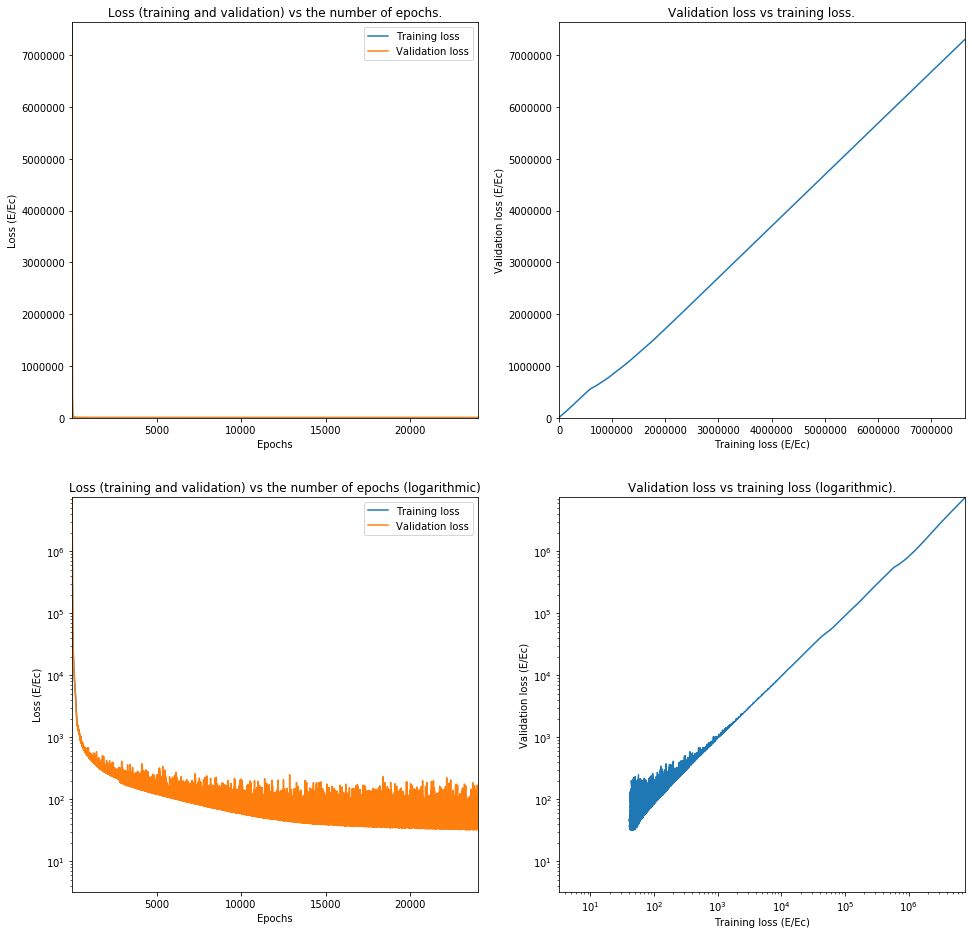

In [24]:
name = 'DenseLayerMediumSoftplus'
settingsNetwork = [inputSize, ['Dense', 2*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=25000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

19576/19576 [==============================] - 0s 10us/step
28.60677836503503


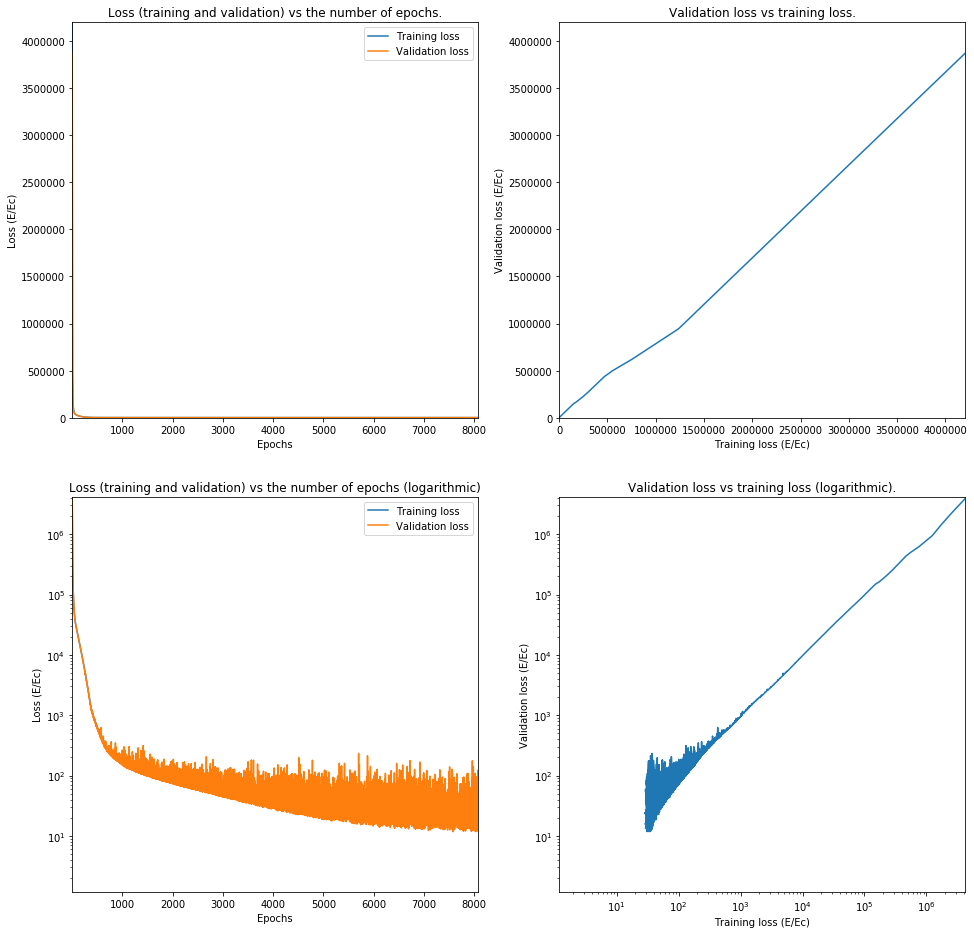

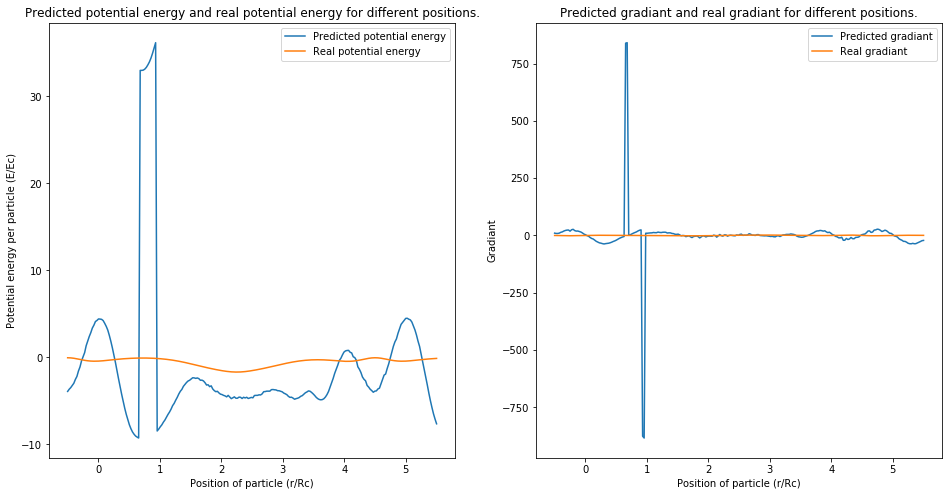

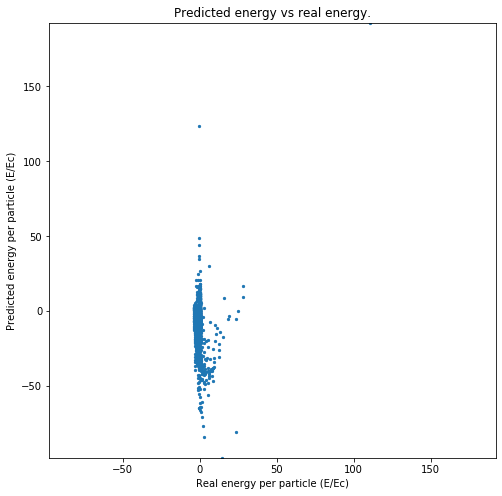

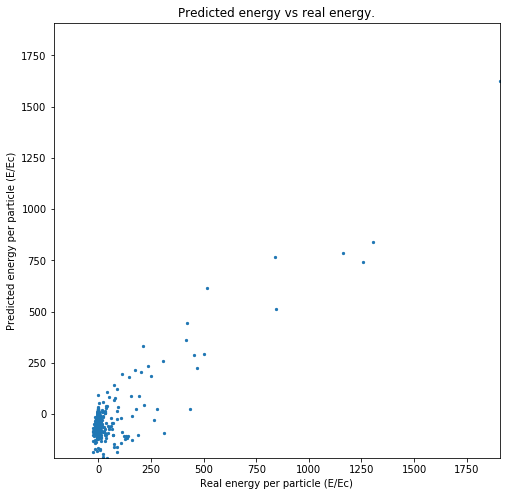

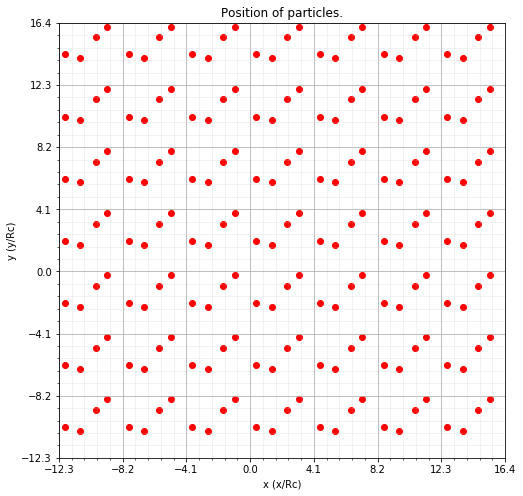

For index 74833 Predicted -29.92916 was -0.2597554968


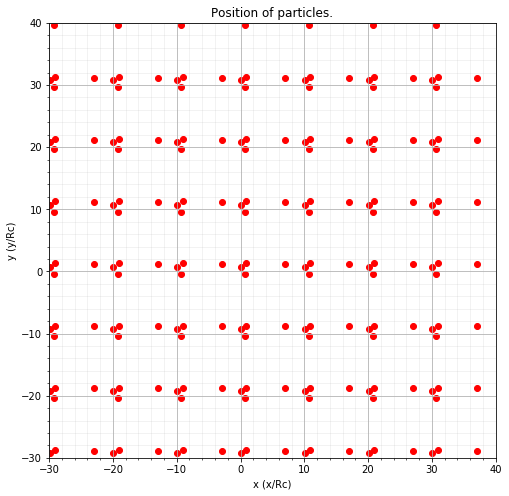

For index 35773 Predicted -13.226033 was -0.3335562019


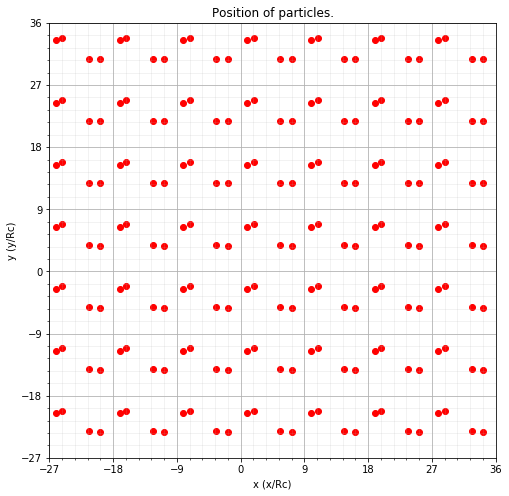

For index 5551 Predicted -10.413533 was -0.1150331337


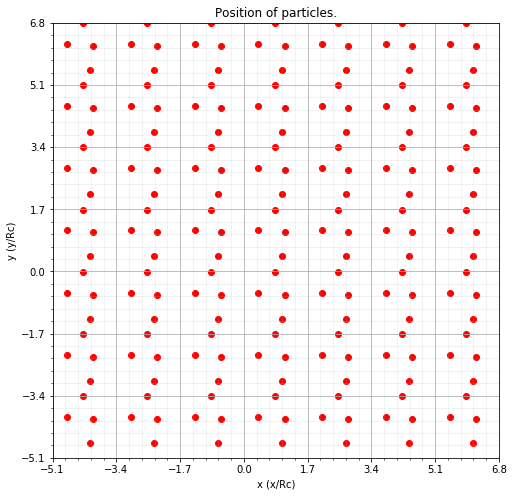

For index 39363 Predicted 1594.2427 was 1556.8077658392


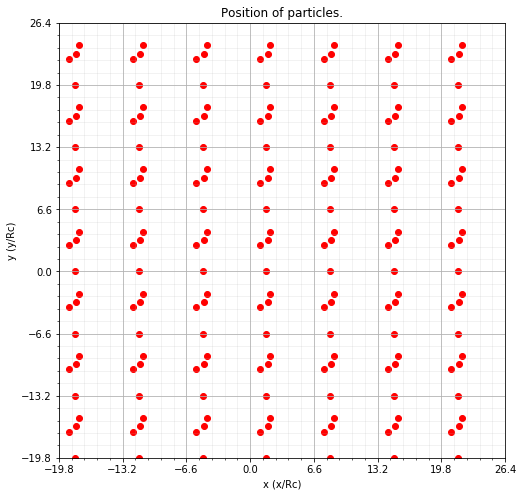

For index 2706 Predicted -20.038534 was -0.6221759978


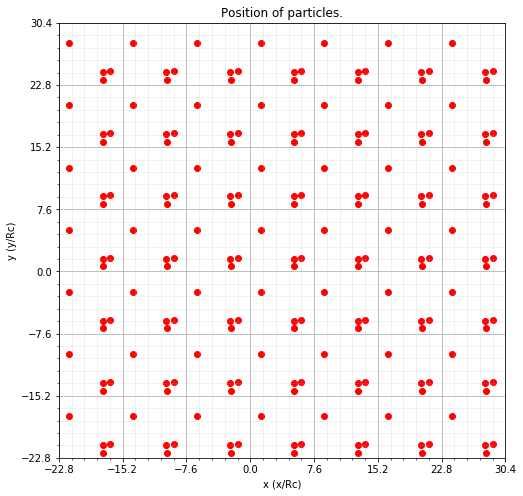

For index 29954 Predicted -17.976034 was -1.0098895203


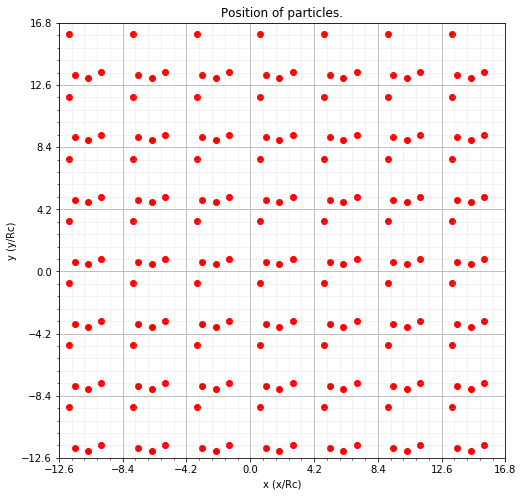

For index 61923 Predicted -20.569784 was -0.7630583212000001


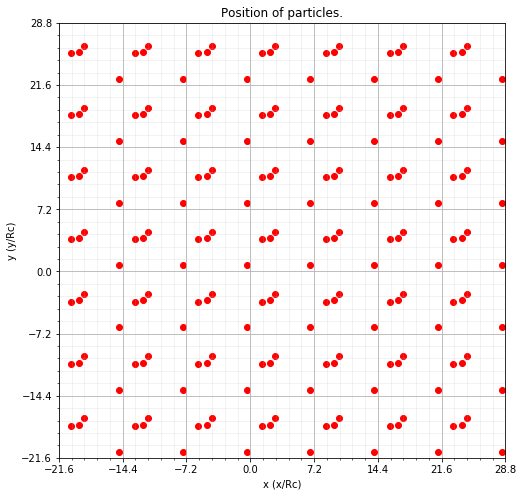

For index 65357 Predicted -21.382284 was -0.6674631693


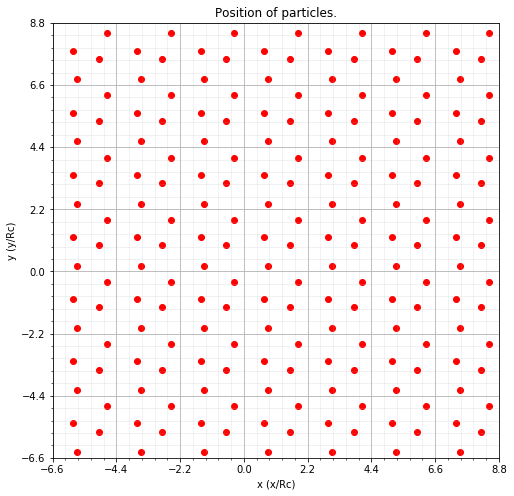

For index 89024 Predicted -23.444784 was -7.6946347464


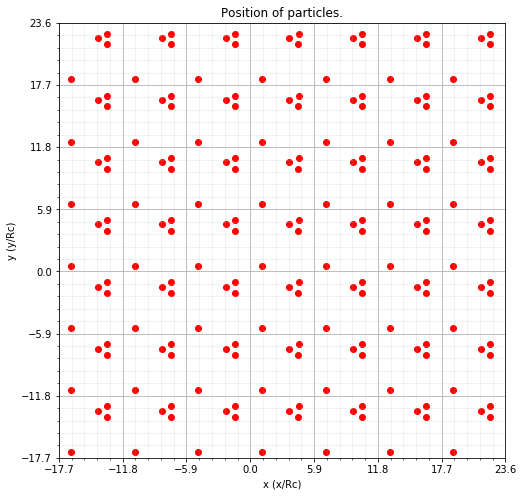

For index 1996 Predicted -29.194784 was -1.3010053557


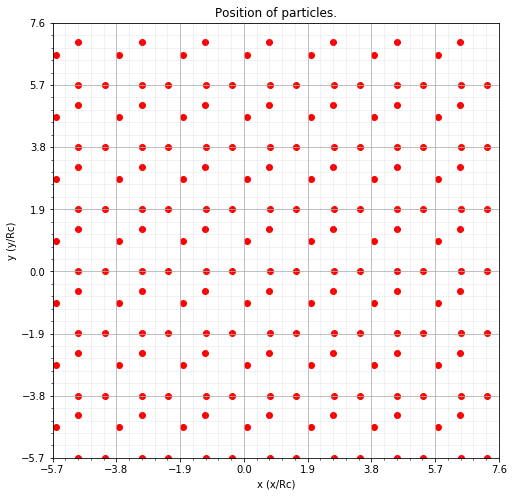

For index 36369 Predicted 57.492718 was 46.4097302903
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_23 (Dense)             (None, 32)                544       
_________________________________________________________________
dense_24 (Dense)             (None, 1)                 33        
Total params: 577
Trainable params: 577
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[ 2.36670941e-01, -6.86313152e-01,  5.93009531e-01,
         2.66150713e-01,  5.56043029e-01, -3.69633436e-01,
        -1.95511073e-01,  2.94885039e-01, -2.35402048e-01,
         3.55330378e-01, -5.40737391e-01, -3.96701574e-01,
        -2.34062120e-01,  2.74645030e-01,  5.92573062e-02,
         6.18939362e-02, -3.49617273e-01,  2.06447408e-01,
        -1.02422893e-01,  3.62619698e-01, -4.49636996e-01,
         7.99531281e-01, -5.90945780e-0

In [25]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Model 3: 1 Dense layer large softplus

In [ ]:
name = 'DenseLayerLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 3*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Model 4: 1 Dense layer super large softplus

In [ ]:
name = 'DenseLayerSuperLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 4*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 5: 2 Dense layers small softplus

In [ ]:
name = 'TwoDenseLayerSmallSoftplus'
settingsNetwork = [inputSize, ['Dense', inputSize, 'softplus', True], ['Dense', inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=25000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 6: 2 Dense layer medium softplus

In [ ]:
name = 'TwoDenseLayerMediumSoftplus'
settingsNetwork = [inputSize, ['Dense', 2*inputSize, 'softplus', True], ['Dense', 2*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 7: 2 Dense layers large softplus

In [ ]:
name = 'TwoDenseLayerLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 3*inputSize, 'softplus', True], ['Dense', 3*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 8: 2 Dense layers very large softplus

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_27 (Dense)             (None, 64)                1088      
_________________________________________________________________
dense_28 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 65        
Total params: 5,313
Trainable params: 5,313
Non-trainable params: 0
_________________________________________________________________
78306/78306 [==============================] - 1s 13us/step
7221967.686997165
Layer 0:  [array([[ 0.17222041,  0.6110688 , -0.5274663 , ...,  0.49187368,
        -0.4711974 ,  0.24565846],
       [ 0.27284747, -0.43291754,  0.33016294, ..., -0.22213507,
        -0.44103184,  0.4963773 ],
       [-0.2103487 , -0.05999631,  0.53842515, ..., -0.5268728 ,
         0.38666195,  0.361

Epoch 35/10000
62644/62644 [==============================] - 2s 36us/step - loss: 11482.8656 - val_loss: 11244.3618
Epoch 36/10000
62644/62644 [==============================] - 2s 36us/step - loss: 11274.7019 - val_loss: 11024.4688
Epoch 37/10000
62644/62644 [==============================] - 2s 36us/step - loss: 11058.6093 - val_loss: 11492.2615
Epoch 38/10000
62644/62644 [==============================] - 2s 36us/step - loss: 10856.2543 - val_loss: 10609.5448
Epoch 39/10000
62644/62644 [==============================] - 2s 35us/step - loss: 10636.0803 - val_loss: 10343.6255
Epoch 40/10000
62644/62644 [==============================] - 2s 36us/step - loss: 10451.1208 - val_loss: 10180.2907
Epoch 41/10000
62644/62644 [==============================] - 2s 36us/step - loss: 10244.0307 - val_loss: 10141.3185
Epoch 42/10000
62644/62644 [==============================] - 2s 38us/step - loss: 10103.8117 - val_loss: 9924.3513
Epoch 43/10000
62644/62644 [==============================] - 2s 

62644/62644 [==============================] - 2s 37us/step - loss: 5522.0231 - val_loss: 5293.4647
Epoch 107/10000
62644/62644 [==============================] - 2s 39us/step - loss: 5467.8379 - val_loss: 5383.2152
Epoch 108/10000
62644/62644 [==============================] - 2s 40us/step - loss: 5440.8414 - val_loss: 5260.0133
Epoch 109/10000
62644/62644 [==============================] - 2s 37us/step - loss: 5405.5680 - val_loss: 5496.9948
Epoch 110/10000
62644/62644 [==============================] - 2s 37us/step - loss: 5382.6237 - val_loss: 5604.7737
Epoch 111/10000
62644/62644 [==============================] - 2s 36us/step - loss: 5342.2588 - val_loss: 5128.4201
Epoch 112/10000
62644/62644 [==============================] - 2s 37us/step - loss: 5276.6924 - val_loss: 5125.1239
Epoch 113/10000
62644/62644 [==============================] - 2s 36us/step - loss: 5270.4891 - val_loss: 5042.7031
Epoch 114/10000
62644/62644 [==============================] - 2s 38us/step - loss: 5204

Epoch 177/10000
62644/62644 [==============================] - 2s 39us/step - loss: 3201.7095 - val_loss: 3009.9805
Epoch 178/10000
62644/62644 [==============================] - 3s 43us/step - loss: 3168.4398 - val_loss: 3798.1774
Epoch 179/10000
62644/62644 [==============================] - 3s 41us/step - loss: 3125.6591 - val_loss: 3077.8692
Epoch 180/10000
62644/62644 [==============================] - 2s 39us/step - loss: 3104.5436 - val_loss: 3173.0651
Epoch 181/10000
62644/62644 [==============================] - 2s 39us/step - loss: 3072.4890 - val_loss: 3171.0621
Epoch 182/10000
62644/62644 [==============================] - 2s 39us/step - loss: 3077.3795 - val_loss: 2921.9190
Epoch 183/10000
62644/62644 [==============================] - 2s 40us/step - loss: 3032.8631 - val_loss: 3353.3808
Epoch 184/10000
62644/62644 [==============================] - 2s 39us/step - loss: 2997.7773 - val_loss: 3146.1462
Epoch 185/10000
62644/62644 [==============================] - 3s 40us/s

62644/62644 [==============================] - 2s 39us/step - loss: 2014.9898 - val_loss: 1921.5551
Epoch 248/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1991.1509 - val_loss: 2690.7641
Epoch 249/10000
62644/62644 [==============================] - 2s 40us/step - loss: 2001.6112 - val_loss: 1973.0650
Epoch 250/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1970.7857 - val_loss: 1896.3433
Epoch 251/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1960.6364 - val_loss: 2800.5894
Epoch 252/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1994.0577 - val_loss: 1983.4116
Epoch 253/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1953.9530 - val_loss: 1881.7180
Epoch 254/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1977.1328 - val_loss: 1866.1189
Epoch 255/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1937

Epoch 318/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1549.7227 - val_loss: 1745.1994
Epoch 319/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1538.6989 - val_loss: 1448.0541
Epoch 320/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1558.5111 - val_loss: 1448.5507
Epoch 321/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1547.3901 - val_loss: 1477.2914
Epoch 322/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1521.9839 - val_loss: 1450.0597
Epoch 323/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1534.5049 - val_loss: 1446.0302
Epoch 324/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1556.9913 - val_loss: 1469.9029
Epoch 325/10000
62644/62644 [==============================] - 3s 42us/step - loss: 1508.5359 - val_loss: 1456.1114
Epoch 326/10000
62644/62644 [==============================] - 3s 42us/s

62644/62644 [==============================] - 3s 41us/step - loss: 1375.3490 - val_loss: 1548.4116
Epoch 389/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1341.2697 - val_loss: 2034.8661
Epoch 390/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1367.7591 - val_loss: 1246.8343
Epoch 391/10000
62644/62644 [==============================] - 3s 42us/step - loss: 1359.4074 - val_loss: 1265.7004
Epoch 392/10000
62644/62644 [==============================] - 2s 40us/step - loss: 1360.9711 - val_loss: 1600.7945
Epoch 393/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1338.9092 - val_loss: 1513.6362
Epoch 394/10000
62644/62644 [==============================] - 2s 40us/step - loss: 1339.6043 - val_loss: 1320.7275
Epoch 395/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1334.0168 - val_loss: 1249.7109
Epoch 396/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1334

Epoch 459/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1186.3460 - val_loss: 1150.6078
Epoch 460/10000
62644/62644 [==============================] - 3s 42us/step - loss: 1173.1216 - val_loss: 1192.1163
Epoch 461/10000
62644/62644 [==============================] - 3s 42us/step - loss: 1199.6907 - val_loss: 1201.5324
Epoch 462/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1186.3040 - val_loss: 1105.8367
Epoch 463/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1189.4104 - val_loss: 1149.5213
Epoch 464/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1186.9566 - val_loss: 1192.1495
Epoch 465/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1202.4909 - val_loss: 1105.7893
Epoch 466/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1182.9753 - val_loss: 1091.6193
Epoch 467/10000
62644/62644 [==============================] - 3s 42us/s

62644/62644 [==============================] - 3s 42us/step - loss: 1111.0975 - val_loss: 1042.8366
Epoch 530/10000
62644/62644 [==============================] - 3s 43us/step - loss: 1096.5061 - val_loss: 1015.4639
Epoch 531/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1111.3639 - val_loss: 1024.9791
Epoch 532/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1116.3161 - val_loss: 1078.1900
Epoch 533/10000
62644/62644 [==============================] - 3s 42us/step - loss: 1099.1827 - val_loss: 1035.4062
Epoch 534/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1113.3504 - val_loss: 1032.5354
Epoch 535/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1107.8081 - val_loss: 1593.2040
Epoch 536/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1100.1915 - val_loss: 1010.2058
Epoch 537/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1115

Epoch 600/10000
62644/62644 [==============================] - 3s 42us/step - loss: 1042.2470 - val_loss: 1199.2848
Epoch 601/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1024.4311 - val_loss: 945.1674
Epoch 602/10000
62644/62644 [==============================] - 2s 39us/step - loss: 1025.1747 - val_loss: 934.0516
Epoch 603/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1019.7931 - val_loss: 959.6265
Epoch 604/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1017.7240 - val_loss: 1218.4127
Epoch 605/10000
62644/62644 [==============================] - 3s 40us/step - loss: 1030.4187 - val_loss: 1007.9406
Epoch 606/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1019.4474 - val_loss: 949.6336
Epoch 607/10000
62644/62644 [==============================] - 3s 41us/step - loss: 1014.2994 - val_loss: 1158.5082
Epoch 608/10000
62644/62644 [==============================] - 3s 41us/step 

62644/62644 [==============================] - 3s 41us/step - loss: 952.5327 - val_loss: 1273.1297
Epoch 672/10000
62644/62644 [==============================] - 3s 43us/step - loss: 954.8446 - val_loss: 889.0817
Epoch 673/10000
62644/62644 [==============================] - 3s 41us/step - loss: 944.9238 - val_loss: 888.0628
Epoch 674/10000
62644/62644 [==============================] - 3s 40us/step - loss: 965.6014 - val_loss: 949.2088
Epoch 675/10000
62644/62644 [==============================] - 3s 41us/step - loss: 946.5496 - val_loss: 863.7328
Epoch 676/10000
62644/62644 [==============================] - 3s 40us/step - loss: 958.2758 - val_loss: 839.2034
Epoch 677/10000
62644/62644 [==============================] - 3s 40us/step - loss: 948.1547 - val_loss: 891.5188
Epoch 678/10000
62644/62644 [==============================] - 3s 43us/step - loss: 948.3337 - val_loss: 1048.8421
Epoch 679/10000
62644/62644 [==============================] - 3s 41us/step - loss: 965.5996 - val_los

Epoch 743/10000
62644/62644 [==============================] - 3s 41us/step - loss: 898.0921 - val_loss: 884.1487
Epoch 744/10000
62644/62644 [==============================] - 3s 42us/step - loss: 897.5730 - val_loss: 814.9523
Epoch 745/10000
62644/62644 [==============================] - 3s 46us/step - loss: 892.1350 - val_loss: 852.5029
Epoch 746/10000
62644/62644 [==============================] - 3s 46us/step - loss: 889.8818 - val_loss: 826.2020
Epoch 747/10000
62644/62644 [==============================] - 3s 40us/step - loss: 867.2738 - val_loss: 808.7551
Epoch 748/10000
62644/62644 [==============================] - 2s 40us/step - loss: 880.1039 - val_loss: 985.1021
Epoch 749/10000
62644/62644 [==============================] - 3s 42us/step - loss: 897.8447 - val_loss: 820.5910
Epoch 750/10000
62644/62644 [==============================] - 3s 41us/step - loss: 898.0315 - val_loss: 902.8770
Epoch 751/10000
62644/62644 [==============================] - 3s 41us/step - loss: 916.

Epoch 815/10000
62644/62644 [==============================] - 3s 41us/step - loss: 856.0813 - val_loss: 741.4117
Epoch 816/10000
62644/62644 [==============================] - 3s 42us/step - loss: 842.5239 - val_loss: 957.5546
Epoch 817/10000
62644/62644 [==============================] - 3s 41us/step - loss: 840.3859 - val_loss: 760.5941
Epoch 818/10000
62644/62644 [==============================] - 2s 40us/step - loss: 846.0809 - val_loss: 743.6199
Epoch 819/10000
62644/62644 [==============================] - 2s 40us/step - loss: 841.5731 - val_loss: 760.3533
Epoch 820/10000
62644/62644 [==============================] - 3s 41us/step - loss: 855.1540 - val_loss: 878.8386
Epoch 821/10000
62644/62644 [==============================] - 3s 40us/step - loss: 832.6017 - val_loss: 984.3451
Epoch 822/10000
62644/62644 [==============================] - 2s 39us/step - loss: 846.4144 - val_loss: 769.3907
Epoch 823/10000
62644/62644 [==============================] - 3s 40us/step - loss: 831.

Epoch 887/10000
62644/62644 [==============================] - 2s 40us/step - loss: 789.4111 - val_loss: 1135.4132
Epoch 888/10000
62644/62644 [==============================] - 2s 39us/step - loss: 799.3614 - val_loss: 685.9392
Epoch 889/10000
62644/62644 [==============================] - 3s 41us/step - loss: 793.5168 - val_loss: 735.7535
Epoch 890/10000
62644/62644 [==============================] - 2s 39us/step - loss: 818.7982 - val_loss: 815.8646
Epoch 891/10000
62644/62644 [==============================] - 2s 40us/step - loss: 806.2634 - val_loss: 728.8869
Epoch 892/10000
62644/62644 [==============================] - 2s 39us/step - loss: 790.5973 - val_loss: 778.5756
Epoch 893/10000
62644/62644 [==============================] - 3s 41us/step - loss: 794.6734 - val_loss: 993.3009
Epoch 894/10000
62644/62644 [==============================] - 3s 40us/step - loss: 809.1881 - val_loss: 717.6051
Epoch 895/10000
62644/62644 [==============================] - 2s 39us/step - loss: 813

Epoch 959/10000
62644/62644 [==============================] - 2s 40us/step - loss: 754.3970 - val_loss: 748.1493
Epoch 960/10000
62644/62644 [==============================] - 3s 40us/step - loss: 795.8795 - val_loss: 796.7750
Epoch 961/10000
62644/62644 [==============================] - 2s 40us/step - loss: 781.4647 - val_loss: 711.7980
Epoch 962/10000
62644/62644 [==============================] - 3s 41us/step - loss: 759.4580 - val_loss: 671.9729
Epoch 963/10000
62644/62644 [==============================] - 3s 41us/step - loss: 773.6571 - val_loss: 829.8702
Epoch 964/10000
62644/62644 [==============================] - 3s 40us/step - loss: 766.1903 - val_loss: 811.5781
Epoch 965/10000
62644/62644 [==============================] - 2s 40us/step - loss: 759.8692 - val_loss: 679.5079
Epoch 966/10000
62644/62644 [==============================] - 3s 41us/step - loss: 772.1068 - val_loss: 839.7990
Epoch 967/10000
62644/62644 [==============================] - 2s 39us/step - loss: 772.

62644/62644 [==============================] - 3s 41us/step - loss: 730.7294 - val_loss: 708.4370
Epoch 1031/10000
62644/62644 [==============================] - 2s 39us/step - loss: 735.5316 - val_loss: 705.0795
Epoch 1032/10000
62644/62644 [==============================] - 3s 40us/step - loss: 723.8689 - val_loss: 627.1456
Epoch 1033/10000
62644/62644 [==============================] - 3s 40us/step - loss: 723.3125 - val_loss: 706.8823
Epoch 1034/10000
62644/62644 [==============================] - 2s 40us/step - loss: 723.3723 - val_loss: 635.9268
Epoch 1035/10000
62644/62644 [==============================] - 2s 39us/step - loss: 736.3211 - val_loss: 687.0434
Epoch 1036/10000
62644/62644 [==============================] - 3s 41us/step - loss: 721.6213 - val_loss: 647.0135
Epoch 1037/10000
62644/62644 [==============================] - 3s 41us/step - loss: 720.8819 - val_loss: 686.4320
Epoch 1038/10000
62644/62644 [==============================] - 3s 41us/step - loss: 734.9557 - v

62644/62644 [==============================] - 3s 41us/step - loss: 705.5021 - val_loss: 638.1610
Epoch 1102/10000
62644/62644 [==============================] - 3s 40us/step - loss: 689.6713 - val_loss: 598.5730
Epoch 1103/10000
62644/62644 [==============================] - 3s 40us/step - loss: 698.2780 - val_loss: 625.0255
Epoch 1104/10000
62644/62644 [==============================] - 3s 41us/step - loss: 696.1596 - val_loss: 725.2897
Epoch 1105/10000
62644/62644 [==============================] - 3s 42us/step - loss: 696.4160 - val_loss: 601.4940
Epoch 1106/10000
62644/62644 [==============================] - 3s 43us/step - loss: 696.7162 - val_loss: 664.0629
Epoch 1107/10000
62644/62644 [==============================] - 2s 40us/step - loss: 698.6115 - val_loss: 660.4815
Epoch 1108/10000
62644/62644 [==============================] - 2s 39us/step - loss: 686.5405 - val_loss: 606.0687
Epoch 1109/10000
62644/62644 [==============================] - 2s 39us/step - loss: 695.1761 - v

62644/62644 [==============================] - 3s 41us/step - loss: 685.9067 - val_loss: 927.5782
Epoch 1173/10000
62644/62644 [==============================] - 3s 41us/step - loss: 656.8985 - val_loss: 623.6457
Epoch 1174/10000
62644/62644 [==============================] - 3s 40us/step - loss: 656.6386 - val_loss: 653.8552
Epoch 1175/10000
62644/62644 [==============================] - 3s 42us/step - loss: 654.8691 - val_loss: 1001.5939
Epoch 1176/10000
62644/62644 [==============================] - 3s 41us/step - loss: 673.9178 - val_loss: 602.8925
Epoch 1177/10000
62644/62644 [==============================] - 3s 40us/step - loss: 683.1077 - val_loss: 727.1191
Epoch 1178/10000
62644/62644 [==============================] - 3s 41us/step - loss: 660.2239 - val_loss: 571.0008
Epoch 1179/10000
62644/62644 [==============================] - 3s 41us/step - loss: 672.5159 - val_loss: 613.9460
Epoch 1180/10000
62644/62644 [==============================] - 3s 40us/step - loss: 673.5446 - 

62644/62644 [==============================] - 3s 41us/step - loss: 648.5740 - val_loss: 643.0499
Epoch 1244/10000
62644/62644 [==============================] - 3s 41us/step - loss: 659.0727 - val_loss: 750.2486
Epoch 1245/10000
62644/62644 [==============================] - 2s 40us/step - loss: 635.7900 - val_loss: 593.9902
Epoch 1246/10000
62644/62644 [==============================] - 2s 40us/step - loss: 639.4646 - val_loss: 851.0943
Epoch 1247/10000
62644/62644 [==============================] - 2s 40us/step - loss: 642.4438 - val_loss: 644.1053
Epoch 1248/10000
62644/62644 [==============================] - 2s 40us/step - loss: 650.2975 - val_loss: 1292.0623
Epoch 1249/10000
62644/62644 [==============================] - 3s 40us/step - loss: 649.0475 - val_loss: 806.8520
Epoch 1250/10000
62644/62644 [==============================] - 3s 40us/step - loss: 663.4541 - val_loss: 848.5151
Epoch 1251/10000
62644/62644 [==============================] - 2s 39us/step - loss: 647.0664 - 

62644/62644 [==============================] - 3s 40us/step - loss: 618.9958 - val_loss: 583.9937
Epoch 1315/10000
62644/62644 [==============================] - 3s 41us/step - loss: 607.1238 - val_loss: 563.2438
Epoch 1316/10000
62644/62644 [==============================] - 3s 42us/step - loss: 605.7632 - val_loss: 575.5704
Epoch 1317/10000
62644/62644 [==============================] - 3s 42us/step - loss: 628.3516 - val_loss: 569.7929
Epoch 1318/10000
62644/62644 [==============================] - 2s 40us/step - loss: 614.8451 - val_loss: 633.4345
Epoch 1319/10000
62644/62644 [==============================] - 2s 40us/step - loss: 622.1587 - val_loss: 573.5273
Epoch 1320/10000
62644/62644 [==============================] - 2s 40us/step - loss: 618.9720 - val_loss: 613.9555
Epoch 1321/10000
62644/62644 [==============================] - 3s 41us/step - loss: 613.6831 - val_loss: 1267.1572
Epoch 1322/10000
62644/62644 [==============================] - 3s 40us/step - loss: 620.7699 - 

62644/62644 [==============================] - 3s 40us/step - loss: 607.5116 - val_loss: 580.2034
Epoch 1386/10000
62644/62644 [==============================] - 3s 42us/step - loss: 590.8971 - val_loss: 571.6525
Epoch 1387/10000
62644/62644 [==============================] - 3s 41us/step - loss: 589.9825 - val_loss: 663.2413
Epoch 1388/10000
62644/62644 [==============================] - 2s 39us/step - loss: 595.8607 - val_loss: 512.7399
Epoch 1389/10000
62644/62644 [==============================] - 3s 40us/step - loss: 605.1425 - val_loss: 1176.8230
Epoch 1390/10000
62644/62644 [==============================] - 2s 40us/step - loss: 588.6430 - val_loss: 583.3932
Epoch 1391/10000
62644/62644 [==============================] - 3s 41us/step - loss: 605.3194 - val_loss: 504.9823
Epoch 1392/10000
62644/62644 [==============================] - 2s 39us/step - loss: 584.6329 - val_loss: 494.8423
Epoch 1393/10000
62644/62644 [==============================] - 3s 41us/step - loss: 609.8106 - 

62644/62644 [==============================] - 3s 41us/step - loss: 577.8762 - val_loss: 538.4854
Epoch 1457/10000
62644/62644 [==============================] - 3s 41us/step - loss: 589.9900 - val_loss: 613.6658
Epoch 1458/10000
62644/62644 [==============================] - 3s 41us/step - loss: 578.7392 - val_loss: 615.5380
Epoch 1459/10000
62644/62644 [==============================] - 2s 40us/step - loss: 587.0360 - val_loss: 804.7376
Epoch 1460/10000
62644/62644 [==============================] - 3s 40us/step - loss: 569.5253 - val_loss: 534.4774
Epoch 1461/10000
62644/62644 [==============================] - 3s 40us/step - loss: 601.5197 - val_loss: 808.3091
Epoch 1462/10000
62644/62644 [==============================] - 3s 40us/step - loss: 586.8650 - val_loss: 515.1503
Epoch 1463/10000
62644/62644 [==============================] - 3s 40us/step - loss: 587.3811 - val_loss: 500.4945
Epoch 1464/10000
62644/62644 [==============================] - 3s 41us/step - loss: 581.2040 - v

62644/62644 [==============================] - 3s 42us/step - loss: 555.8054 - val_loss: 508.3819
Epoch 1528/10000
62644/62644 [==============================] - 3s 43us/step - loss: 563.6915 - val_loss: 660.9412
Epoch 1529/10000
62644/62644 [==============================] - 3s 41us/step - loss: 551.8428 - val_loss: 493.6830
Epoch 1530/10000
62644/62644 [==============================] - 3s 41us/step - loss: 551.8845 - val_loss: 554.5999
Epoch 1531/10000
62644/62644 [==============================] - 3s 40us/step - loss: 565.9172 - val_loss: 574.4914
Epoch 1532/10000
62644/62644 [==============================] - 3s 41us/step - loss: 570.2349 - val_loss: 542.1789
Epoch 1533/10000
62644/62644 [==============================] - 3s 40us/step - loss: 575.5620 - val_loss: 659.6061
Epoch 1534/10000
62644/62644 [==============================] - 3s 40us/step - loss: 563.5549 - val_loss: 464.1678
Epoch 1535/10000
62644/62644 [==============================] - 3s 41us/step - loss: 550.6181 - v

62644/62644 [==============================] - 2s 40us/step - loss: 548.2679 - val_loss: 459.3032
Epoch 1599/10000
62644/62644 [==============================] - 3s 41us/step - loss: 563.9814 - val_loss: 575.9351
Epoch 1600/10000
62644/62644 [==============================] - 3s 41us/step - loss: 540.1630 - val_loss: 490.3666
Epoch 1601/10000
62644/62644 [==============================] - 3s 42us/step - loss: 547.0691 - val_loss: 544.4403
Epoch 1602/10000
62644/62644 [==============================] - 2s 39us/step - loss: 554.8929 - val_loss: 1050.1149
Epoch 1603/10000
62644/62644 [==============================] - 2s 39us/step - loss: 560.1221 - val_loss: 449.2621
Epoch 1604/10000
62644/62644 [==============================] - 3s 40us/step - loss: 541.4041 - val_loss: 493.1516
Epoch 1605/10000
62644/62644 [==============================] - 2s 40us/step - loss: 543.0481 - val_loss: 504.4228
Epoch 1606/10000
62644/62644 [==============================] - 2s 39us/step - loss: 556.5764 - 

62644/62644 [==============================] - 3s 41us/step - loss: 522.7396 - val_loss: 760.2344
Epoch 1670/10000
62644/62644 [==============================] - 3s 43us/step - loss: 523.3509 - val_loss: 487.7680
Epoch 1671/10000
62644/62644 [==============================] - 3s 44us/step - loss: 533.1184 - val_loss: 456.7145
Epoch 1672/10000
62644/62644 [==============================] - 3s 42us/step - loss: 520.9118 - val_loss: 506.5512
Epoch 1673/10000
62644/62644 [==============================] - 3s 43us/step - loss: 518.5568 - val_loss: 479.4745
Epoch 1674/10000
62644/62644 [==============================] - 3s 40us/step - loss: 528.2411 - val_loss: 600.6416
Epoch 1675/10000
62644/62644 [==============================] - 3s 41us/step - loss: 522.0034 - val_loss: 539.8414
Epoch 1676/10000
62644/62644 [==============================] - 3s 41us/step - loss: 539.7841 - val_loss: 505.5426
Epoch 1677/10000
62644/62644 [==============================] - 3s 42us/step - loss: 524.7784 - v

62644/62644 [==============================] - 3s 41us/step - loss: 511.9707 - val_loss: 619.1812
Epoch 1741/10000
62644/62644 [==============================] - 3s 41us/step - loss: 516.3150 - val_loss: 412.6345
Epoch 1742/10000
62644/62644 [==============================] - 3s 41us/step - loss: 500.4403 - val_loss: 433.8709
Epoch 1743/10000
62644/62644 [==============================] - 3s 42us/step - loss: 514.1264 - val_loss: 514.5865
Epoch 1744/10000
62644/62644 [==============================] - 3s 41us/step - loss: 509.1710 - val_loss: 533.2330
Epoch 1745/10000
62644/62644 [==============================] - 3s 42us/step - loss: 499.3653 - val_loss: 487.2489
Epoch 1746/10000
62644/62644 [==============================] - 3s 40us/step - loss: 505.8744 - val_loss: 796.2295
Epoch 1747/10000
62644/62644 [==============================] - 3s 40us/step - loss: 498.1781 - val_loss: 616.2106
Epoch 1748/10000
62644/62644 [==============================] - 3s 41us/step - loss: 503.4657 - v

62644/62644 [==============================] - 3s 43us/step - loss: 490.6948 - val_loss: 399.6245
Epoch 1812/10000
62644/62644 [==============================] - 3s 42us/step - loss: 489.2374 - val_loss: 408.8500
Epoch 1813/10000
62644/62644 [==============================] - 3s 41us/step - loss: 497.6801 - val_loss: 451.4718
Epoch 1814/10000
62644/62644 [==============================] - 2s 40us/step - loss: 493.6128 - val_loss: 439.3059
Epoch 1815/10000
62644/62644 [==============================] - 3s 41us/step - loss: 500.1900 - val_loss: 425.8364
Epoch 1816/10000
62644/62644 [==============================] - 3s 41us/step - loss: 475.1077 - val_loss: 544.1117
Epoch 1817/10000
62644/62644 [==============================] - 3s 41us/step - loss: 474.0153 - val_loss: 464.5877
Epoch 1818/10000
62644/62644 [==============================] - 2s 40us/step - loss: 478.4933 - val_loss: 397.8086
Epoch 1819/10000
62644/62644 [==============================] - 3s 42us/step - loss: 504.5839 - v

62644/62644 [==============================] - 3s 41us/step - loss: 469.7628 - val_loss: 515.2505
Epoch 1883/10000
62644/62644 [==============================] - 3s 41us/step - loss: 513.0221 - val_loss: 807.0112
Epoch 1884/10000
62644/62644 [==============================] - 3s 42us/step - loss: 462.7452 - val_loss: 395.9093
Epoch 1885/10000
62644/62644 [==============================] - 3s 42us/step - loss: 481.8376 - val_loss: 573.8627
Epoch 1886/10000
62644/62644 [==============================] - 3s 42us/step - loss: 489.6016 - val_loss: 375.8803
Epoch 1887/10000
62644/62644 [==============================] - 3s 40us/step - loss: 482.8969 - val_loss: 478.3738
Epoch 1888/10000
62644/62644 [==============================] - 3s 41us/step - loss: 479.3554 - val_loss: 596.4808
Epoch 1889/10000
62644/62644 [==============================] - 2s 39us/step - loss: 478.7822 - val_loss: 372.8897
Epoch 1890/10000
62644/62644 [==============================] - 3s 41us/step - loss: 467.5059 - v

62644/62644 [==============================] - 3s 41us/step - loss: 469.8768 - val_loss: 885.6829
Epoch 1954/10000
62644/62644 [==============================] - 3s 41us/step - loss: 462.4270 - val_loss: 396.8667
Epoch 1955/10000
62644/62644 [==============================] - 3s 41us/step - loss: 463.2454 - val_loss: 380.2225
Epoch 1956/10000
62644/62644 [==============================] - 3s 41us/step - loss: 460.2350 - val_loss: 387.4757
Epoch 1957/10000
62644/62644 [==============================] - 2s 39us/step - loss: 448.6555 - val_loss: 362.1811
Epoch 1958/10000
62644/62644 [==============================] - 3s 41us/step - loss: 464.4114 - val_loss: 369.9141
Epoch 1959/10000
62644/62644 [==============================] - 3s 41us/step - loss: 458.5069 - val_loss: 374.6088
Epoch 1960/10000
62644/62644 [==============================] - 3s 41us/step - loss: 442.2993 - val_loss: 543.3687
Epoch 1961/10000
62644/62644 [==============================] - 2s 39us/step - loss: 462.5843 - v

62644/62644 [==============================] - 2s 40us/step - loss: 440.0762 - val_loss: 400.0815
Epoch 2025/10000
62644/62644 [==============================] - 3s 40us/step - loss: 443.8826 - val_loss: 495.5784
Epoch 2026/10000
62644/62644 [==============================] - 3s 41us/step - loss: 457.1166 - val_loss: 408.2524
Epoch 2027/10000
62644/62644 [==============================] - 3s 41us/step - loss: 428.5869 - val_loss: 498.2522
Epoch 2028/10000
62644/62644 [==============================] - 3s 40us/step - loss: 454.4616 - val_loss: 386.7811
Epoch 2029/10000
62644/62644 [==============================] - 3s 40us/step - loss: 440.1012 - val_loss: 583.7277
Epoch 2030/10000
62644/62644 [==============================] - 2s 40us/step - loss: 432.3537 - val_loss: 345.6916
Epoch 2031/10000
62644/62644 [==============================] - 2s 39us/step - loss: 462.2003 - val_loss: 380.1406
Epoch 2032/10000
62644/62644 [==============================] - 2s 39us/step - loss: 461.1281 - v

62644/62644 [==============================] - 3s 42us/step - loss: 428.2672 - val_loss: 457.9588
Epoch 2096/10000
62644/62644 [==============================] - 3s 42us/step - loss: 448.7817 - val_loss: 343.1559
Epoch 2097/10000
62644/62644 [==============================] - 3s 42us/step - loss: 418.5064 - val_loss: 525.6784
Epoch 2098/10000
62644/62644 [==============================] - 2s 40us/step - loss: 455.0372 - val_loss: 340.0542
Epoch 2099/10000
62644/62644 [==============================] - 3s 41us/step - loss: 419.1130 - val_loss: 350.3247
Epoch 2100/10000
62644/62644 [==============================] - 3s 42us/step - loss: 440.9730 - val_loss: 351.3765
Epoch 2101/10000
62644/62644 [==============================] - 3s 41us/step - loss: 432.4392 - val_loss: 537.8185
Epoch 2102/10000
62644/62644 [==============================] - 3s 42us/step - loss: 413.9641 - val_loss: 911.1792
Epoch 2103/10000
62644/62644 [==============================] - 3s 41us/step - loss: 450.5428 - v

62644/62644 [==============================] - 3s 47us/step - loss: 412.2780 - val_loss: 322.5824
Epoch 2167/10000
62644/62644 [==============================] - 3s 47us/step - loss: 409.2459 - val_loss: 451.3531
Epoch 2168/10000
62644/62644 [==============================] - 3s 47us/step - loss: 415.2518 - val_loss: 376.4541
Epoch 2169/10000
62644/62644 [==============================] - 3s 48us/step - loss: 402.9093 - val_loss: 388.4665
Epoch 2170/10000
62644/62644 [==============================] - 3s 48us/step - loss: 436.3339 - val_loss: 420.7641
Epoch 2171/10000
62644/62644 [==============================] - 3s 47us/step - loss: 403.7331 - val_loss: 430.7375
Epoch 2172/10000
62644/62644 [==============================] - 3s 46us/step - loss: 412.9483 - val_loss: 557.9042
Epoch 2173/10000
62644/62644 [==============================] - 3s 42us/step - loss: 424.7777 - val_loss: 316.7290
Epoch 2174/10000
62644/62644 [==============================] - 3s 41us/step - loss: 411.4722 - v

62644/62644 [==============================] - 3s 40us/step - loss: 392.4973 - val_loss: 382.6790
Epoch 2238/10000
62644/62644 [==============================] - 3s 40us/step - loss: 416.7048 - val_loss: 574.3211
Epoch 2239/10000
62644/62644 [==============================] - 3s 40us/step - loss: 406.7236 - val_loss: 410.2471
Epoch 2240/10000
62644/62644 [==============================] - 3s 40us/step - loss: 426.4917 - val_loss: 356.5089
Epoch 2241/10000
62644/62644 [==============================] - 2s 40us/step - loss: 390.6649 - val_loss: 343.6504
Epoch 2242/10000
62644/62644 [==============================] - 2s 39us/step - loss: 404.9823 - val_loss: 338.9745
Epoch 2243/10000
62644/62644 [==============================] - 3s 41us/step - loss: 404.9136 - val_loss: 327.6317
Epoch 2244/10000
62644/62644 [==============================] - 3s 41us/step - loss: 389.5970 - val_loss: 315.0813
Epoch 2245/10000
62644/62644 [==============================] - 3s 41us/step - loss: 401.2596 - v

62644/62644 [==============================] - 3s 40us/step - loss: 393.6709 - val_loss: 299.7787
Epoch 2309/10000
62644/62644 [==============================] - 3s 41us/step - loss: 390.5492 - val_loss: 710.6119
Epoch 2310/10000
62644/62644 [==============================] - 3s 40us/step - loss: 407.9829 - val_loss: 308.0167
Epoch 2311/10000
62644/62644 [==============================] - 3s 43us/step - loss: 398.3392 - val_loss: 561.8981
Epoch 2312/10000
62644/62644 [==============================] - 3s 47us/step - loss: 391.8863 - val_loss: 620.1711
Epoch 2313/10000
62644/62644 [==============================] - 3s 42us/step - loss: 395.7846 - val_loss: 336.8676
Epoch 2314/10000
62644/62644 [==============================] - 3s 41us/step - loss: 400.3782 - val_loss: 368.6251
Epoch 2315/10000
62644/62644 [==============================] - 2s 40us/step - loss: 403.6665 - val_loss: 314.6565
Epoch 2316/10000
62644/62644 [==============================] - 3s 41us/step - loss: 410.2772 - v

62644/62644 [==============================] - 3s 41us/step - loss: 388.2336 - val_loss: 776.8135
Epoch 2380/10000
62644/62644 [==============================] - 3s 40us/step - loss: 385.0514 - val_loss: 313.7104
Epoch 2381/10000
62644/62644 [==============================] - 2s 40us/step - loss: 378.6771 - val_loss: 348.8165
Epoch 2382/10000
62644/62644 [==============================] - 2s 40us/step - loss: 383.6522 - val_loss: 311.1630
Epoch 2383/10000
62644/62644 [==============================] - 3s 40us/step - loss: 397.2879 - val_loss: 313.1266
Epoch 2384/10000
62644/62644 [==============================] - 3s 40us/step - loss: 381.7908 - val_loss: 473.1183
Epoch 2385/10000
62644/62644 [==============================] - 2s 40us/step - loss: 387.5678 - val_loss: 320.8350
Epoch 2386/10000
62644/62644 [==============================] - 3s 42us/step - loss: 392.2985 - val_loss: 388.7748
Epoch 2387/10000
62644/62644 [==============================] - 3s 40us/step - loss: 400.2414 - v

62644/62644 [==============================] - 3s 41us/step - loss: 387.6763 - val_loss: 367.0917
Epoch 2451/10000
62644/62644 [==============================] - 3s 41us/step - loss: 371.6826 - val_loss: 293.8750
Epoch 2452/10000
62644/62644 [==============================] - 3s 41us/step - loss: 393.9330 - val_loss: 385.6730
Epoch 2453/10000
62644/62644 [==============================] - 3s 41us/step - loss: 387.0810 - val_loss: 418.5722
Epoch 2454/10000
62644/62644 [==============================] - 3s 41us/step - loss: 384.9020 - val_loss: 279.9429
Epoch 2455/10000
62644/62644 [==============================] - 3s 40us/step - loss: 378.7368 - val_loss: 384.9104
Epoch 2456/10000
62644/62644 [==============================] - 3s 40us/step - loss: 380.7162 - val_loss: 334.3501
Epoch 2457/10000
62644/62644 [==============================] - 3s 41us/step - loss: 392.3901 - val_loss: 297.8732
Epoch 2458/10000
62644/62644 [==============================] - 3s 42us/step - loss: 365.6163 - v

62644/62644 [==============================] - 3s 40us/step - loss: 372.4263 - val_loss: 405.0887
Epoch 2522/10000
62644/62644 [==============================] - 2s 40us/step - loss: 371.4532 - val_loss: 302.4274
Epoch 2523/10000
62644/62644 [==============================] - 3s 40us/step - loss: 388.2781 - val_loss: 369.7160
Epoch 2524/10000
62644/62644 [==============================] - 3s 42us/step - loss: 369.3302 - val_loss: 296.5039
Epoch 2525/10000
62644/62644 [==============================] - 3s 41us/step - loss: 371.0040 - val_loss: 462.0534
Epoch 2526/10000
62644/62644 [==============================] - 3s 40us/step - loss: 357.7558 - val_loss: 312.1724
Epoch 2527/10000
62644/62644 [==============================] - 3s 41us/step - loss: 365.0604 - val_loss: 491.5310
Epoch 2528/10000
62644/62644 [==============================] - 2s 40us/step - loss: 376.4440 - val_loss: 294.1030
Epoch 2529/10000
62644/62644 [==============================] - 2s 39us/step - loss: 371.5157 - v

62644/62644 [==============================] - 3s 41us/step - loss: 357.1263 - val_loss: 314.7899
Epoch 2593/10000
62644/62644 [==============================] - 3s 42us/step - loss: 374.8904 - val_loss: 323.3361
Epoch 2594/10000
62644/62644 [==============================] - 3s 40us/step - loss: 356.0562 - val_loss: 447.8093
Epoch 2595/10000
62644/62644 [==============================] - 3s 41us/step - loss: 376.0278 - val_loss: 312.8548
Epoch 2596/10000
62644/62644 [==============================] - 3s 41us/step - loss: 363.2210 - val_loss: 1289.0925
Epoch 2597/10000
62644/62644 [==============================] - 3s 40us/step - loss: 344.4986 - val_loss: 293.2805
Epoch 2598/10000
62644/62644 [==============================] - 3s 40us/step - loss: 359.7080 - val_loss: 282.4333
Epoch 2599/10000
62644/62644 [==============================] - 3s 41us/step - loss: 353.1815 - val_loss: 650.1003
Epoch 2600/10000
62644/62644 [==============================] - 3s 40us/step - loss: 364.0017 - 

62644/62644 [==============================] - 3s 43us/step - loss: 357.2670 - val_loss: 312.1402
Epoch 2664/10000
62644/62644 [==============================] - 3s 41us/step - loss: 347.0181 - val_loss: 733.6369
Epoch 2665/10000
62644/62644 [==============================] - 3s 41us/step - loss: 339.3821 - val_loss: 349.9136
Epoch 2666/10000
62644/62644 [==============================] - 3s 41us/step - loss: 349.8536 - val_loss: 259.4697
Epoch 2667/10000
62644/62644 [==============================] - 2s 38us/step - loss: 357.5832 - val_loss: 792.1418
Epoch 2668/10000
62644/62644 [==============================] - 2s 38us/step - loss: 361.2934 - val_loss: 466.7751
Epoch 2669/10000
62644/62644 [==============================] - 3s 40us/step - loss: 351.8973 - val_loss: 291.9374
Epoch 2670/10000
62644/62644 [==============================] - 2s 40us/step - loss: 367.5156 - val_loss: 376.9151
Epoch 2671/10000
62644/62644 [==============================] - 2s 40us/step - loss: 367.2788 - v

62644/62644 [==============================] - 3s 41us/step - loss: 349.5682 - val_loss: 291.5363
Epoch 2735/10000
62644/62644 [==============================] - 3s 41us/step - loss: 346.9392 - val_loss: 255.0806
Epoch 2736/10000
62644/62644 [==============================] - 3s 43us/step - loss: 336.1509 - val_loss: 432.1734
Epoch 2737/10000
62644/62644 [==============================] - 3s 40us/step - loss: 342.4257 - val_loss: 278.7864
Epoch 2738/10000
62644/62644 [==============================] - 3s 42us/step - loss: 343.1596 - val_loss: 505.9036
Epoch 2739/10000
62644/62644 [==============================] - 3s 41us/step - loss: 369.0394 - val_loss: 452.9176
Epoch 2740/10000
62644/62644 [==============================] - 3s 40us/step - loss: 345.1547 - val_loss: 248.5439
Epoch 2741/10000
62644/62644 [==============================] - 3s 40us/step - loss: 344.6142 - val_loss: 284.3233
Epoch 2742/10000
62644/62644 [==============================] - 3s 42us/step - loss: 349.1503 - v

62644/62644 [==============================] - 2s 39us/step - loss: 342.8122 - val_loss: 249.2986
Epoch 2806/10000
62644/62644 [==============================] - 2s 39us/step - loss: 360.9348 - val_loss: 244.2580
Epoch 2807/10000
62644/62644 [==============================] - 2s 39us/step - loss: 351.0813 - val_loss: 264.7455
Epoch 2808/10000
62644/62644 [==============================] - 2s 39us/step - loss: 331.0230 - val_loss: 315.7655
Epoch 2809/10000
62644/62644 [==============================] - 2s 39us/step - loss: 353.6581 - val_loss: 257.2464
Epoch 2810/10000
62644/62644 [==============================] - 2s 39us/step - loss: 340.8079 - val_loss: 906.5741
Epoch 2811/10000
62644/62644 [==============================] - 2s 40us/step - loss: 355.1352 - val_loss: 509.8859
Epoch 2812/10000
62644/62644 [==============================] - 3s 40us/step - loss: 353.5405 - val_loss: 352.9594
Epoch 2813/10000
62644/62644 [==============================] - 2s 40us/step - loss: 341.8125 - v

62644/62644 [==============================] - 3s 41us/step - loss: 327.8182 - val_loss: 255.9557
Epoch 2877/10000
62644/62644 [==============================] - 3s 41us/step - loss: 332.7139 - val_loss: 815.4827
Epoch 2878/10000
62644/62644 [==============================] - 3s 42us/step - loss: 349.9334 - val_loss: 249.3557
Epoch 2879/10000
62644/62644 [==============================] - 3s 41us/step - loss: 326.4688 - val_loss: 396.5291
Epoch 2880/10000
62644/62644 [==============================] - 3s 43us/step - loss: 336.3193 - val_loss: 238.1078
Epoch 2881/10000
62644/62644 [==============================] - 3s 42us/step - loss: 338.7689 - val_loss: 556.7092
Epoch 2882/10000
62644/62644 [==============================] - 3s 41us/step - loss: 327.5165 - val_loss: 314.7436
Epoch 2883/10000
62644/62644 [==============================] - 3s 40us/step - loss: 340.0689 - val_loss: 234.9333
Epoch 2884/10000
62644/62644 [==============================] - 3s 42us/step - loss: 335.2289 - v

62644/62644 [==============================] - 3s 40us/step - loss: 316.4297 - val_loss: 231.3477
Epoch 2948/10000
62644/62644 [==============================] - 2s 39us/step - loss: 323.1099 - val_loss: 367.2007
Epoch 2949/10000
62644/62644 [==============================] - 2s 39us/step - loss: 336.6527 - val_loss: 390.6839
Epoch 2950/10000
62644/62644 [==============================] - 2s 40us/step - loss: 339.6983 - val_loss: 234.2226
Epoch 2951/10000
62644/62644 [==============================] - 2s 40us/step - loss: 324.3188 - val_loss: 228.3404
Epoch 2952/10000
62644/62644 [==============================] - 3s 41us/step - loss: 322.7970 - val_loss: 323.7233
Epoch 2953/10000
62644/62644 [==============================] - 3s 40us/step - loss: 340.3057 - val_loss: 447.7515
Epoch 2954/10000
62644/62644 [==============================] - 3s 40us/step - loss: 340.5150 - val_loss: 250.8022
Epoch 2955/10000
62644/62644 [==============================] - 2s 39us/step - loss: 325.0480 - v

62644/62644 [==============================] - 2s 40us/step - loss: 330.1544 - val_loss: 383.4012
Epoch 3019/10000
62644/62644 [==============================] - 3s 40us/step - loss: 328.0520 - val_loss: 256.9531
Epoch 3020/10000
62644/62644 [==============================] - 3s 40us/step - loss: 320.6264 - val_loss: 277.7653
Epoch 3021/10000
62644/62644 [==============================] - 3s 41us/step - loss: 306.1116 - val_loss: 261.0412
Epoch 3022/10000
62644/62644 [==============================] - 2s 40us/step - loss: 315.6141 - val_loss: 235.0386
Epoch 3023/10000
62644/62644 [==============================] - 3s 42us/step - loss: 324.2318 - val_loss: 508.2556
Epoch 3024/10000
62644/62644 [==============================] - 3s 44us/step - loss: 309.3718 - val_loss: 284.5617
Epoch 3025/10000
62644/62644 [==============================] - 3s 43us/step - loss: 322.2067 - val_loss: 297.6289
Epoch 3026/10000
62644/62644 [==============================] - 3s 41us/step - loss: 332.8832 - v

62644/62644 [==============================] - 3s 40us/step - loss: 336.1892 - val_loss: 216.7362
Epoch 3090/10000
62644/62644 [==============================] - 3s 41us/step - loss: 323.8461 - val_loss: 525.0520
Epoch 3091/10000
62644/62644 [==============================] - 3s 40us/step - loss: 341.1580 - val_loss: 342.4554
Epoch 3092/10000
62644/62644 [==============================] - 3s 41us/step - loss: 309.8058 - val_loss: 232.5092
Epoch 3093/10000
62644/62644 [==============================] - 3s 41us/step - loss: 313.9031 - val_loss: 272.5854
Epoch 3094/10000
62644/62644 [==============================] - 3s 41us/step - loss: 299.2237 - val_loss: 227.7052
Epoch 3095/10000
62644/62644 [==============================] - 3s 41us/step - loss: 314.3726 - val_loss: 343.2844
Epoch 3096/10000
62644/62644 [==============================] - 3s 41us/step - loss: 320.4845 - val_loss: 285.1902
Epoch 3097/10000
62644/62644 [==============================] - 3s 41us/step - loss: 327.9687 - v

62644/62644 [==============================] - 3s 41us/step - loss: 307.1369 - val_loss: 819.9873
Epoch 3161/10000
62644/62644 [==============================] - 2s 40us/step - loss: 312.3257 - val_loss: 363.8170
Epoch 3162/10000
62644/62644 [==============================] - 2s 39us/step - loss: 317.1824 - val_loss: 426.2674
Epoch 3163/10000
62644/62644 [==============================] - 3s 40us/step - loss: 309.5999 - val_loss: 342.4906
Epoch 3164/10000
62644/62644 [==============================] - 2s 40us/step - loss: 306.1807 - val_loss: 319.1312
Epoch 3165/10000
62644/62644 [==============================] - 3s 42us/step - loss: 302.0734 - val_loss: 217.7157
Epoch 3166/10000
62644/62644 [==============================] - 3s 42us/step - loss: 319.0152 - val_loss: 230.1220
Epoch 3167/10000
62644/62644 [==============================] - 3s 42us/step - loss: 314.2247 - val_loss: 377.7376
Epoch 3168/10000
62644/62644 [==============================] - 3s 42us/step - loss: 316.0373 - v

62644/62644 [==============================] - 3s 41us/step - loss: 291.4043 - val_loss: 213.6134
Epoch 3232/10000
62644/62644 [==============================] - 2s 39us/step - loss: 292.7991 - val_loss: 267.4344
Epoch 3233/10000
62644/62644 [==============================] - 3s 45us/step - loss: 307.2860 - val_loss: 874.7363
Epoch 3234/10000
62644/62644 [==============================] - 3s 41us/step - loss: 307.2165 - val_loss: 573.6994
Epoch 3235/10000
62644/62644 [==============================] - 3s 40us/step - loss: 293.3910 - val_loss: 376.5985
Epoch 3236/10000
62644/62644 [==============================] - 2s 40us/step - loss: 313.9212 - val_loss: 236.2087
Epoch 3237/10000
62644/62644 [==============================] - 2s 40us/step - loss: 320.4628 - val_loss: 320.9310
Epoch 3238/10000
62644/62644 [==============================] - 3s 41us/step - loss: 312.5140 - val_loss: 199.8303
Epoch 3239/10000
62644/62644 [==============================] - 2s 40us/step - loss: 305.0168 - v

62644/62644 [==============================] - 3s 40us/step - loss: 312.8950 - val_loss: 227.2124
Epoch 3303/10000
62644/62644 [==============================] - 3s 43us/step - loss: 298.2416 - val_loss: 507.2372
Epoch 3304/10000
62644/62644 [==============================] - 3s 41us/step - loss: 311.9463 - val_loss: 194.3792
Epoch 3305/10000
62644/62644 [==============================] - 3s 40us/step - loss: 298.0267 - val_loss: 337.0941
Epoch 3306/10000
62644/62644 [==============================] - 3s 41us/step - loss: 292.2893 - val_loss: 220.2473
Epoch 3307/10000
62644/62644 [==============================] - 3s 41us/step - loss: 298.8343 - val_loss: 286.1199
Epoch 3308/10000
62644/62644 [==============================] - 3s 41us/step - loss: 314.0786 - val_loss: 205.9192
Epoch 3309/10000
62644/62644 [==============================] - 3s 41us/step - loss: 315.5477 - val_loss: 538.6286
Epoch 3310/10000
62644/62644 [==============================] - 3s 43us/step - loss: 299.5636 - v

62644/62644 [==============================] - 3s 42us/step - loss: 293.6433 - val_loss: 203.0624
Epoch 3374/10000
62644/62644 [==============================] - 3s 41us/step - loss: 289.8785 - val_loss: 194.3981
Epoch 3375/10000
62644/62644 [==============================] - 3s 40us/step - loss: 323.6533 - val_loss: 233.9862
Epoch 3376/10000
62644/62644 [==============================] - 3s 42us/step - loss: 309.4433 - val_loss: 251.0053
Epoch 3377/10000
62644/62644 [==============================] - 3s 41us/step - loss: 296.0733 - val_loss: 473.5519
Epoch 3378/10000
62644/62644 [==============================] - 3s 42us/step - loss: 311.8594 - val_loss: 196.4385
Epoch 3379/10000
62644/62644 [==============================] - 3s 40us/step - loss: 293.1116 - val_loss: 309.1096
Epoch 3380/10000
62644/62644 [==============================] - 2s 40us/step - loss: 299.5428 - val_loss: 229.9655
Epoch 3381/10000
62644/62644 [==============================] - 3s 40us/step - loss: 295.1213 - v

62644/62644 [==============================] - 3s 41us/step - loss: 303.0566 - val_loss: 202.0760
Epoch 3445/10000
62644/62644 [==============================] - 3s 41us/step - loss: 293.1137 - val_loss: 245.0350
Epoch 3446/10000
62644/62644 [==============================] - 2s 40us/step - loss: 291.7170 - val_loss: 195.1785
Epoch 3447/10000
62644/62644 [==============================] - 2s 39us/step - loss: 295.6348 - val_loss: 326.7756
Epoch 3448/10000
62644/62644 [==============================] - 2s 39us/step - loss: 286.9012 - val_loss: 272.2334
Epoch 3449/10000
62644/62644 [==============================] - 2s 40us/step - loss: 305.4877 - val_loss: 196.2233
Epoch 3450/10000
62644/62644 [==============================] - 2s 39us/step - loss: 292.2469 - val_loss: 293.0453
Epoch 3451/10000
62644/62644 [==============================] - 2s 40us/step - loss: 302.0043 - val_loss: 258.8676
Epoch 3452/10000
62644/62644 [==============================] - 3s 42us/step - loss: 277.3490 - v

62644/62644 [==============================] - 3s 41us/step - loss: 293.3188 - val_loss: 194.0321
Epoch 3516/10000
62644/62644 [==============================] - 3s 40us/step - loss: 301.7015 - val_loss: 552.4551
Epoch 3517/10000
62644/62644 [==============================] - 2s 39us/step - loss: 303.1894 - val_loss: 317.8948
Epoch 3518/10000
62644/62644 [==============================] - 3s 41us/step - loss: 291.3452 - val_loss: 297.7245
Epoch 3519/10000
62644/62644 [==============================] - 2s 40us/step - loss: 306.6630 - val_loss: 251.4250
Epoch 3520/10000
62644/62644 [==============================] - 3s 41us/step - loss: 310.2460 - val_loss: 492.7043
Epoch 3521/10000
62644/62644 [==============================] - 3s 40us/step - loss: 286.5410 - val_loss: 218.6298
Epoch 3522/10000
62644/62644 [==============================] - 3s 40us/step - loss: 281.8959 - val_loss: 191.7640
Epoch 3523/10000
62644/62644 [==============================] - 2s 39us/step - loss: 314.9500 - v

62644/62644 [==============================] - 3s 40us/step - loss: 287.3796 - val_loss: 180.2329
Epoch 3587/10000
62644/62644 [==============================] - 3s 40us/step - loss: 289.4806 - val_loss: 421.0407
Epoch 3588/10000
62644/62644 [==============================] - 3s 40us/step - loss: 288.9153 - val_loss: 526.5614
Epoch 3589/10000
62644/62644 [==============================] - 3s 41us/step - loss: 297.8757 - val_loss: 403.9380
Epoch 3590/10000
62644/62644 [==============================] - 3s 40us/step - loss: 278.2220 - val_loss: 184.4020
Epoch 3591/10000
62644/62644 [==============================] - 2s 40us/step - loss: 278.2612 - val_loss: 183.0395
Epoch 3592/10000
62644/62644 [==============================] - 3s 42us/step - loss: 294.7353 - val_loss: 373.8899
Epoch 3593/10000
62644/62644 [==============================] - 3s 41us/step - loss: 280.9645 - val_loss: 263.7210
Epoch 3594/10000
62644/62644 [==============================] - 3s 42us/step - loss: 278.0758 - v

62644/62644 [==============================] - 3s 40us/step - loss: 291.3823 - val_loss: 274.0819
Epoch 3658/10000
62644/62644 [==============================] - 3s 41us/step - loss: 286.8855 - val_loss: 180.5267
Epoch 3659/10000
62644/62644 [==============================] - 3s 41us/step - loss: 272.7948 - val_loss: 199.5025
Epoch 3660/10000
62644/62644 [==============================] - 3s 41us/step - loss: 287.3306 - val_loss: 221.4920
Epoch 3661/10000
62644/62644 [==============================] - 3s 41us/step - loss: 302.2563 - val_loss: 250.8780
Epoch 3662/10000
62644/62644 [==============================] - 3s 41us/step - loss: 308.6451 - val_loss: 233.4338
Epoch 3663/10000
62644/62644 [==============================] - 3s 40us/step - loss: 280.0324 - val_loss: 297.0608
Epoch 3664/10000
62644/62644 [==============================] - 3s 41us/step - loss: 300.9339 - val_loss: 269.2268
Epoch 3665/10000
62644/62644 [==============================] - 3s 41us/step - loss: 278.5286 - v

62644/62644 [==============================] - 3s 42us/step - loss: 274.1939 - val_loss: 199.3851
Epoch 3729/10000
62644/62644 [==============================] - 3s 43us/step - loss: 290.9322 - val_loss: 167.6224
Epoch 3730/10000
62644/62644 [==============================] - 3s 42us/step - loss: 274.9353 - val_loss: 229.1404
Epoch 3731/10000
62644/62644 [==============================] - 3s 40us/step - loss: 301.9394 - val_loss: 179.5445
Epoch 3732/10000
62644/62644 [==============================] - 2s 40us/step - loss: 300.5683 - val_loss: 650.2835
Epoch 3733/10000
62644/62644 [==============================] - 3s 40us/step - loss: 281.1848 - val_loss: 175.4424
Epoch 3734/10000
62644/62644 [==============================] - 3s 41us/step - loss: 267.8309 - val_loss: 313.5398
Epoch 3735/10000
62644/62644 [==============================] - 2s 39us/step - loss: 299.6614 - val_loss: 380.8533
Epoch 3736/10000
62644/62644 [==============================] - 3s 41us/step - loss: 280.2150 - v

62644/62644 [==============================] - 2s 40us/step - loss: 287.1639 - val_loss: 250.8064
Epoch 3800/10000
62644/62644 [==============================] - 2s 39us/step - loss: 286.4312 - val_loss: 168.9357
Epoch 3801/10000
62644/62644 [==============================] - 2s 40us/step - loss: 276.6218 - val_loss: 367.2289
Epoch 3802/10000
62644/62644 [==============================] - 3s 41us/step - loss: 274.8677 - val_loss: 225.7876
Epoch 3803/10000
62644/62644 [==============================] - 3s 40us/step - loss: 306.2125 - val_loss: 177.0805
Epoch 3804/10000
62644/62644 [==============================] - 3s 40us/step - loss: 290.7802 - val_loss: 250.6845
Epoch 3805/10000
62644/62644 [==============================] - 3s 40us/step - loss: 255.1450 - val_loss: 371.2011
Epoch 3806/10000
62644/62644 [==============================] - 3s 40us/step - loss: 287.7624 - val_loss: 203.1704
Epoch 3807/10000
62644/62644 [==============================] - 2s 40us/step - loss: 268.1105 - v

62644/62644 [==============================] - 3s 41us/step - loss: 266.2394 - val_loss: 180.1224
Epoch 3871/10000
62644/62644 [==============================] - 3s 40us/step - loss: 294.6566 - val_loss: 188.6141
Epoch 3872/10000
62644/62644 [==============================] - 2s 40us/step - loss: 279.7456 - val_loss: 217.1324
Epoch 3873/10000
62644/62644 [==============================] - 3s 40us/step - loss: 289.7929 - val_loss: 195.5019
Epoch 3874/10000
62644/62644 [==============================] - 3s 40us/step - loss: 273.7732 - val_loss: 217.1975
Epoch 3875/10000
62644/62644 [==============================] - 3s 41us/step - loss: 268.0265 - val_loss: 249.9006
Epoch 3876/10000
62644/62644 [==============================] - 3s 41us/step - loss: 270.1887 - val_loss: 191.2181
Epoch 3877/10000
62644/62644 [==============================] - 3s 41us/step - loss: 291.8872 - val_loss: 216.7775
Epoch 3878/10000
62644/62644 [==============================] - 2s 40us/step - loss: 268.8203 - v

62644/62644 [==============================] - 2s 40us/step - loss: 261.6959 - val_loss: 284.4299
Epoch 3942/10000
62644/62644 [==============================] - 3s 43us/step - loss: 288.4916 - val_loss: 308.0910
Epoch 3943/10000
62644/62644 [==============================] - 3s 41us/step - loss: 276.1265 - val_loss: 164.2341
Epoch 3944/10000
62644/62644 [==============================] - 2s 40us/step - loss: 276.8992 - val_loss: 158.3956
Epoch 3945/10000
62644/62644 [==============================] - 3s 41us/step - loss: 273.2053 - val_loss: 339.7186
Epoch 3946/10000
62644/62644 [==============================] - 3s 41us/step - loss: 296.6348 - val_loss: 190.6587
Epoch 3947/10000
62644/62644 [==============================] - 3s 41us/step - loss: 281.8270 - val_loss: 464.7465
Epoch 3948/10000
62644/62644 [==============================] - 2s 40us/step - loss: 270.0467 - val_loss: 167.1863
Epoch 3949/10000
62644/62644 [==============================] - 3s 40us/step - loss: 265.4310 - v

62644/62644 [==============================] - 2s 40us/step - loss: 258.3883 - val_loss: 280.7967
Epoch 4013/10000
62644/62644 [==============================] - 2s 40us/step - loss: 274.6761 - val_loss: 194.6246
Epoch 4014/10000
62644/62644 [==============================] - 2s 39us/step - loss: 266.6223 - val_loss: 226.9613
Epoch 4015/10000
62644/62644 [==============================] - 2s 39us/step - loss: 272.0036 - val_loss: 225.0414
Epoch 4016/10000
62644/62644 [==============================] - 2s 39us/step - loss: 277.4367 - val_loss: 275.2205
Epoch 4017/10000
62644/62644 [==============================] - 2s 40us/step - loss: 274.4925 - val_loss: 919.1623
Epoch 4018/10000
62644/62644 [==============================] - 2s 39us/step - loss: 289.5818 - val_loss: 317.9173
Epoch 4019/10000
62644/62644 [==============================] - 3s 41us/step - loss: 269.6988 - val_loss: 207.4867
Epoch 4020/10000
62644/62644 [==============================] - 2s 39us/step - loss: 273.3236 - v

62644/62644 [==============================] - 2s 37us/step - loss: 272.1846 - val_loss: 309.9983
Epoch 4084/10000
62644/62644 [==============================] - 2s 36us/step - loss: 273.8752 - val_loss: 292.5901
Epoch 4085/10000
62644/62644 [==============================] - 2s 38us/step - loss: 293.3591 - val_loss: 168.8561
Epoch 4086/10000
62644/62644 [==============================] - 3s 42us/step - loss: 264.6053 - val_loss: 266.8094
Epoch 4087/10000
62644/62644 [==============================] - 2s 38us/step - loss: 273.8653 - val_loss: 198.1699
Epoch 4088/10000
62644/62644 [==============================] - 2s 37us/step - loss: 272.7649 - val_loss: 171.1297
Epoch 4089/10000
62644/62644 [==============================] - 2s 39us/step - loss: 262.1643 - val_loss: 292.8152
Epoch 4090/10000
62644/62644 [==============================] - 2s 37us/step - loss: 283.6139 - val_loss: 189.1890
Epoch 4091/10000
62644/62644 [==============================] - 2s 35us/step - loss: 259.2857 - v

62644/62644 [==============================] - 2s 37us/step - loss: 281.6617 - val_loss: 156.1452
Epoch 4155/10000
62644/62644 [==============================] - 2s 36us/step - loss: 263.5362 - val_loss: 197.4925
Epoch 4156/10000
62644/62644 [==============================] - 2s 36us/step - loss: 271.4240 - val_loss: 490.7269
Epoch 4157/10000
62644/62644 [==============================] - 2s 37us/step - loss: 267.1869 - val_loss: 217.4594
Epoch 4158/10000
62644/62644 [==============================] - 2s 35us/step - loss: 269.8385 - val_loss: 194.8209
Epoch 4159/10000
62644/62644 [==============================] - 2s 35us/step - loss: 276.2830 - val_loss: 490.7626
Epoch 4160/10000
62644/62644 [==============================] - 2s 37us/step - loss: 264.5792 - val_loss: 466.2929
Epoch 4161/10000
62644/62644 [==============================] - 2s 39us/step - loss: 266.6718 - val_loss: 164.3038
Epoch 4162/10000
62644/62644 [==============================] - 3s 40us/step - loss: 269.9427 - v

62644/62644 [==============================] - 3s 40us/step - loss: 254.8067 - val_loss: 182.1250
Epoch 4226/10000
62644/62644 [==============================] - 3s 43us/step - loss: 278.5243 - val_loss: 157.5625
Epoch 4227/10000
62644/62644 [==============================] - 2s 39us/step - loss: 291.5469 - val_loss: 467.3496
Epoch 4228/10000
62644/62644 [==============================] - 2s 38us/step - loss: 274.5417 - val_loss: 297.6819
Epoch 4229/10000
62644/62644 [==============================] - 2s 38us/step - loss: 284.5519 - val_loss: 164.0844
Epoch 4230/10000
62644/62644 [==============================] - 2s 37us/step - loss: 260.3452 - val_loss: 184.3213
Epoch 4231/10000
62644/62644 [==============================] - 2s 40us/step - loss: 266.9275 - val_loss: 293.6241
Epoch 4232/10000
62644/62644 [==============================] - 2s 38us/step - loss: 265.6909 - val_loss: 348.8050
Epoch 4233/10000
62644/62644 [==============================] - 2s 36us/step - loss: 277.1809 - v

62644/62644 [==============================] - 2s 40us/step - loss: 269.5417 - val_loss: 186.2680
Epoch 4297/10000
62644/62644 [==============================] - 2s 37us/step - loss: 265.3946 - val_loss: 192.0385
Epoch 4298/10000
62644/62644 [==============================] - 2s 37us/step - loss: 267.1359 - val_loss: 420.6532
Epoch 4299/10000
62644/62644 [==============================] - 3s 42us/step - loss: 263.1076 - val_loss: 298.9930
Epoch 4300/10000
62644/62644 [==============================] - 2s 37us/step - loss: 269.9479 - val_loss: 233.6942
Epoch 4301/10000
62644/62644 [==============================] - 2s 38us/step - loss: 260.4986 - val_loss: 438.2027
Epoch 4302/10000
62644/62644 [==============================] - 2s 38us/step - loss: 273.2033 - val_loss: 871.5984
Epoch 4303/10000
62644/62644 [==============================] - 2s 36us/step - loss: 249.1302 - val_loss: 367.1639
Epoch 4304/10000
62644/62644 [==============================] - 2s 39us/step - loss: 268.4307 - v

62644/62644 [==============================] - 2s 35us/step - loss: 267.5478 - val_loss: 185.6281
Epoch 4368/10000
62644/62644 [==============================] - 2s 37us/step - loss: 270.6736 - val_loss: 581.4334
Epoch 4369/10000
62644/62644 [==============================] - 2s 37us/step - loss: 249.4459 - val_loss: 180.3444
Epoch 4370/10000
62644/62644 [==============================] - 2s 37us/step - loss: 270.4905 - val_loss: 162.2453
Epoch 4371/10000
62644/62644 [==============================] - 2s 39us/step - loss: 264.5304 - val_loss: 541.9597
Epoch 4372/10000
62644/62644 [==============================] - 2s 36us/step - loss: 276.2003 - val_loss: 460.8189
Epoch 4373/10000
62644/62644 [==============================] - 2s 36us/step - loss: 264.3855 - val_loss: 250.1726
Epoch 4374/10000
62644/62644 [==============================] - 2s 36us/step - loss: 262.9349 - val_loss: 163.9246
Epoch 4375/10000
62644/62644 [==============================] - 2s 37us/step - loss: 257.0052 - v

62644/62644 [==============================] - 2s 37us/step - loss: 251.3497 - val_loss: 152.5587
Epoch 4439/10000
62644/62644 [==============================] - 2s 37us/step - loss: 259.7422 - val_loss: 580.2914
Epoch 4440/10000
62644/62644 [==============================] - 2s 36us/step - loss: 294.4585 - val_loss: 188.5210
Epoch 4441/10000
62644/62644 [==============================] - 2s 38us/step - loss: 248.1183 - val_loss: 398.5755
Epoch 4442/10000
62644/62644 [==============================] - 3s 40us/step - loss: 265.7773 - val_loss: 188.7580
Epoch 4443/10000
62644/62644 [==============================] - 2s 39us/step - loss: 257.8747 - val_loss: 314.9781
Epoch 4444/10000
62644/62644 [==============================] - 3s 40us/step - loss: 244.0734 - val_loss: 152.4458
Epoch 4445/10000
62644/62644 [==============================] - 2s 40us/step - loss: 268.8996 - val_loss: 212.9582
Epoch 4446/10000
62644/62644 [==============================] - 2s 37us/step - loss: 245.5446 - v

62644/62644 [==============================] - 3s 46us/step - loss: 267.0617 - val_loss: 395.0410
Epoch 4510/10000
62644/62644 [==============================] - 3s 46us/step - loss: 249.5809 - val_loss: 152.5373
Epoch 4511/10000
62644/62644 [==============================] - 3s 42us/step - loss: 256.3116 - val_loss: 282.8211
Epoch 4512/10000
62644/62644 [==============================] - 3s 42us/step - loss: 246.3285 - val_loss: 335.9757
Epoch 4513/10000
62644/62644 [==============================] - 2s 37us/step - loss: 265.1429 - val_loss: 196.9307
Epoch 4514/10000
62644/62644 [==============================] - 2s 36us/step - loss: 264.2133 - val_loss: 264.3755
Epoch 4515/10000
62644/62644 [==============================] - 2s 36us/step - loss: 284.1969 - val_loss: 241.7750
Epoch 4516/10000
62644/62644 [==============================] - 2s 36us/step - loss: 255.9447 - val_loss: 226.3516
Epoch 4517/10000
62644/62644 [==============================] - 2s 36us/step - loss: 270.8399 - v

62644/62644 [==============================] - 2s 38us/step - loss: 245.6863 - val_loss: 172.7097
Epoch 4581/10000
62644/62644 [==============================] - 2s 38us/step - loss: 257.4702 - val_loss: 248.3448
Epoch 4582/10000
62644/62644 [==============================] - 2s 37us/step - loss: 272.9832 - val_loss: 391.7161
Epoch 4583/10000
62644/62644 [==============================] - 2s 36us/step - loss: 270.9689 - val_loss: 161.2551
Epoch 4584/10000
62644/62644 [==============================] - 2s 37us/step - loss: 260.6149 - val_loss: 347.4031
Epoch 4585/10000
62644/62644 [==============================] - 2s 36us/step - loss: 266.7971 - val_loss: 161.9378
Epoch 4586/10000
62644/62644 [==============================] - 2s 37us/step - loss: 259.4631 - val_loss: 327.3400
Epoch 4587/10000
62644/62644 [==============================] - 2s 37us/step - loss: 260.1487 - val_loss: 187.8985
Epoch 4588/10000
62644/62644 [==============================] - 2s 36us/step - loss: 261.7725 - v

62644/62644 [==============================] - 2s 34us/step - loss: 272.6284 - val_loss: 734.0565
Epoch 4652/10000
62644/62644 [==============================] - 2s 34us/step - loss: 262.9358 - val_loss: 206.7704
Epoch 4653/10000
62644/62644 [==============================] - 2s 35us/step - loss: 265.5987 - val_loss: 262.8264
Epoch 4654/10000
62644/62644 [==============================] - 2s 34us/step - loss: 263.4933 - val_loss: 871.1874
Epoch 4655/10000
62644/62644 [==============================] - 2s 34us/step - loss: 265.2122 - val_loss: 212.1309
Epoch 4656/10000
62644/62644 [==============================] - 2s 34us/step - loss: 268.0053 - val_loss: 197.7223
Epoch 4657/10000
62644/62644 [==============================] - 2s 34us/step - loss: 259.2731 - val_loss: 345.6004
Epoch 4658/10000
62644/62644 [==============================] - 2s 34us/step - loss: 248.7643 - val_loss: 143.0024
Epoch 4659/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.4108 - v

62644/62644 [==============================] - 2s 34us/step - loss: 255.8679 - val_loss: 294.0791
Epoch 4723/10000
62644/62644 [==============================] - 2s 34us/step - loss: 281.5316 - val_loss: 152.1922
Epoch 4724/10000
62644/62644 [==============================] - 2s 34us/step - loss: 226.4768 - val_loss: 190.2643
Epoch 4725/10000
62644/62644 [==============================] - 2s 34us/step - loss: 265.3639 - val_loss: 348.0462
Epoch 4726/10000
62644/62644 [==============================] - 2s 34us/step - loss: 259.5696 - val_loss: 291.0965
Epoch 4727/10000
62644/62644 [==============================] - 2s 34us/step - loss: 272.7871 - val_loss: 214.7296
Epoch 4728/10000
62644/62644 [==============================] - 2s 34us/step - loss: 271.8628 - val_loss: 220.7226
Epoch 4729/10000
62644/62644 [==============================] - 2s 34us/step - loss: 262.7919 - val_loss: 174.7132
Epoch 4730/10000
62644/62644 [==============================] - 2s 34us/step - loss: 265.9286 - v

62644/62644 [==============================] - 2s 35us/step - loss: 258.6296 - val_loss: 215.8729
Epoch 4794/10000
62644/62644 [==============================] - 2s 35us/step - loss: 240.9438 - val_loss: 152.9534
Epoch 4795/10000
62644/62644 [==============================] - 2s 34us/step - loss: 263.8197 - val_loss: 233.7583
Epoch 4796/10000
62644/62644 [==============================] - 2s 34us/step - loss: 279.7072 - val_loss: 288.8255
Epoch 4797/10000
62644/62644 [==============================] - 2s 34us/step - loss: 250.3417 - val_loss: 143.7413
Epoch 4798/10000
62644/62644 [==============================] - 2s 34us/step - loss: 278.4916 - val_loss: 396.9608
Epoch 4799/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.4793 - val_loss: 156.0130
Epoch 4800/10000
62644/62644 [==============================] - 2s 34us/step - loss: 265.7528 - val_loss: 366.2578
Epoch 4801/10000
62644/62644 [==============================] - 2s 34us/step - loss: 258.8776 - v

62644/62644 [==============================] - 2s 34us/step - loss: 267.8715 - val_loss: 186.6080
Epoch 4865/10000
62644/62644 [==============================] - 2s 34us/step - loss: 276.2266 - val_loss: 223.1806
Epoch 4866/10000
62644/62644 [==============================] - 2s 33us/step - loss: 249.7747 - val_loss: 148.3966
Epoch 4867/10000
62644/62644 [==============================] - 2s 34us/step - loss: 279.2109 - val_loss: 241.5426
Epoch 4868/10000
62644/62644 [==============================] - 2s 34us/step - loss: 266.4773 - val_loss: 301.9420
Epoch 4869/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.0286 - val_loss: 217.7224
Epoch 4870/10000
62644/62644 [==============================] - 2s 34us/step - loss: 241.3380 - val_loss: 146.9977
Epoch 4871/10000
62644/62644 [==============================] - 2s 34us/step - loss: 264.6729 - val_loss: 456.2913
Epoch 4872/10000
62644/62644 [==============================] - 2s 34us/step - loss: 246.7145 - v

62644/62644 [==============================] - 2s 35us/step - loss: 269.8534 - val_loss: 163.5352
Epoch 4936/10000
62644/62644 [==============================] - 2s 34us/step - loss: 254.7864 - val_loss: 917.3011
Epoch 4937/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.3075 - val_loss: 306.9854
Epoch 4938/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.4463 - val_loss: 226.0803
Epoch 4939/10000
62644/62644 [==============================] - 2s 34us/step - loss: 257.4973 - val_loss: 300.7668
Epoch 4940/10000
62644/62644 [==============================] - 2s 34us/step - loss: 279.1210 - val_loss: 325.6185
Epoch 4941/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.9772 - val_loss: 328.3311
Epoch 4942/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.9512 - val_loss: 235.0636
Epoch 4943/10000
62644/62644 [==============================] - 2s 34us/step - loss: 266.2434 - v

62644/62644 [==============================] - 2s 34us/step - loss: 252.7777 - val_loss: 152.7591
Epoch 5007/10000
62644/62644 [==============================] - 2s 34us/step - loss: 257.2054 - val_loss: 491.9966
Epoch 5008/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.3880 - val_loss: 138.0538
Epoch 5009/10000
62644/62644 [==============================] - 2s 34us/step - loss: 236.2271 - val_loss: 451.0782
Epoch 5010/10000
62644/62644 [==============================] - 2s 34us/step - loss: 252.9366 - val_loss: 542.6906
Epoch 5011/10000
62644/62644 [==============================] - 2s 34us/step - loss: 253.7911 - val_loss: 139.4702
Epoch 5012/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.1757 - val_loss: 367.0892
Epoch 5013/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.4093 - val_loss: 216.0838
Epoch 5014/10000
62644/62644 [==============================] - 2s 35us/step - loss: 255.2179 - v

62644/62644 [==============================] - 2s 34us/step - loss: 245.2614 - val_loss: 219.0533
Epoch 5078/10000
62644/62644 [==============================] - 2s 36us/step - loss: 249.4315 - val_loss: 299.6980
Epoch 5079/10000
62644/62644 [==============================] - 2s 38us/step - loss: 243.2558 - val_loss: 150.3734
Epoch 5080/10000
62644/62644 [==============================] - 2s 39us/step - loss: 249.5736 - val_loss: 348.3127
Epoch 5081/10000
62644/62644 [==============================] - 2s 34us/step - loss: 249.8257 - val_loss: 297.4609
Epoch 5082/10000
62644/62644 [==============================] - 2s 34us/step - loss: 251.2877 - val_loss: 142.4385
Epoch 5083/10000
62644/62644 [==============================] - 2s 34us/step - loss: 252.5757 - val_loss: 403.0944
Epoch 5084/10000
62644/62644 [==============================] - 2s 34us/step - loss: 252.6433 - val_loss: 141.4919
Epoch 5085/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.1442 - v

62644/62644 [==============================] - 2s 34us/step - loss: 240.4820 - val_loss: 310.4729
Epoch 5149/10000
62644/62644 [==============================] - 2s 34us/step - loss: 250.1956 - val_loss: 422.9438
Epoch 5150/10000
62644/62644 [==============================] - 2s 35us/step - loss: 259.0716 - val_loss: 297.6706
Epoch 5151/10000
62644/62644 [==============================] - 2s 34us/step - loss: 273.0403 - val_loss: 196.0052
Epoch 5152/10000
62644/62644 [==============================] - 2s 34us/step - loss: 260.8430 - val_loss: 655.3669
Epoch 5153/10000
62644/62644 [==============================] - 2s 34us/step - loss: 248.6546 - val_loss: 232.7618
Epoch 5154/10000
62644/62644 [==============================] - 2s 34us/step - loss: 259.3780 - val_loss: 305.8006
Epoch 5155/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.7853 - val_loss: 249.4063
Epoch 5156/10000
62644/62644 [==============================] - 2s 34us/step - loss: 251.9852 - v

62644/62644 [==============================] - 2s 34us/step - loss: 261.6315 - val_loss: 318.6072
Epoch 5220/10000
62644/62644 [==============================] - 2s 34us/step - loss: 260.3822 - val_loss: 294.0676
Epoch 5221/10000
62644/62644 [==============================] - 2s 35us/step - loss: 252.3191 - val_loss: 146.8351
Epoch 5222/10000
62644/62644 [==============================] - 2s 34us/step - loss: 234.9661 - val_loss: 174.0241
Epoch 5223/10000
62644/62644 [==============================] - 2s 34us/step - loss: 278.3531 - val_loss: 432.7508
Epoch 5224/10000
62644/62644 [==============================] - 2s 34us/step - loss: 258.8006 - val_loss: 268.8284
Epoch 5225/10000
62644/62644 [==============================] - 2s 34us/step - loss: 260.9024 - val_loss: 227.7698
Epoch 5226/10000
62644/62644 [==============================] - 2s 34us/step - loss: 268.1470 - val_loss: 193.5623
Epoch 5227/10000
62644/62644 [==============================] - 2s 34us/step - loss: 238.7696 - v

62644/62644 [==============================] - 2s 34us/step - loss: 263.3154 - val_loss: 285.8097
Epoch 5291/10000
62644/62644 [==============================] - 2s 33us/step - loss: 255.7596 - val_loss: 525.9041
Epoch 5292/10000
62644/62644 [==============================] - 2s 33us/step - loss: 252.3742 - val_loss: 144.6026
Epoch 5293/10000
62644/62644 [==============================] - 2s 34us/step - loss: 252.9208 - val_loss: 502.5273
Epoch 5294/10000
62644/62644 [==============================] - 2s 34us/step - loss: 241.5439 - val_loss: 146.7652
Epoch 5295/10000
62644/62644 [==============================] - 2s 35us/step - loss: 255.9498 - val_loss: 178.8973
Epoch 5296/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.4701 - val_loss: 207.0609
Epoch 5297/10000
62644/62644 [==============================] - 2s 34us/step - loss: 247.7064 - val_loss: 488.9861
Epoch 5298/10000
62644/62644 [==============================] - 2s 35us/step - loss: 257.9006 - v

62644/62644 [==============================] - 2s 34us/step - loss: 238.4051 - val_loss: 223.7127
Epoch 5362/10000
62644/62644 [==============================] - 2s 33us/step - loss: 256.9488 - val_loss: 318.5536
Epoch 5363/10000
62644/62644 [==============================] - 2s 33us/step - loss: 236.1658 - val_loss: 183.2097
Epoch 5364/10000
62644/62644 [==============================] - 2s 34us/step - loss: 232.7241 - val_loss: 231.5571
Epoch 5365/10000
62644/62644 [==============================] - 2s 34us/step - loss: 242.1151 - val_loss: 269.6100
Epoch 5366/10000
62644/62644 [==============================] - 2s 34us/step - loss: 260.5281 - val_loss: 228.1545
Epoch 5367/10000
62644/62644 [==============================] - 2s 34us/step - loss: 245.9067 - val_loss: 131.2213
Epoch 5368/10000
62644/62644 [==============================] - 2s 34us/step - loss: 231.1921 - val_loss: 240.7256
Epoch 5369/10000
62644/62644 [==============================] - 2s 34us/step - loss: 253.0961 - v

62644/62644 [==============================] - 2s 34us/step - loss: 234.4848 - val_loss: 541.6529
Epoch 5433/10000
62644/62644 [==============================] - 2s 33us/step - loss: 259.6478 - val_loss: 184.2298
Epoch 5434/10000
62644/62644 [==============================] - 2s 33us/step - loss: 226.0807 - val_loss: 268.3636
Epoch 5435/10000
62644/62644 [==============================] - 2s 33us/step - loss: 240.6102 - val_loss: 409.4186
Epoch 5436/10000
62644/62644 [==============================] - 2s 33us/step - loss: 230.4427 - val_loss: 184.1050
Epoch 5437/10000
62644/62644 [==============================] - 2s 34us/step - loss: 254.3676 - val_loss: 375.7691
Epoch 5438/10000
62644/62644 [==============================] - 2s 33us/step - loss: 240.0230 - val_loss: 342.6010
Epoch 5439/10000
62644/62644 [==============================] - 2s 33us/step - loss: 254.1924 - val_loss: 155.5839
Epoch 5440/10000
62644/62644 [==============================] - 2s 34us/step - loss: 232.2222 - v

62644/62644 [==============================] - 2s 34us/step - loss: 227.8328 - val_loss: 204.5553
Epoch 5504/10000
62644/62644 [==============================] - 2s 34us/step - loss: 249.4349 - val_loss: 181.3712
Epoch 5505/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.3384 - val_loss: 153.1307
Epoch 5506/10000
62644/62644 [==============================] - 2s 33us/step - loss: 244.7057 - val_loss: 254.9685
Epoch 5507/10000
62644/62644 [==============================] - 2s 33us/step - loss: 249.7881 - val_loss: 190.1394
Epoch 5508/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.8146 - val_loss: 534.9588
Epoch 5509/10000
62644/62644 [==============================] - 2s 34us/step - loss: 231.0125 - val_loss: 177.7400
Epoch 5510/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.4334 - val_loss: 166.9189
Epoch 5511/10000
62644/62644 [==============================] - 2s 34us/step - loss: 244.7136 - v

62644/62644 [==============================] - 2s 34us/step - loss: 239.0325 - val_loss: 136.6536
Epoch 5575/10000
62644/62644 [==============================] - 2s 34us/step - loss: 237.3092 - val_loss: 128.0016
Epoch 5576/10000
62644/62644 [==============================] - 2s 34us/step - loss: 240.1027 - val_loss: 584.8119
Epoch 5577/10000
62644/62644 [==============================] - 2s 34us/step - loss: 249.0135 - val_loss: 129.0417
Epoch 5578/10000
62644/62644 [==============================] - 2s 33us/step - loss: 246.2486 - val_loss: 1057.4636
Epoch 5579/10000
62644/62644 [==============================] - 2s 35us/step - loss: 245.8787 - val_loss: 392.1102
Epoch 5580/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.0877 - val_loss: 258.7037
Epoch 5581/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.3571 - val_loss: 130.3512
Epoch 5582/10000
62644/62644 [==============================] - 2s 34us/step - loss: 240.1516 - 

62644/62644 [==============================] - 2s 34us/step - loss: 249.5642 - val_loss: 161.8461
Epoch 5646/10000
62644/62644 [==============================] - 2s 34us/step - loss: 258.6454 - val_loss: 142.5779
Epoch 5647/10000
62644/62644 [==============================] - 2s 34us/step - loss: 237.9615 - val_loss: 312.5044
Epoch 5648/10000
62644/62644 [==============================] - 2s 34us/step - loss: 247.0469 - val_loss: 279.5860
Epoch 5649/10000
62644/62644 [==============================] - 2s 34us/step - loss: 241.8234 - val_loss: 225.6840
Epoch 5650/10000
62644/62644 [==============================] - 2s 35us/step - loss: 235.5973 - val_loss: 344.6601
Epoch 5651/10000
62644/62644 [==============================] - 2s 33us/step - loss: 238.0811 - val_loss: 176.1324
Epoch 5652/10000
62644/62644 [==============================] - 2s 34us/step - loss: 262.0268 - val_loss: 237.6334
Epoch 5653/10000
62644/62644 [==============================] - 2s 34us/step - loss: 248.3446 - v

62644/62644 [==============================] - 2s 34us/step - loss: 247.4744 - val_loss: 168.7709
Epoch 5717/10000
62644/62644 [==============================] - 2s 33us/step - loss: 231.1134 - val_loss: 166.7177
Epoch 5718/10000
62644/62644 [==============================] - 2s 34us/step - loss: 233.2817 - val_loss: 300.2938
Epoch 5719/10000
62644/62644 [==============================] - 2s 34us/step - loss: 254.9544 - val_loss: 144.0275
Epoch 5720/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.3717 - val_loss: 193.9749
Epoch 5721/10000
62644/62644 [==============================] - 2s 35us/step - loss: 258.4236 - val_loss: 303.3536
Epoch 5722/10000
62644/62644 [==============================] - 2s 35us/step - loss: 248.7726 - val_loss: 178.8561
Epoch 5723/10000
62644/62644 [==============================] - 2s 34us/step - loss: 246.3256 - val_loss: 454.5221
Epoch 5724/10000
62644/62644 [==============================] - 2s 34us/step - loss: 254.9470 - v

62644/62644 [==============================] - 2s 34us/step - loss: 253.5629 - val_loss: 239.7493
Epoch 5788/10000
62644/62644 [==============================] - 2s 33us/step - loss: 247.9279 - val_loss: 163.0503
Epoch 5789/10000
62644/62644 [==============================] - 2s 33us/step - loss: 269.4943 - val_loss: 348.6443
Epoch 5790/10000
62644/62644 [==============================] - 2s 34us/step - loss: 247.9186 - val_loss: 434.4628
Epoch 5791/10000
62644/62644 [==============================] - 2s 34us/step - loss: 226.1585 - val_loss: 311.4076
Epoch 5792/10000
62644/62644 [==============================] - 2s 34us/step - loss: 244.6600 - val_loss: 284.3412
Epoch 5793/10000
62644/62644 [==============================] - 2s 33us/step - loss: 260.3152 - val_loss: 266.2025
Epoch 5794/10000
62644/62644 [==============================] - 2s 34us/step - loss: 230.5542 - val_loss: 131.3452
Epoch 5795/10000
62644/62644 [==============================] - 2s 33us/step - loss: 253.1133 - v

62644/62644 [==============================] - 2s 33us/step - loss: 227.8308 - val_loss: 223.0480
Epoch 5859/10000
62644/62644 [==============================] - 2s 34us/step - loss: 251.2612 - val_loss: 720.0812
Epoch 5860/10000
62644/62644 [==============================] - 2s 33us/step - loss: 233.4604 - val_loss: 311.4011
Epoch 5861/10000
62644/62644 [==============================] - 2s 34us/step - loss: 253.2025 - val_loss: 420.1356
Epoch 5862/10000
62644/62644 [==============================] - 2s 34us/step - loss: 241.8410 - val_loss: 173.3628
Epoch 5863/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.0048 - val_loss: 196.4012
Epoch 5864/10000
62644/62644 [==============================] - 2s 33us/step - loss: 228.1559 - val_loss: 184.4236
Epoch 5865/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.1734 - val_loss: 139.3736
Epoch 5866/10000
62644/62644 [==============================] - 2s 35us/step - loss: 228.5865 - v

62644/62644 [==============================] - 2s 34us/step - loss: 231.9071 - val_loss: 150.3476
Epoch 5930/10000
62644/62644 [==============================] - 2s 34us/step - loss: 222.4826 - val_loss: 135.9077
Epoch 5931/10000
62644/62644 [==============================] - 2s 34us/step - loss: 254.0128 - val_loss: 609.3294
Epoch 5932/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.7019 - val_loss: 176.5882
Epoch 5933/10000
62644/62644 [==============================] - 2s 34us/step - loss: 256.1610 - val_loss: 431.2951
Epoch 5934/10000
62644/62644 [==============================] - 2s 34us/step - loss: 226.9535 - val_loss: 141.1832
Epoch 5935/10000
62644/62644 [==============================] - 2s 34us/step - loss: 249.1403 - val_loss: 147.5398
Epoch 5936/10000
62644/62644 [==============================] - 2s 34us/step - loss: 219.2625 - val_loss: 168.9068
Epoch 5937/10000
62644/62644 [==============================] - 2s 34us/step - loss: 246.6877 - v

62644/62644 [==============================] - 2s 34us/step - loss: 246.7241 - val_loss: 156.2376
Epoch 6001/10000
62644/62644 [==============================] - 2s 33us/step - loss: 234.0571 - val_loss: 500.6097
Epoch 6002/10000
62644/62644 [==============================] - 2s 33us/step - loss: 231.8859 - val_loss: 136.0747
Epoch 6003/10000
62644/62644 [==============================] - 2s 33us/step - loss: 236.5194 - val_loss: 291.2975
Epoch 6004/10000
62644/62644 [==============================] - 2s 33us/step - loss: 249.4371 - val_loss: 262.7653
Epoch 6005/10000
62644/62644 [==============================] - 2s 34us/step - loss: 231.9122 - val_loss: 149.1256
Epoch 6006/10000
62644/62644 [==============================] - 2s 33us/step - loss: 242.5744 - val_loss: 127.5468
Epoch 6007/10000
62644/62644 [==============================] - 2s 33us/step - loss: 252.8070 - val_loss: 161.4191
Epoch 6008/10000
62644/62644 [==============================] - 2s 34us/step - loss: 245.7838 - v

62644/62644 [==============================] - 2s 34us/step - loss: 241.4384 - val_loss: 375.8003
Epoch 6072/10000
62644/62644 [==============================] - 2s 33us/step - loss: 238.4752 - val_loss: 132.1125
Epoch 6073/10000
62644/62644 [==============================] - 2s 34us/step - loss: 247.4212 - val_loss: 147.9608
Epoch 6074/10000
62644/62644 [==============================] - 2s 34us/step - loss: 241.9396 - val_loss: 303.9943
Epoch 6075/10000
62644/62644 [==============================] - 2s 33us/step - loss: 262.0986 - val_loss: 163.1232
Epoch 6076/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.0768 - val_loss: 318.4320
Epoch 6077/10000
62644/62644 [==============================] - 2s 33us/step - loss: 237.8197 - val_loss: 200.0831
Epoch 6078/10000
62644/62644 [==============================] - 2s 33us/step - loss: 250.1439 - val_loss: 270.8491
Epoch 6079/10000
62644/62644 [==============================] - 2s 34us/step - loss: 240.1321 - v

62644/62644 [==============================] - 2s 33us/step - loss: 248.0024 - val_loss: 401.5774
Epoch 6143/10000
62644/62644 [==============================] - 2s 34us/step - loss: 248.2124 - val_loss: 124.8450
Epoch 6144/10000
62644/62644 [==============================] - 2s 33us/step - loss: 238.1920 - val_loss: 312.8711
Epoch 6145/10000
62644/62644 [==============================] - 2s 33us/step - loss: 251.5903 - val_loss: 206.2763
Epoch 6146/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.3146 - val_loss: 155.3845
Epoch 6147/10000
62644/62644 [==============================] - 2s 34us/step - loss: 242.5469 - val_loss: 139.2801
Epoch 6148/10000
62644/62644 [==============================] - 2s 33us/step - loss: 230.2664 - val_loss: 201.0839
Epoch 6149/10000
62644/62644 [==============================] - 2s 34us/step - loss: 289.4293 - val_loss: 134.0088
Epoch 6150/10000
62644/62644 [==============================] - 2s 35us/step - loss: 235.2587 - v

62644/62644 [==============================] - 2s 33us/step - loss: 226.0525 - val_loss: 477.2760
Epoch 6214/10000
62644/62644 [==============================] - 2s 34us/step - loss: 245.0097 - val_loss: 543.9699
Epoch 6215/10000
62644/62644 [==============================] - 2s 35us/step - loss: 240.2787 - val_loss: 229.8714
Epoch 6216/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.3857 - val_loss: 135.6124
Epoch 6217/10000
62644/62644 [==============================] - 2s 35us/step - loss: 238.9118 - val_loss: 123.6412
Epoch 6218/10000
62644/62644 [==============================] - 2s 34us/step - loss: 244.5384 - val_loss: 216.3089
Epoch 6219/10000
62644/62644 [==============================] - 2s 34us/step - loss: 250.2595 - val_loss: 553.4684
Epoch 6220/10000
62644/62644 [==============================] - 2s 34us/step - loss: 236.5374 - val_loss: 128.5276
Epoch 6221/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.3556 - v

62644/62644 [==============================] - 2s 34us/step - loss: 233.8555 - val_loss: 184.3157
Epoch 6285/10000
62644/62644 [==============================] - 2s 34us/step - loss: 234.2423 - val_loss: 200.8452
Epoch 6286/10000
62644/62644 [==============================] - 2s 34us/step - loss: 238.7481 - val_loss: 191.9299
Epoch 6287/10000
62644/62644 [==============================] - 2s 34us/step - loss: 240.5699 - val_loss: 472.1588
Epoch 6288/10000
62644/62644 [==============================] - 2s 34us/step - loss: 230.2963 - val_loss: 154.0479
Epoch 6289/10000
62644/62644 [==============================] - 2s 34us/step - loss: 242.6140 - val_loss: 198.2477
Epoch 6290/10000
62644/62644 [==============================] - 2s 34us/step - loss: 248.1281 - val_loss: 551.7336
Epoch 6291/10000
62644/62644 [==============================] - 2s 34us/step - loss: 259.1489 - val_loss: 157.0407
Epoch 6292/10000
62644/62644 [==============================] - 2s 34us/step - loss: 238.9503 - v

62644/62644 [==============================] - 2s 34us/step - loss: 254.7025 - val_loss: 216.6973
Epoch 6356/10000
62644/62644 [==============================] - 2s 34us/step - loss: 226.2002 - val_loss: 296.2569
Epoch 6357/10000
62644/62644 [==============================] - 2s 34us/step - loss: 240.6697 - val_loss: 123.3059
Epoch 6358/10000
62644/62644 [==============================] - 2s 34us/step - loss: 245.7643 - val_loss: 359.7317
Epoch 6359/10000
62644/62644 [==============================] - 2s 34us/step - loss: 236.2855 - val_loss: 206.6850
Epoch 6360/10000
62644/62644 [==============================] - 2s 34us/step - loss: 236.6867 - val_loss: 195.0500
Epoch 6361/10000
62644/62644 [==============================] - 2s 35us/step - loss: 245.9577 - val_loss: 241.4351
Epoch 6362/10000
62644/62644 [==============================] - 2s 35us/step - loss: 231.8102 - val_loss: 221.6187
Epoch 6363/10000
62644/62644 [==============================] - 2s 36us/step - loss: 236.2482 - v

62644/62644 [==============================] - 2s 34us/step - loss: 243.5736 - val_loss: 295.2997
Epoch 6427/10000
62644/62644 [==============================] - 2s 34us/step - loss: 232.0287 - val_loss: 142.1613
Epoch 6428/10000
62644/62644 [==============================] - 2s 33us/step - loss: 243.0067 - val_loss: 165.5017
Epoch 6429/10000
62644/62644 [==============================] - 2s 34us/step - loss: 216.4816 - val_loss: 151.4485
Epoch 6430/10000
62644/62644 [==============================] - 2s 34us/step - loss: 246.0301 - val_loss: 212.8566
Epoch 6431/10000
62644/62644 [==============================] - 2s 34us/step - loss: 237.7127 - val_loss: 284.2455
Epoch 6432/10000
62644/62644 [==============================] - 2s 33us/step - loss: 219.5632 - val_loss: 279.9520
Epoch 6433/10000
62644/62644 [==============================] - 2s 35us/step - loss: 231.3963 - val_loss: 137.3799
Epoch 6434/10000
62644/62644 [==============================] - 2s 34us/step - loss: 232.3747 - v

62644/62644 [==============================] - 2s 34us/step - loss: 248.2387 - val_loss: 119.0234
Epoch 6498/10000
62644/62644 [==============================] - 2s 34us/step - loss: 250.2015 - val_loss: 160.2113
Epoch 6499/10000
62644/62644 [==============================] - 2s 34us/step - loss: 233.5819 - val_loss: 346.3742
Epoch 6500/10000
62644/62644 [==============================] - 2s 34us/step - loss: 236.5112 - val_loss: 204.5545
Epoch 6501/10000
62644/62644 [==============================] - 2s 34us/step - loss: 229.1958 - val_loss: 147.5519
Epoch 6502/10000
62644/62644 [==============================] - 2s 34us/step - loss: 258.0196 - val_loss: 183.1514
Epoch 6503/10000
62644/62644 [==============================] - 2s 33us/step - loss: 216.6655 - val_loss: 278.2560
Epoch 6504/10000
62644/62644 [==============================] - 2s 33us/step - loss: 241.8805 - val_loss: 148.8694
Epoch 6505/10000
62644/62644 [==============================] - 2s 34us/step - loss: 244.1108 - v

62644/62644 [==============================] - 2s 33us/step - loss: 232.8329 - val_loss: 150.7394
Epoch 6569/10000
62644/62644 [==============================] - 2s 34us/step - loss: 230.0972 - val_loss: 151.7466
Epoch 6570/10000
62644/62644 [==============================] - 2s 33us/step - loss: 238.7815 - val_loss: 298.7923
Epoch 6571/10000
62644/62644 [==============================] - 2s 33us/step - loss: 244.5321 - val_loss: 159.8931
Epoch 6572/10000
62644/62644 [==============================] - 2s 34us/step - loss: 237.3298 - val_loss: 179.7519
Epoch 6573/10000
62644/62644 [==============================] - 2s 34us/step - loss: 241.2090 - val_loss: 155.4456
Epoch 6574/10000
62644/62644 [==============================] - 2s 34us/step - loss: 228.5116 - val_loss: 147.2822
Epoch 6575/10000
62644/62644 [==============================] - 2s 33us/step - loss: 247.6369 - val_loss: 405.8668
Epoch 6576/10000
62644/62644 [==============================] - 2s 33us/step - loss: 218.2268 - v

62644/62644 [==============================] - 2s 34us/step - loss: 243.0778 - val_loss: 140.7678
Epoch 6640/10000
62644/62644 [==============================] - 2s 34us/step - loss: 246.6069 - val_loss: 145.2018
Epoch 6641/10000
62644/62644 [==============================] - 2s 34us/step - loss: 218.1607 - val_loss: 247.3308
Epoch 6642/10000
62644/62644 [==============================] - 2s 34us/step - loss: 229.1601 - val_loss: 167.5253
Epoch 6643/10000
62644/62644 [==============================] - 2s 34us/step - loss: 213.9891 - val_loss: 161.0451
Epoch 6644/10000
62644/62644 [==============================] - 2s 34us/step - loss: 220.6080 - val_loss: 188.2364
Epoch 6645/10000
62644/62644 [==============================] - 2s 34us/step - loss: 254.8469 - val_loss: 217.0191
Epoch 6646/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.0919 - val_loss: 152.5074
Epoch 6647/10000
62644/62644 [==============================] - 2s 34us/step - loss: 237.2236 - v

62644/62644 [==============================] - 2s 34us/step - loss: 227.3761 - val_loss: 266.0831
Epoch 6711/10000
62644/62644 [==============================] - 2s 34us/step - loss: 253.4620 - val_loss: 156.8667
Epoch 6712/10000
62644/62644 [==============================] - 2s 34us/step - loss: 235.4356 - val_loss: 226.6172
Epoch 6713/10000
62644/62644 [==============================] - 2s 34us/step - loss: 222.8822 - val_loss: 189.9651
Epoch 6714/10000
62644/62644 [==============================] - 2s 35us/step - loss: 247.5067 - val_loss: 231.8514
Epoch 6715/10000
62644/62644 [==============================] - 2s 35us/step - loss: 233.6111 - val_loss: 182.5413
Epoch 6716/10000
62644/62644 [==============================] - 2s 35us/step - loss: 235.7136 - val_loss: 226.8123
Epoch 6717/10000
62644/62644 [==============================] - 2s 35us/step - loss: 232.4404 - val_loss: 177.0146
Epoch 6718/10000
62644/62644 [==============================] - 2s 35us/step - loss: 229.4927 - v

62644/62644 [==============================] - 2s 34us/step - loss: 231.3321 - val_loss: 204.2050
Epoch 6782/10000
62644/62644 [==============================] - 2s 33us/step - loss: 233.7774 - val_loss: 322.6878
Epoch 6783/10000
62644/62644 [==============================] - 2s 33us/step - loss: 226.0420 - val_loss: 158.9509
Epoch 6784/10000
62644/62644 [==============================] - 2s 34us/step - loss: 238.2041 - val_loss: 140.1254
Epoch 6785/10000
62644/62644 [==============================] - 2s 33us/step - loss: 216.2602 - val_loss: 140.5247
Epoch 6786/10000
62644/62644 [==============================] - 2s 33us/step - loss: 237.7189 - val_loss: 347.2574
Epoch 6787/10000
62644/62644 [==============================] - 2s 34us/step - loss: 227.1295 - val_loss: 336.5215
Epoch 6788/10000
62644/62644 [==============================] - 2s 35us/step - loss: 241.5873 - val_loss: 301.2061
Epoch 6789/10000
62644/62644 [==============================] - 2s 33us/step - loss: 221.8551 - v

62644/62644 [==============================] - 2s 33us/step - loss: 227.6163 - val_loss: 361.1389
Epoch 6853/10000
62644/62644 [==============================] - 2s 33us/step - loss: 241.9842 - val_loss: 168.8911
Epoch 6854/10000
62644/62644 [==============================] - 2s 34us/step - loss: 217.2072 - val_loss: 329.4032
Epoch 6855/10000
62644/62644 [==============================] - 2s 34us/step - loss: 235.0792 - val_loss: 261.9168
Epoch 6856/10000
62644/62644 [==============================] - 2s 34us/step - loss: 230.2730 - val_loss: 533.4209
Epoch 6857/10000
62644/62644 [==============================] - 2s 34us/step - loss: 262.3219 - val_loss: 164.4342
Epoch 6858/10000
62644/62644 [==============================] - 2s 33us/step - loss: 242.3941 - val_loss: 329.1716
Epoch 6859/10000
62644/62644 [==============================] - 2s 33us/step - loss: 240.0429 - val_loss: 166.7834
Epoch 6860/10000
62644/62644 [==============================] - 2s 34us/step - loss: 230.6549 - v

62644/62644 [==============================] - 2s 34us/step - loss: 234.0144 - val_loss: 140.7720
Epoch 6924/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.2755 - val_loss: 429.2397
Epoch 6925/10000
62644/62644 [==============================] - 2s 34us/step - loss: 227.3743 - val_loss: 635.0017
Epoch 6926/10000
62644/62644 [==============================] - 2s 33us/step - loss: 219.2575 - val_loss: 458.9141
Epoch 6927/10000
62644/62644 [==============================] - 2s 33us/step - loss: 241.1519 - val_loss: 215.8767
Epoch 6928/10000
62644/62644 [==============================] - 2s 34us/step - loss: 223.1151 - val_loss: 269.6335
Epoch 6929/10000
62644/62644 [==============================] - 2s 33us/step - loss: 221.9485 - val_loss: 175.6854
Epoch 6930/10000
62644/62644 [==============================] - 2s 33us/step - loss: 247.8561 - val_loss: 326.1336
Epoch 6931/10000
62644/62644 [==============================] - 2s 33us/step - loss: 225.7364 - v

62644/62644 [==============================] - 2s 34us/step - loss: 249.2449 - val_loss: 157.3080
Epoch 6995/10000
62644/62644 [==============================] - 2s 34us/step - loss: 235.0120 - val_loss: 152.2227
Epoch 6996/10000
62644/62644 [==============================] - 2s 35us/step - loss: 241.9066 - val_loss: 394.5189
Epoch 6997/10000
62644/62644 [==============================] - 2s 34us/step - loss: 213.6126 - val_loss: 257.9677
Epoch 6998/10000
62644/62644 [==============================] - 2s 35us/step - loss: 238.0571 - val_loss: 195.0874
Epoch 6999/10000
62644/62644 [==============================] - 2s 34us/step - loss: 218.1945 - val_loss: 140.3572
Epoch 7000/10000
62644/62644 [==============================] - 2s 34us/step - loss: 238.3157 - val_loss: 178.5042
Epoch 7001/10000
62644/62644 [==============================] - 2s 34us/step - loss: 236.5925 - val_loss: 317.3353
Epoch 7002/10000
62644/62644 [==============================] - 2s 34us/step - loss: 244.1311 - v

62644/62644 [==============================] - 2s 35us/step - loss: 216.2246 - val_loss: 143.4492
Epoch 7066/10000
62644/62644 [==============================] - 2s 36us/step - loss: 226.9015 - val_loss: 119.5486
Epoch 7067/10000
62644/62644 [==============================] - 2s 36us/step - loss: 228.2843 - val_loss: 128.7293
Epoch 7068/10000
62644/62644 [==============================] - 2s 34us/step - loss: 234.2382 - val_loss: 323.1315
Epoch 7069/10000
62644/62644 [==============================] - 2s 34us/step - loss: 226.9584 - val_loss: 299.0038
Epoch 7070/10000
62644/62644 [==============================] - 2s 33us/step - loss: 244.7885 - val_loss: 197.7864
Epoch 7071/10000
62644/62644 [==============================] - 2s 34us/step - loss: 205.8170 - val_loss: 192.0430
Epoch 7072/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.8087 - val_loss: 154.2113
Epoch 7073/10000
62644/62644 [==============================] - 2s 33us/step - loss: 225.5039 - v

62644/62644 [==============================] - 2s 34us/step - loss: 221.4303 - val_loss: 127.9289
Epoch 7137/10000
62644/62644 [==============================] - 2s 33us/step - loss: 232.1440 - val_loss: 128.8227
Epoch 7138/10000
62644/62644 [==============================] - 2s 34us/step - loss: 235.2376 - val_loss: 134.9802
Epoch 7139/10000
62644/62644 [==============================] - 2s 33us/step - loss: 222.0555 - val_loss: 753.9682
Epoch 7140/10000
62644/62644 [==============================] - 2s 34us/step - loss: 217.6222 - val_loss: 185.6332
Epoch 7141/10000
62644/62644 [==============================] - 2s 34us/step - loss: 209.4087 - val_loss: 322.4778
Epoch 7142/10000
62644/62644 [==============================] - 2s 34us/step - loss: 249.2699 - val_loss: 111.3897
Epoch 7143/10000
62644/62644 [==============================] - 2s 34us/step - loss: 221.2638 - val_loss: 374.3026
Epoch 7144/10000
62644/62644 [==============================] - 2s 34us/step - loss: 231.3381 - v

62644/62644 [==============================] - 2s 34us/step - loss: 229.8228 - val_loss: 172.3464
Epoch 7208/10000
62644/62644 [==============================] - 2s 34us/step - loss: 224.9505 - val_loss: 415.6151
Epoch 7209/10000
62644/62644 [==============================] - 2s 33us/step - loss: 254.7043 - val_loss: 112.7970
Epoch 7210/10000
62644/62644 [==============================] - 2s 35us/step - loss: 219.3221 - val_loss: 127.9140
Epoch 7211/10000
62644/62644 [==============================] - 2s 36us/step - loss: 242.0312 - val_loss: 228.4022
Epoch 7212/10000
62644/62644 [==============================] - 2s 36us/step - loss: 223.9481 - val_loss: 303.9738
Epoch 7213/10000
62644/62644 [==============================] - 2s 34us/step - loss: 214.0411 - val_loss: 565.3139
Epoch 7214/10000
62644/62644 [==============================] - 2s 33us/step - loss: 226.3679 - val_loss: 566.4455
Epoch 7215/10000
62644/62644 [==============================] - 2s 33us/step - loss: 236.6720 - v

62644/62644 [==============================] - 2s 34us/step - loss: 224.7508 - val_loss: 112.8640
Epoch 7279/10000
62644/62644 [==============================] - 2s 34us/step - loss: 219.2610 - val_loss: 160.2828
Epoch 7280/10000
62644/62644 [==============================] - 2s 34us/step - loss: 216.1189 - val_loss: 135.9325
Epoch 7281/10000
62644/62644 [==============================] - 2s 35us/step - loss: 214.8130 - val_loss: 135.2117
Epoch 7282/10000
62644/62644 [==============================] - 2s 34us/step - loss: 231.4832 - val_loss: 600.1952
Epoch 7283/10000
62644/62644 [==============================] - 2s 35us/step - loss: 230.7605 - val_loss: 117.6755
Epoch 7284/10000
62644/62644 [==============================] - 2s 35us/step - loss: 210.1563 - val_loss: 193.3146
Epoch 7285/10000
62644/62644 [==============================] - 2s 34us/step - loss: 257.8215 - val_loss: 147.5941
Epoch 7286/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.8033 - v

62644/62644 [==============================] - 2s 34us/step - loss: 228.4368 - val_loss: 172.6917
Epoch 7350/10000
62644/62644 [==============================] - 2s 34us/step - loss: 212.6416 - val_loss: 287.2770
Epoch 7351/10000
62644/62644 [==============================] - 2s 33us/step - loss: 222.2776 - val_loss: 210.4893
Epoch 7352/10000
62644/62644 [==============================] - 2s 34us/step - loss: 222.1897 - val_loss: 163.3915
Epoch 7353/10000
62644/62644 [==============================] - 2s 34us/step - loss: 242.5331 - val_loss: 136.8599
Epoch 7354/10000
62644/62644 [==============================] - 2s 35us/step - loss: 207.3600 - val_loss: 327.3122
Epoch 7355/10000
62644/62644 [==============================] - 2s 36us/step - loss: 228.8991 - val_loss: 140.4061
Epoch 7356/10000
62644/62644 [==============================] - 2s 36us/step - loss: 220.6442 - val_loss: 112.1889
Epoch 7357/10000
62644/62644 [==============================] - 2s 34us/step - loss: 229.0482 - v

62644/62644 [==============================] - 2s 35us/step - loss: 215.4515 - val_loss: 128.5658
Epoch 7421/10000
62644/62644 [==============================] - 2s 34us/step - loss: 232.1058 - val_loss: 464.6669
Epoch 7422/10000
62644/62644 [==============================] - 2s 34us/step - loss: 255.4533 - val_loss: 378.0033
Epoch 7423/10000
62644/62644 [==============================] - 2s 34us/step - loss: 224.9844 - val_loss: 619.3207
Epoch 7424/10000
62644/62644 [==============================] - 2s 33us/step - loss: 223.7029 - val_loss: 172.2186
Epoch 7425/10000
62644/62644 [==============================] - 2s 34us/step - loss: 220.7775 - val_loss: 469.1999
Epoch 7426/10000
62644/62644 [==============================] - 2s 34us/step - loss: 228.5131 - val_loss: 174.8346
Epoch 7427/10000
62644/62644 [==============================] - 2s 34us/step - loss: 218.8498 - val_loss: 128.6215
Epoch 7428/10000
62644/62644 [==============================] - 2s 34us/step - loss: 225.1616 - v

62644/62644 [==============================] - 2s 33us/step - loss: 225.3585 - val_loss: 444.3994
Epoch 7492/10000
62644/62644 [==============================] - 2s 34us/step - loss: 224.7730 - val_loss: 119.4330
Epoch 7493/10000
62644/62644 [==============================] - 2s 33us/step - loss: 248.7915 - val_loss: 135.8278
Epoch 7494/10000
62644/62644 [==============================] - 2s 33us/step - loss: 223.2908 - val_loss: 142.9651
Epoch 7495/10000
62644/62644 [==============================] - 2s 34us/step - loss: 214.6687 - val_loss: 180.4046
Epoch 7496/10000
62644/62644 [==============================] - 2s 34us/step - loss: 225.5264 - val_loss: 140.1268
Epoch 7497/10000
62644/62644 [==============================] - 2s 34us/step - loss: 232.1096 - val_loss: 235.8717
Epoch 7498/10000
62644/62644 [==============================] - 2s 34us/step - loss: 208.3888 - val_loss: 164.1707
Epoch 7499/10000
62644/62644 [==============================] - 2s 36us/step - loss: 213.3501 - v

62644/62644 [==============================] - 2s 34us/step - loss: 233.6065 - val_loss: 189.4101
Epoch 7563/10000
62644/62644 [==============================] - 2s 34us/step - loss: 216.9191 - val_loss: 207.1581
Epoch 7564/10000
62644/62644 [==============================] - 2s 34us/step - loss: 239.1594 - val_loss: 453.3739
Epoch 7565/10000
62644/62644 [==============================] - 2s 35us/step - loss: 222.8876 - val_loss: 281.7072
Epoch 7566/10000
62644/62644 [==============================] - 2s 34us/step - loss: 230.6832 - val_loss: 153.1051
Epoch 7567/10000
62644/62644 [==============================] - 2s 35us/step - loss: 234.5166 - val_loss: 167.7957
Epoch 7568/10000
62644/62644 [==============================] - 2s 35us/step - loss: 223.2393 - val_loss: 347.1513
Epoch 7569/10000
62644/62644 [==============================] - 2s 34us/step - loss: 219.8205 - val_loss: 179.3417
Epoch 7570/10000
62644/62644 [==============================] - 2s 34us/step - loss: 243.9346 - v

62644/62644 [==============================] - 2s 34us/step - loss: 217.4943 - val_loss: 134.0145
Epoch 7634/10000
62644/62644 [==============================] - 2s 34us/step - loss: 217.8466 - val_loss: 390.7680
Epoch 7635/10000
62644/62644 [==============================] - 2s 34us/step - loss: 229.6221 - val_loss: 216.8014
Epoch 7636/10000
62644/62644 [==============================] - 2s 34us/step - loss: 226.1322 - val_loss: 392.0716
Epoch 7637/10000
62644/62644 [==============================] - 2s 33us/step - loss: 227.7500 - val_loss: 110.6726
Epoch 7638/10000
62644/62644 [==============================] - 2s 34us/step - loss: 220.4317 - val_loss: 219.9659
Epoch 7639/10000
62644/62644 [==============================] - 2s 34us/step - loss: 220.7113 - val_loss: 218.0473
Epoch 7640/10000
62644/62644 [==============================] - 2s 34us/step - loss: 222.4779 - val_loss: 138.2731
Epoch 7641/10000
62644/62644 [==============================] - 2s 34us/step - loss: 231.2600 - v

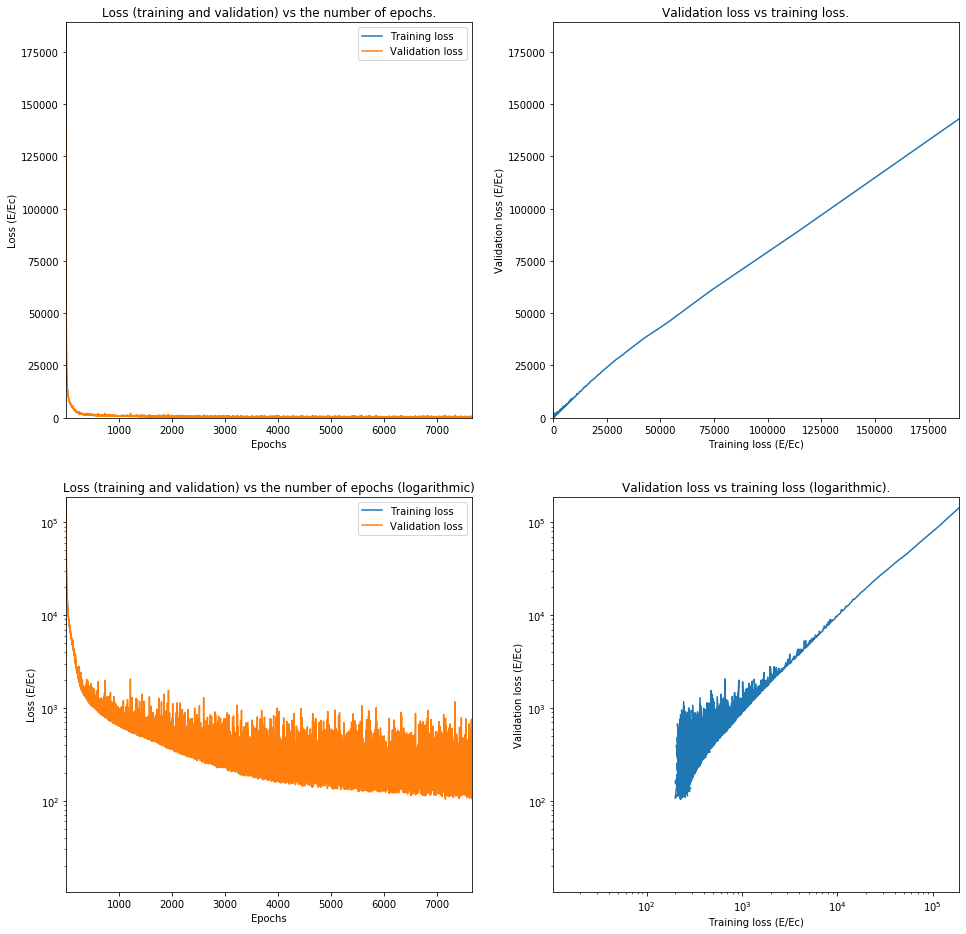

Train on 62644 samples, validate on 15662 samples
Epoch 1/10000
62644/62644 [==============================] - 2s 37us/step - loss: 1368566.1059 - val_loss: 1038981.6840
Epoch 2/10000
62644/62644 [==============================] - 2s 35us/step - loss: 928471.4561 - val_loss: 778015.7721
Epoch 3/10000
62644/62644 [==============================] - 2s 35us/step - loss: 646076.2941 - val_loss: 484570.4146
Epoch 4/10000
62644/62644 [==============================] - 2s 34us/step - loss: 361709.1388 - val_loss: 246932.8762
Epoch 5/10000
62644/62644 [==============================] - 2s 35us/step - loss: 197778.4887 - val_loss: 156584.2126
Epoch 6/10000
62644/62644 [==============================] - 2s 34us/step - loss: 123988.0679 - val_loss: 99910.5024
Epoch 7/10000
62644/62644 [==============================] - 2s 35us/step - loss: 85929.7264 - val_loss: 76667.6614
Epoch 8/10000
62644/62644 [==============================] - 2s 35us/step - loss: 71008.4819 - val_loss: 66714.0391
Epoch 9/1

62644/62644 [==============================] - 2s 35us/step - loss: 10821.4776 - val_loss: 10537.5922
Epoch 71/10000
62644/62644 [==============================] - 2s 35us/step - loss: 10620.4243 - val_loss: 10341.1555
Epoch 72/10000
62644/62644 [==============================] - 2s 35us/step - loss: 10380.4739 - val_loss: 10033.2717
Epoch 73/10000
62644/62644 [==============================] - 2s 34us/step - loss: 10149.1516 - val_loss: 9873.2899
Epoch 74/10000
62644/62644 [==============================] - 2s 34us/step - loss: 9961.8189 - val_loss: 9697.1217
Epoch 75/10000
62644/62644 [==============================] - 2s 36us/step - loss: 9728.0963 - val_loss: 9381.0235
Epoch 76/10000
62644/62644 [==============================] - 2s 35us/step - loss: 9529.6918 - val_loss: 9626.8566
Epoch 77/10000
62644/62644 [==============================] - 2s 35us/step - loss: 9337.5989 - val_loss: 9034.3455
Epoch 78/10000
62644/62644 [==============================] - 2s 36us/step - loss: 9139.

Epoch 141/10000
62644/62644 [==============================] - 2s 35us/step - loss: 3502.4616 - val_loss: 3147.8738
Epoch 142/10000
62644/62644 [==============================] - 2s 35us/step - loss: 3450.0998 - val_loss: 3110.2457
Epoch 143/10000
62644/62644 [==============================] - 2s 35us/step - loss: 3399.5912 - val_loss: 3070.7593
Epoch 144/10000
62644/62644 [==============================] - 2s 34us/step - loss: 3348.1735 - val_loss: 3348.4314
Epoch 145/10000
62644/62644 [==============================] - 2s 34us/step - loss: 3312.3987 - val_loss: 3026.0219
Epoch 146/10000
62644/62644 [==============================] - 2s 35us/step - loss: 3311.6414 - val_loss: 3038.3846
Epoch 147/10000
62644/62644 [==============================] - 2s 34us/step - loss: 3251.9655 - val_loss: 3211.1644
Epoch 148/10000
62644/62644 [==============================] - 2s 35us/step - loss: 3221.9017 - val_loss: 3173.4581
Epoch 149/10000
62644/62644 [==============================] - 2s 35us/s

62644/62644 [==============================] - 2s 34us/step - loss: 2260.6695 - val_loss: 2254.7791
Epoch 212/10000
62644/62644 [==============================] - 2s 34us/step - loss: 2229.5251 - val_loss: 2129.3588
Epoch 213/10000
62644/62644 [==============================] - 2s 35us/step - loss: 2255.1072 - val_loss: 2643.4360
Epoch 214/10000
62644/62644 [==============================] - 2s 35us/step - loss: 2245.7282 - val_loss: 2307.5123
Epoch 215/10000
62644/62644 [==============================] - 2s 35us/step - loss: 2219.2867 - val_loss: 2051.4228
Epoch 216/10000
62644/62644 [==============================] - 2s 34us/step - loss: 2218.2114 - val_loss: 2162.9004
Epoch 217/10000
62644/62644 [==============================] - 2s 35us/step - loss: 2224.5259 - val_loss: 2108.7484
Epoch 218/10000
62644/62644 [==============================] - 2s 35us/step - loss: 2251.2645 - val_loss: 2081.9180
Epoch 219/10000
62644/62644 [==============================] - 2s 35us/step - loss: 2190

Epoch 282/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1708.0095 - val_loss: 1526.9757
Epoch 283/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1684.4959 - val_loss: 1593.8366
Epoch 284/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1716.9795 - val_loss: 1521.7991
Epoch 285/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1692.1455 - val_loss: 1868.8185
Epoch 286/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1674.8839 - val_loss: 1968.2907
Epoch 287/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1702.0991 - val_loss: 1732.1296
Epoch 288/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1641.2072 - val_loss: 1629.1526
Epoch 289/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1697.4337 - val_loss: 1612.0317
Epoch 290/10000
62644/62644 [==============================] - 2s 34us/s

62644/62644 [==============================] - 2s 36us/step - loss: 1495.2136 - val_loss: 1466.5696
Epoch 353/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1495.5365 - val_loss: 1476.8110
Epoch 354/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1448.2150 - val_loss: 1319.5377
Epoch 355/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1465.3876 - val_loss: 1393.3288
Epoch 356/10000
62644/62644 [==============================] - 2s 36us/step - loss: 1463.8797 - val_loss: 1562.6194
Epoch 357/10000
62644/62644 [==============================] - 2s 35us/step - loss: 1451.7834 - val_loss: 1295.9070
Epoch 358/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1454.6287 - val_loss: 1290.0849
Epoch 359/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1481.9921 - val_loss: 1341.8566
Epoch 360/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1433

Epoch 423/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1331.1947 - val_loss: 1319.8083
Epoch 424/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1320.5914 - val_loss: 1157.2046
Epoch 425/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1291.4463 - val_loss: 1545.3154
Epoch 426/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1321.7897 - val_loss: 2020.3247
Epoch 427/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1316.4004 - val_loss: 1144.8849
Epoch 428/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1330.8876 - val_loss: 1144.2020
Epoch 429/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1287.9652 - val_loss: 1253.1727
Epoch 430/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1319.1690 - val_loss: 1879.4028
Epoch 431/10000
62644/62644 [==============================] - 2s 30us/s

62644/62644 [==============================] - 2s 30us/step - loss: 1205.1732 - val_loss: 1036.9733
Epoch 494/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1215.3227 - val_loss: 1279.0740
Epoch 495/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1198.1259 - val_loss: 1070.6430
Epoch 496/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1241.0205 - val_loss: 1596.2771
Epoch 497/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1207.8406 - val_loss: 1032.7989
Epoch 498/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1185.8269 - val_loss: 1549.3066
Epoch 499/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1216.8343 - val_loss: 1141.0152
Epoch 500/10000
62644/62644 [==============================] - 2s 32us/step - loss: 1212.5073 - val_loss: 1115.5857
Epoch 501/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1219

Epoch 564/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1092.0328 - val_loss: 1120.4997
Epoch 565/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1121.2091 - val_loss: 1044.5059
Epoch 566/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1112.7058 - val_loss: 989.8582
Epoch 567/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1115.9924 - val_loss: 1000.0408
Epoch 568/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1124.2234 - val_loss: 1184.8151
Epoch 569/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1097.5241 - val_loss: 1023.2904
Epoch 570/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1137.7538 - val_loss: 1043.1329
Epoch 571/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1120.2075 - val_loss: 1008.2495
Epoch 572/10000
62644/62644 [==============================] - 2s 30us/st

Epoch 635/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1035.6296 - val_loss: 1142.0935
Epoch 636/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1063.0200 - val_loss: 936.8198
Epoch 637/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1044.2483 - val_loss: 1103.4188
Epoch 638/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1014.0977 - val_loss: 1031.8467
Epoch 639/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1058.4712 - val_loss: 946.8310
Epoch 640/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1055.7018 - val_loss: 1223.2004
Epoch 641/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1025.6391 - val_loss: 914.3512
Epoch 642/10000
62644/62644 [==============================] - 2s 30us/step - loss: 1022.7856 - val_loss: 1165.1337
Epoch 643/10000
62644/62644 [==============================] - 2s 31us/step

62644/62644 [==============================] - 2s 32us/step - loss: 973.8541 - val_loss: 1507.3804
Epoch 707/10000
62644/62644 [==============================] - 2s 32us/step - loss: 960.1610 - val_loss: 840.3630
Epoch 708/10000
62644/62644 [==============================] - 2s 32us/step - loss: 989.2410 - val_loss: 926.2968
Epoch 709/10000
62644/62644 [==============================] - 2s 32us/step - loss: 931.7015 - val_loss: 788.3655
Epoch 710/10000
62644/62644 [==============================] - 2s 32us/step - loss: 976.7543 - val_loss: 823.6154
Epoch 711/10000
62644/62644 [==============================] - 2s 31us/step - loss: 964.9518 - val_loss: 841.6941
Epoch 712/10000
62644/62644 [==============================] - 2s 32us/step - loss: 958.0325 - val_loss: 844.3226
Epoch 713/10000
62644/62644 [==============================] - 2s 32us/step - loss: 951.6443 - val_loss: 1061.7700
Epoch 714/10000
62644/62644 [==============================] - 2s 32us/step - loss: 952.6923 - val_los

Epoch 778/10000
62644/62644 [==============================] - 2s 30us/step - loss: 915.5386 - val_loss: 781.5752
Epoch 779/10000
62644/62644 [==============================] - 2s 30us/step - loss: 889.5277 - val_loss: 1006.1891
Epoch 780/10000
62644/62644 [==============================] - 2s 30us/step - loss: 904.1002 - val_loss: 811.0583
Epoch 781/10000
62644/62644 [==============================] - 2s 30us/step - loss: 914.9244 - val_loss: 804.2938
Epoch 782/10000
62644/62644 [==============================] - 2s 30us/step - loss: 889.2152 - val_loss: 856.8783
Epoch 783/10000
62644/62644 [==============================] - 2s 30us/step - loss: 912.0412 - val_loss: 772.8003
Epoch 784/10000
62644/62644 [==============================] - 2s 30us/step - loss: 896.1058 - val_loss: 882.8896
Epoch 785/10000
62644/62644 [==============================] - 2s 30us/step - loss: 909.0063 - val_loss: 830.5369
Epoch 786/10000
62644/62644 [==============================] - 2s 30us/step - loss: 874

62644/62644 [==============================] - 2s 30us/step - loss: 857.0623 - val_loss: 905.8174
Epoch 850/10000
62644/62644 [==============================] - 2s 30us/step - loss: 846.0882 - val_loss: 881.1831
Epoch 851/10000
62644/62644 [==============================] - 2s 30us/step - loss: 903.3045 - val_loss: 737.1471
Epoch 852/10000
62644/62644 [==============================] - 2s 30us/step - loss: 857.6066 - val_loss: 764.3870
Epoch 853/10000
62644/62644 [==============================] - 2s 30us/step - loss: 861.6039 - val_loss: 777.8833
Epoch 854/10000
62644/62644 [==============================] - 2s 31us/step - loss: 856.8238 - val_loss: 928.9207
Epoch 855/10000
62644/62644 [==============================] - 2s 32us/step - loss: 832.7198 - val_loss: 812.3343
Epoch 856/10000
62644/62644 [==============================] - 2s 30us/step - loss: 838.3771 - val_loss: 1006.7005
Epoch 857/10000
62644/62644 [==============================] - 2s 31us/step - loss: 831.6150 - val_loss

Epoch 921/10000
62644/62644 [==============================] - 2s 31us/step - loss: 849.4057 - val_loss: 763.0830
Epoch 922/10000
62644/62644 [==============================] - 2s 31us/step - loss: 785.0362 - val_loss: 642.5813
Epoch 923/10000
62644/62644 [==============================] - 2s 30us/step - loss: 815.8075 - val_loss: 631.1922
Epoch 924/10000
62644/62644 [==============================] - 2s 31us/step - loss: 824.8322 - val_loss: 660.2480
Epoch 925/10000
62644/62644 [==============================] - 2s 30us/step - loss: 798.4379 - val_loss: 1083.9568
Epoch 926/10000
62644/62644 [==============================] - 2s 30us/step - loss: 807.7212 - val_loss: 940.2425
Epoch 927/10000
62644/62644 [==============================] - 2s 30us/step - loss: 816.7079 - val_loss: 804.9124
Epoch 928/10000
62644/62644 [==============================] - 2s 30us/step - loss: 795.4175 - val_loss: 804.6718
Epoch 929/10000
62644/62644 [==============================] - 2s 30us/step - loss: 805

Epoch 993/10000
62644/62644 [==============================] - 2s 31us/step - loss: 762.7798 - val_loss: 698.6117
Epoch 994/10000
62644/62644 [==============================] - 2s 30us/step - loss: 775.7724 - val_loss: 702.4553
Epoch 995/10000
62644/62644 [==============================] - 2s 30us/step - loss: 731.3454 - val_loss: 618.5366
Epoch 996/10000
62644/62644 [==============================] - 2s 30us/step - loss: 802.1678 - val_loss: 652.4245
Epoch 997/10000
62644/62644 [==============================] - 2s 30us/step - loss: 761.9333 - val_loss: 1280.1029
Epoch 998/10000
62644/62644 [==============================] - 2s 30us/step - loss: 795.0390 - val_loss: 756.3568
Epoch 999/10000
62644/62644 [==============================] - 2s 30us/step - loss: 772.6501 - val_loss: 813.0844
Epoch 1000/10000
62644/62644 [==============================] - 2s 30us/step - loss: 751.0445 - val_loss: 957.7521
Epoch 1001/10000
62644/62644 [==============================] - 2s 30us/step - loss: 7

62644/62644 [==============================] - 2s 30us/step - loss: 741.1884 - val_loss: 584.4355
Epoch 1065/10000
62644/62644 [==============================] - 2s 30us/step - loss: 700.5096 - val_loss: 971.3674
Epoch 1066/10000
62644/62644 [==============================] - 2s 30us/step - loss: 721.8831 - val_loss: 705.9251
Epoch 1067/10000
62644/62644 [==============================] - 2s 30us/step - loss: 751.5976 - val_loss: 621.1996
Epoch 1068/10000
62644/62644 [==============================] - 2s 30us/step - loss: 734.1195 - val_loss: 677.4455
Epoch 1069/10000
62644/62644 [==============================] - 2s 30us/step - loss: 715.4156 - val_loss: 580.0406
Epoch 1070/10000
62644/62644 [==============================] - 2s 30us/step - loss: 719.0568 - val_loss: 628.0794
Epoch 1071/10000
62644/62644 [==============================] - 2s 30us/step - loss: 744.4396 - val_loss: 865.6938
Epoch 1072/10000
62644/62644 [==============================] - 2s 30us/step - loss: 751.9629 - v

62644/62644 [==============================] - 2s 30us/step - loss: 722.0794 - val_loss: 1578.2788
Epoch 1136/10000
62644/62644 [==============================] - 2s 30us/step - loss: 723.1656 - val_loss: 648.9209
Epoch 1137/10000
62644/62644 [==============================] - 2s 30us/step - loss: 727.5034 - val_loss: 951.0287
Epoch 1138/10000
62644/62644 [==============================] - 2s 30us/step - loss: 717.7621 - val_loss: 618.4921
Epoch 1139/10000
62644/62644 [==============================] - 2s 30us/step - loss: 704.4624 - val_loss: 672.1622
Epoch 1140/10000
62644/62644 [==============================] - 2s 30us/step - loss: 697.0951 - val_loss: 579.3277
Epoch 1141/10000
62644/62644 [==============================] - 2s 30us/step - loss: 729.0458 - val_loss: 728.2250
Epoch 1142/10000
62644/62644 [==============================] - 2s 30us/step - loss: 698.6168 - val_loss: 940.9217
Epoch 1143/10000
62644/62644 [==============================] - 2s 30us/step - loss: 706.5921 - 

62644/62644 [==============================] - 2s 30us/step - loss: 699.4674 - val_loss: 634.9551
Epoch 1207/10000
62644/62644 [==============================] - 2s 30us/step - loss: 669.2475 - val_loss: 540.9143
Epoch 1208/10000
62644/62644 [==============================] - 2s 30us/step - loss: 675.2937 - val_loss: 636.5301
Epoch 1209/10000
62644/62644 [==============================] - 2s 31us/step - loss: 705.9959 - val_loss: 638.0994
Epoch 1210/10000
62644/62644 [==============================] - 2s 30us/step - loss: 663.2946 - val_loss: 882.9288
Epoch 1211/10000
62644/62644 [==============================] - 2s 30us/step - loss: 697.8947 - val_loss: 612.8593
Epoch 1212/10000
62644/62644 [==============================] - 2s 30us/step - loss: 676.3166 - val_loss: 542.0058
Epoch 1213/10000
62644/62644 [==============================] - 2s 30us/step - loss: 677.0756 - val_loss: 554.0761
Epoch 1214/10000
62644/62644 [==============================] - 2s 30us/step - loss: 719.6814 - v

62644/62644 [==============================] - 2s 30us/step - loss: 674.8545 - val_loss: 810.2366
Epoch 1278/10000
62644/62644 [==============================] - 2s 30us/step - loss: 657.5820 - val_loss: 1068.7536
Epoch 1279/10000
62644/62644 [==============================] - 2s 30us/step - loss: 687.1048 - val_loss: 526.0884
Epoch 1280/10000
62644/62644 [==============================] - 2s 30us/step - loss: 682.8707 - val_loss: 678.6382
Epoch 1281/10000
62644/62644 [==============================] - 2s 30us/step - loss: 665.5764 - val_loss: 608.3642
Epoch 1282/10000
62644/62644 [==============================] - 2s 30us/step - loss: 655.1920 - val_loss: 816.9348
Epoch 1283/10000
62644/62644 [==============================] - 2s 30us/step - loss: 675.6416 - val_loss: 611.3444
Epoch 1284/10000
62644/62644 [==============================] - 2s 30us/step - loss: 663.3996 - val_loss: 519.4495
Epoch 1285/10000
62644/62644 [==============================] - 2s 30us/step - loss: 674.8777 - 

62644/62644 [==============================] - 2s 30us/step - loss: 652.1978 - val_loss: 629.1360
Epoch 1349/10000
62644/62644 [==============================] - 2s 31us/step - loss: 626.6246 - val_loss: 684.7756
Epoch 1350/10000
62644/62644 [==============================] - 2s 30us/step - loss: 673.1847 - val_loss: 750.1083
Epoch 1351/10000
62644/62644 [==============================] - 2s 30us/step - loss: 672.9470 - val_loss: 505.2216
Epoch 1352/10000
62644/62644 [==============================] - 2s 30us/step - loss: 641.1167 - val_loss: 709.9941
Epoch 1353/10000
62644/62644 [==============================] - 2s 30us/step - loss: 630.4192 - val_loss: 494.8794
Epoch 1354/10000
62644/62644 [==============================] - 2s 30us/step - loss: 637.2523 - val_loss: 849.6193
Epoch 1355/10000
62644/62644 [==============================] - 2s 30us/step - loss: 665.3246 - val_loss: 519.6658
Epoch 1356/10000
62644/62644 [==============================] - 2s 30us/step - loss: 642.1735 - v

62644/62644 [==============================] - 2s 30us/step - loss: 648.5092 - val_loss: 797.5617
Epoch 1420/10000
62644/62644 [==============================] - 2s 30us/step - loss: 635.7951 - val_loss: 742.5939
Epoch 1421/10000
62644/62644 [==============================] - 2s 30us/step - loss: 633.8556 - val_loss: 520.1157
Epoch 1422/10000
62644/62644 [==============================] - 2s 30us/step - loss: 641.7726 - val_loss: 515.4131
Epoch 1423/10000
62644/62644 [==============================] - 2s 30us/step - loss: 632.1620 - val_loss: 784.1033
Epoch 1424/10000
62644/62644 [==============================] - 2s 30us/step - loss: 630.4887 - val_loss: 906.8455
Epoch 1425/10000
62644/62644 [==============================] - 2s 31us/step - loss: 644.8246 - val_loss: 494.2244
Epoch 1426/10000
62644/62644 [==============================] - 2s 31us/step - loss: 597.4392 - val_loss: 614.4059
Epoch 1427/10000
62644/62644 [==============================] - 2s 30us/step - loss: 635.4130 - v

62644/62644 [==============================] - 2s 30us/step - loss: 625.3718 - val_loss: 533.2911
Epoch 1491/10000
62644/62644 [==============================] - 2s 30us/step - loss: 605.7114 - val_loss: 497.7002
Epoch 1492/10000
62644/62644 [==============================] - 2s 32us/step - loss: 654.3525 - val_loss: 1121.1154
Epoch 1493/10000
62644/62644 [==============================] - 2s 33us/step - loss: 616.2690 - val_loss: 519.0424
Epoch 1494/10000
62644/62644 [==============================] - 2s 32us/step - loss: 613.7026 - val_loss: 462.8796
Epoch 1495/10000
62644/62644 [==============================] - 2s 32us/step - loss: 629.2367 - val_loss: 585.8568
Epoch 1496/10000
62644/62644 [==============================] - 2s 31us/step - loss: 625.9991 - val_loss: 1097.6487
Epoch 1497/10000
62644/62644 [==============================] - 2s 30us/step - loss: 622.4660 - val_loss: 499.1713
Epoch 1498/10000
62644/62644 [==============================] - 2s 32us/step - loss: 619.2864 -

62644/62644 [==============================] - 2s 30us/step - loss: 593.7632 - val_loss: 702.0950
Epoch 1562/10000
62644/62644 [==============================] - 2s 30us/step - loss: 608.0331 - val_loss: 615.3489
Epoch 1563/10000
62644/62644 [==============================] - 2s 30us/step - loss: 627.2128 - val_loss: 926.7022
Epoch 1564/10000
62644/62644 [==============================] - 2s 30us/step - loss: 601.3558 - val_loss: 529.3974
Epoch 1565/10000
62644/62644 [==============================] - 2s 30us/step - loss: 606.7778 - val_loss: 556.0045
Epoch 1566/10000
62644/62644 [==============================] - 2s 30us/step - loss: 616.8774 - val_loss: 462.4954
Epoch 1567/10000
62644/62644 [==============================] - 2s 30us/step - loss: 604.0823 - val_loss: 717.6799
Epoch 1568/10000
62644/62644 [==============================] - 2s 30us/step - loss: 597.1512 - val_loss: 607.7121
Epoch 1569/10000
62644/62644 [==============================] - 2s 30us/step - loss: 597.4908 - v

62644/62644 [==============================] - 2s 30us/step - loss: 586.8278 - val_loss: 435.7357
Epoch 1633/10000
62644/62644 [==============================] - 2s 30us/step - loss: 615.3410 - val_loss: 504.7152
Epoch 1634/10000
62644/62644 [==============================] - 2s 30us/step - loss: 577.3151 - val_loss: 1079.3405
Epoch 1635/10000
62644/62644 [==============================] - 2s 30us/step - loss: 588.5751 - val_loss: 489.6994
Epoch 1636/10000
62644/62644 [==============================] - 2s 30us/step - loss: 595.1208 - val_loss: 649.7172
Epoch 1637/10000
62644/62644 [==============================] - 2s 31us/step - loss: 583.3828 - val_loss: 437.7014
Epoch 1638/10000
62644/62644 [==============================] - 2s 30us/step - loss: 595.1950 - val_loss: 594.8181
Epoch 1639/10000
62644/62644 [==============================] - 2s 30us/step - loss: 603.5733 - val_loss: 657.0787
Epoch 1640/10000
62644/62644 [==============================] - 2s 30us/step - loss: 587.6759 - 

62644/62644 [==============================] - 2s 30us/step - loss: 590.9675 - val_loss: 702.3564
Epoch 1704/10000
62644/62644 [==============================] - 2s 30us/step - loss: 583.6977 - val_loss: 726.4956
Epoch 1705/10000
62644/62644 [==============================] - 2s 30us/step - loss: 570.8239 - val_loss: 424.6637
Epoch 1706/10000
62644/62644 [==============================] - 2s 30us/step - loss: 594.5145 - val_loss: 499.1977
Epoch 1707/10000
62644/62644 [==============================] - 2s 30us/step - loss: 575.4597 - val_loss: 497.2139
Epoch 1708/10000
62644/62644 [==============================] - 2s 30us/step - loss: 582.2752 - val_loss: 450.6099
Epoch 1709/10000
62644/62644 [==============================] - 2s 30us/step - loss: 577.4886 - val_loss: 456.9574
Epoch 1710/10000
62644/62644 [==============================] - 2s 30us/step - loss: 599.2740 - val_loss: 581.8303
Epoch 1711/10000
62644/62644 [==============================] - 2s 31us/step - loss: 561.5839 - v

62644/62644 [==============================] - 2s 30us/step - loss: 589.2811 - val_loss: 486.8588
Epoch 1775/10000
62644/62644 [==============================] - 2s 30us/step - loss: 563.3734 - val_loss: 552.2867
Epoch 1776/10000
62644/62644 [==============================] - 2s 30us/step - loss: 593.2725 - val_loss: 990.2384
Epoch 1777/10000
62644/62644 [==============================] - 2s 31us/step - loss: 576.2185 - val_loss: 512.2179
Epoch 1778/10000
62644/62644 [==============================] - 2s 30us/step - loss: 575.5446 - val_loss: 622.6380
Epoch 1779/10000
62644/62644 [==============================] - 2s 30us/step - loss: 557.8254 - val_loss: 597.7276
Epoch 1780/10000
62644/62644 [==============================] - 2s 30us/step - loss: 560.5667 - val_loss: 811.1732
Epoch 1781/10000
62644/62644 [==============================] - 2s 30us/step - loss: 591.1572 - val_loss: 435.1798
Epoch 1782/10000
62644/62644 [==============================] - 2s 30us/step - loss: 565.3853 - v

62644/62644 [==============================] - 2s 30us/step - loss: 549.2138 - val_loss: 408.4992
Epoch 1846/10000
62644/62644 [==============================] - 2s 30us/step - loss: 556.6862 - val_loss: 439.0156
Epoch 1847/10000
62644/62644 [==============================] - 2s 30us/step - loss: 572.9384 - val_loss: 444.2233
Epoch 1848/10000
62644/62644 [==============================] - 2s 30us/step - loss: 566.4038 - val_loss: 582.1485
Epoch 1849/10000
62644/62644 [==============================] - 2s 30us/step - loss: 553.3516 - val_loss: 527.1368
Epoch 1850/10000
62644/62644 [==============================] - 2s 30us/step - loss: 567.9501 - val_loss: 515.7538
Epoch 1851/10000
62644/62644 [==============================] - 2s 30us/step - loss: 577.1639 - val_loss: 417.4741
Epoch 1852/10000
62644/62644 [==============================] - 2s 30us/step - loss: 547.9323 - val_loss: 535.8909
Epoch 1853/10000
62644/62644 [==============================] - 2s 31us/step - loss: 562.3928 - v

62644/62644 [==============================] - 2s 30us/step - loss: 575.2860 - val_loss: 564.6784
Epoch 1917/10000
62644/62644 [==============================] - 2s 30us/step - loss: 571.9097 - val_loss: 445.5270
Epoch 1918/10000
62644/62644 [==============================] - 2s 30us/step - loss: 547.6769 - val_loss: 482.7362
Epoch 1919/10000
62644/62644 [==============================] - 2s 30us/step - loss: 553.3124 - val_loss: 581.6710
Epoch 1920/10000
62644/62644 [==============================] - 2s 30us/step - loss: 562.2343 - val_loss: 732.6619
Epoch 1921/10000
62644/62644 [==============================] - 2s 30us/step - loss: 563.2073 - val_loss: 1197.0037
Epoch 1922/10000
62644/62644 [==============================] - 2s 30us/step - loss: 542.9370 - val_loss: 498.8238
Epoch 1923/10000
62644/62644 [==============================] - 2s 30us/step - loss: 567.6484 - val_loss: 588.4042
Epoch 1924/10000
62644/62644 [==============================] - 2s 31us/step - loss: 556.4453 - 

62644/62644 [==============================] - 2s 30us/step - loss: 572.1223 - val_loss: 533.8176
Epoch 1988/10000
62644/62644 [==============================] - 2s 30us/step - loss: 537.4081 - val_loss: 430.5500
Epoch 1989/10000
62644/62644 [==============================] - 2s 30us/step - loss: 548.3527 - val_loss: 594.3657
Epoch 1990/10000
62644/62644 [==============================] - 2s 30us/step - loss: 582.4564 - val_loss: 1009.4863
Epoch 1991/10000
62644/62644 [==============================] - 2s 30us/step - loss: 557.8000 - val_loss: 820.7124
Epoch 1992/10000
62644/62644 [==============================] - 2s 30us/step - loss: 541.5791 - val_loss: 618.4103
Epoch 1993/10000
62644/62644 [==============================] - 2s 30us/step - loss: 563.2593 - val_loss: 484.8928
Epoch 1994/10000
62644/62644 [==============================] - 2s 31us/step - loss: 570.3063 - val_loss: 1115.1354
Epoch 1995/10000
62644/62644 [==============================] - 2s 31us/step - loss: 537.6132 -

62644/62644 [==============================] - 2s 31us/step - loss: 546.5983 - val_loss: 647.4317
Epoch 2059/10000
62644/62644 [==============================] - 2s 30us/step - loss: 543.2702 - val_loss: 423.0750
Epoch 2060/10000
62644/62644 [==============================] - 2s 31us/step - loss: 534.3722 - val_loss: 448.1384
Epoch 2061/10000
62644/62644 [==============================] - 2s 31us/step - loss: 530.5273 - val_loss: 521.2032
Epoch 2062/10000
62644/62644 [==============================] - 2s 31us/step - loss: 535.8894 - val_loss: 442.3531
Epoch 2063/10000
62644/62644 [==============================] - 2s 30us/step - loss: 547.6261 - val_loss: 470.1505
Epoch 2064/10000
62644/62644 [==============================] - 2s 30us/step - loss: 529.3008 - val_loss: 413.2206
Epoch 2065/10000
62644/62644 [==============================] - 2s 30us/step - loss: 535.4721 - val_loss: 525.6854
Epoch 2066/10000
62644/62644 [==============================] - 2s 30us/step - loss: 540.5322 - v

62644/62644 [==============================] - 2s 30us/step - loss: 533.3507 - val_loss: 496.5696
Epoch 2130/10000
62644/62644 [==============================] - 2s 30us/step - loss: 547.8582 - val_loss: 537.3231
Epoch 2131/10000
62644/62644 [==============================] - 2s 30us/step - loss: 532.2380 - val_loss: 1102.2871
Epoch 2132/10000
62644/62644 [==============================] - 2s 30us/step - loss: 543.4860 - val_loss: 1671.3660
Epoch 2133/10000
62644/62644 [==============================] - 2s 30us/step - loss: 534.0901 - val_loss: 382.3489
Epoch 2134/10000
62644/62644 [==============================] - 2s 30us/step - loss: 538.0500 - val_loss: 406.7561
Epoch 2135/10000
62644/62644 [==============================] - 2s 30us/step - loss: 545.3224 - val_loss: 467.6537
Epoch 2136/10000
62644/62644 [==============================] - 2s 30us/step - loss: 546.3103 - val_loss: 1327.1789
Epoch 2137/10000
62644/62644 [==============================] - 2s 30us/step - loss: 526.9754 

62644/62644 [==============================] - 2s 30us/step - loss: 541.1528 - val_loss: 980.2367
Epoch 2201/10000
62644/62644 [==============================] - 2s 30us/step - loss: 538.1522 - val_loss: 371.0151
Epoch 2202/10000
62644/62644 [==============================] - 2s 30us/step - loss: 512.6141 - val_loss: 575.4274
Epoch 2203/10000
62644/62644 [==============================] - 2s 30us/step - loss: 521.4210 - val_loss: 541.4138
Epoch 2204/10000
62644/62644 [==============================] - 2s 30us/step - loss: 542.6061 - val_loss: 633.7732
Epoch 2205/10000
62644/62644 [==============================] - 2s 31us/step - loss: 514.0596 - val_loss: 368.6675
Epoch 2206/10000
62644/62644 [==============================] - 2s 30us/step - loss: 535.1395 - val_loss: 457.2218
Epoch 2207/10000
62644/62644 [==============================] - 2s 30us/step - loss: 513.2367 - val_loss: 490.5590
Epoch 2208/10000
62644/62644 [==============================] - 2s 30us/step - loss: 519.0805 - v

62644/62644 [==============================] - 2s 30us/step - loss: 550.7605 - val_loss: 398.4426
Epoch 2272/10000
62644/62644 [==============================] - 2s 30us/step - loss: 526.9141 - val_loss: 512.9590
Epoch 2273/10000
62644/62644 [==============================] - 2s 30us/step - loss: 509.1287 - val_loss: 498.0282
Epoch 2274/10000
62644/62644 [==============================] - 2s 30us/step - loss: 545.9344 - val_loss: 522.0290
Epoch 2275/10000
62644/62644 [==============================] - 2s 30us/step - loss: 546.4538 - val_loss: 434.3265
Epoch 2276/10000
62644/62644 [==============================] - 2s 30us/step - loss: 538.3420 - val_loss: 369.5988
Epoch 2277/10000
62644/62644 [==============================] - 2s 30us/step - loss: 513.7806 - val_loss: 730.4751
Epoch 2278/10000
62644/62644 [==============================] - 2s 34us/step - loss: 514.4283 - val_loss: 1108.9093
Epoch 2279/10000
62644/62644 [==============================] - 2s 33us/step - loss: 528.5270 - 

62644/62644 [==============================] - 2s 30us/step - loss: 529.4737 - val_loss: 1023.0271
Epoch 2343/10000
62644/62644 [==============================] - 2s 30us/step - loss: 502.8177 - val_loss: 473.9118
Epoch 2344/10000
62644/62644 [==============================] - 2s 31us/step - loss: 522.7091 - val_loss: 393.1462
Epoch 2345/10000
62644/62644 [==============================] - 2s 31us/step - loss: 512.8793 - val_loss: 357.0682
Epoch 2346/10000
62644/62644 [==============================] - 2s 30us/step - loss: 500.5315 - val_loss: 367.1656
Epoch 2347/10000
62644/62644 [==============================] - 2s 30us/step - loss: 541.3893 - val_loss: 888.8321
Epoch 2348/10000
62644/62644 [==============================] - 2s 30us/step - loss: 502.5090 - val_loss: 483.6683
Epoch 2349/10000
62644/62644 [==============================] - 2s 30us/step - loss: 535.7980 - val_loss: 939.1660
Epoch 2350/10000
62644/62644 [==============================] - 2s 30us/step - loss: 513.8981 - 

62644/62644 [==============================] - 2s 30us/step - loss: 509.0971 - val_loss: 479.3088
Epoch 2414/10000
62644/62644 [==============================] - 2s 30us/step - loss: 508.7744 - val_loss: 356.8430
Epoch 2415/10000
62644/62644 [==============================] - 2s 30us/step - loss: 534.8559 - val_loss: 419.2602
Epoch 2416/10000
62644/62644 [==============================] - 2s 30us/step - loss: 539.7090 - val_loss: 649.5819
Epoch 2417/10000
62644/62644 [==============================] - 2s 30us/step - loss: 489.8832 - val_loss: 651.0177
Epoch 2418/10000
62644/62644 [==============================] - 2s 30us/step - loss: 539.0933 - val_loss: 354.6408
Epoch 2419/10000
62644/62644 [==============================] - 2s 30us/step - loss: 517.6128 - val_loss: 574.0892
Epoch 2420/10000
62644/62644 [==============================] - 2s 30us/step - loss: 495.4042 - val_loss: 440.0993
Epoch 2421/10000
62644/62644 [==============================] - 2s 30us/step - loss: 514.3702 - v

62644/62644 [==============================] - 2s 30us/step - loss: 498.3491 - val_loss: 399.9635
Epoch 2485/10000
62644/62644 [==============================] - 2s 31us/step - loss: 486.8879 - val_loss: 402.2278
Epoch 2486/10000
62644/62644 [==============================] - 2s 31us/step - loss: 506.8916 - val_loss: 424.8830
Epoch 2487/10000
62644/62644 [==============================] - 2s 30us/step - loss: 506.1826 - val_loss: 638.6087
Epoch 2488/10000
62644/62644 [==============================] - 2s 30us/step - loss: 493.0576 - val_loss: 423.7959
Epoch 2489/10000
62644/62644 [==============================] - 2s 30us/step - loss: 521.7454 - val_loss: 814.1030
Epoch 2490/10000
62644/62644 [==============================] - 2s 30us/step - loss: 507.4945 - val_loss: 409.7725
Epoch 2491/10000
62644/62644 [==============================] - 2s 30us/step - loss: 484.0045 - val_loss: 416.8989
Epoch 2492/10000
62644/62644 [==============================] - 2s 30us/step - loss: 515.5849 - v

62644/62644 [==============================] - 2s 30us/step - loss: 483.3599 - val_loss: 629.1538
Epoch 2556/10000
62644/62644 [==============================] - 2s 30us/step - loss: 502.8018 - val_loss: 908.0115
Epoch 2557/10000
62644/62644 [==============================] - 2s 31us/step - loss: 496.8585 - val_loss: 633.6585
Epoch 2558/10000
62644/62644 [==============================] - 2s 30us/step - loss: 479.3155 - val_loss: 365.1099
Epoch 2559/10000
62644/62644 [==============================] - 2s 30us/step - loss: 469.9356 - val_loss: 486.9819
Epoch 2560/10000
62644/62644 [==============================] - 2s 30us/step - loss: 491.1012 - val_loss: 821.4133
Epoch 2561/10000
62644/62644 [==============================] - 2s 31us/step - loss: 500.9021 - val_loss: 484.3963
Epoch 2562/10000
62644/62644 [==============================] - 2s 31us/step - loss: 489.5664 - val_loss: 395.0521
Epoch 2563/10000
62644/62644 [==============================] - 2s 31us/step - loss: 482.5662 - v

62644/62644 [==============================] - 2s 31us/step - loss: 495.6448 - val_loss: 404.3654
Epoch 2627/10000
62644/62644 [==============================] - 2s 31us/step - loss: 476.7376 - val_loss: 691.3795
Epoch 2628/10000
62644/62644 [==============================] - 2s 31us/step - loss: 491.9756 - val_loss: 505.6032
Epoch 2629/10000
62644/62644 [==============================] - 2s 31us/step - loss: 477.2975 - val_loss: 652.4431
Epoch 2630/10000
62644/62644 [==============================] - 2s 30us/step - loss: 481.8516 - val_loss: 709.6164
Epoch 2631/10000
62644/62644 [==============================] - 2s 30us/step - loss: 509.0696 - val_loss: 539.8346
Epoch 2632/10000
62644/62644 [==============================] - 2s 30us/step - loss: 471.0255 - val_loss: 322.4131
Epoch 2633/10000
62644/62644 [==============================] - 2s 30us/step - loss: 471.3759 - val_loss: 600.6700
Epoch 2634/10000
62644/62644 [==============================] - 2s 30us/step - loss: 506.2317 - v

62644/62644 [==============================] - 2s 30us/step - loss: 486.7032 - val_loss: 426.3608
Epoch 2698/10000
62644/62644 [==============================] - 2s 30us/step - loss: 482.6178 - val_loss: 380.1225
Epoch 2699/10000
62644/62644 [==============================] - 2s 30us/step - loss: 520.7602 - val_loss: 403.4153
Epoch 2700/10000
62644/62644 [==============================] - 2s 30us/step - loss: 484.1935 - val_loss: 504.2648
Epoch 2701/10000
62644/62644 [==============================] - 2s 30us/step - loss: 497.1718 - val_loss: 697.1371
Epoch 2702/10000
62644/62644 [==============================] - 2s 30us/step - loss: 461.5049 - val_loss: 386.5954
Epoch 2703/10000
62644/62644 [==============================] - 2s 30us/step - loss: 477.1417 - val_loss: 381.0364
Epoch 2704/10000
62644/62644 [==============================] - 2s 30us/step - loss: 494.0071 - val_loss: 374.8606
Epoch 2705/10000
62644/62644 [==============================] - 2s 30us/step - loss: 483.0825 - v

62644/62644 [==============================] - 2s 30us/step - loss: 472.6628 - val_loss: 357.9047
Epoch 2769/10000
62644/62644 [==============================] - 2s 30us/step - loss: 492.7237 - val_loss: 330.0806
Epoch 2770/10000
62644/62644 [==============================] - 2s 30us/step - loss: 476.6411 - val_loss: 400.9414
Epoch 2771/10000
62644/62644 [==============================] - 2s 30us/step - loss: 499.3628 - val_loss: 726.3512
Epoch 2772/10000
62644/62644 [==============================] - 2s 30us/step - loss: 477.3375 - val_loss: 332.1545
Epoch 2773/10000
62644/62644 [==============================] - 2s 30us/step - loss: 486.3262 - val_loss: 314.5003
Epoch 2774/10000
62644/62644 [==============================] - 2s 30us/step - loss: 469.1750 - val_loss: 385.0525
Epoch 2775/10000
62644/62644 [==============================] - 2s 30us/step - loss: 441.8006 - val_loss: 425.9252
Epoch 2776/10000
62644/62644 [==============================] - 2s 30us/step - loss: 474.5732 - v

62644/62644 [==============================] - 2s 30us/step - loss: 478.8637 - val_loss: 772.0333
Epoch 2840/10000
62644/62644 [==============================] - 2s 30us/step - loss: 483.3462 - val_loss: 376.1273
Epoch 2841/10000
62644/62644 [==============================] - 2s 30us/step - loss: 493.7343 - val_loss: 497.6642
Epoch 2842/10000
62644/62644 [==============================] - 2s 30us/step - loss: 481.8084 - val_loss: 934.2842
Epoch 2843/10000
62644/62644 [==============================] - 2s 30us/step - loss: 499.1598 - val_loss: 400.2140
Epoch 2844/10000
62644/62644 [==============================] - 2s 30us/step - loss: 474.4453 - val_loss: 314.9359
Epoch 2845/10000
62644/62644 [==============================] - 2s 30us/step - loss: 437.1324 - val_loss: 339.0392
Epoch 2846/10000
62644/62644 [==============================] - 2s 30us/step - loss: 463.0488 - val_loss: 482.0872
Epoch 2847/10000
62644/62644 [==============================] - 2s 30us/step - loss: 460.0858 - v

62644/62644 [==============================] - 2s 31us/step - loss: 474.6542 - val_loss: 347.7074
Epoch 2911/10000
62644/62644 [==============================] - 2s 31us/step - loss: 484.5362 - val_loss: 332.7936
Epoch 2912/10000
62644/62644 [==============================] - 2s 30us/step - loss: 482.1152 - val_loss: 498.8629
Epoch 2913/10000
62644/62644 [==============================] - 2s 30us/step - loss: 456.8543 - val_loss: 714.0505
Epoch 2914/10000
62644/62644 [==============================] - 2s 30us/step - loss: 462.6062 - val_loss: 633.4505
Epoch 2915/10000
62644/62644 [==============================] - 2s 30us/step - loss: 471.2001 - val_loss: 821.6857
Epoch 2916/10000
62644/62644 [==============================] - 2s 30us/step - loss: 466.4894 - val_loss: 629.0319
Epoch 2917/10000
62644/62644 [==============================] - 2s 30us/step - loss: 465.5767 - val_loss: 307.3953
Epoch 2918/10000
62644/62644 [==============================] - 2s 30us/step - loss: 468.2109 - v

62644/62644 [==============================] - 2s 31us/step - loss: 460.1437 - val_loss: 357.7613
Epoch 2982/10000
62644/62644 [==============================] - 2s 30us/step - loss: 479.7094 - val_loss: 409.1352
Epoch 2983/10000
62644/62644 [==============================] - 2s 30us/step - loss: 479.4152 - val_loss: 604.5576
Epoch 2984/10000
62644/62644 [==============================] - 2s 30us/step - loss: 481.5513 - val_loss: 402.3968
Epoch 2985/10000
62644/62644 [==============================] - 2s 30us/step - loss: 463.7157 - val_loss: 306.1951
Epoch 2986/10000
62644/62644 [==============================] - 2s 30us/step - loss: 460.5124 - val_loss: 568.1715
Epoch 2987/10000
62644/62644 [==============================] - 2s 30us/step - loss: 468.1250 - val_loss: 305.8715
Epoch 2988/10000
62644/62644 [==============================] - 2s 30us/step - loss: 460.9302 - val_loss: 344.7877
Epoch 2989/10000
62644/62644 [==============================] - 2s 30us/step - loss: 491.7806 - v

62644/62644 [==============================] - 2s 30us/step - loss: 446.0995 - val_loss: 297.1829
Epoch 3053/10000
62644/62644 [==============================] - 2s 30us/step - loss: 467.1810 - val_loss: 313.0829
Epoch 3054/10000
62644/62644 [==============================] - 2s 30us/step - loss: 453.5873 - val_loss: 534.1264
Epoch 3055/10000
62644/62644 [==============================] - 2s 30us/step - loss: 455.4710 - val_loss: 328.6187
Epoch 3056/10000
62644/62644 [==============================] - 2s 30us/step - loss: 450.1115 - val_loss: 371.3059
Epoch 3057/10000
62644/62644 [==============================] - 2s 30us/step - loss: 483.9998 - val_loss: 609.2373
Epoch 3058/10000
62644/62644 [==============================] - 2s 30us/step - loss: 444.2136 - val_loss: 990.7077
Epoch 3059/10000
62644/62644 [==============================] - 2s 30us/step - loss: 458.0720 - val_loss: 349.6998
Epoch 3060/10000
62644/62644 [==============================] - 2s 30us/step - loss: 458.2253 - v

62644/62644 [==============================] - 2s 30us/step - loss: 435.9500 - val_loss: 422.8985
Epoch 3124/10000
62644/62644 [==============================] - 2s 30us/step - loss: 458.1978 - val_loss: 530.6560
Epoch 3125/10000
62644/62644 [==============================] - 2s 30us/step - loss: 465.8026 - val_loss: 588.4981
Epoch 3126/10000
62644/62644 [==============================] - 2s 30us/step - loss: 468.3977 - val_loss: 297.1073
Epoch 3127/10000
62644/62644 [==============================] - 2s 30us/step - loss: 467.1322 - val_loss: 839.3361
Epoch 3128/10000
62644/62644 [==============================] - 2s 30us/step - loss: 481.9942 - val_loss: 336.9257
Epoch 3129/10000
62644/62644 [==============================] - 2s 30us/step - loss: 473.7642 - val_loss: 522.1556
Epoch 3130/10000
62644/62644 [==============================] - 2s 30us/step - loss: 429.7123 - val_loss: 890.3433
Epoch 3131/10000
62644/62644 [==============================] - 2s 30us/step - loss: 460.2032 - v

62644/62644 [==============================] - 2s 30us/step - loss: 478.8545 - val_loss: 429.2482
Epoch 3195/10000
62644/62644 [==============================] - 2s 30us/step - loss: 458.8914 - val_loss: 336.2255
Epoch 3196/10000
62644/62644 [==============================] - 2s 31us/step - loss: 444.5895 - val_loss: 414.4532
Epoch 3197/10000
62644/62644 [==============================] - 2s 31us/step - loss: 475.6265 - val_loss: 536.6910
Epoch 3198/10000
62644/62644 [==============================] - 2s 30us/step - loss: 454.1485 - val_loss: 692.6922
Epoch 3199/10000
62644/62644 [==============================] - 2s 31us/step - loss: 461.4740 - val_loss: 359.1062
Epoch 3200/10000
62644/62644 [==============================] - 2s 31us/step - loss: 434.7019 - val_loss: 519.5058
Epoch 3201/10000
62644/62644 [==============================] - 2s 30us/step - loss: 435.9647 - val_loss: 495.0483
Epoch 3202/10000
62644/62644 [==============================] - 2s 30us/step - loss: 467.0036 - v

62644/62644 [==============================] - 2s 30us/step - loss: 464.2743 - val_loss: 532.0147
Epoch 3266/10000
62644/62644 [==============================] - 2s 30us/step - loss: 448.6942 - val_loss: 314.3984
Epoch 3267/10000
62644/62644 [==============================] - 2s 30us/step - loss: 485.9765 - val_loss: 284.4012
Epoch 3268/10000
62644/62644 [==============================] - 2s 30us/step - loss: 443.7896 - val_loss: 336.8103
Epoch 3269/10000
62644/62644 [==============================] - 2s 30us/step - loss: 453.0266 - val_loss: 1118.2994
Epoch 3270/10000
62644/62644 [==============================] - 2s 30us/step - loss: 437.9707 - val_loss: 282.1657
Epoch 3271/10000
62644/62644 [==============================] - 2s 30us/step - loss: 414.1093 - val_loss: 380.1911
Epoch 3272/10000
62644/62644 [==============================] - 2s 30us/step - loss: 457.7020 - val_loss: 451.4025
Epoch 3273/10000
62644/62644 [==============================] - 2s 30us/step - loss: 457.6461 - 

62644/62644 [==============================] - 2s 30us/step - loss: 479.8577 - val_loss: 776.3722
Epoch 3337/10000
62644/62644 [==============================] - 2s 30us/step - loss: 433.9818 - val_loss: 321.4988
Epoch 3338/10000
62644/62644 [==============================] - 2s 30us/step - loss: 450.0386 - val_loss: 326.9989
Epoch 3339/10000
62644/62644 [==============================] - 2s 30us/step - loss: 463.9966 - val_loss: 495.8739
Epoch 3340/10000
62644/62644 [==============================] - 2s 30us/step - loss: 439.3124 - val_loss: 327.6729
Epoch 3341/10000
62644/62644 [==============================] - 2s 30us/step - loss: 441.9208 - val_loss: 470.4099
Epoch 3342/10000
62644/62644 [==============================] - 2s 31us/step - loss: 444.8720 - val_loss: 336.9495
Epoch 3343/10000
62644/62644 [==============================] - 2s 30us/step - loss: 438.5418 - val_loss: 426.6078
Epoch 3344/10000
62644/62644 [==============================] - 2s 30us/step - loss: 440.2346 - v

62644/62644 [==============================] - 2s 32us/step - loss: 445.4403 - val_loss: 320.3713
Epoch 3408/10000
62644/62644 [==============================] - 2s 30us/step - loss: 416.5779 - val_loss: 1514.4994
Epoch 3409/10000
62644/62644 [==============================] - 2s 30us/step - loss: 424.5305 - val_loss: 278.7421
Epoch 3410/10000
62644/62644 [==============================] - 2s 30us/step - loss: 441.9943 - val_loss: 591.3915
Epoch 3411/10000
62644/62644 [==============================] - 2s 30us/step - loss: 422.0681 - val_loss: 364.2720
Epoch 3412/10000
62644/62644 [==============================] - 2s 31us/step - loss: 450.8939 - val_loss: 276.3254
Epoch 3413/10000
62644/62644 [==============================] - 2s 32us/step - loss: 417.4426 - val_loss: 539.6500
Epoch 3414/10000
62644/62644 [==============================] - 2s 30us/step - loss: 427.3207 - val_loss: 469.4998
Epoch 3415/10000
62644/62644 [==============================] - 2s 30us/step - loss: 451.4772 - 

62644/62644 [==============================] - 2s 30us/step - loss: 435.3796 - val_loss: 326.4001
Epoch 3479/10000
62644/62644 [==============================] - 2s 30us/step - loss: 434.0589 - val_loss: 350.5393
Epoch 3480/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.4264 - val_loss: 385.4155
Epoch 3481/10000
62644/62644 [==============================] - 2s 30us/step - loss: 429.8024 - val_loss: 490.9491
Epoch 3482/10000
62644/62644 [==============================] - 2s 30us/step - loss: 420.4449 - val_loss: 363.2915
Epoch 3483/10000
62644/62644 [==============================] - 2s 30us/step - loss: 440.0676 - val_loss: 486.8003
Epoch 3484/10000
62644/62644 [==============================] - 2s 30us/step - loss: 433.8380 - val_loss: 294.5869
Epoch 3485/10000
62644/62644 [==============================] - 2s 30us/step - loss: 452.4763 - val_loss: 327.4914
Epoch 3486/10000
62644/62644 [==============================] - 2s 30us/step - loss: 457.3849 - v

62644/62644 [==============================] - 2s 30us/step - loss: 436.9001 - val_loss: 570.1061
Epoch 3550/10000
62644/62644 [==============================] - 2s 30us/step - loss: 423.1810 - val_loss: 644.8821
Epoch 3551/10000
62644/62644 [==============================] - 2s 30us/step - loss: 411.3935 - val_loss: 410.7399
Epoch 3552/10000
62644/62644 [==============================] - 2s 30us/step - loss: 435.3477 - val_loss: 463.9537
Epoch 3553/10000
62644/62644 [==============================] - 2s 30us/step - loss: 440.7166 - val_loss: 495.3087
Epoch 3554/10000
62644/62644 [==============================] - 2s 30us/step - loss: 422.8322 - val_loss: 747.1074
Epoch 3555/10000
62644/62644 [==============================] - 2s 30us/step - loss: 462.5669 - val_loss: 273.2912
Epoch 3556/10000
62644/62644 [==============================] - 2s 30us/step - loss: 457.2876 - val_loss: 632.3157
Epoch 3557/10000
62644/62644 [==============================] - 2s 30us/step - loss: 429.7420 - v

62644/62644 [==============================] - 2s 30us/step - loss: 430.9164 - val_loss: 281.2709
Epoch 3621/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.9569 - val_loss: 332.2077
Epoch 3622/10000
62644/62644 [==============================] - 2s 30us/step - loss: 436.2741 - val_loss: 353.2422
Epoch 3623/10000
62644/62644 [==============================] - 2s 31us/step - loss: 432.9968 - val_loss: 260.5035
Epoch 3624/10000
62644/62644 [==============================] - 2s 32us/step - loss: 402.0537 - val_loss: 271.2911
Epoch 3625/10000
62644/62644 [==============================] - 2s 31us/step - loss: 439.5416 - val_loss: 906.9838
Epoch 3626/10000
62644/62644 [==============================] - 2s 30us/step - loss: 420.0095 - val_loss: 321.7257
Epoch 3627/10000
62644/62644 [==============================] - 2s 30us/step - loss: 436.8326 - val_loss: 316.3303
Epoch 3628/10000
62644/62644 [==============================] - 2s 30us/step - loss: 433.4053 - v

62644/62644 [==============================] - 2s 30us/step - loss: 418.5081 - val_loss: 667.3720
Epoch 3692/10000
62644/62644 [==============================] - 2s 30us/step - loss: 450.2291 - val_loss: 312.8256
Epoch 3693/10000
62644/62644 [==============================] - 2s 30us/step - loss: 430.8140 - val_loss: 298.2060
Epoch 3694/10000
62644/62644 [==============================] - 2s 30us/step - loss: 416.8699 - val_loss: 422.3154
Epoch 3695/10000
62644/62644 [==============================] - 2s 30us/step - loss: 426.0897 - val_loss: 528.0047
Epoch 3696/10000
62644/62644 [==============================] - 2s 30us/step - loss: 429.1699 - val_loss: 805.6840
Epoch 3697/10000
62644/62644 [==============================] - 2s 30us/step - loss: 430.8159 - val_loss: 372.4194
Epoch 3698/10000
62644/62644 [==============================] - 2s 30us/step - loss: 467.2986 - val_loss: 446.2305
Epoch 3699/10000
62644/62644 [==============================] - 2s 30us/step - loss: 426.0256 - v

62644/62644 [==============================] - 2s 30us/step - loss: 426.0791 - val_loss: 586.8976
Epoch 3763/10000
62644/62644 [==============================] - 2s 30us/step - loss: 415.6225 - val_loss: 280.4189
Epoch 3764/10000
62644/62644 [==============================] - 2s 30us/step - loss: 416.7937 - val_loss: 346.6008
Epoch 3765/10000
62644/62644 [==============================] - 2s 30us/step - loss: 452.0845 - val_loss: 287.9896
Epoch 3766/10000
62644/62644 [==============================] - 2s 30us/step - loss: 430.8848 - val_loss: 282.7045
Epoch 3767/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.3909 - val_loss: 474.7564
Epoch 3768/10000
62644/62644 [==============================] - 2s 30us/step - loss: 404.5423 - val_loss: 336.2063
Epoch 3769/10000
62644/62644 [==============================] - 2s 31us/step - loss: 415.7469 - val_loss: 339.8713
Epoch 3770/10000
62644/62644 [==============================] - 2s 30us/step - loss: 432.5627 - v

62644/62644 [==============================] - 2s 31us/step - loss: 427.9791 - val_loss: 327.4132
Epoch 3834/10000
62644/62644 [==============================] - 2s 31us/step - loss: 409.0350 - val_loss: 270.1265
Epoch 3835/10000
62644/62644 [==============================] - 2s 31us/step - loss: 428.8031 - val_loss: 617.4345
Epoch 3836/10000
62644/62644 [==============================] - 2s 31us/step - loss: 395.5247 - val_loss: 328.7153
Epoch 3837/10000
62644/62644 [==============================] - 2s 30us/step - loss: 423.2256 - val_loss: 279.9511
Epoch 3838/10000
62644/62644 [==============================] - 2s 31us/step - loss: 411.3970 - val_loss: 555.9287
Epoch 3839/10000
62644/62644 [==============================] - 2s 30us/step - loss: 411.1710 - val_loss: 453.7609
Epoch 3840/10000
62644/62644 [==============================] - 2s 30us/step - loss: 419.3304 - val_loss: 334.2795
Epoch 3841/10000
62644/62644 [==============================] - 2s 30us/step - loss: 435.8684 - v

62644/62644 [==============================] - 2s 30us/step - loss: 404.6988 - val_loss: 791.7965
Epoch 3905/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.5943 - val_loss: 309.3517
Epoch 3906/10000
62644/62644 [==============================] - 2s 30us/step - loss: 412.6293 - val_loss: 332.0469
Epoch 3907/10000
62644/62644 [==============================] - 2s 30us/step - loss: 425.3059 - val_loss: 265.0590
Epoch 3908/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.0811 - val_loss: 293.7391
Epoch 3909/10000
62644/62644 [==============================] - 2s 30us/step - loss: 430.3279 - val_loss: 285.3946
Epoch 3910/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.9282 - val_loss: 983.8184
Epoch 3911/10000
62644/62644 [==============================] - 2s 30us/step - loss: 399.9671 - val_loss: 657.1203
Epoch 3912/10000
62644/62644 [==============================] - 2s 30us/step - loss: 409.7510 - v

62644/62644 [==============================] - 2s 30us/step - loss: 429.4883 - val_loss: 680.4310
Epoch 3976/10000
62644/62644 [==============================] - 2s 30us/step - loss: 404.9109 - val_loss: 408.2755
Epoch 3977/10000
62644/62644 [==============================] - 2s 30us/step - loss: 426.6172 - val_loss: 272.8720
Epoch 3978/10000
62644/62644 [==============================] - 2s 30us/step - loss: 419.9511 - val_loss: 334.3797
Epoch 3979/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.8518 - val_loss: 273.5047
Epoch 3980/10000
62644/62644 [==============================] - 2s 30us/step - loss: 390.9557 - val_loss: 247.9710
Epoch 3981/10000
62644/62644 [==============================] - 2s 30us/step - loss: 416.5417 - val_loss: 340.2937
Epoch 3982/10000
62644/62644 [==============================] - 2s 30us/step - loss: 428.5260 - val_loss: 405.6211
Epoch 3983/10000
62644/62644 [==============================] - 2s 30us/step - loss: 403.3484 - v

62644/62644 [==============================] - 2s 30us/step - loss: 449.7810 - val_loss: 405.2694
Epoch 4047/10000
62644/62644 [==============================] - 2s 30us/step - loss: 444.5762 - val_loss: 461.6853
Epoch 4048/10000
62644/62644 [==============================] - 2s 30us/step - loss: 417.4496 - val_loss: 271.6490
Epoch 4049/10000
62644/62644 [==============================] - 2s 30us/step - loss: 379.8462 - val_loss: 336.6997
Epoch 4050/10000
62644/62644 [==============================] - 2s 30us/step - loss: 408.2574 - val_loss: 310.0623
Epoch 4051/10000
62644/62644 [==============================] - 2s 30us/step - loss: 418.1243 - val_loss: 356.0321
Epoch 4052/10000
62644/62644 [==============================] - 2s 30us/step - loss: 399.5139 - val_loss: 245.9913
Epoch 4053/10000
62644/62644 [==============================] - 2s 30us/step - loss: 421.9795 - val_loss: 315.6111
Epoch 4054/10000
62644/62644 [==============================] - 2s 30us/step - loss: 391.8440 - v

62644/62644 [==============================] - 2s 30us/step - loss: 429.2712 - val_loss: 233.0678
Epoch 4118/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.0774 - val_loss: 374.4481
Epoch 4119/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.2798 - val_loss: 274.6849
Epoch 4120/10000
62644/62644 [==============================] - 2s 30us/step - loss: 394.5617 - val_loss: 416.0337
Epoch 4121/10000
62644/62644 [==============================] - 2s 30us/step - loss: 393.9941 - val_loss: 473.9028
Epoch 4122/10000
62644/62644 [==============================] - 2s 30us/step - loss: 426.0688 - val_loss: 276.8718
Epoch 4123/10000
62644/62644 [==============================] - 2s 30us/step - loss: 387.3638 - val_loss: 239.2890
Epoch 4124/10000
62644/62644 [==============================] - 2s 30us/step - loss: 422.0513 - val_loss: 314.3600
Epoch 4125/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.1712 - v

62644/62644 [==============================] - 2s 30us/step - loss: 396.5909 - val_loss: 564.5230
Epoch 4189/10000
62644/62644 [==============================] - 2s 30us/step - loss: 390.5503 - val_loss: 281.3536
Epoch 4190/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.0614 - val_loss: 338.7503
Epoch 4191/10000
62644/62644 [==============================] - 2s 30us/step - loss: 401.3759 - val_loss: 836.5082
Epoch 4192/10000
62644/62644 [==============================] - 2s 30us/step - loss: 435.6960 - val_loss: 329.5126
Epoch 4193/10000
62644/62644 [==============================] - 2s 30us/step - loss: 379.1676 - val_loss: 282.7718
Epoch 4194/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.7255 - val_loss: 269.6679
Epoch 4195/10000
62644/62644 [==============================] - 2s 30us/step - loss: 415.5924 - val_loss: 470.8823
Epoch 4196/10000
62644/62644 [==============================] - 2s 30us/step - loss: 433.7968 - v

62644/62644 [==============================] - 2s 30us/step - loss: 413.3467 - val_loss: 469.8833
Epoch 4260/10000
62644/62644 [==============================] - 2s 30us/step - loss: 388.4227 - val_loss: 387.3741
Epoch 4261/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.6115 - val_loss: 247.3520
Epoch 4262/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.6018 - val_loss: 232.5083
Epoch 4263/10000
62644/62644 [==============================] - 2s 30us/step - loss: 409.9070 - val_loss: 475.6282
Epoch 4264/10000
62644/62644 [==============================] - 2s 30us/step - loss: 411.8036 - val_loss: 1068.6567
Epoch 4265/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.4717 - val_loss: 310.4947
Epoch 4266/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.2339 - val_loss: 285.4399
Epoch 4267/10000
62644/62644 [==============================] - 2s 30us/step - loss: 407.1279 - 

62644/62644 [==============================] - 2s 30us/step - loss: 413.7288 - val_loss: 512.1180
Epoch 4331/10000
62644/62644 [==============================] - 2s 30us/step - loss: 409.1507 - val_loss: 368.0960
Epoch 4332/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.0293 - val_loss: 256.9451
Epoch 4333/10000
62644/62644 [==============================] - 2s 30us/step - loss: 414.7529 - val_loss: 587.4825
Epoch 4334/10000
62644/62644 [==============================] - 2s 30us/step - loss: 386.6343 - val_loss: 637.9337
Epoch 4335/10000
62644/62644 [==============================] - 2s 30us/step - loss: 453.8309 - val_loss: 256.3795
Epoch 4336/10000
62644/62644 [==============================] - 2s 30us/step - loss: 394.0873 - val_loss: 246.4533
Epoch 4337/10000
62644/62644 [==============================] - 2s 30us/step - loss: 419.4204 - val_loss: 352.5333
Epoch 4338/10000
62644/62644 [==============================] - 2s 30us/step - loss: 400.7927 - v

62644/62644 [==============================] - 2s 30us/step - loss: 389.7661 - val_loss: 221.2797
Epoch 4402/10000
62644/62644 [==============================] - 2s 30us/step - loss: 409.0531 - val_loss: 371.6570
Epoch 4403/10000
62644/62644 [==============================] - 2s 30us/step - loss: 393.5789 - val_loss: 279.3037
Epoch 4404/10000
62644/62644 [==============================] - 2s 30us/step - loss: 411.8857 - val_loss: 780.9018
Epoch 4405/10000
62644/62644 [==============================] - 2s 31us/step - loss: 410.6254 - val_loss: 306.1947
Epoch 4406/10000
62644/62644 [==============================] - 2s 30us/step - loss: 404.9451 - val_loss: 367.0901
Epoch 4407/10000
62644/62644 [==============================] - 2s 31us/step - loss: 390.5935 - val_loss: 597.8216
Epoch 4408/10000
62644/62644 [==============================] - 2s 31us/step - loss: 400.0530 - val_loss: 237.5945
Epoch 4409/10000
62644/62644 [==============================] - 2s 31us/step - loss: 411.6481 - v

62644/62644 [==============================] - 2s 31us/step - loss: 388.7091 - val_loss: 240.2748
Epoch 4473/10000
62644/62644 [==============================] - 2s 31us/step - loss: 395.8402 - val_loss: 441.3236
Epoch 4474/10000
62644/62644 [==============================] - 2s 30us/step - loss: 388.1621 - val_loss: 355.7923
Epoch 4475/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.4947 - val_loss: 241.7893
Epoch 4476/10000
62644/62644 [==============================] - 2s 30us/step - loss: 417.3511 - val_loss: 314.5493
Epoch 4477/10000
62644/62644 [==============================] - 2s 30us/step - loss: 385.9728 - val_loss: 676.4959
Epoch 4478/10000
62644/62644 [==============================] - 2s 30us/step - loss: 409.2645 - val_loss: 322.1115
Epoch 4479/10000
62644/62644 [==============================] - 2s 30us/step - loss: 415.4888 - val_loss: 437.9957
Epoch 4480/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.5149 - v

62644/62644 [==============================] - 2s 30us/step - loss: 380.5347 - val_loss: 485.2083
Epoch 4544/10000
62644/62644 [==============================] - 2s 30us/step - loss: 380.2774 - val_loss: 674.6670
Epoch 4545/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.6385 - val_loss: 256.1390
Epoch 4546/10000
62644/62644 [==============================] - 2s 30us/step - loss: 407.0565 - val_loss: 710.2343
Epoch 4547/10000
62644/62644 [==============================] - 2s 30us/step - loss: 395.2073 - val_loss: 270.4883
Epoch 4548/10000
62644/62644 [==============================] - 2s 30us/step - loss: 405.1536 - val_loss: 637.8266
Epoch 4549/10000
62644/62644 [==============================] - 2s 30us/step - loss: 403.4602 - val_loss: 239.7151
Epoch 4550/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.6228 - val_loss: 650.2264
Epoch 4551/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.9936 - v

62644/62644 [==============================] - 2s 31us/step - loss: 387.8757 - val_loss: 266.0450
Epoch 4615/10000
62644/62644 [==============================] - 2s 31us/step - loss: 382.6842 - val_loss: 734.0313
Epoch 4616/10000
62644/62644 [==============================] - 2s 31us/step - loss: 433.6260 - val_loss: 930.0519
Epoch 4617/10000
62644/62644 [==============================] - 2s 31us/step - loss: 398.1211 - val_loss: 244.2361
Epoch 4618/10000
62644/62644 [==============================] - 2s 31us/step - loss: 370.7136 - val_loss: 300.6730
Epoch 4619/10000
62644/62644 [==============================] - 2s 31us/step - loss: 387.7062 - val_loss: 329.8320
Epoch 4620/10000
62644/62644 [==============================] - 2s 31us/step - loss: 371.7856 - val_loss: 230.0832
Epoch 4621/10000
62644/62644 [==============================] - 2s 30us/step - loss: 404.6120 - val_loss: 388.9693
Epoch 4622/10000
62644/62644 [==============================] - 2s 30us/step - loss: 386.1965 - v

62644/62644 [==============================] - 2s 30us/step - loss: 372.2999 - val_loss: 231.3312
Epoch 4686/10000
62644/62644 [==============================] - 2s 30us/step - loss: 372.9875 - val_loss: 278.4807
Epoch 4687/10000
62644/62644 [==============================] - 2s 30us/step - loss: 381.0129 - val_loss: 217.8712
Epoch 4688/10000
62644/62644 [==============================] - 2s 30us/step - loss: 400.1814 - val_loss: 334.2786
Epoch 4689/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.4712 - val_loss: 599.4980
Epoch 4690/10000
62644/62644 [==============================] - 2s 31us/step - loss: 385.5610 - val_loss: 229.7851
Epoch 4691/10000
62644/62644 [==============================] - 2s 30us/step - loss: 370.9047 - val_loss: 514.6069
Epoch 4692/10000
62644/62644 [==============================] - 2s 30us/step - loss: 392.9646 - val_loss: 231.4711
Epoch 4693/10000
62644/62644 [==============================] - 2s 30us/step - loss: 379.3461 - v

62644/62644 [==============================] - 2s 30us/step - loss: 397.6979 - val_loss: 291.6358
Epoch 4757/10000
62644/62644 [==============================] - 2s 30us/step - loss: 423.3859 - val_loss: 465.1707
Epoch 4758/10000
62644/62644 [==============================] - 2s 30us/step - loss: 382.0318 - val_loss: 753.7785
Epoch 4759/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.5428 - val_loss: 498.3210
Epoch 4760/10000
62644/62644 [==============================] - 2s 30us/step - loss: 391.3789 - val_loss: 443.5436
Epoch 4761/10000
62644/62644 [==============================] - 2s 30us/step - loss: 386.3917 - val_loss: 283.9356
Epoch 4762/10000
62644/62644 [==============================] - 2s 30us/step - loss: 366.5163 - val_loss: 328.9154
Epoch 4763/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.7769 - val_loss: 551.5909
Epoch 4764/10000
62644/62644 [==============================] - 2s 30us/step - loss: 394.4499 - v

62644/62644 [==============================] - 2s 30us/step - loss: 393.8659 - val_loss: 301.5658
Epoch 4828/10000
62644/62644 [==============================] - 2s 30us/step - loss: 413.5841 - val_loss: 384.1061
Epoch 4829/10000
62644/62644 [==============================] - 2s 30us/step - loss: 363.4761 - val_loss: 574.6721
Epoch 4830/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.0799 - val_loss: 346.4165
Epoch 4831/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.1225 - val_loss: 278.5070
Epoch 4832/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.2974 - val_loss: 336.2740
Epoch 4833/10000
62644/62644 [==============================] - 2s 30us/step - loss: 352.5643 - val_loss: 268.8136
Epoch 4834/10000
62644/62644 [==============================] - 2s 30us/step - loss: 379.4961 - val_loss: 295.2242
Epoch 4835/10000
62644/62644 [==============================] - 2s 30us/step - loss: 394.3371 - v

62644/62644 [==============================] - 2s 30us/step - loss: 395.9307 - val_loss: 317.4319
Epoch 4899/10000
62644/62644 [==============================] - 2s 30us/step - loss: 401.7599 - val_loss: 597.8535
Epoch 4900/10000
62644/62644 [==============================] - 2s 30us/step - loss: 411.7611 - val_loss: 259.8654
Epoch 4901/10000
62644/62644 [==============================] - 2s 30us/step - loss: 374.9047 - val_loss: 330.2555
Epoch 4902/10000
62644/62644 [==============================] - 2s 30us/step - loss: 390.6946 - val_loss: 202.8924
Epoch 4903/10000
62644/62644 [==============================] - 2s 30us/step - loss: 376.3800 - val_loss: 577.2656
Epoch 4904/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.2311 - val_loss: 258.4047
Epoch 4905/10000
62644/62644 [==============================] - 2s 30us/step - loss: 366.4244 - val_loss: 228.4954
Epoch 4906/10000
62644/62644 [==============================] - 2s 31us/step - loss: 382.4903 - v

62644/62644 [==============================] - 2s 30us/step - loss: 381.7617 - val_loss: 274.1527
Epoch 4970/10000
62644/62644 [==============================] - 2s 30us/step - loss: 385.4074 - val_loss: 439.6476
Epoch 4971/10000
62644/62644 [==============================] - 2s 30us/step - loss: 419.4970 - val_loss: 275.5163
Epoch 4972/10000
62644/62644 [==============================] - 2s 30us/step - loss: 374.6937 - val_loss: 476.9403
Epoch 4973/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.9344 - val_loss: 418.7118
Epoch 4974/10000
62644/62644 [==============================] - 2s 31us/step - loss: 369.8116 - val_loss: 440.9536
Epoch 4975/10000
62644/62644 [==============================] - 2s 31us/step - loss: 413.5898 - val_loss: 1058.6859
Epoch 4976/10000
62644/62644 [==============================] - 2s 30us/step - loss: 368.1318 - val_loss: 595.2316
Epoch 4977/10000
62644/62644 [==============================] - 2s 30us/step - loss: 374.2457 - 

62644/62644 [==============================] - 2s 30us/step - loss: 408.2146 - val_loss: 248.5479
Epoch 5041/10000
62644/62644 [==============================] - 2s 30us/step - loss: 408.3647 - val_loss: 216.6811
Epoch 5042/10000
62644/62644 [==============================] - 2s 31us/step - loss: 400.2801 - val_loss: 451.8231
Epoch 5043/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.5167 - val_loss: 240.1919
Epoch 5044/10000
62644/62644 [==============================] - 2s 31us/step - loss: 344.4613 - val_loss: 282.0965
Epoch 5045/10000
62644/62644 [==============================] - 2s 30us/step - loss: 370.4935 - val_loss: 268.4215
Epoch 5046/10000
62644/62644 [==============================] - 2s 30us/step - loss: 390.0591 - val_loss: 278.2995
Epoch 5047/10000
62644/62644 [==============================] - 2s 30us/step - loss: 404.5103 - val_loss: 234.9994
Epoch 5048/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.0255 - v

62644/62644 [==============================] - 2s 30us/step - loss: 384.2889 - val_loss: 342.4949
Epoch 5112/10000
62644/62644 [==============================] - 2s 30us/step - loss: 398.0890 - val_loss: 276.2516
Epoch 5113/10000
62644/62644 [==============================] - 2s 30us/step - loss: 401.7845 - val_loss: 242.4821
Epoch 5114/10000
62644/62644 [==============================] - 2s 30us/step - loss: 373.7655 - val_loss: 281.8548
Epoch 5115/10000
62644/62644 [==============================] - 2s 30us/step - loss: 380.1222 - val_loss: 207.8651
Epoch 5116/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.8205 - val_loss: 439.0410
Epoch 5117/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.6602 - val_loss: 259.7969
Epoch 5118/10000
62644/62644 [==============================] - 2s 30us/step - loss: 363.5059 - val_loss: 219.1175
Epoch 5119/10000
62644/62644 [==============================] - 2s 30us/step - loss: 370.4754 - v

62644/62644 [==============================] - 2s 30us/step - loss: 385.6839 - val_loss: 243.2783
Epoch 5183/10000
62644/62644 [==============================] - 2s 30us/step - loss: 373.5421 - val_loss: 763.9097
Epoch 5184/10000
62644/62644 [==============================] - 2s 30us/step - loss: 370.1660 - val_loss: 380.8810
Epoch 5185/10000
62644/62644 [==============================] - 2s 30us/step - loss: 366.1143 - val_loss: 243.8702
Epoch 5186/10000
62644/62644 [==============================] - 2s 31us/step - loss: 380.2158 - val_loss: 240.0893
Epoch 5187/10000
62644/62644 [==============================] - 2s 30us/step - loss: 369.2204 - val_loss: 228.5250
Epoch 5188/10000
62644/62644 [==============================] - 2s 30us/step - loss: 362.0070 - val_loss: 500.8490
Epoch 5189/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.3704 - val_loss: 241.9616
Epoch 5190/10000
62644/62644 [==============================] - 2s 30us/step - loss: 371.2445 - v

62644/62644 [==============================] - 2s 30us/step - loss: 368.8354 - val_loss: 383.7212
Epoch 5254/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.6654 - val_loss: 308.3192
Epoch 5255/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.1012 - val_loss: 348.6943
Epoch 5256/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.4289 - val_loss: 248.6521
Epoch 5257/10000
62644/62644 [==============================] - 2s 31us/step - loss: 378.4925 - val_loss: 447.2507
Epoch 5258/10000
62644/62644 [==============================] - 2s 32us/step - loss: 368.5614 - val_loss: 608.6758
Epoch 5259/10000
62644/62644 [==============================] - 2s 31us/step - loss: 391.8799 - val_loss: 350.7294
Epoch 5260/10000
62644/62644 [==============================] - 2s 30us/step - loss: 369.0203 - val_loss: 230.4024
Epoch 5261/10000
62644/62644 [==============================] - 2s 30us/step - loss: 382.4885 - v

62644/62644 [==============================] - 2s 30us/step - loss: 399.4238 - val_loss: 277.9072
Epoch 5325/10000
62644/62644 [==============================] - 2s 30us/step - loss: 337.1323 - val_loss: 456.4788
Epoch 5326/10000
62644/62644 [==============================] - 2s 31us/step - loss: 375.9185 - val_loss: 322.0665
Epoch 5327/10000
62644/62644 [==============================] - 2s 30us/step - loss: 392.0947 - val_loss: 394.1426
Epoch 5328/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.4251 - val_loss: 1326.9840
Epoch 5329/10000
62644/62644 [==============================] - 2s 30us/step - loss: 373.5988 - val_loss: 702.5564
Epoch 5330/10000
62644/62644 [==============================] - 2s 32us/step - loss: 381.1135 - val_loss: 235.6588
Epoch 5331/10000
62644/62644 [==============================] - 2s 30us/step - loss: 402.0081 - val_loss: 244.6888
Epoch 5332/10000
62644/62644 [==============================] - 2s 30us/step - loss: 360.0690 - 

62644/62644 [==============================] - 2s 32us/step - loss: 381.3206 - val_loss: 505.0557
Epoch 5396/10000
62644/62644 [==============================] - 2s 32us/step - loss: 359.9070 - val_loss: 293.4940
Epoch 5397/10000
62644/62644 [==============================] - 2s 31us/step - loss: 354.9918 - val_loss: 227.8427
Epoch 5398/10000
62644/62644 [==============================] - 2s 30us/step - loss: 376.8517 - val_loss: 568.8542
Epoch 5399/10000
62644/62644 [==============================] - 2s 30us/step - loss: 381.6302 - val_loss: 633.4266
Epoch 5400/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.0142 - val_loss: 555.3303
Epoch 5401/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.5396 - val_loss: 416.3102
Epoch 5402/10000
62644/62644 [==============================] - 2s 30us/step - loss: 388.5115 - val_loss: 192.0964
Epoch 5403/10000
62644/62644 [==============================] - 2s 30us/step - loss: 371.2723 - v

62644/62644 [==============================] - 2s 30us/step - loss: 335.1665 - val_loss: 315.4737
Epoch 5467/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.4758 - val_loss: 796.8581
Epoch 5468/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.9219 - val_loss: 210.8423
Epoch 5469/10000
62644/62644 [==============================] - 2s 30us/step - loss: 391.1230 - val_loss: 234.7808
Epoch 5470/10000
62644/62644 [==============================] - 2s 30us/step - loss: 378.1393 - val_loss: 409.0882
Epoch 5471/10000
62644/62644 [==============================] - 2s 30us/step - loss: 372.2689 - val_loss: 298.9383
Epoch 5472/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.6317 - val_loss: 416.2702
Epoch 5473/10000
62644/62644 [==============================] - 2s 30us/step - loss: 387.4789 - val_loss: 423.7763
Epoch 5474/10000
62644/62644 [==============================] - 2s 30us/step - loss: 390.4250 - v

62644/62644 [==============================] - 2s 30us/step - loss: 390.9861 - val_loss: 412.9092
Epoch 5538/10000
62644/62644 [==============================] - 2s 30us/step - loss: 380.5799 - val_loss: 357.7800
Epoch 5539/10000
62644/62644 [==============================] - 2s 30us/step - loss: 362.7127 - val_loss: 296.6758
Epoch 5540/10000
62644/62644 [==============================] - 2s 30us/step - loss: 386.4574 - val_loss: 225.8455
Epoch 5541/10000
62644/62644 [==============================] - 2s 30us/step - loss: 383.7041 - val_loss: 190.2205
Epoch 5542/10000
62644/62644 [==============================] - 2s 31us/step - loss: 384.0717 - val_loss: 252.0102
Epoch 5543/10000
62644/62644 [==============================] - 2s 30us/step - loss: 375.0735 - val_loss: 204.7302
Epoch 5544/10000
62644/62644 [==============================] - 2s 30us/step - loss: 378.0521 - val_loss: 526.2717
Epoch 5545/10000
62644/62644 [==============================] - 2s 31us/step - loss: 362.0820 - v

62644/62644 [==============================] - 2s 31us/step - loss: 356.8963 - val_loss: 524.5483
Epoch 5609/10000
62644/62644 [==============================] - 2s 31us/step - loss: 362.7183 - val_loss: 330.8732
Epoch 5610/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.6130 - val_loss: 713.0408
Epoch 5611/10000
62644/62644 [==============================] - 2s 30us/step - loss: 390.9960 - val_loss: 269.7119
Epoch 5612/10000
62644/62644 [==============================] - 2s 31us/step - loss: 363.1608 - val_loss: 203.1600
Epoch 5613/10000
62644/62644 [==============================] - 2s 31us/step - loss: 362.1603 - val_loss: 556.3016
Epoch 5614/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.5062 - val_loss: 344.2787
Epoch 5615/10000
62644/62644 [==============================] - 2s 30us/step - loss: 369.4961 - val_loss: 225.8796
Epoch 5616/10000
62644/62644 [==============================] - 2s 30us/step - loss: 375.7496 - v

62644/62644 [==============================] - 2s 30us/step - loss: 391.6024 - val_loss: 319.3721
Epoch 5680/10000
62644/62644 [==============================] - 2s 30us/step - loss: 368.2337 - val_loss: 210.0729
Epoch 5681/10000
62644/62644 [==============================] - 2s 30us/step - loss: 404.3691 - val_loss: 190.8703
Epoch 5682/10000
62644/62644 [==============================] - 2s 30us/step - loss: 351.4035 - val_loss: 472.7950
Epoch 5683/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.3520 - val_loss: 271.4402
Epoch 5684/10000
62644/62644 [==============================] - 2s 30us/step - loss: 396.4508 - val_loss: 297.3988
Epoch 5685/10000
62644/62644 [==============================] - 2s 30us/step - loss: 360.9187 - val_loss: 488.4125
Epoch 5686/10000
62644/62644 [==============================] - 2s 30us/step - loss: 401.3997 - val_loss: 310.4374
Epoch 5687/10000
62644/62644 [==============================] - 2s 30us/step - loss: 353.5051 - v

62644/62644 [==============================] - 2s 30us/step - loss: 369.8883 - val_loss: 340.5838
Epoch 5751/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.5673 - val_loss: 201.1734
Epoch 5752/10000
62644/62644 [==============================] - 2s 30us/step - loss: 337.1386 - val_loss: 212.9246
Epoch 5753/10000
62644/62644 [==============================] - 2s 30us/step - loss: 386.2917 - val_loss: 228.9826
Epoch 5754/10000
62644/62644 [==============================] - 2s 30us/step - loss: 368.4401 - val_loss: 513.2951
Epoch 5755/10000
62644/62644 [==============================] - 2s 30us/step - loss: 369.4625 - val_loss: 281.8488
Epoch 5756/10000
62644/62644 [==============================] - 2s 30us/step - loss: 366.9929 - val_loss: 176.2757
Epoch 5757/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.4395 - val_loss: 456.5914
Epoch 5758/10000
62644/62644 [==============================] - 2s 30us/step - loss: 367.2411 - v

62644/62644 [==============================] - 2s 30us/step - loss: 354.5373 - val_loss: 363.7266
Epoch 5822/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.4136 - val_loss: 180.3542
Epoch 5823/10000
62644/62644 [==============================] - 2s 30us/step - loss: 375.4309 - val_loss: 364.4608
Epoch 5824/10000
62644/62644 [==============================] - 2s 30us/step - loss: 409.9479 - val_loss: 479.1264
Epoch 5825/10000
62644/62644 [==============================] - 2s 30us/step - loss: 370.1774 - val_loss: 187.0938
Epoch 5826/10000
62644/62644 [==============================] - 2s 30us/step - loss: 345.0141 - val_loss: 199.9022
Epoch 5827/10000
62644/62644 [==============================] - 2s 30us/step - loss: 376.3522 - val_loss: 243.7936
Epoch 5828/10000
62644/62644 [==============================] - 2s 30us/step - loss: 376.8170 - val_loss: 288.6782
Epoch 5829/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.2128 - v

62644/62644 [==============================] - 2s 30us/step - loss: 365.0872 - val_loss: 369.9434
Epoch 5893/10000
62644/62644 [==============================] - 2s 30us/step - loss: 333.8925 - val_loss: 422.5815
Epoch 5894/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.7665 - val_loss: 401.2601
Epoch 5895/10000
62644/62644 [==============================] - 2s 30us/step - loss: 338.8225 - val_loss: 410.3802
Epoch 5896/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.2505 - val_loss: 338.5152
Epoch 5897/10000
62644/62644 [==============================] - 2s 31us/step - loss: 349.4431 - val_loss: 319.7310
Epoch 5898/10000
62644/62644 [==============================] - 2s 30us/step - loss: 361.4717 - val_loss: 267.9186
Epoch 5899/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.1472 - val_loss: 310.2270
Epoch 5900/10000
62644/62644 [==============================] - 2s 30us/step - loss: 337.9205 - v

62644/62644 [==============================] - 2s 30us/step - loss: 351.3668 - val_loss: 506.1491
Epoch 5964/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.9441 - val_loss: 179.6998
Epoch 5965/10000
62644/62644 [==============================] - 2s 30us/step - loss: 358.3698 - val_loss: 201.1076
Epoch 5966/10000
62644/62644 [==============================] - 2s 30us/step - loss: 367.9036 - val_loss: 304.8821
Epoch 5967/10000
62644/62644 [==============================] - 2s 30us/step - loss: 350.5440 - val_loss: 233.8953
Epoch 5968/10000
62644/62644 [==============================] - 2s 30us/step - loss: 387.7207 - val_loss: 380.6541
Epoch 5969/10000
62644/62644 [==============================] - 2s 30us/step - loss: 380.4016 - val_loss: 208.3324
Epoch 5970/10000
62644/62644 [==============================] - 2s 30us/step - loss: 329.1499 - val_loss: 370.1601
Epoch 5971/10000
62644/62644 [==============================] - 2s 30us/step - loss: 371.3306 - v

62644/62644 [==============================] - 2s 30us/step - loss: 355.9979 - val_loss: 633.7714
Epoch 6035/10000
62644/62644 [==============================] - 2s 30us/step - loss: 345.1662 - val_loss: 380.3660
Epoch 6036/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.2590 - val_loss: 420.5584
Epoch 6037/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.8863 - val_loss: 518.2454
Epoch 6038/10000
62644/62644 [==============================] - 2s 31us/step - loss: 367.6734 - val_loss: 238.4031
Epoch 6039/10000
62644/62644 [==============================] - 2s 31us/step - loss: 370.1189 - val_loss: 355.0580
Epoch 6040/10000
62644/62644 [==============================] - 2s 31us/step - loss: 359.7053 - val_loss: 201.5870
Epoch 6041/10000
62644/62644 [==============================] - 2s 31us/step - loss: 350.3423 - val_loss: 382.6733
Epoch 6042/10000
62644/62644 [==============================] - 2s 30us/step - loss: 361.3341 - v

62644/62644 [==============================] - 2s 30us/step - loss: 382.5147 - val_loss: 231.0578
Epoch 6106/10000
62644/62644 [==============================] - 2s 30us/step - loss: 356.8954 - val_loss: 587.5389
Epoch 6107/10000
62644/62644 [==============================] - 2s 30us/step - loss: 344.3007 - val_loss: 329.0736
Epoch 6108/10000
62644/62644 [==============================] - 2s 30us/step - loss: 362.3513 - val_loss: 361.7286
Epoch 6109/10000
62644/62644 [==============================] - 2s 30us/step - loss: 371.1077 - val_loss: 829.3238
Epoch 6110/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.3590 - val_loss: 577.0869
Epoch 6111/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.3949 - val_loss: 490.3614
Epoch 6112/10000
62644/62644 [==============================] - 2s 30us/step - loss: 378.0562 - val_loss: 209.4364
Epoch 6113/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.0586 - v

62644/62644 [==============================] - 2s 30us/step - loss: 363.0871 - val_loss: 262.3689
Epoch 6177/10000
62644/62644 [==============================] - 2s 30us/step - loss: 375.8980 - val_loss: 208.5308
Epoch 6178/10000
62644/62644 [==============================] - 2s 30us/step - loss: 352.9246 - val_loss: 355.6509
Epoch 6179/10000
62644/62644 [==============================] - 2s 30us/step - loss: 332.7629 - val_loss: 373.5039
Epoch 6180/10000
62644/62644 [==============================] - 2s 30us/step - loss: 369.5791 - val_loss: 504.7931
Epoch 6181/10000
62644/62644 [==============================] - 2s 31us/step - loss: 374.7098 - val_loss: 527.3548
Epoch 6182/10000
62644/62644 [==============================] - 2s 30us/step - loss: 373.3729 - val_loss: 170.3186
Epoch 6183/10000
62644/62644 [==============================] - 2s 30us/step - loss: 361.6049 - val_loss: 208.0898
Epoch 6184/10000
62644/62644 [==============================] - 2s 31us/step - loss: 356.2581 - v

62644/62644 [==============================] - 2s 31us/step - loss: 375.9129 - val_loss: 264.2351
Epoch 6248/10000
62644/62644 [==============================] - 2s 31us/step - loss: 352.1060 - val_loss: 221.6487
Epoch 6249/10000
62644/62644 [==============================] - 2s 31us/step - loss: 341.2039 - val_loss: 431.9806
Epoch 6250/10000
62644/62644 [==============================] - 2s 31us/step - loss: 360.0248 - val_loss: 189.5742
Epoch 6251/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.8446 - val_loss: 310.3785
Epoch 6252/10000
62644/62644 [==============================] - 2s 31us/step - loss: 388.2236 - val_loss: 293.4623
Epoch 6253/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.6197 - val_loss: 332.8333
Epoch 6254/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.3993 - val_loss: 339.4313
Epoch 6255/10000
62644/62644 [==============================] - 2s 30us/step - loss: 358.6655 - v

62644/62644 [==============================] - 2s 30us/step - loss: 360.8200 - val_loss: 414.0346
Epoch 6319/10000
62644/62644 [==============================] - 2s 30us/step - loss: 369.8556 - val_loss: 181.1594
Epoch 6320/10000
62644/62644 [==============================] - 2s 30us/step - loss: 362.9833 - val_loss: 209.3332
Epoch 6321/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.0196 - val_loss: 239.2491
Epoch 6322/10000
62644/62644 [==============================] - 2s 30us/step - loss: 353.9733 - val_loss: 1086.6897
Epoch 6323/10000
62644/62644 [==============================] - 2s 30us/step - loss: 397.4369 - val_loss: 409.3695
Epoch 6324/10000
62644/62644 [==============================] - 2s 30us/step - loss: 363.4742 - val_loss: 244.5461
Epoch 6325/10000
62644/62644 [==============================] - 2s 30us/step - loss: 353.7886 - val_loss: 222.6331
Epoch 6326/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.7193 - 

62644/62644 [==============================] - 2s 30us/step - loss: 384.3876 - val_loss: 206.2255
Epoch 6390/10000
62644/62644 [==============================] - 2s 30us/step - loss: 380.8469 - val_loss: 636.9391
Epoch 6391/10000
62644/62644 [==============================] - 2s 30us/step - loss: 338.7141 - val_loss: 287.1201
Epoch 6392/10000
62644/62644 [==============================] - 2s 30us/step - loss: 363.1840 - val_loss: 341.8015
Epoch 6393/10000
62644/62644 [==============================] - 2s 30us/step - loss: 362.1464 - val_loss: 359.1815
Epoch 6394/10000
62644/62644 [==============================] - 2s 30us/step - loss: 386.7103 - val_loss: 402.1346
Epoch 6395/10000
62644/62644 [==============================] - 2s 30us/step - loss: 351.7595 - val_loss: 813.8261
Epoch 6396/10000
62644/62644 [==============================] - 2s 30us/step - loss: 381.9639 - val_loss: 377.6915
Epoch 6397/10000
62644/62644 [==============================] - 2s 30us/step - loss: 349.9998 - v

62644/62644 [==============================] - 2s 30us/step - loss: 372.8093 - val_loss: 444.9641
Epoch 6461/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.5917 - val_loss: 191.9692
Epoch 6462/10000
62644/62644 [==============================] - 2s 30us/step - loss: 334.5304 - val_loss: 208.4266
Epoch 6463/10000
62644/62644 [==============================] - 2s 30us/step - loss: 376.4150 - val_loss: 507.6729
Epoch 6464/10000
62644/62644 [==============================] - 2s 30us/step - loss: 352.2879 - val_loss: 192.8775
Epoch 6465/10000
62644/62644 [==============================] - 2s 30us/step - loss: 374.2005 - val_loss: 316.5441
Epoch 6466/10000
62644/62644 [==============================] - 2s 30us/step - loss: 344.5657 - val_loss: 178.2786
Epoch 6467/10000
62644/62644 [==============================] - 2s 30us/step - loss: 371.5942 - val_loss: 216.3668
Epoch 6468/10000
62644/62644 [==============================] - 2s 30us/step - loss: 341.6722 - v

62644/62644 [==============================] - 2s 31us/step - loss: 349.2608 - val_loss: 403.9791
Epoch 6532/10000
62644/62644 [==============================] - 2s 30us/step - loss: 366.0045 - val_loss: 188.5170
Epoch 6533/10000
62644/62644 [==============================] - 2s 31us/step - loss: 360.1438 - val_loss: 353.2663
Epoch 6534/10000
62644/62644 [==============================] - 2s 32us/step - loss: 351.6064 - val_loss: 434.9193
Epoch 6535/10000
62644/62644 [==============================] - 2s 30us/step - loss: 360.0145 - val_loss: 326.0675
Epoch 6536/10000
62644/62644 [==============================] - 2s 31us/step - loss: 346.7728 - val_loss: 237.1982
Epoch 6537/10000
62644/62644 [==============================] - 2s 31us/step - loss: 356.1843 - val_loss: 251.4052
Epoch 6538/10000
62644/62644 [==============================] - 2s 31us/step - loss: 374.5014 - val_loss: 252.1768
Epoch 6539/10000
62644/62644 [==============================] - 2s 30us/step - loss: 349.9903 - v

62644/62644 [==============================] - 2s 30us/step - loss: 352.7311 - val_loss: 239.6510
Epoch 6603/10000
62644/62644 [==============================] - 2s 30us/step - loss: 349.3970 - val_loss: 229.3305
Epoch 6604/10000
62644/62644 [==============================] - 2s 30us/step - loss: 367.0251 - val_loss: 302.7969
Epoch 6605/10000
62644/62644 [==============================] - 2s 30us/step - loss: 389.3058 - val_loss: 167.0951
Epoch 6606/10000
62644/62644 [==============================] - 2s 30us/step - loss: 343.7069 - val_loss: 169.8488
Epoch 6607/10000
62644/62644 [==============================] - 2s 30us/step - loss: 341.2723 - val_loss: 158.9942
Epoch 6608/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.2684 - val_loss: 369.1623
Epoch 6609/10000
62644/62644 [==============================] - 2s 30us/step - loss: 384.8936 - val_loss: 183.4610
Epoch 6610/10000
62644/62644 [==============================] - 2s 30us/step - loss: 342.5145 - v

62644/62644 [==============================] - 2s 30us/step - loss: 338.8600 - val_loss: 925.5816
Epoch 6674/10000
62644/62644 [==============================] - 2s 30us/step - loss: 361.5483 - val_loss: 775.1033
Epoch 6675/10000
62644/62644 [==============================] - 2s 30us/step - loss: 345.6218 - val_loss: 431.3718
Epoch 6676/10000
62644/62644 [==============================] - 2s 30us/step - loss: 347.2455 - val_loss: 453.6473
Epoch 6677/10000
62644/62644 [==============================] - 2s 30us/step - loss: 364.3748 - val_loss: 257.1037
Epoch 6678/10000
62644/62644 [==============================] - 2s 30us/step - loss: 337.9747 - val_loss: 576.3259
Epoch 6679/10000
62644/62644 [==============================] - 2s 30us/step - loss: 350.1932 - val_loss: 592.7233
Epoch 6680/10000
62644/62644 [==============================] - 2s 30us/step - loss: 351.3274 - val_loss: 693.0134
Epoch 6681/10000
62644/62644 [==============================] - 2s 31us/step - loss: 366.5132 - v

62644/62644 [==============================] - 2s 30us/step - loss: 388.9647 - val_loss: 224.7384
Epoch 6745/10000
62644/62644 [==============================] - 2s 30us/step - loss: 367.9715 - val_loss: 209.3771
Epoch 6746/10000
62644/62644 [==============================] - 2s 30us/step - loss: 330.2951 - val_loss: 312.6993
Epoch 6747/10000
62644/62644 [==============================] - 2s 30us/step - loss: 341.8839 - val_loss: 249.6571
Epoch 6748/10000
62644/62644 [==============================] - 2s 30us/step - loss: 358.1531 - val_loss: 319.4198
Epoch 6749/10000
62644/62644 [==============================] - 2s 30us/step - loss: 373.3766 - val_loss: 194.8922
Epoch 6750/10000
62644/62644 [==============================] - 2s 31us/step - loss: 385.1384 - val_loss: 480.7083
Epoch 6751/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.0615 - val_loss: 181.6259
Epoch 6752/10000
62644/62644 [==============================] - 2s 31us/step - loss: 351.6448 - v

62644/62644 [==============================] - 2s 30us/step - loss: 372.0265 - val_loss: 200.1660
Epoch 6816/10000
62644/62644 [==============================] - 2s 31us/step - loss: 344.3604 - val_loss: 221.6555
Epoch 6817/10000
62644/62644 [==============================] - 2s 31us/step - loss: 349.1711 - val_loss: 295.1136
Epoch 6818/10000
62644/62644 [==============================] - 2s 31us/step - loss: 351.1858 - val_loss: 180.8437
Epoch 6819/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.3769 - val_loss: 235.8693
Epoch 6820/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.4358 - val_loss: 302.0086
Epoch 6821/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.0179 - val_loss: 580.4161
Epoch 6822/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.7594 - val_loss: 430.0694
Epoch 6823/10000
62644/62644 [==============================] - 2s 30us/step - loss: 352.9764 - v

62644/62644 [==============================] - 2s 30us/step - loss: 348.2512 - val_loss: 369.6474
Epoch 6887/10000
62644/62644 [==============================] - 2s 31us/step - loss: 329.0085 - val_loss: 212.6250
Epoch 6888/10000
62644/62644 [==============================] - 2s 30us/step - loss: 338.8797 - val_loss: 333.7943
Epoch 6889/10000
62644/62644 [==============================] - 2s 30us/step - loss: 350.2887 - val_loss: 180.8948
Epoch 6890/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.7984 - val_loss: 451.1902
Epoch 6891/10000
62644/62644 [==============================] - 2s 30us/step - loss: 340.4819 - val_loss: 242.3631
Epoch 6892/10000
62644/62644 [==============================] - 2s 30us/step - loss: 349.1845 - val_loss: 182.3845
Epoch 6893/10000
62644/62644 [==============================] - 2s 30us/step - loss: 324.1943 - val_loss: 179.1323
Epoch 6894/10000
62644/62644 [==============================] - 2s 30us/step - loss: 324.0129 - v

62644/62644 [==============================] - 2s 30us/step - loss: 369.4291 - val_loss: 313.1351
Epoch 6958/10000
62644/62644 [==============================] - 2s 30us/step - loss: 329.8552 - val_loss: 174.6806
Epoch 6959/10000
62644/62644 [==============================] - 2s 30us/step - loss: 344.4551 - val_loss: 354.6694
Epoch 6960/10000
62644/62644 [==============================] - 2s 30us/step - loss: 363.2012 - val_loss: 204.7922
Epoch 6961/10000
62644/62644 [==============================] - 2s 30us/step - loss: 361.0965 - val_loss: 271.1622
Epoch 6962/10000
62644/62644 [==============================] - 2s 30us/step - loss: 328.7672 - val_loss: 290.5514
Epoch 6963/10000
62644/62644 [==============================] - 2s 30us/step - loss: 363.1372 - val_loss: 271.7750
Epoch 6964/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.2477 - val_loss: 213.1863
Epoch 6965/10000
62644/62644 [==============================] - 2s 30us/step - loss: 319.7367 - v

62644/62644 [==============================] - 2s 30us/step - loss: 349.4734 - val_loss: 202.6348
Epoch 7029/10000
62644/62644 [==============================] - 2s 30us/step - loss: 356.2347 - val_loss: 911.7808
Epoch 7030/10000
62644/62644 [==============================] - 2s 30us/step - loss: 356.5297 - val_loss: 400.9660
Epoch 7031/10000
62644/62644 [==============================] - 2s 30us/step - loss: 338.0154 - val_loss: 673.9032
Epoch 7032/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.8601 - val_loss: 337.6462
Epoch 7033/10000
62644/62644 [==============================] - 2s 30us/step - loss: 326.8475 - val_loss: 390.6603
Epoch 7034/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.0195 - val_loss: 415.6944
Epoch 7035/10000
62644/62644 [==============================] - 2s 30us/step - loss: 340.2192 - val_loss: 293.5762
Epoch 7036/10000
62644/62644 [==============================] - 2s 30us/step - loss: 345.7589 - v

62644/62644 [==============================] - 2s 30us/step - loss: 359.4150 - val_loss: 370.2161
Epoch 7100/10000
62644/62644 [==============================] - 2s 30us/step - loss: 371.2072 - val_loss: 235.8497
Epoch 7101/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.6578 - val_loss: 544.0249
Epoch 7102/10000
62644/62644 [==============================] - 2s 30us/step - loss: 346.5718 - val_loss: 570.5025
Epoch 7103/10000
62644/62644 [==============================] - 2s 30us/step - loss: 345.3537 - val_loss: 243.2261
Epoch 7104/10000
62644/62644 [==============================] - 2s 30us/step - loss: 365.6429 - val_loss: 196.5252
Epoch 7105/10000
62644/62644 [==============================] - 2s 30us/step - loss: 335.1708 - val_loss: 463.0011
Epoch 7106/10000
62644/62644 [==============================] - 2s 30us/step - loss: 324.3026 - val_loss: 347.1586
Epoch 7107/10000
62644/62644 [==============================] - 2s 30us/step - loss: 331.1239 - v

62644/62644 [==============================] - 2s 30us/step - loss: 344.0877 - val_loss: 512.5257
Epoch 7171/10000
62644/62644 [==============================] - 2s 30us/step - loss: 353.9663 - val_loss: 385.2230
Epoch 7172/10000
62644/62644 [==============================] - 2s 30us/step - loss: 339.4711 - val_loss: 368.1037
Epoch 7173/10000
62644/62644 [==============================] - 2s 30us/step - loss: 322.5267 - val_loss: 457.6106
Epoch 7174/10000
62644/62644 [==============================] - 2s 30us/step - loss: 316.8307 - val_loss: 231.3773
Epoch 7175/10000
62644/62644 [==============================] - 2s 30us/step - loss: 358.4368 - val_loss: 496.4779
Epoch 7176/10000
62644/62644 [==============================] - 2s 30us/step - loss: 356.1653 - val_loss: 604.7111
Epoch 7177/10000
62644/62644 [==============================] - 2s 30us/step - loss: 379.9647 - val_loss: 292.6398
Epoch 7178/10000
62644/62644 [==============================] - 2s 30us/step - loss: 330.3126 - v

62644/62644 [==============================] - 2s 30us/step - loss: 360.8843 - val_loss: 408.2957
Epoch 7242/10000
62644/62644 [==============================] - 2s 31us/step - loss: 351.9698 - val_loss: 652.3838
Epoch 7243/10000
62644/62644 [==============================] - 2s 32us/step - loss: 349.5970 - val_loss: 173.1108
Epoch 7244/10000
62644/62644 [==============================] - 2s 30us/step - loss: 347.6306 - val_loss: 187.0784
Epoch 7245/10000
62644/62644 [==============================] - 2s 30us/step - loss: 335.6403 - val_loss: 182.2650
Epoch 7246/10000
62644/62644 [==============================] - 2s 30us/step - loss: 377.3000 - val_loss: 391.6896
Epoch 7247/10000
62644/62644 [==============================] - 2s 30us/step - loss: 321.6345 - val_loss: 185.4392
Epoch 7248/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.5451 - val_loss: 725.4256
Epoch 7249/10000
62644/62644 [==============================] - 2s 30us/step - loss: 351.9579 - v

62644/62644 [==============================] - 2s 30us/step - loss: 362.3024 - val_loss: 705.5957
Epoch 7313/10000
62644/62644 [==============================] - 2s 30us/step - loss: 329.5928 - val_loss: 712.0739
Epoch 7314/10000
62644/62644 [==============================] - 2s 30us/step - loss: 356.5365 - val_loss: 181.6380
Epoch 7315/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.9356 - val_loss: 224.6619
Epoch 7316/10000
62644/62644 [==============================] - 2s 30us/step - loss: 328.1948 - val_loss: 403.2651
Epoch 7317/10000
62644/62644 [==============================] - 2s 30us/step - loss: 372.6580 - val_loss: 172.1399
Epoch 7318/10000
62644/62644 [==============================] - 2s 30us/step - loss: 337.2602 - val_loss: 222.9871
Epoch 7319/10000
62644/62644 [==============================] - 2s 30us/step - loss: 337.3382 - val_loss: 217.2085
Epoch 7320/10000
62644/62644 [==============================] - 2s 30us/step - loss: 342.8207 - v

62644/62644 [==============================] - 2s 30us/step - loss: 365.6877 - val_loss: 319.5818
Epoch 7384/10000
62644/62644 [==============================] - 2s 31us/step - loss: 374.2742 - val_loss: 411.1707
Epoch 7385/10000
62644/62644 [==============================] - 2s 31us/step - loss: 323.1229 - val_loss: 662.4806
Epoch 7386/10000
62644/62644 [==============================] - 2s 31us/step - loss: 352.7695 - val_loss: 516.3444
Epoch 7387/10000
62644/62644 [==============================] - 2s 31us/step - loss: 331.9570 - val_loss: 288.8504
Epoch 7388/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.6365 - val_loss: 234.2436
Epoch 7389/10000
62644/62644 [==============================] - 2s 31us/step - loss: 337.9942 - val_loss: 417.2839
Epoch 7390/10000
62644/62644 [==============================] - 2s 30us/step - loss: 352.1317 - val_loss: 357.3261
Epoch 7391/10000
62644/62644 [==============================] - 2s 30us/step - loss: 322.7838 - v

62644/62644 [==============================] - 2s 30us/step - loss: 379.9510 - val_loss: 300.1492
Epoch 7455/10000
62644/62644 [==============================] - 2s 30us/step - loss: 338.7789 - val_loss: 411.8982
Epoch 7456/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.3179 - val_loss: 659.2508
Epoch 7457/10000
62644/62644 [==============================] - 2s 30us/step - loss: 325.4186 - val_loss: 301.7715
Epoch 7458/10000
62644/62644 [==============================] - 2s 30us/step - loss: 348.4931 - val_loss: 1159.7243
Epoch 7459/10000
62644/62644 [==============================] - 2s 30us/step - loss: 346.8917 - val_loss: 601.3886
Epoch 7460/10000
62644/62644 [==============================] - 2s 30us/step - loss: 349.9948 - val_loss: 169.7711
Epoch 7461/10000
62644/62644 [==============================] - 2s 30us/step - loss: 340.7628 - val_loss: 158.6893
Epoch 7462/10000
62644/62644 [==============================] - 2s 30us/step - loss: 343.4904 - 

62644/62644 [==============================] - 2s 30us/step - loss: 321.9355 - val_loss: 220.0470
Epoch 7526/10000
62644/62644 [==============================] - 2s 30us/step - loss: 361.4935 - val_loss: 617.8952
Epoch 7527/10000
62644/62644 [==============================] - 2s 30us/step - loss: 344.7018 - val_loss: 334.6063
Epoch 7528/10000
62644/62644 [==============================] - 2s 30us/step - loss: 349.9672 - val_loss: 497.6758
Epoch 7529/10000
62644/62644 [==============================] - 2s 30us/step - loss: 353.6603 - val_loss: 220.8166
Epoch 7530/10000
62644/62644 [==============================] - 2s 30us/step - loss: 335.6125 - val_loss: 158.8164
Epoch 7531/10000
62644/62644 [==============================] - 2s 30us/step - loss: 355.7489 - val_loss: 248.6812
Epoch 7532/10000
62644/62644 [==============================] - 2s 30us/step - loss: 316.8850 - val_loss: 421.5538
Epoch 7533/10000
62644/62644 [==============================] - 2s 30us/step - loss: 351.3460 - v

62644/62644 [==============================] - 2s 30us/step - loss: 337.2967 - val_loss: 492.1539
Epoch 7597/10000
62644/62644 [==============================] - 2s 30us/step - loss: 362.5546 - val_loss: 339.0382
Epoch 7598/10000
62644/62644 [==============================] - 2s 30us/step - loss: 333.0604 - val_loss: 224.7978
Epoch 7599/10000
62644/62644 [==============================] - 2s 30us/step - loss: 324.6183 - val_loss: 527.0563
Epoch 7600/10000
62644/62644 [==============================] - 2s 30us/step - loss: 343.8379 - val_loss: 395.8383
Epoch 7601/10000
62644/62644 [==============================] - 2s 30us/step - loss: 329.0731 - val_loss: 189.2538
Epoch 7602/10000
62644/62644 [==============================] - 2s 30us/step - loss: 357.9475 - val_loss: 261.7925
Epoch 7603/10000
62644/62644 [==============================] - 2s 30us/step - loss: 344.0305 - val_loss: 266.7023
Epoch 7604/10000
62644/62644 [==============================] - 2s 30us/step - loss: 356.9981 - v

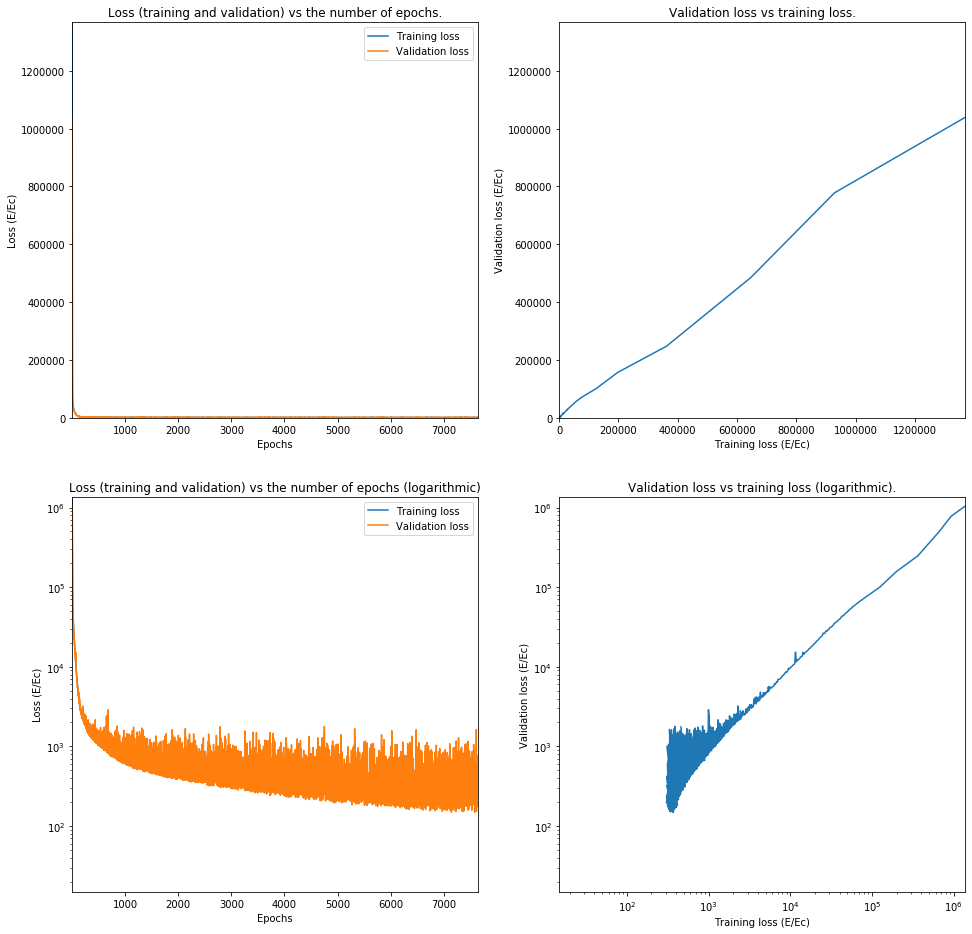

Train on 62644 samples, validate on 15662 samples
Epoch 1/10000
62644/62644 [==============================] - 2s 34us/step - loss: 1024792.6102 - val_loss: 398531.6367
Epoch 2/10000
62644/62644 [==============================] - 2s 32us/step - loss: 256377.4232 - val_loss: 163917.1313
Epoch 3/10000
62644/62644 [==============================] - 2s 32us/step - loss: 124928.9470 - val_loss: 97174.9620
Epoch 4/10000
62644/62644 [==============================] - 2s 32us/step - loss: 82212.4488 - val_loss: 70805.5901
Epoch 5/10000
62644/62644 [==============================] - 2s 32us/step - loss: 62958.6921 - val_loss: 56096.1499
Epoch 6/10000
62644/62644 [==============================] - 2s 32us/step - loss: 52087.3299 - val_loss: 47951.4159
Epoch 7/10000
62644/62644 [==============================] - 2s 32us/step - loss: 45451.6755 - val_loss: 44077.1792
Epoch 8/10000
62644/62644 [==============================] - 2s 32us/step - loss: 40287.8230 - val_loss: 37341.4244
Epoch 9/10000
62

Epoch 71/10000
62644/62644 [==============================] - 2s 32us/step - loss: 8891.4140 - val_loss: 8760.6028
Epoch 72/10000
62644/62644 [==============================] - 2s 32us/step - loss: 8830.2033 - val_loss: 8665.6740
Epoch 73/10000
62644/62644 [==============================] - 2s 32us/step - loss: 8742.5298 - val_loss: 8873.1668
Epoch 74/10000
62644/62644 [==============================] - 2s 31us/step - loss: 8654.6169 - val_loss: 9222.1196
Epoch 75/10000
62644/62644 [==============================] - 2s 32us/step - loss: 8587.1295 - val_loss: 8492.9027
Epoch 76/10000
62644/62644 [==============================] - 2s 32us/step - loss: 8507.3096 - val_loss: 8721.1002
Epoch 77/10000
62644/62644 [==============================] - 2s 32us/step - loss: 8407.6914 - val_loss: 8455.9981
Epoch 78/10000
62644/62644 [==============================] - 2s 31us/step - loss: 8340.5655 - val_loss: 8337.1641
Epoch 79/10000
62644/62644 [==============================] - 2s 31us/step - los

Epoch 142/10000
62644/62644 [==============================] - 2s 31us/step - loss: 5530.3554 - val_loss: 5739.7140
Epoch 143/10000
62644/62644 [==============================] - 2s 32us/step - loss: 5496.7169 - val_loss: 5670.2925
Epoch 144/10000
62644/62644 [==============================] - 2s 32us/step - loss: 5504.6920 - val_loss: 6533.7230
Epoch 145/10000
62644/62644 [==============================] - 2s 31us/step - loss: 5473.2457 - val_loss: 5372.5649
Epoch 146/10000
62644/62644 [==============================] - 2s 31us/step - loss: 5461.6354 - val_loss: 5658.7804
Epoch 147/10000
62644/62644 [==============================] - 2s 32us/step - loss: 5427.3063 - val_loss: 5448.5937
Epoch 148/10000
62644/62644 [==============================] - 2s 32us/step - loss: 5398.2649 - val_loss: 5852.2599
Epoch 149/10000
62644/62644 [==============================] - 2s 32us/step - loss: 5366.4856 - val_loss: 5281.9940
Epoch 150/10000
62644/62644 [==============================] - 2s 31us/s

62644/62644 [==============================] - 2s 32us/step - loss: 4313.5600 - val_loss: 5110.2302
Epoch 213/10000
62644/62644 [==============================] - 2s 32us/step - loss: 4337.3638 - val_loss: 4220.7148
Epoch 214/10000
62644/62644 [==============================] - 2s 32us/step - loss: 4302.1624 - val_loss: 4509.6722
Epoch 215/10000
62644/62644 [==============================] - 2s 31us/step - loss: 4280.0881 - val_loss: 4377.5801
Epoch 216/10000
62644/62644 [==============================] - 2s 31us/step - loss: 4307.5230 - val_loss: 4455.3885
Epoch 217/10000
62644/62644 [==============================] - 2s 31us/step - loss: 4264.9507 - val_loss: 4448.8974
Epoch 218/10000
62644/62644 [==============================] - 2s 31us/step - loss: 4228.2989 - val_loss: 4116.1940
Epoch 219/10000
62644/62644 [==============================] - 2s 31us/step - loss: 4236.1660 - val_loss: 4137.3008
Epoch 220/10000
62644/62644 [==============================] - 2s 31us/step - loss: 4226

Epoch 283/10000
62644/62644 [==============================] - 2s 32us/step - loss: 3552.1339 - val_loss: 3430.8701
Epoch 284/10000
62644/62644 [==============================] - 2s 31us/step - loss: 3540.1091 - val_loss: 3520.3910
Epoch 285/10000
62644/62644 [==============================] - 2s 31us/step - loss: 3524.6845 - val_loss: 3529.1875
Epoch 286/10000
62644/62644 [==============================] - 2s 32us/step - loss: 3528.7768 - val_loss: 3776.2382
Epoch 287/10000
62644/62644 [==============================] - 2s 32us/step - loss: 3500.2170 - val_loss: 3455.5585
Epoch 288/10000
62644/62644 [==============================] - 2s 31us/step - loss: 3515.5165 - val_loss: 3380.1706
Epoch 289/10000
62644/62644 [==============================] - 2s 31us/step - loss: 3521.9495 - val_loss: 3398.1666
Epoch 290/10000
62644/62644 [==============================] - 2s 32us/step - loss: 3478.6097 - val_loss: 3514.0667
Epoch 291/10000
62644/62644 [==============================] - 2s 32us/s

62644/62644 [==============================] - 2s 32us/step - loss: 2896.6217 - val_loss: 2953.6736
Epoch 354/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2911.2952 - val_loss: 2728.6718
Epoch 355/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2860.3806 - val_loss: 3002.0099
Epoch 356/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2859.7311 - val_loss: 2812.6296
Epoch 357/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2861.2812 - val_loss: 2747.1387
Epoch 358/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2847.6103 - val_loss: 2821.5444
Epoch 359/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2863.6575 - val_loss: 2704.9491
Epoch 360/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2845.8025 - val_loss: 2727.4430
Epoch 361/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2826

Epoch 424/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2413.6573 - val_loss: 2475.9380
Epoch 425/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2427.9030 - val_loss: 2334.1406
Epoch 426/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2419.5219 - val_loss: 2265.8541
Epoch 427/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2423.8172 - val_loss: 2269.8535
Epoch 428/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2411.5790 - val_loss: 2630.1166
Epoch 429/10000
62644/62644 [==============================] - 2s 32us/step - loss: 2425.5750 - val_loss: 2235.9909
Epoch 430/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2417.8876 - val_loss: 2869.1066
Epoch 431/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2378.3027 - val_loss: 2553.1867
Epoch 432/10000
62644/62644 [==============================] - 2s 31us/s

62644/62644 [==============================] - 2s 31us/step - loss: 2046.3913 - val_loss: 1933.1744
Epoch 495/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2040.9098 - val_loss: 2016.6355
Epoch 496/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2050.4319 - val_loss: 1920.7604
Epoch 497/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2036.0686 - val_loss: 2095.5125
Epoch 498/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2053.7588 - val_loss: 1862.1160
Epoch 499/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2025.3622 - val_loss: 1982.4340
Epoch 500/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2002.3224 - val_loss: 1917.7320
Epoch 501/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2008.6087 - val_loss: 2483.1574
Epoch 502/10000
62644/62644 [==============================] - 2s 31us/step - loss: 2000

Epoch 565/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1705.8864 - val_loss: 1918.0764
Epoch 566/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1707.2265 - val_loss: 1602.2047
Epoch 567/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1683.4668 - val_loss: 1881.7773
Epoch 568/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1681.0822 - val_loss: 1565.0528
Epoch 569/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1682.3205 - val_loss: 1545.0521
Epoch 570/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1670.3457 - val_loss: 2308.6345
Epoch 571/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1678.8172 - val_loss: 1592.7168
Epoch 572/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1660.1098 - val_loss: 1586.0864
Epoch 573/10000
62644/62644 [==============================] - 2s 31us/s

62644/62644 [==============================] - 2s 31us/step - loss: 1429.8804 - val_loss: 1525.7700
Epoch 636/10000
62644/62644 [==============================] - 2s 32us/step - loss: 1442.0447 - val_loss: 1527.9199
Epoch 637/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1431.6470 - val_loss: 1292.7456
Epoch 638/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1439.6193 - val_loss: 1314.8826
Epoch 639/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1403.5830 - val_loss: 1394.2486
Epoch 640/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1415.9356 - val_loss: 1561.5184
Epoch 641/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1383.3805 - val_loss: 1318.4020
Epoch 642/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1417.1956 - val_loss: 1976.6843
Epoch 643/10000
62644/62644 [==============================] - 2s 32us/step - loss: 1394

Epoch 706/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1202.4142 - val_loss: 1695.3391
Epoch 707/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1201.8635 - val_loss: 1244.0763
Epoch 708/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1187.9723 - val_loss: 1116.3327
Epoch 709/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1170.2148 - val_loss: 1182.3678
Epoch 710/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1201.8957 - val_loss: 1782.1149
Epoch 711/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1196.6282 - val_loss: 1113.5664
Epoch 712/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1201.4393 - val_loss: 1099.8381
Epoch 713/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1170.7578 - val_loss: 1284.1032
Epoch 714/10000
62644/62644 [==============================] - 2s 31us/s

62644/62644 [==============================] - 2s 32us/step - loss: 1047.0335 - val_loss: 1228.8772
Epoch 777/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1055.5985 - val_loss: 1225.3780
Epoch 778/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1029.2616 - val_loss: 1026.2705
Epoch 779/10000
62644/62644 [==============================] - 2s 32us/step - loss: 1047.7516 - val_loss: 1061.9136
Epoch 780/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1023.1302 - val_loss: 1955.5608
Epoch 781/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1029.7942 - val_loss: 1053.3999
Epoch 782/10000
62644/62644 [==============================] - 2s 31us/step - loss: 1009.8574 - val_loss: 1543.3436
Epoch 783/10000
62644/62644 [==============================] - 2s 32us/step - loss: 1032.5473 - val_loss: 1547.9628
Epoch 784/10000
62644/62644 [==============================] - 2s 32us/step - loss: 1027

62644/62644 [==============================] - 2s 32us/step - loss: 937.5952 - val_loss: 1007.1358
Epoch 848/10000
62644/62644 [==============================] - 2s 32us/step - loss: 935.4303 - val_loss: 856.4377
Epoch 849/10000
62644/62644 [==============================] - 2s 32us/step - loss: 941.9702 - val_loss: 834.7604
Epoch 850/10000
62644/62644 [==============================] - 2s 32us/step - loss: 952.1590 - val_loss: 833.3753
Epoch 851/10000
62644/62644 [==============================] - 2s 31us/step - loss: 916.6808 - val_loss: 1059.0838
Epoch 852/10000
62644/62644 [==============================] - 2s 31us/step - loss: 932.2982 - val_loss: 821.5705
Epoch 853/10000
62644/62644 [==============================] - 2s 31us/step - loss: 930.4191 - val_loss: 875.4324
Epoch 854/10000
62644/62644 [==============================] - 2s 31us/step - loss: 905.0212 - val_loss: 841.7040
Epoch 855/10000
62644/62644 [==============================] - 2s 31us/step - loss: 929.3083 - val_los

Epoch 919/10000
62644/62644 [==============================] - 2s 32us/step - loss: 892.6374 - val_loss: 752.2276
Epoch 920/10000
62644/62644 [==============================] - 2s 32us/step - loss: 845.9328 - val_loss: 1078.4804
Epoch 921/10000
62644/62644 [==============================] - 2s 31us/step - loss: 871.8845 - val_loss: 835.4974
Epoch 922/10000
62644/62644 [==============================] - 2s 31us/step - loss: 876.8657 - val_loss: 753.2809
Epoch 923/10000
62644/62644 [==============================] - 2s 31us/step - loss: 887.9464 - val_loss: 753.9556
Epoch 924/10000
62644/62644 [==============================] - 2s 31us/step - loss: 869.1582 - val_loss: 848.1738
Epoch 925/10000
62644/62644 [==============================] - 2s 31us/step - loss: 860.1342 - val_loss: 908.2172
Epoch 926/10000
62644/62644 [==============================] - 2s 32us/step - loss: 867.8789 - val_loss: 770.9823
Epoch 927/10000
62644/62644 [==============================] - 2s 32us/step - loss: 868

62644/62644 [==============================] - 2s 31us/step - loss: 775.1562 - val_loss: 847.7090
Epoch 991/10000
62644/62644 [==============================] - 2s 31us/step - loss: 793.4654 - val_loss: 774.5784
Epoch 992/10000
62644/62644 [==============================] - 2s 31us/step - loss: 820.4274 - val_loss: 713.1871
Epoch 993/10000
62644/62644 [==============================] - 2s 31us/step - loss: 815.2145 - val_loss: 958.6428
Epoch 994/10000
62644/62644 [==============================] - 2s 31us/step - loss: 815.8574 - val_loss: 697.8277
Epoch 995/10000
62644/62644 [==============================] - 2s 31us/step - loss: 803.1147 - val_loss: 736.6805
Epoch 996/10000
62644/62644 [==============================] - 2s 31us/step - loss: 804.0067 - val_loss: 715.3168
Epoch 997/10000
62644/62644 [==============================] - 2s 32us/step - loss: 808.0698 - val_loss: 807.9439
Epoch 998/10000
62644/62644 [==============================] - 2s 31us/step - loss: 815.0505 - val_loss:

62644/62644 [==============================] - 2s 31us/step - loss: 751.8887 - val_loss: 1012.8310
Epoch 1062/10000
62644/62644 [==============================] - 2s 31us/step - loss: 742.4413 - val_loss: 718.1870
Epoch 1063/10000
62644/62644 [==============================] - 2s 31us/step - loss: 744.2373 - val_loss: 1258.6166
Epoch 1064/10000
62644/62644 [==============================] - 2s 31us/step - loss: 773.2050 - val_loss: 789.8484
Epoch 1065/10000
62644/62644 [==============================] - 2s 31us/step - loss: 757.0254 - val_loss: 686.3110
Epoch 1066/10000
62644/62644 [==============================] - 2s 31us/step - loss: 756.1622 - val_loss: 822.2755
Epoch 1067/10000
62644/62644 [==============================] - 2s 31us/step - loss: 762.1725 - val_loss: 885.2751
Epoch 1068/10000
62644/62644 [==============================] - 2s 31us/step - loss: 734.0737 - val_loss: 641.0848
Epoch 1069/10000
62644/62644 [==============================] - 2s 31us/step - loss: 765.7160 -

62644/62644 [==============================] - 2s 31us/step - loss: 718.2489 - val_loss: 645.6392
Epoch 1133/10000
62644/62644 [==============================] - 2s 32us/step - loss: 732.4223 - val_loss: 645.1523
Epoch 1134/10000
62644/62644 [==============================] - 2s 31us/step - loss: 684.9865 - val_loss: 618.5274
Epoch 1135/10000
62644/62644 [==============================] - 2s 31us/step - loss: 692.2074 - val_loss: 753.5011
Epoch 1136/10000
62644/62644 [==============================] - 2s 31us/step - loss: 692.5516 - val_loss: 588.9514
Epoch 1137/10000
62644/62644 [==============================] - 2s 31us/step - loss: 713.5690 - val_loss: 602.8331
Epoch 1138/10000
62644/62644 [==============================] - 2s 31us/step - loss: 703.7980 - val_loss: 581.4134
Epoch 1139/10000
62644/62644 [==============================] - 2s 31us/step - loss: 690.2874 - val_loss: 585.7214
Epoch 1140/10000
62644/62644 [==============================] - 2s 31us/step - loss: 708.6197 - v

62644/62644 [==============================] - 2s 31us/step - loss: 640.7847 - val_loss: 703.0481
Epoch 1204/10000
62644/62644 [==============================] - 2s 31us/step - loss: 655.1259 - val_loss: 677.7884
Epoch 1205/10000
62644/62644 [==============================] - 2s 31us/step - loss: 660.5226 - val_loss: 581.8990
Epoch 1206/10000
62644/62644 [==============================] - 2s 31us/step - loss: 660.2228 - val_loss: 760.1397
Epoch 1207/10000
62644/62644 [==============================] - 2s 31us/step - loss: 657.6425 - val_loss: 577.1887
Epoch 1208/10000
62644/62644 [==============================] - 2s 31us/step - loss: 655.6449 - val_loss: 867.9811
Epoch 1209/10000
62644/62644 [==============================] - 2s 31us/step - loss: 635.9468 - val_loss: 1130.5920
Epoch 1210/10000
62644/62644 [==============================] - 2s 31us/step - loss: 653.9352 - val_loss: 515.6374
Epoch 1211/10000
62644/62644 [==============================] - 2s 32us/step - loss: 638.2049 - 

62644/62644 [==============================] - 2s 31us/step - loss: 596.0586 - val_loss: 540.5618
Epoch 1275/10000
62644/62644 [==============================] - 2s 33us/step - loss: 612.1834 - val_loss: 498.2320
Epoch 1276/10000
62644/62644 [==============================] - 2s 32us/step - loss: 609.2075 - val_loss: 572.7405
Epoch 1277/10000
62644/62644 [==============================] - 2s 32us/step - loss: 619.8267 - val_loss: 617.3603
Epoch 1278/10000
62644/62644 [==============================] - 2s 31us/step - loss: 615.0006 - val_loss: 808.7634
Epoch 1279/10000
62644/62644 [==============================] - 2s 32us/step - loss: 620.5011 - val_loss: 925.1858
Epoch 1280/10000
62644/62644 [==============================] - 2s 31us/step - loss: 613.0216 - val_loss: 494.5611
Epoch 1281/10000
62644/62644 [==============================] - 2s 31us/step - loss: 608.5268 - val_loss: 486.3446
Epoch 1282/10000
62644/62644 [==============================] - 2s 31us/step - loss: 620.4966 - v

62644/62644 [==============================] - 2s 31us/step - loss: 570.6752 - val_loss: 712.2063
Epoch 1346/10000
62644/62644 [==============================] - 2s 31us/step - loss: 575.5062 - val_loss: 459.4718
Epoch 1347/10000
62644/62644 [==============================] - 2s 31us/step - loss: 605.1961 - val_loss: 458.2954
Epoch 1348/10000
62644/62644 [==============================] - 2s 31us/step - loss: 573.2667 - val_loss: 558.8130
Epoch 1349/10000
62644/62644 [==============================] - 2s 31us/step - loss: 566.2105 - val_loss: 482.4408
Epoch 1350/10000
62644/62644 [==============================] - 2s 31us/step - loss: 608.4687 - val_loss: 528.5082
Epoch 1351/10000
62644/62644 [==============================] - 2s 31us/step - loss: 596.0436 - val_loss: 491.9340
Epoch 1352/10000
62644/62644 [==============================] - 2s 32us/step - loss: 575.0628 - val_loss: 471.4866
Epoch 1353/10000
62644/62644 [==============================] - 2s 31us/step - loss: 583.6832 - v

62644/62644 [==============================] - 2s 31us/step - loss: 534.9174 - val_loss: 794.0409
Epoch 1417/10000
62644/62644 [==============================] - 2s 31us/step - loss: 561.9928 - val_loss: 760.8476
Epoch 1418/10000
62644/62644 [==============================] - 2s 31us/step - loss: 542.2193 - val_loss: 714.0850
Epoch 1419/10000
62644/62644 [==============================] - 2s 32us/step - loss: 546.5296 - val_loss: 530.7813
Epoch 1420/10000
62644/62644 [==============================] - 2s 31us/step - loss: 541.5349 - val_loss: 628.2213
Epoch 1421/10000
62644/62644 [==============================] - 2s 31us/step - loss: 566.5195 - val_loss: 657.3231
Epoch 1422/10000
62644/62644 [==============================] - 2s 32us/step - loss: 528.9885 - val_loss: 526.6391
Epoch 1423/10000
62644/62644 [==============================] - 2s 31us/step - loss: 543.3591 - val_loss: 445.4136
Epoch 1424/10000
62644/62644 [==============================] - 2s 31us/step - loss: 562.6070 - v

62644/62644 [==============================] - 2s 31us/step - loss: 524.0148 - val_loss: 565.1778
Epoch 1488/10000
62644/62644 [==============================] - 2s 31us/step - loss: 551.5897 - val_loss: 533.2953
Epoch 1489/10000
62644/62644 [==============================] - 2s 31us/step - loss: 542.3378 - val_loss: 409.8785
Epoch 1490/10000
62644/62644 [==============================] - 2s 31us/step - loss: 530.6319 - val_loss: 660.1617
Epoch 1491/10000
62644/62644 [==============================] - 2s 31us/step - loss: 553.2965 - val_loss: 581.1802
Epoch 1492/10000
62644/62644 [==============================] - 2s 32us/step - loss: 510.4310 - val_loss: 469.3815
Epoch 1493/10000
62644/62644 [==============================] - 2s 32us/step - loss: 554.3482 - val_loss: 575.9325
Epoch 1494/10000
62644/62644 [==============================] - 2s 31us/step - loss: 517.1829 - val_loss: 699.3681
Epoch 1495/10000
62644/62644 [==============================] - 2s 32us/step - loss: 531.8293 - v

62644/62644 [==============================] - 2s 31us/step - loss: 513.1114 - val_loss: 504.3886
Epoch 1559/10000
62644/62644 [==============================] - 2s 32us/step - loss: 532.3344 - val_loss: 753.7621
Epoch 1560/10000
62644/62644 [==============================] - 2s 31us/step - loss: 530.4311 - val_loss: 457.7162
Epoch 1561/10000
62644/62644 [==============================] - 2s 31us/step - loss: 513.3345 - val_loss: 372.1240
Epoch 1562/10000
62644/62644 [==============================] - 2s 31us/step - loss: 525.0622 - val_loss: 369.3467
Epoch 1563/10000
62644/62644 [==============================] - 2s 31us/step - loss: 506.7990 - val_loss: 516.7884
Epoch 1564/10000
62644/62644 [==============================] - 2s 31us/step - loss: 539.5849 - val_loss: 632.9495
Epoch 1565/10000
62644/62644 [==============================] - 2s 32us/step - loss: 508.8023 - val_loss: 579.0388
Epoch 1566/10000
62644/62644 [==============================] - 2s 31us/step - loss: 493.2362 - v

62644/62644 [==============================] - 2s 32us/step - loss: 496.7310 - val_loss: 734.0314
Epoch 1630/10000
62644/62644 [==============================] - 2s 31us/step - loss: 483.0084 - val_loss: 349.0412
Epoch 1631/10000
62644/62644 [==============================] - 2s 31us/step - loss: 493.6855 - val_loss: 500.8047
Epoch 1632/10000
62644/62644 [==============================] - 2s 31us/step - loss: 489.0105 - val_loss: 436.3736
Epoch 1633/10000
62644/62644 [==============================] - 2s 32us/step - loss: 482.0486 - val_loss: 377.4936
Epoch 1634/10000
62644/62644 [==============================] - 2s 31us/step - loss: 483.4855 - val_loss: 416.5817
Epoch 1635/10000
62644/62644 [==============================] - 2s 31us/step - loss: 496.2144 - val_loss: 493.5536
Epoch 1636/10000
62644/62644 [==============================] - 2s 31us/step - loss: 491.4418 - val_loss: 742.0405
Epoch 1637/10000
62644/62644 [==============================] - 2s 31us/step - loss: 497.8515 - v

62644/62644 [==============================] - 2s 31us/step - loss: 465.1310 - val_loss: 431.5266
Epoch 1701/10000
62644/62644 [==============================] - 2s 32us/step - loss: 488.6031 - val_loss: 364.0207
Epoch 1702/10000
62644/62644 [==============================] - 2s 33us/step - loss: 465.0238 - val_loss: 515.6239
Epoch 1703/10000
62644/62644 [==============================] - 2s 34us/step - loss: 461.4089 - val_loss: 345.0517
Epoch 1704/10000
62644/62644 [==============================] - 2s 33us/step - loss: 464.1513 - val_loss: 349.5900
Epoch 1705/10000
62644/62644 [==============================] - 2s 32us/step - loss: 471.2619 - val_loss: 514.5207
Epoch 1706/10000
62644/62644 [==============================] - 2s 32us/step - loss: 463.9912 - val_loss: 432.2832
Epoch 1707/10000
62644/62644 [==============================] - 2s 32us/step - loss: 463.9230 - val_loss: 418.9816
Epoch 1708/10000
62644/62644 [==============================] - 2s 31us/step - loss: 494.7247 - v

62644/62644 [==============================] - 2s 31us/step - loss: 448.6484 - val_loss: 1225.7087
Epoch 1772/10000
62644/62644 [==============================] - 2s 36us/step - loss: 459.2413 - val_loss: 490.5756
Epoch 1773/10000
62644/62644 [==============================] - 2s 31us/step - loss: 442.1931 - val_loss: 850.5892
Epoch 1774/10000
62644/62644 [==============================] - 2s 35us/step - loss: 462.7546 - val_loss: 371.5766
Epoch 1775/10000
62644/62644 [==============================] - 2s 31us/step - loss: 476.5212 - val_loss: 398.9790
Epoch 1776/10000
62644/62644 [==============================] - 2s 36us/step - loss: 466.5992 - val_loss: 363.4553
Epoch 1777/10000
62644/62644 [==============================] - 2s 32us/step - loss: 455.5296 - val_loss: 660.0517
Epoch 1778/10000
62644/62644 [==============================] - 2s 35us/step - loss: 468.5549 - val_loss: 456.9709
Epoch 1779/10000
62644/62644 [==============================] - 2s 31us/step - loss: 461.2246 - 

62644/62644 [==============================] - 2s 31us/step - loss: 445.3323 - val_loss: 306.7472
Epoch 1843/10000
62644/62644 [==============================] - 2s 31us/step - loss: 434.4996 - val_loss: 375.6593
Epoch 1844/10000
62644/62644 [==============================] - 2s 31us/step - loss: 445.8398 - val_loss: 337.1244
Epoch 1845/10000
62644/62644 [==============================] - 2s 31us/step - loss: 455.1004 - val_loss: 348.9354
Epoch 1846/10000
62644/62644 [==============================] - 2s 31us/step - loss: 458.6960 - val_loss: 300.8485
Epoch 1847/10000
62644/62644 [==============================] - 2s 31us/step - loss: 443.0691 - val_loss: 503.2724
Epoch 1848/10000
62644/62644 [==============================] - 2s 32us/step - loss: 465.0708 - val_loss: 588.9968
Epoch 1849/10000
62644/62644 [==============================] - 2s 31us/step - loss: 464.8497 - val_loss: 366.6667
Epoch 1850/10000
62644/62644 [==============================] - 2s 31us/step - loss: 475.2956 - v

62644/62644 [==============================] - 2s 32us/step - loss: 428.7718 - val_loss: 648.8974
Epoch 1914/10000
62644/62644 [==============================] - 2s 31us/step - loss: 461.2373 - val_loss: 412.3428
Epoch 1915/10000
62644/62644 [==============================] - 2s 31us/step - loss: 439.5907 - val_loss: 300.5858
Epoch 1916/10000
62644/62644 [==============================] - 2s 32us/step - loss: 429.4693 - val_loss: 548.7325
Epoch 1917/10000
62644/62644 [==============================] - 2s 31us/step - loss: 445.8173 - val_loss: 273.8147
Epoch 1918/10000
62644/62644 [==============================] - 2s 31us/step - loss: 432.9207 - val_loss: 408.3322
Epoch 1919/10000
62644/62644 [==============================] - 2s 32us/step - loss: 433.0763 - val_loss: 355.6565
Epoch 1920/10000
62644/62644 [==============================] - 2s 31us/step - loss: 432.8410 - val_loss: 466.2087
Epoch 1921/10000
62644/62644 [==============================] - 2s 32us/step - loss: 442.2783 - v

62644/62644 [==============================] - 2s 32us/step - loss: 434.8132 - val_loss: 476.1975
Epoch 1985/10000
62644/62644 [==============================] - 2s 31us/step - loss: 444.4888 - val_loss: 863.7642
Epoch 1986/10000
62644/62644 [==============================] - 2s 31us/step - loss: 438.6005 - val_loss: 296.5836
Epoch 1987/10000
62644/62644 [==============================] - 2s 31us/step - loss: 430.6358 - val_loss: 330.2592
Epoch 1988/10000
62644/62644 [==============================] - 2s 32us/step - loss: 443.2468 - val_loss: 713.6879
Epoch 1989/10000
62644/62644 [==============================] - 2s 31us/step - loss: 438.0896 - val_loss: 392.4895
Epoch 1990/10000
62644/62644 [==============================] - 2s 31us/step - loss: 437.9401 - val_loss: 1247.4097
Epoch 1991/10000
62644/62644 [==============================] - 2s 31us/step - loss: 425.8988 - val_loss: 300.1894
Epoch 1992/10000
62644/62644 [==============================] - 2s 31us/step - loss: 419.4532 - 

62644/62644 [==============================] - 2s 31us/step - loss: 439.4028 - val_loss: 518.4339
Epoch 2056/10000
62644/62644 [==============================] - 2s 31us/step - loss: 408.7169 - val_loss: 363.5906
Epoch 2057/10000
62644/62644 [==============================] - 2s 32us/step - loss: 418.9062 - val_loss: 299.5193
Epoch 2058/10000
62644/62644 [==============================] - 2s 31us/step - loss: 405.8808 - val_loss: 551.9028
Epoch 2059/10000
62644/62644 [==============================] - 2s 31us/step - loss: 427.5595 - val_loss: 288.1951
Epoch 2060/10000
62644/62644 [==============================] - 2s 31us/step - loss: 401.8428 - val_loss: 331.6521
Epoch 2061/10000
62644/62644 [==============================] - 2s 31us/step - loss: 411.1850 - val_loss: 751.6188
Epoch 2062/10000
62644/62644 [==============================] - 2s 31us/step - loss: 441.5316 - val_loss: 342.1467
Epoch 2063/10000
62644/62644 [==============================] - 2s 31us/step - loss: 399.4774 - v

62644/62644 [==============================] - 2s 32us/step - loss: 421.7849 - val_loss: 348.9041
Epoch 2127/10000
62644/62644 [==============================] - 2s 31us/step - loss: 399.7190 - val_loss: 619.6871
Epoch 2128/10000
62644/62644 [==============================] - 2s 34us/step - loss: 411.4168 - val_loss: 336.2193
Epoch 2129/10000
62644/62644 [==============================] - 2s 34us/step - loss: 400.4298 - val_loss: 774.7716
Epoch 2130/10000
62644/62644 [==============================] - 2s 32us/step - loss: 428.4472 - val_loss: 338.2958
Epoch 2131/10000
62644/62644 [==============================] - 2s 31us/step - loss: 421.9238 - val_loss: 393.1722
Epoch 2132/10000
62644/62644 [==============================] - 2s 31us/step - loss: 406.9721 - val_loss: 456.8103
Epoch 2133/10000
62644/62644 [==============================] - 2s 32us/step - loss: 420.2738 - val_loss: 991.3507
Epoch 2134/10000
62644/62644 [==============================] - 2s 31us/step - loss: 404.6611 - v

62644/62644 [==============================] - 2s 31us/step - loss: 408.8834 - val_loss: 365.3417
Epoch 2198/10000
62644/62644 [==============================] - 2s 31us/step - loss: 394.3460 - val_loss: 931.1712
Epoch 2199/10000
62644/62644 [==============================] - 2s 31us/step - loss: 406.1056 - val_loss: 886.4503
Epoch 2200/10000
62644/62644 [==============================] - 2s 31us/step - loss: 406.3573 - val_loss: 349.6428
Epoch 2201/10000
62644/62644 [==============================] - 2s 31us/step - loss: 407.1987 - val_loss: 276.3474
Epoch 2202/10000
62644/62644 [==============================] - 2s 31us/step - loss: 418.2641 - val_loss: 386.1949
Epoch 2203/10000
62644/62644 [==============================] - 2s 31us/step - loss: 390.6425 - val_loss: 413.1532
Epoch 2204/10000
62644/62644 [==============================] - 2s 32us/step - loss: 386.6131 - val_loss: 268.7698
Epoch 2205/10000
62644/62644 [==============================] - 2s 31us/step - loss: 415.0172 - v

62644/62644 [==============================] - 2s 31us/step - loss: 384.8063 - val_loss: 313.0994
Epoch 2269/10000
62644/62644 [==============================] - 2s 31us/step - loss: 390.7364 - val_loss: 986.0130
Epoch 2270/10000
62644/62644 [==============================] - 2s 31us/step - loss: 398.2828 - val_loss: 270.0987
Epoch 2271/10000
62644/62644 [==============================] - 2s 32us/step - loss: 412.0449 - val_loss: 531.2493
Epoch 2272/10000
62644/62644 [==============================] - 2s 32us/step - loss: 412.0712 - val_loss: 504.5331
Epoch 2273/10000
62644/62644 [==============================] - 2s 31us/step - loss: 417.9896 - val_loss: 1247.9816
Epoch 2274/10000
62644/62644 [==============================] - 2s 31us/step - loss: 412.4206 - val_loss: 1141.2601
Epoch 2275/10000
62644/62644 [==============================] - 2s 31us/step - loss: 403.3006 - val_loss: 311.2870
Epoch 2276/10000
62644/62644 [==============================] - 2s 32us/step - loss: 389.2172 -

62644/62644 [==============================] - 2s 31us/step - loss: 400.4507 - val_loss: 574.1598
Epoch 2340/10000
62644/62644 [==============================] - 2s 31us/step - loss: 395.5668 - val_loss: 706.9828
Epoch 2341/10000
62644/62644 [==============================] - 2s 31us/step - loss: 396.5131 - val_loss: 254.5017
Epoch 2342/10000
62644/62644 [==============================] - 2s 31us/step - loss: 361.0482 - val_loss: 268.4630
Epoch 2343/10000
62644/62644 [==============================] - 2s 31us/step - loss: 397.4750 - val_loss: 307.6570
Epoch 2344/10000
62644/62644 [==============================] - 2s 31us/step - loss: 372.7198 - val_loss: 277.5344
Epoch 2345/10000
62644/62644 [==============================] - 2s 31us/step - loss: 392.4074 - val_loss: 241.3819
Epoch 2346/10000
62644/62644 [==============================] - 2s 31us/step - loss: 401.6436 - val_loss: 540.2906
Epoch 2347/10000
62644/62644 [==============================] - 2s 31us/step - loss: 385.5831 - v

62644/62644 [==============================] - 2s 31us/step - loss: 393.4260 - val_loss: 258.1497
Epoch 2411/10000
62644/62644 [==============================] - 2s 31us/step - loss: 362.3595 - val_loss: 240.0328
Epoch 2412/10000
62644/62644 [==============================] - 2s 31us/step - loss: 411.0335 - val_loss: 316.0426
Epoch 2413/10000
62644/62644 [==============================] - 2s 31us/step - loss: 376.8649 - val_loss: 270.3477
Epoch 2414/10000
62644/62644 [==============================] - 2s 31us/step - loss: 413.2684 - val_loss: 683.0525
Epoch 2415/10000
62644/62644 [==============================] - 2s 31us/step - loss: 376.8061 - val_loss: 273.4042
Epoch 2416/10000
62644/62644 [==============================] - 2s 31us/step - loss: 390.7499 - val_loss: 362.6321
Epoch 2417/10000
62644/62644 [==============================] - 2s 31us/step - loss: 378.8979 - val_loss: 456.2046
Epoch 2418/10000
62644/62644 [==============================] - 2s 31us/step - loss: 372.4090 - v

62644/62644 [==============================] - 2s 31us/step - loss: 378.8739 - val_loss: 459.7894
Epoch 2482/10000
62644/62644 [==============================] - 2s 31us/step - loss: 388.6133 - val_loss: 363.3425
Epoch 2483/10000
62644/62644 [==============================] - 2s 31us/step - loss: 365.5594 - val_loss: 269.3346
Epoch 2484/10000
62644/62644 [==============================] - 2s 31us/step - loss: 391.5390 - val_loss: 267.7243
Epoch 2485/10000
62644/62644 [==============================] - 2s 32us/step - loss: 380.2142 - val_loss: 328.0599
Epoch 2486/10000
62644/62644 [==============================] - 2s 31us/step - loss: 353.0718 - val_loss: 443.4295
Epoch 2487/10000
62644/62644 [==============================] - 2s 32us/step - loss: 353.5640 - val_loss: 254.3321
Epoch 2488/10000
62644/62644 [==============================] - 2s 31us/step - loss: 369.8111 - val_loss: 310.7988
Epoch 2489/10000
62644/62644 [==============================] - 2s 31us/step - loss: 377.6097 - v

62644/62644 [==============================] - 2s 32us/step - loss: 388.9185 - val_loss: 408.7294
Epoch 2553/10000
62644/62644 [==============================] - 2s 34us/step - loss: 383.2745 - val_loss: 455.1759
Epoch 2554/10000
62644/62644 [==============================] - 2s 32us/step - loss: 375.8504 - val_loss: 254.8362
Epoch 2555/10000
62644/62644 [==============================] - 2s 32us/step - loss: 374.9801 - val_loss: 511.8002
Epoch 2556/10000
62644/62644 [==============================] - 2s 32us/step - loss: 360.1501 - val_loss: 1027.3512
Epoch 2557/10000
62644/62644 [==============================] - 2s 33us/step - loss: 393.5517 - val_loss: 258.7157
Epoch 2558/10000
62644/62644 [==============================] - 2s 32us/step - loss: 378.9947 - val_loss: 479.7669
Epoch 2559/10000
62644/62644 [==============================] - 2s 33us/step - loss: 381.5926 - val_loss: 418.3015
Epoch 2560/10000
62644/62644 [==============================] - 2s 33us/step - loss: 405.9016 - 

62644/62644 [==============================] - 2s 31us/step - loss: 365.0855 - val_loss: 514.9937
Epoch 2624/10000
62644/62644 [==============================] - 2s 31us/step - loss: 390.8391 - val_loss: 221.4869
Epoch 2625/10000
62644/62644 [==============================] - 2s 31us/step - loss: 397.5720 - val_loss: 234.5404
Epoch 2626/10000
62644/62644 [==============================] - 2s 31us/step - loss: 373.7044 - val_loss: 387.1290
Epoch 2627/10000
62644/62644 [==============================] - 2s 31us/step - loss: 363.7271 - val_loss: 354.6880
Epoch 2628/10000
62644/62644 [==============================] - 2s 33us/step - loss: 376.3442 - val_loss: 217.4887
Epoch 2629/10000
62644/62644 [==============================] - 2s 33us/step - loss: 373.3369 - val_loss: 288.2027
Epoch 2630/10000
62644/62644 [==============================] - 2s 33us/step - loss: 366.5447 - val_loss: 207.9812
Epoch 2631/10000
62644/62644 [==============================] - 2s 31us/step - loss: 356.5992 - v

62644/62644 [==============================] - 2s 31us/step - loss: 375.9375 - val_loss: 311.4740
Epoch 2695/10000
62644/62644 [==============================] - 2s 31us/step - loss: 356.8729 - val_loss: 359.3962
Epoch 2696/10000
62644/62644 [==============================] - 2s 31us/step - loss: 370.0903 - val_loss: 303.2001
Epoch 2697/10000
62644/62644 [==============================] - 2s 31us/step - loss: 360.6298 - val_loss: 273.9001
Epoch 2698/10000
62644/62644 [==============================] - 2s 31us/step - loss: 370.9045 - val_loss: 358.3951
Epoch 2699/10000
62644/62644 [==============================] - 2s 32us/step - loss: 368.2969 - val_loss: 237.7627
Epoch 2700/10000
62644/62644 [==============================] - 2s 32us/step - loss: 366.8351 - val_loss: 334.2206
Epoch 2701/10000
62644/62644 [==============================] - 2s 31us/step - loss: 359.8116 - val_loss: 358.8845
Epoch 2702/10000
62644/62644 [==============================] - 2s 31us/step - loss: 343.9463 - v

62644/62644 [==============================] - 2s 31us/step - loss: 365.8596 - val_loss: 584.5195
Epoch 2766/10000
62644/62644 [==============================] - 2s 31us/step - loss: 361.2521 - val_loss: 955.8087
Epoch 2767/10000
62644/62644 [==============================] - 2s 31us/step - loss: 356.6208 - val_loss: 374.3019
Epoch 2768/10000
62644/62644 [==============================] - 2s 31us/step - loss: 343.6368 - val_loss: 344.1972
Epoch 2769/10000
62644/62644 [==============================] - 2s 31us/step - loss: 373.2720 - val_loss: 215.9916
Epoch 2770/10000
62644/62644 [==============================] - 2s 31us/step - loss: 364.6498 - val_loss: 241.7390
Epoch 2771/10000
62644/62644 [==============================] - 2s 31us/step - loss: 334.6328 - val_loss: 272.9216
Epoch 2772/10000
62644/62644 [==============================] - 2s 31us/step - loss: 368.7644 - val_loss: 702.4917
Epoch 2773/10000
62644/62644 [==============================] - 2s 31us/step - loss: 372.7941 - v

62644/62644 [==============================] - 2s 32us/step - loss: 377.0955 - val_loss: 640.2632
Epoch 2837/10000
62644/62644 [==============================] - 2s 31us/step - loss: 350.1016 - val_loss: 225.4188
Epoch 2838/10000
62644/62644 [==============================] - 2s 31us/step - loss: 345.0622 - val_loss: 280.6934
Epoch 2839/10000
62644/62644 [==============================] - 2s 32us/step - loss: 347.8529 - val_loss: 269.6817
Epoch 2840/10000
62644/62644 [==============================] - 2s 31us/step - loss: 355.9111 - val_loss: 253.2055
Epoch 2841/10000
62644/62644 [==============================] - 2s 31us/step - loss: 359.4863 - val_loss: 245.7319
Epoch 2842/10000
62644/62644 [==============================] - 2s 32us/step - loss: 357.3587 - val_loss: 327.3566
Epoch 2843/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.9726 - val_loss: 213.8668
Epoch 2844/10000
62644/62644 [==============================] - 2s 31us/step - loss: 363.3504 - v

62644/62644 [==============================] - 2s 31us/step - loss: 349.1127 - val_loss: 296.6304
Epoch 2908/10000
62644/62644 [==============================] - 2s 32us/step - loss: 349.4492 - val_loss: 392.0923
Epoch 2909/10000
62644/62644 [==============================] - 2s 31us/step - loss: 356.2001 - val_loss: 912.2565
Epoch 2910/10000
62644/62644 [==============================] - 2s 31us/step - loss: 333.7129 - val_loss: 878.6559
Epoch 2911/10000
62644/62644 [==============================] - 2s 31us/step - loss: 328.5538 - val_loss: 268.3445
Epoch 2912/10000
62644/62644 [==============================] - 2s 31us/step - loss: 348.9896 - val_loss: 533.2862
Epoch 2913/10000
62644/62644 [==============================] - 2s 31us/step - loss: 352.7329 - val_loss: 303.0016
Epoch 2914/10000
62644/62644 [==============================] - 2s 31us/step - loss: 349.2696 - val_loss: 184.7549
Epoch 2915/10000
62644/62644 [==============================] - 2s 31us/step - loss: 361.1692 - v

62644/62644 [==============================] - 2s 31us/step - loss: 355.8869 - val_loss: 293.3879
Epoch 2979/10000
62644/62644 [==============================] - 2s 32us/step - loss: 341.0282 - val_loss: 474.3645
Epoch 2980/10000
62644/62644 [==============================] - 2s 32us/step - loss: 347.7953 - val_loss: 198.6515
Epoch 2981/10000
62644/62644 [==============================] - 2s 31us/step - loss: 346.4980 - val_loss: 231.1831
Epoch 2982/10000
62644/62644 [==============================] - 2s 32us/step - loss: 378.6054 - val_loss: 905.4422
Epoch 2983/10000
62644/62644 [==============================] - 2s 33us/step - loss: 355.1871 - val_loss: 356.5224
Epoch 2984/10000
62644/62644 [==============================] - 2s 32us/step - loss: 358.6087 - val_loss: 195.8039
Epoch 2985/10000
62644/62644 [==============================] - 2s 31us/step - loss: 334.3854 - val_loss: 618.2155
Epoch 2986/10000
62644/62644 [==============================] - 2s 31us/step - loss: 342.1291 - v

62644/62644 [==============================] - 2s 31us/step - loss: 326.6834 - val_loss: 198.3314
Epoch 3050/10000
62644/62644 [==============================] - 2s 31us/step - loss: 342.3617 - val_loss: 249.8430
Epoch 3051/10000
62644/62644 [==============================] - 2s 31us/step - loss: 373.2005 - val_loss: 547.5638
Epoch 3052/10000
62644/62644 [==============================] - 2s 31us/step - loss: 336.0936 - val_loss: 288.6000
Epoch 3053/10000
62644/62644 [==============================] - 2s 31us/step - loss: 337.2973 - val_loss: 275.8974
Epoch 3054/10000
62644/62644 [==============================] - 2s 31us/step - loss: 371.3504 - val_loss: 321.1539
Epoch 3055/10000
62644/62644 [==============================] - 2s 31us/step - loss: 355.1147 - val_loss: 215.0928
Epoch 3056/10000
62644/62644 [==============================] - 2s 31us/step - loss: 326.9380 - val_loss: 451.8344
Epoch 3057/10000
62644/62644 [==============================] - 2s 31us/step - loss: 358.1903 - v

62644/62644 [==============================] - 2s 32us/step - loss: 361.1360 - val_loss: 301.2930
Epoch 3121/10000
62644/62644 [==============================] - 2s 32us/step - loss: 312.7508 - val_loss: 220.1184
Epoch 3122/10000
62644/62644 [==============================] - 2s 31us/step - loss: 343.5816 - val_loss: 653.3875
Epoch 3123/10000
62644/62644 [==============================] - 2s 31us/step - loss: 343.9484 - val_loss: 212.3848
Epoch 3124/10000
62644/62644 [==============================] - 2s 32us/step - loss: 330.2604 - val_loss: 313.2703
Epoch 3125/10000
62644/62644 [==============================] - 2s 31us/step - loss: 343.8708 - val_loss: 311.5962
Epoch 3126/10000
62644/62644 [==============================] - 2s 31us/step - loss: 317.2900 - val_loss: 285.4615
Epoch 3127/10000
62644/62644 [==============================] - 2s 31us/step - loss: 316.4129 - val_loss: 558.0214
Epoch 3128/10000
62644/62644 [==============================] - 2s 31us/step - loss: 352.1192 - v

62644/62644 [==============================] - 2s 31us/step - loss: 333.8784 - val_loss: 293.8777
Epoch 3192/10000
62644/62644 [==============================] - 2s 31us/step - loss: 333.5850 - val_loss: 338.8533
Epoch 3193/10000
62644/62644 [==============================] - 2s 31us/step - loss: 341.4737 - val_loss: 597.0059
Epoch 3194/10000
62644/62644 [==============================] - 2s 31us/step - loss: 345.1726 - val_loss: 467.0310
Epoch 3195/10000
62644/62644 [==============================] - 2s 31us/step - loss: 346.7357 - val_loss: 436.3204
Epoch 3196/10000
62644/62644 [==============================] - 2s 32us/step - loss: 315.0259 - val_loss: 365.6144
Epoch 3197/10000
62644/62644 [==============================] - 2s 33us/step - loss: 328.3097 - val_loss: 227.2446
Epoch 3198/10000
62644/62644 [==============================] - 2s 32us/step - loss: 338.6972 - val_loss: 206.7228
Epoch 3199/10000
62644/62644 [==============================] - 2s 32us/step - loss: 331.6023 - v

62644/62644 [==============================] - 2s 31us/step - loss: 337.9230 - val_loss: 644.2197
Epoch 3263/10000
62644/62644 [==============================] - 2s 31us/step - loss: 333.4406 - val_loss: 291.0763
Epoch 3264/10000
62644/62644 [==============================] - 2s 31us/step - loss: 339.6631 - val_loss: 343.0949
Epoch 3265/10000
62644/62644 [==============================] - 2s 31us/step - loss: 310.6536 - val_loss: 220.0327
Epoch 3266/10000
62644/62644 [==============================] - 2s 31us/step - loss: 349.1292 - val_loss: 437.4050
Epoch 3267/10000
62644/62644 [==============================] - 2s 31us/step - loss: 348.8813 - val_loss: 722.5715
Epoch 3268/10000
62644/62644 [==============================] - 2s 31us/step - loss: 337.8434 - val_loss: 193.4318
Epoch 3269/10000
62644/62644 [==============================] - 2s 31us/step - loss: 352.7632 - val_loss: 183.1522
Epoch 3270/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.0294 - v

62644/62644 [==============================] - 2s 31us/step - loss: 330.3454 - val_loss: 204.0795
Epoch 3334/10000
62644/62644 [==============================] - 2s 31us/step - loss: 317.0326 - val_loss: 174.9183
Epoch 3335/10000
62644/62644 [==============================] - 2s 31us/step - loss: 308.1063 - val_loss: 386.0701
Epoch 3336/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.7611 - val_loss: 245.9417
Epoch 3337/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.4501 - val_loss: 338.9026
Epoch 3338/10000
62644/62644 [==============================] - 2s 31us/step - loss: 334.9129 - val_loss: 189.8734
Epoch 3339/10000
62644/62644 [==============================] - 2s 31us/step - loss: 339.6495 - val_loss: 409.0364
Epoch 3340/10000
62644/62644 [==============================] - 2s 31us/step - loss: 352.0723 - val_loss: 187.7823
Epoch 3341/10000
62644/62644 [==============================] - 2s 31us/step - loss: 319.3112 - v

62644/62644 [==============================] - 2s 33us/step - loss: 320.6222 - val_loss: 188.3196
Epoch 3405/10000
62644/62644 [==============================] - 2s 32us/step - loss: 338.9979 - val_loss: 237.4748
Epoch 3406/10000
62644/62644 [==============================] - 2s 32us/step - loss: 328.0723 - val_loss: 315.0849
Epoch 3407/10000
62644/62644 [==============================] - 2s 32us/step - loss: 328.4696 - val_loss: 270.7807
Epoch 3408/10000
62644/62644 [==============================] - 2s 32us/step - loss: 304.9797 - val_loss: 398.2732
Epoch 3409/10000
62644/62644 [==============================] - 2s 32us/step - loss: 325.9638 - val_loss: 237.1088
Epoch 3410/10000
62644/62644 [==============================] - 2s 32us/step - loss: 327.5114 - val_loss: 361.9949
Epoch 3411/10000
62644/62644 [==============================] - 2s 32us/step - loss: 332.3183 - val_loss: 246.6345
Epoch 3412/10000
62644/62644 [==============================] - 2s 32us/step - loss: 319.8594 - v

62644/62644 [==============================] - 2s 31us/step - loss: 344.2421 - val_loss: 202.0219
Epoch 3476/10000
62644/62644 [==============================] - 2s 31us/step - loss: 324.8087 - val_loss: 255.4692
Epoch 3477/10000
62644/62644 [==============================] - 2s 32us/step - loss: 346.5392 - val_loss: 193.1323
Epoch 3478/10000
62644/62644 [==============================] - 2s 31us/step - loss: 324.9580 - val_loss: 330.5242
Epoch 3479/10000
62644/62644 [==============================] - 2s 31us/step - loss: 339.9510 - val_loss: 196.4687
Epoch 3480/10000
62644/62644 [==============================] - 2s 31us/step - loss: 314.6675 - val_loss: 463.0018
Epoch 3481/10000
62644/62644 [==============================] - 2s 31us/step - loss: 345.6094 - val_loss: 300.2339
Epoch 3482/10000
62644/62644 [==============================] - 2s 31us/step - loss: 318.2926 - val_loss: 481.9859
Epoch 3483/10000
62644/62644 [==============================] - 2s 31us/step - loss: 321.2165 - v

62644/62644 [==============================] - 2s 31us/step - loss: 339.6468 - val_loss: 219.4163
Epoch 3547/10000
62644/62644 [==============================] - 2s 32us/step - loss: 306.3707 - val_loss: 555.5779
Epoch 3548/10000
62644/62644 [==============================] - 2s 31us/step - loss: 307.7991 - val_loss: 495.1826
Epoch 3549/10000
62644/62644 [==============================] - 2s 32us/step - loss: 346.9927 - val_loss: 468.4157
Epoch 3550/10000
62644/62644 [==============================] - 2s 31us/step - loss: 316.1286 - val_loss: 354.6488
Epoch 3551/10000
62644/62644 [==============================] - 2s 31us/step - loss: 320.3773 - val_loss: 321.6866
Epoch 3552/10000
62644/62644 [==============================] - 2s 31us/step - loss: 339.3251 - val_loss: 672.7004
Epoch 3553/10000
62644/62644 [==============================] - 2s 31us/step - loss: 320.1822 - val_loss: 415.5082
Epoch 3554/10000
62644/62644 [==============================] - 2s 31us/step - loss: 317.2573 - v

62644/62644 [==============================] - 2s 31us/step - loss: 330.4066 - val_loss: 324.2435
Epoch 3618/10000
62644/62644 [==============================] - 2s 31us/step - loss: 328.6005 - val_loss: 505.8042
Epoch 3619/10000
62644/62644 [==============================] - 2s 31us/step - loss: 315.5234 - val_loss: 1144.6012
Epoch 3620/10000
62644/62644 [==============================] - 2s 31us/step - loss: 324.3565 - val_loss: 193.9943
Epoch 3621/10000
62644/62644 [==============================] - 2s 31us/step - loss: 322.7270 - val_loss: 671.8234
Epoch 3622/10000
62644/62644 [==============================] - 2s 32us/step - loss: 337.7278 - val_loss: 357.2472
Epoch 3623/10000
62644/62644 [==============================] - 2s 31us/step - loss: 311.4756 - val_loss: 254.5407
Epoch 3624/10000
62644/62644 [==============================] - 2s 32us/step - loss: 318.3294 - val_loss: 409.8602
Epoch 3625/10000
62644/62644 [==============================] - 2s 32us/step - loss: 322.9226 - 

62644/62644 [==============================] - 2s 32us/step - loss: 325.7240 - val_loss: 475.0566
Epoch 3689/10000
62644/62644 [==============================] - 2s 31us/step - loss: 308.2193 - val_loss: 322.6610
Epoch 3690/10000
62644/62644 [==============================] - 2s 31us/step - loss: 345.9981 - val_loss: 418.7426
Epoch 3691/10000
62644/62644 [==============================] - 2s 31us/step - loss: 324.5403 - val_loss: 277.7246
Epoch 3692/10000
62644/62644 [==============================] - 2s 31us/step - loss: 327.8836 - val_loss: 218.4776
Epoch 3693/10000
62644/62644 [==============================] - 2s 31us/step - loss: 310.5371 - val_loss: 363.5932
Epoch 3694/10000
62644/62644 [==============================] - 2s 31us/step - loss: 303.4254 - val_loss: 207.0934
Epoch 3695/10000
62644/62644 [==============================] - 2s 31us/step - loss: 314.4675 - val_loss: 183.6919
Epoch 3696/10000
62644/62644 [==============================] - 2s 32us/step - loss: 319.6489 - v

62644/62644 [==============================] - 2s 31us/step - loss: 309.6878 - val_loss: 325.0972
Epoch 3760/10000
62644/62644 [==============================] - 2s 32us/step - loss: 307.2781 - val_loss: 262.2507
Epoch 3761/10000
62644/62644 [==============================] - 2s 31us/step - loss: 331.3969 - val_loss: 481.3761
Epoch 3762/10000
62644/62644 [==============================] - 2s 31us/step - loss: 303.6902 - val_loss: 527.8768
Epoch 3763/10000
62644/62644 [==============================] - 2s 31us/step - loss: 317.7143 - val_loss: 183.6288
Epoch 3764/10000
62644/62644 [==============================] - 2s 31us/step - loss: 322.7954 - val_loss: 251.7974
Epoch 3765/10000
62644/62644 [==============================] - 2s 32us/step - loss: 342.0081 - val_loss: 174.1631
Epoch 3766/10000
62644/62644 [==============================] - 2s 31us/step - loss: 307.0612 - val_loss: 249.0343
Epoch 3767/10000
62644/62644 [==============================] - 2s 31us/step - loss: 344.5304 - v

62644/62644 [==============================] - 2s 31us/step - loss: 321.9142 - val_loss: 211.8313
Epoch 3831/10000
62644/62644 [==============================] - 2s 31us/step - loss: 327.5601 - val_loss: 152.9180
Epoch 3832/10000
62644/62644 [==============================] - 2s 31us/step - loss: 289.7485 - val_loss: 182.4731
Epoch 3833/10000
62644/62644 [==============================] - 2s 32us/step - loss: 311.7419 - val_loss: 207.2886
Epoch 3834/10000
62644/62644 [==============================] - 2s 32us/step - loss: 319.8005 - val_loss: 227.6737
Epoch 3835/10000
62644/62644 [==============================] - 2s 32us/step - loss: 332.6117 - val_loss: 347.0887
Epoch 3836/10000
62644/62644 [==============================] - 2s 32us/step - loss: 309.0703 - val_loss: 184.8053
Epoch 3837/10000
62644/62644 [==============================] - 2s 32us/step - loss: 321.6149 - val_loss: 241.3405
Epoch 3838/10000
62644/62644 [==============================] - 2s 32us/step - loss: 325.1117 - v

62644/62644 [==============================] - 2s 31us/step - loss: 303.0685 - val_loss: 217.2467
Epoch 3902/10000
62644/62644 [==============================] - 2s 31us/step - loss: 298.7784 - val_loss: 229.8265
Epoch 3903/10000
62644/62644 [==============================] - 2s 31us/step - loss: 331.5724 - val_loss: 408.4815
Epoch 3904/10000
62644/62644 [==============================] - 2s 31us/step - loss: 343.3893 - val_loss: 259.9608
Epoch 3905/10000
62644/62644 [==============================] - 2s 31us/step - loss: 322.3553 - val_loss: 470.6997
Epoch 3906/10000
62644/62644 [==============================] - 2s 31us/step - loss: 309.7577 - val_loss: 246.3218
Epoch 3907/10000
62644/62644 [==============================] - 2s 31us/step - loss: 357.3067 - val_loss: 589.4789
Epoch 3908/10000
62644/62644 [==============================] - 2s 31us/step - loss: 338.9142 - val_loss: 259.3243
Epoch 3909/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.0558 - v

62644/62644 [==============================] - 2s 32us/step - loss: 327.7952 - val_loss: 371.5960
Epoch 3973/10000
62644/62644 [==============================] - 2s 31us/step - loss: 333.9086 - val_loss: 158.5256
Epoch 3974/10000
62644/62644 [==============================] - 2s 31us/step - loss: 308.9862 - val_loss: 231.8493
Epoch 3975/10000
62644/62644 [==============================] - 2s 31us/step - loss: 312.6981 - val_loss: 299.3220
Epoch 3976/10000
62644/62644 [==============================] - 2s 31us/step - loss: 321.7648 - val_loss: 260.8800
Epoch 3977/10000
62644/62644 [==============================] - 2s 31us/step - loss: 305.3181 - val_loss: 202.9935
Epoch 3978/10000
62644/62644 [==============================] - 2s 31us/step - loss: 308.1034 - val_loss: 188.8536
Epoch 3979/10000
62644/62644 [==============================] - 2s 31us/step - loss: 329.6126 - val_loss: 586.0350
Epoch 3980/10000
62644/62644 [==============================] - 2s 31us/step - loss: 311.4492 - v

62644/62644 [==============================] - 2s 31us/step - loss: 309.2564 - val_loss: 432.9734
Epoch 4044/10000
62644/62644 [==============================] - 2s 31us/step - loss: 320.7274 - val_loss: 522.9526
Epoch 4045/10000
62644/62644 [==============================] - 2s 31us/step - loss: 331.7772 - val_loss: 193.8423
Epoch 4046/10000
62644/62644 [==============================] - 2s 31us/step - loss: 317.8391 - val_loss: 598.7397
Epoch 4047/10000
62644/62644 [==============================] - 2s 31us/step - loss: 319.8074 - val_loss: 141.0588
Epoch 4048/10000
62644/62644 [==============================] - 2s 31us/step - loss: 307.1077 - val_loss: 355.4728
Epoch 4049/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.8641 - val_loss: 318.2751
Epoch 4050/10000
62644/62644 [==============================] - 2s 32us/step - loss: 318.2549 - val_loss: 302.5735
Epoch 4051/10000
62644/62644 [==============================] - 2s 31us/step - loss: 293.0341 - v

62644/62644 [==============================] - 2s 32us/step - loss: 297.8034 - val_loss: 286.5477
Epoch 4115/10000
62644/62644 [==============================] - 2s 32us/step - loss: 322.0854 - val_loss: 225.3055
Epoch 4116/10000
62644/62644 [==============================] - 2s 32us/step - loss: 308.7881 - val_loss: 266.6366
Epoch 4117/10000
62644/62644 [==============================] - 2s 33us/step - loss: 303.8570 - val_loss: 642.8908
Epoch 4118/10000
62644/62644 [==============================] - 2s 33us/step - loss: 310.3962 - val_loss: 141.1244
Epoch 4119/10000
62644/62644 [==============================] - 2s 32us/step - loss: 319.8027 - val_loss: 421.2839
Epoch 4120/10000
62644/62644 [==============================] - 2s 31us/step - loss: 327.6782 - val_loss: 209.0335
Epoch 4121/10000
62644/62644 [==============================] - 2s 32us/step - loss: 317.9203 - val_loss: 142.9397
Epoch 4122/10000
62644/62644 [==============================] - 2s 32us/step - loss: 315.4885 - v

62644/62644 [==============================] - 2s 32us/step - loss: 316.5328 - val_loss: 151.1079
Epoch 4186/10000
62644/62644 [==============================] - 2s 31us/step - loss: 302.0210 - val_loss: 181.6254
Epoch 4187/10000
62644/62644 [==============================] - 2s 31us/step - loss: 301.8331 - val_loss: 873.5066
Epoch 4188/10000
62644/62644 [==============================] - 2s 31us/step - loss: 322.0516 - val_loss: 154.4697
Epoch 4189/10000
62644/62644 [==============================] - 2s 31us/step - loss: 282.1650 - val_loss: 485.9630
Epoch 4190/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.5522 - val_loss: 326.7932
Epoch 4191/10000
62644/62644 [==============================] - 2s 32us/step - loss: 299.6103 - val_loss: 472.0872
Epoch 4192/10000
62644/62644 [==============================] - 2s 31us/step - loss: 306.5265 - val_loss: 211.6475
Epoch 4193/10000
62644/62644 [==============================] - 2s 31us/step - loss: 307.2452 - v

62644/62644 [==============================] - 2s 31us/step - loss: 314.3231 - val_loss: 151.9358
Epoch 4257/10000
62644/62644 [==============================] - 2s 31us/step - loss: 316.1444 - val_loss: 236.6609
Epoch 4258/10000
62644/62644 [==============================] - 2s 31us/step - loss: 293.0879 - val_loss: 444.8352
Epoch 4259/10000
62644/62644 [==============================] - 2s 31us/step - loss: 323.5459 - val_loss: 293.2446
Epoch 4260/10000
62644/62644 [==============================] - 2s 31us/step - loss: 319.8097 - val_loss: 498.0000
Epoch 4261/10000
62644/62644 [==============================] - 2s 32us/step - loss: 338.5839 - val_loss: 164.0558
Epoch 4262/10000
62644/62644 [==============================] - 2s 32us/step - loss: 292.9960 - val_loss: 198.6729
Epoch 4263/10000
62644/62644 [==============================] - 2s 31us/step - loss: 293.2081 - val_loss: 390.0835
Epoch 4264/10000
62644/62644 [==============================] - 2s 32us/step - loss: 318.7861 - v

62644/62644 [==============================] - 2s 32us/step - loss: 311.4109 - val_loss: 281.4173
Epoch 4328/10000
62644/62644 [==============================] - 2s 31us/step - loss: 288.9130 - val_loss: 154.6035
Epoch 4329/10000
62644/62644 [==============================] - 2s 31us/step - loss: 311.0340 - val_loss: 220.8752
Epoch 4330/10000
62644/62644 [==============================] - 2s 31us/step - loss: 290.7036 - val_loss: 462.3917
Epoch 4331/10000
62644/62644 [==============================] - 2s 31us/step - loss: 308.9448 - val_loss: 174.1062
Epoch 4332/10000
62644/62644 [==============================] - 2s 32us/step - loss: 299.0819 - val_loss: 191.1958
Epoch 4333/10000
62644/62644 [==============================] - 2s 33us/step - loss: 316.5055 - val_loss: 615.2549
Epoch 4334/10000
62644/62644 [==============================] - 2s 33us/step - loss: 307.1349 - val_loss: 256.8569
Epoch 4335/10000
62644/62644 [==============================] - 2s 31us/step - loss: 320.6255 - v

62644/62644 [==============================] - 2s 33us/step - loss: 312.1574 - val_loss: 1004.5054
Epoch 4399/10000
62644/62644 [==============================] - 2s 31us/step - loss: 312.0473 - val_loss: 799.6730
Epoch 4400/10000
62644/62644 [==============================] - 2s 31us/step - loss: 318.3709 - val_loss: 290.0616
Epoch 4401/10000
62644/62644 [==============================] - 2s 31us/step - loss: 296.4658 - val_loss: 303.8152
Epoch 4402/10000
62644/62644 [==============================] - 2s 31us/step - loss: 293.0719 - val_loss: 835.5920
Epoch 4403/10000
62644/62644 [==============================] - 2s 31us/step - loss: 315.0784 - val_loss: 169.1404
Epoch 4404/10000
62644/62644 [==============================] - 2s 31us/step - loss: 284.1798 - val_loss: 153.7796
Epoch 4405/10000
62644/62644 [==============================] - 2s 31us/step - loss: 304.1909 - val_loss: 290.1087
Epoch 4406/10000
62644/62644 [==============================] - 2s 31us/step - loss: 303.3559 - 

62644/62644 [==============================] - 2s 31us/step - loss: 280.9173 - val_loss: 612.4630
Epoch 4470/10000
62644/62644 [==============================] - 2s 31us/step - loss: 299.5466 - val_loss: 205.0966
Epoch 4471/10000
62644/62644 [==============================] - 2s 31us/step - loss: 302.9977 - val_loss: 677.9937
Epoch 4472/10000
62644/62644 [==============================] - 2s 31us/step - loss: 312.1043 - val_loss: 344.7828
Epoch 4473/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.0921 - val_loss: 260.7323
Epoch 4474/10000
62644/62644 [==============================] - 2s 31us/step - loss: 298.5196 - val_loss: 178.4635
Epoch 4475/10000
62644/62644 [==============================] - 2s 31us/step - loss: 329.7126 - val_loss: 416.7035
Epoch 4476/10000
62644/62644 [==============================] - 2s 31us/step - loss: 296.3981 - val_loss: 246.5217
Epoch 4477/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.5834 - v

62644/62644 [==============================] - 2s 31us/step - loss: 298.1177 - val_loss: 198.3804
Epoch 4541/10000
62644/62644 [==============================] - 2s 31us/step - loss: 324.0157 - val_loss: 280.2300
Epoch 4542/10000
62644/62644 [==============================] - 2s 31us/step - loss: 304.9727 - val_loss: 675.0845
Epoch 4543/10000
62644/62644 [==============================] - 2s 31us/step - loss: 287.9190 - val_loss: 237.7527
Epoch 4544/10000
62644/62644 [==============================] - 2s 31us/step - loss: 302.9953 - val_loss: 236.3529
Epoch 4545/10000
62644/62644 [==============================] - 2s 31us/step - loss: 306.8902 - val_loss: 411.0183
Epoch 4546/10000
62644/62644 [==============================] - 2s 31us/step - loss: 322.7792 - val_loss: 166.3857
Epoch 4547/10000
62644/62644 [==============================] - 2s 31us/step - loss: 327.9759 - val_loss: 255.6381
Epoch 4548/10000
62644/62644 [==============================] - 2s 31us/step - loss: 315.7971 - v

62644/62644 [==============================] - 2s 31us/step - loss: 302.2765 - val_loss: 259.9728
Epoch 4612/10000
62644/62644 [==============================] - 2s 31us/step - loss: 304.0466 - val_loss: 136.8963
Epoch 4613/10000
62644/62644 [==============================] - 2s 31us/step - loss: 275.2533 - val_loss: 361.7439
Epoch 4614/10000
62644/62644 [==============================] - 2s 31us/step - loss: 332.3263 - val_loss: 495.6769
Epoch 4615/10000
62644/62644 [==============================] - 2s 31us/step - loss: 334.3855 - val_loss: 382.9807
Epoch 4616/10000
62644/62644 [==============================] - 2s 31us/step - loss: 296.0898 - val_loss: 236.3046
Epoch 4617/10000
62644/62644 [==============================] - 2s 31us/step - loss: 286.0437 - val_loss: 147.4314
Epoch 4618/10000
62644/62644 [==============================] - 2s 31us/step - loss: 298.3042 - val_loss: 314.9852
Epoch 4619/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.0836 - v

62644/62644 [==============================] - 2s 31us/step - loss: 318.1867 - val_loss: 243.5537
Epoch 4683/10000
62644/62644 [==============================] - 2s 31us/step - loss: 296.3372 - val_loss: 152.2888
Epoch 4684/10000
62644/62644 [==============================] - 2s 31us/step - loss: 304.9713 - val_loss: 250.6113
Epoch 4685/10000
62644/62644 [==============================] - 2s 31us/step - loss: 298.5751 - val_loss: 166.3470
Epoch 4686/10000
62644/62644 [==============================] - 2s 31us/step - loss: 333.4898 - val_loss: 325.1130
Epoch 4687/10000
62644/62644 [==============================] - 2s 31us/step - loss: 303.7793 - val_loss: 191.9766
Epoch 4688/10000
62644/62644 [==============================] - 2s 32us/step - loss: 305.1723 - val_loss: 611.1514
Epoch 4689/10000
62644/62644 [==============================] - 2s 31us/step - loss: 272.6489 - val_loss: 149.4547
Epoch 4690/10000
62644/62644 [==============================] - 2s 31us/step - loss: 311.5790 - v

62644/62644 [==============================] - 2s 32us/step - loss: 280.8716 - val_loss: 377.5801
Epoch 4754/10000
62644/62644 [==============================] - 2s 32us/step - loss: 290.5006 - val_loss: 322.1555
Epoch 4755/10000
62644/62644 [==============================] - 2s 31us/step - loss: 316.6464 - val_loss: 196.1711
Epoch 4756/10000
62644/62644 [==============================] - 2s 32us/step - loss: 319.0650 - val_loss: 148.9021
Epoch 4757/10000
62644/62644 [==============================] - 2s 31us/step - loss: 316.1497 - val_loss: 271.7911
Epoch 4758/10000
62644/62644 [==============================] - 2s 31us/step - loss: 284.8756 - val_loss: 511.2212
Epoch 4759/10000
62644/62644 [==============================] - 2s 31us/step - loss: 292.4546 - val_loss: 326.9578
Epoch 4760/10000
62644/62644 [==============================] - 2s 31us/step - loss: 296.3478 - val_loss: 164.1179
Epoch 4761/10000
62644/62644 [==============================] - 2s 31us/step - loss: 297.5890 - v

62644/62644 [==============================] - 2s 31us/step - loss: 286.0401 - val_loss: 287.4872
Epoch 4825/10000
62644/62644 [==============================] - 2s 31us/step - loss: 289.7879 - val_loss: 484.0920
Epoch 4826/10000
62644/62644 [==============================] - 2s 31us/step - loss: 305.5439 - val_loss: 442.8886
Epoch 4827/10000
62644/62644 [==============================] - 2s 31us/step - loss: 276.4008 - val_loss: 390.7216
Epoch 4828/10000
62644/62644 [==============================] - 2s 31us/step - loss: 306.3680 - val_loss: 129.6365
Epoch 4829/10000
62644/62644 [==============================] - 2s 31us/step - loss: 293.3868 - val_loss: 198.2032
Epoch 4830/10000
62644/62644 [==============================] - 2s 31us/step - loss: 286.0288 - val_loss: 302.4384
Epoch 4831/10000
62644/62644 [==============================] - 2s 31us/step - loss: 265.4924 - val_loss: 151.6702
Epoch 4832/10000
62644/62644 [==============================] - 2s 31us/step - loss: 305.3384 - v

62644/62644 [==============================] - 2s 31us/step - loss: 300.7111 - val_loss: 190.4159
Epoch 4896/10000
62644/62644 [==============================] - 2s 31us/step - loss: 284.5372 - val_loss: 399.5684
Epoch 4897/10000
62644/62644 [==============================] - 2s 31us/step - loss: 305.8574 - val_loss: 372.3626
Epoch 4898/10000
62644/62644 [==============================] - 2s 31us/step - loss: 276.6547 - val_loss: 186.6911
Epoch 4899/10000
62644/62644 [==============================] - 2s 31us/step - loss: 308.1685 - val_loss: 310.2895
Epoch 4900/10000
62644/62644 [==============================] - 2s 31us/step - loss: 319.5008 - val_loss: 125.6024
Epoch 4901/10000
62644/62644 [==============================] - 2s 31us/step - loss: 311.3722 - val_loss: 255.0526
Epoch 4902/10000
62644/62644 [==============================] - 2s 31us/step - loss: 290.5719 - val_loss: 167.1981
Epoch 4903/10000
62644/62644 [==============================] - 2s 31us/step - loss: 329.7604 - v

62644/62644 [==============================] - 2s 31us/step - loss: 305.1423 - val_loss: 354.9885
Epoch 4967/10000
62644/62644 [==============================] - 2s 31us/step - loss: 288.2922 - val_loss: 183.1436
Epoch 4968/10000
62644/62644 [==============================] - 2s 31us/step - loss: 325.5537 - val_loss: 1278.1662
Epoch 4969/10000
62644/62644 [==============================] - 2s 31us/step - loss: 300.0924 - val_loss: 141.3068
Epoch 4970/10000
62644/62644 [==============================] - 2s 31us/step - loss: 323.4964 - val_loss: 203.6155
Epoch 4971/10000
62644/62644 [==============================] - 2s 31us/step - loss: 314.3251 - val_loss: 442.9313
Epoch 4972/10000
62644/62644 [==============================] - 2s 32us/step - loss: 270.3135 - val_loss: 162.7581
Epoch 4973/10000
62644/62644 [==============================] - 2s 31us/step - loss: 292.1266 - val_loss: 431.6364
Epoch 4974/10000
62644/62644 [==============================] - 2s 31us/step - loss: 285.7535 - 

62644/62644 [==============================] - 2s 33us/step - loss: 311.4246 - val_loss: 268.4955
Epoch 5038/10000
62644/62644 [==============================] - 2s 33us/step - loss: 317.5222 - val_loss: 429.9211
Epoch 5039/10000
62644/62644 [==============================] - 2s 34us/step - loss: 302.3320 - val_loss: 123.3866
Epoch 5040/10000
62644/62644 [==============================] - 2s 31us/step - loss: 283.1793 - val_loss: 662.2839
Epoch 5041/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.1150 - val_loss: 181.0471
Epoch 5042/10000
62644/62644 [==============================] - 2s 31us/step - loss: 283.7682 - val_loss: 138.8237
Epoch 5043/10000
62644/62644 [==============================] - 2s 32us/step - loss: 292.8846 - val_loss: 296.1954
Epoch 5044/10000
62644/62644 [==============================] - 2s 31us/step - loss: 288.1855 - val_loss: 242.2133
Epoch 5045/10000
62644/62644 [==============================] - 2s 31us/step - loss: 300.3235 - v

62644/62644 [==============================] - 2s 31us/step - loss: 316.8886 - val_loss: 126.5376
Epoch 5109/10000
62644/62644 [==============================] - 2s 32us/step - loss: 279.9376 - val_loss: 177.5619
Epoch 5110/10000
62644/62644 [==============================] - 2s 32us/step - loss: 301.7587 - val_loss: 332.2796
Epoch 5111/10000
62644/62644 [==============================] - 2s 33us/step - loss: 320.3251 - val_loss: 175.4127
Epoch 5112/10000
62644/62644 [==============================] - 2s 31us/step - loss: 318.9622 - val_loss: 352.3009
Epoch 5113/10000
62644/62644 [==============================] - 2s 31us/step - loss: 315.2374 - val_loss: 425.5870
Epoch 5114/10000
62644/62644 [==============================] - 2s 31us/step - loss: 306.9095 - val_loss: 292.2908
Epoch 5115/10000
62644/62644 [==============================] - 2s 31us/step - loss: 306.8684 - val_loss: 487.5894
Epoch 5116/10000
62644/62644 [==============================] - 2s 31us/step - loss: 292.3488 - v

62644/62644 [==============================] - 2s 31us/step - loss: 298.8792 - val_loss: 446.7759
Epoch 5180/10000
62644/62644 [==============================] - 2s 31us/step - loss: 307.3554 - val_loss: 525.6557
Epoch 5181/10000
62644/62644 [==============================] - 2s 32us/step - loss: 310.3780 - val_loss: 660.2003
Epoch 5182/10000
62644/62644 [==============================] - 2s 32us/step - loss: 292.2215 - val_loss: 226.0119
Epoch 5183/10000
62644/62644 [==============================] - 2s 31us/step - loss: 287.7717 - val_loss: 792.6572
Epoch 5184/10000
62644/62644 [==============================] - 2s 32us/step - loss: 274.0450 - val_loss: 189.5233
Epoch 5185/10000
62644/62644 [==============================] - 2s 32us/step - loss: 280.4104 - val_loss: 200.6402
Epoch 5186/10000
62644/62644 [==============================] - 2s 32us/step - loss: 305.0958 - val_loss: 400.8061
Epoch 5187/10000
62644/62644 [==============================] - 2s 31us/step - loss: 284.7939 - v

62644/62644 [==============================] - 2s 31us/step - loss: 264.7826 - val_loss: 424.9135
Epoch 5251/10000
62644/62644 [==============================] - 2s 31us/step - loss: 314.8221 - val_loss: 136.5626
Epoch 5252/10000
62644/62644 [==============================] - 2s 31us/step - loss: 303.0814 - val_loss: 394.1958
Epoch 5253/10000
62644/62644 [==============================] - 2s 31us/step - loss: 265.7983 - val_loss: 167.8173
Epoch 5254/10000
62644/62644 [==============================] - 2s 31us/step - loss: 274.2153 - val_loss: 158.7253
Epoch 5255/10000
62644/62644 [==============================] - 2s 31us/step - loss: 283.1176 - val_loss: 139.7497
Epoch 5256/10000
62644/62644 [==============================] - 2s 31us/step - loss: 284.5615 - val_loss: 323.9650
Epoch 5257/10000
62644/62644 [==============================] - 2s 31us/step - loss: 309.3691 - val_loss: 398.2476
Epoch 5258/10000
62644/62644 [==============================] - 2s 31us/step - loss: 280.7274 - v

62644/62644 [==============================] - 2s 31us/step - loss: 272.6131 - val_loss: 298.1514
Epoch 5322/10000
62644/62644 [==============================] - 2s 31us/step - loss: 277.0255 - val_loss: 220.0148
Epoch 5323/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.2441 - val_loss: 155.4971
Epoch 5324/10000
62644/62644 [==============================] - 2s 31us/step - loss: 278.9068 - val_loss: 161.9941
Epoch 5325/10000
62644/62644 [==============================] - 2s 32us/step - loss: 286.2533 - val_loss: 396.9494
Epoch 5326/10000
62644/62644 [==============================] - 2s 31us/step - loss: 285.4222 - val_loss: 209.5221
Epoch 5327/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.2429 - val_loss: 500.5391
Epoch 5328/10000
62644/62644 [==============================] - 2s 31us/step - loss: 317.1130 - val_loss: 726.2704
Epoch 5329/10000
62644/62644 [==============================] - 2s 31us/step - loss: 293.7199 - v

62644/62644 [==============================] - 2s 31us/step - loss: 275.5632 - val_loss: 503.3059
Epoch 5393/10000
62644/62644 [==============================] - 2s 31us/step - loss: 286.7424 - val_loss: 170.5469
Epoch 5394/10000
62644/62644 [==============================] - 2s 31us/step - loss: 306.3167 - val_loss: 140.4989
Epoch 5395/10000
62644/62644 [==============================] - 2s 31us/step - loss: 261.3516 - val_loss: 449.8154
Epoch 5396/10000
62644/62644 [==============================] - 2s 31us/step - loss: 281.5046 - val_loss: 375.0236
Epoch 5397/10000
62644/62644 [==============================] - 2s 31us/step - loss: 262.5065 - val_loss: 135.5487
Epoch 5398/10000
62644/62644 [==============================] - 2s 31us/step - loss: 289.8716 - val_loss: 294.3401
Epoch 5399/10000
62644/62644 [==============================] - 2s 31us/step - loss: 270.9242 - val_loss: 535.3369
Epoch 5400/10000
62644/62644 [==============================] - 2s 31us/step - loss: 287.1926 - v

62644/62644 [==============================] - 2s 31us/step - loss: 270.8061 - val_loss: 202.0060
Epoch 5464/10000
62644/62644 [==============================] - 2s 31us/step - loss: 299.4059 - val_loss: 414.6947
Epoch 5465/10000
62644/62644 [==============================] - 2s 32us/step - loss: 283.4117 - val_loss: 181.3279
Epoch 5466/10000
62644/62644 [==============================] - 2s 31us/step - loss: 298.9065 - val_loss: 333.9477
Epoch 5467/10000
62644/62644 [==============================] - 2s 31us/step - loss: 297.6102 - val_loss: 152.8918
Epoch 5468/10000
62644/62644 [==============================] - 2s 31us/step - loss: 302.0029 - val_loss: 533.6831
Epoch 5469/10000
62644/62644 [==============================] - 2s 31us/step - loss: 269.0083 - val_loss: 305.4534
Epoch 5470/10000
62644/62644 [==============================] - 2s 31us/step - loss: 280.2245 - val_loss: 958.1440
Epoch 5471/10000
62644/62644 [==============================] - 2s 31us/step - loss: 299.0231 - v

62644/62644 [==============================] - 2s 31us/step - loss: 304.6664 - val_loss: 150.2997
Epoch 5535/10000
62644/62644 [==============================] - 2s 31us/step - loss: 287.6061 - val_loss: 394.5329
Epoch 5536/10000
62644/62644 [==============================] - 2s 31us/step - loss: 280.2478 - val_loss: 321.2600
Epoch 5537/10000
62644/62644 [==============================] - 2s 31us/step - loss: 305.9852 - val_loss: 163.1500
Epoch 5538/10000
62644/62644 [==============================] - 2s 31us/step - loss: 291.9557 - val_loss: 183.8153
Epoch 5539/10000
62644/62644 [==============================] - 2s 31us/step - loss: 288.3072 - val_loss: 506.2436
Epoch 5540/10000
62644/62644 [==============================] - 2s 31us/step - loss: 280.9975 - val_loss: 367.5111
Epoch 5541/10000
62644/62644 [==============================] - 2s 31us/step - loss: 285.4745 - val_loss: 514.3818
Epoch 5542/10000
62644/62644 [==============================] - 2s 31us/step - loss: 275.9670 - v

62644/62644 [==============================] - 2s 31us/step - loss: 274.1005 - val_loss: 130.7278
Epoch 5606/10000
62644/62644 [==============================] - 2s 31us/step - loss: 279.1289 - val_loss: 406.3815
Epoch 5607/10000
62644/62644 [==============================] - 2s 31us/step - loss: 284.0637 - val_loss: 355.4310
Epoch 5608/10000
62644/62644 [==============================] - 2s 31us/step - loss: 277.7646 - val_loss: 239.0316
Epoch 5609/10000
62644/62644 [==============================] - 2s 31us/step - loss: 282.0458 - val_loss: 752.1631
Epoch 5610/10000
62644/62644 [==============================] - 2s 31us/step - loss: 297.3518 - val_loss: 680.9359
Epoch 5611/10000
62644/62644 [==============================] - 2s 31us/step - loss: 294.8390 - val_loss: 194.1171
Epoch 5612/10000
62644/62644 [==============================] - 2s 31us/step - loss: 271.1978 - val_loss: 185.7244
Epoch 5613/10000
62644/62644 [==============================] - 2s 32us/step - loss: 292.2660 - v

62644/62644 [==============================] - 2s 31us/step - loss: 287.3953 - val_loss: 217.4951
Epoch 5677/10000
62644/62644 [==============================] - 2s 32us/step - loss: 291.5662 - val_loss: 156.2914
Epoch 5678/10000
62644/62644 [==============================] - 2s 33us/step - loss: 288.8824 - val_loss: 510.1224
Epoch 5679/10000
62644/62644 [==============================] - 2s 31us/step - loss: 289.3920 - val_loss: 436.0516
Epoch 5680/10000
62644/62644 [==============================] - 2s 31us/step - loss: 295.8031 - val_loss: 154.8416
Epoch 5681/10000
62644/62644 [==============================] - 2s 31us/step - loss: 275.6212 - val_loss: 252.9891
Epoch 5682/10000
62644/62644 [==============================] - 2s 31us/step - loss: 323.7099 - val_loss: 127.8304
Epoch 5683/10000
62644/62644 [==============================] - 2s 31us/step - loss: 275.0994 - val_loss: 132.6089
Epoch 5684/10000
62644/62644 [==============================] - 2s 31us/step - loss: 288.4731 - v

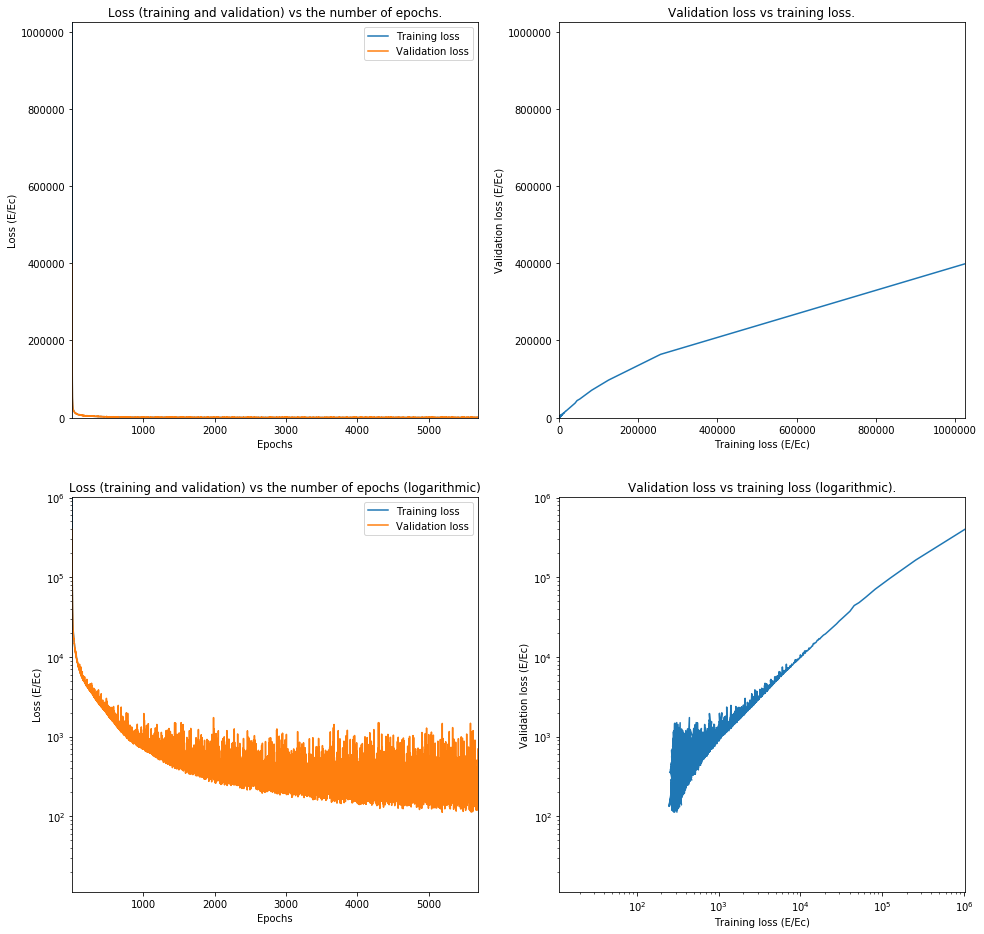

In [26]:
name = 'TwoDenseLayerLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 4*inputSize, 'softplus', True], ['Dense', 4*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

19576/19576 [==============================] - 0s 12us/step
277.29646919852235


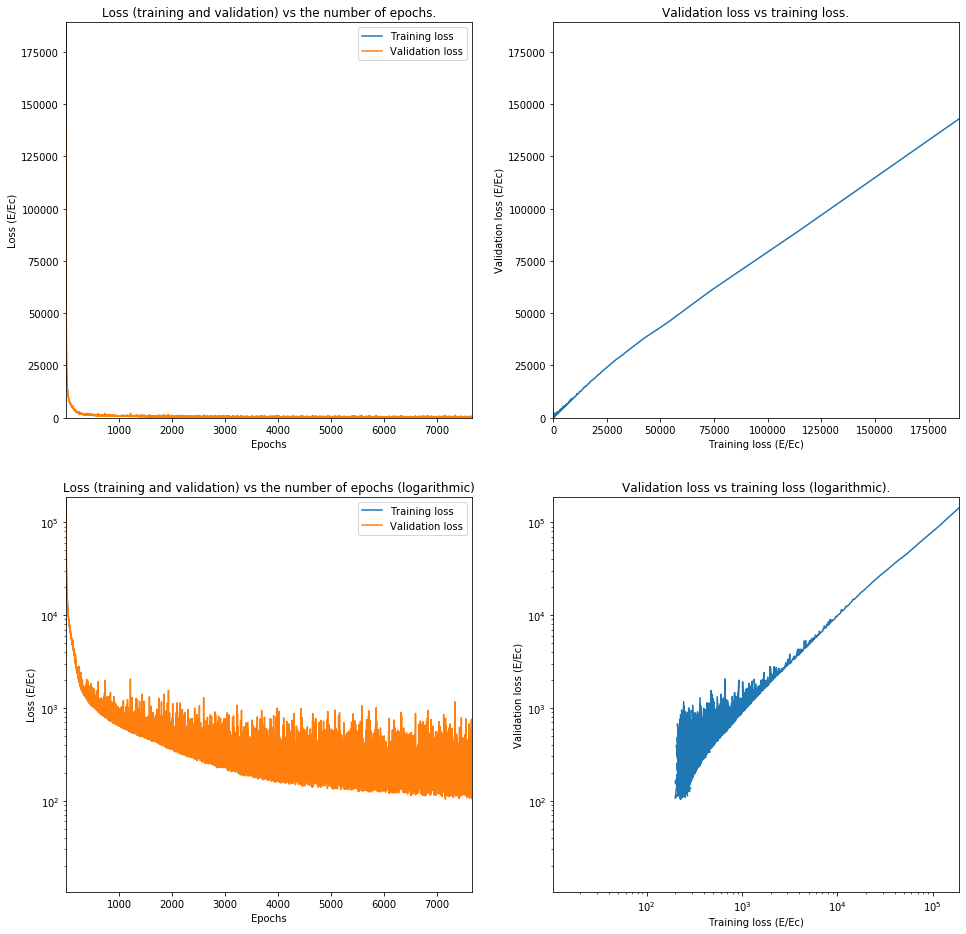

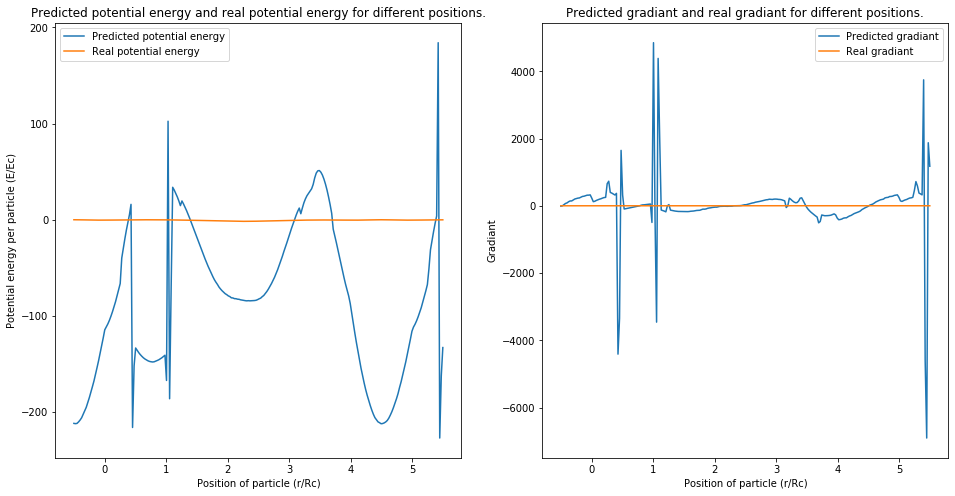

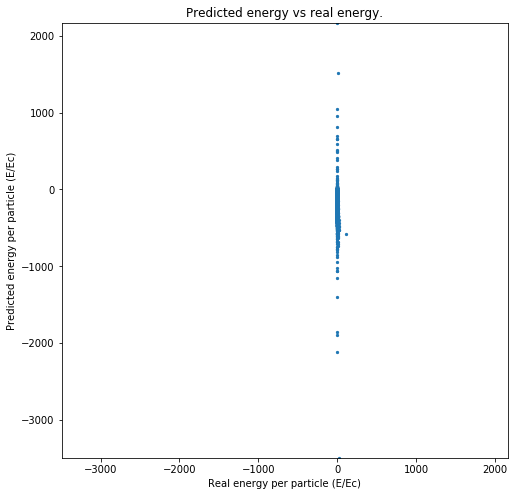

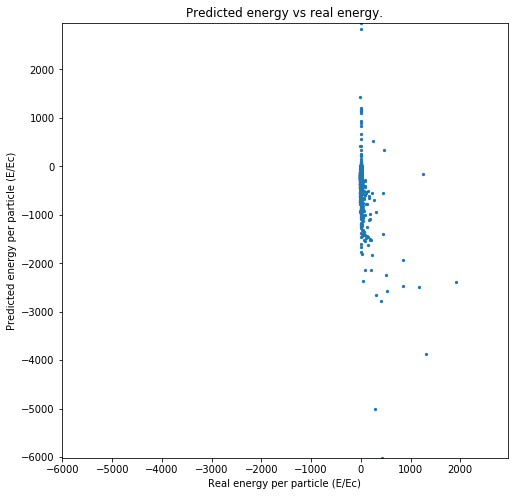

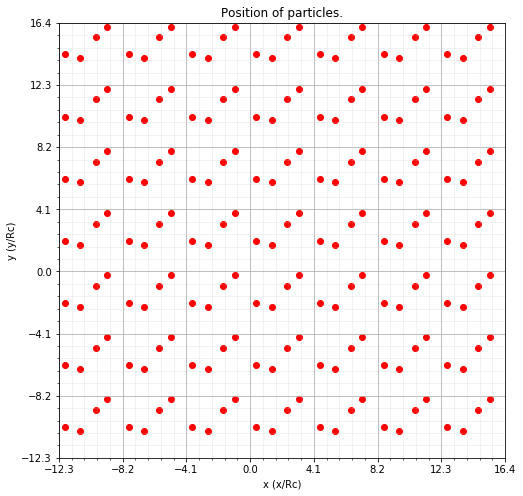

For index 74833 Predicted -794.55945 was -0.2597554968


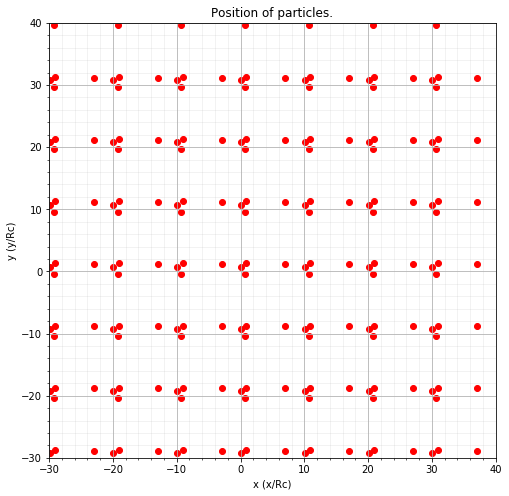

For index 35773 Predicted -104.09459 was -0.3335562019


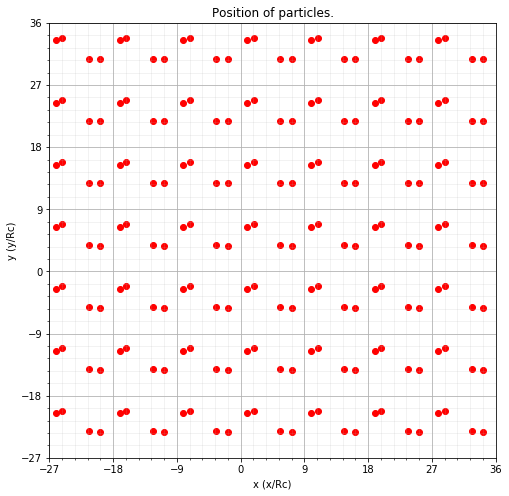

For index 5551 Predicted -135.61412 was -0.1150331337


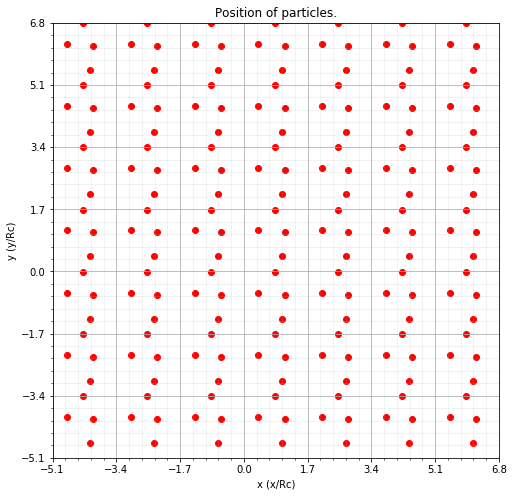

For index 39363 Predicted -4499.716 was 1556.8077658392


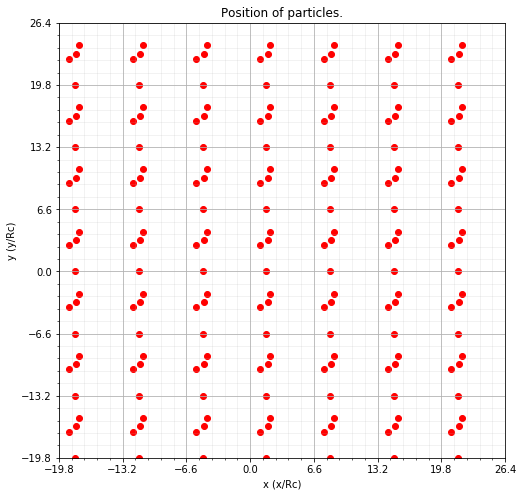

For index 2706 Predicted -118.52037 was -0.6221759978


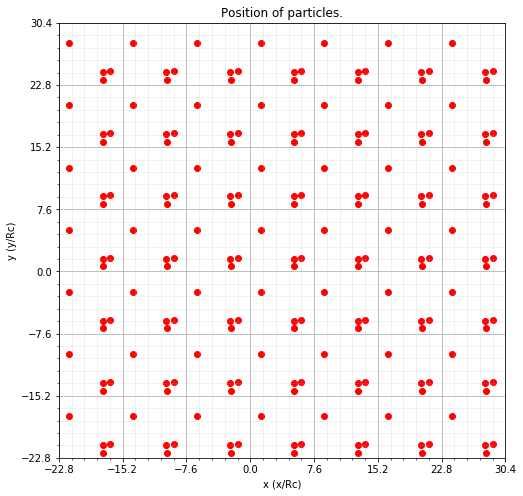

For index 29954 Predicted -289.48132 was -1.0098895203


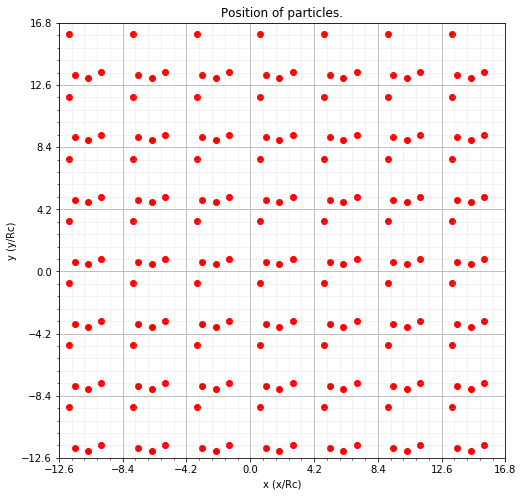

For index 61923 Predicted -193.00475 was -0.7630583212000001


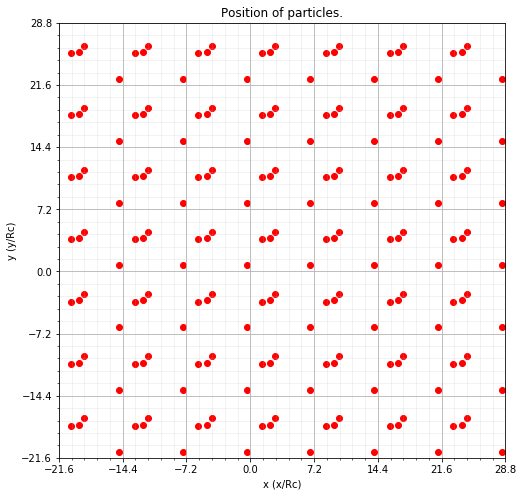

For index 65357 Predicted -111.035995 was -0.6674631693


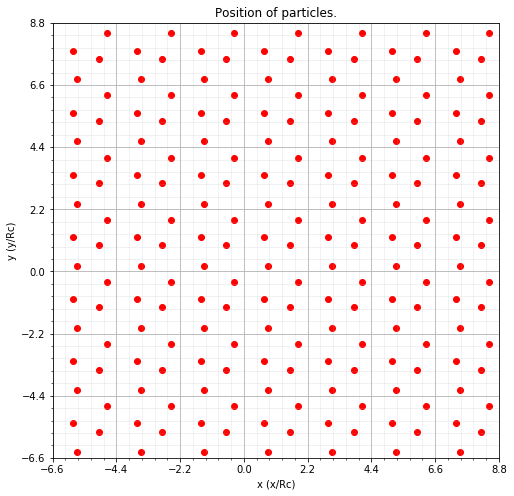

For index 89024 Predicted -244.48131 was -7.6946347464


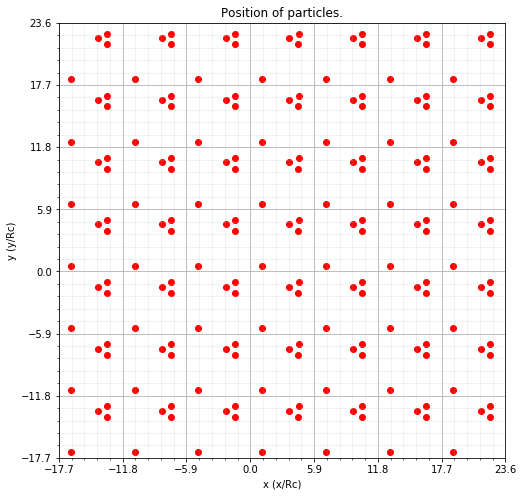

For index 1996 Predicted -57.012558 was -1.3010053557


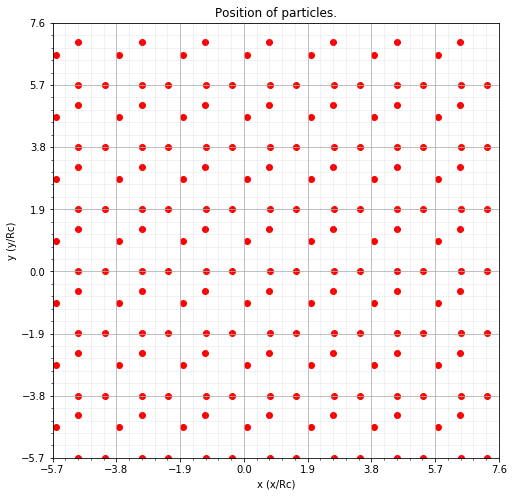

For index 36369 Predicted 32336.379 was 46.4097302903
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 64)                1088      
_________________________________________________________________
dense_31 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_32 (Dense)             (None, 1)                 65        
Total params: 5,313
Trainable params: 5,313
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[ 0.05843239, -0.885236  , -0.5410557 , ..., -0.3737877 ,
        -0.16104966,  0.1905961 ],
       [-0.16793561, -1.627405  , -0.16184863, ..., -0.22989784,
         0.20343705,  0.55696213],
       [-0.9394758 ,  0.401084  , -1.3664293 , ..., -0.2079589 ,
         0.9946764 ,  1.5115879 ],
       ...,
    

In [27]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


# Finishing

In [28]:
for i in range(len(models)):
    model = models[i]['model']
    print(models[i]['name'])
    print(model.summary())
    print(models[i]['evaluation'])
    model.save(saveFolder + '/' + models[i]['name'] + str(models[i]['evaluation']) + '.h5')
    print('\n \n')

#model = models[1][0]
#model.save('model1.h5')
#model = load_model('model1.h5')

0LinearNetwork
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 1)                 17        
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
13.571691292083454

 

1DenseLayerSmallSoftplus
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 17        
Total params: 289
Trainable params: 289
Non-trainable params: 0
_________________________________________________________________
None
7.52257711681776

 

2DenseLayerMediumSoftplus
Model: "sequential_14"
___________________________

In [ ]:
model = load_model(saveFolder+ '/' +'0LinearNetwork0.46557734359635244.h5')

evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())
